In [5]:
# If running in Google Colab, import files
try:
    import google.colab
    in_colab = True
except:
    in_colab = False

if in_colab:
    !git clone https://github.com/Hyperparticle/one-pixel-attack-keras.git
    !mv -v one-pixel-attack-keras/* .
    !rm -rf one-pixel-attack-keras

# Python Libraries
%matplotlib inline
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time
import math
from keras.datasets import cifar10
from keras import backend as K # original
#from kears import keras.backend.tensorflow_backend as K
import tensorflow as tf
from PIL import Image
from mpl_toolkits.mplot3d import Axes3D
from matplotlib import cm
import matplotlib

# Custom Networks
from networks.lenet import LeNet
from networks.pure_cnn import PureCnn
from networks.network_in_network import NetworkInNetwork
from networks.resnet import ResNet
from networks.densenet import DenseNet
from networks.wide_resnet import WideResNet
from networks.capsnet import CapsNet

# Helper functions
from differential_evolution import differential_evolution
import helper

matplotlib.style.use('ggplot')
np.random.seed(100)

This notebook will demonstrate the one pixel attack with a few different convolutional neural network models. By using differential evolution, we find a special pixel that can modify a target image such that the network misclassifies the image (which it previously correctly classified).

In theory, we want models that don't get fooled by such tiny changes. Especially in images, it is undesirable to have a small alteration in the input result in a drastic change in the output. However, even the most accurate neural networks are susceptible to this type of attack.

To read more about it, see [the original paper](https://arxiv.org/abs/1710.08864), or the authors' [official repo](https://github.com/Carina02/One-Pixel-Attack).

Let's get started.

![](images/pred2.png "All it takes is one pixel")

# One Pixel Attack Tutorial
## Part 1 - Cifar10

### Dan Kondratyuk
### September 15, 2019

We can access and display any image in the dataset by its index. For instance, here is a horse.

## Imports

In [6]:
(x_train, y_train), (x_test, y_test) = cifar10.load_data()

Ensure that you have `numpy`, `pandas`, `scipy`, `matplotlib`, `tensorflow-gpu`, and `keras` installed.

Alternatively, you may [run this notebook in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7). Note: colab allows you to run this notebook on GPU, free of charge. Simply select "GPU" in the Accelerator drop-down in Notebook Settings (either through the Edit menu or the command palette at cmd/ctrl-shift-P).

In [7]:
class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']

## Load Dataset

For this attack, we will use the [Cifar10 dataset](https://www.cs.toronto.edu/~kriz/cifar.html) packaged by Keras. The task of the dataset is to correctly classify a 32x32 pixel image in 1 of 10 categories (e.g., bird, deer, truck).

The code below will load the Cifar10 dataset. Keras will need to download the dataset if it is not cached locally already.

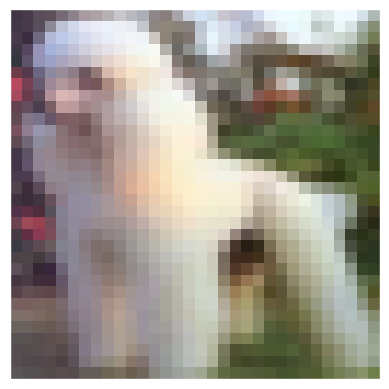

In [8]:
image_id = 520 # Image index in the test set
helper.plot_image(x_test[image_id])
#temp_img = Image.fromarray(x_test[image_id])
#temp_img.save("../Data_for_Paper/520.png", "png")

In [9]:
# this cell is added for test
print(type(x_test[0]))
print(type(y_test[0])) # blank image
temp_img = Image.fromarray(x_test[16])
print(x_test[16])
# temp_img2.show()
# print(temp_img.width)
# print(temp_img.height)
# temp_img.show()
# helper.plot_image(temp_img) # 얘는 걍 ndim array 넣어줘야 정상 작동하는듯??

<class 'numpy.ndarray'>
<class 'numpy.ndarray'>
[[[ 95  76  78]
  [ 92  77  78]
  [ 89  77  77]
  ...
  [ 30  28  38]
  [175 183 191]
  [225 234 240]]

 [[ 90  71  73]
  [ 86  72  72]
  [ 83  71  71]
  ...
  [  0   0  13]
  [ 60  63  79]
  [165 171 189]]

 [[ 88  69  71]
  [ 84  70  70]
  [ 82  70  70]
  ...
  [  5   0  12]
  [ 24  26  48]
  [127 139 165]]

 ...

 [[203 176 161]
  [213 175 156]
  [202 165 155]
  ...
  [182 183 189]
  [118 120 125]
  [ 37  32  46]]

 [[123  94  90]
  [210 170 157]
  [211 171 160]
  ...
  [116 116 120]
  [ 44  45  47]
  [ 11   3  15]]

 [[102  85  84]
  [208 183 175]
  [215 186 176]
  ...
  [ 37  33  43]
  [ 17  13  22]
  [ 22  11  28]]]


## Image Perturbation

To begin, we need a function to modify one or more pixels in an image. 

We can define the perturbation of a pixel as a 5-tuple 

$$\textbf{x} = (x, y, r, g, b)$$

where $x, y$ are the coordinates of the pixel from 0 to 31, and $r,g,b$ are the red, green, and blue values from 0 to 255. Then multiple perturbations can simply be a concatenation of these tuples:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

We could instead use an array of tuples, but the optimization algorithm we will use requires it to be a flat 1-d vector.

Then the function to perturb an image can take as an input the image and $X$, and output a copy of the image with each pixel at $x_i, y_i$ modified to have the color $r_i, g_i, b_i$. To speed up computation, we will batch together an array of $X$ perturbations, denoted $X_S$.

In [10]:
def perturb_image(xs, img):
    # If this function is passed just one perturbation vector,
    # pack it in a list to keep the computation the same
    if xs.ndim < 2:
        xs = np.array([xs])
    
    # Copy the image n == len(xs) times so that we can 
    # create n new perturbed images
    tile = [len(xs)] + [1]*(xs.ndim+1)
    imgs = np.tile(img, tile)
    # numpy tile(A, repeat_shape)
    # A라는 array가 repeat_shape 모양으로 쌓이도록
    # 추후에 다시 보자..
    
    # Make sure to floor the members of xs as int types
    xs = xs.astype(int)
    
    for x,img in zip(xs, imgs):
        # Split x into an array of 5-tuples (perturbation pixels)
        # i.e., [[x,y,r,g,b], ...]
        pixels = np.split(x, len(x) // 5)
        # pixels = 5-tuple of perturb information (x,y,r,g,b) by kyle
        for pixel in pixels:
            # At each pixel's x,y position, assign its rgb value
            x_pos, y_pos, *rgb = pixel # *rgb = 뒤에 올 (r,g,b) 값을 가리킨다
            img[x_pos, y_pos] = rgb # perturb image by *rgb == (r,g,b) by kyle
    
    return imgs
    # Return value is array of perturbed images by xs
    # For example, if xs is [(16,16,255,255,0), (16,16,0,255,255)]
    # imgs is an array of perturbed image by xs[0], xs[1]. So it's size is 2 by kyle

Now we can modify the pixels of any image we want.

Let's modify our horse image by making pixel (16,16) yellow.

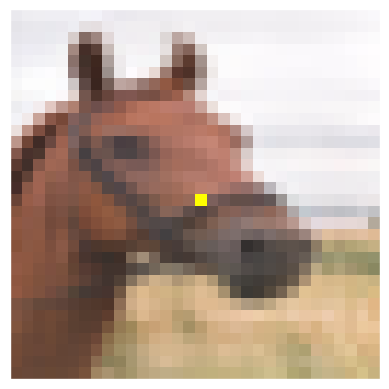

In [11]:
image_id = 99 # Image index in the test set
pixel = np.array([16, 16, 255, 255, 0]) # pixel = x,y,r,g,b
image_perturbed = perturb_image(pixel, x_test[image_id])[0]

helper.plot_image(image_perturbed)

## Load Models

To demonstrate the attack, we need some neural network models trained on the Cifar10 dataset. We will now load some pretrained models, which can be found in the `networks/models` directory.

It is recommended to use Keras with a GPU enabled. If you're [running in Google Colab](https://colab.research.google.com/drive/1Zq1kGP9C7i-70-SXyuEEaqYngtyQZMn7), you can enable a GPU instance by selecting `Runtime > Change runtime type > Hardware accelerator > GPU` (you will need to re-run all cells). The code below can be used to check (if using TensorFlow).

In [12]:
# Should output /device:GPU:0
#K.tensorflow_backend._get_available_gpus() #original
tf.compat.v1.disable_eager_execution()
tf.config.list_physical_devices('GPU')

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]

There are two models included in this repository, `lenet` and `resnet` which will be loaded from disk automatically.

Optionally, you may [download the larger, more accurate models](https://www.dropbox.com/sh/dvatkpjl0sn79kn/AAC9L4puJ_sdFUkDZfr5SFkLa?dl=0) (e.g., Capsule Network, DenseNet, etc.). Make sure to copy the models into the `networks/models/` directory. Then uncomment the lines below and run the cell to load the models of your choosing.

In [13]:
lenet = LeNet()
resnet = ResNet()

# originally, lenet and resnet

## Uncomment below to load more models to play with. Make sure the model files exist by training or downloading them.

# lenet = LeNet()
pure_cnn = PureCnn()
net_in_net = NetworkInNetwork()
# resnet = ResNet()
densenet = DenseNet()
wide_resnet = WideResNet()
# capsnet = CapsNet()
# models = [lenet, resnet, wide_resnet]

models = [lenet, pure_cnn, net_in_net, resnet, densenet, wide_resnet]

Metal device set to: Apple M1
Successfully loaded lenet


2023-09-12 11:58:39.620499: W tensorflow/tsl/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2023-09-12 11:58:39.652421: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/bias/Assign' id:115 op device:{requested: '', assigned: ''} def:{{{node dense_3/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](dense_3/bias, dense_3/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:39.767244: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/bias/momentum/Assign' id:375 op device:{requested: '', assigned: ''} def:{{{node dense_3/bias/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](dense_3/bias/momentum, dense_3/bias/momentum/Initializer/

Instructions for updating:
Colocations handled automatically by placer.


2023-09-12 11:58:40.823321: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_13/kernel/Assign' id:1286 op device:{requested: '', assigned: ''} def:{{{node conv2d_13/kernel/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_13/kernel, conv2d_13/kernel/Initializer/stateless_truncated_normal)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:41.459852: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_30/gamma/momentum/Assign' id:4632 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_30/gamma/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_30/gamma/momentum, batch_normalization_30/gamma/momentum/Initializer/zeros)}}' was cha

Successfully loaded resnet


2023-09-12 11:58:42.081610: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_6_1/bias/Assign' id:5357 op device:{requested: '', assigned: ''} def:{{{node conv2d_6_1/bias/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_6_1/bias, conv2d_6_1/bias/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:42.396749: W tensorflow/c/c_api.cc:300] Operation '{name:'conv2d_9_1/bias/v/Assign' id:5835 op device:{requested: '', assigned: ''} def:{{{node conv2d_9_1/bias/v/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](conv2d_9_1/bias/v, conv2d_9_1/bias/v/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trig

Successfully loaded pure_cnn


2023-09-12 11:58:43.075199: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_7_1/moving_variance/Assign' id:6473 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_7_1/moving_variance/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_7_1/moving_variance, batch_normalization_7_1/moving_variance/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:43.492378: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_9_1/beta/momentum/Assign' id:7265 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_9_1/beta/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_9_1/beta/momentu

Successfully loaded net_in_net


2023-09-12 11:58:46.857761: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_90/moving_mean/Assign' id:13145 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_90/moving_mean/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_90/moving_mean, batch_normalization_90/moving_mean/Initializer/zeros)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:48.770929: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_54/gamma/momentum/Assign' id:18074 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_54/gamma/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_54/gamma/momentum, batch_normaliz

Successfully loaded densenet


2023-09-12 11:58:50.906475: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_4_3/gamma/Assign' id:20352 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_4_3/gamma/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_4_3/gamma, batch_normalization_4_3/gamma/Initializer/ones)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.
2023-09-12 11:58:52.326691: W tensorflow/c/c_api.cc:300] Operation '{name:'batch_normalization_13_2/beta/momentum/Assign' id:22228 op device:{requested: '', assigned: ''} def:{{{node batch_normalization_13_2/beta/momentum/Assign}} = AssignVariableOp[_has_manual_control_dependencies=true, dtype=DT_FLOAT, validate_shape=false](batch_normalization_13_2/beta/momentum, batch_normalization_13_2/beta/mo

Successfully loaded wide_resnet


Note that there are even more networks available in the `networks` directory, but must be trained before loading them here.

### Calculate Model Accuracies

After loading the models, we would like to evaluate all test images with each model to ensure that we only attack the images which have been classified correctly. The code below will also display the accuracy and number of parameters of each model.

In [14]:
network_stats, correct_imgs = helper.evaluate_models(models, x_test, y_test)
correct_imgs = pd.DataFrame(correct_imgs, columns=['name', 'img', 'label', 'confidence', 'pred'])
network_stats = pd.DataFrame(network_stats, columns=['name', 'accuracy', 'param_count'])

network_stats

Evaluating lenet


/opt/homebrew/Caskroom/miniforge/base/lib/python3.9/site-packages/keras/engine/training_v1.py:2359: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2023-09-12 11:58:53.535924: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_3/Softmax' id:121 op device:{requested: '', assigned: ''} def:{{{node dense_3/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating pure_cnn


2023-09-12 11:58:55.244425: W tensorflow/c/c_api.cc:300] Operation '{name:'activation_3_1/Softmax' id:5446 op device:{requested: '', assigned: ''} def:{{{node activation_3_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](global_average_pooling2d_1_1/Mean)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating net_in_net


2023-09-12 11:59:00.322251: W tensorflow/c/c_api.cc:300] Operation '{name:'activation_10_1/Softmax' id:6645 op device:{requested: '', assigned: ''} def:{{{node activation_10_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](global_average_pooling2d_1_2/Mean)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating resnet


2023-09-12 11:59:06.534494: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_1/Softmax' id:2683 op device:{requested: '', assigned: ''} def:{{{node dense_1_1/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_1/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating densenet


2023-09-12 11:59:10.326112: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_2/Softmax' id:13845 op device:{requested: '', assigned: ''} def:{{{node dense_1_2/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_2/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


Evaluating wide_resnet


2023-09-12 11:59:38.411162: W tensorflow/c/c_api.cc:300] Operation '{name:'dense_1_3/Softmax' id:21166 op device:{requested: '', assigned: ''} def:{{{node dense_1_3/Softmax}} = Softmax[T=DT_FLOAT, _has_manual_control_dependencies=true](dense_1_3/BiasAdd)}}' was changed by setting attribute after it was run by a session. This mutation will have no effect, and will trigger an error in the future. Either don't modify nodes after running them or create a new session.


,name,accuracy,param_count
0,lenet,0.7488,62006
1,pure_cnn,0.8877,1369738
2,net_in_net,0.9074,972658
3,resnet,0.9231,470218
4,densenet,0.9467,850606
5,wide_resnet,0.9534,11318026


### Prediction Function

For the black-box attack, all we should care about is the inputs to the model (the images), and the outputs of the model (the prediction probabilities). No special information about the model is required; we could even swap it with a model that is not a neural network.

Define a function that runs several perturbed images on a given model and returns the model's confidence (probability output) in the target class, one confidence value per image. If the target class is the correct class, this will be the function that we want to minimize so that the model will be most confident in another class (which is incorrect). Otherwise, the target is an incorrect class and we will want to maximize it.

In [15]:
def predict_classes(xs, img, target_class, model, minimize=True):
    # Perturb the image with the given pixel(s) x and get the prediction of the model
    imgs_perturbed = perturb_image(xs, img)
    predictions = model.predict(imgs_perturbed)[:,target_class]
    # Target class의 값만 뽑아내는 용(파이썬 문법)
    # This function should always be minimized, so return its complement if needed
    return predictions if minimize else 1 - predictions
    # optimization을 풀 때 최솟값으로 풀지 최댓값으로 풀지 보통 정해진다.
    # DE의 기본 format은 minimize를 하는데에 초점이 맞춰져 있다.
    # 만약 targetted라면, target의 confidence를 높이는게 최우선이니 보수를 리턴
    # 아니라면, 내 클래스의 confidence를 낮추는게 우선이니 그냥 리턴

Below we can modify a pixel in an image and see how the confidence of the model changes. In almost all cases, the confidence will not change. However, for very special cases it will change drastically.
#If(untargetted) -> 1-predictions?
내 class의 확률을 낮추고 싶을 때 --> prediction
다르게 인식시키고 싶을 때 --> 1-prediction

<class 'numpy.ndarray'>
Confidence in true class frog is 0.9999999
Prior confidence was 1.0


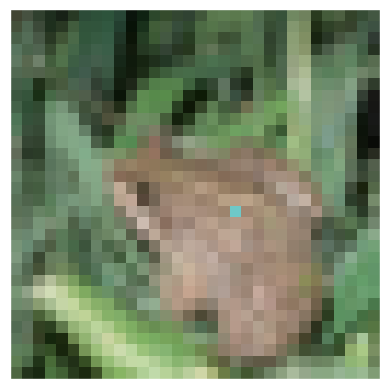

In [16]:
image_id = 4
pixel = np.array([17, 19, 110, 200, 200])
model = resnet

true_class = y_test[image_id, 0]
prior_confidence = model.predict_one(x_test[image_id])[true_class]
confidence = predict_classes(pixel, x_test[image_id], true_class, model)[0]

print(type(model.predict_one(x_test[image_id])))

print('Confidence in true class', class_names[true_class], 'is', confidence)
print('Prior confidence was', prior_confidence)
helper.plot_image(perturb_image(pixel, x_test[image_id])[0])

Confidence in true class dog is [0.9999331]
Prior confidence was 0.9999733


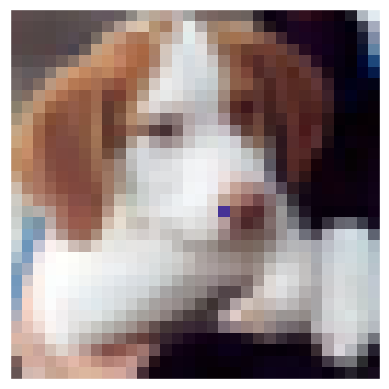

[95 76 78]
[[5, 17, 0.1811955], [6, 14, 0.09939861], [6, 18, 0.09784567], [6, 11, 0.09445697], [6, 17, 0.08650726], [22, 19, 0.06840348], [5, 18, 0.056456804], [3, 12, 0.054075778], [2, 13, 0.053829193], [6, 16, 0.043830395], [7, 12, 0.03764987], [7, 18, 0.035319984], [21, 18, 0.033661485], [6, 13, 0.028870344], [4, 12, 0.02490896], [20, 19, 0.023458362], [5, 14, 0.02083826], [4, 16, 0.01681012], [4, 17, 0.013578534], [5, 13, 0.011624873], [3, 17, 0.010395229], [22, 18, 0.010021746], [4, 14, 0.009427905], [20, 21, 0.009285331], [22, 17, 0.008374929], [1, 10, 0.007924736], [3, 13, 0.0077269673], [7, 11, 0.0075244904], [19, 20, 0.007447958], [20, 20, 0.007189393]]


In [45]:
# this cell is for test
image_id_1 = 16
pixel_1 = np.array([17, 18, 70, 50, 150])
# model = resnet

true_class_1 = y_test[image_id_1, 0]
prior_confidence_1 = model.predict_one(x_test[image_id_1])[true_class_1]
confidence_after_perturb = predict_classes(pixel_1, x_test[image_id_1], true_class_1, model)

print('Confidence in true class', class_names[true_class_1], 'is', confidence_after_perturb)
print('Prior confidence was', prior_confidence_1)
helper.plot_image(perturb_image(pixel_1, x_test[image_id_1]))

print(x_test[image_id_1][0][0])

# pixel_value is triple of (r,g,b) value, img's type is nd.array // 추후 여기 분리하자
def sensitive_pixel_sorting(image_id):
    img = x_test[image_id].copy()
    target_class = y_test[image_id, 0]

    diff_list = [[0,0,0]]

    prior_confidence =  model.predict_one(img)[target_class]

    rgb = [0, 0, 0]
    
    sensitive_list_size = 30

    for x in range(32):
        for y in range(32):

          for i in range(3):
              if img[x][y][i] >= 128:
                rgb[i] = 0
              else:
                rgb[i] = 255

          pixel = np.array([x, y,  rgb[0], rgb[1], rgb[2]])
          perturbed_image = perturb_image(pixel, img)
          
          after_confidence =  model.predict_one(perturbed_image)[target_class]
          diff_confidence = abs(after_confidence - prior_confidence)

          if diff_confidence > 0:
              for diff_index in range(len(diff_list)):
                  if diff_confidence >= diff_list[diff_index][2]:
                      diff_list.insert(diff_index, [x, y, diff_confidence])
                      if (len(diff_list) > sensitive_list_size):
                          diff_list.pop()
                      break
    return diff_list

diff_list = sensitive_pixel_sorting(16)
print(diff_list)

In [18]:
# To check confidence score and class of images, is this needed?

con_high_list = [] # 60~99%
con_middle_list = [] # 20~59%
con_low_list = [] # 0~19%


for i in range (4000):
    image_id = i
    true_class = y_test[image_id, 0]
    confidence_score = model.predict_one(x_test[image_id])[true_class]
    # print(confidence_score)
    if confidence_score * 100 >= 60:
        con_high_list.append(i)
    elif 20 <= confidence_score * 100 < 60:
        con_middle_list.append(i)
    else:
        con_low_list.append(i)
    
# print(image_list[16])
# print(confidence_list[16])

print(len(con_high_list))
print(len(con_middle_list))
print(len(con_low_list))




def change_one(change_color, image_id, true_class, stride, pixel_stride):
    x_coord = []

    for i in range(256 // stride):
        x_coord.append(i*4)
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    if change_color == 'r':
        target = 2
    elif change_color == 'g':
        target = 3
        graph_color = 'blue'
    elif change_color == 'b':
        target = 4
        graph_color = 'green'
    for i in range(0, 32, pixel_stride):
        for j in range(0, 32, pixel_stride):
            for k in range(256 // stride):
                original_rgb_value = img[i][j]
                pixel = np.array([i, j, img[i][j][0], img[i][j][1], img[i][j][2]])
                pixel[target] = k * stride # 0, 4, ... , 252
                perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
                # confidence_difference = abs(original_confidence - perturbed_confidence)
                change_confidence_list.append(perturbed_confidence)
    j = 0
    k = -4
    for i in range(64):
        if i%8 == 0:
            k += 4
        plt.plot(x_coord, change_confidence_list[(256 // stride) * i: (256 // stride) * (i+1)], color = graph_color, linestyle = '--', marker = 'o')
        plt.xlabel("rgb value")
        plt.ylabel("confidence score difference")
        plt.title((k,j))
        plt.show()
        j += 4
        if j%32 == 0:
            j = 0

            
# change_one('r', 384, true_class, 4, 4)
            
def change_sensitive(change_color, image_id, true_class, stride):
    x_coord = []

    for i in range(256 // stride):
        x_coord.append(i*4)
    s_list = sensitive_pixel_sorting(image_id)
    img = x_test[image_id].copy()
    graph_color = 'red'
    original_confidence = model.predict_one(x_test[image_id])[true_class]
    if change_color == 'r':
        target = 2
    elif change_color == 'g':
        target = 3
        graph_color = 'blue'
    elif change_color == 'b':
        target = 4
        graph_color = 'green'
    for i in range(30):
        sensitive_x = s_list[i][0]
        sensitive_y = s_list[i][1]
        for k in range(256 // stride):
            original_rgb_value = img[sensitive_x][sensitive_y]
            pixel = np.array([sensitive_x, sensitive_y, img[sensitive_x][sensitive_y][0], img[sensitive_x][sensitive_y][1], img[sensitive_x][sensitive_y][2]])
            pixel[target] = k * stride
            perturbed_confidence = model.predict_one(perturb_image(pixel, img))[true_class]
            # confidence_difference = abs(original_confidence - perturbed_confidence)
            s_change_confidence_list.append(perturbed_confidence)
            
    for i in range(30):
        sensitive_x = s_list[i][0]
        sensitive_y = s_list[i][1]
        plt.plot(x_coord, s_change_confidence_list[(256 // stride) * i: (256 // stride) * (i+1)], color = graph_color, linestyle = '--', marker = 'o')
        plt.xlabel("rgb value")
        plt.ylabel("confidence score difference")
        plt.title((sensitive_x,sensitive_y))
        plt.show() 

#change_sensitive('r', 384, true_class, 4)    





3666
93
241


## The Attack

Here we will demonstrate two variants of the one pixel attack: untargeted and targeted.

### Targeted vs. Untargeted Attacks

The objective of an untargeted attack is to cause a model to misclassify an image. This means we want to perturb an image as to minimize the confidence probability of the correct classification category and maximize the sum of the probabilities of all other categories.

The objective of a targeted attack is to cause a model to classify an image as a given  target class. We want to perturb an image as to maximize the probability of a class of our own choosing.

### Success Criterion

Define a function so that whenever a given perturbation is sufficient to fool a model, it returns `True`. This will be called the success criterion. The `targeted_attack` boolean flag will indicate whether success means maximization of the target class or minimization of the correct (target) class.

In [19]:
def attack_success(x, img, target_class, model, targeted_attack=False, verbose=False):
    # Perturb the image with the given pixel(s) and get the prediction of the model
    attack_image = perturb_image(x, img)

    confidence = model.predict(attack_image)[0] # attack_image가 배열이다. 그 중 하나를 리턴.
    predicted_class = np.argmax(confidence) # 그 중 최댓값을 고른다..
    
    # If the prediction is what we want (misclassification or 
    # targeted classification), return True
    if verbose:
        print('Confidence:', confidence[target_class])
    if ((targeted_attack and predicted_class == target_class) or
        (not targeted_attack and predicted_class != target_class)):
        return True
    # NOTE: return None otherwise (not False), due to how Scipy handles its callback function

Here we demonstrate the usage of the success criterion function. It's nearly identical to `predict_class()` as before, but also decides the success of the attack. For purposes of demonstration we assume an untargeted attack.

Confidence: 0.07460061
Prior confidence 0.50054187
Attack success: True


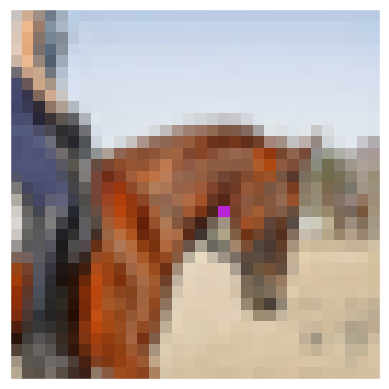

In [20]:
image_id = 541
pixel = np.array([17, 18, 185, 36, 215])
model = resnet

true_class = y_test[image_id, 0]
prior_confidence = model.predict_one(x_test[image_id])[true_class]
success = attack_success(pixel, x_test[image_id], true_class, model, verbose=True)

print('Prior confidence', prior_confidence)
print('Attack success:', success == True)
helper.plot_image(perturb_image(pixel, x_test[image_id])[0])

### Attack Function

Finally, we arrive at the attack itself: how do we find the pixels that will result in a successful attack? First, formulate it as an optimization problem: in an untargeted attack, minimize the confidence of the correct class, and in a targeted attack, maximize the confidence of a target class. This is precisely our `predict_class` function.

When performing black-box optimizations such as the one pixel attack, it can be very difficult to find an efficient gradient-based optimization that will work for the problem. It would be nice to use an optimization algorithm that can find good solutions without relying on the smoothness of the function. In our case, we have discrete integer positions ranging from 0 to 31 and color intensities from 0 to 255, so the function is expected to be jagged.

For that, we use an algorithm called [differential evolution](https://en.wikipedia.org/wiki/Differential_evolution). Here's an example of differential evolution optimizing the [Ackley function](https://en.wikipedia.org/wiki/Ackley_function) (if you're using Google Colab, run the code cell below):

<br>

![Ackley GIF](images/Ackley.gif)

<br>

Differential evolution is a type of evolutionary algorithm where a population of candidate solutions generate offspring which compete with the rest of the population each generation according to their fitness. Each candidate solution is represented by a vector of real numbers which are the inputs to the function we would like to minimize. The lower the output of this function, the better the fitness. The algorithm works by initializing a (usually random) population of vectors, generating new offspring vectors by combining (mutating) individuals in the population, and replacing worse-performing individuals with better candidates.

In the context of the one pixel attack, our input will be a flat vector of pixel values:

$$X = (x_1, y_1, r_1, g_1, b_1, x_2, y_2, r_2, g_2, b_2, ...)$$

These will be encoded as floating-point values, but will be floored back into integers to calculate image perturbations. First we generate a random population of $n$ perturbations

$$\textbf{P} = (X_1, X_2, \dots, X_n)$$

Then, on each iteration we calculate $n$ new mutant children using the formula

$$X_i = X_{r1} + F (X_{r2} - X_{r3})$$

such that

$$r1 \neq r2 \neq r3$$

where $r1,r2,r3$ are random indices into our population $\textbf{P}$, and $F = 0.5$ is a mutation parameter. Basically, we pick 3 random individuals from the previous generation and recombine them to make a new candidate solution. If this candidate $X_i$ gives a lower minimum at position $i$ (i.e., the attack is closer to success), replace the old $X_i$ with this new one. This process repeats for several iterations until our stopping criterion, `attack_success`, which is when we find an image that successfully completes the attack.

<br>

See [this excellent tutorial post](https://pablormier.github.io/2017/09/05/a-tutorial-on-differential-evolution-with-python/) on how differential evolution works in greater detail. 

We will use a [slight modification](differential_evolution.py) of [Scipy's implementation of differential evolution](https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html) to utilize GPU parallelism by batching predictions together.

In [21]:
# Run this cell if you are using Google Colab to see the Ackley GIF
if in_colab:
    from IPython.display import Image
    with open('images/Ackley.gif','rb') as file:
        display(Image(file.read()))

In [22]:
#pixel_list = sensitive_pixel_sorting(384)# temp, 384 sensitive list

In [23]:
def attack(img_id, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img_id, 0]
    
    # Define bounds for a flat vector of x,y,r,g,b values
    # For more pixels, repeat this layout
    bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
    
    # Population multiplier, in terms of the size of the perturbation vector x
    popmul = max(1, popsize // len(bounds))
    # 이거 체크, 왜 이런 표현을 썼지..?
    # 나중에 parameter_count를 다시 곱해줄 거라 여기서 나눠준다.
    
    
    """
        1. Choose sensitive pixel by confidence score difference
            1.1 predict 통해서 confidence score difference 비교하고
            1.2 descending order sorting      
        2. Color distance
            2.1 distance 구하는 function 따로 만들어 놓자(조금만 바꾸면 될 듯?)
        3. Algorithm1 & Algorithm2
        4. 추후 OPA2D-ATK은 얘를 복붙해서 조금만 바꿔서 만들면 될 듯?
    """
    
    # Format the predict/callback functions for the differential evolution algorithm
    def predict_fn(xs):
        return predict_classes(xs, x_test[img_id], target_class, 
                               model, target is None)                                                         
    
    def callback_fn(x, convergence):
        return attack_success(x, x_test[img_id], target_class, 
                              model, targeted_attack, verbose)
    
    # Call Scipy's Implementation of Differential Evolution
    attack_result = differential_evolution(
        predict_fn, bounds, maxiter=maxiter, popsize=popmul,
        recombination=1, atol=-1, callback=callback_fn, polish=False)
    # result == (self.x, self.population_energies[0], nfev, nit, status_message, warning_flag)

    # Calculate some useful statistics to return from this function
    attack_image = perturb_image(attack_result.x, x_test[img_id])[0]
    prior_probs = model.predict_one(x_test[img_id]) # 여기가 테스트할 부분
    predicted_probs = model.predict_one(attack_image) # 여기가 테스트할 부분
    predicted_class = np.argmax(predicted_probs)
    actual_class = y_test[img_id, 0]
    success = predicted_class != actual_class
    cdiff = prior_probs[actual_class] - predicted_probs[actual_class]

    # Show the best attempt at a solution (successful or not)
    helper.plot_image(attack_image, actual_class, class_names, predicted_class)

    return [model.name, pixel_count, img_id, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]


In [24]:
global Lopt
Lopt = 256
global Alphamax
Alphamax = Lopt - 1
global Alphamin
Alphamin = 1
global Alpha
Lopt_list = []
attacked_pixel_coord = []
def my_attack_3(img_id, model, target=None, pixel_count=1, 
           maxiter=75, popsize=400, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img_id, 0]
    
    
    global Alphamax
    global Alphamin
    global Lopt
    global Alpha
    
    # pixel_list.reverse()
    
    # pixel_list = sensitive_pixel_sorting(img_id)
    for i in range(0,30):
        # Re-initialize
        Lopt = 256
        Alphamax = Lopt - 1
        Alphamin = 1
        print("\n\nRound ", i)
        while(Alphamin <= Alphamax):
            # print(Alphamin)
            # print(Alphamax)
            img = x_test[img_id]
            sensitive_x_coord = pixel_list[i][0]
            sensitive_y_coord = pixel_list[i][1]
            original_rgb = img[sensitive_x_coord][sensitive_y_coord]
            Alpha = (Alphamax + Alphamin) // 2
            new_rgb_range = [(max(original_rgb[0] - Alpha, 0), min(original_rgb[0] + Alpha, 255)), (max(original_rgb[1] - Alpha, 0), min(original_rgb[1] + Alpha, 255)), (max(original_rgb[2] - Alpha, 0), min(original_rgb[2] + Alpha, 255))]
            # print(new_rgb_range)
            new_red_range = new_rgb_range[0]
            new_green_range = new_rgb_range[1]
            new_blue_range = new_rgb_range[2]
            # print(new_red_range)
            # print(new_green_range)
            # print(new_blue_range)


            # Define bounds for a flat vector of x,y,r,g,b values
            # For more pixels, repeat this layout
            # bounds = [(0,32), (0,32), (0,256), (0,256), (0,256)] * pixel_count
            bounds = [(sensitive_x_coord, sensitive_x_coord), (sensitive_y_coord, sensitive_y_coord), new_red_range, new_green_range, new_blue_range]


            # Population multiplier, in terms of the size of the perturbation vector x
            popmul = max(1, popsize // len(bounds))
            # 이거 체크, 왜 이런 표현을 썼지..?
            # 나중에 parameter_count를 다시 곱해줄 거라 여기서 나눠준다.


            """
                1. Choose sensitive pixel by confidence score difference
                    1.1 predict 통해서 confidence score difference 비교하고
                    1.2 descending order sorting      
                2. Color distance
                    2.1 distance 구하는 function 따로 만들어 놓자(조금만 바꾸면 될 듯?)
                3. Algorithm1 & Algorithm2
                4. 추후 OPA2D-ATK은 얘를 복붙해서 조금만 바꿔서 만들면 될 듯?
            """

            # Format the predict/callback functions for the differential evolution algorithm
            def predict_fn(xs):
                return predict_classes(xs, x_test[img_id], target_class, 
                                       model, target is None)                                                         

            def callback_fn(x, convergence):
                return attack_success(x, x_test[img_id], target_class, 
                                      model, targeted_attack, verbose)

            # Call Scipy's Implementation of Differential Evolution
            attack_result = differential_evolution(
                predict_fn, bounds, maxiter=maxiter, popsize=popmul,
                recombination=1, atol=-1, callback=callback_fn, polish=False)
            # result == (self.x, self.population_energies[0], nfev, nit, status_message, warning_flag)
            # print(attack_result.x)
            # Calculate some useful statistics to return from this function
            attack_image = perturb_image(attack_result.x, x_test[img_id])[0]
            # final_attack_image = attack_image # mycode
            prior_probs = model.predict_one(x_test[img_id]) # 여기가 테스트할 부분
            predicted_probs = model.predict_one(attack_image) # 여기가 테스트할 부분
            predicted_class = np.argmax(predicted_probs)
            actual_class = y_test[img_id, 0]
            success = predicted_class != actual_class
            cdiff = prior_probs[actual_class] - predicted_probs[actual_class]
            # my code
            if(success):
                Lopt = max(abs(attack_result.x[2] - original_rgb[0]), abs(attack_result.x[3] - original_rgb[1]), abs(attack_result.x[4] - original_rgb[2]))
                # print("Lopt  in if is", Lopt)
                Alphamax = Lopt - 1
                final_attack_image = attack_image
                final_predicted_class = predicted_class
                helper.plot_image(final_attack_image, actual_class, class_names, final_predicted_class)
                Lopt_list.append(Lopt)
                attacked_pixel_coord.extend([i, sensitive_x_coord, sensitive_y_coord])
                print("Success Lopt is", Lopt)
                # print("In success")
            else:
                # print("Alpha is", Alpha)
                Alphamin = Alpha + 1
                # print("else Alphamin = ", Alphamin)
                # print("Lopt  in else is", Lopt)
        """
        # my code
        if(success):
            Lopt = max(abs(attack_result.x[2] - original_rgb[0]), abs(attack_result.x[3] - original_rgb[1]), abs(attack_result.x[4] - original_rgb[2]))
            Alphamax = Lopt - 1
            count += 1
        else:
            Alphamin = Alpha + 1
            count += 1
        """

        # Show the best attempt at a solution (successful or not)
        print("Final Lopt is", Lopt)
        # helper.plot_image(attack_image, actual_class, class_names, predicted_class)
        #Re-initialize

    return [model.name, pixel_count, img_id, actual_class, predicted_class, success, cdiff, prior_probs, predicted_probs, attack_result.x]

In [43]:
# This cell is for OPA2D_Attack.

def Algorithm1(image_id, model, sensitive_list):
    
    #sensitive_pixel = sensitive_pixel_sorting(image_id)
    #print(sensitive_pixel)
    x_success = None
    L_opt = 256

    for pixel in sensitive_list:
        L_opt = 256
        print("pixel coordinate : " + str(pixel[0]) + ", " + str(pixel[1]))
        img = x_test[image_id].copy()
        x_pos = pixel[0]
        y_pos = pixel[1]
        r_xk = img[x_pos][y_pos][0]
        g_xk = img[x_pos][y_pos][1]
        b_xk = img[x_pos][y_pos][2]

        a_max = L_opt-1
        a_min = 1
        x_prime = None
        x = [x_pos, y_pos, r_xk, g_xk, b_xk]
        while a_min <= a_max:
            # difference with pseudo code, we have found an error of code, - -> + (minus to plus)
            a = (a_max + a_min) // 2
            R_xk_bounds = [(bound(r_xk - a), bound(r_xk+a)), (bound(g_xk-a), bound(g_xk+a)), (bound(b_xk-a), bound(b_xk+a))]

            x_prime, success = opa2d_attack(image_id, model, R_xk_bounds, x_pos, y_pos)
            print("alpha : ", a)
            print("alpha_min : ", a_min)
            if success:
                L_opt = dist(x,x_prime)
                a_max = L_opt-1
                x_success = x_prime
            else:
                a_min = a_min + a + 1

    if(L_opt < 256):
        return (x_success,"attack success")
    else:
        return (x_success,"attack failed")
    
def dist(x, x_prime):
    return max(abs(x[2] - x_prime[2]), abs(x[3] - x_prime[3]), abs(x[4] - x_prime[4]))

def bound(num):
    return max(0, min(255,num))

def opa2d_attack(img_id, model, R_xk_bounds, x_pos, y_pos, target=None, pixel_count=1, maxiter=5, popsize=50, verbose=False):
    # Change the target class based on whether this is a targeted attack or not
    targeted_attack = target is not None
    target_class = target if targeted_attack else y_test[img_id, 0]
    
    # Define bounds for a flat vector of x,y,r,g,b values
    # For more pixels, repeat this layout
    bounds = [(x_pos, x_pos), (y_pos, y_pos), R_xk_bounds[0], R_xk_bounds[1], R_xk_bounds[2]] * pixel_count

    # Population multiplier, in terms of the size of the perturbation vector x
    popmul = max(1, popsize // len(bounds))
    
    # Format the predict/callback functions for the differential evolution algorithm
    def predict_fn(xs):
        return predict_classes(xs, x_test[img_id], target_class, 
                               model, target is None)
    
    def callback_fn(x, convergence):
        return attack_success(x, x_test[img_id], target_class, 
                              model, targeted_attack, verbose)
    
    # Call Scipy's Implementation of Differential Evolution
    attack_result = differential_evolution(
        predict_fn, bounds, maxiter=maxiter, popsize=popmul,
        recombination=1, atol=-1, callback=callback_fn, polish=False)
    
    # Calculate some useful statistics to return from this function
    attack_image = perturb_image(attack_result.x, x_test[img_id])[0]
    predicted_probs = model.predict_one(attack_image)
    predicted_class = np.argmax(predicted_probs)
    actual_class = y_test[img_id, 0]
    # helper.plot_image(attack_image, actual_class, class_names, predicted_class)

    success = predicted_class != actual_class
    
    return [(attack_result.x[0], attack_result.x[1], attack_result.x[2], attack_result.x[3], attack_result.x[4]), success]

# From here, We propose our gradient_descent using momentum. <br>

There are many variations.


In [47]:
def bound(value):
    return int(max(0, min(value, 255)))


def gradient_descent_momentum(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)
    print("original confidence is : ", original_confidence[true_class], '\n')
    #img[sensitive_x][sensitive_y][0]
    #img[sensitive_x][sensitive_y][1]
    #img[sensitive_x][sensitive_y][2]
    r = img[sensitive_x][sensitive_y][0]
    g = img[sensitive_x][sensitive_y][1]
    b = img[sensitive_x][sensitive_y][2]
    print("original rgb is : ", r, g, b)
    
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 1200 # hyperparameter, confidence 낮출 땐 0.1
    vr = 0
    vg = 0
    vb = 0
    
    iteration_num = 20 # num of iteration, hyperparameter
    
    for i in range(iteration_num):
        decr_red = np.array([sensitive_x, sensitive_y, bound(r-1), g, b])
        incr_red = np.array([sensitive_x, sensitive_y, bound(r+1), g, b])
        decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
        incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]

    
        diff_r = (incr_red_confidence - decr_red_confidence)
        print(diff_r)
        
        decr_green = np.array([sensitive_x, sensitive_y, r, bound(g-1), b])
        incr_green = np.array([sensitive_x, sensitive_y, r, bound(g+1), b])
        decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
        incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]

    
        diff_g = (incr_green_confidence - decr_green_confidence)
        print(diff_g)
        
        decr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b-1)])
        incr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b+1)])
        decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
        incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]

    
        diff_b = (incr_blue_confidence - decr_blue_confidence)
        print(diff_b)
        
        
        vr = momentum * vr - learning_rate * diff_r # r axis vector
        vg = momentum * vg - learning_rate * diff_g # g axis vector
        vb = momentum * vb - learning_rate * diff_b # b axis vector
        
        print(vr, vg, vb)
        new_r = bound(r + vr)
        new_g = bound(g + vg)
        new_b = bound(b + vb)
        xs = np.array([sensitive_x, sensitive_y, new_r, new_g, new_b])
        print("new rgb is : ", new_r, new_g, new_b)
        predicted_probs = model.predict_one(perturb_image(xs, img))
        
        # added early stop, how to choose termination point?
        predicted_class = np.argmax(predicted_probs)
        print(str(i) + "th round's original class's confidence : ", predicted_probs[true_class])
        print(str(i) + "th round's predicted class's confidence : ", predicted_probs[predicted_class])
        
        if(predicted_probs[true_class] < 0.01):
            # return original class's confidence
            return predicted_probs[true_class]
        #helper.plot_image(perturb_image(xs, x_test[image_id])[0], true_class, class_names, predicted_class)
        #image = Image.fromarray(perturb_image(xs, x_test[image_id])[0])
        #image.save("fig1_b.png", "png") # code for save image, temporary
        print('\n')
        if(new_r == r and new_g == g and new_b == b):
            # return original class's confidence
            # 분명 여기 걸리는 경우도 있다. 이땐 success / failure 기준을 어떻게 잡아야 할까??
            return predicted_probs[true_class]
        
        r = new_r
        g = new_g
        b = new_b

# This code is for targetted attack.

In [27]:
def gradient_descent_momentum_targetted(image_id, model, sensitive_x, sensitive_y, target_index):
    # class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)
    print("original confidence is : ", original_confidence[true_class], '\n')
    print("target class's confidence is : ", original_confidence[target_index], '\n')
    #img[sensitive_x][sensitive_y][0]
    #img[sensitive_x][sensitive_y][1]
    #img[sensitive_x][sensitive_y][2]
    r = img[sensitive_x][sensitive_y][0]
    g = img[sensitive_x][sensitive_y][1]
    b = img[sensitive_x][sensitive_y][2]
    print("original rgb is : ", r, g, b)
    # 우선은 sensitive rgb에서 시작... 어디가 시점인게 좋으려나?
    momentum = 0.9 # widely used
    learning_rate = 5000 # hyperparameter, confidence 낮출 땐 0.1
    vr = 0
    vg = 0
    vb = 0
    
    # How can I determine iteration number?
    for i in range(20):
        decr_red = np.array([sensitive_x, sensitive_y, bound(r-1), g, b])
        incr_red = np.array([sensitive_x, sensitive_y, bound(r+1), g, b])
        decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[target_index]
        incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[target_index]

    
        diff_r = (incr_red_confidence - decr_red_confidence)
        print(diff_r)
        
        decr_green = np.array([sensitive_x, sensitive_y, r, bound(g-1), b])
        incr_green = np.array([sensitive_x, sensitive_y, r, bound(g+1), b])
        decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[target_index]
        incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[target_index]

    
        diff_g = (incr_green_confidence - decr_green_confidence)
        print(diff_g)
        
        decr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b-1)])
        incr_blue = np.array([sensitive_x, sensitive_y, r, g, bound(b+1)])
        decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[target_index]
        incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[target_index]

    
        diff_b = (incr_blue_confidence - decr_blue_confidence)
        print(diff_b)
        
        # climbing
        vr = momentum * vr + learning_rate * diff_r # r axis vector
        vg = momentum * vg + learning_rate * diff_g # g axis vector
        vb = momentum * vb + learning_rate * diff_b # b axis vector
        
        new_r = bound(r + vr)
        new_g = bound(g + vg)
        new_b = bound(b + vb)
        xs = np.array([sensitive_x, sensitive_y, new_r, new_g, new_b])
        print("new rgb is : ", new_r, new_g, new_b)
        # targetted attack
        predicted_probs = model.predict_one(perturb_image(xs, img))
        predicted_class = np.argmax(predicted_probs)
        print(str(i) + "th round's confidence for original class : ", predicted_probs[true_class])
        print(str(i) + "th round's confidence for target class : ", predicted_probs[target_index])
        helper.plot_image(perturb_image(xs, x_test[image_id])[0], true_class, class_names, predicted_class)
        #image = Image.fromarray(perturb_image(xs, x_test[image_id])[0])
        #image.save("fig1_b.png", "png") # code for save image, temporary
        print('\n')
        if(new_r == r and new_g == g and new_b == b):
            break
        
        r = new_r
        g = new_g
        b = new_b

In [46]:
#This cell is for parallel beam search

def gradient_descent_momentum_parallel_beam_search(image_id, model, sensitive_x, sensitive_y):
    img = x_test[image_id].copy()
    true_class = y_test[image_id, 0]
    original_confidence = model.predict_one(img)[true_class]
    print("original confidence is : ", original_confidence, '\n')
    
    r = int(img[sensitive_x][sensitive_y][0])
    g = int(img[sensitive_x][sensitive_y][1])
    b = int(img[sensitive_x][sensitive_y][2])
    print("original r,g,b : ", r, g, b)
    
    
    #initialize with starting point
    # start_point = [[r,g,b], [r-5, g-5, b-5], ...]
    start_point = [r,g,b]
    
    momentum = 0.9 # widely used
    learning_rate = 100 # hyperparameter
    #initial_learning_rate = learning_rate
    #velocity_list = [[0] * 3 for _ in range(5)] # 5 of [0, 0, 0]
    velocity = [0, 0, 0]
    length = len(start_point)
    #prior_confidence = original_confidence
    
    
    for i in range(30):
        
        # start point 개수만큼 loop
        for j in range(length):
            
            decr_red = np.array([sensitive_x, sensitive_y, bound(start_point[0]-1), start_point[1], start_point[2]])
            incr_red = np.array([sensitive_x, sensitive_y, bound(start_point[0]+1), start_point[1], start_point[2]])
            decr_red_confidence = model.predict_one(perturb_image(decr_red, img))[true_class]
            incr_red_confidence = model.predict_one(perturb_image(incr_red, img))[true_class]


            diff_r = (incr_red_confidence - decr_red_confidence)
            print(diff_r)

            decr_green = np.array([sensitive_x, sensitive_y, start_point[0], bound(start_point[1]-1), start_point[2]])
            incr_green = np.array([sensitive_x, sensitive_y, start_point[0], bound(start_point[1]+1), start_point[2]])
            decr_green_confidence = model.predict_one(perturb_image(decr_green, img))[true_class]
            incr_green_confidence = model.predict_one(perturb_image(incr_green, img))[true_class]


            diff_g = (incr_green_confidence - decr_green_confidence)
            print(diff_g)

            decr_blue = np.array([sensitive_x, sensitive_y, start_point[0], start_point[1], bound(start_point[2]-1)])
            incr_blue = np.array([sensitive_x, sensitive_y, start_point[0], start_point[1], bound(start_point[2]+1)])
            decr_blue_confidence = model.predict_one(perturb_image(decr_blue, img))[true_class]
            incr_blue_confidence = model.predict_one(perturb_image(incr_blue, img))[true_class]


            diff_b = (incr_blue_confidence - decr_blue_confidence)
            print(diff_b)
            


            velocity_list[0] = momentum * velocity[0] - learning_rate * diff_r # r axis vector
            velocity_list[1] = momentum * velocity[1] - learning_rate * diff_g # g axis vector
            velocity_list[2] = momentum * velocity[2] - learning_rate * diff_b # b axis vector
            
            print("vr, vg, vb :  ", velocity[0], velocity_list[1], velocity_list[2])
            
            
            
    
            # r, g, b, rg, rb, gb, rgb
            # 가독성 좋게는 못 바꿀까..?? 하드코딩이 별로다..
            
            next_state_list = np.array([[sensitive_x, sensitive_y, bound(start_point[0] + velocity[0]), start_point[1], start_point[2]],
                          [sensitive_x, sensitive_y, start_point[0], bound(start_point[1] + velocity[1]), start_point[2]],
                          [sensitive_x, sensitive_y, start_point[0], start_point[1], bound(start_point[2] + velocity[2])],
                          [sensitive_x, sensitive_y, bound(start_point[0] + velocity[0]), bound(start_point[1] + velocity[1]), start_point[2]],
                          [sensitive_x, sensitive_y, bound(start_point[0] + velocity[0]), start_point[1], bound(start_point[2] + velocity[2])],
                          [sensitive_x, sensitive_y, start_point[0], bound(start_point[1] + velocity[1]), bound(start_point[2] + velocity[2])],
                          [sensitive_x, sensitive_y, bound(start_point[0] + velocity[0]), bound(start_point[1] + velocity[1]), bound(start_point[2] + velocity[2])]])
            
            
            row_index = 0 # to clarify which row in next_state_list
            
            temp = 1 # variable to compare with next state's confidence, initiallized with 1
            
            temp_row_index = 0 # variable to choose which row, initiallized with 0
            # code for test
            for next_state in next_state_list:
                # perturbed confidence of true class
                
                perturbed_confidence = model.predict_one(perturb_image(next_state, img))[true_class]
                print("beam_perturbed_confidence temp : ", perturbed_confidence)
                
                if(temp > perturbed_confidence):
                    temp = perturbed_confidence
                    row_index = temp_row_index
                
                temp_row_index += 1
            
            #print row index
            print("row index : ", row_index)
            
            """
            row_index = 0
            temp_row_index = 0
            temp = 1
            # check next state
            for k in range(len(next_state_list)):
                print("temp : ", temp)
                perturbed_confidence = model.predict_one(perturb_image(next_state_list[k], img))[true_class]
                print("beam_perturbed_confidence : ", perturbed_confidence)
                if(temp > perturbed_confidence):
                    temp = perturbed_confidence
                    row_index = k
                    
            print("row_index : ", row_index)
            """
            
            # perturbed confidence, this will be deleted (redundant)
            final_perturbed_confidence = model.predict_one(perturb_image(next_state_list[row_index], img))
            
            # predicted_class = index of argmax
            predicted_class = np.argmax(final_perturbed_confidence)
            
            # original의 confidence를 print
            print(str(i) + "th round's confidence : " + str(j) + "th", final_perturbed_confidence[true_class])
            
            # predicted class의 confidence를 print
            print("predicted class : ", class_names[predicted_class])
            
            # predicted의 confidence를 print
            print("predicted class's confidence : ", final_perturbed_confidence[predicted_class])
            
            """
            if(prior_confidence < final_perturbed_confidence[true_class]):
                learning_rate += initial_learning_rate
            elif((prior_confidence - final_perturbed_confidence[true_class]) < 0.001):
                learning_rate += initial_learning_rate
            """
            
            # start point 갱신
            for k in range(3):
                start_point[k] = next_state_list[row_index][k+2]
                
            # L infinite norm
            Lopt_dist = max(abs(start_point[0] - r), abs(start_point[1] - g), abs(start_point[2] - b))
            print("Lopt is : ", Lopt_dist)
            helper.plot_image(perturb_image(next_state_list[row_index], x_test[image_id])[0], true_class, class_names, predicted_class)
            #image = Image.fromarray(perturb_image(xs[row_index], x_test[image_id])[0])
            #image.save("fig1_d.png", "png") #code for save image, temporary
            
            # temination condition : original confidence < 0.5
            
            if(final_perturbed_confidence[true_class] < 0.5):
                return [[sensitive_x, sensitive_y], Lopt_dist, final_perturbed_confidence[predicted_class], final_perturbed_confidence[true_class]] # return Lopt
            print('\n')
            
            if(start_point[0] == r and start_point[1] == g and start_point[2] == b):
                return [[sensitive_x, sensitive_y], None, None, None] # return none for failure

            #r = start_point[j][0]
            #g = start_point[j][1]
            #b = start_point[j][2]
            
        #if perturbed_confidence < 0.5:
        #    break
    return [[sensitive_x, sensitive_y], None, None, None]

In [29]:
c = [[0]*3 for _ in range(5)]
c[1][1] = 1
print(c)

# test for model predict

[[0, 0, 0], [0, 1, 0], [0, 0, 0], [0, 0, 0], [0, 0, 0]]


In [32]:
image_id = 520
sensitive_list = sensitive_pixel_sorting(image_id)
sensitive_x = sensitive_list[0][0] # 1st sensitive x
sensitive_y = sensitive_list[0][1] # 1st sensitive y
print(x_test[image_id][sensitive_x][sensitive_y])
print(sensitive_x, sensitive_y)
print(sensitive_list)

[249 224 189]
15 13
[[15, 13, 0.64725447], [15, 5, 0.6318729], [2, 4, 0.63018775], [1, 2, 0.6285071], [16, 6, 0.6275053], [16, 5, 0.6244286], [2, 3, 0.62409353], [23, 17, 0.62352526], [14, 21, 0.62061304], [3, 2, 0.61464614], [3, 11, 0.6143824], [2, 11, 0.6105956], [24, 8, 0.60891384], [1, 3, 0.6047276], [1, 11, 0.6037224], [3, 3, 0.6025895], [15, 6, 0.6007909], [22, 17, 0.5999417], [1, 12, 0.59563166], [14, 4, 0.5874058], [25, 17, 0.58391356], [23, 9, 0.5762555], [23, 15, 0.57236135], [1, 10, 0.5718309], [0, 9, 0.569323], [1, 5, 0.56901664], [25, 15, 0.56011504], [14, 6, 0.55998474], [2, 2, 0.5571366], [0, 4, 0.5568609]]


0th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  249 224 189
0.020519495
0.011521399
0.012303889
vr, vg, vb :   -2.0519495010375977 -1.1521399021148682 -1.230388879776001
beam_perturbed_confidence temp :  0.64765483
beam_perturbed_confidence temp :  0.662232
beam_perturbed_confidence temp :  0.6556329
beam_perturbed_confidence temp :  0.65834755
beam_perturbed_confidence temp :  0.6536488
beam_perturbed_confidence temp :  0.6654578
beam_perturbed_confidence temp :  0.672682
row index :  0
0th round's confidence : 0th 0.64765483
predicted class :  dog
predicted class's confidence :  0.64765483
Lopt is :  3


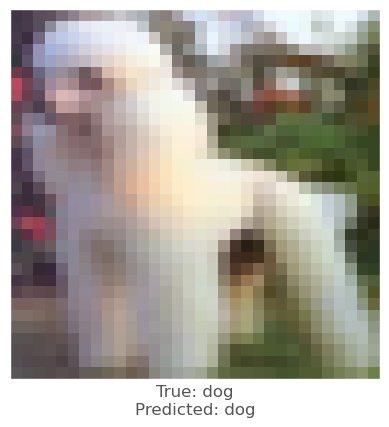



-0.008312345
-0.020717323
-0.016843975
vr, vg, vb :   0.8312344551086426 2.07173228263855 1.6843974590301514
beam_perturbed_confidence temp :  0.7317672
beam_perturbed_confidence temp :  0.7133319
beam_perturbed_confidence temp :  0.72312963
beam_perturbed_confidence temp :  0.7133319
beam_perturbed_confidence temp :  0.72312963
beam_perturbed_confidence temp :  0.70618
beam_perturbed_confidence temp :  0.70618
row index :  5
0th round's confidence : 1th 0.70618
predicted class :  dog
predicted class's confidence :  0.70618
Lopt is :  5


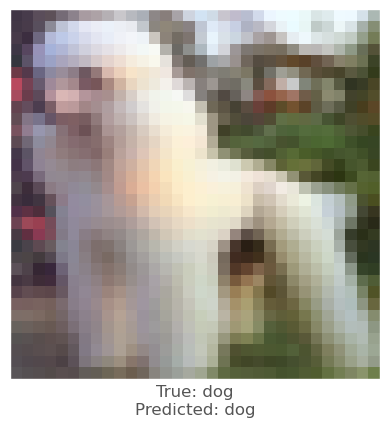



0.01065743
0.004227817
0.004405141
vr, vg, vb :   -1.0657429695129395 -0.42278170585632324 -0.44051408767700195
beam_perturbed_confidence temp :  0.74434394
beam_perturbed_confidence temp :  0.7533346
beam_perturbed_confidence temp :  0.7524744
beam_perturbed_confidence temp :  0.7442416
beam_perturbed_confidence temp :  0.74290633
beam_perturbed_confidence temp :  0.75143063
beam_perturbed_confidence temp :  0.7420517
row index :  6
0th round's confidence : 2th 0.7420517
predicted class :  dog
predicted class's confidence :  0.7420517
Lopt is :  4


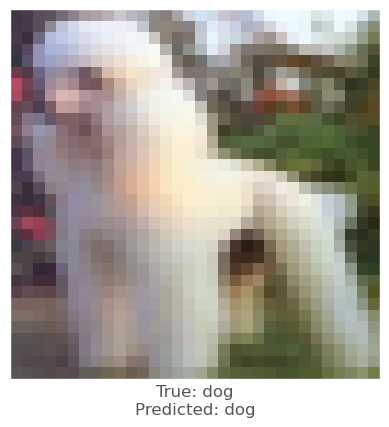



-0.003833115
-0.014141381
-0.007806003
vr, vg, vb :   0.38331151008605957 1.4141380786895752 0.7806003093719482
beam_perturbed_confidence temp :  0.83505213
beam_perturbed_confidence temp :  0.82814413
beam_perturbed_confidence temp :  0.83505213
beam_perturbed_confidence temp :  0.82814413
beam_perturbed_confidence temp :  0.83505213
beam_perturbed_confidence temp :  0.82814413
beam_perturbed_confidence temp :  0.82814413
row index :  1
0th round's confidence : 3th 0.82814413
predicted class :  dog
predicted class's confidence :  0.82814413
Lopt is :  10


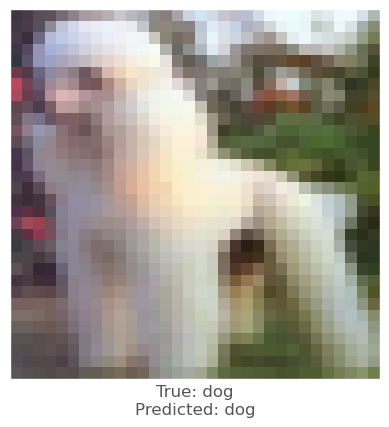



0.0
-0.0016692579
0.0038961768
vr, vg, vb :   0.0 0.16692578792572021 -0.3896176815032959
beam_perturbed_confidence temp :  0.77597165
beam_perturbed_confidence temp :  0.068002306
beam_perturbed_confidence temp :  0.06607359
beam_perturbed_confidence temp :  0.77597165
beam_perturbed_confidence temp :  0.774924
beam_perturbed_confidence temp :  0.06607359
beam_perturbed_confidence temp :  0.774924
row index :  2
0th round's confidence : 4th 0.06607359
predicted class :  cat
predicted class's confidence :  0.93228
Lopt is :  10


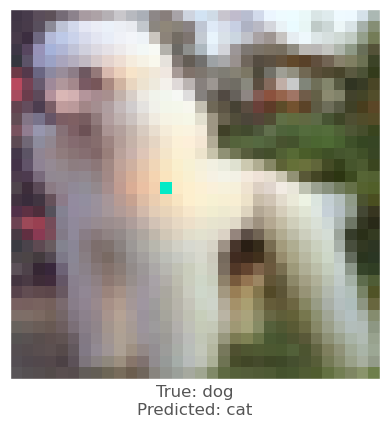




1th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  144 137 151
-0.009775579
-0.0054944754
-0.0021701455
vr, vg, vb :   0.977557897567749 0.5494475364685059 0.21701455116271973
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
row index :  0
0th round's confidence : 0th 0.66862947
predicted class :  dog
predicted class's confidence :  0.66862947
Lopt is :  0


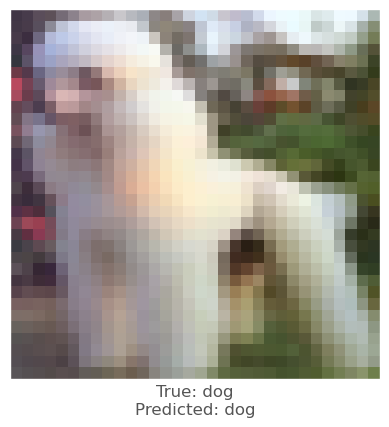






2th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  189 201 231
-0.0055918694
0.0016897321
0.0028993487
vr, vg, vb :   0.5591869354248047 -0.16897320747375488 -0.2899348735809326
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6674797
beam_perturbed_confidence temp :  0.66712636
beam_perturbed_confidence temp :  0.6674797
beam_perturbed_confidence temp :  0.66712636
beam_perturbed_confidence temp :  0.66606057
beam_perturbed_confidence temp :  0.66606057
row index :  5
0th round's confidence : 0th 0.66606057
predicted class :  dog
predicted class's confidence :  0.66606057
Lopt is :  1


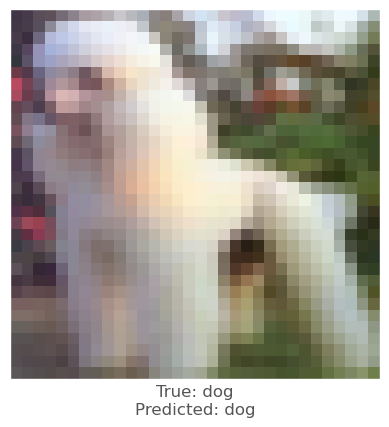



0.0050265193
0.013272703
0.009820342
vr, vg, vb :   -0.5026519298553467 -1.327270269393921 -0.9820342063903809
beam_perturbed_confidence temp :  0.6285313
beam_perturbed_confidence temp :  0.61690986
beam_perturbed_confidence temp :  0.6262821
beam_perturbed_confidence temp :  0.6134706
beam_perturbed_confidence temp :  0.623093
beam_perturbed_confidence temp :  0.61136514
beam_perturbed_confidence temp :  0.6076154
row index :  6
0th round's confidence : 1th 0.6076154
predicted class :  dog
predicted class's confidence :  0.6076154
Lopt is :  7


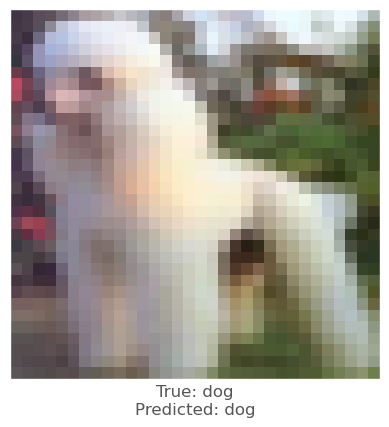



-0.014611542
-0.007912457
-0.0011246204
vr, vg, vb :   1.4611542224884033 0.791245698928833 0.11246204376220703
beam_perturbed_confidence temp :  0.6263625
beam_perturbed_confidence temp :  0.63452303
beam_perturbed_confidence temp :  0.63452303
beam_perturbed_confidence temp :  0.6263625
beam_perturbed_confidence temp :  0.6263625
beam_perturbed_confidence temp :  0.63452303
beam_perturbed_confidence temp :  0.6263625
row index :  0
0th round's confidence : 2th 0.6263625
predicted class :  dog
predicted class's confidence :  0.6263625
Lopt is :  6


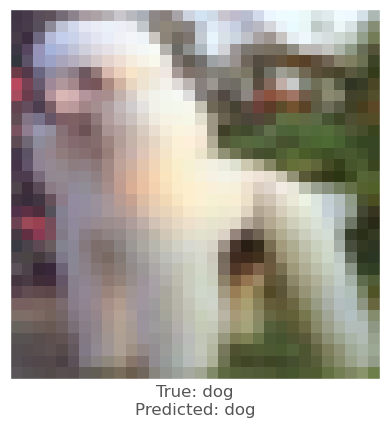



0.006778538
0.015378475
0.01101774
vr, vg, vb :   -0.6778538227081299 -1.5378475189208984 -1.101773977279663
beam_perturbed_confidence temp :  0.5288286
beam_perturbed_confidence temp :  0.51774126
beam_perturbed_confidence temp :  0.52121025
beam_perturbed_confidence temp :  0.5144491
beam_perturbed_confidence temp :  0.5182842
beam_perturbed_confidence temp :  0.5068895
beam_perturbed_confidence temp :  0.50248027
row index :  6
0th round's confidence : 3th 0.50248027
predicted class :  dog
predicted class's confidence :  0.50248027
Lopt is :  12


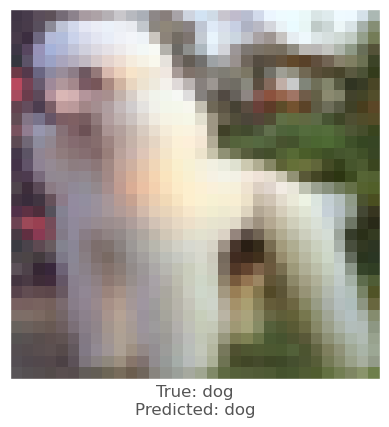



-0.019871414
-0.014344573
-0.004236877
vr, vg, vb :   1.9871413707733154 1.4344573020935059 0.4236876964569092
beam_perturbed_confidence temp :  0.5299504
beam_perturbed_confidence temp :  0.5328601
beam_perturbed_confidence temp :  0.53998905
beam_perturbed_confidence temp :  0.5233438
beam_perturbed_confidence temp :  0.5299504
beam_perturbed_confidence temp :  0.5328601
beam_perturbed_confidence temp :  0.5233438
row index :  3
0th round's confidence : 4th 0.5233438
predicted class :  dog
predicted class's confidence :  0.5233438
Lopt is :  11


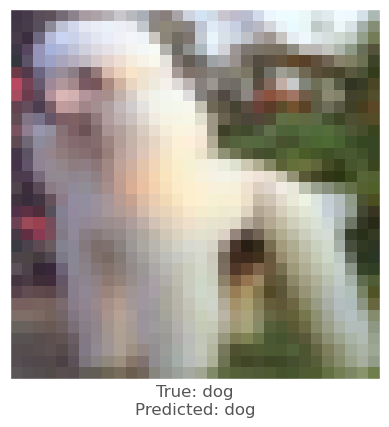



-0.004456401
0.0025197864
0.003030777
vr, vg, vb :   0.9489083290100098 -0.40405452251434326 -0.5640190839767456
beam_perturbed_confidence temp :  0.66606057
beam_perturbed_confidence temp :  0.6646066
beam_perturbed_confidence temp :  0.6644489
beam_perturbed_confidence temp :  0.6646066
beam_perturbed_confidence temp :  0.6644489
beam_perturbed_confidence temp :  0.6628916
beam_perturbed_confidence temp :  0.6628916
row index :  5
1th round's confidence : 0th 0.6628916
predicted class :  dog
predicted class's confidence :  0.6628916
Lopt is :  2


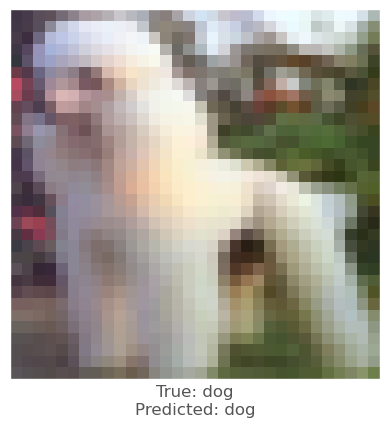



0.008670688
0.01781863
0.012665212
vr, vg, vb :   -1.3194555044174194 -2.976406216621399 -2.1503520011901855
beam_perturbed_confidence temp :  0.5972304
beam_perturbed_confidence temp :  0.576606
beam_perturbed_confidence temp :  0.5857177
beam_perturbed_confidence temp :  0.56587094
beam_perturbed_confidence temp :  0.5741533
beam_perturbed_confidence temp :  0.55507874
beam_perturbed_confidence temp :  0.5465089
row index :  6
1th round's confidence : 1th 0.5465089
predicted class :  dog
predicted class's confidence :  0.5465089
Lopt is :  10


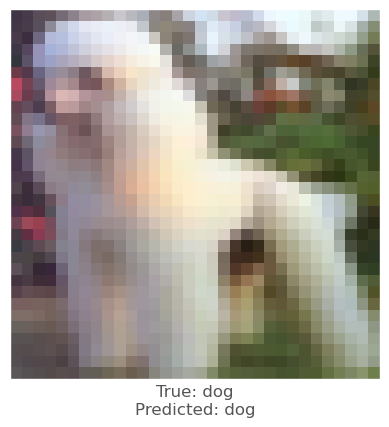



-0.017723978
-0.010821581
-0.0035642982
vr, vg, vb :   3.087436556816101 1.7942792177200317 0.4576456546783447
beam_perturbed_confidence temp :  0.598176
beam_perturbed_confidence temp :  0.6205045
beam_perturbed_confidence temp :  0.6263625
beam_perturbed_confidence temp :  0.5917869
beam_perturbed_confidence temp :  0.598176
beam_perturbed_confidence temp :  0.6205045
beam_perturbed_confidence temp :  0.5917869
row index :  3
1th round's confidence : 2th 0.5917869
predicted class :  dog
predicted class's confidence :  0.5917869
Lopt is :  9


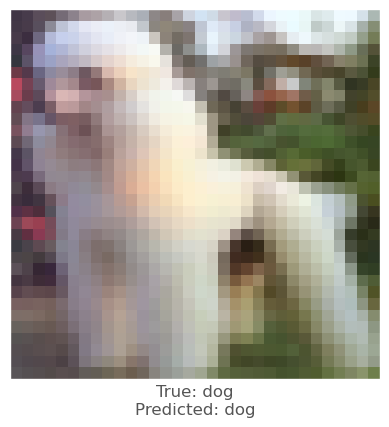



0.009559959
0.01742202
0.011880487
vr, vg, vb :   -1.5660643577575684 -3.126264810562134 -2.179645299911499
beam_perturbed_confidence temp :  0.49207258
beam_perturbed_confidence temp :  0.46583247
beam_perturbed_confidence temp :  0.48446122
beam_perturbed_confidence temp :  0.4557377
beam_perturbed_confidence temp :  0.4747465
beam_perturbed_confidence temp :  0.44776785
beam_perturbed_confidence temp :  0.44049627
row index :  6
1th round's confidence : 3th 0.44049627
predicted class :  horse
predicted class's confidence :  0.5527096
Lopt is :  16


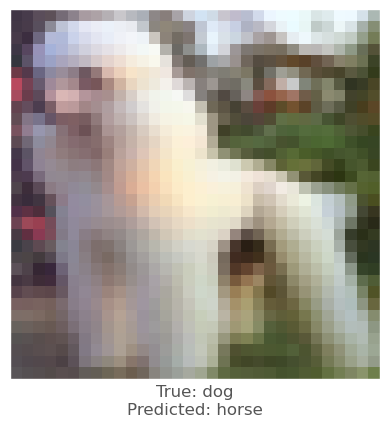




3th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  88 79 93
0.0020377636
-0.0018190145
-0.0020197034
vr, vg, vb :   -0.20377635955810547 0.1819014549255371 0.20197033882141113
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6675997
row index :  0
0th round's confidence : 0th 0.6675997
predicted class :  dog
predicted class's confidence :  0.6675997
Lopt is :  1


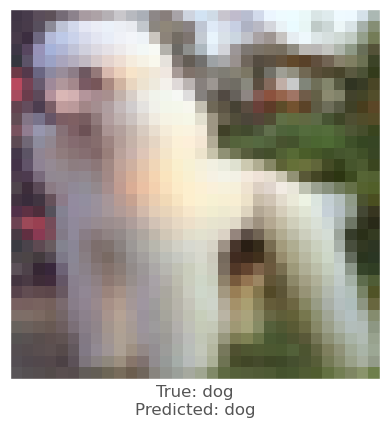



0.0040770173
0.0007876754
-0.0010309815
vr, vg, vb :   -0.4077017307281494 -0.07876753807067871 0.10309815406799316
beam_perturbed_confidence temp :  0.6628991
beam_perturbed_confidence temp :  0.66457635
beam_perturbed_confidence temp :  0.66493726
beam_perturbed_confidence temp :  0.66258144
beam_perturbed_confidence temp :  0.6628991
beam_perturbed_confidence temp :  0.66457635
beam_perturbed_confidence temp :  0.66258144
row index :  3
0th round's confidence : 1th 0.66258144
predicted class :  dog
predicted class's confidence :  0.66258144
Lopt is :  6


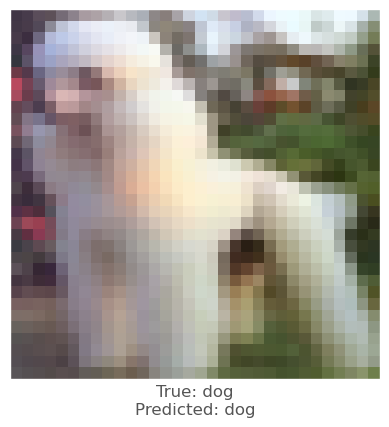



-6.0856342e-05
-0.003701806
-0.003044188
vr, vg, vb :   0.006085634231567383 0.370180606842041 0.30441880226135254
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
row index :  0
0th round's confidence : 2th 0.65774184
predicted class :  dog
predicted class's confidence :  0.65774184
Lopt is :  5


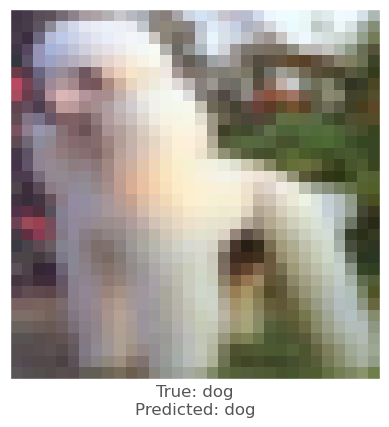



0.006280303
0.0024912357
8.2433224e-05
vr, vg, vb :   -0.6280303001403809 -0.24912357330322266 -0.008243322372436523
beam_perturbed_confidence temp :  0.6477986
beam_perturbed_confidence temp :  0.6496806
beam_perturbed_confidence temp :  0.65086734
beam_perturbed_confidence temp :  0.6463696
beam_perturbed_confidence temp :  0.6477058
beam_perturbed_confidence temp :  0.64962566
beam_perturbed_confidence temp :  0.6459767
row index :  6
0th round's confidence : 3th 0.6459767
predicted class :  dog
predicted class's confidence :  0.6459767
Lopt is :  11


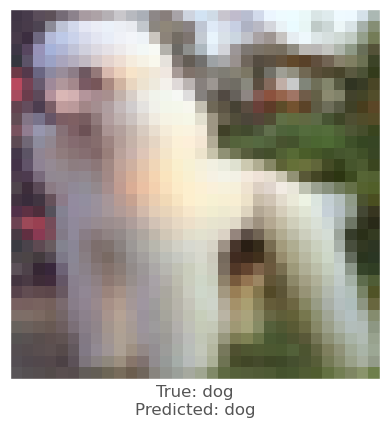



-0.0038989782
-0.009040058
-0.0067353845
vr, vg, vb :   0.38989782333374023 0.904005765914917 0.6735384464263916
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6239766
row index :  0
0th round's confidence : 4th 0.6239766
predicted class :  dog
predicted class's confidence :  0.6239766
Lopt is :  10


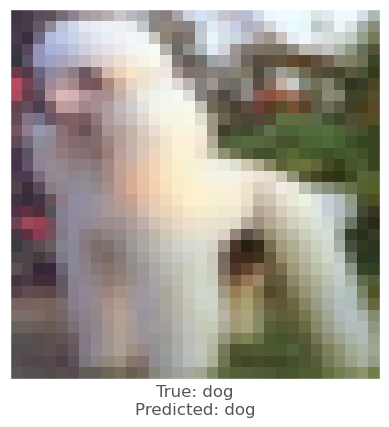



0.0019756556
-0.001960516
-0.0021193027
vr, vg, vb :   -0.3809642791748047 0.35976290702819824 0.3937035799026489
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6675997
beam_perturbed_confidence temp :  0.6666538
row index :  0
1th round's confidence : 0th 0.6666538
predicted class :  dog
predicted class's confidence :  0.6666538
Lopt is :  2


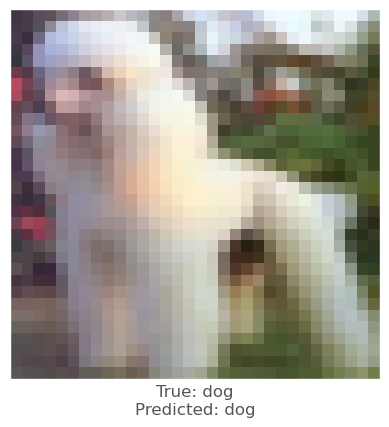



0.004034996
0.0005735159
-0.0011757612
vr, vg, vb :   -0.7704311609268188 -0.1282423734664917 0.2103644609451294
beam_perturbed_confidence temp :  0.66054136
beam_perturbed_confidence temp :  0.66232556
beam_perturbed_confidence temp :  0.66258144
beam_perturbed_confidence temp :  0.66014856
beam_perturbed_confidence temp :  0.66054136
beam_perturbed_confidence temp :  0.66232556
beam_perturbed_confidence temp :  0.66014856
row index :  3
1th round's confidence : 1th 0.66014856
predicted class :  dog
predicted class's confidence :  0.66014856
Lopt is :  7


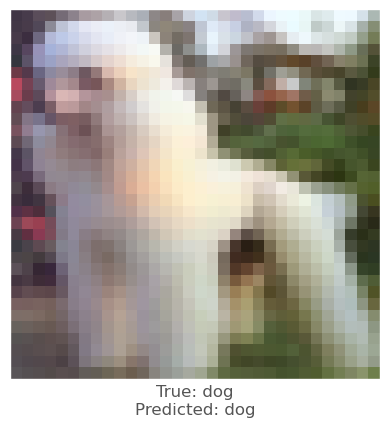



-6.0856342e-05
-0.003701806
-0.003044188
vr, vg, vb :   0.011562705039978027 0.7033431529998779 0.5783957242965698
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65774184
row index :  0
1th round's confidence : 2th 0.65774184
predicted class :  dog
predicted class's confidence :  0.65774184
Lopt is :  5


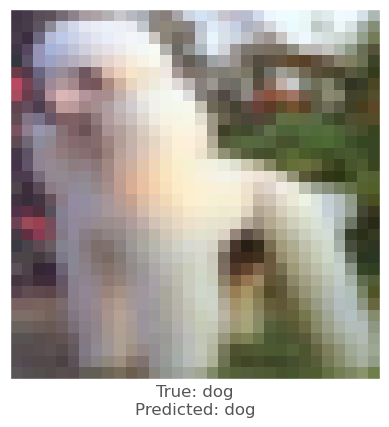



0.0075212717
0.0038087964
0.00071012974
vr, vg, vb :   -1.317354440689087 -0.605090856552124 -0.07843196392059326
beam_perturbed_confidence temp :  0.63829887
beam_perturbed_confidence temp :  0.643897
beam_perturbed_confidence temp :  0.64565945
beam_perturbed_confidence temp :  0.636301
beam_perturbed_confidence temp :  0.63788587
beam_perturbed_confidence temp :  0.6435897
beam_perturbed_confidence temp :  0.6359183
row index :  6
1th round's confidence : 3th 0.6359183
predicted class :  dog
predicted class's confidence :  0.6359183
Lopt is :  13


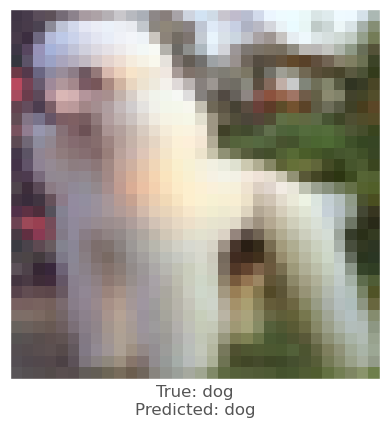



-0.0038989782
-0.009040058
-0.0067353845
vr, vg, vb :   0.7408058643341064 1.7176109552383423 1.279723048210144
beam_perturbed_confidence temp :  0.6239766
beam_perturbed_confidence temp :  0.6194134
beam_perturbed_confidence temp :  0.6205983
beam_perturbed_confidence temp :  0.6194134
beam_perturbed_confidence temp :  0.6205983
beam_perturbed_confidence temp :  0.61617213
beam_perturbed_confidence temp :  0.61617213
row index :  5
1th round's confidence : 4th 0.61617213
predicted class :  dog
predicted class's confidence :  0.61617213
Lopt is :  11


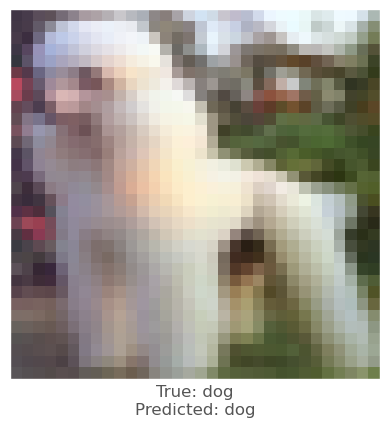



0.0018596053
-0.0017319918
-0.0022065043
vr, vg, vb :   -0.5288283824920654 0.4969857931137085 0.5749836564064026
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.6666538
beam_perturbed_confidence temp :  0.6657401
row index :  0
2th round's confidence : 0th 0.6657401
predicted class :  dog
predicted class's confidence :  0.6657401
Lopt is :  3


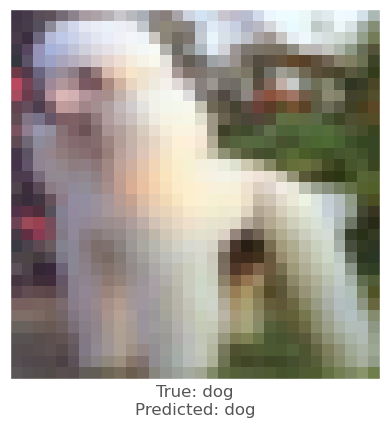



0.004393637
0.0007864833
-0.0011492968
vr, vg, vb :   -1.1327517628669739 -0.19406646490097046 0.30425769090652466
beam_perturbed_confidence temp :  0.6556221
beam_perturbed_confidence temp :  0.6597549
beam_perturbed_confidence temp :  0.66014856
beam_perturbed_confidence temp :  0.65490586
beam_perturbed_confidence temp :  0.6556221
beam_perturbed_confidence temp :  0.6597549
beam_perturbed_confidence temp :  0.65490586
row index :  3
2th round's confidence : 1th 0.65490586
predicted class :  dog
predicted class's confidence :  0.65490586
Lopt is :  9


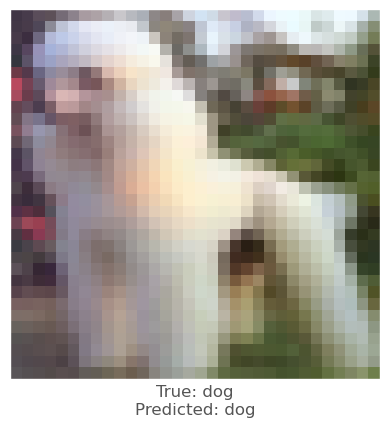



-6.0856342e-05
-0.003701806
-0.003044188
vr, vg, vb :   0.016492068767547607 1.0031894445419312 0.8249749541282654
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65591633
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65591633
beam_perturbed_confidence temp :  0.65774184
beam_perturbed_confidence temp :  0.65591633
beam_perturbed_confidence temp :  0.65591633
row index :  1
2th round's confidence : 2th 0.65591633
predicted class :  dog
predicted class's confidence :  0.65591633
Lopt is :  6


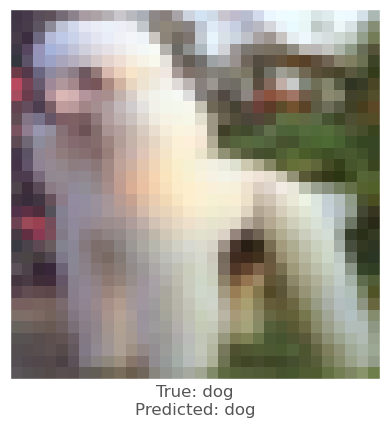



0.007691622
0.003979802
0.00074106455
vr, vg, vb :   -1.954781174659729 -0.9425619840621948 -0.1446952223777771
beam_perturbed_confidence temp :  0.6278517
beam_perturbed_confidence temp :  0.63390607
beam_perturbed_confidence temp :  0.6355599
beam_perturbed_confidence temp :  0.62591535
beam_perturbed_confidence temp :  0.6274751
beam_perturbed_confidence temp :  0.6335244
beam_perturbed_confidence temp :  0.6255455
row index :  6
2th round's confidence : 3th 0.6255455
predicted class :  dog
predicted class's confidence :  0.6255455
Lopt is :  15


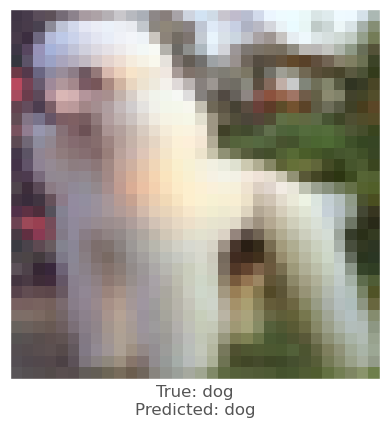



-0.004106462
-0.009476125
-0.0066021085
vr, vg, vb :   1.0773714780807495 2.493462383747101 1.811961591243744
beam_perturbed_confidence temp :  0.61377496
beam_perturbed_confidence temp :  0.6042543
beam_perturbed_confidence temp :  0.61281127
beam_perturbed_confidence temp :  0.600897
beam_perturbed_confidence temp :  0.6095749
beam_perturbed_confidence temp :  0.6001451
beam_perturbed_confidence temp :  0.59595525
row index :  6
2th round's confidence : 4th 0.59595525
predicted class :  dog
predicted class's confidence :  0.59595525
Lopt is :  13


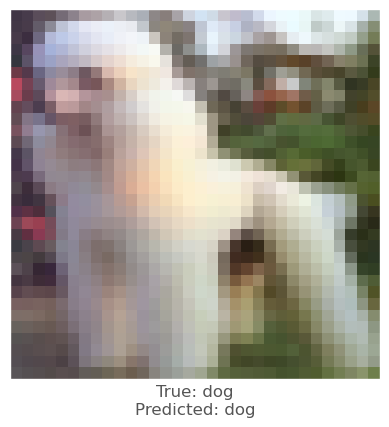



0.002462566
-0.0010815859
-0.0017416477
vr, vg, vb :   -0.7222021341323852 0.5554458022117614 0.6916500627994537
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.6657401
beam_perturbed_confidence temp :  0.66419125
row index :  0
3th round's confidence : 0th 0.66419125
predicted class :  dog
predicted class's confidence :  0.66419125
Lopt is :  4


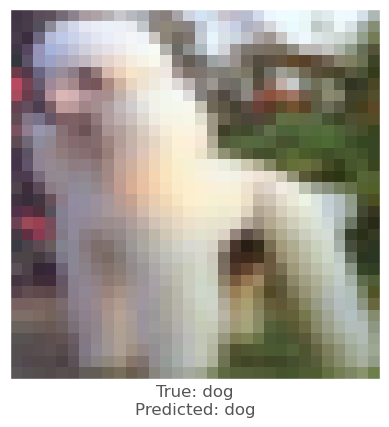



0.0048243403
0.00149858
-0.00077581406
vr, vg, vb :   -1.5019106209278108 -0.3245178163051605 0.3514133274555206
beam_perturbed_confidence temp :  0.64964855
beam_perturbed_confidence temp :  0.65412354
beam_perturbed_confidence temp :  0.65490586
beam_perturbed_confidence temp :  0.6486749
beam_perturbed_confidence temp :  0.64964855
beam_perturbed_confidence temp :  0.65412354
beam_perturbed_confidence temp :  0.6486749
row index :  3
3th round's confidence : 1th 0.6486749
predicted class :  dog
predicted class's confidence :  0.6486749
Lopt is :  11


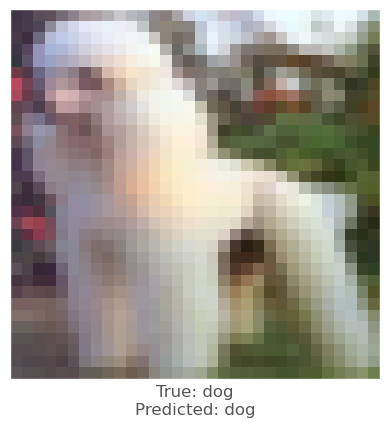



0.00019007921
-0.0034236908
-0.0028808117
vr, vg, vb :   -0.004165059328079224 1.2452395796775817 1.030558627843857
beam_perturbed_confidence temp :  0.6559538
beam_perturbed_confidence temp :  0.65431815
beam_perturbed_confidence temp :  0.65450376
beam_perturbed_confidence temp :  0.654188
beam_perturbed_confidence temp :  0.65451866
beam_perturbed_confidence temp :  0.65302634
beam_perturbed_confidence temp :  0.65286475
row index :  6
3th round's confidence : 2th 0.65286475
predicted class :  dog
predicted class's confidence :  0.65286475
Lopt is :  7


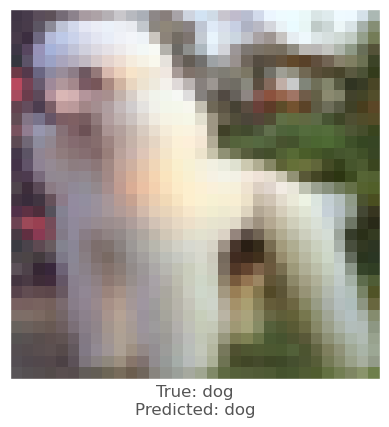



0.008127153
0.0036618114
0.0005838871
vr, vg, vb :   -2.572018349170685 -1.2144869208335876 -0.18861441016197206
beam_perturbed_confidence temp :  0.6133913
beam_perturbed_confidence temp :  0.6221351
beam_perturbed_confidence temp :  0.62533146
beam_perturbed_confidence temp :  0.61002296
beam_perturbed_confidence temp :  0.61307025
beam_perturbed_confidence temp :  0.6220087
beam_perturbed_confidence temp :  0.6097793
row index :  6
3th round's confidence : 3th 0.6097793
predicted class :  dog
predicted class's confidence :  0.6097793
Lopt is :  18


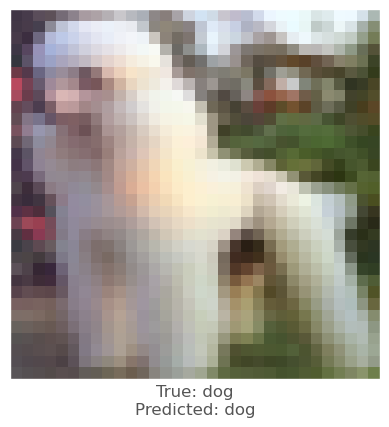



-0.008861005
-0.01566869
-0.010128856
vr, vg, vb :   1.8557348608970643 3.810985165834427 2.643651002645493
beam_perturbed_confidence temp :  0.5912841
beam_perturbed_confidence temp :  0.5698104
beam_perturbed_confidence temp :  0.58548266
beam_perturbed_confidence temp :  0.5650903
beam_perturbed_confidence temp :  0.5806185
beam_perturbed_confidence temp :  0.5599174
beam_perturbed_confidence temp :  0.5560473
row index :  6
3th round's confidence : 4th 0.5560473
predicted class :  dog
predicted class's confidence :  0.5560473
Lopt is :  16


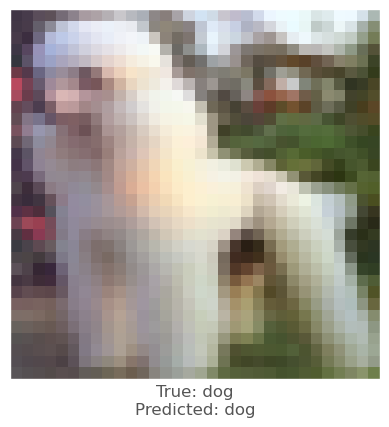



0.0035283566
-0.00016701221
-0.0012970567
vr, vg, vb :   -1.002817575931549 0.5166024434566497 0.7521907240152359
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.66419125
beam_perturbed_confidence temp :  0.660238
row index :  0
4th round's confidence : 0th 0.660238
predicted class :  dog
predicted class's confidence :  0.660238
Lopt is :  6


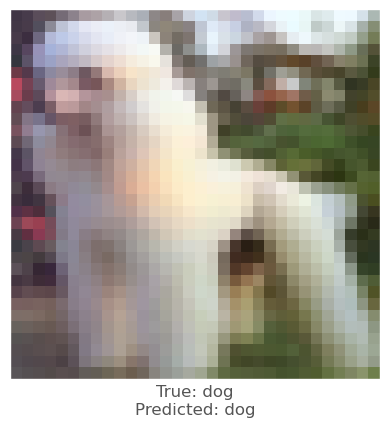



0.005646348
0.0019875169
-0.0004979372
vr, vg, vb :   -1.916354358792305 -0.4908177226781845 0.3660657149553299
beam_perturbed_confidence temp :  0.6429488
beam_perturbed_confidence temp :  0.64766103
beam_perturbed_confidence temp :  0.6486749
beam_perturbed_confidence temp :  0.6419361
beam_perturbed_confidence temp :  0.6429488
beam_perturbed_confidence temp :  0.64766103
beam_perturbed_confidence temp :  0.6419361
row index :  3
4th round's confidence : 1th 0.6419361
predicted class :  dog
predicted class's confidence :  0.6419361
Lopt is :  13


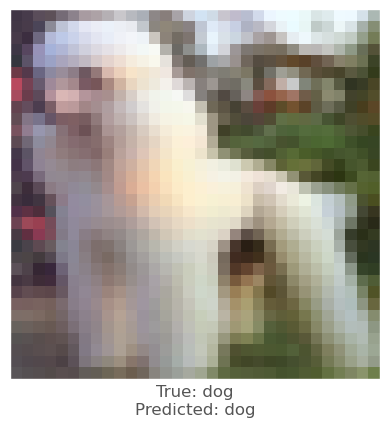



0.00025862455
-0.0033298135
-0.0026062727
vr, vg, vb :   -0.029611008763313296 1.4536969697475433 1.1881300348043444
beam_perturbed_confidence temp :  0.6527677
beam_perturbed_confidence temp :  0.65118885
beam_perturbed_confidence temp :  0.6515817
beam_perturbed_confidence temp :  0.6512066
beam_perturbed_confidence temp :  0.6514712
beam_perturbed_confidence temp :  0.64885926
beam_perturbed_confidence temp :  0.6498712
row index :  5
4th round's confidence : 2th 0.64885926
predicted class :  dog
predicted class's confidence :  0.64885926
Lopt is :  8


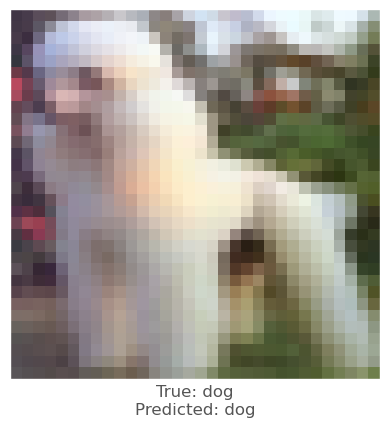



0.008307159
0.0035224557
0.00047409534
vr, vg, vb :   -3.1455324089527132 -1.445283797979355 -0.21716250360012057
beam_perturbed_confidence temp :  0.5931318
beam_perturbed_confidence temp :  0.60582936
beam_perturbed_confidence temp :  0.60954887
beam_perturbed_confidence temp :  0.58957106
beam_perturbed_confidence temp :  0.59296316
beam_perturbed_confidence temp :  0.605462
beam_perturbed_confidence temp :  0.5893491
row index :  6
4th round's confidence : 3th 0.5893491
predicted class :  dog
predicted class's confidence :  0.5893491
Lopt is :  22


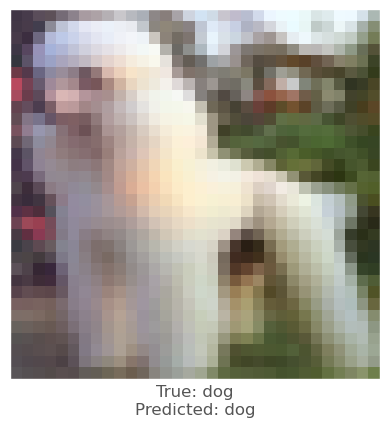



-0.0069468617
-0.0134657025
-0.008099437
vr, vg, vb :   2.364847549200058 4.776456902623177 3.1892295783758167
beam_perturbed_confidence temp :  0.55028296
beam_perturbed_confidence temp :  0.5354743
beam_perturbed_confidence temp :  0.5451766
beam_perturbed_confidence temp :  0.5332115
beam_perturbed_confidence temp :  0.5413059
beam_perturbed_confidence temp :  0.5250278
beam_perturbed_confidence temp :  0.5241439
row index :  6
4th round's confidence : 4th 0.5241439
predicted class :  dog
predicted class's confidence :  0.5241439
Lopt is :  20


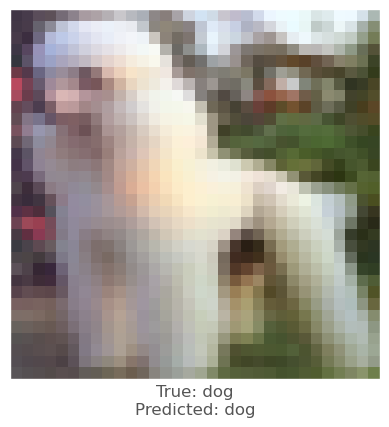



0.0040427446
0.00030452013
-0.0014511943
vr, vg, vb :   -1.3068102819919587 0.4344901860952377 0.8220910802483559
beam_perturbed_confidence temp :  0.65585554
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.65585554
beam_perturbed_confidence temp :  0.65585554
beam_perturbed_confidence temp :  0.660238
beam_perturbed_confidence temp :  0.65585554
row index :  0
5th round's confidence : 0th 0.65585554
predicted class :  dog
predicted class's confidence :  0.65585554
Lopt is :  8


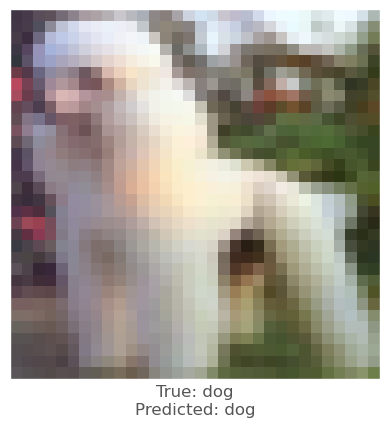



0.005764723
0.0021530986
-0.00043344498
vr, vg, vb :   -2.3011912053227426 -0.6570458087325096 0.372803641140461
beam_perturbed_confidence temp :  0.6312016
beam_perturbed_confidence temp :  0.6407957
beam_perturbed_confidence temp :  0.6419361
beam_perturbed_confidence temp :  0.6290726
beam_perturbed_confidence temp :  0.6312016
beam_perturbed_confidence temp :  0.6407957
beam_perturbed_confidence temp :  0.6290726
row index :  3
5th round's confidence : 1th 0.6290726
predicted class :  dog
predicted class's confidence :  0.6290726
Lopt is :  16


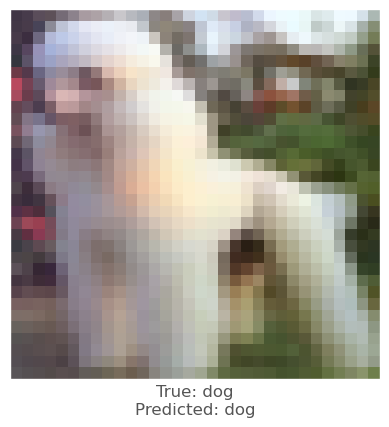



-0.0026224852
-0.0062114596
-0.0047814846
vr, vg, vb :   0.2355986081957817 1.9294732364416123 1.5474654917120936
beam_perturbed_confidence temp :  0.64885926
beam_perturbed_confidence temp :  0.64537024
beam_perturbed_confidence temp :  0.64640737
beam_perturbed_confidence temp :  0.64537024
beam_perturbed_confidence temp :  0.64640737
beam_perturbed_confidence temp :  0.6427593
beam_perturbed_confidence temp :  0.6427593
row index :  5
5th round's confidence : 2th 0.6427593
predicted class :  dog
predicted class's confidence :  0.6427593
Lopt is :  9


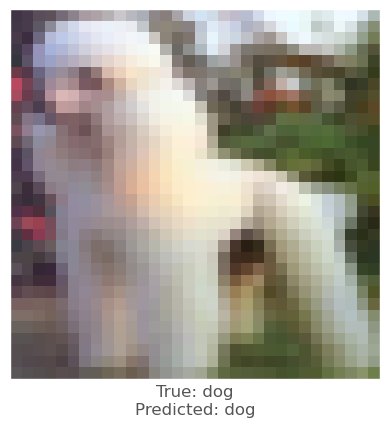



0.007933438
0.00360322
0.00045883656
vr, vg, vb :   -3.6243229504823686 -1.6610774167776108 -0.24132990878820423
beam_perturbed_confidence temp :  0.57302296
beam_perturbed_confidence temp :  0.5856645
beam_perturbed_confidence temp :  0.5891122
beam_perturbed_confidence temp :  0.56922823
beam_perturbed_confidence temp :  0.5727667
beam_perturbed_confidence temp :  0.58542466
beam_perturbed_confidence temp :  0.5688593
row index :  6
5th round's confidence : 3th 0.5688593
predicted class :  dog
predicted class's confidence :  0.5688593
Lopt is :  26


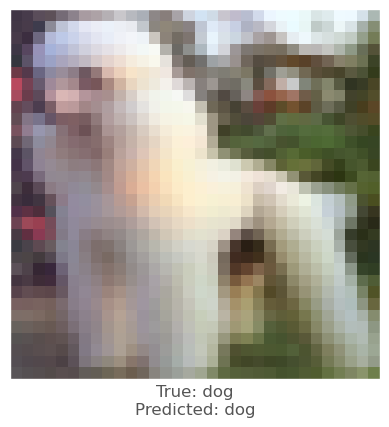



-0.0014032722
-0.00936538
-0.006891787
vr, vg, vb :   2.2686900094747546 5.2353491933941845 3.5594853257536894
beam_perturbed_confidence temp :  0.5217837
beam_perturbed_confidence temp :  0.49830174
beam_perturbed_confidence temp :  0.51268077
beam_perturbed_confidence temp :  0.49668714
beam_perturbed_confidence temp :  0.5108915
beam_perturbed_confidence temp :  0.48589593
beam_perturbed_confidence temp :  0.4838667
row index :  6
5th round's confidence : 4th 0.4838667
predicted class :  horse
predicted class's confidence :  0.5062443
Lopt is :  25


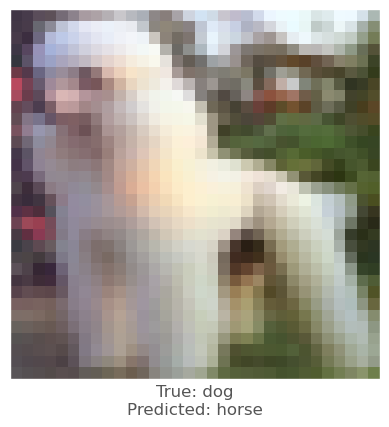




4th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  146 142 159
0.0070959926
0.0030212402
-0.0075972676
vr, vg, vb :   -0.7095992565155029 -0.3021240234375 0.7597267627716064
beam_perturbed_confidence temp :  0.6646125
beam_perturbed_confidence temp :  0.6658398
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6645889
beam_perturbed_confidence temp :  0.6646125
beam_perturbed_confidence temp :  0.6658398
beam_perturbed_confidence temp :  0.6645889
row index :  3
0th round's confidence : 0th 0.6645889
predicted class :  dog
predicted class's confidence :  0.6645889
Lopt is :  1


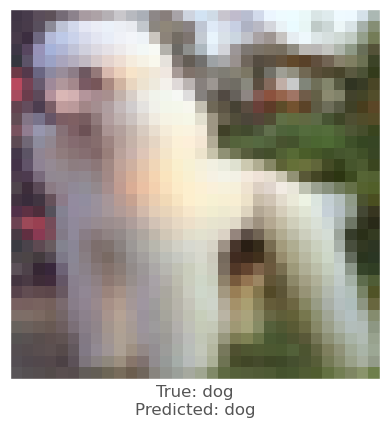



-0.011625171
-0.0067221522
-0.0060402155
vr, vg, vb :   1.1625170707702637 0.6722152233123779 0.6040215492248535
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.71229976
beam_perturbed_confidence temp :  0.71229976
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.71229976
beam_perturbed_confidence temp :  0.7070342
row index :  0
0th round's confidence : 1th 0.7070342
predicted class :  dog
predicted class's confidence :  0.7070342
Lopt is :  5


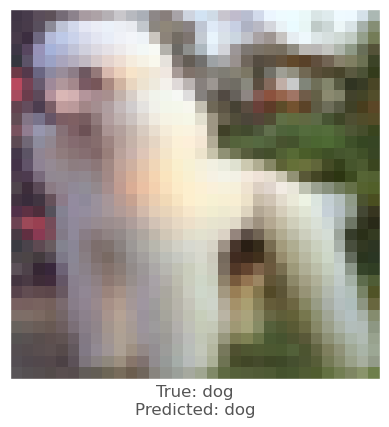



0.012398541
0.009993315
-0.0021412969
vr, vg, vb :   -1.239854097366333 -0.9993314743041992 0.21412968635559082
beam_perturbed_confidence temp :  0.6762492
beam_perturbed_confidence temp :  0.68050534
beam_perturbed_confidence temp :  0.6832553
beam_perturbed_confidence temp :  0.67620134
beam_perturbed_confidence temp :  0.6762492
beam_perturbed_confidence temp :  0.68050534
beam_perturbed_confidence temp :  0.67620134
row index :  3
0th round's confidence : 2th 0.67620134
predicted class :  dog
predicted class's confidence :  0.67620134
Lopt is :  5


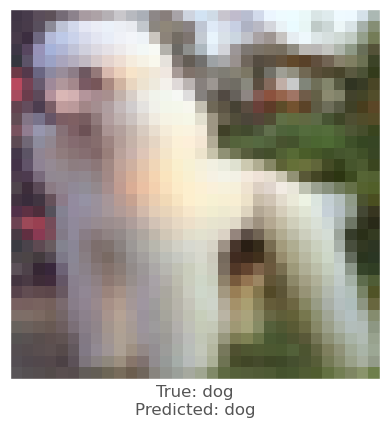



-0.00624007
-0.001337409
-0.0037469268
vr, vg, vb :   0.624006986618042 0.13374090194702148 0.3746926784515381
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
row index :  0
0th round's confidence : 3th 0.7504539
predicted class :  dog
predicted class's confidence :  0.7504539
Lopt is :  10


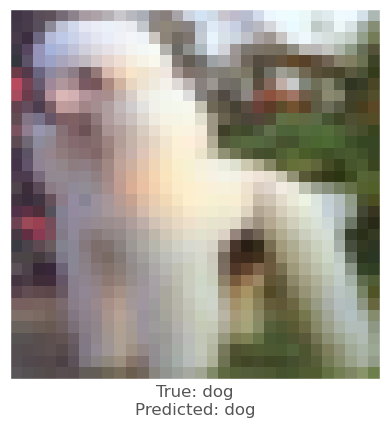



0.0030439496
0.006401062
0.00049322844
vr, vg, vb :   -0.3043949604034424 -0.640106201171875 -0.04932284355163574
beam_perturbed_confidence temp :  0.6832374
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6849832
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.68441665
beam_perturbed_confidence temp :  0.68437743
beam_perturbed_confidence temp :  0.6856257
row index :  1
0th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


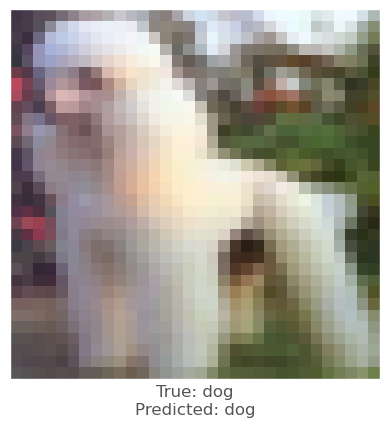



-0.0018523335
-0.005841136
-0.012325466
vr, vg, vb :   -0.4534059762954712 0.31220197677612305 1.916300654411316
beam_perturbed_confidence temp :  0.6676921
beam_perturbed_confidence temp :  0.6645889
beam_perturbed_confidence temp :  0.6588988
beam_perturbed_confidence temp :  0.6676921
beam_perturbed_confidence temp :  0.6615703
beam_perturbed_confidence temp :  0.6588988
beam_perturbed_confidence temp :  0.6615703
row index :  2
1th round's confidence : 0th 0.6588988
predicted class :  dog
predicted class's confidence :  0.6588988
Lopt is :  1


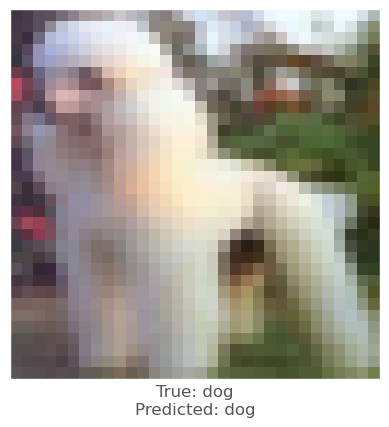



-0.008518159
-0.00386405
-0.004316747
vr, vg, vb :   1.8980813026428223 0.9913986921310425 0.9752941131591797
beam_perturbed_confidence temp :  0.7037816
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.7037816
beam_perturbed_confidence temp :  0.7037816
beam_perturbed_confidence temp :  0.7070342
beam_perturbed_confidence temp :  0.7037816
row index :  0
1th round's confidence : 1th 0.7037816
predicted class :  dog
predicted class's confidence :  0.7037816
Lopt is :  5


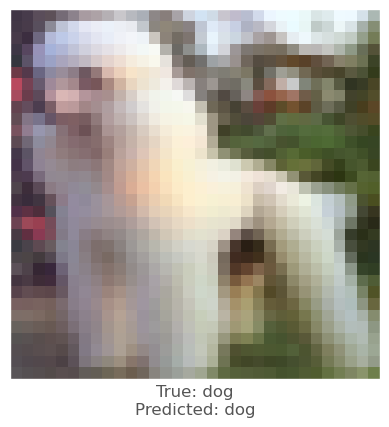



0.0023818612
0.0010591745
-0.0074718
vr, vg, vb :   -1.3540548086166382 -1.0053157806396484 0.9398967027664185
beam_perturbed_confidence temp :  0.67156214
beam_perturbed_confidence temp :  0.67205036
beam_perturbed_confidence temp :  0.67620134
beam_perturbed_confidence temp :  0.6584275
beam_perturbed_confidence temp :  0.67156214
beam_perturbed_confidence temp :  0.67205036
beam_perturbed_confidence temp :  0.6584275
row index :  3
1th round's confidence : 2th 0.6584275
predicted class :  dog
predicted class's confidence :  0.6584275
Lopt is :  5


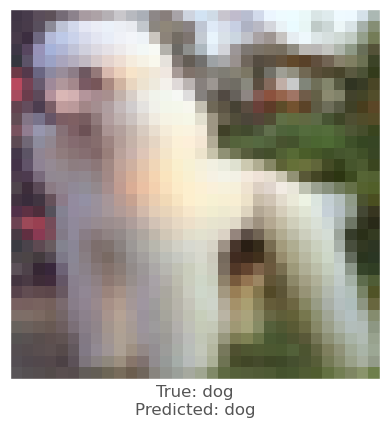



-0.00624007
-0.001337409
-0.0037469268
vr, vg, vb :   1.1856132745742798 0.2541077136993408 0.7119160890579224
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.7504539
beam_perturbed_confidence temp :  0.7470177
row index :  0
1th round's confidence : 3th 0.7470177
predicted class :  dog
predicted class's confidence :  0.7470177
Lopt is :  10


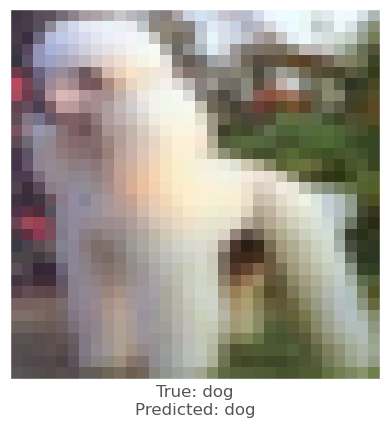



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.4163569211959839 -0.7749009132385254 0.19951164722442627
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.68285036
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6848942
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.68285036
beam_perturbed_confidence temp :  0.6848942
row index :  2
1th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


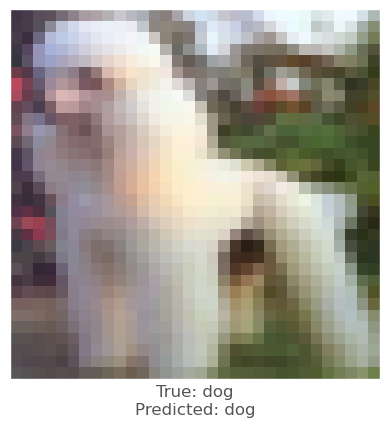



0.0012256503
-0.0032665133
-0.00938791
vr, vg, vb :   -0.5306304097175598 0.607633113861084 2.6634616255760193
beam_perturbed_confidence temp :  0.6615703
beam_perturbed_confidence temp :  0.6588988
beam_perturbed_confidence temp :  0.6515147
beam_perturbed_confidence temp :  0.6615703
beam_perturbed_confidence temp :  0.6486809
beam_perturbed_confidence temp :  0.6515147
beam_perturbed_confidence temp :  0.6486809
row index :  4
2th round's confidence : 0th 0.6486809
predicted class :  dog
predicted class's confidence :  0.6486809
Lopt is :  3


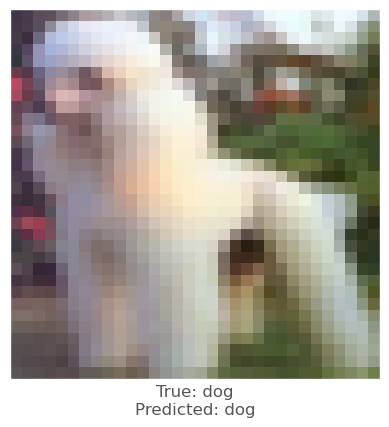



-0.0057517886
-0.0024333596
-0.0030810833
vr, vg, vb :   2.283452033996582 1.1355947852134705 1.185873031616211
beam_perturbed_confidence temp :  0.6994451
beam_perturbed_confidence temp :  0.70223564
beam_perturbed_confidence temp :  0.7020465
beam_perturbed_confidence temp :  0.6973144
beam_perturbed_confidence temp :  0.69666475
beam_perturbed_confidence temp :  0.6991673
beam_perturbed_confidence temp :  0.6947593
row index :  6
2th round's confidence : 1th 0.6947593
predicted class :  dog
predicted class's confidence :  0.6947593
Lopt is :  4


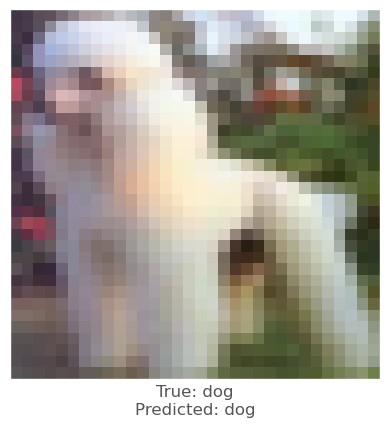



0.012035966
0.007108569
-0.0040837526
vr, vg, vb :   -2.4222459197044373 -1.6156411170959473 1.254282295703888
beam_perturbed_confidence temp :  0.6393469
beam_perturbed_confidence temp :  0.6546116
beam_perturbed_confidence temp :  0.65738684
beam_perturbed_confidence temp :  0.63910615
beam_perturbed_confidence temp :  0.63794297
beam_perturbed_confidence temp :  0.6523036
beam_perturbed_confidence temp :  0.6332447
row index :  6
2th round's confidence : 2th 0.6332447
predicted class :  dog
predicted class's confidence :  0.6332447
Lopt is :  6


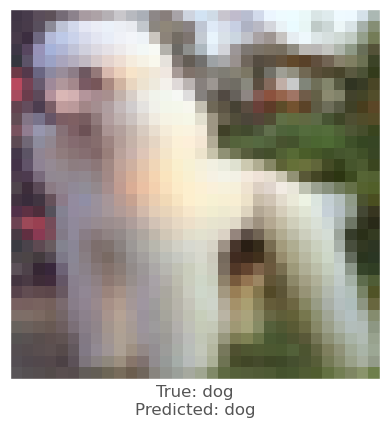



-0.007358551
-0.0013375282
-0.0033830404
vr, vg, vb :   1.8029070496559143 0.3624497652053833 0.9790285229682922
beam_perturbed_confidence temp :  0.74309534
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.74309534
beam_perturbed_confidence temp :  0.74309534
beam_perturbed_confidence temp :  0.7470177
beam_perturbed_confidence temp :  0.74309534
row index :  0
2th round's confidence : 3th 0.74309534
predicted class :  dog
predicted class's confidence :  0.74309534
Lopt is :  10


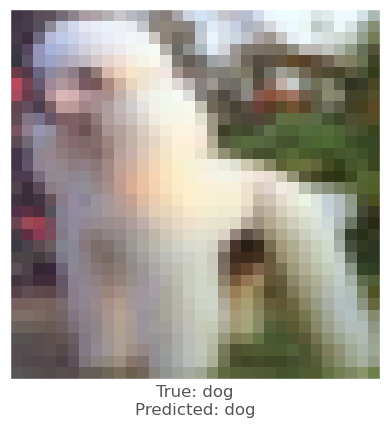



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.5171226859092712 -0.8962161540985107 0.4234626889228821
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.68285036
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6848942
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.68285036
beam_perturbed_confidence temp :  0.6848942
row index :  2
2th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


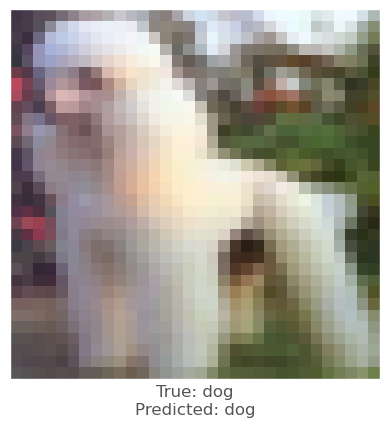



-0.00050371885
-0.0051709414
-0.011532903
vr, vg, vb :   -0.42719548344612124 1.0639639377593995 3.5504057347774505
beam_perturbed_confidence temp :  0.6520184
beam_perturbed_confidence temp :  0.6491751
beam_perturbed_confidence temp :  0.63374966
beam_perturbed_confidence temp :  0.64764255
beam_perturbed_confidence temp :  0.6298217
beam_perturbed_confidence temp :  0.6332447
beam_perturbed_confidence temp :  0.63051194
row index :  4
3th round's confidence : 0th 0.6298217
predicted class :  dog
predicted class's confidence :  0.6298217
Lopt is :  6


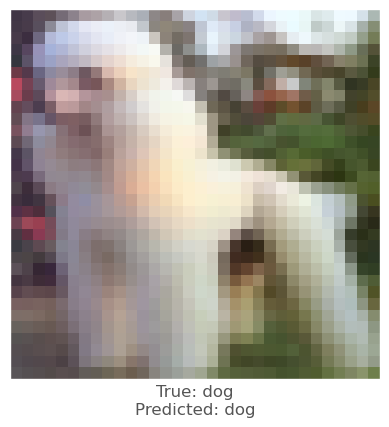



-0.0034294128
-0.0052327514
-0.0060314536
vr, vg, vb :   2.3980481147766115 1.5453104436397553 1.670431089401245
beam_perturbed_confidence temp :  0.6910033
beam_perturbed_confidence temp :  0.691432
beam_perturbed_confidence temp :  0.6912829
beam_perturbed_confidence temp :  0.6886351
beam_perturbed_confidence temp :  0.68790007
beam_perturbed_confidence temp :  0.6877329
beam_perturbed_confidence temp :  0.6850802
row index :  6
3th round's confidence : 1th 0.6850802
predicted class :  dog
predicted class's confidence :  0.6850802
Lopt is :  3


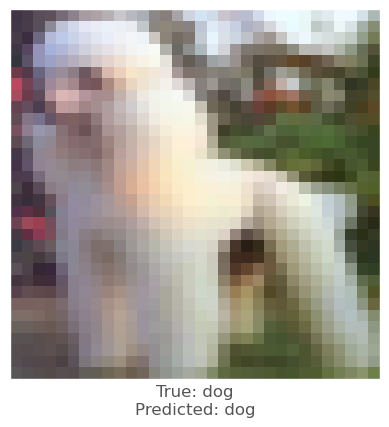



0.0059350133
-0.0013154745
-0.011566222
vr, vg, vb :   -2.773522657155991 -1.3225295543670654 2.2854762375354767
beam_perturbed_confidence temp :  0.62764084
beam_perturbed_confidence temp :  0.6336336
beam_perturbed_confidence temp :  0.6239009
beam_perturbed_confidence temp :  0.6384945
beam_perturbed_confidence temp :  0.61189115
beam_perturbed_confidence temp :  0.6221181
beam_perturbed_confidence temp :  0.6208438
row index :  4
3th round's confidence : 2th 0.61189115
predicted class :  dog
predicted class's confidence :  0.61189115
Lopt is :  8


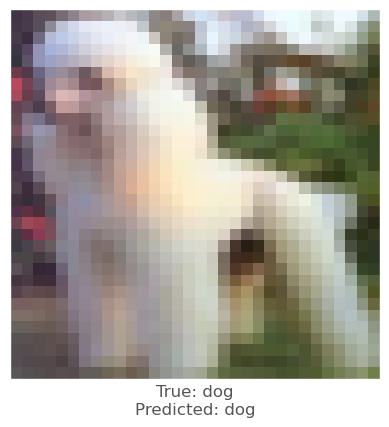



-0.008676052
-0.0021743178
-0.0035883188
vr, vg, vb :   2.490221554040909 0.5436365723609924 1.2399575531482698
beam_perturbed_confidence temp :  0.7333957
beam_perturbed_confidence temp :  0.74309534
beam_perturbed_confidence temp :  0.7412091
beam_perturbed_confidence temp :  0.7333957
beam_perturbed_confidence temp :  0.7317924
beam_perturbed_confidence temp :  0.7412091
beam_perturbed_confidence temp :  0.7317924
row index :  4
3th round's confidence : 3th 0.7317924
predicted class :  dog
predicted class's confidence :  0.7317924
Lopt is :  10


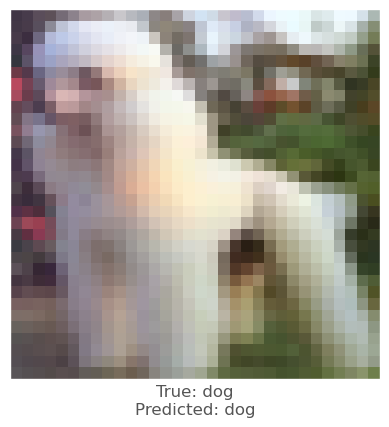



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.60781187415123 -1.0053998708724976 0.6250186264514923
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6880391
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6880391
row index :  2
3th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


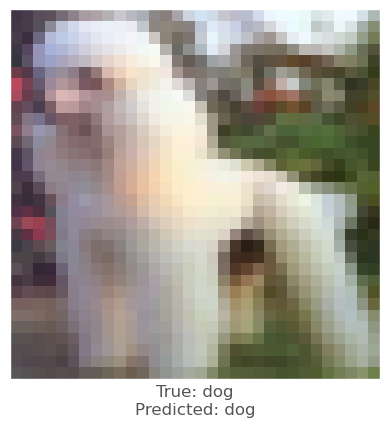



0.0023661256
-0.0040106177
-0.013448715
vr, vg, vb :   -0.6210884934663773 1.3586293172836306 4.540236682295799
beam_perturbed_confidence temp :  0.63138354
beam_perturbed_confidence temp :  0.63051194
beam_perturbed_confidence temp :  0.60977226
beam_perturbed_confidence temp :  0.62689227
beam_perturbed_confidence temp :  0.6048112
beam_perturbed_confidence temp :  0.61403966
beam_perturbed_confidence temp :  0.6067801
row index :  4
4th round's confidence : 0th 0.6048112
predicted class :  dog
predicted class's confidence :  0.6048112
Lopt is :  10


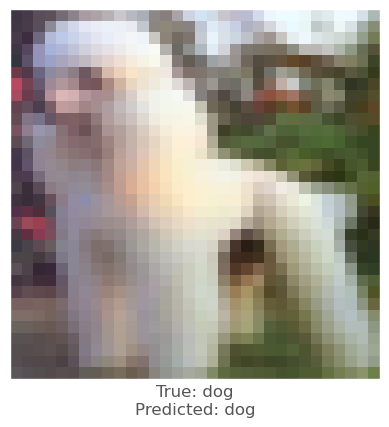



-0.0031081438
-0.0066745877
-0.007317841
vr, vg, vb :   2.4690576839447025 2.0582381719350815 2.2351720857620236
beam_perturbed_confidence temp :  0.6848548
beam_perturbed_confidence temp :  0.6805794
beam_perturbed_confidence temp :  0.6765195
beam_perturbed_confidence temp :  0.68894976
beam_perturbed_confidence temp :  0.6785634
beam_perturbed_confidence temp :  0.6733893
beam_perturbed_confidence temp :  0.68291533
row index :  5
4th round's confidence : 1th 0.6733893
predicted class :  dog
predicted class's confidence :  0.6733893
Lopt is :  1


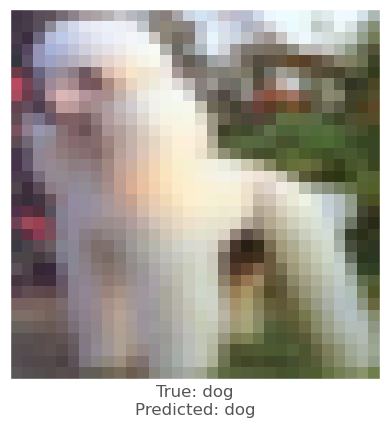



0.0038005114
-0.0029886365
-0.013492048
vr, vg, vb :   -2.8762215274572376 -0.8914129495620728 3.4061333924531936
beam_perturbed_confidence temp :  0.62149286
beam_perturbed_confidence temp :  0.6151524
beam_perturbed_confidence temp :  0.59740984
beam_perturbed_confidence temp :  0.6275241
beam_perturbed_confidence temp :  0.5960552
beam_perturbed_confidence temp :  0.59622544
beam_perturbed_confidence temp :  0.60433835
row index :  4
4th round's confidence : 2th 0.5960552
predicted class :  dog
predicted class's confidence :  0.5960552
Lopt is :  11


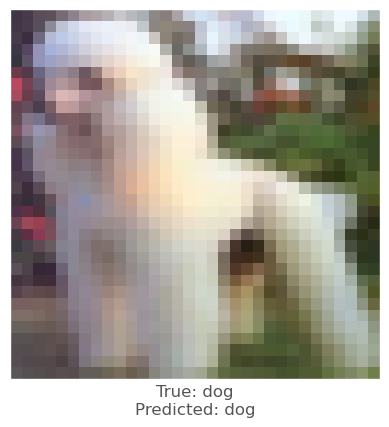



-0.009350657
-0.0020962954
-0.002944827
vr, vg, vb :   3.176265144944191 0.698902450799942 1.4104445058107378
beam_perturbed_confidence temp :  0.7174983
beam_perturbed_confidence temp :  0.7317924
beam_perturbed_confidence temp :  0.73045087
beam_perturbed_confidence temp :  0.7174983
beam_perturbed_confidence temp :  0.716493
beam_perturbed_confidence temp :  0.73045087
beam_perturbed_confidence temp :  0.716493
row index :  4
4th round's confidence : 3th 0.716493
predicted class :  dog
predicted class's confidence :  0.716493
Lopt is :  10


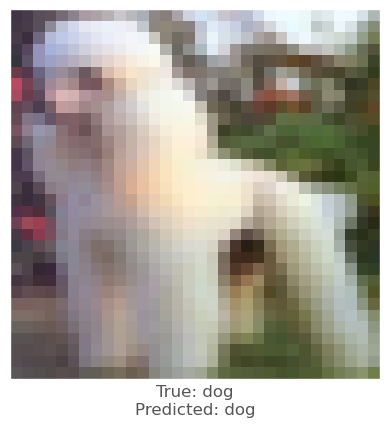



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.6894321435689927 -1.1036652159690856 0.8064189702272415
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6880391
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6880391
row index :  2
4th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


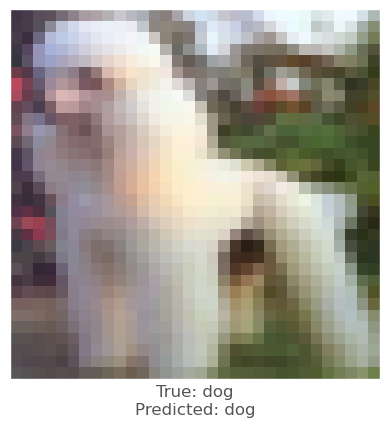



0.008805811
0.0025924444
-0.009999454
vr, vg, vb :   -1.4395607846379281 0.9635219435691835 5.086158416211605
beam_perturbed_confidence temp :  0.60132885
beam_perturbed_confidence temp :  0.6048112
beam_perturbed_confidence temp :  0.6005034
beam_perturbed_confidence temp :  0.60132885
beam_perturbed_confidence temp :  0.5824847
beam_perturbed_confidence temp :  0.6005034
beam_perturbed_confidence temp :  0.5824847
row index :  4
5th round's confidence : 0th 0.5824847
predicted class :  dog
predicted class's confidence :  0.5824847
Lopt is :  15


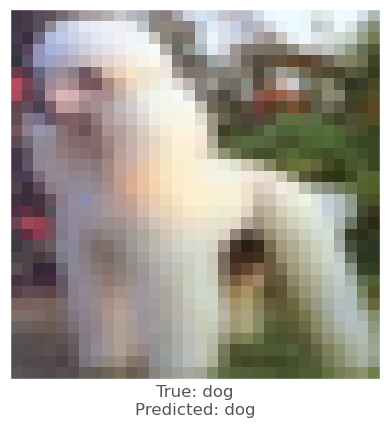



0.008714616
0.004083216
-0.0066300035
vr, vg, vb :   1.3506902856826786 1.44409273570776 2.674655222415924
beam_perturbed_confidence temp :  0.6784983
beam_perturbed_confidence temp :  0.67648953
beam_perturbed_confidence temp :  0.66674876
beam_perturbed_confidence temp :  0.6802991
beam_perturbed_confidence temp :  0.6703973
beam_perturbed_confidence temp :  0.66698974
beam_perturbed_confidence temp :  0.6719609
row index :  2
5th round's confidence : 1th 0.66674876
predicted class :  dog
predicted class's confidence :  0.66674876
Lopt is :  1


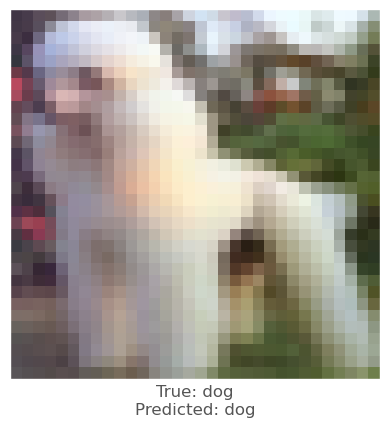



-0.010607541
-0.012423992
-0.0139968395
vr, vg, vb :   -1.5278453139662744 0.4401275610923766 4.465204005539418
beam_perturbed_confidence temp :  0.6110448
beam_perturbed_confidence temp :  0.5960552
beam_perturbed_confidence temp :  0.57556146
beam_perturbed_confidence temp :  0.6110448
beam_perturbed_confidence temp :  0.5821517
beam_perturbed_confidence temp :  0.57556146
beam_perturbed_confidence temp :  0.5821517
row index :  2
5th round's confidence : 2th 0.57556146
predicted class :  dog
predicted class's confidence :  0.57556146
Lopt is :  15


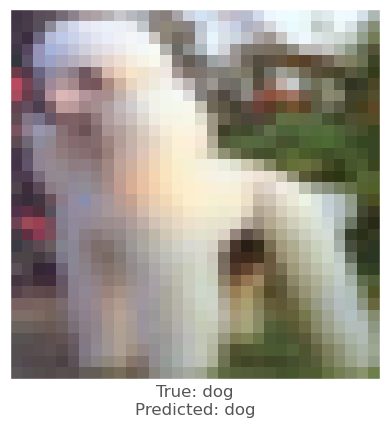



-0.009201407
-0.0010356307
-0.0016070604
vr, vg, vb :   3.778779373705387 0.732575276017189 1.4301060984730722
beam_perturbed_confidence temp :  0.7044975
beam_perturbed_confidence temp :  0.716493
beam_perturbed_confidence temp :  0.71589124
beam_perturbed_confidence temp :  0.7044975
beam_perturbed_confidence temp :  0.7029236
beam_perturbed_confidence temp :  0.71589124
beam_perturbed_confidence temp :  0.7029236
row index :  4
5th round's confidence : 3th 0.7029236
predicted class :  dog
predicted class's confidence :  0.7029236
Lopt is :  10


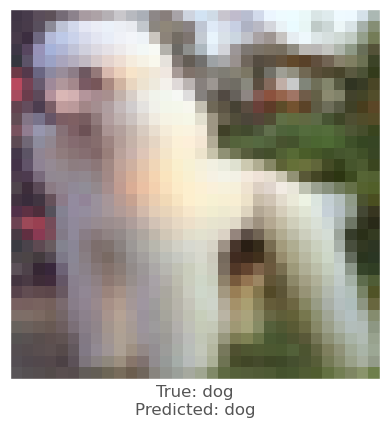



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.7628903860449793 -1.192104026556015 0.9696792796254158
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6821731
beam_perturbed_confidence temp :  0.6880391
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6880391
row index :  2
5th round's confidence : 4th 0.6821731
predicted class :  dog
predicted class's confidence :  0.6821731
Lopt is :  10


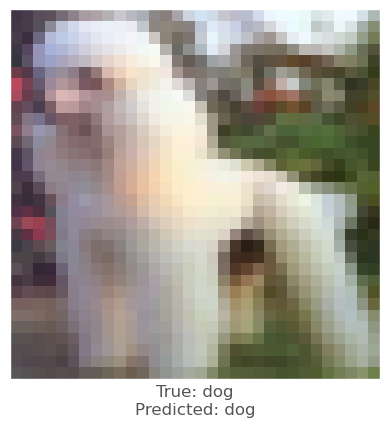



0.015803814
0.012876987
0.0013039112
vr, vg, vb :   -2.8759860996067523 -0.42052899651527387 4.4471514536798
beam_perturbed_confidence temp :  0.58078545
beam_perturbed_confidence temp :  0.5784131
beam_perturbed_confidence temp :  0.58546543
beam_perturbed_confidence temp :  0.5891544
beam_perturbed_confidence temp :  0.56501037
beam_perturbed_confidence temp :  0.5783569
beam_perturbed_confidence temp :  0.5679461
row index :  4
6th round's confidence : 0th 0.56501037
predicted class :  dog
predicted class's confidence :  0.56501037
Lopt is :  19


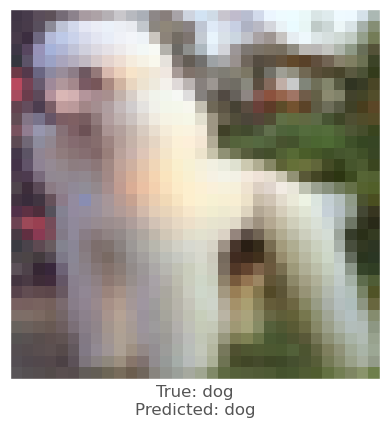



0.0076013207
0.0014131665
-0.008260608
vr, vg, vb :   0.4554891827583316 1.1583668098390103 3.2332504721164703
beam_perturbed_confidence temp :  0.66674876
beam_perturbed_confidence temp :  0.66698974
beam_perturbed_confidence temp :  0.6529344
beam_perturbed_confidence temp :  0.66698974
beam_perturbed_confidence temp :  0.6529344
beam_perturbed_confidence temp :  0.6577166
beam_perturbed_confidence temp :  0.6577166
row index :  2
6th round's confidence : 1th 0.6529344
predicted class :  dog
predicted class's confidence :  0.6529344
Lopt is :  4


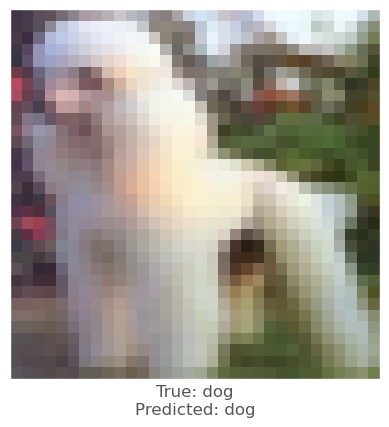



0.004481554
0.0046449304
-0.0046955943
vr, vg, vb :   -1.823216185706854 -0.06837823128700266 4.488243036061526
beam_perturbed_confidence temp :  0.5821517
beam_perturbed_confidence temp :  0.57726634
beam_perturbed_confidence temp :  0.5778838
beam_perturbed_confidence temp :  0.5892981
beam_perturbed_confidence temp :  0.5670452
beam_perturbed_confidence temp :  0.5689783
beam_perturbed_confidence temp :  0.5699845
row index :  4
6th round's confidence : 2th 0.5670452
predicted class :  dog
predicted class's confidence :  0.5670452
Lopt is :  19


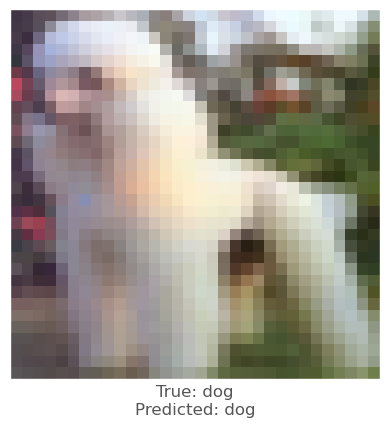



-0.008149445
-0.0015251637
-0.003122449
vr, vg, vb :   4.215845942026377 0.8118341134667396 1.5993403807461264
beam_perturbed_confidence temp :  0.6936965
beam_perturbed_confidence temp :  0.7029236
beam_perturbed_confidence temp :  0.70137507
beam_perturbed_confidence temp :  0.6936965
beam_perturbed_confidence temp :  0.69457924
beam_perturbed_confidence temp :  0.70137507
beam_perturbed_confidence temp :  0.69457924
row index :  0
6th round's confidence : 3th 0.6936965
predicted class :  dog
predicted class's confidence :  0.6936965
Lopt is :  10


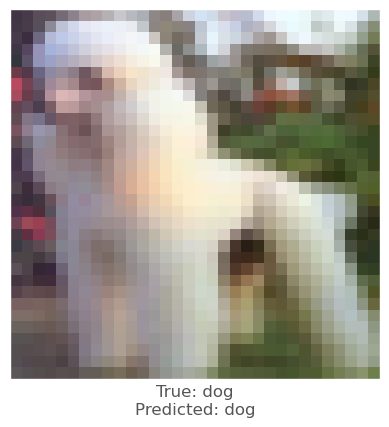



0.0014240146
0.0019880533
-0.002439022
vr, vg, vb :   -0.8290028042733671 -1.2716989560842513 1.1166135580837726
beam_perturbed_confidence temp :  0.6825407
beam_perturbed_confidence temp :  0.6858675
beam_perturbed_confidence temp :  0.6819384
beam_perturbed_confidence temp :  0.6880391
beam_perturbed_confidence temp :  0.6807301
beam_perturbed_confidence temp :  0.6816033
beam_perturbed_confidence temp :  0.68398494
row index :  4
6th round's confidence : 4th 0.6807301
predicted class :  dog
predicted class's confidence :  0.6807301
Lopt is :  11


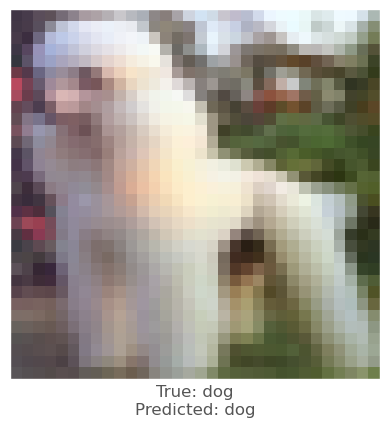



-0.001006186
0.0024886727
-0.0033168793
vr, vg, vb :   -2.48776888880074 -0.627343370194435 4.334124235557914
beam_perturbed_confidence temp :  0.58024114
beam_perturbed_confidence temp :  0.5679461
beam_perturbed_confidence temp :  0.56708753
beam_perturbed_confidence temp :  0.5862627
beam_perturbed_confidence temp :  0.56395715
beam_perturbed_confidence temp :  0.56318563
beam_perturbed_confidence temp :  0.56619745
row index :  5
7th round's confidence : 0th 0.56318563
predicted class :  dog
predicted class's confidence :  0.56318563
Lopt is :  23


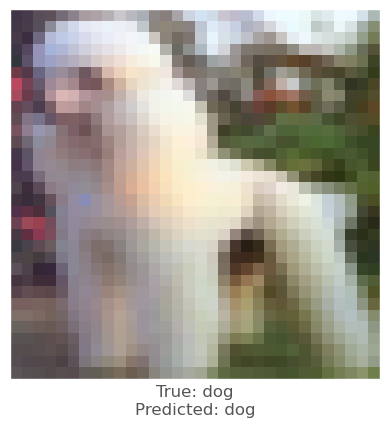



0.009686708
0.004626155
-0.0067175627
vr, vg, vb :   -0.5587305805492397 0.5799146388953924 3.5816816924524306
beam_perturbed_confidence temp :  0.6501936
beam_perturbed_confidence temp :  0.6529344
beam_perturbed_confidence temp :  0.6467352
beam_perturbed_confidence temp :  0.6501936
beam_perturbed_confidence temp :  0.6389139
beam_perturbed_confidence temp :  0.6467352
beam_perturbed_confidence temp :  0.6389139
row index :  4
7th round's confidence : 1th 0.6389139
predicted class :  dog
predicted class's confidence :  0.6389139
Lopt is :  7


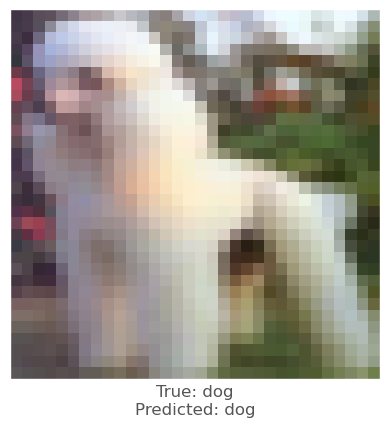



-0.0012316108
0.002611637
-0.0020390153
vr, vg, vb :   -1.5177334896367791 -0.322704119706154 4.243320261767507
beam_perturbed_confidence temp :  0.57578105
beam_perturbed_confidence temp :  0.5699845
beam_perturbed_confidence temp :  0.567178
beam_perturbed_confidence temp :  0.58024114
beam_perturbed_confidence temp :  0.56456095
beam_perturbed_confidence temp :  0.5650247
beam_perturbed_confidence temp :  0.56395715
row index :  6
7th round's confidence : 2th 0.56395715
predicted class :  dog
predicted class's confidence :  0.56395715
Lopt is :  23


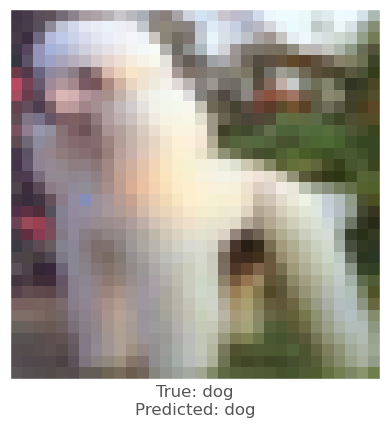



-0.0014583468
0.0064054728
0.0020141006
vr, vg, vb :   3.9400960321956875 0.09010342657685277 1.2379962875109913
beam_perturbed_confidence temp :  0.69522184
beam_perturbed_confidence temp :  0.6936965
beam_perturbed_confidence temp :  0.69457924
beam_perturbed_confidence temp :  0.69522184
beam_perturbed_confidence temp :  0.69501
beam_perturbed_confidence temp :  0.69457924
beam_perturbed_confidence temp :  0.69501
row index :  1
7th round's confidence : 3th 0.6936965
predicted class :  dog
predicted class's confidence :  0.6936965
Lopt is :  10


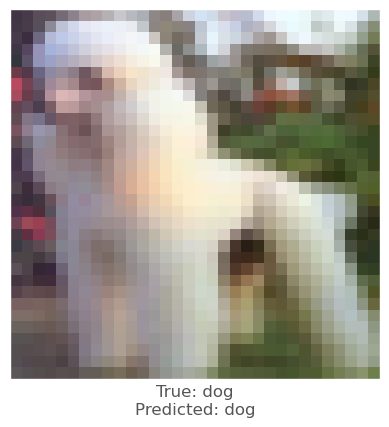



0.0009319782
0.0016648769
-0.002369523
vr, vg, vb :   -0.8393003464168313 -1.3110167542624473 1.2419045071154833
beam_perturbed_confidence temp :  0.68100643
beam_perturbed_confidence temp :  0.68398494
beam_perturbed_confidence temp :  0.6801712
beam_perturbed_confidence temp :  0.6853892
beam_perturbed_confidence temp :  0.6794249
beam_perturbed_confidence temp :  0.6804455
beam_perturbed_confidence temp :  0.6815211
row index :  4
7th round's confidence : 4th 0.6794249
predicted class :  dog
predicted class's confidence :  0.6794249
Lopt is :  12


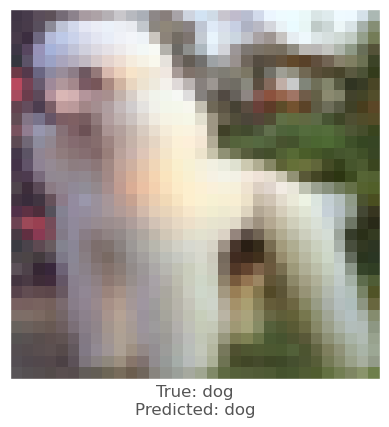



0.00589931
0.00782609
0.00021541119
vr, vg, vb :   -2.8289230111206174 -1.3472180190758705 3.879170693380296
beam_perturbed_confidence temp :  0.56619745
beam_perturbed_confidence temp :  0.5589688
beam_perturbed_confidence temp :  0.5571109
beam_perturbed_confidence temp :  0.57870287
beam_perturbed_confidence temp :  0.5536554
beam_perturbed_confidence temp :  0.555027
beam_perturbed_confidence temp :  0.559877
row index :  4
8th round's confidence : 0th 0.5536554
predicted class :  dog
predicted class's confidence :  0.5536554
Lopt is :  26


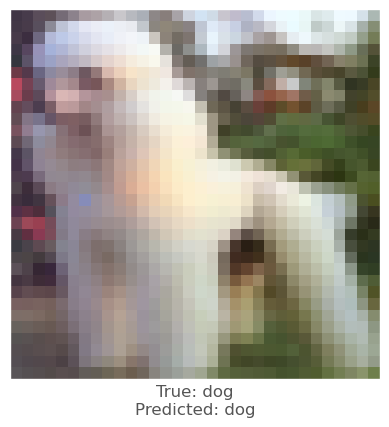



0.014812171
0.0075731277
-0.003409326
vr, vg, vb :   -1.9840746684141157 -0.23538959965234996 3.5644461308579443
beam_perturbed_confidence temp :  0.6287104
beam_perturbed_confidence temp :  0.6358389
beam_perturbed_confidence temp :  0.63415617
beam_perturbed_confidence temp :  0.6272249
beam_perturbed_confidence temp :  0.61669904
beam_perturbed_confidence temp :  0.6292874
beam_perturbed_confidence temp :  0.61269546
row index :  6
8th round's confidence : 1th 0.61269546
predicted class :  dog
predicted class's confidence :  0.61269546
Lopt is :  10


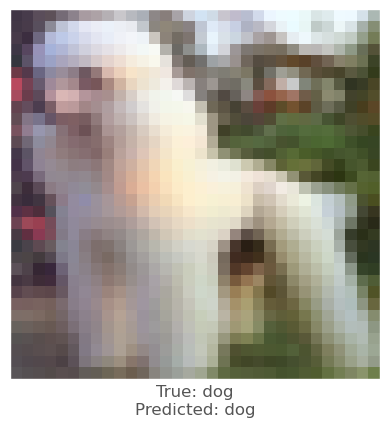



-0.0048327446
-0.0016365051
-0.0077091455
vr, vg, vb :   -0.882685680834234 -0.12678319504022612 4.589902790186704
beam_perturbed_confidence temp :  0.56746
beam_perturbed_confidence temp :  0.56619745
beam_perturbed_confidence temp :  0.55056673
beam_perturbed_confidence temp :  0.57169724
beam_perturbed_confidence temp :  0.5495677
beam_perturbed_confidence temp :  0.5504043
beam_perturbed_confidence temp :  0.54822326
row index :  6
8th round's confidence : 2th 0.54822326
predicted class :  dog
predicted class's confidence :  0.54822326
Lopt is :  27


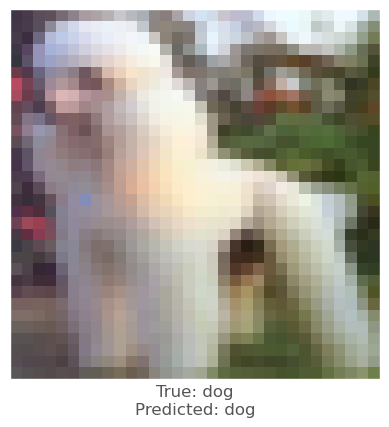



-0.0014583468
0.0064054728
0.0020141006
vr, vg, vb :   3.691921113348067 -0.5594541916240454 0.9127866035993697
beam_perturbed_confidence temp :  0.69522184
beam_perturbed_confidence temp :  0.68993276
beam_perturbed_confidence temp :  0.6936965
beam_perturbed_confidence temp :  0.69030005
beam_perturbed_confidence temp :  0.69522184
beam_perturbed_confidence temp :  0.68993276
beam_perturbed_confidence temp :  0.69030005
row index :  1
8th round's confidence : 3th 0.68993276
predicted class :  dog
predicted class's confidence :  0.68993276
Lopt is :  11


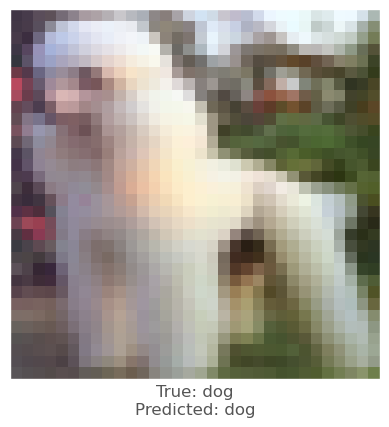



0.00094115734
0.0015257001
-0.002226293
vr, vg, vb :   -0.8494860458754899 -1.33248508806777 1.3403433651044965
beam_perturbed_confidence temp :  0.67923003
beam_perturbed_confidence temp :  0.6815211
beam_perturbed_confidence temp :  0.67878014
beam_perturbed_confidence temp :  0.6821288
beam_perturbed_confidence temp :  0.67763895
beam_perturbed_confidence temp :  0.6788566
beam_perturbed_confidence temp :  0.6789268
row index :  4
8th round's confidence : 4th 0.67763895
predicted class :  dog
predicted class's confidence :  0.67763895
Lopt is :  13


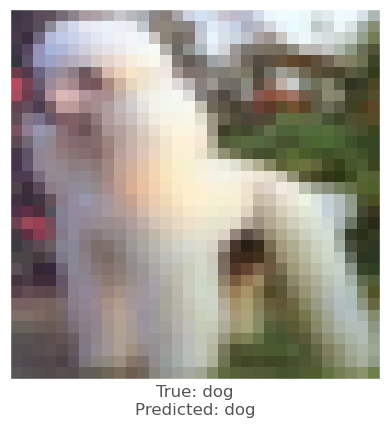



0.00043457747
-0.00037318468
-0.0065935254
vr, vg, vb :   -2.589488456514293 -1.1751777490744113 4.150606165012116
beam_perturbed_confidence temp :  0.56312627
beam_perturbed_confidence temp :  0.559877
beam_perturbed_confidence temp :  0.5401566
beam_perturbed_confidence temp :  0.5860487
beam_perturbed_confidence temp :  0.5343936
beam_perturbed_confidence temp :  0.5370787
beam_perturbed_confidence temp :  0.54910964
row index :  4
9th round's confidence : 0th 0.5343936
predicted class :  dog
predicted class's confidence :  0.5343936
Lopt is :  30


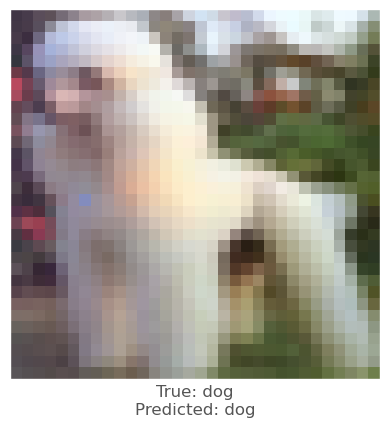



0.012525201
0.005680144
-0.006063342
vr, vg, vb :   -3.038187285953808 -0.779865023003155 3.8143357272142886
beam_perturbed_confidence temp :  0.60786116
beam_perturbed_confidence temp :  0.6110189
beam_perturbed_confidence temp :  0.6098574
beam_perturbed_confidence temp :  0.6175217
beam_perturbed_confidence temp :  0.58552206
beam_perturbed_confidence temp :  0.60433054
beam_perturbed_confidence temp :  0.58979964
row index :  4
9th round's confidence : 1th 0.58552206
predicted class :  dog
predicted class's confidence :  0.58552206
Lopt is :  13


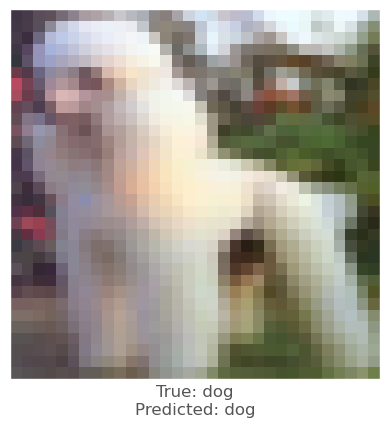



-0.0013462901
-0.0030724406
-0.0098026395
vr, vg, vb :   -0.6597881015966358 0.19313918688750253 5.111176459608585
beam_perturbed_confidence temp :  0.5517506
beam_perturbed_confidence temp :  0.54822326
beam_perturbed_confidence temp :  0.5302033
beam_perturbed_confidence temp :  0.5517506
beam_perturbed_confidence temp :  0.52675736
beam_perturbed_confidence temp :  0.5302033
beam_perturbed_confidence temp :  0.52675736
row index :  4
9th round's confidence : 2th 0.52675736
predicted class :  dog
predicted class's confidence :  0.52675736
Lopt is :  32


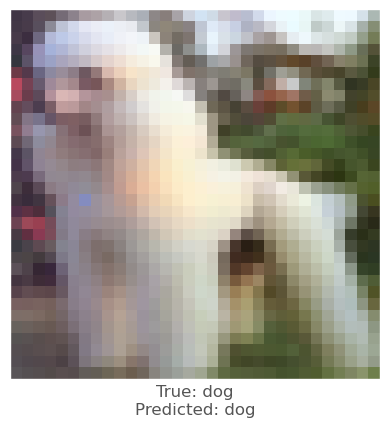



-0.0032894611
0.005870402
0.0011298656
vr, vg, vb :   3.6516751155996863 -1.0905489583899857 0.7085213786032023
beam_perturbed_confidence temp :  0.69030005
beam_perturbed_confidence temp :  0.6872018
beam_perturbed_confidence temp :  0.68993276
beam_perturbed_confidence temp :  0.68219215
beam_perturbed_confidence temp :  0.69030005
beam_perturbed_confidence temp :  0.6872018
beam_perturbed_confidence temp :  0.68219215
row index :  3
9th round's confidence : 3th 0.68219215
predicted class :  dog
predicted class's confidence :  0.68219215
Lopt is :  13


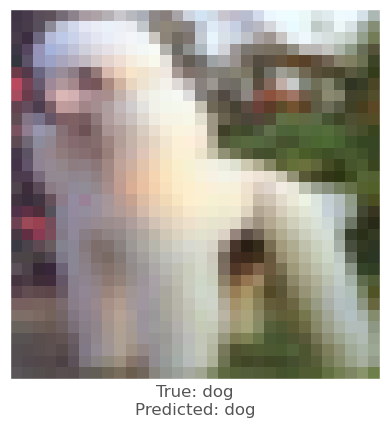



0.0013312697
0.0026114583
-0.0015611053
vr, vg, vb :   -0.897664415393776 -1.460382409415412 1.3624195537252723
beam_perturbed_confidence temp :  0.67744887
beam_perturbed_confidence temp :  0.6789268
beam_perturbed_confidence temp :  0.6776689
beam_perturbed_confidence temp :  0.67873424
beam_perturbed_confidence temp :  0.67668873
beam_perturbed_confidence temp :  0.67636997
beam_perturbed_confidence temp :  0.6760094
row index :  6
9th round's confidence : 4th 0.6760094
predicted class :  dog
predicted class's confidence :  0.6760094
Lopt is :  14


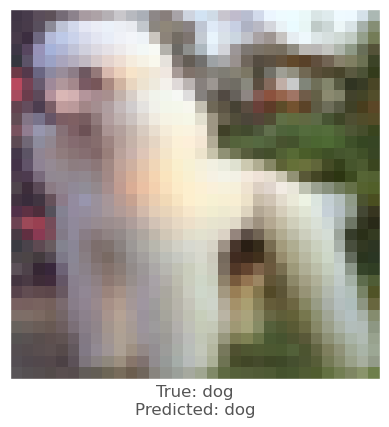



-0.004308939
-0.007648468
-0.011966407
vr, vg, vb :   -1.8996457128526099 -0.2928131724091576 4.932186278415079
beam_perturbed_confidence temp :  0.54656905
beam_perturbed_confidence temp :  0.54107946
beam_perturbed_confidence temp :  0.51694524
beam_perturbed_confidence temp :  0.56091744
beam_perturbed_confidence temp :  0.5181483
beam_perturbed_confidence temp :  0.51630455
beam_perturbed_confidence temp :  0.52755314
row index :  5
10th round's confidence : 0th 0.51630455
predicted class :  dog
predicted class's confidence :  0.51630455
Lopt is :  34


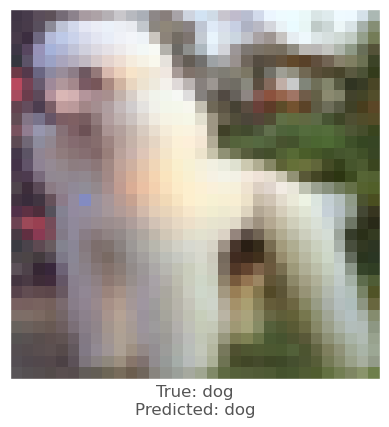



-0.00034445524
-0.0042905807
-0.009578347
vr, vg, vb :   -2.699923033142729 -0.27282044575166764 4.390736875104432
beam_perturbed_confidence temp :  0.60456634
beam_perturbed_confidence temp :  0.58979964
beam_perturbed_confidence temp :  0.57599396
beam_perturbed_confidence temp :  0.6124715
beam_perturbed_confidence temp :  0.5754394
beam_perturbed_confidence temp :  0.5718011
beam_perturbed_confidence temp :  0.5834693
row index :  5
10th round's confidence : 1th 0.5718011
predicted class :  dog
predicted class's confidence :  0.5718011
Lopt is :  17


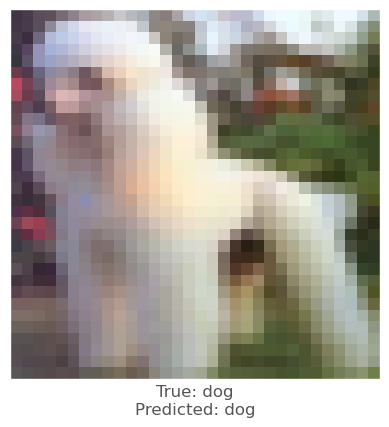



0.0060557723
0.0014167428
-0.008296967
vr, vg, vb :   -1.1993865218904634 0.03215098803212632 5.429755468921164
beam_perturbed_confidence temp :  0.5242826
beam_perturbed_confidence temp :  0.52675736
beam_perturbed_confidence temp :  0.52033055
beam_perturbed_confidence temp :  0.5242826
beam_perturbed_confidence temp :  0.5112879
beam_perturbed_confidence temp :  0.52033055
beam_perturbed_confidence temp :  0.5112879
row index :  4
10th round's confidence : 2th 0.5112879
predicted class :  dog
predicted class's confidence :  0.5112879
Lopt is :  37


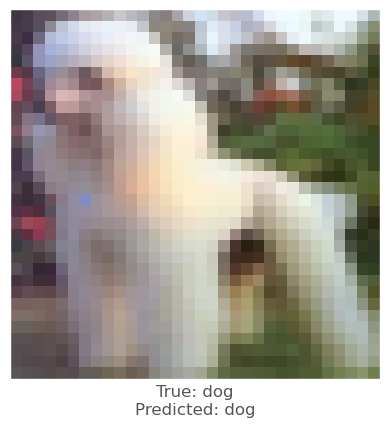



0.0033786297
0.006216526
0.0020446181
vr, vg, vb :   2.9486446355948934 -1.6031466657004012 0.43320742776985965
beam_perturbed_confidence temp :  0.685713
beam_perturbed_confidence temp :  0.67967236
beam_perturbed_confidence temp :  0.68219215
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.685713
beam_perturbed_confidence temp :  0.67967236
beam_perturbed_confidence temp :  0.67975324
row index :  1
10th round's confidence : 3th 0.67967236
predicted class :  dog
predicted class's confidence :  0.67967236
Lopt is :  15


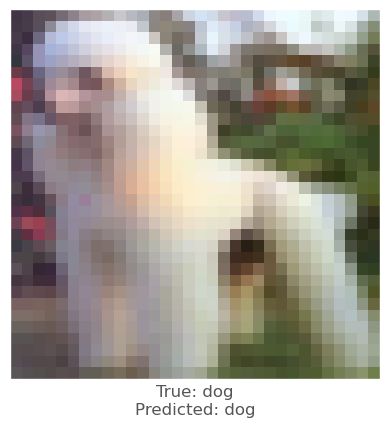



0.0011224151
-0.00010430813
-0.0047649145
vr, vg, vb :   -0.9201394804309364 -1.3039133556381775 1.702669049616173
beam_perturbed_confidence temp :  0.67524755
beam_perturbed_confidence temp :  0.67531425
beam_perturbed_confidence temp :  0.6739693
beam_perturbed_confidence temp :  0.6748345
beam_perturbed_confidence temp :  0.6731131
beam_perturbed_confidence temp :  0.6731581
beam_perturbed_confidence temp :  0.6721219
row index :  6
10th round's confidence : 4th 0.6721219
predicted class :  dog
predicted class's confidence :  0.6721219
Lopt is :  15


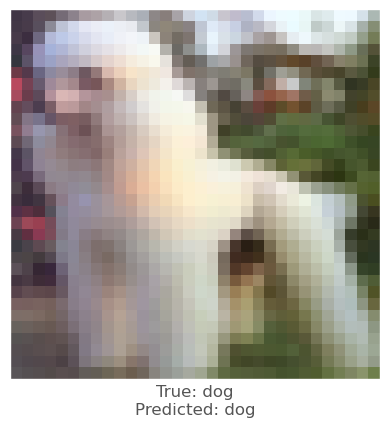



0.0002462864
-0.0032028556
-0.0069924593
vr, vg, vb :   -1.7343097807885404 0.05675370353231968 5.138213580291589
beam_perturbed_confidence temp :  0.52755314
beam_perturbed_confidence temp :  0.51630455
beam_perturbed_confidence temp :  0.51270264
beam_perturbed_confidence temp :  0.52755314
beam_perturbed_confidence temp :  0.5077827
beam_perturbed_confidence temp :  0.51270264
beam_perturbed_confidence temp :  0.5077827
row index :  4
11th round's confidence : 0th 0.5077827
predicted class :  dog
predicted class's confidence :  0.5077827
Lopt is :  39


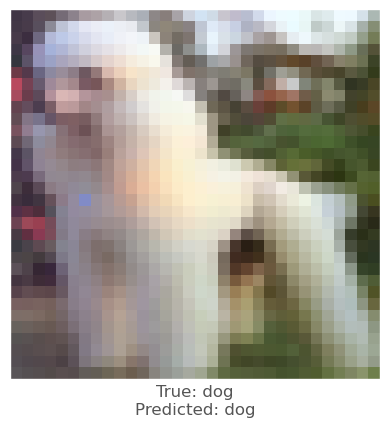



0.005331576
0.0033711195
-0.0053333044
vr, vg, vb :   -2.9630883168798476 -0.5826503510971552 4.4849936281152285
beam_perturbed_confidence temp :  0.5834693
beam_perturbed_confidence temp :  0.57262284
beam_perturbed_confidence temp :  0.5730784
beam_perturbed_confidence temp :  0.5922901
beam_perturbed_confidence temp :  0.56343913
beam_perturbed_confidence temp :  0.56407356
beam_perturbed_confidence temp :  0.5663193
row index :  4
11th round's confidence : 1th 0.56343913
predicted class :  dog
predicted class's confidence :  0.56343913
Lopt is :  21


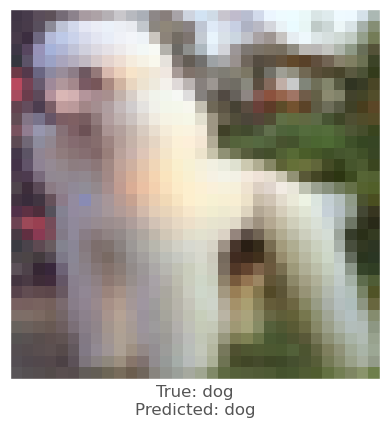



0.004297793
0.0026506186
-0.000952065
vr, vg, vb :   -1.5092271608543713 -0.23612596608724842 4.981986421128779
beam_perturbed_confidence temp :  0.5115541
beam_perturbed_confidence temp :  0.5103165
beam_perturbed_confidence temp :  0.5199096
beam_perturbed_confidence temp :  0.5187866
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.51229894
beam_perturbed_confidence temp :  0.50670457
row index :  6
11th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


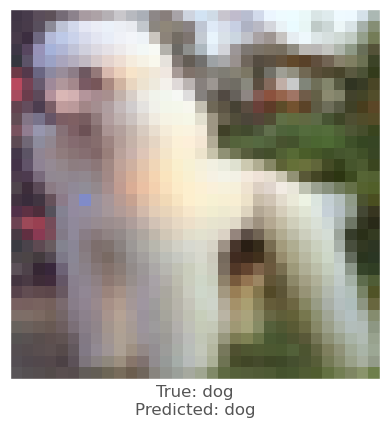



-0.0019977093
-0.0013499856
-0.0027329326
vr, vg, vb :   2.853551099464603 -1.3078334391785789 0.6631799417525173
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.6854225
beam_perturbed_confidence temp :  0.67967236
beam_perturbed_confidence temp :  0.68050444
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.6854225
beam_perturbed_confidence temp :  0.68050444
row index :  2
11th round's confidence : 3th 0.67967236
predicted class :  dog
predicted class's confidence :  0.67967236
Lopt is :  15


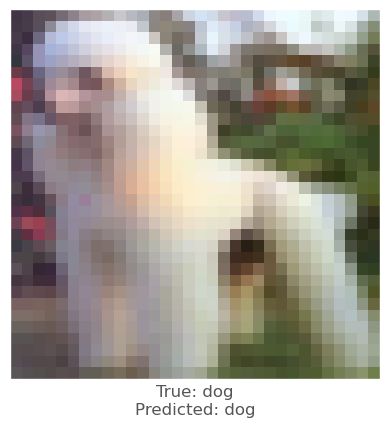



0.0033379197
0.0018084049
-0.005238712
vr, vg, vb :   -1.1619175035945077 -1.3543625123228948 2.0562733280499415
beam_perturbed_confidence temp :  0.66511846
beam_perturbed_confidence temp :  0.6674198
beam_perturbed_confidence temp :  0.6671034
beam_perturbed_confidence temp :  0.6571252
beam_perturbed_confidence temp :  0.6641758
beam_perturbed_confidence temp :  0.6651272
beam_perturbed_confidence temp :  0.65713495
row index :  3
11th round's confidence : 4th 0.6571252
predicted class :  dog
predicted class's confidence :  0.6571252
Lopt is :  15


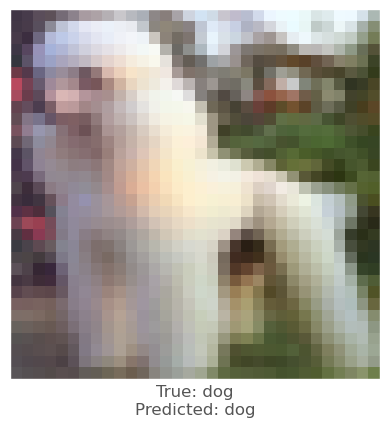



-0.00057148933
-0.00097084045
-0.0012071133
vr, vg, vb :   -1.5037298692990417 0.14816237858924397 4.745103548861552
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.5077827
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.51090264
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51090264
row index :  1
12th round's confidence : 0th 0.5077827
predicted class :  dog
predicted class's confidence :  0.5077827
Lopt is :  39


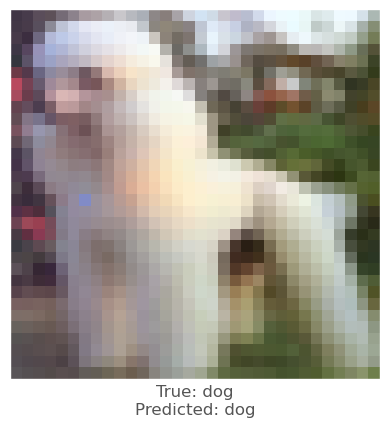



-0.0074886084
-0.004736483
-0.006307602
vr, vg, vb :   -1.9179186491628104 -0.05073700627979816 4.667254458174799
beam_perturbed_confidence temp :  0.5746906
beam_perturbed_confidence temp :  0.5663193
beam_perturbed_confidence temp :  0.5588368
beam_perturbed_confidence temp :  0.5812754
beam_perturbed_confidence temp :  0.5570623
beam_perturbed_confidence temp :  0.55567205
beam_perturbed_confidence temp :  0.5597406
row index :  5
12th round's confidence : 1th 0.55567205
predicted class :  dog
predicted class's confidence :  0.55567205
Lopt is :  25


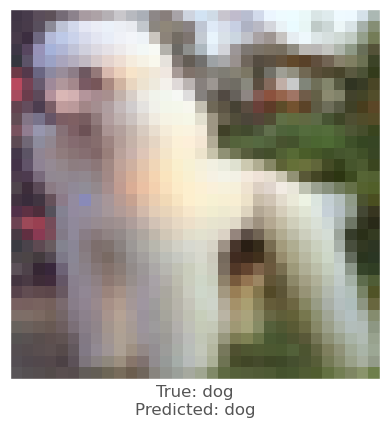



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   -0.9873608984737681 0.06246669872826352 4.5478568116849685
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.51533735
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.51533735
row index :  1
12th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


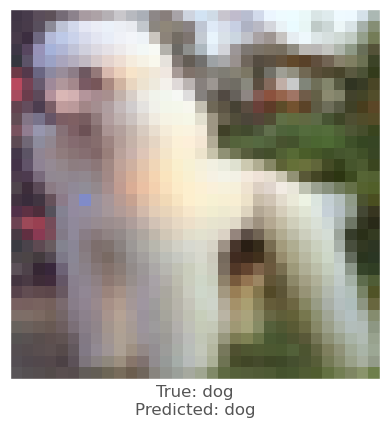



-0.0019977093
-0.0013499856
-0.0027329326
vr, vg, vb :   2.767966916947342 -1.0420515353089388 0.8701552043369091
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.6854225
beam_perturbed_confidence temp :  0.67967236
beam_perturbed_confidence temp :  0.68050444
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.6854225
beam_perturbed_confidence temp :  0.68050444
row index :  2
12th round's confidence : 3th 0.67967236
predicted class :  dog
predicted class's confidence :  0.67967236
Lopt is :  15


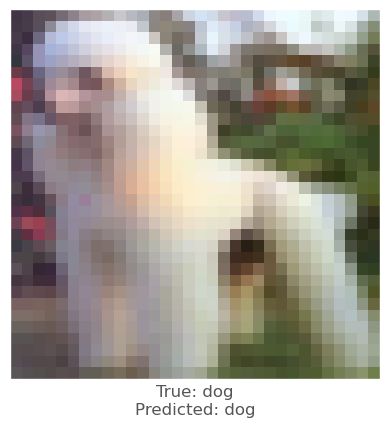



0.010726869
0.007208407
-0.0022653341
vr, vg, vb :   -2.1184126638643295 -1.939766953610747 2.077179408178297
beam_perturbed_confidence temp :  0.64214724
beam_perturbed_confidence temp :  0.65098006
beam_perturbed_confidence temp :  0.65713495
beam_perturbed_confidence temp :  0.6386903
beam_perturbed_confidence temp :  0.63790315
beam_perturbed_confidence temp :  0.6486159
beam_perturbed_confidence temp :  0.6342885
row index :  6
12th round's confidence : 4th 0.6342885
predicted class :  dog
predicted class's confidence :  0.6342885
Lopt is :  17


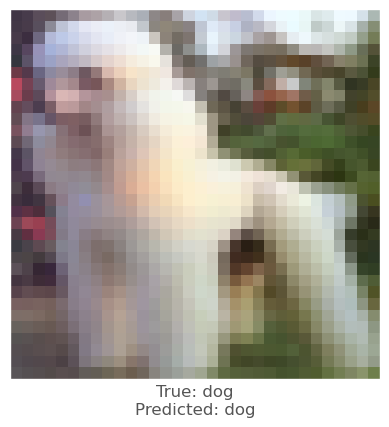



-0.00057148933
-0.00097084045
-0.0012071133
vr, vg, vb :   -1.296207948958493 0.23043018614047583 4.3913045205745185
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.5077827
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.51090264
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51090264
row index :  1
13th round's confidence : 0th 0.5077827
predicted class :  dog
predicted class's confidence :  0.5077827
Lopt is :  39


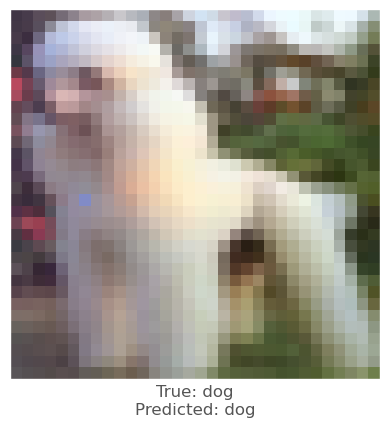



0.001318574
0.004187107
-0.0018681288
vr, vg, vb :   -1.8579841794186485 -0.4643740142699824 4.387341890012348
beam_perturbed_confidence temp :  0.5597406
beam_perturbed_confidence temp :  0.5546497
beam_perturbed_confidence temp :  0.5472856
beam_perturbed_confidence temp :  0.5662615
beam_perturbed_confidence temp :  0.5428746
beam_perturbed_confidence temp :  0.5454882
beam_perturbed_confidence temp :  0.54242635
row index :  6
13th round's confidence : 1th 0.54242635
predicted class :  dog
predicted class's confidence :  0.54242635
Lopt is :  29


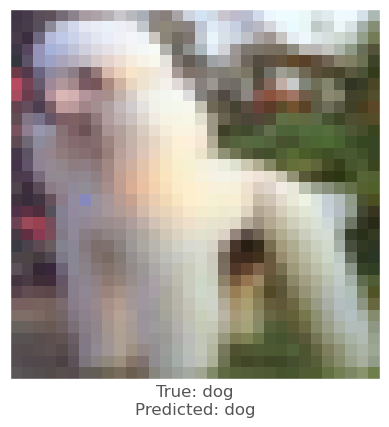



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   -0.5176812623312252 0.3312000970622243 4.157140163185539
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.51533735
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.51533735
row index :  1
13th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


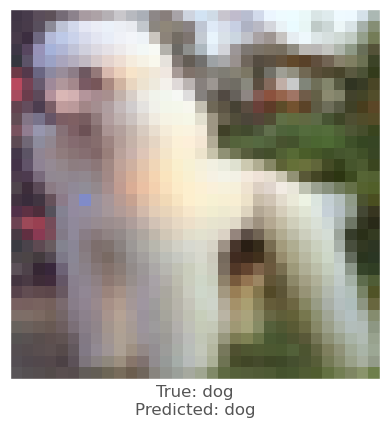



-0.0019977093
-0.0013499856
-0.0027329326
vr, vg, vb :   2.6909411526818072 -0.8028478218262627 1.0564329406628619
beam_perturbed_confidence temp :  0.67975324
beam_perturbed_confidence temp :  0.68108356
beam_perturbed_confidence temp :  0.67832214
beam_perturbed_confidence temp :  0.6791764
beam_perturbed_confidence temp :  0.6798767
beam_perturbed_confidence temp :  0.67837805
beam_perturbed_confidence temp :  0.6781247
row index :  6
13th round's confidence : 3th 0.6781247
predicted class :  dog
predicted class's confidence :  0.6781247
Lopt is :  16


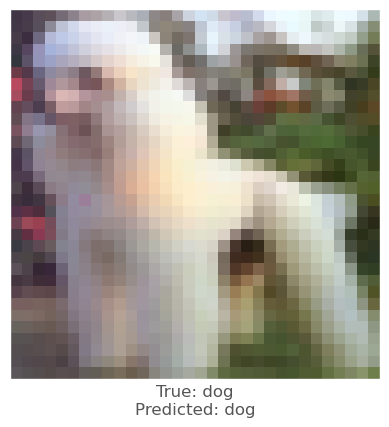



0.010740161
0.005225718
-0.002677977
vr, vg, vb :   -2.98058749168566 -2.2683620603889545 2.13725917587182
beam_perturbed_confidence temp :  0.6203914
beam_perturbed_confidence temp :  0.6297967
beam_perturbed_confidence temp :  0.6314255
beam_perturbed_confidence temp :  0.60534465
beam_perturbed_confidence temp :  0.6131267
beam_perturbed_confidence temp :  0.6245345
beam_perturbed_confidence temp :  0.60342646
row index :  6
13th round's confidence : 4th 0.60342646
predicted class :  dog
predicted class's confidence :  0.60342646
Lopt is :  19


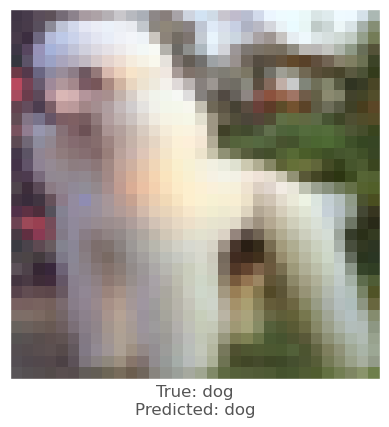



-0.00057148933
-0.00097084045
-0.0012071133
vr, vg, vb :   -1.1094382206519993 0.3044712129365845 4.072885395116188
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.5077827
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51865166
beam_perturbed_confidence temp :  0.51090264
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.51090264
row index :  1
14th round's confidence : 0th 0.5077827
predicted class :  dog
predicted class's confidence :  0.5077827
Lopt is :  39


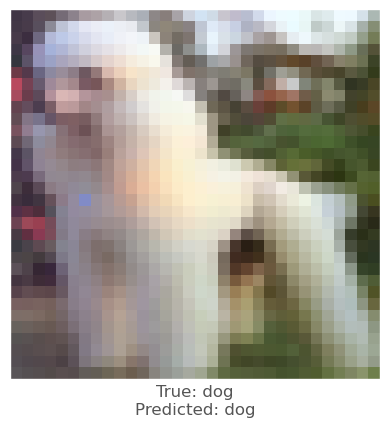



-0.0019566417
-0.0037139058
-0.009350002
vr, vg, vb :   -1.4765215940726089 -0.04654603171200272 4.883607882209233
beam_perturbed_confidence temp :  0.5515002
beam_perturbed_confidence temp :  0.5465885
beam_perturbed_confidence temp :  0.5305099
beam_perturbed_confidence temp :  0.56020755
beam_perturbed_confidence temp :  0.5251858
beam_perturbed_confidence temp :  0.52771986
beam_perturbed_confidence temp :  0.5300775
row index :  4
14th round's confidence : 1th 0.5251858
predicted class :  dog
predicted class's confidence :  0.5251858
Lopt is :  33


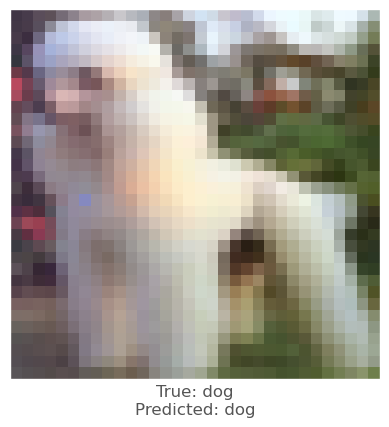



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   -0.09496958980293674 0.573060155562789 3.8054951795360523
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.5112783
beam_perturbed_confidence temp :  0.51217854
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.51217854
row index :  1
14th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


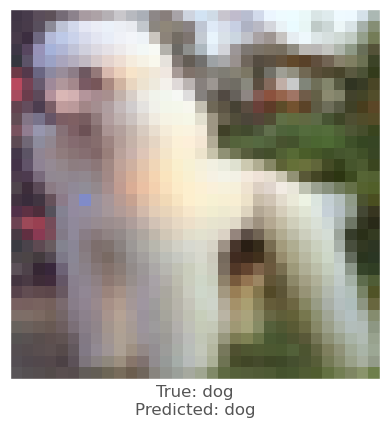



0.00065618753
0.0012999177
-0.0019942522
vr, vg, vb :   2.356228283980399 -0.8525548094342859 1.1502148670860777
beam_perturbed_confidence temp :  0.68039787
beam_perturbed_confidence temp :  0.67857677
beam_perturbed_confidence temp :  0.67718214
beam_perturbed_confidence temp :  0.6789174
beam_perturbed_confidence temp :  0.68042153
beam_perturbed_confidence temp :  0.67713475
beam_perturbed_confidence temp :  0.6782437
row index :  5
14th round's confidence : 3th 0.67713475
predicted class :  dog
predicted class's confidence :  0.67713475
Lopt is :  17


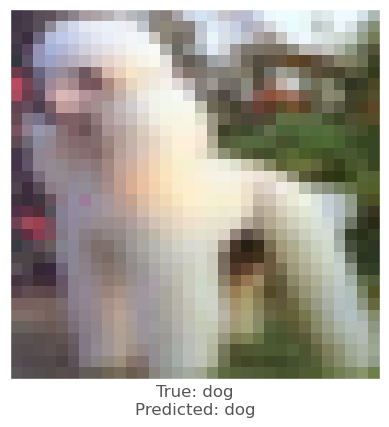



0.014708102
0.0073500276
-0.00459373
vr, vg, vb :   -4.153338917459111 -2.7765286104688336 2.3829062555685736
beam_perturbed_confidence temp :  0.5645182
beam_perturbed_confidence temp :  0.58112687
beam_perturbed_confidence temp :  0.599212
beam_perturbed_confidence temp :  0.57959616
beam_perturbed_confidence temp :  0.5651754
beam_perturbed_confidence temp :  0.58490115
beam_perturbed_confidence temp :  0.5662293
row index :  0
14th round's confidence : 4th 0.5645182
predicted class :  dog
predicted class's confidence :  0.5645182
Lopt is :  19


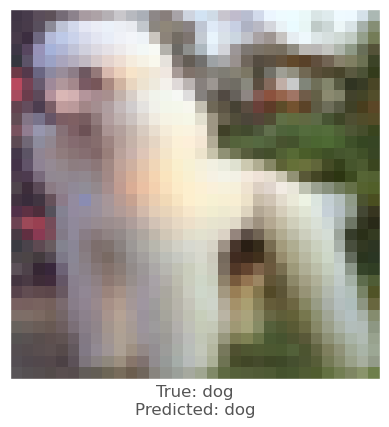



-0.00057148933
-0.00097084045
-0.0012071133
vr, vg, vb :   -0.9413454651761548 0.3711081370530823 3.7863081822036904
beam_perturbed_confidence temp :  0.50992733
beam_perturbed_confidence temp :  0.5077827
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50992733
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
row index :  4
15th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


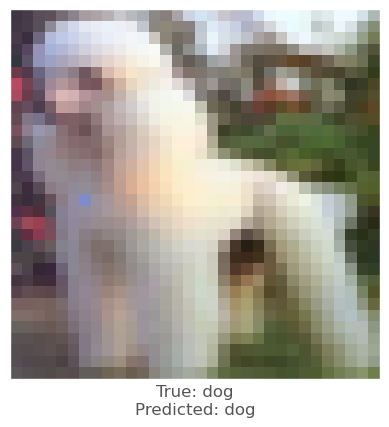



-0.0022073984
-0.0054247975
-0.009527385
vr, vg, vb :   -1.1081295932041664 0.5005883249534603 5.347985617471586
beam_perturbed_confidence temp :  0.5357152
beam_perturbed_confidence temp :  0.5251858
beam_perturbed_confidence temp :  0.51440996
beam_perturbed_confidence temp :  0.5357152
beam_perturbed_confidence temp :  0.509098
beam_perturbed_confidence temp :  0.51440996
beam_perturbed_confidence temp :  0.509098
row index :  4
15th round's confidence : 1th 0.509098
predicted class :  dog
predicted class's confidence :  0.509098
Lopt is :  38


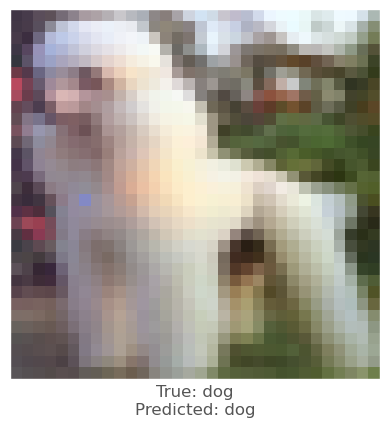



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.28547091547252296 0.7907342082132972 3.4890146942515146
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.5129776
row index :  0
15th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


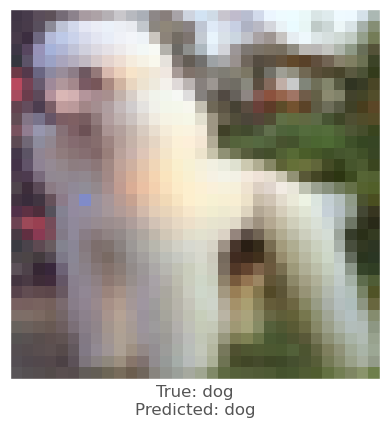



-0.0007395148
-0.0014948249
-0.002852738
vr, vg, vb :   2.1945569383551864 -0.6178168398586551 1.320467170736967
beam_perturbed_confidence temp :  0.6782437
beam_perturbed_confidence temp :  0.67867696
beam_perturbed_confidence temp :  0.675724
beam_perturbed_confidence temp :  0.67758644
beam_perturbed_confidence temp :  0.67858803
beam_perturbed_confidence temp :  0.6767894
beam_perturbed_confidence temp :  0.67634416
row index :  2
15th round's confidence : 3th 0.675724
predicted class :  dog
predicted class's confidence :  0.675724
Lopt is :  17


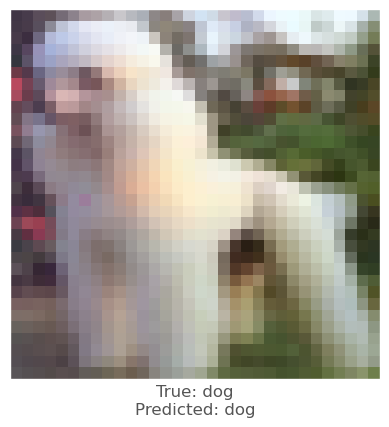



0.0012824535
0.0016613007
-0.005040705
vr, vg, vb :   -3.8662503794119307 -2.665005815339919 2.6486861504127175
beam_perturbed_confidence temp :  0.5862627
beam_perturbed_confidence temp :  0.57959616
beam_perturbed_confidence temp :  0.5651754
beam_perturbed_confidence temp :  0.61865276
beam_perturbed_confidence temp :  0.57522494
beam_perturbed_confidence temp :  0.5662293
beam_perturbed_confidence temp :  0.60149187
row index :  2
15th round's confidence : 4th 0.5651754
predicted class :  dog
predicted class's confidence :  0.5651754
Lopt is :  21


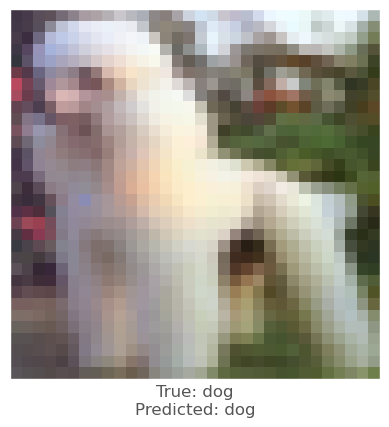



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   -0.7059955942566839 0.2972212575213581 3.167846154800582
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.51533735
beam_perturbed_confidence temp :  0.51802665
beam_perturbed_confidence temp :  0.51533735
row index :  1
16th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


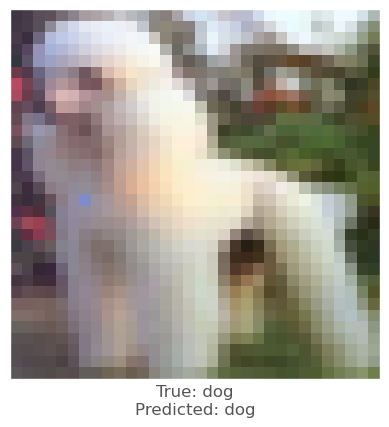



-0.0020326972
-0.0029881
-0.0024027228
vr, vg, vb :   -0.7940469138062352 0.7493394976461025 5.053459339278505
beam_perturbed_confidence temp :  0.5132831
beam_perturbed_confidence temp :  0.509098
beam_perturbed_confidence temp :  0.5144659
beam_perturbed_confidence temp :  0.5132831
beam_perturbed_confidence temp :  0.50906324
beam_perturbed_confidence temp :  0.5144659
beam_perturbed_confidence temp :  0.50906324
row index :  4
16th round's confidence : 1th 0.50906324
predicted class :  dog
predicted class's confidence :  0.50906324
Lopt is :  43


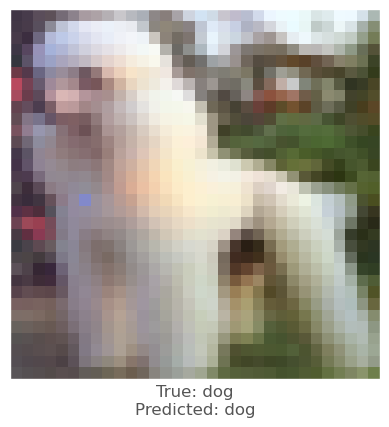



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.6278673702204367 0.9866408555987546 3.2041822574954306
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.5129776
row index :  0
16th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


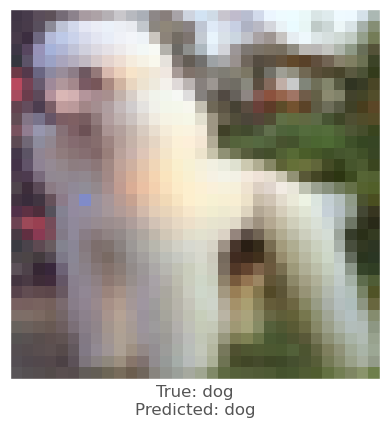



0.00080162287
0.00086581707
-0.0016325712
vr, vg, vb :   1.894938957761245 -0.642616862873522 1.3516775757030652
beam_perturbed_confidence temp :  0.6764825
beam_perturbed_confidence temp :  0.6767894
beam_perturbed_confidence temp :  0.6755022
beam_perturbed_confidence temp :  0.6759316
beam_perturbed_confidence temp :  0.6776084
beam_perturbed_confidence temp :  0.67481697
beam_perturbed_confidence temp :  0.6750599
row index :  5
16th round's confidence : 3th 0.67481697
predicted class :  dog
predicted class's confidence :  0.67481697
Lopt is :  18


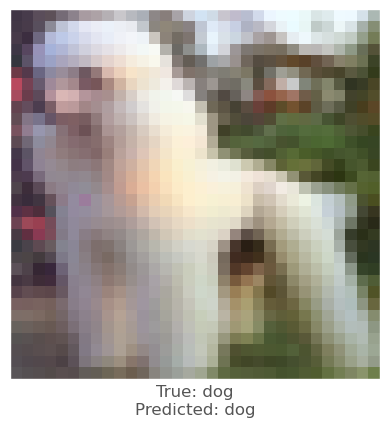



0.011168063
0.012224793
0.0029904246
vr, vg, vb :   -4.596431610162755 -3.620984577220234 2.0847750720688336
beam_perturbed_confidence temp :  0.5831755
beam_perturbed_confidence temp :  0.575518
beam_perturbed_confidence temp :  0.5669235
beam_perturbed_confidence temp :  0.62600917
beam_perturbed_confidence temp :  0.57169724
beam_perturbed_confidence temp :  0.5623243
beam_perturbed_confidence temp :  0.6103097
row index :  5
16th round's confidence : 4th 0.5623243
predicted class :  dog
predicted class's confidence :  0.5623243
Lopt is :  23


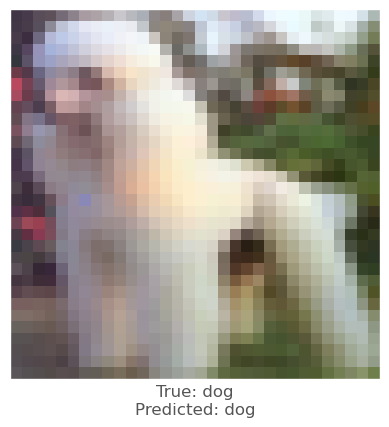



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   -0.49418071042916 0.23072306594280628 2.6112303301377846
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.51217854
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.51217854
row index :  1
17th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


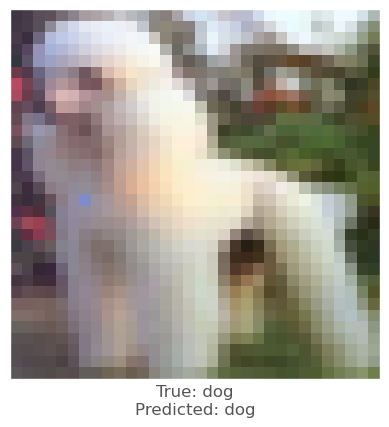



0.0055239797
0.004470706
0.0053528547
vr, vg, vb :   -1.2670401888104994 0.2273349492791974 4.012827932480781
beam_perturbed_confidence temp :  0.5138465
beam_perturbed_confidence temp :  0.50906324
beam_perturbed_confidence temp :  0.5252415
beam_perturbed_confidence temp :  0.5138465
beam_perturbed_confidence temp :  0.5197983
beam_perturbed_confidence temp :  0.5252415
beam_perturbed_confidence temp :  0.5197983
row index :  1
17th round's confidence : 1th 0.50906324
predicted class :  dog
predicted class's confidence :  0.50906324
Lopt is :  43


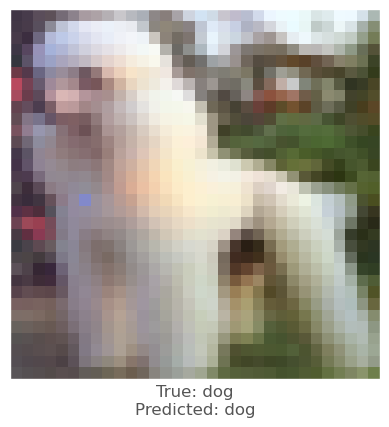



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.9360241794935591 1.162956838245666 2.947833064414955
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.5137087
beam_perturbed_confidence temp :  0.5137087
row index :  0
17th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


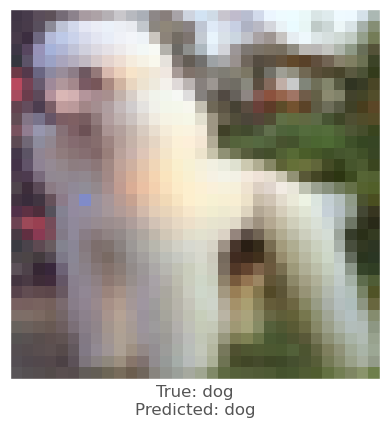



-0.0001680255
-0.0007939935
-0.003164649
vr, vg, vb :   1.722247611347303 -0.498955829280872 1.5329747191032177
beam_perturbed_confidence temp :  0.6750599
beam_perturbed_confidence temp :  0.6762962
beam_perturbed_confidence temp :  0.67362475
beam_perturbed_confidence temp :  0.67534006
beam_perturbed_confidence temp :  0.6754056
beam_perturbed_confidence temp :  0.6739709
beam_perturbed_confidence temp :  0.673912
row index :  2
17th round's confidence : 3th 0.67362475
predicted class :  dog
predicted class's confidence :  0.67362475
Lopt is :  18


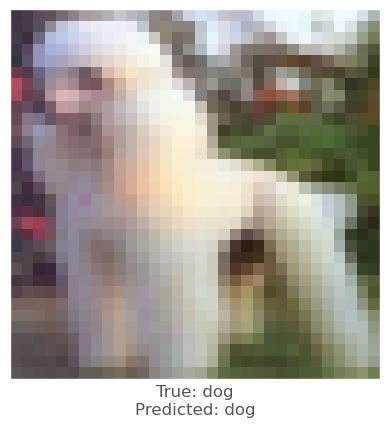



-0.013429403
-0.013871014
-0.011258662
vr, vg, vb :   -2.793848118641108 -1.8717847076787524 3.002163739559826
beam_perturbed_confidence temp :  0.5864561
beam_perturbed_confidence temp :  0.5799866
beam_perturbed_confidence temp :  0.551349
beam_perturbed_confidence temp :  0.60979664
beam_perturbed_confidence temp :  0.5670013
beam_perturbed_confidence temp :  0.56042653
beam_perturbed_confidence temp :  0.58536476
row index :  2
17th round's confidence : 4th 0.551349
predicted class :  dog
predicted class's confidence :  0.551349
Lopt is :  26


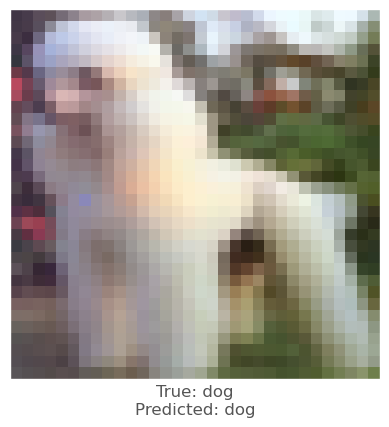



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   -0.3035473149843885 0.17087469352210966 2.110276087941267
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.51217854
beam_perturbed_confidence temp :  0.5129776
beam_perturbed_confidence temp :  0.51217854
row index :  1
18th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


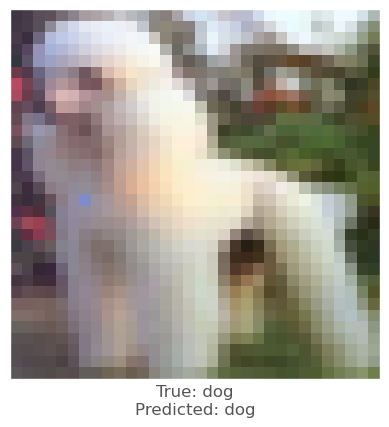



0.0055239797
0.004470706
0.0053528547
vr, vg, vb :   -1.6927341363143371 -0.24246914425101726 3.07625966636283
beam_perturbed_confidence temp :  0.5138465
beam_perturbed_confidence temp :  0.50900865
beam_perturbed_confidence temp :  0.5197848
beam_perturbed_confidence temp :  0.5211372
beam_perturbed_confidence temp :  0.51624507
beam_perturbed_confidence temp :  0.51630956
beam_perturbed_confidence temp :  0.5188481
row index :  1
18th round's confidence : 1th 0.50900865
predicted class :  dog
predicted class's confidence :  0.50900865
Lopt is :  43


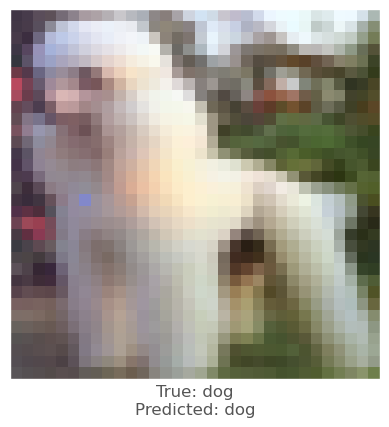



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.2133653078393691 1.3216412226278866 2.7171187906425267
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.51200944
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.5137087
beam_perturbed_confidence temp :  0.5212808
row index :  0
18th round's confidence : 2th 0.50756884
predicted class :  dog
predicted class's confidence :  0.50756884
Lopt is :  41


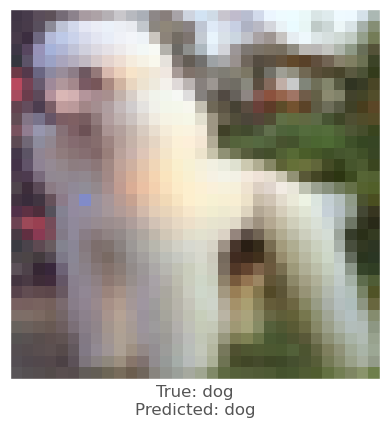



0.0024875402
0.0025458336
-0.00079256296
vr, vg, vb :   1.3012688257069576 -0.7036436051174333 1.4589335433507329
beam_perturbed_confidence temp :  0.6754056
beam_perturbed_confidence temp :  0.6739709
beam_perturbed_confidence temp :  0.6740244
beam_perturbed_confidence temp :  0.673912
beam_perturbed_confidence temp :  0.6767583
beam_perturbed_confidence temp :  0.6727821
beam_perturbed_confidence temp :  0.67356884
row index :  5
18th round's confidence : 3th 0.6727821
predicted class :  dog
predicted class's confidence :  0.6727821
Lopt is :  19


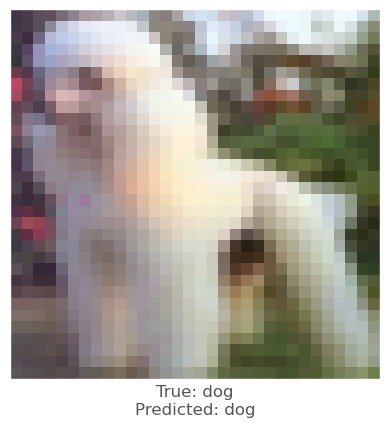



-8.380413e-05
0.0013428926
-0.0033869743
vr, vg, vb :   -2.5060828937215773 -1.8188955015898323 3.0406447990755234
beam_perturbed_confidence temp :  0.5670013
beam_perturbed_confidence temp :  0.56042653
beam_perturbed_confidence temp :  0.5463409
beam_perturbed_confidence temp :  0.58536476
beam_perturbed_confidence temp :  0.5465885
beam_perturbed_confidence temp :  0.5431865
beam_perturbed_confidence temp :  0.5621819
row index :  5
18th round's confidence : 4th 0.5431865
predicted class :  dog
predicted class's confidence :  0.5431865
Lopt is :  29


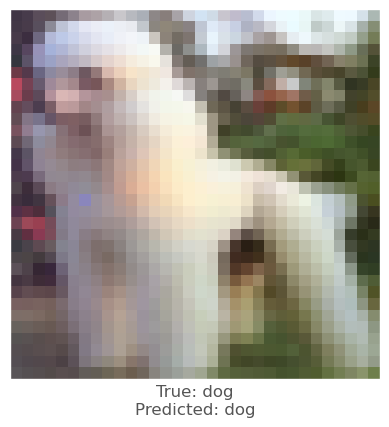



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   -0.1319772590840942 0.11701115834348269 1.659417269964401
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.510783
beam_perturbed_confidence temp :  0.51090264
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.51090264
row index :  1
19th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


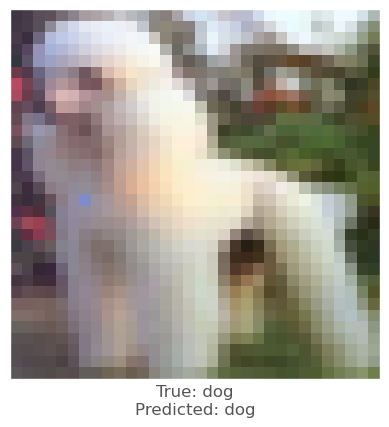



-0.0022047162
-0.003964603
0.0013110638
vr, vg, vb :   -1.302989102123211 0.1782380648975952 2.637527323078598
beam_perturbed_confidence temp :  0.5211372
beam_perturbed_confidence temp :  0.50900865
beam_perturbed_confidence temp :  0.512851
beam_perturbed_confidence temp :  0.5211372
beam_perturbed_confidence temp :  0.5190217
beam_perturbed_confidence temp :  0.512851
beam_perturbed_confidence temp :  0.5190217
row index :  1
19th round's confidence : 1th 0.50900865
predicted class :  dog
predicted class's confidence :  0.50900865
Lopt is :  43


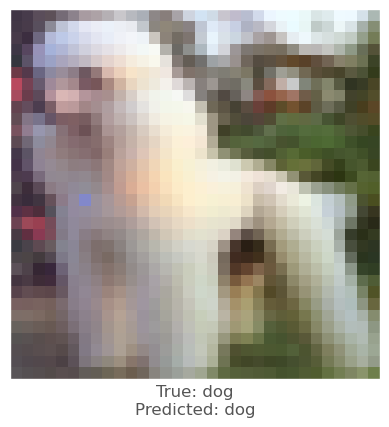



0.0055943727
0.004956007
0.0021267533
vr, vg, vb :   0.5325915021225709 0.6938763999866799 2.2327315785552027
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.5129615
row index :  0
19th round's confidence : 2th 0.50756884
predicted class :  dog
predicted class's confidence :  0.50756884
Lopt is :  41


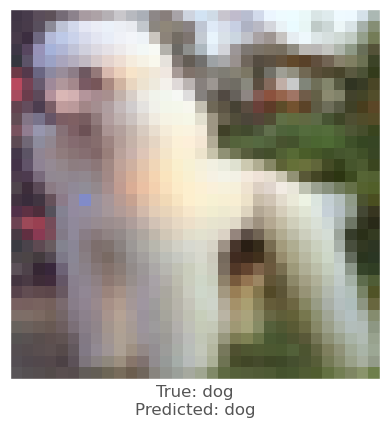



0.0008212328
0.0006825328
-0.0016513467
vr, vg, vb :   1.0890186635647285 -0.7015325233379898 1.4781748573658793
beam_perturbed_confidence temp :  0.67356884
beam_perturbed_confidence temp :  0.6733419
beam_perturbed_confidence temp :  0.67231953
beam_perturbed_confidence temp :  0.6730507
beam_perturbed_confidence temp :  0.67445636
beam_perturbed_confidence temp :  0.67186654
beam_perturbed_confidence temp :  0.6722236
row index :  5
19th round's confidence : 3th 0.67186654
predicted class :  dog
predicted class's confidence :  0.67186654
Lopt is :  20


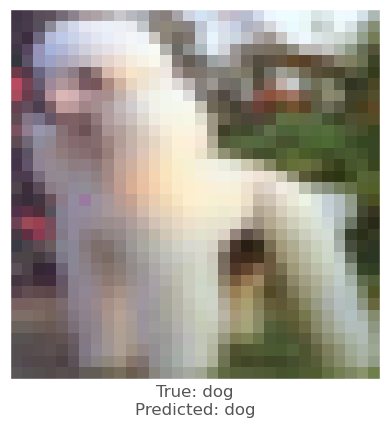



-0.004095733
-0.005340576
-0.008102536
vr, vg, vb :   -1.8459012877753231 -1.102948334243349 3.5468339393156763
beam_perturbed_confidence temp :  0.55609316
beam_perturbed_confidence temp :  0.55801153
beam_perturbed_confidence temp :  0.5356998
beam_perturbed_confidence temp :  0.57387275
beam_perturbed_confidence temp :  0.5345383
beam_perturbed_confidence temp :  0.53681874
beam_perturbed_confidence temp :  0.5515542
row index :  4
19th round's confidence : 4th 0.5345383
predicted class :  dog
predicted class's confidence :  0.5345383
Lopt is :  32


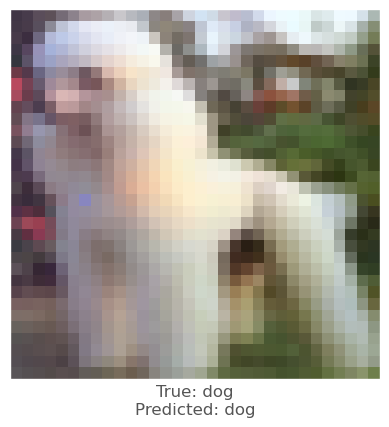



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   0.02243579122617069 0.0685339766827184 1.2536443337852217
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.5091029
row index :  0
20th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


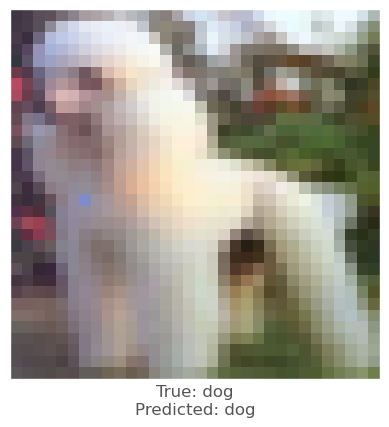



-0.0022047162
-0.003964603
0.0013110638
vr, vg, vb :   -0.9522185713511975 0.5568745531313464 2.242668214122789
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.50900865
beam_perturbed_confidence temp :  0.512851
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.513371
beam_perturbed_confidence temp :  0.512851
beam_perturbed_confidence temp :  0.513371
row index :  1
20th round's confidence : 1th 0.50900865
predicted class :  dog
predicted class's confidence :  0.50900865
Lopt is :  43


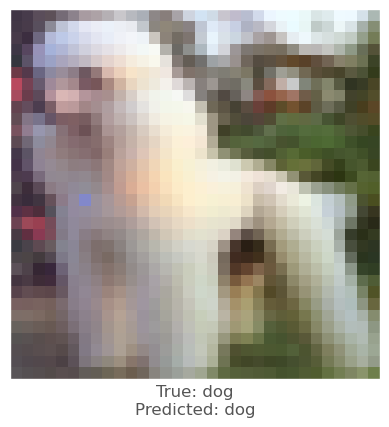



0.0055943727
0.004956007
0.0021267533
vr, vg, vb :   -0.08010492302254751 0.12888805960959404 1.7967830876766113
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
row index :  0
20th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


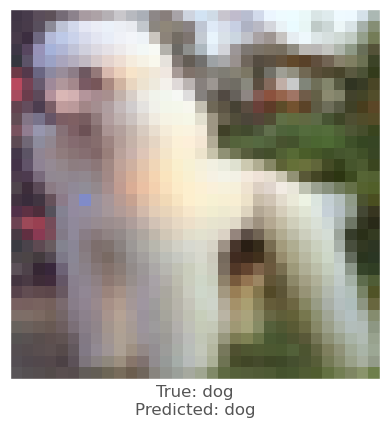



-8.98242e-05
-0.00014144182
-0.002229154
vr, vg, vb :   0.9890992171759071 -0.6172350887989906 1.5532727826247748
beam_perturbed_confidence temp :  0.67186654
beam_perturbed_confidence temp :  0.672461
beam_perturbed_confidence temp :  0.6711127
beam_perturbed_confidence temp :  0.672461
beam_perturbed_confidence temp :  0.6711127
beam_perturbed_confidence temp :  0.6710835
beam_perturbed_confidence temp :  0.6710835
row index :  5
20th round's confidence : 3th 0.6710835
predicted class :  dog
predicted class's confidence :  0.6710835
Lopt is :  21


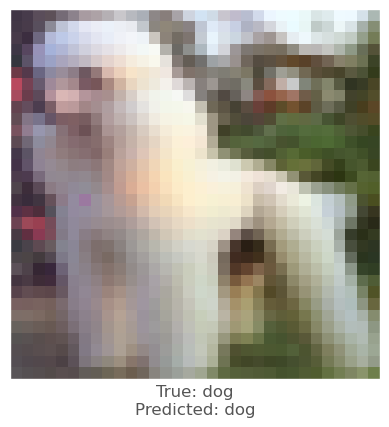



-0.008910358
-0.011706233
-0.0114405155
vr, vg, vb :   -0.7702753637859989 0.17796980164070264 4.336202097202957
beam_perturbed_confidence temp :  0.54205406
beam_perturbed_confidence temp :  0.5345383
beam_perturbed_confidence temp :  0.5215076
beam_perturbed_confidence temp :  0.54205406
beam_perturbed_confidence temp :  0.51896095
beam_perturbed_confidence temp :  0.5215076
beam_perturbed_confidence temp :  0.51896095
row index :  4
20th round's confidence : 4th 0.51896095
predicted class :  dog
predicted class's confidence :  0.51896095
Lopt is :  36


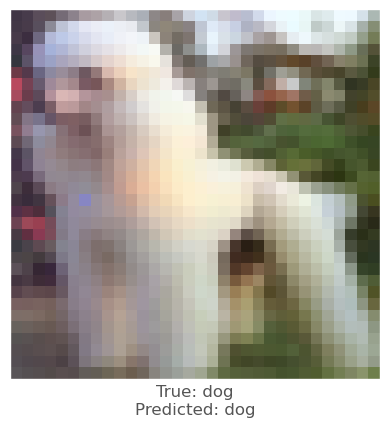



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   0.1614075365054091 0.024904513188030553 0.8884486912239602
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
row index :  0
21th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


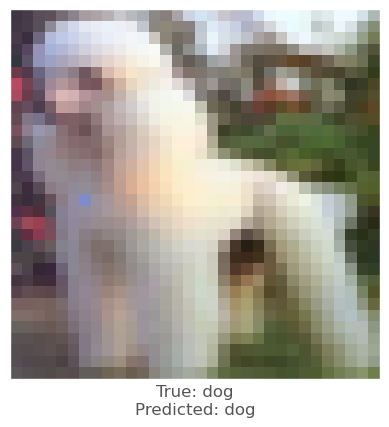



-0.0022047162
-0.003964603
0.0013110638
vr, vg, vb :   -0.6365250936563853 0.8976473925417225 1.887295016062561
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.50900865
beam_perturbed_confidence temp :  0.51017225
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.5123689
beam_perturbed_confidence temp :  0.51017225
beam_perturbed_confidence temp :  0.5123689
row index :  1
21th round's confidence : 1th 0.50900865
predicted class :  dog
predicted class's confidence :  0.50900865
Lopt is :  43


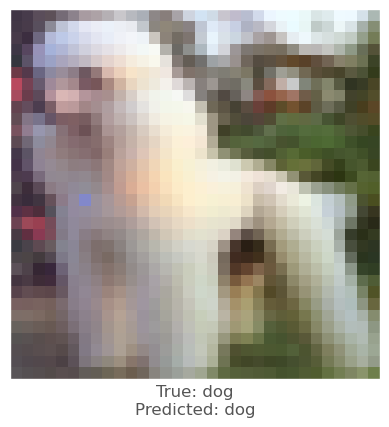



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.29884911557487326 0.3909793218554217 1.6811738115780177
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
row index :  0
21th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


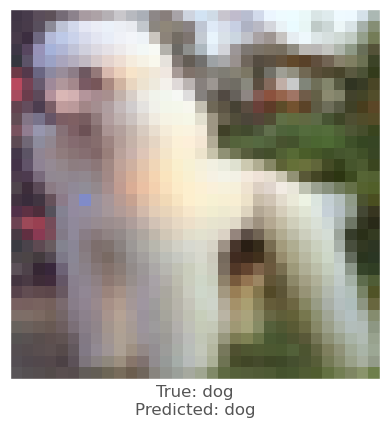



-0.00077587366
-0.00014150143
-0.0023195148
vr, vg, vb :   0.9677766615624424 -0.5413614372494138 1.6298969795057299
beam_perturbed_confidence temp :  0.6710835
beam_perturbed_confidence temp :  0.6712542
beam_perturbed_confidence temp :  0.67014146
beam_perturbed_confidence temp :  0.6712542
beam_perturbed_confidence temp :  0.67014146
beam_perturbed_confidence temp :  0.67011195
beam_perturbed_confidence temp :  0.67011195
row index :  5
21th round's confidence : 3th 0.67011195
predicted class :  dog
predicted class's confidence :  0.67011195
Lopt is :  22


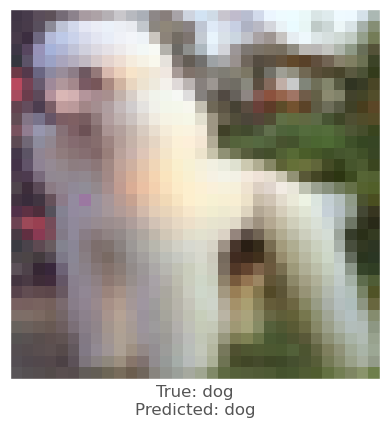



0.001473248
-0.0014275908
-0.006545961
vr, vg, vb :   -0.8405726278987321 0.30293190617817045 4.557177977799434
beam_perturbed_confidence temp :  0.5200344
beam_perturbed_confidence temp :  0.51896095
beam_perturbed_confidence temp :  0.5168648
beam_perturbed_confidence temp :  0.5200344
beam_perturbed_confidence temp :  0.51173186
beam_perturbed_confidence temp :  0.5168648
beam_perturbed_confidence temp :  0.51173186
row index :  4
21th round's confidence : 4th 0.51173186
predicted class :  dog
predicted class's confidence :  0.51173186
Lopt is :  40


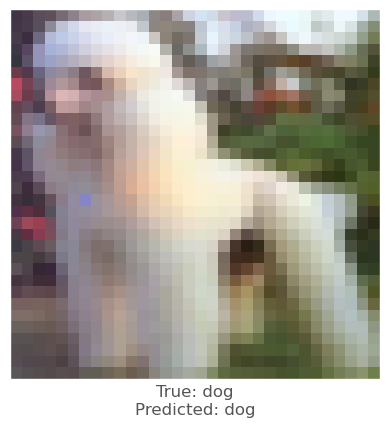



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   0.28648210725672363 -0.014362003957188518 0.559772612918825
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5094468
row index :  0
22th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


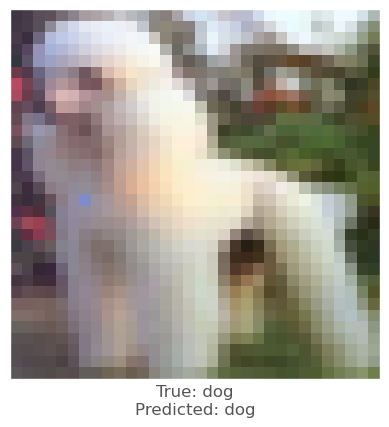



-0.0022047162
-0.003964603
0.0013110638
vr, vg, vb :   -0.35240096373105445 1.204342948011061 1.5674591378083558
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.50906324
beam_perturbed_confidence temp :  0.51017225
beam_perturbed_confidence temp :  0.50894195
beam_perturbed_confidence temp :  0.5123689
beam_perturbed_confidence temp :  0.5127159
beam_perturbed_confidence temp :  0.509784
row index :  3
22th round's confidence : 1th 0.50894195
predicted class :  dog
predicted class's confidence :  0.50894195
Lopt is :  43


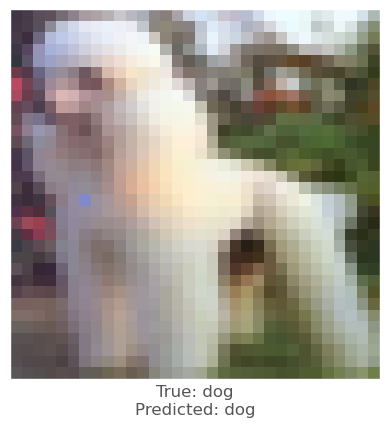



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.639907750312552 0.6268614578766667 1.5771254630892833
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
row index :  0
22th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


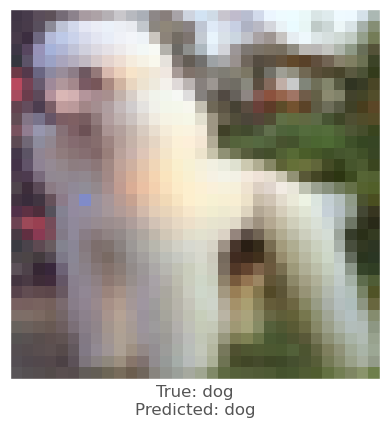



-0.0024339557
-0.001233995
-0.0014060736
vr, vg, vb :   1.1143945623465057 -0.3638257974459812 1.6075146385803034
beam_perturbed_confidence temp :  0.6706569
beam_perturbed_confidence temp :  0.67137545
beam_perturbed_confidence temp :  0.66984814
beam_perturbed_confidence temp :  0.67044514
beam_perturbed_confidence temp :  0.66981727
beam_perturbed_confidence temp :  0.6693514
beam_perturbed_confidence temp :  0.6698565
row index :  5
22th round's confidence : 3th 0.6693514
predicted class :  dog
predicted class's confidence :  0.6693514
Lopt is :  23


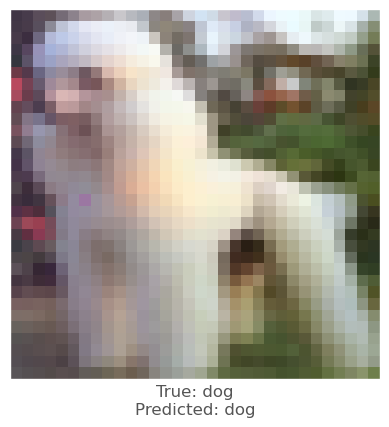



0.006299138
0.002254188
0.0013772249
vr, vg, vb :   -1.3864291720241422 0.0472199094843036 3.9637376878014727
beam_perturbed_confidence temp :  0.51344275
beam_perturbed_confidence temp :  0.51173186
beam_perturbed_confidence temp :  0.5166578
beam_perturbed_confidence temp :  0.51344275
beam_perturbed_confidence temp :  0.51161075
beam_perturbed_confidence temp :  0.5166578
beam_perturbed_confidence temp :  0.51161075
row index :  4
22th round's confidence : 4th 0.51161075
predicted class :  dog
predicted class's confidence :  0.51161075
Lopt is :  43


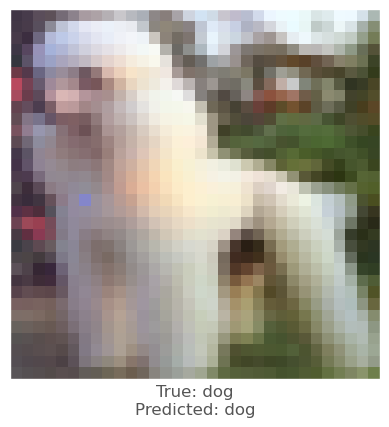



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   0.39904922093290673 -0.04970186938788568 0.2639641424442032
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5094468
row index :  0
23th round's confidence : 0th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


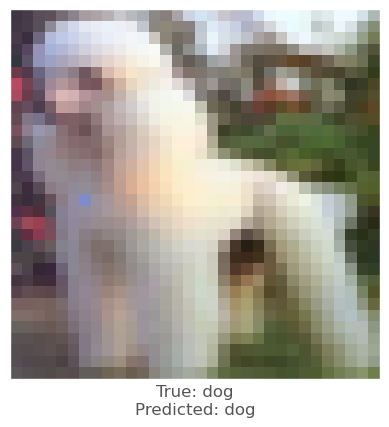



-0.0047832727
-0.0043995976
0.0010243654
vr, vg, vb :   0.16116640696456075 1.5238684176905457 1.3082766815165339
beam_perturbed_confidence temp :  0.50894195
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.509784
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.509784
beam_perturbed_confidence temp :  0.51214707
beam_perturbed_confidence temp :  0.51214707
row index :  1
23th round's confidence : 1th 0.5086513
predicted class :  dog
predicted class's confidence :  0.5086513
Lopt is :  43


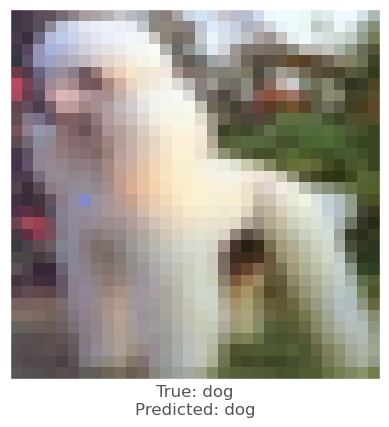



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.9468605215764628 0.8391553802957872 1.4834819494494222
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
row index :  0
23th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


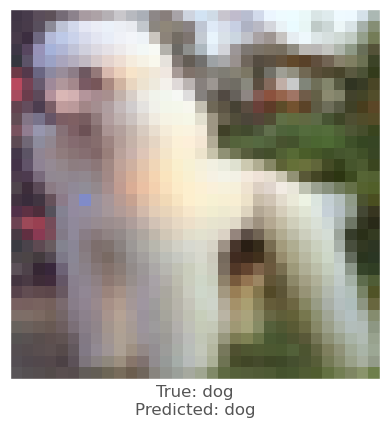



-0.004604399
-0.0025153756
-0.0021302104
vr, vg, vb :   1.4633950265372702 -0.0759056562847571 1.6597842146850417
beam_perturbed_confidence temp :  0.6698565
beam_perturbed_confidence temp :  0.6723635
beam_perturbed_confidence temp :  0.66924524
beam_perturbed_confidence temp :  0.66959226
beam_perturbed_confidence temp :  0.66893584
beam_perturbed_confidence temp :  0.6705411
beam_perturbed_confidence temp :  0.6688267
row index :  6
23th round's confidence : 3th 0.6688267
predicted class :  dog
predicted class's confidence :  0.6688267
Lopt is :  24


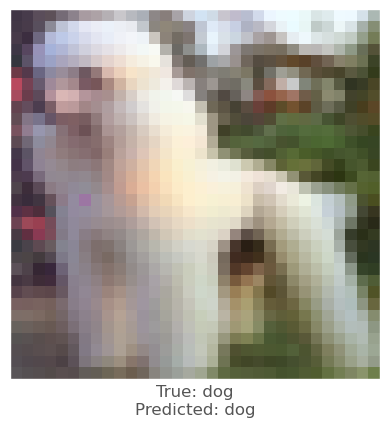



-0.0012254715
-0.0031344295
0.001271069
vr, vg, vb :   -1.1252391051635249 0.35594086401621994 3.440257014037805
beam_perturbed_confidence temp :  0.5200837
beam_perturbed_confidence temp :  0.51161075
beam_perturbed_confidence temp :  0.5170846
beam_perturbed_confidence temp :  0.5200837
beam_perturbed_confidence temp :  0.5168117
beam_perturbed_confidence temp :  0.5170846
beam_perturbed_confidence temp :  0.5168117
row index :  1
23th round's confidence : 4th 0.51161075
predicted class :  dog
predicted class's confidence :  0.51161075
Lopt is :  43


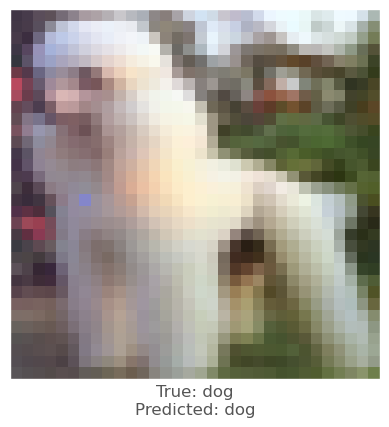



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   0.5003596232414715 -0.08150774827551313 -0.002263480982956395
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.51052123
row index :  2
24th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


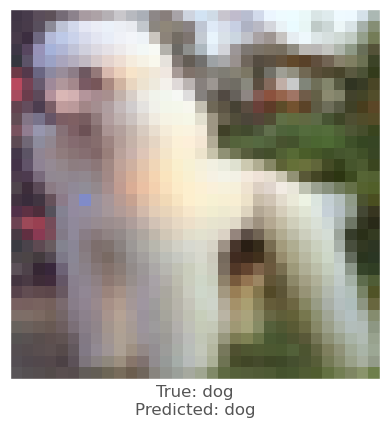



0.004037857
0.0040195584
0.005476117
vr, vg, vb :   -0.2587359392983016 0.9695257329496894 0.6298372999554567
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5094415
row index :  1
24th round's confidence : 1th 0.5086513
predicted class :  dog
predicted class's confidence :  0.5086513
Lopt is :  43


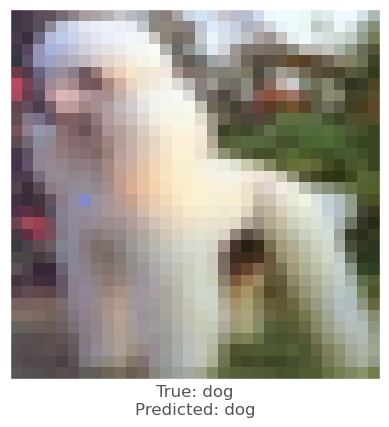



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.2231180157139825 1.0302199104729954 1.3992027871735475
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.51200944
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50981456
beam_perturbed_confidence temp :  0.5160523
row index :  2
24th round's confidence : 2th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


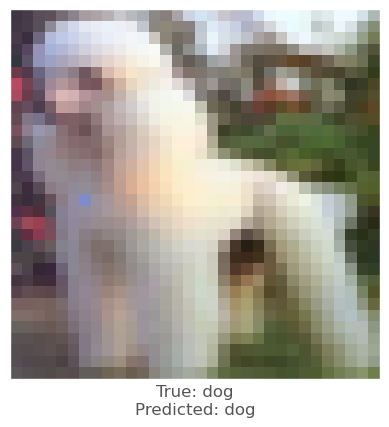



-0.0012035966
-0.0006891489
-0.0016795993
vr, vg, vb :   1.4374151830784894 0.0005997996330252553 1.6617657217291109
beam_perturbed_confidence temp :  0.6693375
beam_perturbed_confidence temp :  0.6688267
beam_perturbed_confidence temp :  0.66791266
beam_perturbed_confidence temp :  0.6693375
beam_perturbed_confidence temp :  0.6684743
beam_perturbed_confidence temp :  0.66791266
beam_perturbed_confidence temp :  0.6684743
row index :  2
24th round's confidence : 3th 0.66791266
predicted class :  dog
predicted class's confidence :  0.66791266
Lopt is :  24


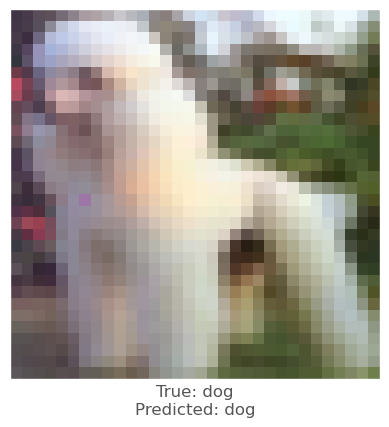



-0.0012254715
-0.0031344295
0.001271069
vr, vg, vb :   -0.8901680449889693 0.6337897230949446 2.969124407650504
beam_perturbed_confidence temp :  0.51403743
beam_perturbed_confidence temp :  0.51161075
beam_perturbed_confidence temp :  0.5143308
beam_perturbed_confidence temp :  0.51403743
beam_perturbed_confidence temp :  0.5128061
beam_perturbed_confidence temp :  0.5143308
beam_perturbed_confidence temp :  0.5128061
row index :  1
24th round's confidence : 4th 0.51161075
predicted class :  dog
predicted class's confidence :  0.51161075
Lopt is :  43


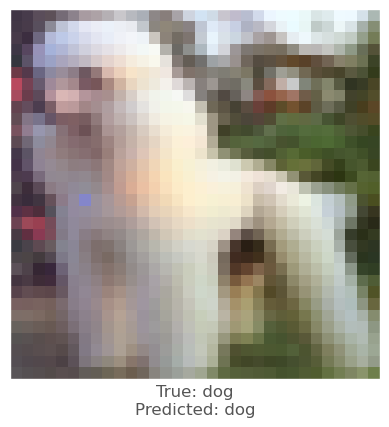



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   0.8212672072124905 0.20162309475882528 0.062031899784406624
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
row index :  0
25th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


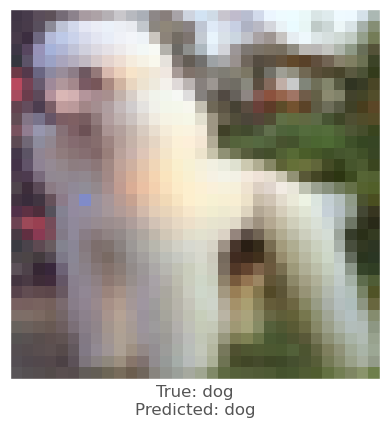



0.004037857
0.0040195584
0.005476117
vr, vg, vb :   -0.6366480509348776 0.47061731668291873 0.019241856550487157
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.5094415
row index :  1
25th round's confidence : 1th 0.5086513
predicted class :  dog
predicted class's confidence :  0.5086513
Lopt is :  43


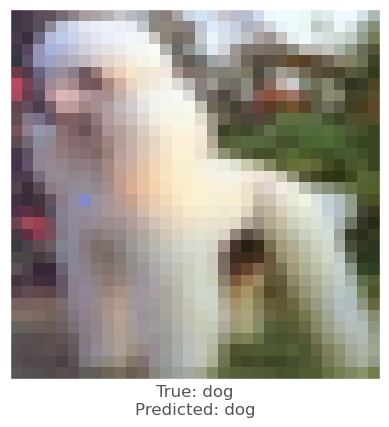



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   1.2420215385444398 0.8904218535992799 1.0194512992734535
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5129615
beam_perturbed_confidence temp :  0.5091029
beam_perturbed_confidence temp :  0.5129615
row index :  1
25th round's confidence : 2th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


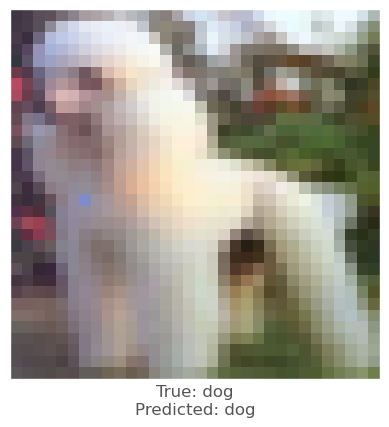



-0.000695467
0.0006984472
-0.0013030171
vr, vg, vb :   1.3632203642945662 -0.06930490307808 1.6258908634996811
beam_perturbed_confidence temp :  0.6684743
beam_perturbed_confidence temp :  0.6678806
beam_perturbed_confidence temp :  0.6675237
beam_perturbed_confidence temp :  0.66826326
beam_perturbed_confidence temp :  0.6688038
beam_perturbed_confidence temp :  0.6673093
beam_perturbed_confidence temp :  0.66769063
row index :  5
25th round's confidence : 3th 0.6673093
predicted class :  dog
predicted class's confidence :  0.6673093
Lopt is :  25


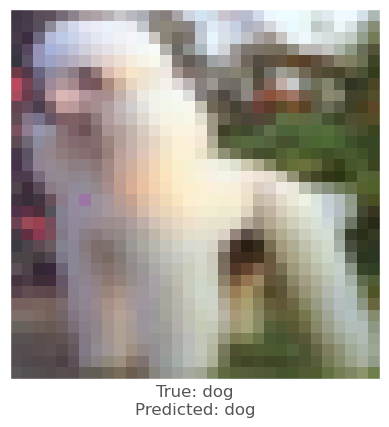



-0.0012254715
-0.0031344295
0.001271069
vr, vg, vb :   -0.6786040908318692 0.8838536962657969 2.545105061901933
beam_perturbed_confidence temp :  0.51403743
beam_perturbed_confidence temp :  0.51161075
beam_perturbed_confidence temp :  0.5143308
beam_perturbed_confidence temp :  0.51403743
beam_perturbed_confidence temp :  0.5128061
beam_perturbed_confidence temp :  0.5143308
beam_perturbed_confidence temp :  0.5128061
row index :  1
25th round's confidence : 4th 0.51161075
predicted class :  dog
predicted class's confidence :  0.51161075
Lopt is :  43


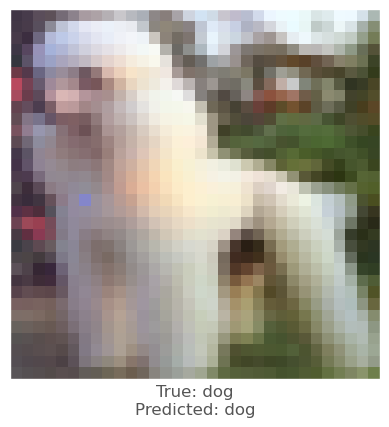



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.1100840327864074 0.45644085348972985 0.11989774247503335
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
row index :  1
26th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


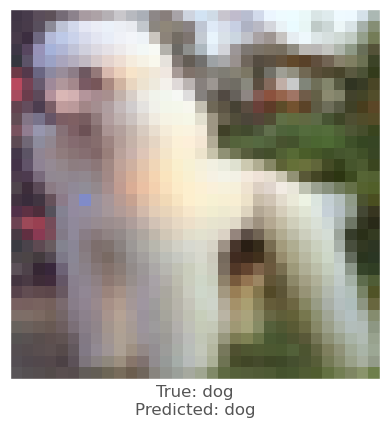



0.004037857
0.0040195584
0.005476117
vr, vg, vb :   -0.9767689514077962 0.02159974204282511 -0.5302940425139854
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.50667095
beam_perturbed_confidence temp :  0.5094415
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.50667095
beam_perturbed_confidence temp :  0.5094468
row index :  2
26th round's confidence : 1th 0.50667095
predicted class :  dog
predicted class's confidence :  0.50667095
Lopt is :  42


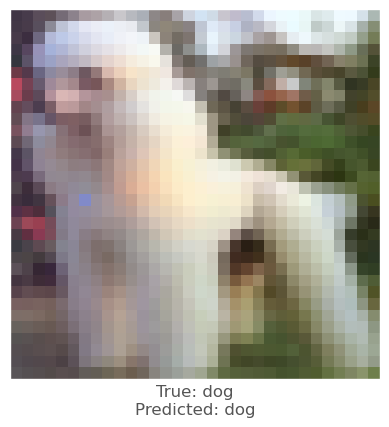



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   1.2590347090918512 0.7646036024129359 0.6776749601633689
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
row index :  1
26th round's confidence : 2th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


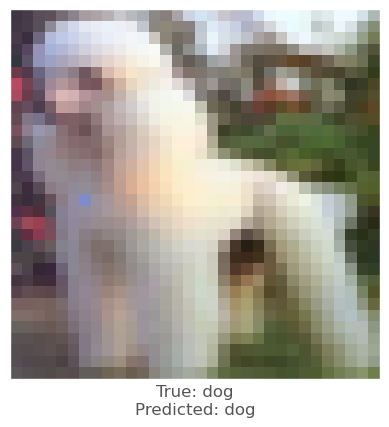



-0.0031267405
-0.0014627576
-0.00066405535
vr, vg, vb :   1.5395723734278537 0.08390134597301413 1.5297073118939757
beam_perturbed_confidence temp :  0.66769063
beam_perturbed_confidence temp :  0.6673093
beam_perturbed_confidence temp :  0.66721654
beam_perturbed_confidence temp :  0.66769063
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.66721654
beam_perturbed_confidence temp :  0.667422
row index :  2
26th round's confidence : 3th 0.66721654
predicted class :  dog
predicted class's confidence :  0.66721654
Lopt is :  25


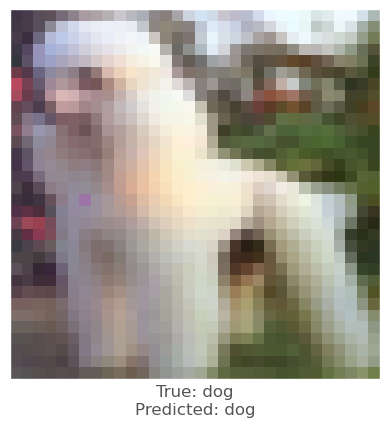



-0.0012254715
-0.0031344295
0.001271069
vr, vg, vb :   -0.4881965320904792 1.1089112721195638 2.1634876507282192
beam_perturbed_confidence temp :  0.51403743
beam_perturbed_confidence temp :  0.51194936
beam_perturbed_confidence temp :  0.5143308
beam_perturbed_confidence temp :  0.5104193
beam_perturbed_confidence temp :  0.5128061
beam_perturbed_confidence temp :  0.51797533
beam_perturbed_confidence temp :  0.5130336
row index :  3
26th round's confidence : 4th 0.5104193
predicted class :  dog
predicted class's confidence :  0.5104193
Lopt is :  43


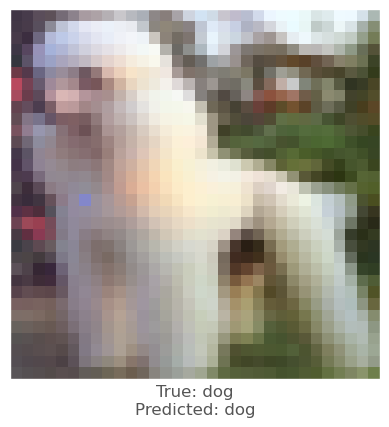



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.3700191758029328 0.685776836347544 0.1719770008965974
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
row index :  1
27th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


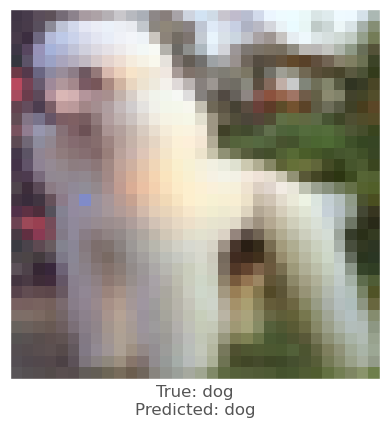



0.00022691488
0.00061124563
0.0015978813
vr, vg, vb :   -0.9017835445330078 -0.041684795378620486 -0.6370527699764541
beam_perturbed_confidence temp :  0.5094468
beam_perturbed_confidence temp :  0.5087596
beam_perturbed_confidence temp :  0.50705343
beam_perturbed_confidence temp :  0.5152369
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.50996166
beam_perturbed_confidence temp :  0.5187678
row index :  2
27th round's confidence : 1th 0.50705343
predicted class :  dog
predicted class's confidence :  0.50705343
Lopt is :  41


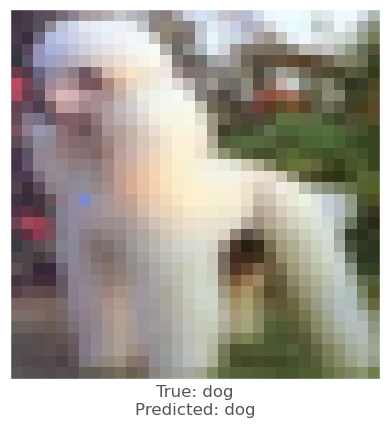



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   1.2743465625845216 0.6513671763452263 0.37007625496429275
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
row index :  1
27th round's confidence : 2th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


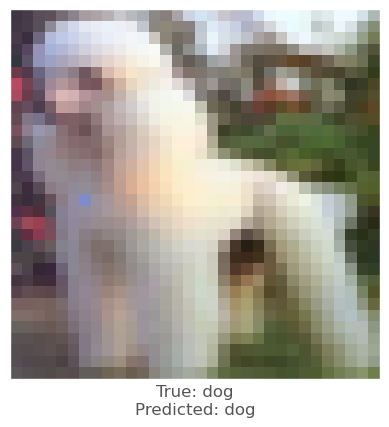



-0.0018680096
-0.00032049417
5.853176e-05
vr, vg, vb :   1.5724160928111426 0.10756062887144026 1.3708834045876348
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.66721654
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.6676003
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.6676003
row index :  1
27th round's confidence : 3th 0.66721654
predicted class :  dog
predicted class's confidence :  0.66721654
Lopt is :  25


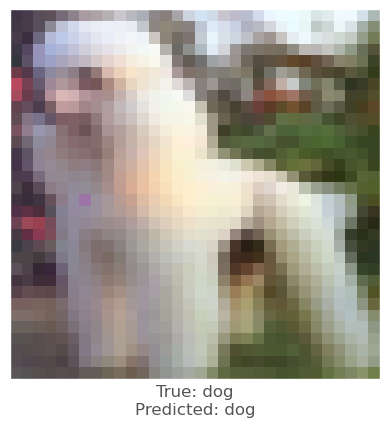



-0.0010784864
-0.0031912327
0.00052535534
vr, vg, vb :   -0.3315282346248395 1.3171434130350488 1.894603351750368
beam_perturbed_confidence temp :  0.51302785
beam_perturbed_confidence temp :  0.5108462
beam_perturbed_confidence temp :  0.51124686
beam_perturbed_confidence temp :  0.50900865
beam_perturbed_confidence temp :  0.5119486
beam_perturbed_confidence temp :  0.5130383
beam_perturbed_confidence temp :  0.51017225
row index :  3
27th round's confidence : 4th 0.50900865
predicted class :  dog
predicted class's confidence :  0.50900865
Lopt is :  43


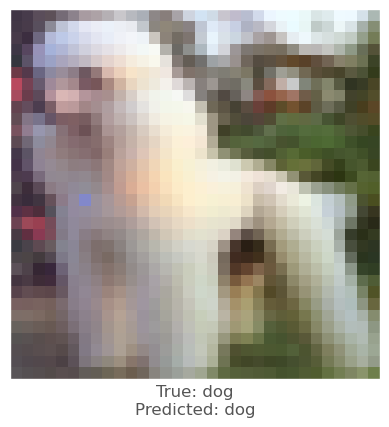



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.6039608045178055 0.8921792209195768 0.21884833347600505
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
row index :  1
28th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


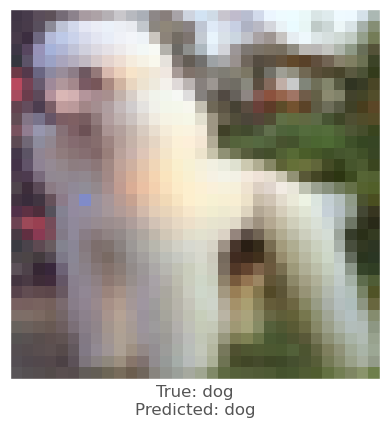



-0.0021873116
-0.0023928285
-0.0012738109
vr, vg, vb :   -0.592874025147456 0.20176653061004723 -0.4459664066293214
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.50705343
beam_perturbed_confidence temp :  0.50794476
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.5135933
beam_perturbed_confidence temp :  0.50794476
beam_perturbed_confidence temp :  0.5135933
row index :  1
28th round's confidence : 1th 0.50705343
predicted class :  dog
predicted class's confidence :  0.50705343
Lopt is :  41


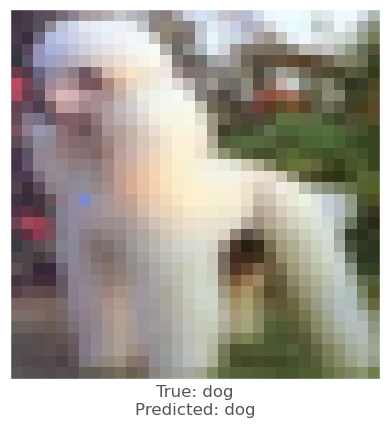



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   1.288127230727925 0.5494543928842877 0.09323742028512422
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50937086
row index :  1
28th round's confidence : 2th 0.5073368
predicted class :  dog
predicted class's confidence :  0.5073368
Lopt is :  42


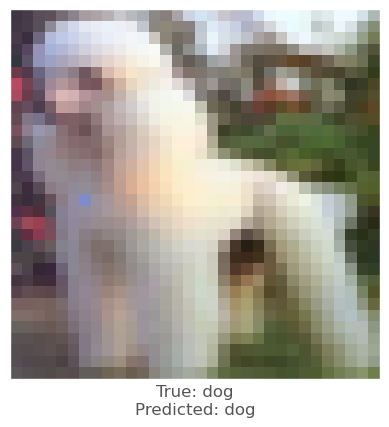



-0.0018680096
-0.00032049417
5.853176e-05
vr, vg, vb :   1.6019754402561026 0.12885398348002378 1.227941888011928
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.66721654
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.6676003
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.6676003
row index :  1
28th round's confidence : 3th 0.66721654
predicted class :  dog
predicted class's confidence :  0.66721654
Lopt is :  25


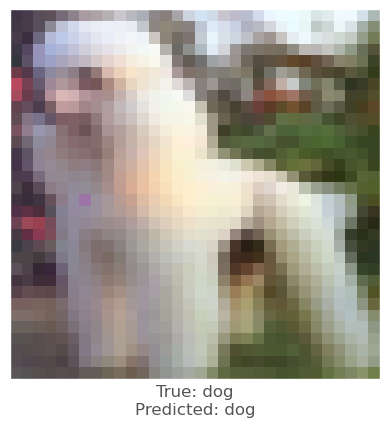



-0.0022047162
-0.003964603
0.0013110638
vr, vg, vb :   -0.07790379060266317 1.5818893664550546 1.574036639927382
beam_perturbed_confidence temp :  0.5130509
beam_perturbed_confidence temp :  0.50906324
beam_perturbed_confidence temp :  0.51017225
beam_perturbed_confidence temp :  0.50894195
beam_perturbed_confidence temp :  0.5123689
beam_perturbed_confidence temp :  0.5127159
beam_perturbed_confidence temp :  0.509784
row index :  3
28th round's confidence : 4th 0.50894195
predicted class :  dog
predicted class's confidence :  0.50894195
Lopt is :  43


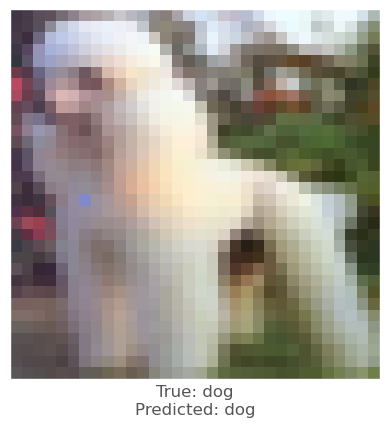



-0.0037094355
-0.0027498007
-0.0006406903
vr, vg, vb :   1.814508270361191 1.0779413670344062 0.26103253279747196
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.51200944
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50777143
beam_perturbed_confidence temp :  0.51200944
row index :  2
29th round's confidence : 0th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


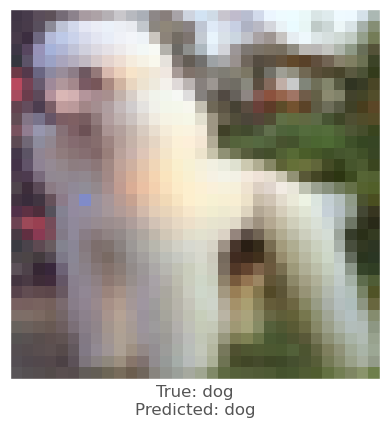



-0.0021873116
-0.0023928285
-0.0012738109
vr, vg, vb :   -0.3148554577004594 0.4208727239998482 -0.273988679616902
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.50705343
beam_perturbed_confidence temp :  0.50794476
beam_perturbed_confidence temp :  0.51052123
beam_perturbed_confidence temp :  0.5135933
beam_perturbed_confidence temp :  0.50794476
beam_perturbed_confidence temp :  0.5135933
row index :  1
29th round's confidence : 1th 0.50705343
predicted class :  dog
predicted class's confidence :  0.50705343
Lopt is :  41


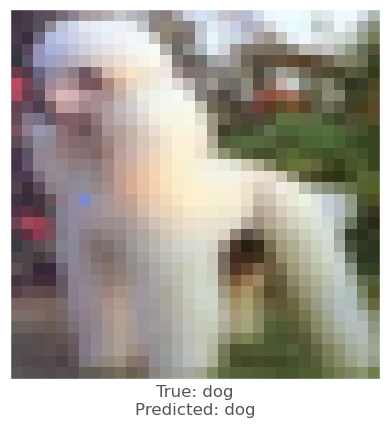



-0.0014121532
0.00036776066
0.002398312
vr, vg, vb :   1.300529832056988 0.4577328877694429 -0.15591753092612748
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.5073368
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50937086
beam_perturbed_confidence temp :  0.50756884
beam_perturbed_confidence temp :  0.50670457
beam_perturbed_confidence temp :  0.50756884
row index :  2
29th round's confidence : 2th 0.50670457
predicted class :  dog
predicted class's confidence :  0.50670457
Lopt is :  41


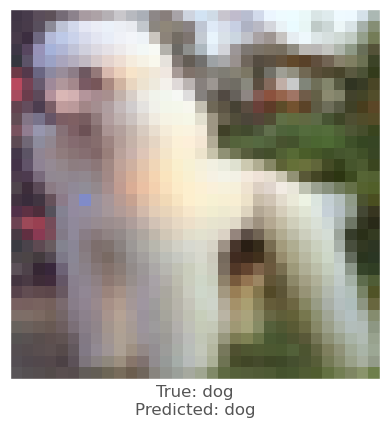



-0.0018680096
-0.00032049417
5.853176e-05
vr, vg, vb :   1.6285788529565666 0.14801800262774895 1.0992945230937918
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.66721654
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.667422
beam_perturbed_confidence temp :  0.6676003
beam_perturbed_confidence temp :  0.6673678
beam_perturbed_confidence temp :  0.6676003
row index :  1
29th round's confidence : 3th 0.66721654
predicted class :  dog
predicted class's confidence :  0.66721654
Lopt is :  25


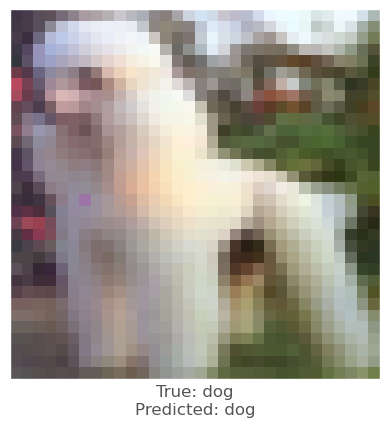



-0.0047832727
-0.0043995976
0.0010243654
vr, vg, vb :   0.4082138627801129 1.86366019429014 1.3141964334236576
beam_perturbed_confidence temp :  0.50894195
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.509784
beam_perturbed_confidence temp :  0.5086513
beam_perturbed_confidence temp :  0.509784
beam_perturbed_confidence temp :  0.51214707
beam_perturbed_confidence temp :  0.51214707
row index :  1
29th round's confidence : 4th 0.5086513
predicted class :  dog
predicted class's confidence :  0.5086513
Lopt is :  43


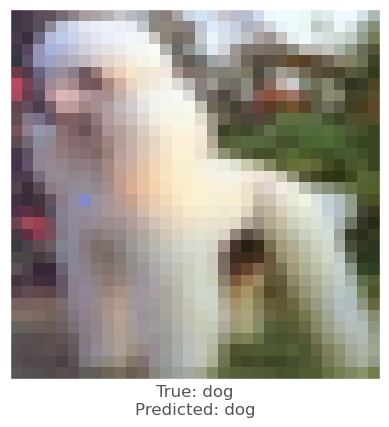






5th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  147 139 159
0.0067510605
0.012077272
0.007079065
vr, vg, vb :   -0.6751060485839844 -1.2077271938323975 -0.7079064846038818
beam_perturbed_confidence temp :  0.66501784
beam_perturbed_confidence temp :  0.6558208
beam_perturbed_confidence temp :  0.6655971
beam_perturbed_confidence temp :  0.6579076
beam_perturbed_confidence temp :  0.66090447
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65928006
row index :  1
0th round's confidence : 0th 0.6558208
predicted class :  dog
predicted class's confidence :  0.6558208
Lopt is :  2


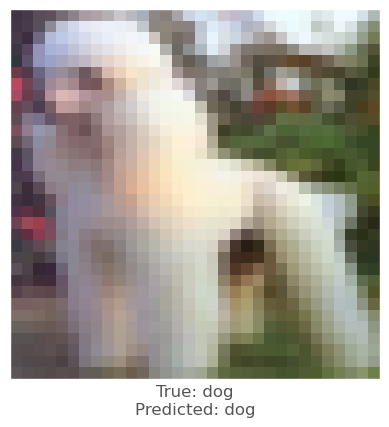



-0.013464928
-0.018808067
-0.008502543
vr, vg, vb :   1.3464927673339844 1.8808066844940186 0.8502542972564697
beam_perturbed_confidence temp :  0.70092034
beam_perturbed_confidence temp :  0.6980081
beam_perturbed_confidence temp :  0.70963144
beam_perturbed_confidence temp :  0.6901127
beam_perturbed_confidence temp :  0.70092034
beam_perturbed_confidence temp :  0.6980081
beam_perturbed_confidence temp :  0.6901127
row index :  3
0th round's confidence : 1th 0.6901127
predicted class :  dog
predicted class's confidence :  0.6901127
Lopt is :  5


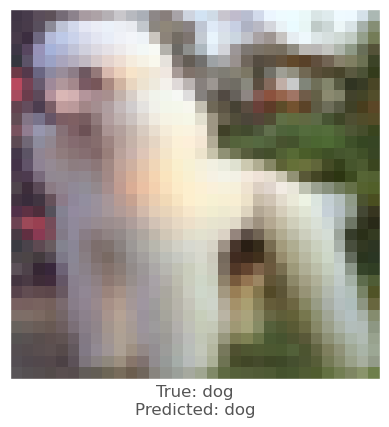



0.0034811497
0.006064415
0.0046212077
vr, vg, vb :   -0.3481149673461914 -0.6064414978027344 -0.46212077140808105
beam_perturbed_confidence temp :  0.7135494
beam_perturbed_confidence temp :  0.71172845
beam_perturbed_confidence temp :  0.7125667
beam_perturbed_confidence temp :  0.7105095
beam_perturbed_confidence temp :  0.7112382
beam_perturbed_confidence temp :  0.7089579
beam_perturbed_confidence temp :  0.7079554
row index :  6
0th round's confidence : 2th 0.7079554
predicted class :  dog
predicted class's confidence :  0.7079554
Lopt is :  4


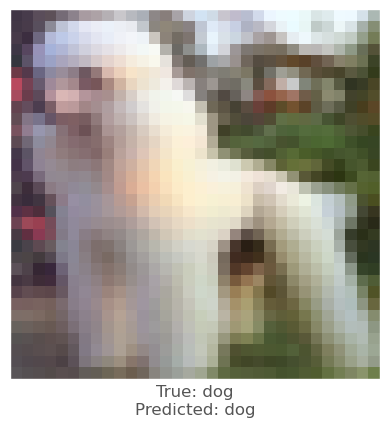



0.0064896345
0.0066763163
0.0060859323
vr, vg, vb :   -0.648963451385498 -0.6676316261291504 -0.608593225479126
beam_perturbed_confidence temp :  0.71275324
beam_perturbed_confidence temp :  0.713496
beam_perturbed_confidence temp :  0.7132883
beam_perturbed_confidence temp :  0.7105058
beam_perturbed_confidence temp :  0.7103615
beam_perturbed_confidence temp :  0.7117293
beam_perturbed_confidence temp :  0.70875853
row index :  6
0th round's confidence : 3th 0.70875853
predicted class :  dog
predicted class's confidence :  0.70875853
Lopt is :  11


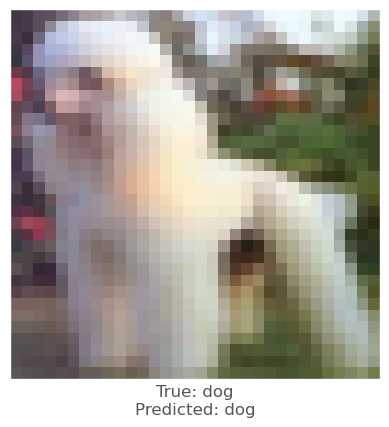



-0.0016079545
0.003117323
0.0025053024
vr, vg, vb :   0.1607954502105713 -0.31173229217529297 -0.2505302429199219
beam_perturbed_confidence temp :  0.74118716
beam_perturbed_confidence temp :  0.7395621
beam_perturbed_confidence temp :  0.7401136
beam_perturbed_confidence temp :  0.7395621
beam_perturbed_confidence temp :  0.7401136
beam_perturbed_confidence temp :  0.737573
beam_perturbed_confidence temp :  0.737573
row index :  5
0th round's confidence : 4th 0.737573
predicted class :  dog
predicted class's confidence :  0.737573
Lopt is :  10


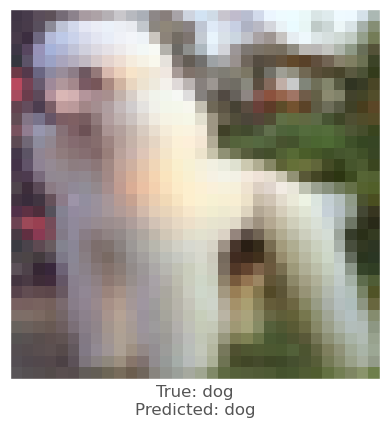



0.0016028285
0.0062232614
0.0014976263
vr, vg, vb :   -0.7678782939910889 -1.7092806100845337 -0.7868784666061401
beam_perturbed_confidence temp :  0.6579076
beam_perturbed_confidence temp :  0.65788084
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.6605127
beam_perturbed_confidence temp :  0.65928006
beam_perturbed_confidence temp :  0.6592931
beam_perturbed_confidence temp :  0.6607872
row index :  2
1th round's confidence : 0th 0.6566525
predicted class :  dog
predicted class's confidence :  0.6566525
Lopt is :  2


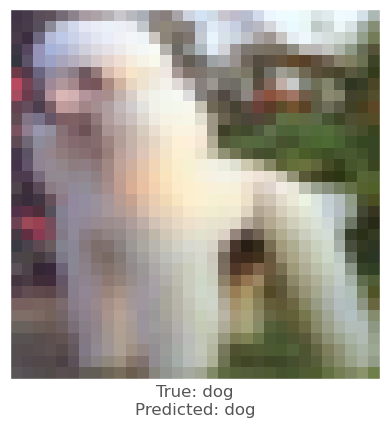



-0.014247894
-0.019323826
-0.009663284
vr, vg, vb :   2.6366329193115234 3.6251085996627808 1.7315572500228882
beam_perturbed_confidence temp :  0.6760113
beam_perturbed_confidence temp :  0.67154664
beam_perturbed_confidence temp :  0.6856041
beam_perturbed_confidence temp :  0.6626255
beam_perturbed_confidence temp :  0.67223215
beam_perturbed_confidence temp :  0.6697166
beam_perturbed_confidence temp :  0.66215307
row index :  6
1th round's confidence : 1th 0.66215307
predicted class :  dog
predicted class's confidence :  0.66215307
Lopt is :  4


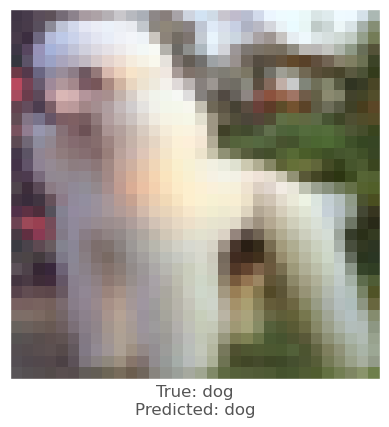



0.00072073936
0.0055773854
0.004624307
vr, vg, vb :   -0.3853774070739746 -1.1035358905792236 -0.878339409828186
beam_perturbed_confidence temp :  0.7082372
beam_perturbed_confidence temp :  0.7011015
beam_perturbed_confidence temp :  0.7058852
beam_perturbed_confidence temp :  0.699822
beam_perturbed_confidence temp :  0.70485157
beam_perturbed_confidence temp :  0.69743514
beam_perturbed_confidence temp :  0.6961088
row index :  6
1th round's confidence : 2th 0.6961088
predicted class :  dog
predicted class's confidence :  0.6961088
Lopt is :  3


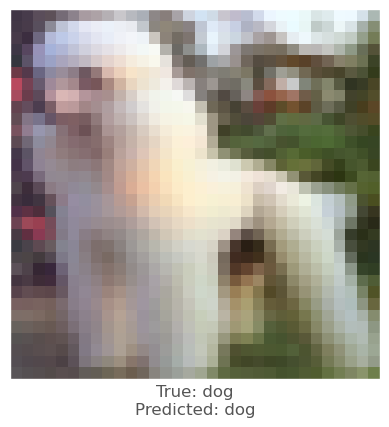



0.0055152774
0.0031930208
0.0035691261
vr, vg, vb :   -1.1355948448181152 -0.9201705455780029 -0.9046465158462524
beam_perturbed_confidence temp :  0.70618916
beam_perturbed_confidence temp :  0.70716846
beam_perturbed_confidence temp :  0.70693666
beam_perturbed_confidence temp :  0.70677686
beam_perturbed_confidence temp :  0.70514923
beam_perturbed_confidence temp :  0.70677656
beam_perturbed_confidence temp :  0.7062899
row index :  4
1th round's confidence : 3th 0.70514923
predicted class :  dog
predicted class's confidence :  0.70514923
Lopt is :  13


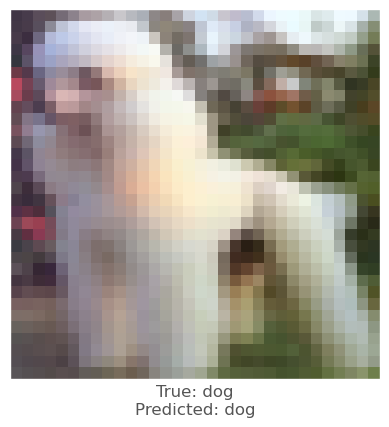



0.0013769269
0.005503297
0.0042186975
vr, vg, vb :   0.007023215293884277 -0.8308887481689453 -0.6473469734191895
beam_perturbed_confidence temp :  0.737573
beam_perturbed_confidence temp :  0.7346103
beam_perturbed_confidence temp :  0.7353434
beam_perturbed_confidence temp :  0.7346103
beam_perturbed_confidence temp :  0.7353434
beam_perturbed_confidence temp :  0.7327907
beam_perturbed_confidence temp :  0.7327907
row index :  5
1th round's confidence : 4th 0.7327907
predicted class :  dog
predicted class's confidence :  0.7327907
Lopt is :  10


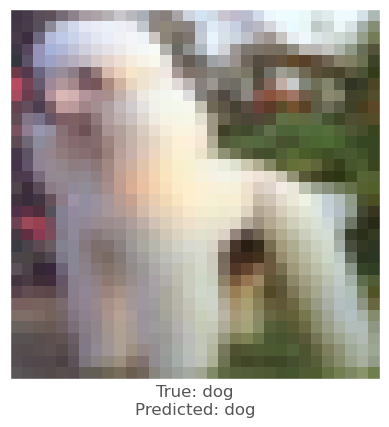



-0.0028772354
0.0005441308
-0.0014982224
vr, vg, vb :   -0.40336692333221436 -1.5927656292915344 -0.5583683848381042
beam_perturbed_confidence temp :  0.65928006
beam_perturbed_confidence temp :  0.6592931
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.6607872
beam_perturbed_confidence temp :  0.6608483
beam_perturbed_confidence temp :  0.65968174
beam_perturbed_confidence temp :  0.6617852
row index :  2
2th round's confidence : 0th 0.657319
predicted class :  dog
predicted class's confidence :  0.657319
Lopt is :  2


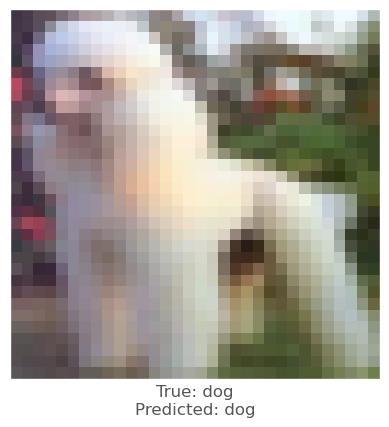



-0.0034828186
-0.0012078881
0.0003644228
vr, vg, vb :   2.7212514877319336 3.383386552333832 1.5219592452049255
beam_perturbed_confidence temp :  0.6584811
beam_perturbed_confidence temp :  0.66202265
beam_perturbed_confidence temp :  0.6629899
beam_perturbed_confidence temp :  0.6659231
beam_perturbed_confidence temp :  0.65800697
beam_perturbed_confidence temp :  0.6634518
beam_perturbed_confidence temp :  0.6691598
row index :  4
2th round's confidence : 1th 0.65800697
predicted class :  dog
predicted class's confidence :  0.65800697
Lopt is :  3


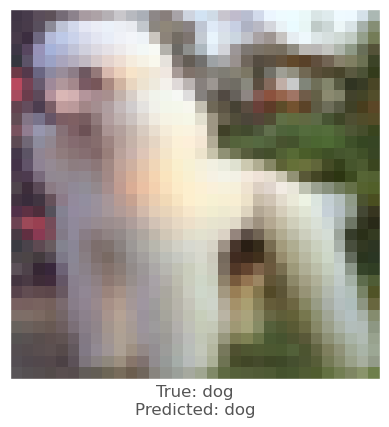



0.0025770664
0.008034766
0.0074546337
vr, vg, vb :   -0.604546308517456 -1.7966588735580444 -1.535968840122223
beam_perturbed_confidence temp :  0.6948581
beam_perturbed_confidence temp :  0.688494
beam_perturbed_confidence temp :  0.6885942
beam_perturbed_confidence temp :  0.68792635
beam_perturbed_confidence temp :  0.68855405
beam_perturbed_confidence temp :  0.68087465
beam_perturbed_confidence temp :  0.67849386
row index :  6
2th round's confidence : 2th 0.67849386
predicted class :  dog
predicted class's confidence :  0.67849386
Lopt is :  2


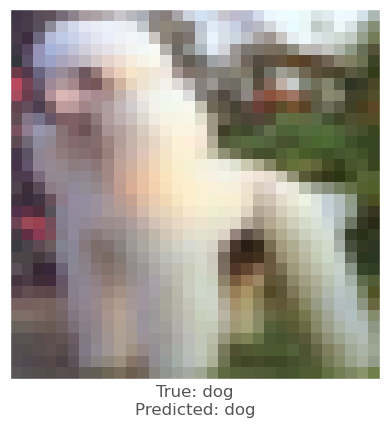



-0.0012549162
-0.0016551614
0.0012622476
vr, vg, vb :   -0.8965437412261963 -0.6626373529434204 -0.9404066205024719
beam_perturbed_confidence temp :  0.7061904
beam_perturbed_confidence temp :  0.7062899
beam_perturbed_confidence temp :  0.7049269
beam_perturbed_confidence temp :  0.7067995
beam_perturbed_confidence temp :  0.7056161
beam_perturbed_confidence temp :  0.705584
beam_perturbed_confidence temp :  0.7061058
row index :  2
2th round's confidence : 3th 0.7049269
predicted class :  dog
predicted class's confidence :  0.7049269
Lopt is :  13


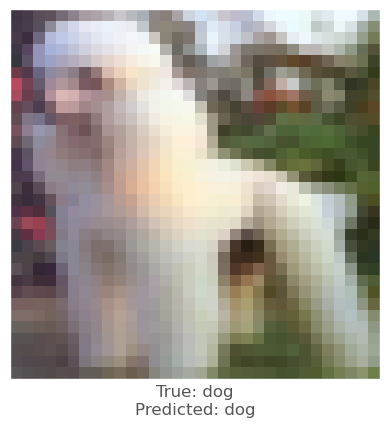



0.0013507605
0.005240679
0.0035197735
vr, vg, vb :   -0.12875515222549438 -1.2718677520751953 -0.9345896244049072
beam_perturbed_confidence temp :  0.73191214
beam_perturbed_confidence temp :  0.7283431
beam_perturbed_confidence temp :  0.73109055
beam_perturbed_confidence temp :  0.7276675
beam_perturbed_confidence temp :  0.7300409
beam_perturbed_confidence temp :  0.7265971
beam_perturbed_confidence temp :  0.72584546
row index :  6
2th round's confidence : 4th 0.72584546
predicted class :  dog
predicted class's confidence :  0.72584546
Lopt is :  9


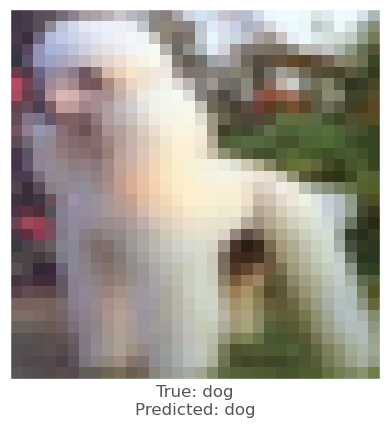



-0.005179405
-0.0016208291
-0.0023560524
vr, vg, vb :   0.15491029024124142 -1.2714061558246612 -0.2669263064861298
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65968174
beam_perturbed_confidence temp :  0.65900856
beam_perturbed_confidence temp :  0.65968174
beam_perturbed_confidence temp :  0.65900856
beam_perturbed_confidence temp :  0.6608396
beam_perturbed_confidence temp :  0.6608396
row index :  0
3th round's confidence : 0th 0.657319
predicted class :  dog
predicted class's confidence :  0.657319
Lopt is :  2


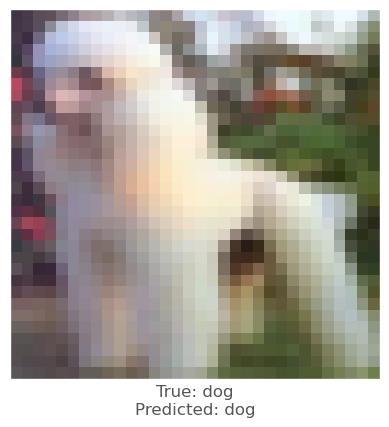



-0.0036863089
0.0003774166
-0.000999093
vr, vg, vb :   2.817757225036621 3.0073062360286715 1.4696726262569428
beam_perturbed_confidence temp :  0.65869397
beam_perturbed_confidence temp :  0.6691598
beam_perturbed_confidence temp :  0.657482
beam_perturbed_confidence temp :  0.6733177
beam_perturbed_confidence temp :  0.6625458
beam_perturbed_confidence temp :  0.67247844
beam_perturbed_confidence temp :  0.67649513
row index :  2
3th round's confidence : 1th 0.657482
predicted class :  dog
predicted class's confidence :  0.657482
Lopt is :  2


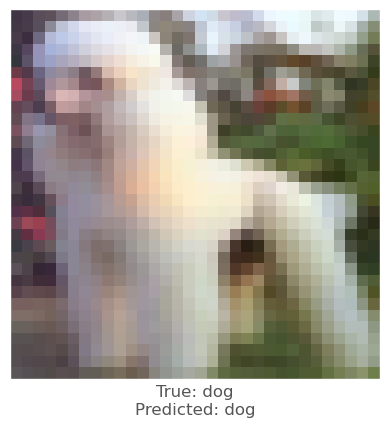



0.004916489
0.011852503
0.009821236
vr, vg, vb :   -1.03574059009552 -2.8022432684898377 -2.364495569467545
beam_perturbed_confidence temp :  0.67267615
beam_perturbed_confidence temp :  0.6605173
beam_perturbed_confidence temp :  0.66728383
beam_perturbed_confidence temp :  0.6555405
beam_perturbed_confidence temp :  0.66217667
beam_perturbed_confidence temp :  0.6531317
beam_perturbed_confidence temp :  0.65910286
row index :  5
3th round's confidence : 2th 0.6531317
predicted class :  dog
predicted class's confidence :  0.6531317
Lopt is :  3


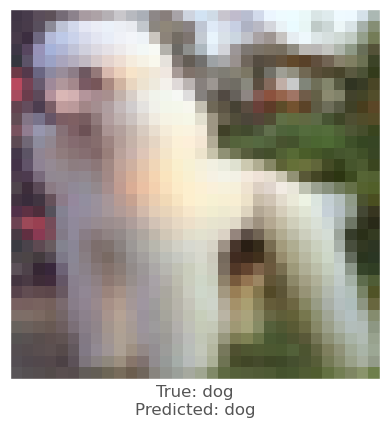



-0.000315547
-0.0019493699
0.00052011013
vr, vg, vb :   -0.7753346681594849 -0.40143662691116333 -0.8983769714832306
beam_perturbed_confidence temp :  0.7056161
beam_perturbed_confidence temp :  0.705584
beam_perturbed_confidence temp :  0.7046291
beam_perturbed_confidence temp :  0.7061058
beam_perturbed_confidence temp :  0.7047207
beam_perturbed_confidence temp :  0.7049759
beam_perturbed_confidence temp :  0.7045436
row index :  6
3th round's confidence : 3th 0.7045436
predicted class :  dog
predicted class's confidence :  0.7045436
Lopt is :  14


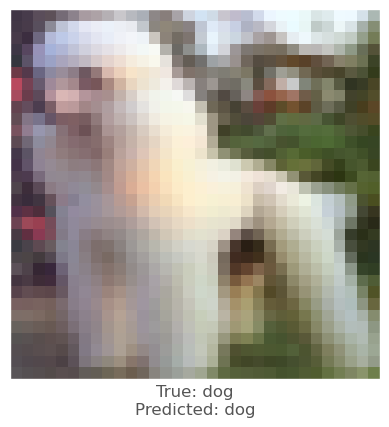



0.0018978715
0.0042417645
0.0037823915
vr, vg, vb :   -0.30566678643226625 -1.5688574314117432 -1.2193698167800904
beam_perturbed_confidence temp :  0.7246992
beam_perturbed_confidence temp :  0.72210795
beam_perturbed_confidence temp :  0.721894
beam_perturbed_confidence temp :  0.72119623
beam_perturbed_confidence temp :  0.72119546
beam_perturbed_confidence temp :  0.7178182
beam_perturbed_confidence temp :  0.7166929
row index :  6
3th round's confidence : 4th 0.7166929
predicted class :  dog
predicted class's confidence :  0.7166929
Lopt is :  8


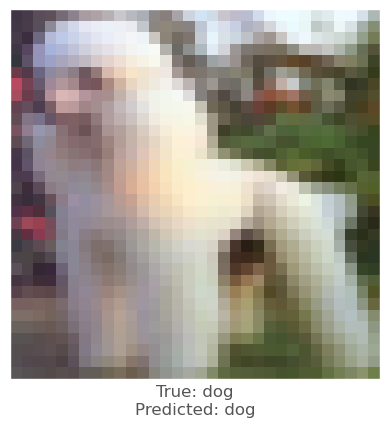



-0.005179405
-0.0016208291
-0.0023560524
vr, vg, vb :   0.6573597824573516 -0.9821826297044753 -0.004628435969352779
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.65900856
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.65900856
beam_perturbed_confidence temp :  0.6597998
beam_perturbed_confidence temp :  0.6597998
row index :  0
4th round's confidence : 0th 0.657319
predicted class :  dog
predicted class's confidence :  0.657319
Lopt is :  2


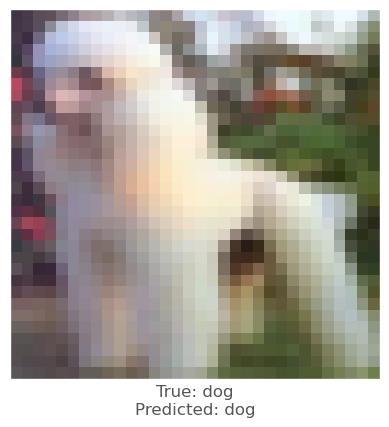



-5.030632e-05
0.0048576593
0.00028330088
vr, vg, vb :   2.5410121345520023 2.2208096784353257 1.2943752759695055
beam_perturbed_confidence temp :  0.6625458
beam_perturbed_confidence temp :  0.66756064
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.67222464
beam_perturbed_confidence temp :  0.66582686
beam_perturbed_confidence temp :  0.6709532
beam_perturbed_confidence temp :  0.67505413
row index :  2
4th round's confidence : 1th 0.65829027
predicted class :  dog
predicted class's confidence :  0.65829027
Lopt is :  1


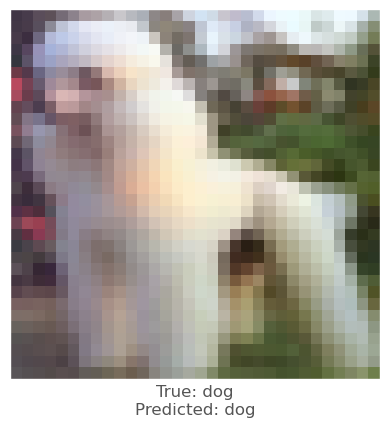



-0.0021820068
0.002643764
0.0009810328
vr, vg, vb :   -0.7139658474922181 -2.786395343542099 -2.226149297356606
beam_perturbed_confidence temp :  0.65538985
beam_perturbed_confidence temp :  0.65742403
beam_perturbed_confidence temp :  0.6559126
beam_perturbed_confidence temp :  0.6613345
beam_perturbed_confidence temp :  0.65934116
beam_perturbed_confidence temp :  0.6663712
beam_perturbed_confidence temp :  0.67105705
row index :  0
4th round's confidence : 2th 0.65538985
predicted class :  dog
predicted class's confidence :  0.65538985
Lopt is :  3


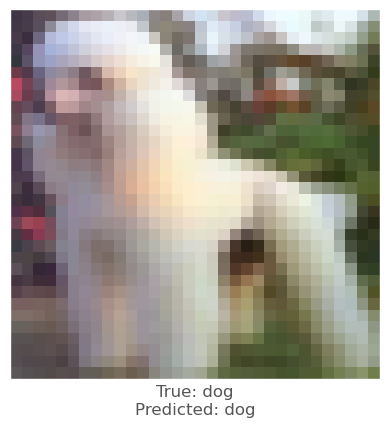



-5.966425e-05
0.00049859285
0.0030480027
vr, vg, vb :   -0.6918347764015198 -0.4111522495746613 -1.1133395463228226
beam_perturbed_confidence temp :  0.70503557
beam_perturbed_confidence temp :  0.7042221
beam_perturbed_confidence temp :  0.70215183
beam_perturbed_confidence temp :  0.70410454
beam_perturbed_confidence temp :  0.70237666
beam_perturbed_confidence temp :  0.7021022
beam_perturbed_confidence temp :  0.70226085
row index :  5
4th round's confidence : 3th 0.7021022
predicted class :  dog
predicted class's confidence :  0.7021022
Lopt is :  16


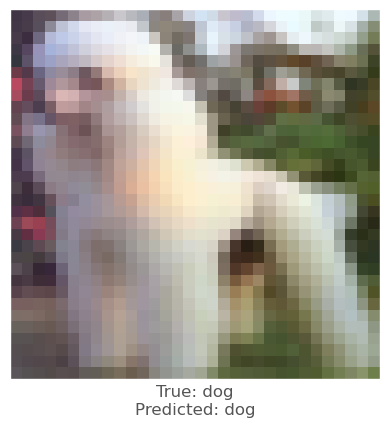



0.0024076104
0.006285131
0.0050796866
vr, vg, vb :   -0.515861149430275 -2.0404847860336304 -1.605401499271393
beam_perturbed_confidence temp :  0.7154106
beam_perturbed_confidence temp :  0.7046295
beam_perturbed_confidence temp :  0.71141034
beam_perturbed_confidence temp :  0.7029281
beam_perturbed_confidence temp :  0.7093689
beam_perturbed_confidence temp :  0.69795406
beam_perturbed_confidence temp :  0.6972415
row index :  6
4th round's confidence : 4th 0.6972415
predicted class :  dog
predicted class's confidence :  0.6972415
Lopt is :  7


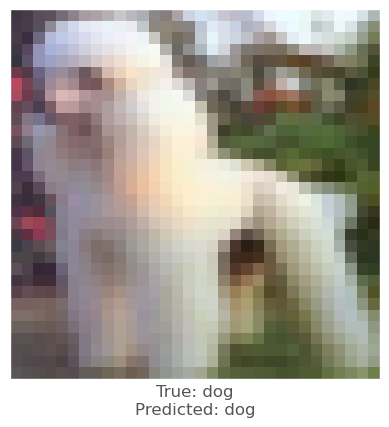



-0.005179405
-0.0016208291
-0.0023560524
vr, vg, vb :   1.1095643254518508 -0.7218814561963081 0.23143964749574655
beam_perturbed_confidence temp :  0.6556689
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65538985
beam_perturbed_confidence temp :  0.6556689
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.65538985
row index :  3
5th round's confidence : 0th 0.65538985
predicted class :  dog
predicted class's confidence :  0.65538985
Lopt is :  3


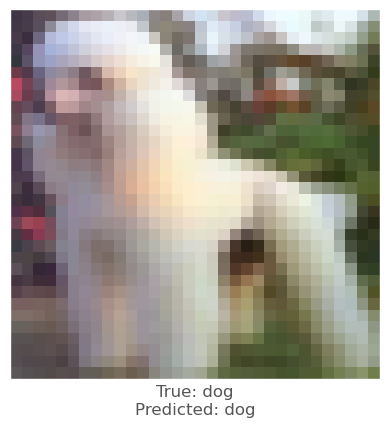



0.005827248
0.008944571
0.0050656796
vr, vg, vb :   1.7041861114501957 1.1042716087698938 0.6583697933554651
beam_perturbed_confidence temp :  0.66356885
beam_perturbed_confidence temp :  0.6655971
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.66854334
beam_perturbed_confidence temp :  0.66356885
beam_perturbed_confidence temp :  0.6655971
beam_perturbed_confidence temp :  0.66854334
row index :  2
5th round's confidence : 1th 0.65829027
predicted class :  dog
predicted class's confidence :  0.65829027
Lopt is :  1


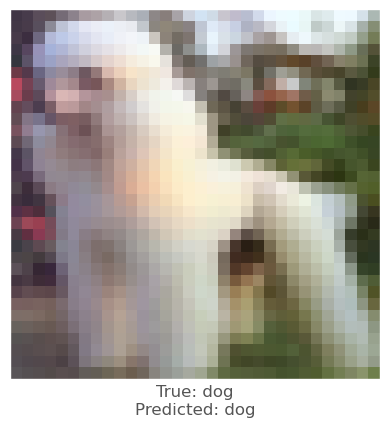



-0.0059711337
-0.0021120906
-0.0017076135
vr, vg, vb :   -0.04545589184761056 -2.2965467504262924 -1.8327730208039288
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.6613345
beam_perturbed_confidence temp :  0.6583727
beam_perturbed_confidence temp :  0.66630274
beam_perturbed_confidence temp :  0.6606149
beam_perturbed_confidence temp :  0.66812366
beam_perturbed_confidence temp :  0.6753036
row index :  2
5th round's confidence : 2th 0.6583727
predicted class :  dog
predicted class's confidence :  0.6583727
Lopt is :  4


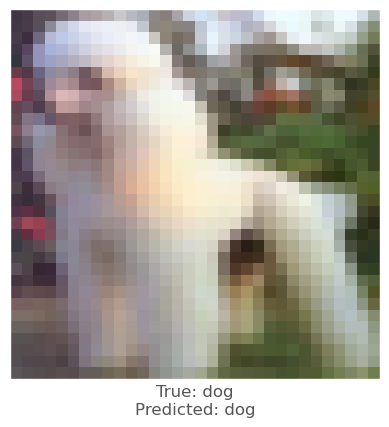



0.00011563301
-0.00044357777
0.0011565685
vr, vg, vb :   -0.6342145998477936 -0.3256792479753495 -1.1176624444127083
beam_perturbed_confidence temp :  0.70226085
beam_perturbed_confidence temp :  0.7025954
beam_perturbed_confidence temp :  0.70173705
beam_perturbed_confidence temp :  0.70334685
beam_perturbed_confidence temp :  0.7023714
beam_perturbed_confidence temp :  0.7033996
beam_perturbed_confidence temp :  0.7043111
row index :  2
5th round's confidence : 3th 0.70173705
predicted class :  dog
predicted class's confidence :  0.70173705
Lopt is :  18


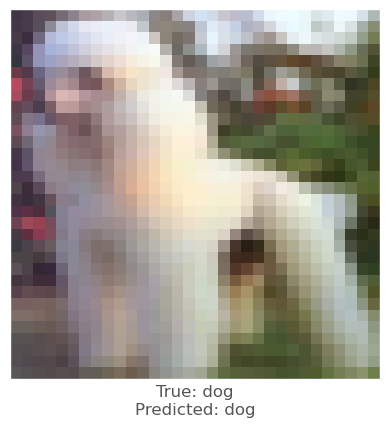



0.0023844838
0.009107947
0.0068873167
vr, vg, vb :   -0.7027234159111977 -2.7472310423851014 -2.133593019723892
beam_perturbed_confidence temp :  0.6955696
beam_perturbed_confidence temp :  0.67819864
beam_perturbed_confidence temp :  0.6848544
beam_perturbed_confidence temp :  0.6788187
beam_perturbed_confidence temp :  0.6817915
beam_perturbed_confidence temp :  0.67275107
beam_perturbed_confidence temp :  0.6718326
row index :  6
5th round's confidence : 4th 0.6718326
predicted class :  dog
predicted class's confidence :  0.6718326
Lopt is :  6


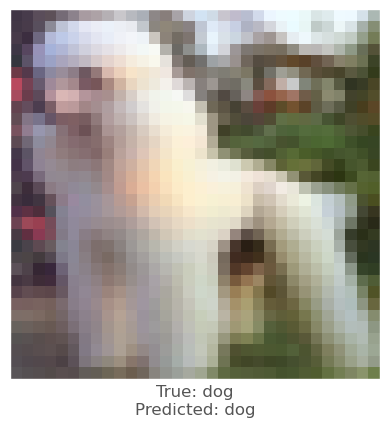



-0.0059711337
-0.0021120906
-0.0017076135
vr, vg, vb :   1.5957212638020515 -0.43848425181508055 0.37905702956318854
beam_perturbed_confidence temp :  0.6531317
beam_perturbed_confidence temp :  0.657781
beam_perturbed_confidence temp :  0.65538985
beam_perturbed_confidence temp :  0.653055
beam_perturbed_confidence temp :  0.6531317
beam_perturbed_confidence temp :  0.657781
beam_perturbed_confidence temp :  0.653055
row index :  3
6th round's confidence : 0th 0.653055
predicted class :  dog
predicted class's confidence :  0.653055
Lopt is :  4


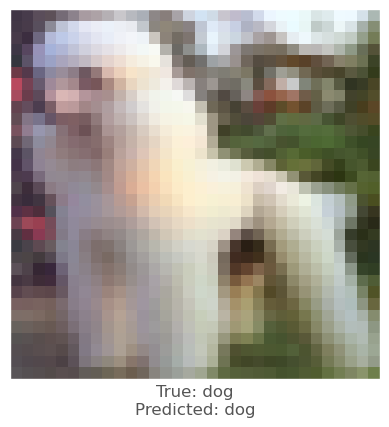



0.005827248
0.008944571
0.0050656796
vr, vg, vb :   0.9510426906585698 0.09938734607100508 0.0859648590028288
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.65829027
row index :  0
6th round's confidence : 1th 0.65829027
predicted class :  dog
predicted class's confidence :  0.65829027
Lopt is :  1


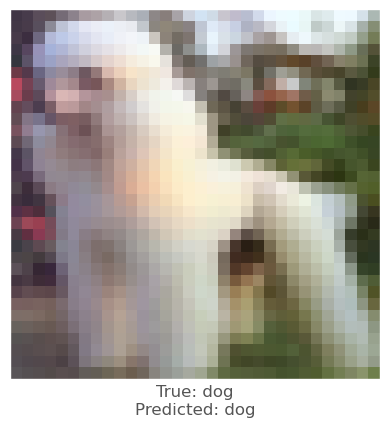



-0.005720675
-0.0033316016
-0.0024201274
vr, vg, vb :   0.5311571964979172 -1.7337319134116171 -1.4074829795420174
beam_perturbed_confidence temp :  0.6583727
beam_perturbed_confidence temp :  0.6631335
beam_perturbed_confidence temp :  0.66032016
beam_perturbed_confidence temp :  0.6631335
beam_perturbed_confidence temp :  0.66032016
beam_perturbed_confidence temp :  0.6689999
beam_perturbed_confidence temp :  0.6689999
row index :  0
6th round's confidence : 2th 0.6583727
predicted class :  dog
predicted class's confidence :  0.6583727
Lopt is :  4


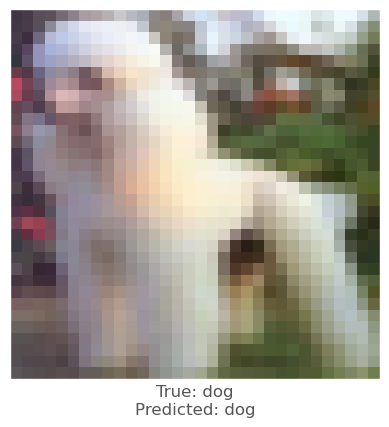



-0.0008940697
-0.0025664568
-0.0005238056
vr, vg, vb :   -0.48138617269992834 -0.03646564370393757 -0.9535156381428243
beam_perturbed_confidence temp :  0.7023714
beam_perturbed_confidence temp :  0.7033996
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.7043111
beam_perturbed_confidence temp :  0.70303696
beam_perturbed_confidence temp :  0.7043313
beam_perturbed_confidence temp :  0.70516425
row index :  2
6th round's confidence : 3th 0.70222926
predicted class :  dog
predicted class's confidence :  0.70222926
Lopt is :  19


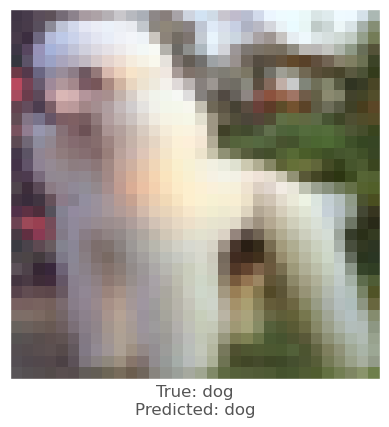



0.0027927756
0.007961392
0.0060788393
vr, vg, vb :   -0.9117286374151707 -3.268647178411484 -2.528117647957802
beam_perturbed_confidence temp :  0.6699583
beam_perturbed_confidence temp :  0.6495913
beam_perturbed_confidence temp :  0.6619638
beam_perturbed_confidence temp :  0.6487112
beam_perturbed_confidence temp :  0.6594609
beam_perturbed_confidence temp :  0.64665633
beam_perturbed_confidence temp :  0.6479695
row index :  5
6th round's confidence : 4th 0.64665633
predicted class :  dog
predicted class's confidence :  0.64665633
Lopt is :  6


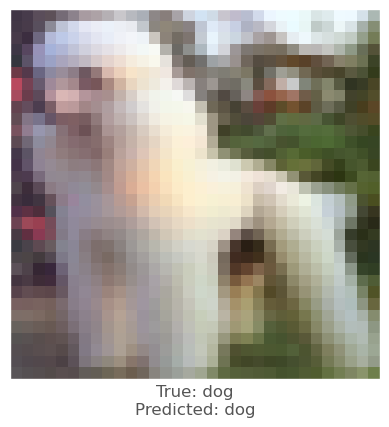



-0.007551849
-0.0028595924
-0.0037649274
vr, vg, vb :   2.1913340262615684 -0.10867658285915843 0.7176440653306246
beam_perturbed_confidence temp :  0.65082055
beam_perturbed_confidence temp :  0.6559913
beam_perturbed_confidence temp :  0.653055
beam_perturbed_confidence temp :  0.6489168
beam_perturbed_confidence temp :  0.65082055
beam_perturbed_confidence temp :  0.6559913
beam_perturbed_confidence temp :  0.6489168
row index :  3
7th round's confidence : 0th 0.6489168
predicted class :  dog
predicted class's confidence :  0.6489168
Lopt is :  5


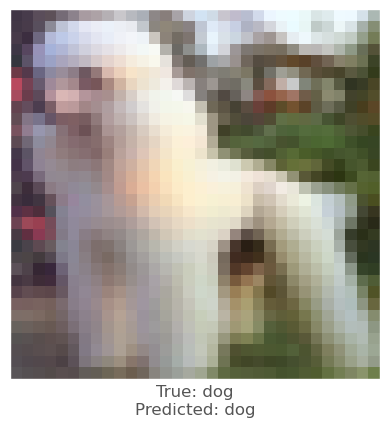



0.005827248
0.008944571
0.0050656796
vr, vg, vb :   0.2732136119461064 -0.8050084903579948 -0.42919958191454394
beam_perturbed_confidence temp :  0.65829027
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.657482
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.657482
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.657319
row index :  1
7th round's confidence : 1th 0.6566525
predicted class :  dog
predicted class's confidence :  0.6566525
Lopt is :  2


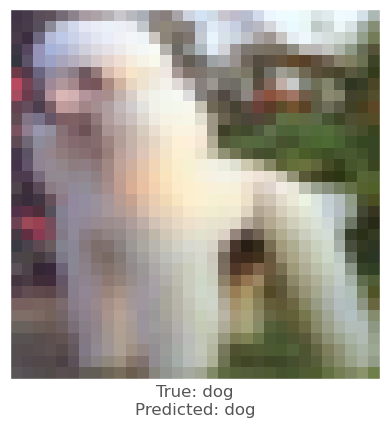



-0.005720675
-0.0033316016
-0.0024201274
vr, vg, vb :   1.050108976008892 -1.2271985600984097 -1.0247219424062972
beam_perturbed_confidence temp :  0.65489423
beam_perturbed_confidence temp :  0.6631335
beam_perturbed_confidence temp :  0.66032016
beam_perturbed_confidence temp :  0.6591139
beam_perturbed_confidence temp :  0.6574282
beam_perturbed_confidence temp :  0.6689999
beam_perturbed_confidence temp :  0.6650864
row index :  0
7th round's confidence : 2th 0.65489423
predicted class :  dog
predicted class's confidence :  0.65489423
Lopt is :  4


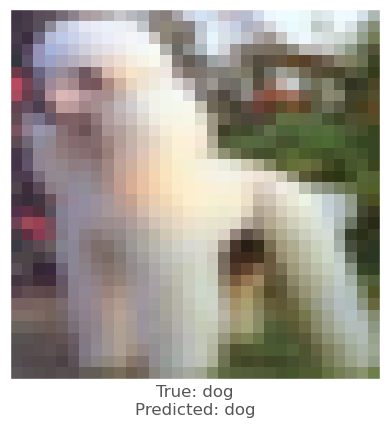



-0.0013645291
-0.003584385
-0.0015304089
vr, vg, vb :   -0.2967946421456338 0.32561941248774523 -0.7051231884032488
beam_perturbed_confidence temp :  0.70303696
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70303696
beam_perturbed_confidence temp :  0.70418584
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70418584
row index :  1
7th round's confidence : 3th 0.70222926
predicted class :  dog
predicted class's confidence :  0.70222926
Lopt is :  19


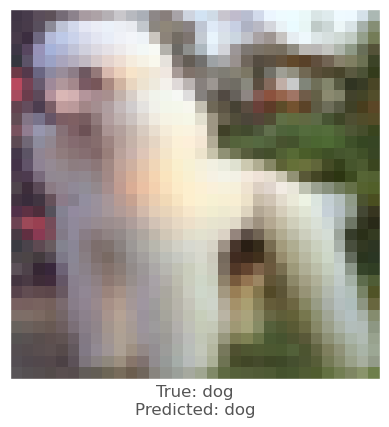



-0.00060123205
0.001920402
0.00053578615
vr, vg, vb :   -0.7604325684887172 -3.1338226655721666 -2.3288844983506207
beam_perturbed_confidence temp :  0.6479695
beam_perturbed_confidence temp :  0.6573257
beam_perturbed_confidence temp :  0.65230155
beam_perturbed_confidence temp :  0.6654743
beam_perturbed_confidence temp :  0.6572465
beam_perturbed_confidence temp :  0.67230946
beam_perturbed_confidence temp :  0.6803113
row index :  0
7th round's confidence : 4th 0.6479695
predicted class :  dog
predicted class's confidence :  0.6479695
Lopt is :  6


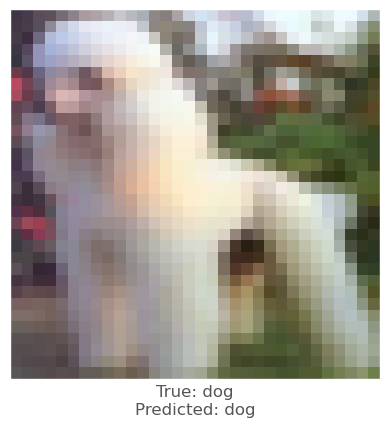



-0.00279361
0.00034064054
-0.0004503727
vr, vg, vb :   2.25156163323319 -0.13187297906237833 0.6909169283898473
beam_perturbed_confidence temp :  0.65116954
beam_perturbed_confidence temp :  0.6504799
beam_perturbed_confidence temp :  0.6489168
beam_perturbed_confidence temp :  0.6471621
beam_perturbed_confidence temp :  0.65116954
beam_perturbed_confidence temp :  0.6504799
beam_perturbed_confidence temp :  0.6471621
row index :  3
8th round's confidence : 0th 0.6471621
predicted class :  dog
predicted class's confidence :  0.6471621
Lopt is :  6


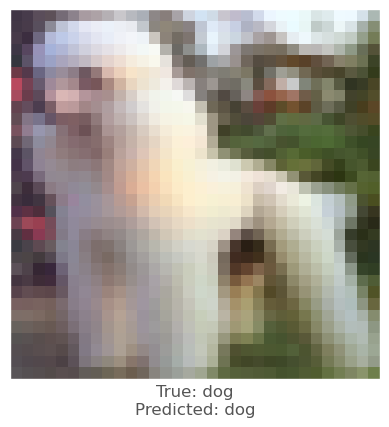



-0.0028772354
0.0005441308
-0.0014982224
vr, vg, vb :   0.5336157920112614 -0.7789207215376495 -0.23645738861566767
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.65910286
row index :  0
8th round's confidence : 1th 0.6566525
predicted class :  dog
predicted class's confidence :  0.6566525
Lopt is :  2


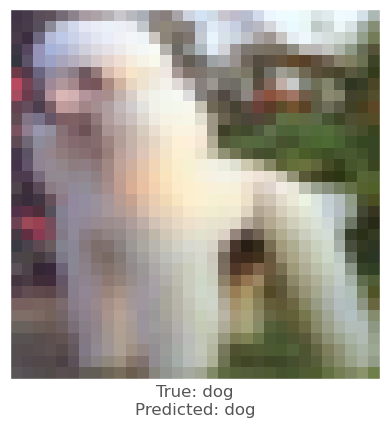



-0.006041229
-0.0018172264
-0.0031639934
vr, vg, vb :   1.5492209555289744 -0.9227560630973577 -0.6058504123044615
beam_perturbed_confidence temp :  0.6523315
beam_perturbed_confidence temp :  0.65628207
beam_perturbed_confidence temp :  0.6559126
beam_perturbed_confidence temp :  0.65305734
beam_perturbed_confidence temp :  0.6522899
beam_perturbed_confidence temp :  0.6580673
beam_perturbed_confidence temp :  0.6540874
row index :  4
8th round's confidence : 2th 0.6522899
predicted class :  dog
predicted class's confidence :  0.6522899
Lopt is :  5


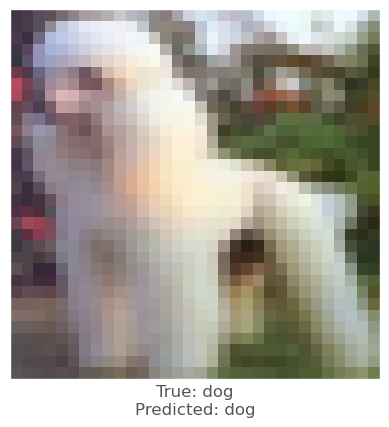



-0.0013645291
-0.003584385
-0.0015304089
vr, vg, vb :   -0.13066226464676867 0.6514959630602597 -0.48156998363763104
beam_perturbed_confidence temp :  0.70303696
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70303696
beam_perturbed_confidence temp :  0.70418584
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70418584
row index :  1
8th round's confidence : 3th 0.70222926
predicted class :  dog
predicted class's confidence :  0.70222926
Lopt is :  19


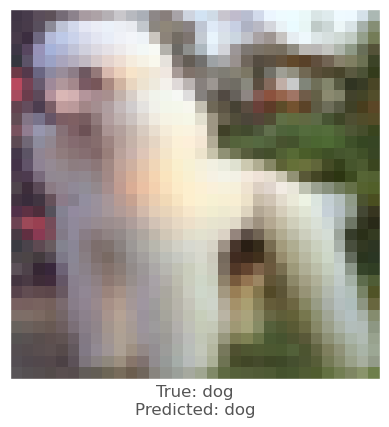



-0.005527377
-0.0032814145
-0.0035202503
vr, vg, vb :   -0.1316515987797381 -2.492298948132992 -1.7439710164721016
beam_perturbed_confidence temp :  0.6521837
beam_perturbed_confidence temp :  0.65966475
beam_perturbed_confidence temp :  0.65366524
beam_perturbed_confidence temp :  0.6657199
beam_perturbed_confidence temp :  0.65867424
beam_perturbed_confidence temp :  0.6665696
beam_perturbed_confidence temp :  0.67434263
row index :  0
8th round's confidence : 4th 0.6521837
predicted class :  dog
predicted class's confidence :  0.6521837
Lopt is :  6


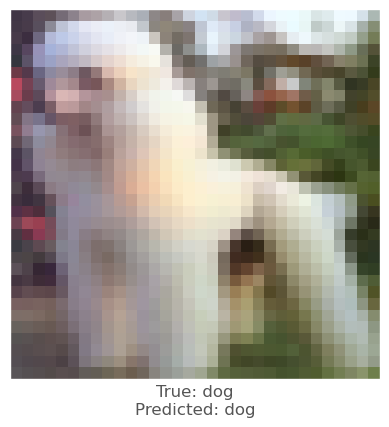



0.001591146
0.005864203
0.0019558668
vr, vg, vb :   1.8672908706819658 -0.7051059787788212 0.42623855418489576
beam_perturbed_confidence temp :  0.64860225
beam_perturbed_confidence temp :  0.64530534
beam_perturbed_confidence temp :  0.6471621
beam_perturbed_confidence temp :  0.6450439
beam_perturbed_confidence temp :  0.64860225
beam_perturbed_confidence temp :  0.64530534
beam_perturbed_confidence temp :  0.6450439
row index :  3
9th round's confidence : 0th 0.6450439
predicted class :  dog
predicted class's confidence :  0.6450439
Lopt is :  7


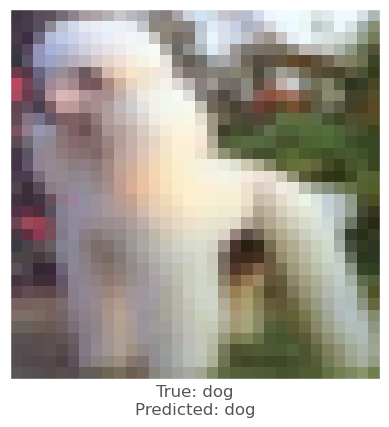



-0.0028772354
0.0005441308
-0.0014982224
vr, vg, vb :   0.7679777540699009 -0.7554417295993386 -0.06298941464667904
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.657319
beam_perturbed_confidence temp :  0.65910286
beam_perturbed_confidence temp :  0.65910286
row index :  0
9th round's confidence : 1th 0.6566525
predicted class :  dog
predicted class's confidence :  0.6566525
Lopt is :  2


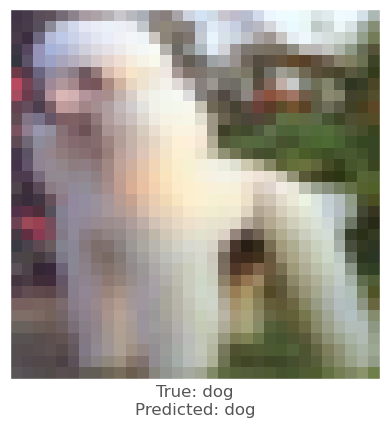



-0.0032940507
0.00018918514
-0.0015363693
vr, vg, vb :   1.7237039293272733 -0.8493989710393309 -0.3916284387009684
beam_perturbed_confidence temp :  0.6526185
beam_perturbed_confidence temp :  0.6540874
beam_perturbed_confidence temp :  0.65386784
beam_perturbed_confidence temp :  0.6504547
beam_perturbed_confidence temp :  0.65176016
beam_perturbed_confidence temp :  0.65669835
beam_perturbed_confidence temp :  0.65237707
row index :  3
9th round's confidence : 2th 0.6504547
predicted class :  dog
predicted class's confidence :  0.6504547
Lopt is :  5


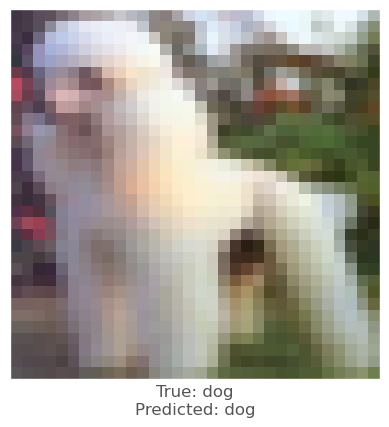



-0.0013645291
-0.003584385
-0.0015304089
vr, vg, vb :   0.018856875102209958 0.9447848585755229 -0.280372099348575
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.70326746
row index :  0
9th round's confidence : 3th 0.70222926
predicted class :  dog
predicted class's confidence :  0.70222926
Lopt is :  19


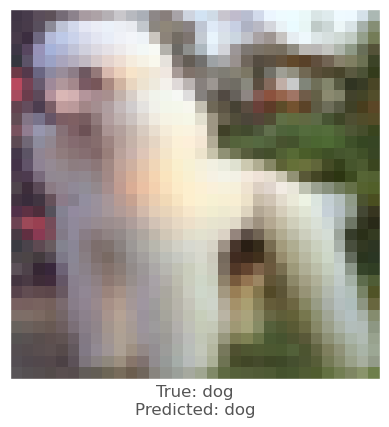



-0.00821054
-0.007090509
-0.0045627356
vr, vg, vb :   0.7025675428792416 -1.5340181595361235 -1.1133003590692763
beam_perturbed_confidence temp :  0.6521837
beam_perturbed_confidence temp :  0.6608935
beam_perturbed_confidence temp :  0.65867424
beam_perturbed_confidence temp :  0.6608935
beam_perturbed_confidence temp :  0.65867424
beam_perturbed_confidence temp :  0.66615105
beam_perturbed_confidence temp :  0.66615105
row index :  0
9th round's confidence : 4th 0.6521837
predicted class :  dog
predicted class's confidence :  0.6521837
Lopt is :  6


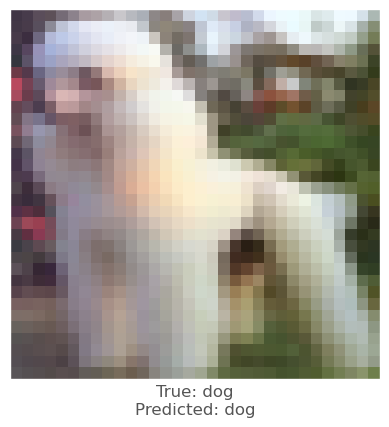



0.00046229362
0.0047192574
0.0012053847
vr, vg, vb :   1.6343324211259762 -1.106521116374572 0.26307622563713373
beam_perturbed_confidence temp :  0.6457676
beam_perturbed_confidence temp :  0.647029
beam_perturbed_confidence temp :  0.6450439
beam_perturbed_confidence temp :  0.6418117
beam_perturbed_confidence temp :  0.6457676
beam_perturbed_confidence temp :  0.647029
beam_perturbed_confidence temp :  0.6418117
row index :  3
10th round's confidence : 0th 0.6418117
predicted class :  dog
predicted class's confidence :  0.6418117
Lopt is :  9


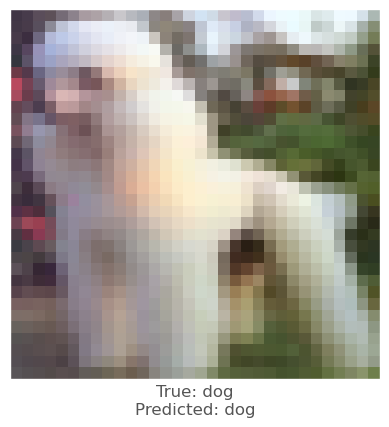



-0.0028772354
0.0005441308
-0.0014982224
vr, vg, vb :   0.9789035199226764 -0.7343106368548589 0.09313176192541074
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.65774614
row index :  0
10th round's confidence : 1th 0.6566525
predicted class :  dog
predicted class's confidence :  0.6566525
Lopt is :  2


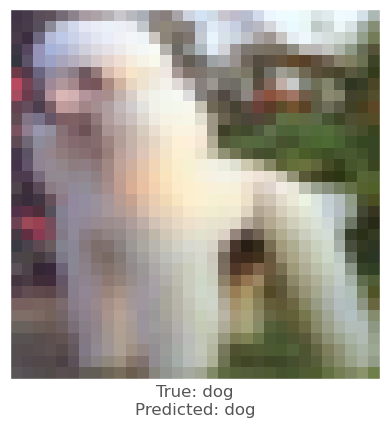



-0.0034243464
-0.00073593855
-0.0018827915
vr, vg, vb :   1.8937681810936426 -0.690865219031223 -0.16418644291436768
beam_perturbed_confidence temp :  0.6506631
beam_perturbed_confidence temp :  0.65335447
beam_perturbed_confidence temp :  0.65237707
beam_perturbed_confidence temp :  0.6493907
beam_perturbed_confidence temp :  0.6503712
beam_perturbed_confidence temp :  0.65718085
beam_perturbed_confidence temp :  0.6521876
row index :  3
10th round's confidence : 2th 0.6493907
predicted class :  dog
predicted class's confidence :  0.6493907
Lopt is :  5


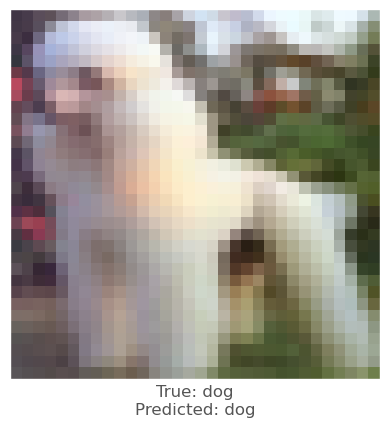



-0.0013645291
-0.003584385
-0.0015304089
vr, vg, vb :   0.15342410087629071 1.2087448645392596 -0.09929400348842454
beam_perturbed_confidence temp :  0.70222926
beam_perturbed_confidence temp :  0.7007469
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.7007469
beam_perturbed_confidence temp :  0.70326746
beam_perturbed_confidence temp :  0.7012875
beam_perturbed_confidence temp :  0.7012875
row index :  1
10th round's confidence : 3th 0.7007469
predicted class :  dog
predicted class's confidence :  0.7007469
Lopt is :  19


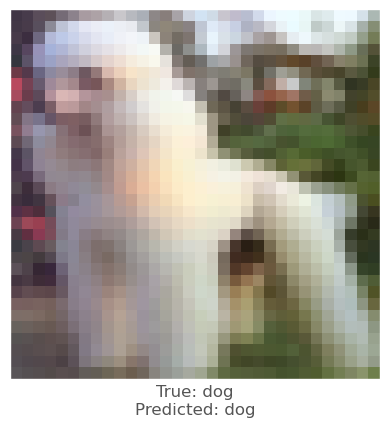



-0.00821054
-0.007090509
-0.0045627356
vr, vg, vb :   1.4533647703723234 -0.6715654497989418 -0.5456967674067335
beam_perturbed_confidence temp :  0.6479695
beam_perturbed_confidence temp :  0.65662944
beam_perturbed_confidence temp :  0.65504265
beam_perturbed_confidence temp :  0.6521577
beam_perturbed_confidence temp :  0.65053135
beam_perturbed_confidence temp :  0.65971684
beam_perturbed_confidence temp :  0.6548777
row index :  0
10th round's confidence : 4th 0.6479695
predicted class :  dog
predicted class's confidence :  0.6479695
Lopt is :  6


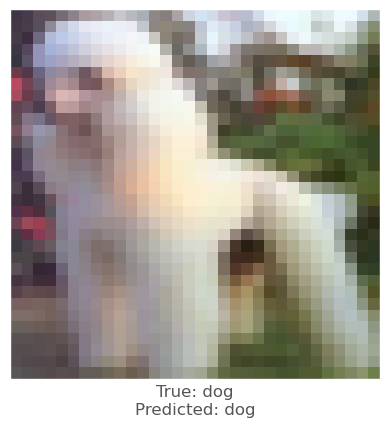



-0.006604612
-0.0019622445
-0.00365448
vr, vg, vb :   2.1313603663760494 -0.7996445536720515 0.6022166011202954
beam_perturbed_confidence temp :  0.64171076
beam_perturbed_confidence temp :  0.6449993
beam_perturbed_confidence temp :  0.6418117
beam_perturbed_confidence temp :  0.6376242
beam_perturbed_confidence temp :  0.64171076
beam_perturbed_confidence temp :  0.6449993
beam_perturbed_confidence temp :  0.6376242
row index :  3
11th round's confidence : 0th 0.6376242
predicted class :  dog
predicted class's confidence :  0.6376242
Lopt is :  10


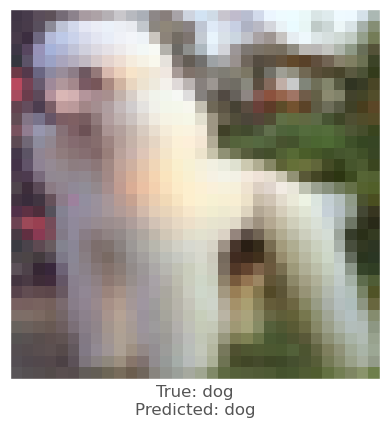



-0.0028772354
0.0005441308
-0.0014982224
vr, vg, vb :   1.1687367091901746 -0.7152926533848271 0.23364082084029153
beam_perturbed_confidence temp :  0.6564028
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.6566525
beam_perturbed_confidence temp :  0.6552134
beam_perturbed_confidence temp :  0.6564028
beam_perturbed_confidence temp :  0.65774614
beam_perturbed_confidence temp :  0.6552134
row index :  3
11th round's confidence : 1th 0.6552134
predicted class :  dog
predicted class's confidence :  0.6552134
Lopt is :  3


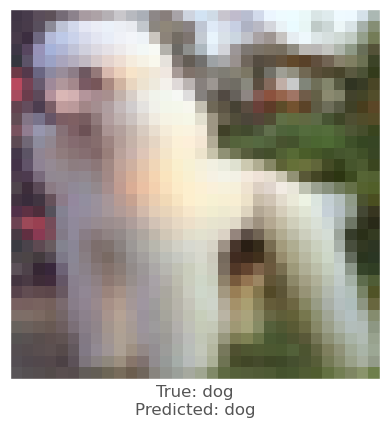



-0.004828751
-0.0030021667
-0.0039152503
vr, vg, vb :   2.1872664717031505 -0.32156202232341324 0.2437572315131775
beam_perturbed_confidence temp :  0.64964765
beam_perturbed_confidence temp :  0.65366524
beam_perturbed_confidence temp :  0.6493907
beam_perturbed_confidence temp :  0.64777005
beam_perturbed_confidence temp :  0.64964765
beam_perturbed_confidence temp :  0.65366524
beam_perturbed_confidence temp :  0.64777005
row index :  3
11th round's confidence : 2th 0.64777005
predicted class :  dog
predicted class's confidence :  0.64777005
Lopt is :  7


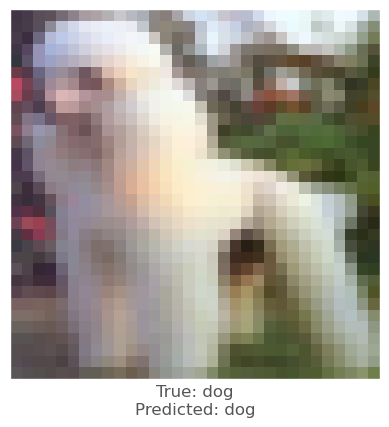



-0.00039589405
-0.0022096634
-0.0004543662
vr, vg, vb :   0.1776710958484761 1.3088367171966617 -0.04392798242730182
beam_perturbed_confidence temp :  0.7007469
beam_perturbed_confidence temp :  0.7000196
beam_perturbed_confidence temp :  0.7012875
beam_perturbed_confidence temp :  0.7000196
beam_perturbed_confidence temp :  0.7012875
beam_perturbed_confidence temp :  0.69990563
beam_perturbed_confidence temp :  0.69990563
row index :  5
11th round's confidence : 3th 0.69990563
predicted class :  dog
predicted class's confidence :  0.69990563
Lopt is :  20


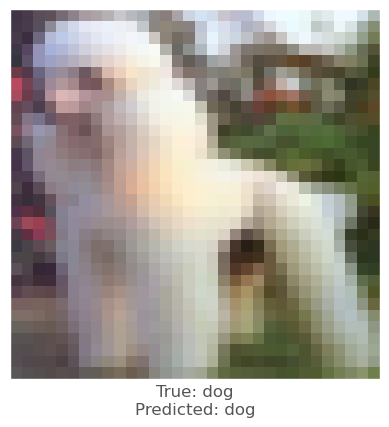



-0.005527377
-0.0032814145
-0.0035202503
vr, vg, vb :   1.8607660061951985 -0.2762674539370896 -0.1391020586226031
beam_perturbed_confidence temp :  0.64665633
beam_perturbed_confidence temp :  0.6521577
beam_perturbed_confidence temp :  0.65053135
beam_perturbed_confidence temp :  0.64767176
beam_perturbed_confidence temp :  0.6466263
beam_perturbed_confidence temp :  0.6548777
beam_perturbed_confidence temp :  0.65020376
row index :  4
11th round's confidence : 4th 0.6466263
predicted class :  dog
predicted class's confidence :  0.6466263
Lopt is :  6


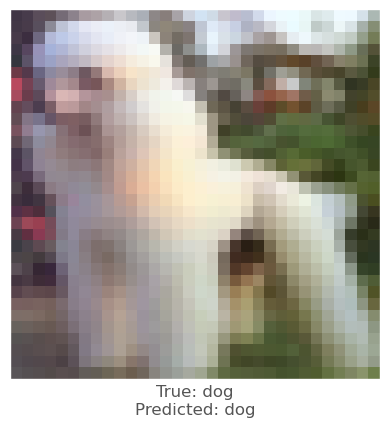



0.00013512373
0.0061630607
0.0006491542
vr, vg, vb :   1.9047119567678634 -1.3359861648179079 0.4770795223833879
beam_perturbed_confidence temp :  0.63912
beam_perturbed_confidence temp :  0.6397832
beam_perturbed_confidence temp :  0.6376242
beam_perturbed_confidence temp :  0.6332704
beam_perturbed_confidence temp :  0.63912
beam_perturbed_confidence temp :  0.6397832
beam_perturbed_confidence temp :  0.6332704
row index :  3
12th round's confidence : 0th 0.6332704
predicted class :  dog
predicted class's confidence :  0.6332704
Lopt is :  12


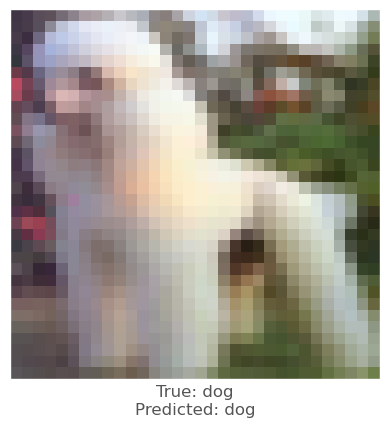



-0.0040165186
0.00030708313
-0.0010472536
vr, vg, vb :   1.4535148975546044 -0.6744717010346256 0.31500209962662373
beam_perturbed_confidence temp :  0.6537296
beam_perturbed_confidence temp :  0.65609574
beam_perturbed_confidence temp :  0.6552134
beam_perturbed_confidence temp :  0.6521186
beam_perturbed_confidence temp :  0.6537296
beam_perturbed_confidence temp :  0.65609574
beam_perturbed_confidence temp :  0.6521186
row index :  3
12th round's confidence : 1th 0.6521186
predicted class :  dog
predicted class's confidence :  0.6521186
Lopt is :  4


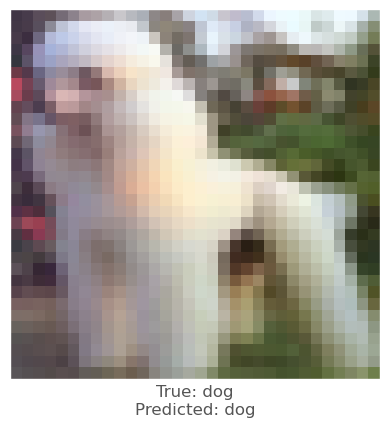



-0.0014778972
0.0010765791
-0.002242446
vr, vg, vb :   2.1163295412534167 -0.39706372948438245 0.4436261029358344
beam_perturbed_confidence temp :  0.65090966
beam_perturbed_confidence temp :  0.6485711
beam_perturbed_confidence temp :  0.64777005
beam_perturbed_confidence temp :  0.6469823
beam_perturbed_confidence temp :  0.65090966
beam_perturbed_confidence temp :  0.6485711
beam_perturbed_confidence temp :  0.6469823
row index :  3
12th round's confidence : 2th 0.6469823
predicted class :  dog
predicted class's confidence :  0.6469823
Lopt is :  9


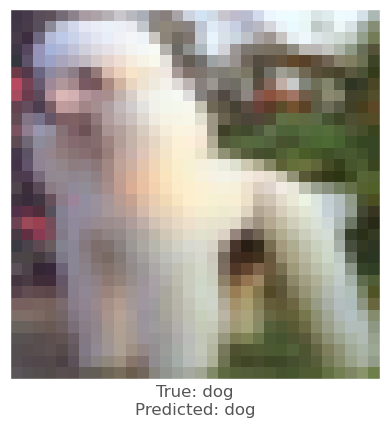



-0.00010126829
-0.002131939
-9.7334385e-05
vr, vg, vb :   0.17003081541096735 1.3911469389096127 -0.029801745692750355
beam_perturbed_confidence temp :  0.69990563
beam_perturbed_confidence temp :  0.69915557
beam_perturbed_confidence temp :  0.70011693
beam_perturbed_confidence temp :  0.69915557
beam_perturbed_confidence temp :  0.70011693
beam_perturbed_confidence temp :  0.69876367
beam_perturbed_confidence temp :  0.69876367
row index :  5
12th round's confidence : 3th 0.69876367
predicted class :  dog
predicted class's confidence :  0.69876367
Lopt is :  21


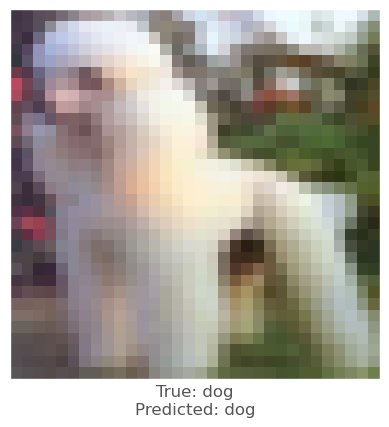



-0.0036085248
-0.0012065768
-0.0026946068
vr, vg, vb :   2.035541885510371 -0.12798302612455742 0.14426882534024313
beam_perturbed_confidence temp :  0.6481067
beam_perturbed_confidence temp :  0.65020376
beam_perturbed_confidence temp :  0.6466263
beam_perturbed_confidence temp :  0.64541477
beam_perturbed_confidence temp :  0.6481067
beam_perturbed_confidence temp :  0.65020376
beam_perturbed_confidence temp :  0.64541477
row index :  3
12th round's confidence : 4th 0.64541477
predicted class :  dog
predicted class's confidence :  0.64541477
Lopt is :  8


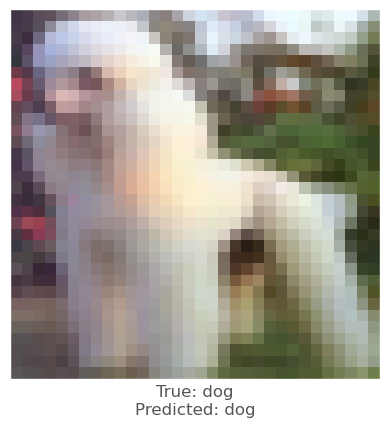



-0.0065603256
-0.003296554
-0.004649639
vr, vg, vb :   2.3702733233469364 -0.8727321394768641 0.8943354831089163
beam_perturbed_confidence temp :  0.6353752
beam_perturbed_confidence temp :  0.6386428
beam_perturbed_confidence temp :  0.6332704
beam_perturbed_confidence temp :  0.63203245
beam_perturbed_confidence temp :  0.6353752
beam_perturbed_confidence temp :  0.6386428
beam_perturbed_confidence temp :  0.63203245
row index :  3
13th round's confidence : 0th 0.63203245
predicted class :  dog
predicted class's confidence :  0.63203245
Lopt is :  13


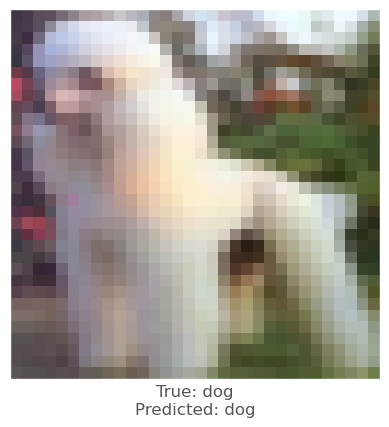



-0.0046553016
-0.0005905628
-0.00033789873
vr, vg, vb :   1.7736935648883774 -0.547968248887706 0.31729176278713034
beam_perturbed_confidence temp :  0.65144044
beam_perturbed_confidence temp :  0.6543202
beam_perturbed_confidence temp :  0.6521186
beam_perturbed_confidence temp :  0.64987695
beam_perturbed_confidence temp :  0.65144044
beam_perturbed_confidence temp :  0.6543202
beam_perturbed_confidence temp :  0.64987695
row index :  3
13th round's confidence : 1th 0.64987695
predicted class :  dog
predicted class's confidence :  0.64987695
Lopt is :  5


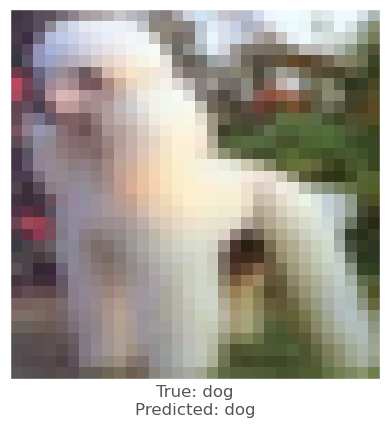



0.0022244453
0.0063027143
-0.0011813641
vr, vg, vb :   1.6822520528263172 -0.9876287913198798 0.5173998985870751
beam_perturbed_confidence temp :  0.6489059
beam_perturbed_confidence temp :  0.64460695
beam_perturbed_confidence temp :  0.6469823
beam_perturbed_confidence temp :  0.6452689
beam_perturbed_confidence temp :  0.6489059
beam_perturbed_confidence temp :  0.64460695
beam_perturbed_confidence temp :  0.6452689
row index :  1
13th round's confidence : 2th 0.64460695
predicted class :  dog
predicted class's confidence :  0.64460695
Lopt is :  9


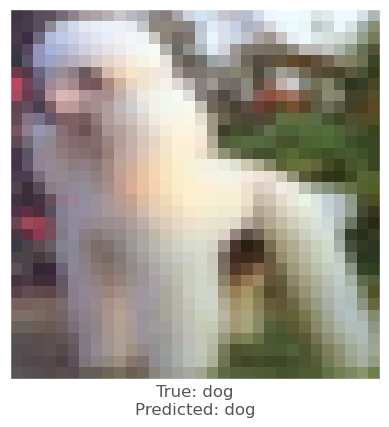



-0.00033777952
-0.0021672845
0.00045645237
vr, vg, vb :   0.1868056860640845 1.4687606938864493 -0.07246680809246946
beam_perturbed_confidence temp :  0.69876367
beam_perturbed_confidence temp :  0.69794965
beam_perturbed_confidence temp :  0.6986991
beam_perturbed_confidence temp :  0.69794965
beam_perturbed_confidence temp :  0.6986991
beam_perturbed_confidence temp :  0.69756824
beam_perturbed_confidence temp :  0.69756824
row index :  5
13th round's confidence : 3th 0.69756824
predicted class :  dog
predicted class's confidence :  0.69756824
Lopt is :  22


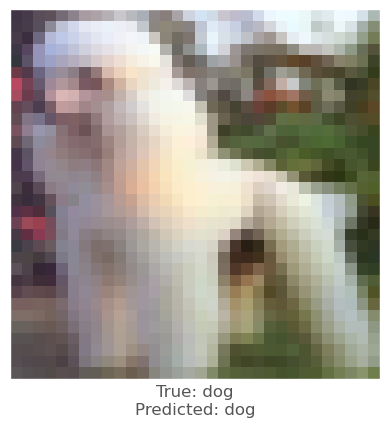



0.000710845
0.0035654902
-0.0014953017
vr, vg, vb :   1.7609031976002032 -0.47173374809401086 0.2793721151542413
beam_perturbed_confidence temp :  0.6467026
beam_perturbed_confidence temp :  0.6445412
beam_perturbed_confidence temp :  0.64541477
beam_perturbed_confidence temp :  0.64409065
beam_perturbed_confidence temp :  0.6467026
beam_perturbed_confidence temp :  0.6445412
beam_perturbed_confidence temp :  0.64409065
row index :  3
13th round's confidence : 4th 0.64409065
predicted class :  dog
predicted class's confidence :  0.64409065
Lopt is :  9


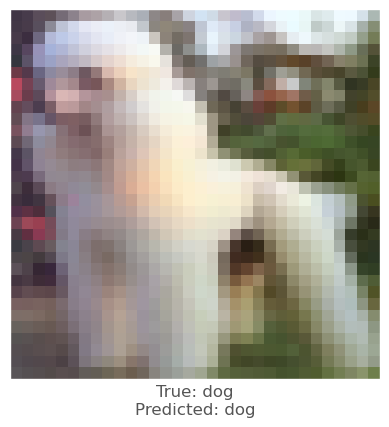



0.00048488379
0.002849698
-0.0007022619
vr, vg, vb :   2.0847576124874627 -1.0704287322003203 0.87512812727239
beam_perturbed_confidence temp :  0.6354823
beam_perturbed_confidence temp :  0.63695955
beam_perturbed_confidence temp :  0.63203245
beam_perturbed_confidence temp :  0.62653106
beam_perturbed_confidence temp :  0.6354823
beam_perturbed_confidence temp :  0.63695955
beam_perturbed_confidence temp :  0.62653106
row index :  3
14th round's confidence : 0th 0.62653106
predicted class :  dog
predicted class's confidence :  0.62653106
Lopt is :  15


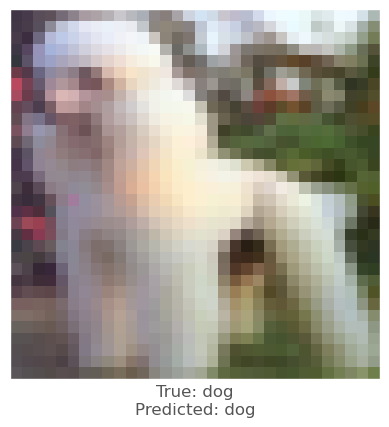



-0.005231619
-0.0016844869
-0.0020195246
vr, vg, vb :   2.119486096522098 -0.324722737399204 0.48751504393639583
beam_perturbed_confidence temp :  0.65045047
beam_perturbed_confidence temp :  0.6531249
beam_perturbed_confidence temp :  0.64987695
beam_perturbed_confidence temp :  0.64719176
beam_perturbed_confidence temp :  0.65045047
beam_perturbed_confidence temp :  0.6531249
beam_perturbed_confidence temp :  0.64719176
row index :  3
14th round's confidence : 1th 0.64719176
predicted class :  dog
predicted class's confidence :  0.64719176
Lopt is :  6


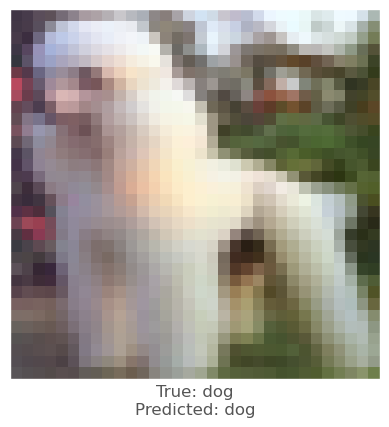



-0.0015975237
0.0022493005
-0.0009204149
vr, vg, vb :   1.6737792164706875 -1.1137959601767835 0.5577014011905259
beam_perturbed_confidence temp :  0.6452689
beam_perturbed_confidence temp :  0.6484047
beam_perturbed_confidence temp :  0.64460695
beam_perturbed_confidence temp :  0.6423424
beam_perturbed_confidence temp :  0.6452689
beam_perturbed_confidence temp :  0.6484047
beam_perturbed_confidence temp :  0.6423424
row index :  3
14th round's confidence : 2th 0.6423424
predicted class :  dog
predicted class's confidence :  0.6423424
Lopt is :  10


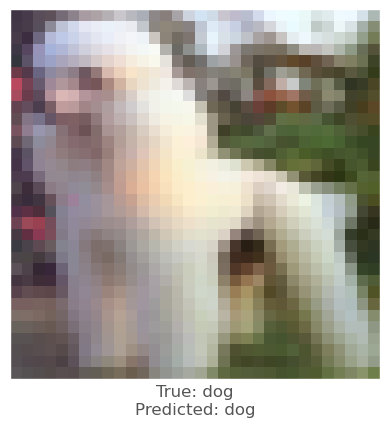



-0.00025963783
-0.0017601848
0.0005802512
vr, vg, vb :   0.1940889007218362 1.4979031009840105 -0.12324524897206529
beam_perturbed_confidence temp :  0.69756824
beam_perturbed_confidence temp :  0.69693893
beam_perturbed_confidence temp :  0.6973694
beam_perturbed_confidence temp :  0.69693893
beam_perturbed_confidence temp :  0.6973694
beam_perturbed_confidence temp :  0.69613594
beam_perturbed_confidence temp :  0.69613594
row index :  5
14th round's confidence : 3th 0.69613594
predicted class :  dog
predicted class's confidence :  0.69613594
Lopt is :  23


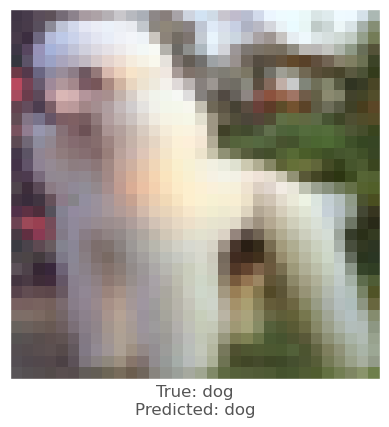



0.00011867285
0.005151272
-0.0012078881
vr, vg, vb :   1.5729455930654026 -0.9396875552914457 0.3722237162761463
beam_perturbed_confidence temp :  0.6446599
beam_perturbed_confidence temp :  0.6415513
beam_perturbed_confidence temp :  0.64409065
beam_perturbed_confidence temp :  0.64137995
beam_perturbed_confidence temp :  0.6446599
beam_perturbed_confidence temp :  0.6415513
beam_perturbed_confidence temp :  0.64137995
row index :  3
14th round's confidence : 4th 0.64137995
predicted class :  dog
predicted class's confidence :  0.64137995
Lopt is :  10


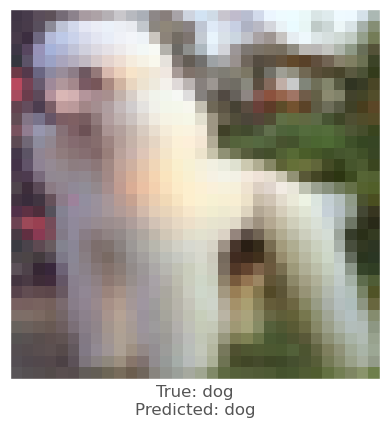



-0.002030313
0.0004222989
-0.002040565
vr, vg, vb :   2.0793131527371296 -1.0056157498036526 0.9916718159337008
beam_perturbed_confidence temp :  0.6331588
beam_perturbed_confidence temp :  0.6408042
beam_perturbed_confidence temp :  0.62653106
beam_perturbed_confidence temp :  0.62903786
beam_perturbed_confidence temp :  0.6331588
beam_perturbed_confidence temp :  0.6408042
beam_perturbed_confidence temp :  0.62903786
row index :  2
15th round's confidence : 0th 0.62653106
predicted class :  dog
predicted class's confidence :  0.62653106
Lopt is :  15


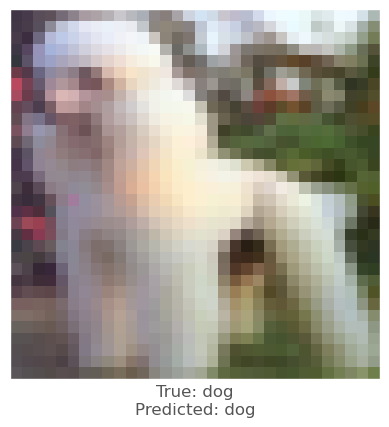



1.9788742e-05
0.00393641
0.0017001033
vr, vg, vb :   1.9055586126633453 -0.6858914586849183 0.2687532112499096
beam_perturbed_confidence temp :  0.6486122
beam_perturbed_confidence temp :  0.64651406
beam_perturbed_confidence temp :  0.64719176
beam_perturbed_confidence temp :  0.6449054
beam_perturbed_confidence temp :  0.6486122
beam_perturbed_confidence temp :  0.64651406
beam_perturbed_confidence temp :  0.6449054
row index :  3
15th round's confidence : 1th 0.6449054
predicted class :  dog
predicted class's confidence :  0.6449054
Lopt is :  7


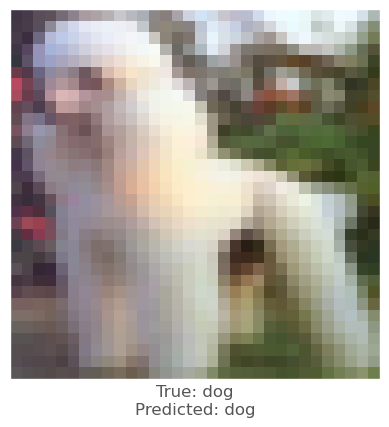



-0.010102093
-0.005171418
-0.007481098
vr, vg, vb :   2.5166106167993267 -0.48527454515886115 1.250041078576356
beam_perturbed_confidence temp :  0.6410798
beam_perturbed_confidence temp :  0.64644384
beam_perturbed_confidence temp :  0.6387738
beam_perturbed_confidence temp :  0.63650244
beam_perturbed_confidence temp :  0.6412115
beam_perturbed_confidence temp :  0.6425962
beam_perturbed_confidence temp :  0.6366096
row index :  3
15th round's confidence : 2th 0.63650244
predicted class :  dog
predicted class's confidence :  0.63650244
Lopt is :  12


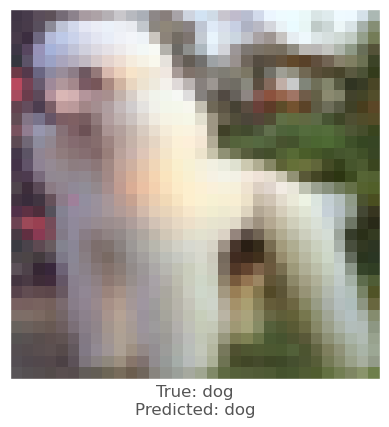



-2.2649765e-06
-0.0017225146
0.0013418794
vr, vg, vb :   0.1749065082997991 1.5203642538220108 -0.24510866085769567
beam_perturbed_confidence temp :  0.69613594
beam_perturbed_confidence temp :  0.6956469
beam_perturbed_confidence temp :  0.69559705
beam_perturbed_confidence temp :  0.6956469
beam_perturbed_confidence temp :  0.69559705
beam_perturbed_confidence temp :  0.6946182
beam_perturbed_confidence temp :  0.6946182
row index :  5
15th round's confidence : 3th 0.6946182
predicted class :  dog
predicted class's confidence :  0.6946182
Lopt is :  24


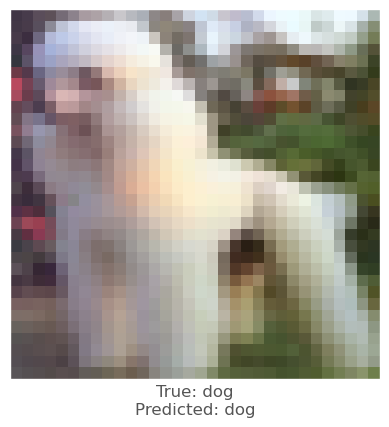



0.0013720989
0.005886078
-7.849932e-05
vr, vg, vb :   1.2784411414859131 -1.4343265878482385 0.34285127636545065
beam_perturbed_confidence temp :  0.6429234
beam_perturbed_confidence temp :  0.6425962
beam_perturbed_confidence temp :  0.64137995
beam_perturbed_confidence temp :  0.6367489
beam_perturbed_confidence temp :  0.6429234
beam_perturbed_confidence temp :  0.6425962
beam_perturbed_confidence temp :  0.6367489
row index :  3
15th round's confidence : 4th 0.6367489
predicted class :  dog
predicted class's confidence :  0.6367489
Lopt is :  11


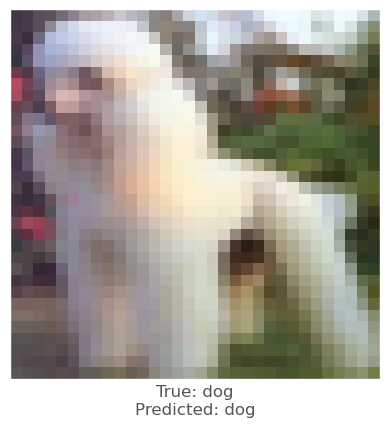



-0.002030313
0.0004222989
-0.002040565
vr, vg, vb :   2.0744131389618294 -0.9472840656466517 1.0965611357288805
beam_perturbed_confidence temp :  0.6331588
beam_perturbed_confidence temp :  0.6308151
beam_perturbed_confidence temp :  0.62674856
beam_perturbed_confidence temp :  0.62856805
beam_perturbed_confidence temp :  0.6329535
beam_perturbed_confidence temp :  0.62627286
beam_perturbed_confidence temp :  0.6286689
row index :  5
16th round's confidence : 0th 0.62627286
predicted class :  dog
predicted class's confidence :  0.62627286
Lopt is :  16


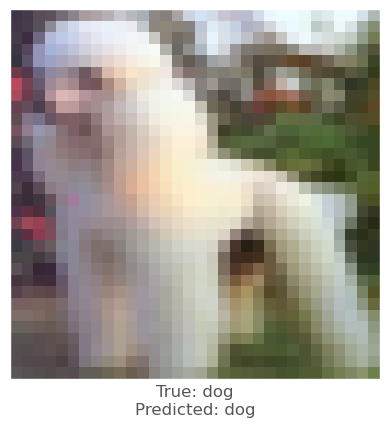



-0.0007118583
0.0030653477
0.001016736
vr, vg, vb :   1.7861885786522598 -0.9238370799673054 0.14020428706705731
beam_perturbed_confidence temp :  0.6458022
beam_perturbed_confidence temp :  0.64554685
beam_perturbed_confidence temp :  0.6449054
beam_perturbed_confidence temp :  0.64302784
beam_perturbed_confidence temp :  0.6458022
beam_perturbed_confidence temp :  0.64554685
beam_perturbed_confidence temp :  0.64302784
row index :  3
16th round's confidence : 1th 0.64302784
predicted class :  dog
predicted class's confidence :  0.64302784
Lopt is :  8


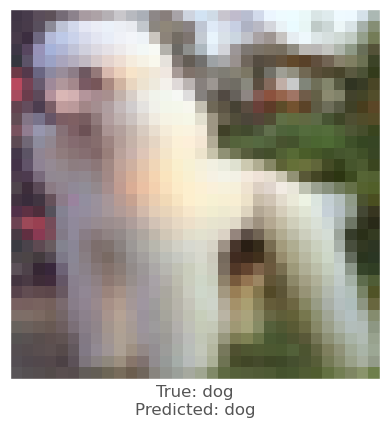



-0.00188905
0.00025606155
-0.003698945
vr, vg, vb :   2.4538545558060396 -0.4623532460384829 1.4949314752658396
beam_perturbed_confidence temp :  0.6413668
beam_perturbed_confidence temp :  0.6408237
beam_perturbed_confidence temp :  0.6366096
beam_perturbed_confidence temp :  0.6360015
beam_perturbed_confidence temp :  0.64115185
beam_perturbed_confidence temp :  0.6365642
beam_perturbed_confidence temp :  0.63750935
row index :  3
16th round's confidence : 2th 0.6360015
predicted class :  dog
predicted class's confidence :  0.6360015
Lopt is :  14


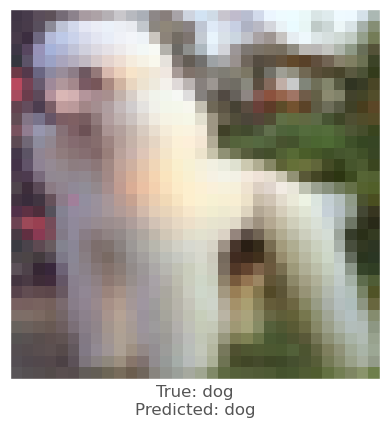



0.00040477514
-0.0014979243
0.001775384
vr, vg, vb :   0.1169383432028514 1.518120261224844 -0.3981361896999046
beam_perturbed_confidence temp :  0.6946182
beam_perturbed_confidence temp :  0.6940991
beam_perturbed_confidence temp :  0.6938715
beam_perturbed_confidence temp :  0.6940991
beam_perturbed_confidence temp :  0.6938715
beam_perturbed_confidence temp :  0.69321
beam_perturbed_confidence temp :  0.69321
row index :  5
16th round's confidence : 3th 0.69321
predicted class :  dog
predicted class's confidence :  0.69321
Lopt is :  25


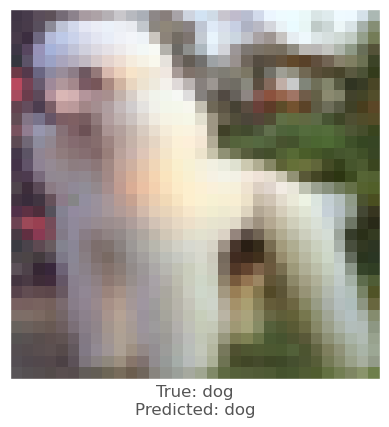



-0.0059865713
-0.0035845041
-0.0069020987
vr, vg, vb :   1.7492541585323902 -0.9324435163131706 0.9987760142989739
beam_perturbed_confidence temp :  0.6366096
beam_perturbed_confidence temp :  0.6419815
beam_perturbed_confidence temp :  0.6367489
beam_perturbed_confidence temp :  0.6365642
beam_perturbed_confidence temp :  0.6366096
beam_perturbed_confidence temp :  0.6419815
beam_perturbed_confidence temp :  0.6365642
row index :  3
16th round's confidence : 4th 0.6365642
predicted class :  dog
predicted class's confidence :  0.6365642
Lopt is :  12


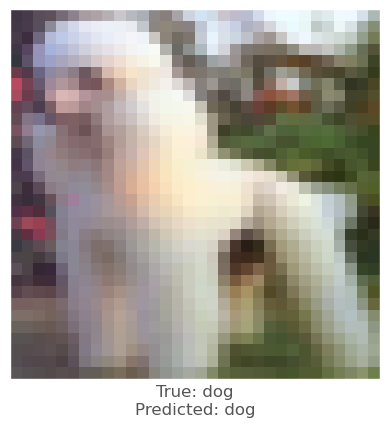



-0.007516682
-0.006404102
-0.005313039
vr, vg, vb :   2.61864003986362 -0.212145474221757 1.5182089047548692
beam_perturbed_confidence temp :  0.6286689
beam_perturbed_confidence temp :  0.63315266
beam_perturbed_confidence temp :  0.62550205
beam_perturbed_confidence temp :  0.6258583
beam_perturbed_confidence temp :  0.6284101
beam_perturbed_confidence temp :  0.62757283
beam_perturbed_confidence temp :  0.6247385
row index :  6
17th round's confidence : 0th 0.6247385
predicted class :  dog
predicted class's confidence :  0.6247385
Lopt is :  17


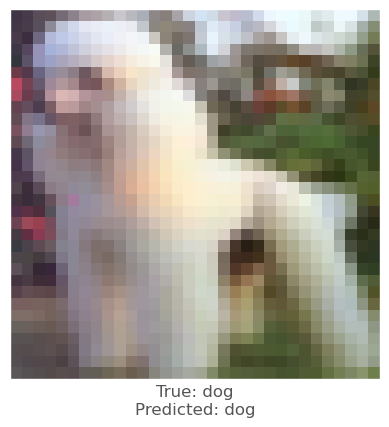



-0.0021068454
0.0013178587
-0.0005415082
vr, vg, vb :   1.818254258674607 -0.9632392415689635 0.18033467813879397
beam_perturbed_confidence temp :  0.64344
beam_perturbed_confidence temp :  0.64448434
beam_perturbed_confidence temp :  0.64302784
beam_perturbed_confidence temp :  0.6406663
beam_perturbed_confidence temp :  0.64344
beam_perturbed_confidence temp :  0.64448434
beam_perturbed_confidence temp :  0.6406663
row index :  3
17th round's confidence : 1th 0.6406663
predicted class :  dog
predicted class's confidence :  0.6406663
Lopt is :  9


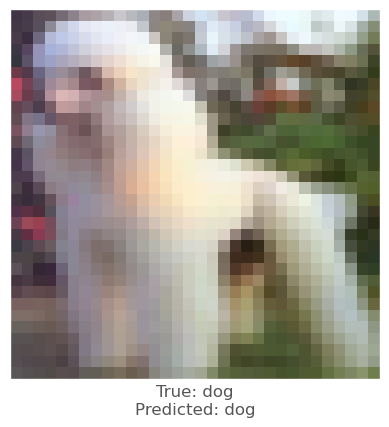



0.0038211942
0.008034885
0.0025914907
vr, vg, vb :   1.8263496830348838 -1.219606414400333 1.0862892531848123
beam_perturbed_confidence temp :  0.63902205
beam_perturbed_confidence temp :  0.6406063
beam_perturbed_confidence temp :  0.63750935
beam_perturbed_confidence temp :  0.6328339
beam_perturbed_confidence temp :  0.6389976
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.6290053
row index :  6
17th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


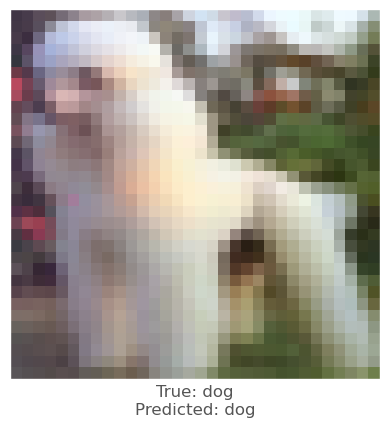



0.0003771186
-0.0016154051
0.001766026
vr, vg, vb :   0.06753265013317662 1.527848743372623 -0.534925172734919
beam_perturbed_confidence temp :  0.69321
beam_perturbed_confidence temp :  0.6922561
beam_perturbed_confidence temp :  0.6923331
beam_perturbed_confidence temp :  0.6922561
beam_perturbed_confidence temp :  0.6923331
beam_perturbed_confidence temp :  0.69156486
beam_perturbed_confidence temp :  0.69156486
row index :  5
17th round's confidence : 3th 0.69156486
predicted class :  dog
predicted class's confidence :  0.69156486
Lopt is :  26


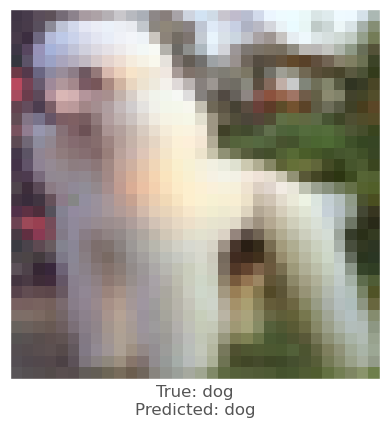



-0.006825328
-0.004920125
-0.007114351
vr, vg, vb :   2.2568615300021495 -0.34718666391891406 1.6103334924436616
beam_perturbed_confidence temp :  0.63750935
beam_perturbed_confidence temp :  0.64152974
beam_perturbed_confidence temp :  0.6337094
beam_perturbed_confidence temp :  0.6316753
beam_perturbed_confidence temp :  0.63747346
beam_perturbed_confidence temp :  0.6372764
beam_perturbed_confidence temp :  0.63325274
row index :  3
17th round's confidence : 4th 0.6316753
predicted class :  dog
predicted class's confidence :  0.6316753
Lopt is :  14


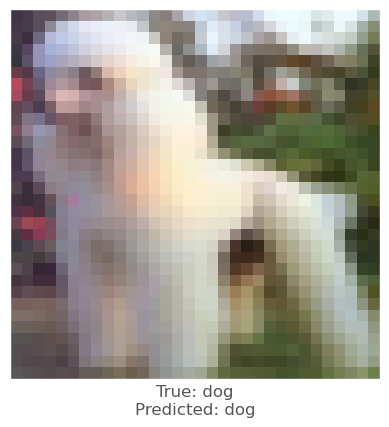



0.004798472
0.0022332668
-0.0019622445
vr, vg, vb :   1.8769288431129758 -0.41425760984401494 1.5626124653444458
beam_perturbed_confidence temp :  0.6288442
beam_perturbed_confidence temp :  0.62617683
beam_perturbed_confidence temp :  0.62389606
beam_perturbed_confidence temp :  0.6254599
beam_perturbed_confidence temp :  0.6278526
beam_perturbed_confidence temp :  0.6235256
beam_perturbed_confidence temp :  0.62527347
row index :  5
18th round's confidence : 0th 0.6235256
predicted class :  dog
predicted class's confidence :  0.6235256
Lopt is :  18


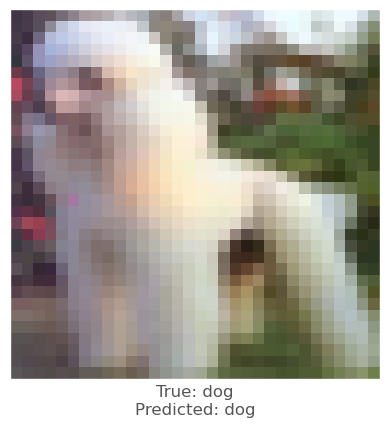



-0.0028572679
0.0016323924
-0.0003260374
vr, vg, vb :   1.9221556184669364 -1.0301545580584295 0.19490495101705324
beam_perturbed_confidence temp :  0.6416271
beam_perturbed_confidence temp :  0.6453049
beam_perturbed_confidence temp :  0.6406663
beam_perturbed_confidence temp :  0.6390482
beam_perturbed_confidence temp :  0.6416271
beam_perturbed_confidence temp :  0.6453049
beam_perturbed_confidence temp :  0.6390482
row index :  3
18th round's confidence : 1th 0.6390482
predicted class :  dog
predicted class's confidence :  0.6390482
Lopt is :  11


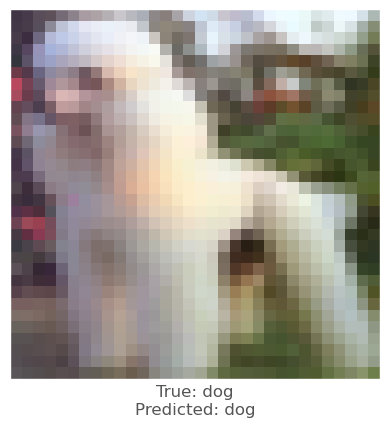



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   1.8191431052343252 -1.069077266719455 1.3189505633857403
beam_perturbed_confidence temp :  0.6327354
beam_perturbed_confidence temp :  0.644362
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.63964176
beam_perturbed_confidence temp :  0.6339696
beam_perturbed_confidence temp :  0.63720787
beam_perturbed_confidence temp :  0.63048786
row index :  2
18th round's confidence : 2th 0.629421
predicted class :  dog
predicted class's confidence :  0.629421
Lopt is :  15


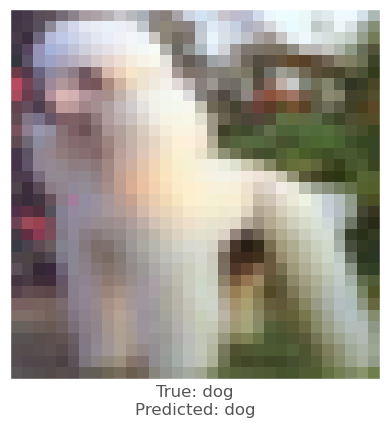



0.00021314621
-0.0020674467
0.0016291738
vr, vg, vb :   0.039464764148179274 1.5818085399032809 -0.6443500310260023
beam_perturbed_confidence temp :  0.69156486
beam_perturbed_confidence temp :  0.69026566
beam_perturbed_confidence temp :  0.6906269
beam_perturbed_confidence temp :  0.69026566
beam_perturbed_confidence temp :  0.6906269
beam_perturbed_confidence temp :  0.68977684
beam_perturbed_confidence temp :  0.68977684
row index :  5
18th round's confidence : 3th 0.68977684
predicted class :  dog
predicted class's confidence :  0.68977684
Lopt is :  27


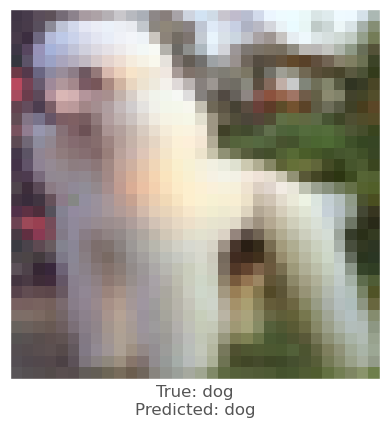



-0.0008355975
0.0030196905
-7.915497e-05
vr, vg, vb :   2.114735128512555 -0.6144370488881066 1.4572156400254674
beam_perturbed_confidence temp :  0.6380849
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.63325274
beam_perturbed_confidence temp :  0.6327354
beam_perturbed_confidence temp :  0.63767046
beam_perturbed_confidence temp :  0.6300871
beam_perturbed_confidence temp :  0.6339696
row index :  5
18th round's confidence : 4th 0.6300871
predicted class :  dog
predicted class's confidence :  0.6300871
Lopt is :  14


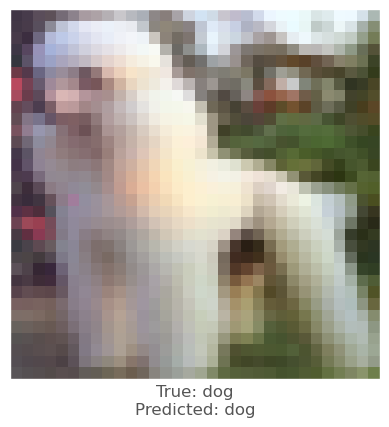



0.0002322197
-0.0055859685
-0.004627764
vr, vg, vb :   1.6660139891971861 0.18576500058191486 1.8691276413106115
beam_perturbed_confidence temp :  0.62527347
beam_perturbed_confidence temp :  0.6235256
beam_perturbed_confidence temp :  0.62154907
beam_perturbed_confidence temp :  0.62527347
beam_perturbed_confidence temp :  0.6239785
beam_perturbed_confidence temp :  0.62154907
beam_perturbed_confidence temp :  0.6239785
row index :  2
19th round's confidence : 0th 0.62154907
predicted class :  dog
predicted class's confidence :  0.62154907
Lopt is :  18


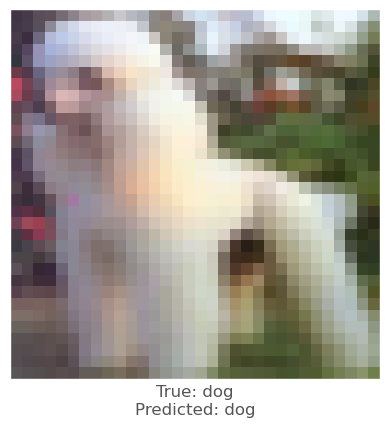



-0.010338306
-0.0047917366
-0.0055867434
vr, vg, vb :   2.763770699320438 -0.44796544197426624 0.7340887913950842
beam_perturbed_confidence temp :  0.63542867
beam_perturbed_confidence temp :  0.64263815
beam_perturbed_confidence temp :  0.6390482
beam_perturbed_confidence temp :  0.6327977
beam_perturbed_confidence temp :  0.63542867
beam_perturbed_confidence temp :  0.64263815
beam_perturbed_confidence temp :  0.6327977
row index :  3
19th round's confidence : 1th 0.6327977
predicted class :  dog
predicted class's confidence :  0.6327977
Lopt is :  12


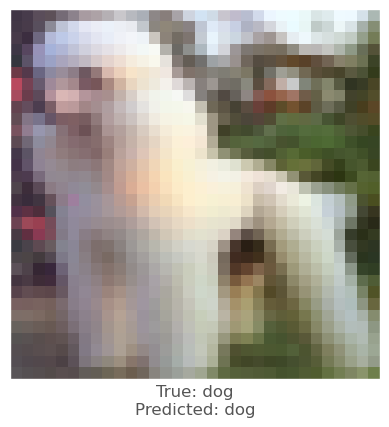



0.0038825274
0.0064311624
0.0022320747
vr, vg, vb :   1.2489760595729533 -1.6052857757805419 0.9638480332922836
beam_perturbed_confidence temp :  0.6339696
beam_perturbed_confidence temp :  0.63720787
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.63048786
beam_perturbed_confidence temp :  0.6339696
beam_perturbed_confidence temp :  0.63720787
beam_perturbed_confidence temp :  0.63048786
row index :  2
19th round's confidence : 2th 0.629421
predicted class :  dog
predicted class's confidence :  0.629421
Lopt is :  15


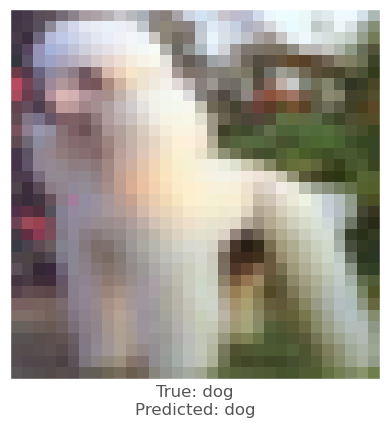



-0.00025099516
-0.0024171472
0.0012916327
vr, vg, vb :   0.06061780364827834 1.6653424018705945 -0.7090782931516736
beam_perturbed_confidence temp :  0.68977684
beam_perturbed_confidence temp :  0.6882098
beam_perturbed_confidence temp :  0.688974
beam_perturbed_confidence temp :  0.6882098
beam_perturbed_confidence temp :  0.688974
beam_perturbed_confidence temp :  0.68763727
beam_perturbed_confidence temp :  0.68763727
row index :  5
19th round's confidence : 3th 0.68763727
predicted class :  dog
predicted class's confidence :  0.68763727
Lopt is :  28


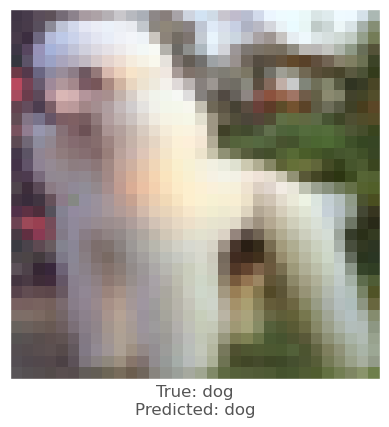



-0.0067931414
-0.0024232864
-0.004637599
vr, vg, vb :   2.5825757521664263 -0.31066470020046777 1.775253975162325
beam_perturbed_confidence temp :  0.6339696
beam_perturbed_confidence temp :  0.635676
beam_perturbed_confidence temp :  0.62985206
beam_perturbed_confidence temp :  0.62821966
beam_perturbed_confidence temp :  0.6340741
beam_perturbed_confidence temp :  0.6307757
beam_perturbed_confidence temp :  0.6287454
row index :  3
19th round's confidence : 4th 0.62821966
predicted class :  dog
predicted class's confidence :  0.62821966
Lopt is :  16


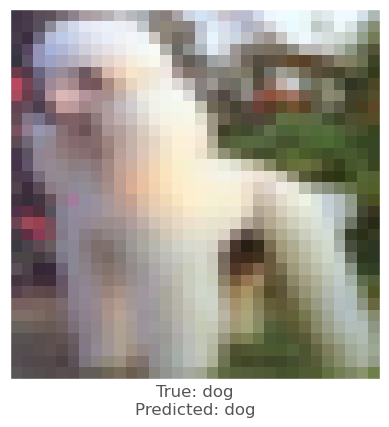



0.0013631582
0.0006298423
-0.0031042695
vr, vg, vb :   1.3630967676761492 0.10420427238956811 1.9926418276342623
beam_perturbed_confidence temp :  0.6239785
beam_perturbed_confidence temp :  0.62154907
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.6239785
beam_perturbed_confidence temp :  0.6222732
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.6222732
row index :  2
20th round's confidence : 0th 0.62042135
predicted class :  dog
predicted class's confidence :  0.62042135
Lopt is :  18


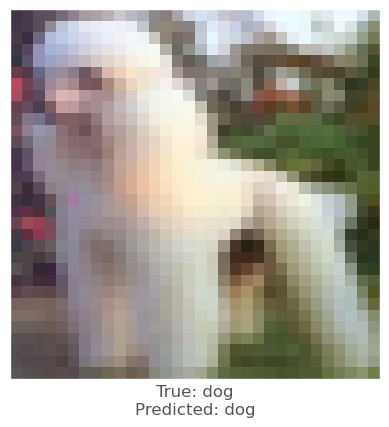



-0.0026994944
0.0009915829
-0.0009844303
vr, vg, vb :   2.7573430655761384 -0.5023271848251795 0.7591229435666109
beam_perturbed_confidence temp :  0.6351116
beam_perturbed_confidence temp :  0.6344371
beam_perturbed_confidence temp :  0.6327977
beam_perturbed_confidence temp :  0.6316164
beam_perturbed_confidence temp :  0.6351116
beam_perturbed_confidence temp :  0.6344371
beam_perturbed_confidence temp :  0.6316164
row index :  3
20th round's confidence : 1th 0.6316164
predicted class :  dog
predicted class's confidence :  0.6316164
Lopt is :  13


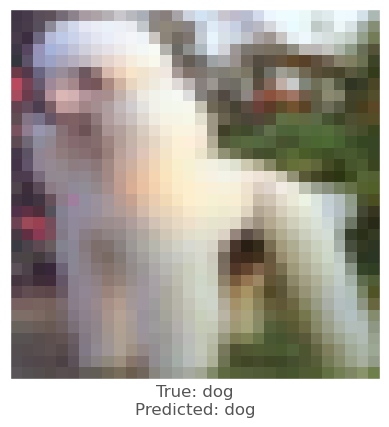



0.0038825274
0.0064311624
0.0022320747
vr, vg, vb :   0.7358257184777186 -2.08787343393552 0.6442557562081724
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.64753306
row index :  0
20th round's confidence : 2th 0.629421
predicted class :  dog
predicted class's confidence :  0.629421
Lopt is :  15


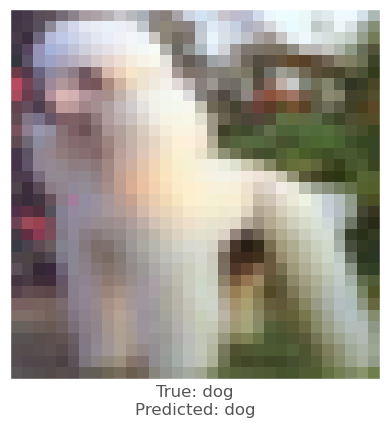



-0.000680387
-0.0031378865
0.0015163422
vr, vg, vb :   0.1225947252945589 1.812596814103579 -0.7898046801451
beam_perturbed_confidence temp :  0.68763727
beam_perturbed_confidence temp :  0.68583614
beam_perturbed_confidence temp :  0.68669343
beam_perturbed_confidence temp :  0.68583614
beam_perturbed_confidence temp :  0.68669343
beam_perturbed_confidence temp :  0.6851209
beam_perturbed_confidence temp :  0.6851209
row index :  5
20th round's confidence : 3th 0.6851209
predicted class :  dog
predicted class's confidence :  0.6851209
Lopt is :  29


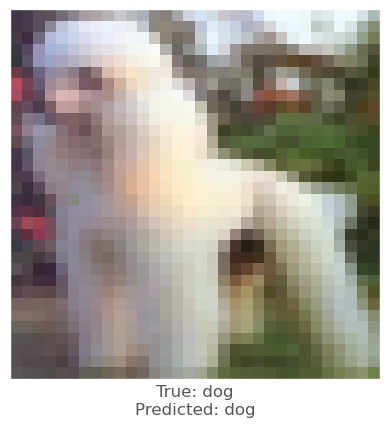



0.0038917065
0.0034817457
-0.00026661158
vr, vg, vb :   1.9351475302823031 -0.6277728021713878 1.6243897352541248
beam_perturbed_confidence temp :  0.63268083
beam_perturbed_confidence temp :  0.63048786
beam_perturbed_confidence temp :  0.6287454
beam_perturbed_confidence temp :  0.62849706
beam_perturbed_confidence temp :  0.6331588
beam_perturbed_confidence temp :  0.6263763
beam_perturbed_confidence temp :  0.62856805
row index :  5
20th round's confidence : 4th 0.6263763
predicted class :  dog
predicted class's confidence :  0.6263763
Lopt is :  16


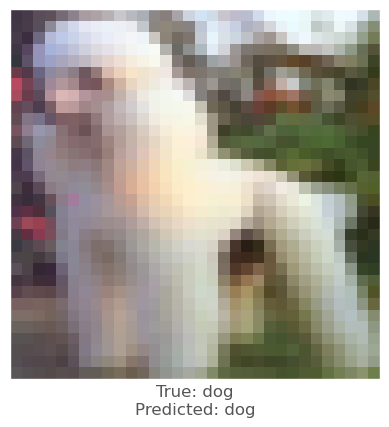



0.0014537573
0.00209862
-0.0029304028
vr, vg, vb :   1.0814113623013566 -0.11607814863906155 2.0864179204445668
beam_perturbed_confidence temp :  0.6222732
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.61929375
beam_perturbed_confidence temp :  0.6205868
beam_perturbed_confidence temp :  0.62276435
beam_perturbed_confidence temp :  0.6159474
beam_perturbed_confidence temp :  0.61668664
row index :  5
21th round's confidence : 0th 0.6159474
predicted class :  dog
predicted class's confidence :  0.6159474
Lopt is :  19


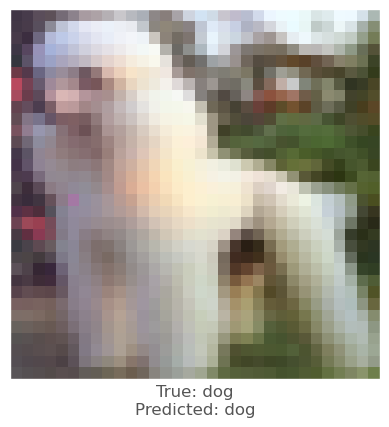



0.002340138
0.0052956343
-0.00076919794
vr, vg, vb :   2.2475949631658634 -0.9816578933140971 0.7601304432925915
beam_perturbed_confidence temp :  0.6361973
beam_perturbed_confidence temp :  0.62981594
beam_perturbed_confidence temp :  0.6316164
beam_perturbed_confidence temp :  0.6316847
beam_perturbed_confidence temp :  0.6361973
beam_perturbed_confidence temp :  0.62981594
beam_perturbed_confidence temp :  0.6316847
row index :  1
21th round's confidence : 1th 0.62981594
predicted class :  dog
predicted class's confidence :  0.62981594
Lopt is :  14


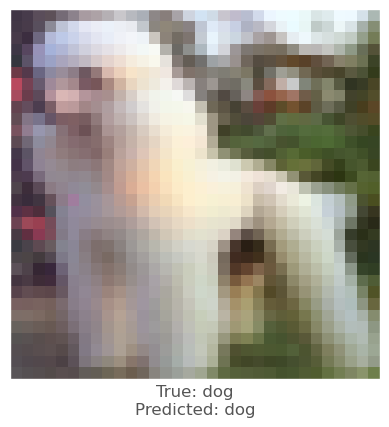



0.0038825274
0.0064311624
0.0022320747
vr, vg, vb :   0.2739904114920073 -2.5222023262750004 0.35662270683247244
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.64753306
row index :  0
21th round's confidence : 2th 0.629421
predicted class :  dog
predicted class's confidence :  0.629421
Lopt is :  15


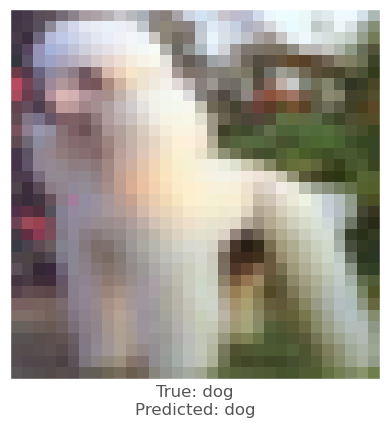



-0.0020713806
-0.0032268763
0.0014797449
vr, vg, vb :   0.31747331428854053 1.9540247585782309 -0.8587987032499748
beam_perturbed_confidence temp :  0.6851209
beam_perturbed_confidence temp :  0.68346655
beam_perturbed_confidence temp :  0.6843564
beam_perturbed_confidence temp :  0.68346655
beam_perturbed_confidence temp :  0.6843564
beam_perturbed_confidence temp :  0.68298113
beam_perturbed_confidence temp :  0.68298113
row index :  5
21th round's confidence : 3th 0.68298113
predicted class :  dog
predicted class's confidence :  0.68298113
Lopt is :  30


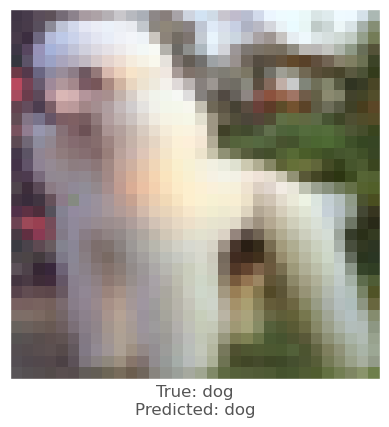



-0.0022470355
-0.0056746006
-0.005817294
vr, vg, vb :   1.966336327592818 0.002464538165379948 2.04368017380757
beam_perturbed_confidence temp :  0.62856805
beam_perturbed_confidence temp :  0.6263763
beam_perturbed_confidence temp :  0.6247223
beam_perturbed_confidence temp :  0.62856805
beam_perturbed_confidence temp :  0.6284101
beam_perturbed_confidence temp :  0.6247223
beam_perturbed_confidence temp :  0.6284101
row index :  2
21th round's confidence : 4th 0.6247223
predicted class :  dog
predicted class's confidence :  0.6247223
Lopt is :  16


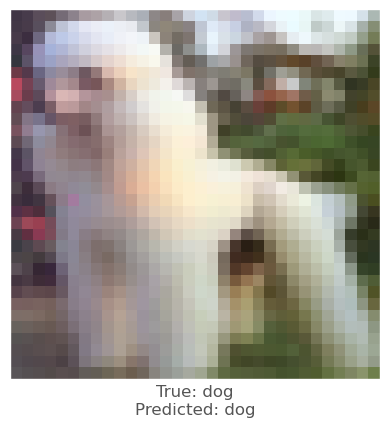



-0.0016303062
0.0003798604
-0.0036708117
vr, vg, vb :   1.1363008504608694 -0.14245637389051186 2.2448572937138307
beam_perturbed_confidence temp :  0.61668664
beam_perturbed_confidence temp :  0.6189139
beam_perturbed_confidence temp :  0.61749685
beam_perturbed_confidence temp :  0.6152707
beam_perturbed_confidence temp :  0.62034416
beam_perturbed_confidence temp :  0.6137802
beam_perturbed_confidence temp :  0.61295915
row index :  6
22th round's confidence : 0th 0.61295915
predicted class :  dog
predicted class's confidence :  0.61295915
Lopt is :  20


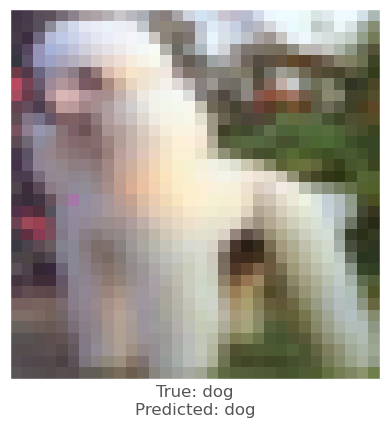



-0.004138291
-0.0018391609
-0.003586769
vr, vg, vb :   2.4366645550603367 -0.6995760120637421 1.0427943093637229
beam_perturbed_confidence temp :  0.6316847
beam_perturbed_confidence temp :  0.6334556
beam_perturbed_confidence temp :  0.62893873
beam_perturbed_confidence temp :  0.62674856
beam_perturbed_confidence temp :  0.6315821
beam_perturbed_confidence temp :  0.6300896
beam_perturbed_confidence temp :  0.6273795
row index :  3
22th round's confidence : 1th 0.62674856
predicted class :  dog
predicted class's confidence :  0.62674856
Lopt is :  15


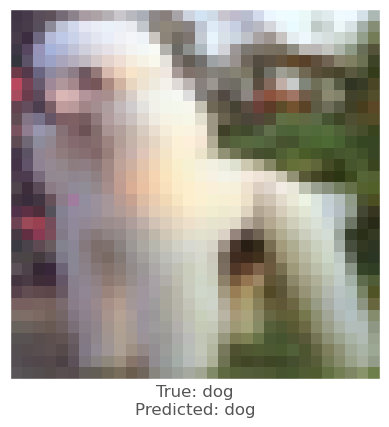



0.0038825274
0.0064311624
0.0022320747
vr, vg, vb :   -0.14166136479513286 -2.913098329380533 0.09775296239434239
beam_perturbed_confidence temp :  0.6300871
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.6541476
beam_perturbed_confidence temp :  0.6300871
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.6541476
row index :  2
22th round's confidence : 2th 0.629421
predicted class :  dog
predicted class's confidence :  0.629421
Lopt is :  15


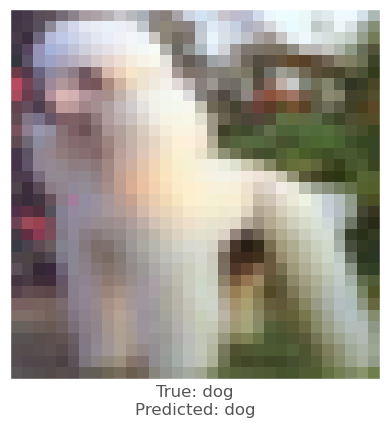



-0.0032165647
-0.0036815405
0.0009519458
vr, vg, vb :   0.607382448390082 2.1267763316400856 -0.8681134110957537
beam_perturbed_confidence temp :  0.68298113
beam_perturbed_confidence temp :  0.6796414
beam_perturbed_confidence temp :  0.6825146
beam_perturbed_confidence temp :  0.6796414
beam_perturbed_confidence temp :  0.6825146
beam_perturbed_confidence temp :  0.6782757
beam_perturbed_confidence temp :  0.6782757
row index :  5
22th round's confidence : 3th 0.6782757
predicted class :  dog
predicted class's confidence :  0.6782757
Lopt is :  31


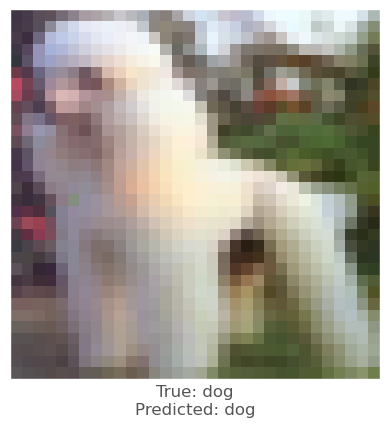



0.002908051
0.0056622624
0.00035208464
vr, vg, vb :   1.478897593438883 -0.5640081596239364 1.8041036927579897
beam_perturbed_confidence temp :  0.6284101
beam_perturbed_confidence temp :  0.6240457
beam_perturbed_confidence temp :  0.62502265
beam_perturbed_confidence temp :  0.6247385
beam_perturbed_confidence temp :  0.62892324
beam_perturbed_confidence temp :  0.6229132
beam_perturbed_confidence temp :  0.62389606
row index :  5
22th round's confidence : 4th 0.6229132
predicted class :  dog
predicted class's confidence :  0.6229132
Lopt is :  17


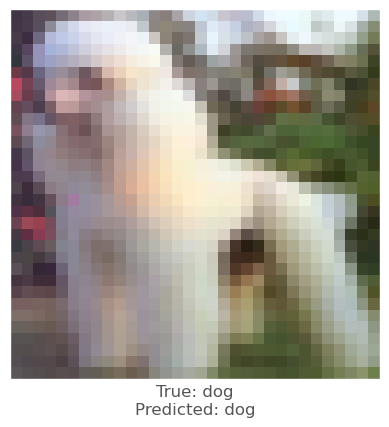



0.0020036697
0.008560538
0.0025207996
vr, vg, vb :   0.8223037915378293 -0.9842645656945759 1.7682916006583658
beam_perturbed_confidence temp :  0.61295915
beam_perturbed_confidence temp :  0.6117836
beam_perturbed_confidence temp :  0.61536473
beam_perturbed_confidence temp :  0.6117836
beam_perturbed_confidence temp :  0.61536473
beam_perturbed_confidence temp :  0.60986656
beam_perturbed_confidence temp :  0.60986656
row index :  5
23th round's confidence : 0th 0.60986656
predicted class :  dog
predicted class's confidence :  0.60986656
Lopt is :  21


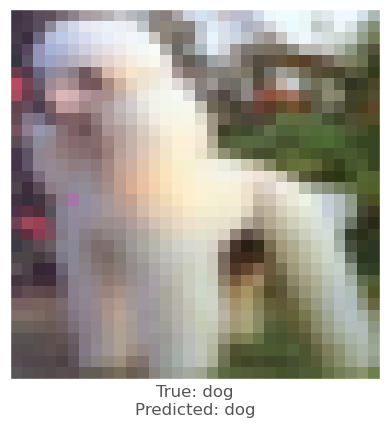



0.0009536743
0.0054118633
0.0008484125
vr, vg, vb :   2.0976306679136782 -1.1708047435600046 0.8536736270540596
beam_perturbed_confidence temp :  0.6329535
beam_perturbed_confidence temp :  0.63315266
beam_perturbed_confidence temp :  0.62674856
beam_perturbed_confidence temp :  0.6258583
beam_perturbed_confidence temp :  0.6329535
beam_perturbed_confidence temp :  0.63315266
beam_perturbed_confidence temp :  0.6258583
row index :  3
23th round's confidence : 1th 0.6258583
predicted class :  dog
predicted class's confidence :  0.6258583
Lopt is :  17


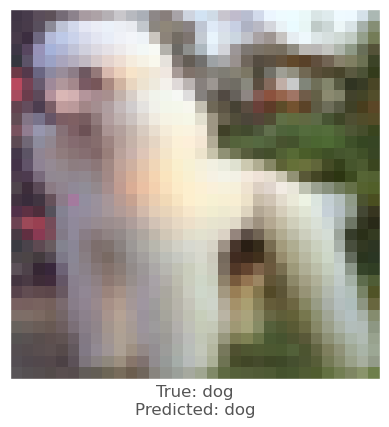



0.0038825274
0.0064311624
0.0022320747
vr, vg, vb :   -0.515747963453559 -3.264904732175512 -0.13522980759997466
beam_perturbed_confidence temp :  0.6300871
beam_perturbed_confidence temp :  0.6636846
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.67216796
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.6767664
beam_perturbed_confidence temp :  0.68541056
row index :  2
23th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


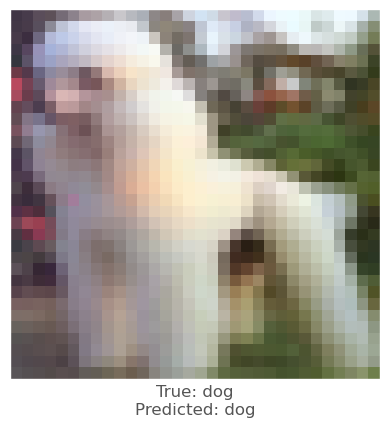



-0.0025350451
-0.0020900369
0.0013207197
vr, vg, vb :   0.8001487182452878 2.1231023853809843 -0.9133740418794889
beam_perturbed_confidence temp :  0.6782757
beam_perturbed_confidence temp :  0.67775416
beam_perturbed_confidence temp :  0.6783207
beam_perturbed_confidence temp :  0.67775416
beam_perturbed_confidence temp :  0.6783207
beam_perturbed_confidence temp :  0.67718047
beam_perturbed_confidence temp :  0.67718047
row index :  5
23th round's confidence : 3th 0.67718047
predicted class :  dog
predicted class's confidence :  0.67718047
Lopt is :  32


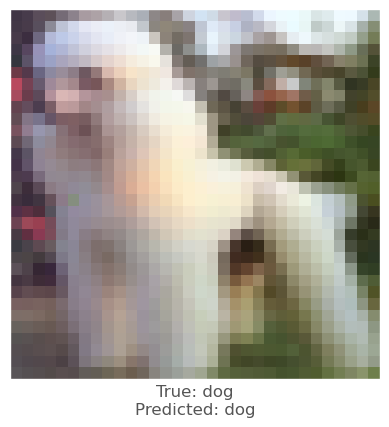



-0.001078248
-1.859665e-05
-0.0024707317
vr, vg, vb :   1.4388326364936763 -0.5057476787445505 1.8707664970051399
beam_perturbed_confidence temp :  0.62389606
beam_perturbed_confidence temp :  0.62504125
beam_perturbed_confidence temp :  0.621575
beam_perturbed_confidence temp :  0.6235256
beam_perturbed_confidence temp :  0.62411904
beam_perturbed_confidence temp :  0.62261534
beam_perturbed_confidence temp :  0.62154907
row index :  6
23th round's confidence : 4th 0.62154907
predicted class :  dog
predicted class's confidence :  0.62154907
Lopt is :  18


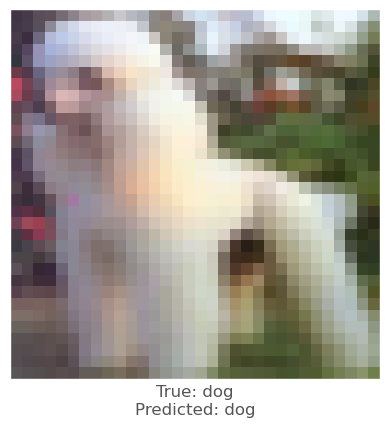



-0.0023824573
0.003222704
-0.0011060238
vr, vg, vb :   0.9783191380157602 -1.2081085024967004 1.7020648194377441
beam_perturbed_confidence temp :  0.60986656
beam_perturbed_confidence temp :  0.61902094
beam_perturbed_confidence temp :  0.6106776
beam_perturbed_confidence temp :  0.61902094
beam_perturbed_confidence temp :  0.6106776
beam_perturbed_confidence temp :  0.61300874
beam_perturbed_confidence temp :  0.61300874
row index :  0
24th round's confidence : 0th 0.60986656
predicted class :  dog
predicted class's confidence :  0.60986656
Lopt is :  21


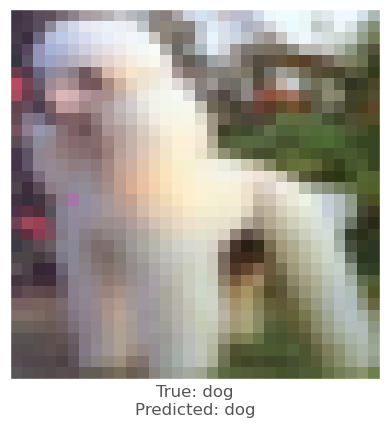



0.000679791
-0.0037772655
-0.0042993426
vr, vg, vb :   1.8198885037559775 -0.6759977143333988 1.1982405275780237
beam_perturbed_confidence temp :  0.62832737
beam_perturbed_confidence temp :  0.63244617
beam_perturbed_confidence temp :  0.6247385
beam_perturbed_confidence temp :  0.62901473
beam_perturbed_confidence temp :  0.6288442
beam_perturbed_confidence temp :  0.62617683
beam_perturbed_confidence temp :  0.6254599
row index :  2
24th round's confidence : 1th 0.6247385
predicted class :  dog
predicted class's confidence :  0.6247385
Lopt is :  17


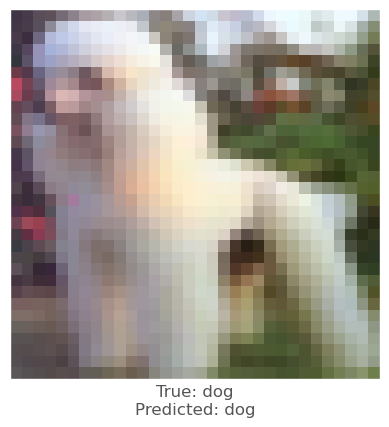



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   -0.2887447766052734 -2.909845752717116 0.219583408679432
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.6656387
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6656387
row index :  2
24th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


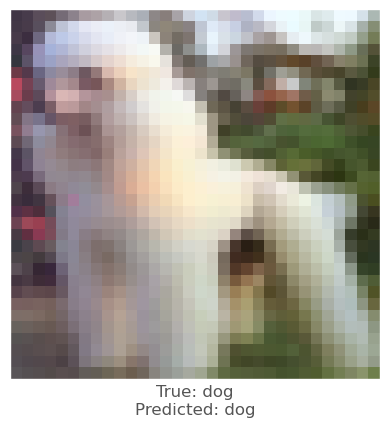



-0.0018380284
-0.0010054708
0.0018514991
vr, vg, vb :   0.9039366895146311 2.0113392221144926 -1.007186545757336
beam_perturbed_confidence temp :  0.67718047
beam_perturbed_confidence temp :  0.67648244
beam_perturbed_confidence temp :  0.6750741
beam_perturbed_confidence temp :  0.67648244
beam_perturbed_confidence temp :  0.6750741
beam_perturbed_confidence temp :  0.6733225
beam_perturbed_confidence temp :  0.6733225
row index :  5
24th round's confidence : 3th 0.6733225
predicted class :  dog
predicted class's confidence :  0.6733225
Lopt is :  34


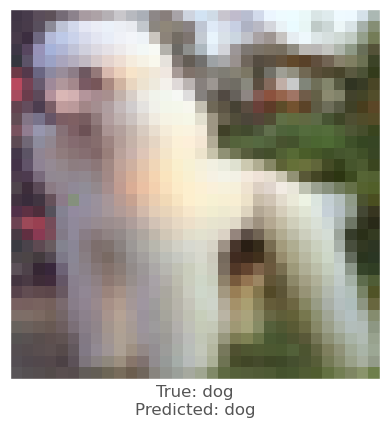



0.0013631582
0.0006298423
-0.0031042695
vr, vg, vb :   1.1586335502429903 -0.5181571390042508 1.994116797759338
beam_perturbed_confidence temp :  0.6239785
beam_perturbed_confidence temp :  0.6234892
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.6230966
beam_perturbed_confidence temp :  0.6222732
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.6205868
row index :  2
24th round's confidence : 4th 0.62042135
predicted class :  dog
predicted class's confidence :  0.62042135
Lopt is :  18


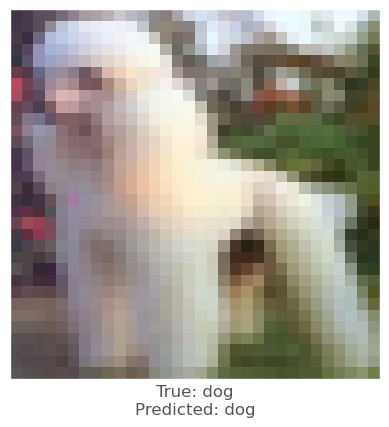



-0.0023824573
0.003222704
-0.0011060238
vr, vg, vb :   1.118732949845898 -1.4095680456186124 1.6424607163391847
beam_perturbed_confidence temp :  0.61094934
beam_perturbed_confidence temp :  0.61902094
beam_perturbed_confidence temp :  0.6106776
beam_perturbed_confidence temp :  0.6142705
beam_perturbed_confidence temp :  0.6128994
beam_perturbed_confidence temp :  0.61300874
beam_perturbed_confidence temp :  0.60879326
row index :  6
25th round's confidence : 0th 0.60879326
predicted class :  dog
predicted class's confidence :  0.60879326
Lopt is :  23


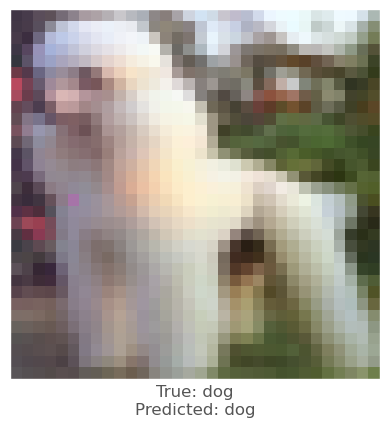



0.004798472
0.0022332668
-0.0019622445
vr, vg, vb :   1.1580524606160976 -0.8317246259444926 1.2746409258852849
beam_perturbed_confidence temp :  0.6288442
beam_perturbed_confidence temp :  0.62617683
beam_perturbed_confidence temp :  0.62389606
beam_perturbed_confidence temp :  0.6254599
beam_perturbed_confidence temp :  0.6278526
beam_perturbed_confidence temp :  0.6235256
beam_perturbed_confidence temp :  0.62527347
row index :  5
25th round's confidence : 1th 0.6235256
predicted class :  dog
predicted class's confidence :  0.6235256
Lopt is :  18


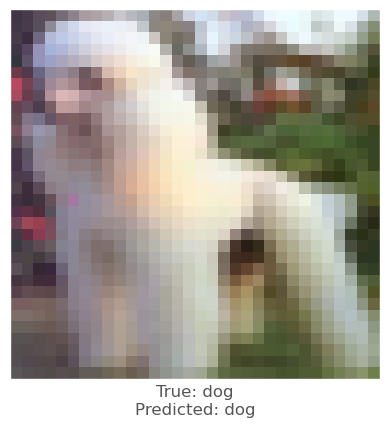



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   -0.08444190844181643 -2.5902926712045597 0.538915303330898
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.6656387
beam_perturbed_confidence temp :  0.63448966
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6656387
row index :  2
25th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


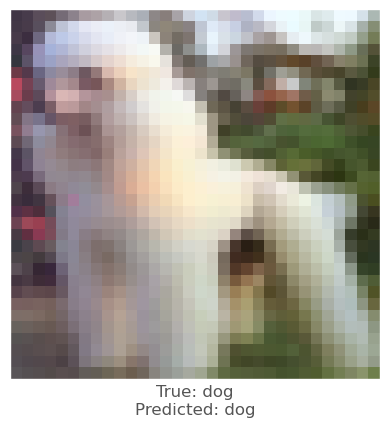



-0.0024006963
-0.000792861
0.00210917
vr, vg, vb :   1.053612648325009 1.889491398383268 -1.1173848871837997
beam_perturbed_confidence temp :  0.6726864
beam_perturbed_confidence temp :  0.67338747
beam_perturbed_confidence temp :  0.67224723
beam_perturbed_confidence temp :  0.67393273
beam_perturbed_confidence temp :  0.670371
beam_perturbed_confidence temp :  0.67103666
beam_perturbed_confidence temp :  0.66987646
row index :  6
25th round's confidence : 3th 0.66987646
predicted class :  dog
predicted class's confidence :  0.66987646
Lopt is :  36


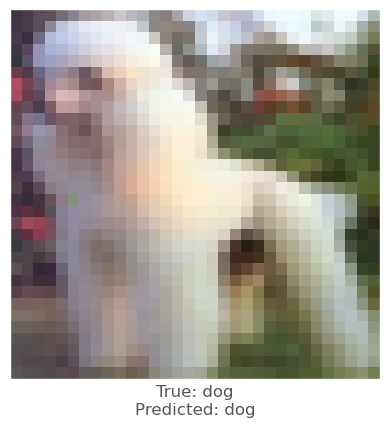



0.0014537573
0.00209862
-0.0029304028
vr, vg, vb :   0.8973944666115137 -0.6762034188934986 2.0877453935571344
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.61929375
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.61929375
beam_perturbed_confidence temp :  0.6159474
beam_perturbed_confidence temp :  0.6159474
row index :  5
25th round's confidence : 4th 0.6159474
predicted class :  dog
predicted class's confidence :  0.6159474
Lopt is :  19


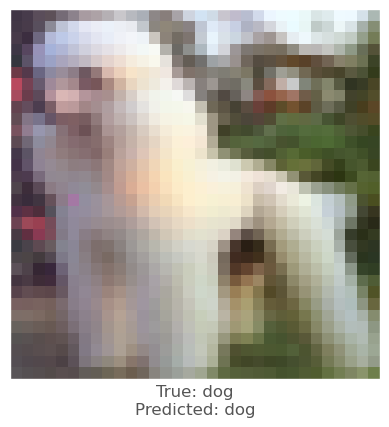



-0.006472647
-0.010735869
-0.008217096
vr, vg, vb :   1.6541243738707077 -0.1950243002913703 2.2999242775788016
beam_perturbed_confidence temp :  0.6065361
beam_perturbed_confidence temp :  0.6172455
beam_perturbed_confidence temp :  0.60552067
beam_perturbed_confidence temp :  0.61284405
beam_perturbed_confidence temp :  0.605874
beam_perturbed_confidence temp :  0.6067189
beam_perturbed_confidence temp :  0.60374796
row index :  6
26th round's confidence : 0th 0.60374796
predicted class :  dog
predicted class's confidence :  0.60374796
Lopt is :  24


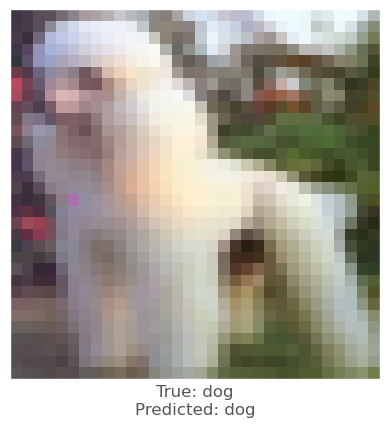



0.0002322197
-0.0055859685
-0.004627764
vr, vg, vb :   1.0190252449499957 -0.18995531390851506 1.6099532557973668
beam_perturbed_confidence temp :  0.62527347
beam_perturbed_confidence temp :  0.62948203
beam_perturbed_confidence temp :  0.62154907
beam_perturbed_confidence temp :  0.6261948
beam_perturbed_confidence temp :  0.6239785
beam_perturbed_confidence temp :  0.6234892
beam_perturbed_confidence temp :  0.6230966
row index :  2
26th round's confidence : 1th 0.62154907
predicted class :  dog
predicted class's confidence :  0.62154907
Lopt is :  18


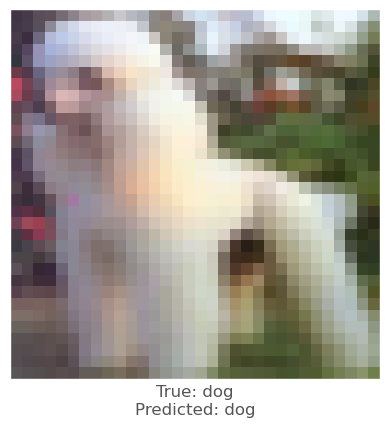



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   0.0994306729052949 -2.302694897843259 0.8263140085172174
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.65735424
row index :  0
26th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


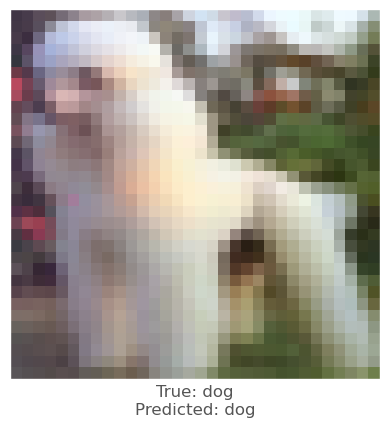



-0.00045460463
0.0012173057
0.002413392
vr, vg, vb :   0.9937118460626986 1.578811692520161 -1.2469856051609765
beam_perturbed_confidence temp :  0.66987646
beam_perturbed_confidence temp :  0.6715883
beam_perturbed_confidence temp :  0.6694013
beam_perturbed_confidence temp :  0.6715883
beam_perturbed_confidence temp :  0.6694013
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.66922724
row index :  5
26th round's confidence : 3th 0.66922724
predicted class :  dog
predicted class's confidence :  0.66922724
Lopt is :  38


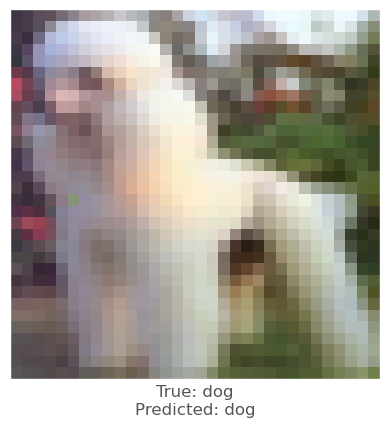



-0.0016303062
0.0003798604
-0.0036708117
vr, vg, vb :   0.9706856443400108 -0.6465691171195052 2.2460520195151417
beam_perturbed_confidence temp :  0.6159474
beam_perturbed_confidence temp :  0.6189139
beam_perturbed_confidence temp :  0.61749685
beam_perturbed_confidence temp :  0.6189139
beam_perturbed_confidence temp :  0.61749685
beam_perturbed_confidence temp :  0.6137802
beam_perturbed_confidence temp :  0.6137802
row index :  5
26th round's confidence : 4th 0.6137802
predicted class :  dog
predicted class's confidence :  0.6137802
Lopt is :  20


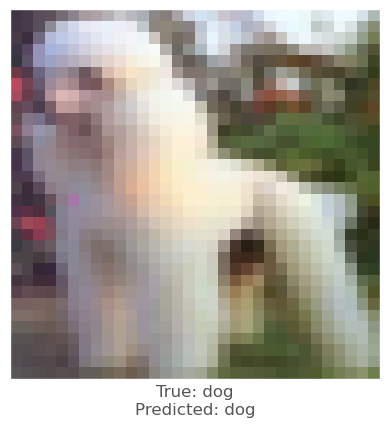



-0.0026047826
-0.0043503046
-0.005202949
vr, vg, vb :   1.7491901946165715 0.2595085900954327 2.590226754529784
beam_perturbed_confidence temp :  0.6041141
beam_perturbed_confidence temp :  0.60374796
beam_perturbed_confidence temp :  0.6041453
beam_perturbed_confidence temp :  0.6041141
beam_perturbed_confidence temp :  0.6080092
beam_perturbed_confidence temp :  0.6041453
beam_perturbed_confidence temp :  0.6080092
row index :  1
27th round's confidence : 0th 0.60374796
predicted class :  dog
predicted class's confidence :  0.60374796
Lopt is :  24


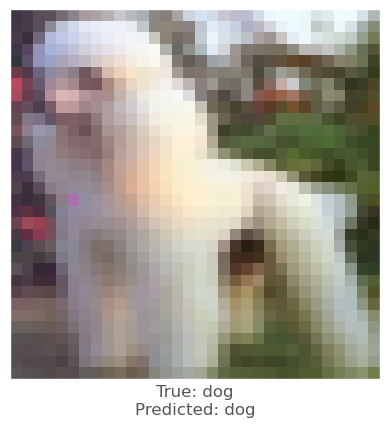



0.0013631582
0.0006298423
-0.0031042695
vr, vg, vb :   0.7808068978536777 -0.23394401065181883 1.759384880672342
beam_perturbed_confidence temp :  0.62154907
beam_perturbed_confidence temp :  0.6234892
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.6234892
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.62171644
row index :  2
27th round's confidence : 1th 0.62042135
predicted class :  dog
predicted class's confidence :  0.62042135
Lopt is :  18


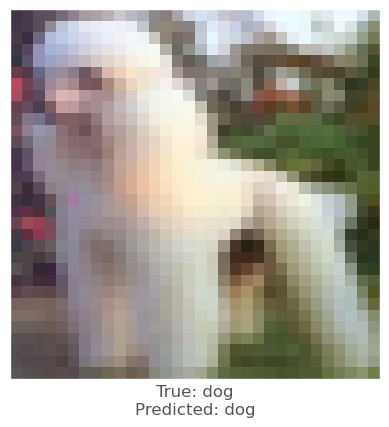



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   0.2649159961176951 -2.0438569018180885 1.0849728431849048
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.65735424
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.64753306
beam_perturbed_confidence temp :  0.64753306
row index :  0
27th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


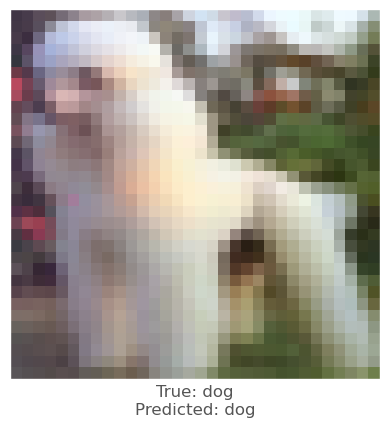



-0.00072962046
0.001355648
0.00027680397
vr, vg, vb :   0.9673027071259844 1.2853657191909964 -1.1499674416785703
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.67075694
beam_perturbed_confidence temp :  0.670226
beam_perturbed_confidence temp :  0.67075694
beam_perturbed_confidence temp :  0.670226
beam_perturbed_confidence temp :  0.6706264
beam_perturbed_confidence temp :  0.6706264
row index :  0
27th round's confidence : 3th 0.66922724
predicted class :  dog
predicted class's confidence :  0.66922724
Lopt is :  38


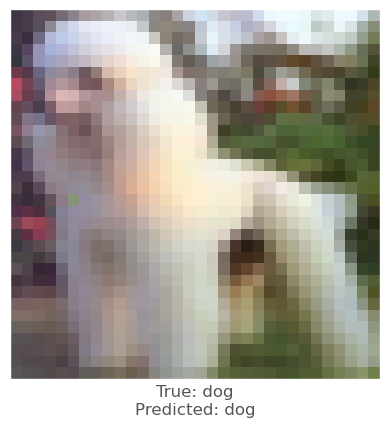



-0.0041096807
0.0016284585
-0.0016315579
vr, vg, vb :   1.2845851451678505 -0.7447580553983993 2.1846026117073043
beam_perturbed_confidence temp :  0.61295915
beam_perturbed_confidence temp :  0.6158684
beam_perturbed_confidence temp :  0.61626786
beam_perturbed_confidence temp :  0.6117836
beam_perturbed_confidence temp :  0.6176823
beam_perturbed_confidence temp :  0.61316615
beam_perturbed_confidence temp :  0.6106776
row index :  6
27th round's confidence : 4th 0.6106776
predicted class :  dog
predicted class's confidence :  0.6106776
Lopt is :  21


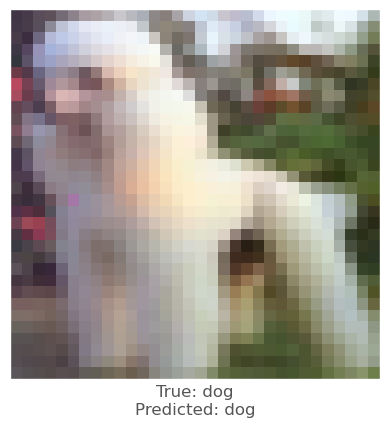



-0.0026047826
-0.0043503046
-0.005202949
vr, vg, vb :   1.834749433287849 0.6685881914435554 2.851498983785668
beam_perturbed_confidence temp :  0.6041141
beam_perturbed_confidence temp :  0.60374796
beam_perturbed_confidence temp :  0.6041453
beam_perturbed_confidence temp :  0.6041141
beam_perturbed_confidence temp :  0.6080092
beam_perturbed_confidence temp :  0.6041453
beam_perturbed_confidence temp :  0.6080092
row index :  1
28th round's confidence : 0th 0.60374796
predicted class :  dog
predicted class's confidence :  0.60374796
Lopt is :  24


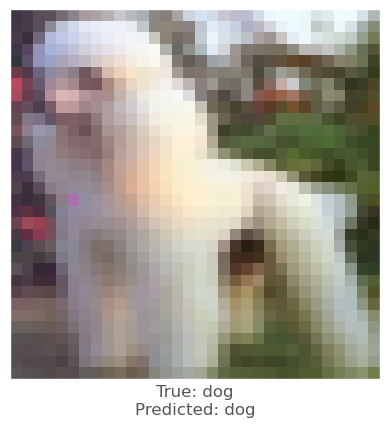



0.0014537573
0.00209862
-0.0029304028
vr, vg, vb :   0.5573504794611323 -0.4204116033763098 1.8764866681788384
beam_perturbed_confidence temp :  0.62042135
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.61861867
beam_perturbed_confidence temp :  0.62171644
beam_perturbed_confidence temp :  0.61861867
beam_perturbed_confidence temp :  0.618976
beam_perturbed_confidence temp :  0.618976
row index :  2
28th round's confidence : 1th 0.61861867
predicted class :  dog
predicted class's confidence :  0.61861867
Lopt is :  18


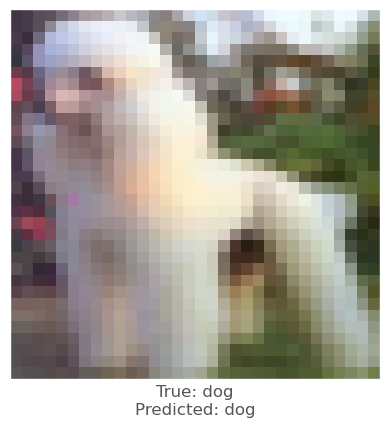



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   0.4138527870088553 -1.810902705395435 1.3177657943858234
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.644362
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.644362
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.63720787
beam_perturbed_confidence temp :  0.63720787
row index :  0
28th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


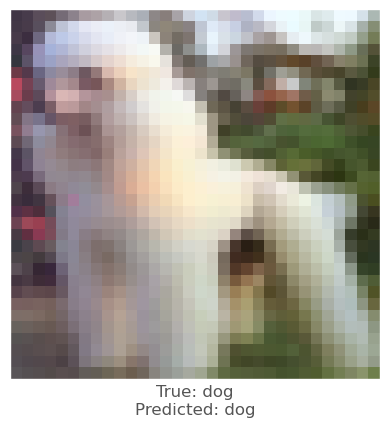



-0.00072962046
0.001355648
0.00027680397
vr, vg, vb :   0.9435344820829417 1.0212643431947483 -1.0626510945444048
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.67075694
beam_perturbed_confidence temp :  0.670226
beam_perturbed_confidence temp :  0.67075694
beam_perturbed_confidence temp :  0.670226
beam_perturbed_confidence temp :  0.6706264
beam_perturbed_confidence temp :  0.6706264
row index :  0
28th round's confidence : 3th 0.66922724
predicted class :  dog
predicted class's confidence :  0.66922724
Lopt is :  38


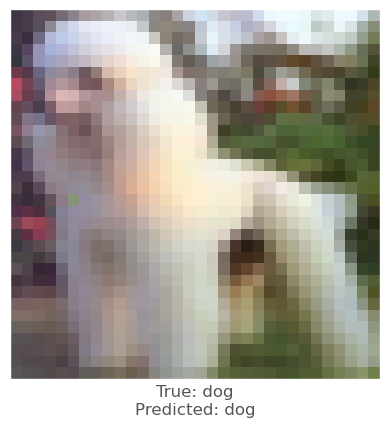



-0.00026673079
0.008156478
0.0035618544
vr, vg, vb :   1.1827997091880529 -1.4859300903584374 1.6099569142877945
beam_perturbed_confidence temp :  0.6128994
beam_perturbed_confidence temp :  0.61300874
beam_perturbed_confidence temp :  0.6134284
beam_perturbed_confidence temp :  0.60879326
beam_perturbed_confidence temp :  0.6158088
beam_perturbed_confidence temp :  0.610204
beam_perturbed_confidence temp :  0.6060534
row index :  6
28th round's confidence : 4th 0.6060534
predicted class :  dog
predicted class's confidence :  0.6060534
Lopt is :  23


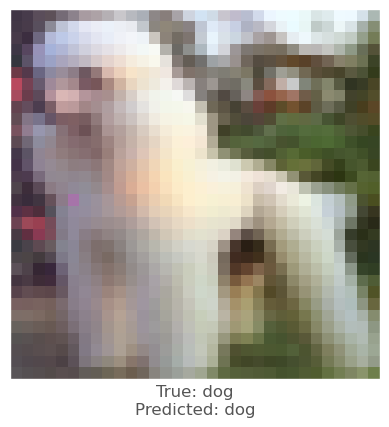



-0.0026047826
-0.0043503046
-0.005202949
vr, vg, vb :   1.9117527480919987 1.0367598326568659 3.0866439901159635
beam_perturbed_confidence temp :  0.6041141
beam_perturbed_confidence temp :  0.605874
beam_perturbed_confidence temp :  0.60877824
beam_perturbed_confidence temp :  0.6088569
beam_perturbed_confidence temp :  0.6150426
beam_perturbed_confidence temp :  0.6220215
beam_perturbed_confidence temp :  0.6275698
row index :  0
29th round's confidence : 0th 0.6041141
predicted class :  dog
predicted class's confidence :  0.6041141
Lopt is :  24


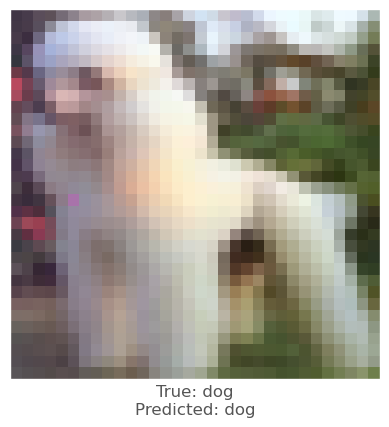



0.0033053756
0.0067937374
-0.0011276007
vr, vg, vb :   0.17107787391309037 -1.0577441841885813 1.8015980683470385
beam_perturbed_confidence temp :  0.61861867
beam_perturbed_confidence temp :  0.62152654
beam_perturbed_confidence temp :  0.61929375
beam_perturbed_confidence temp :  0.62152654
beam_perturbed_confidence temp :  0.61929375
beam_perturbed_confidence temp :  0.6189139
beam_perturbed_confidence temp :  0.6189139
row index :  0
29th round's confidence : 1th 0.61861867
predicted class :  dog
predicted class's confidence :  0.61861867
Lopt is :  18


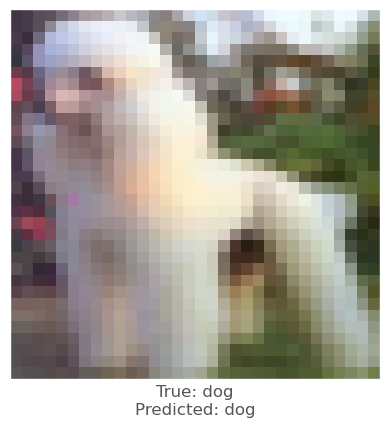



-0.0017542839
-0.00028568506
-0.0034129024
vr, vg, vb :   0.5478958988108995 -1.6012439286150468 1.5272794504666503
beam_perturbed_confidence temp :  0.6290053
beam_perturbed_confidence temp :  0.644362
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.644362
beam_perturbed_confidence temp :  0.629421
beam_perturbed_confidence temp :  0.63720787
beam_perturbed_confidence temp :  0.63720787
row index :  0
29th round's confidence : 2th 0.6290053
predicted class :  dog
predicted class's confidence :  0.6290053
Lopt is :  15


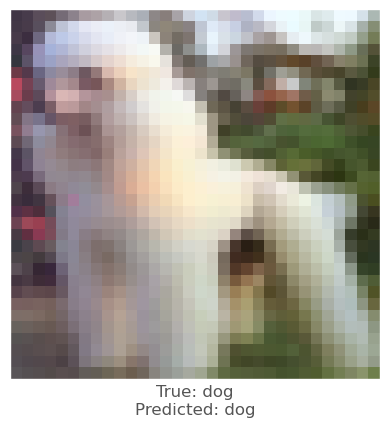



-0.00072962046
0.001355648
0.00027680397
vr, vg, vb :   0.9221430795442032 0.7835731047981251 -0.9840663821236557
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.66964936
beam_perturbed_confidence temp :  0.66922724
beam_perturbed_confidence temp :  0.66964936
beam_perturbed_confidence temp :  0.66964936
beam_perturbed_confidence temp :  0.66964936
row index :  0
29th round's confidence : 3th 0.66922724
predicted class :  dog
predicted class's confidence :  0.66922724
Lopt is :  38


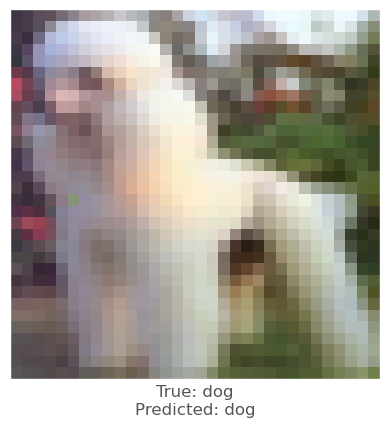



-0.00475657
-0.0022975206
-0.003272593
vr, vg, vb :   1.54017672450582 -1.107585017571373 1.7762205249982974
beam_perturbed_confidence temp :  0.6054474
beam_perturbed_confidence temp :  0.6223117
beam_perturbed_confidence temp :  0.60552067
beam_perturbed_confidence temp :  0.6157905
beam_perturbed_confidence temp :  0.605874
beam_perturbed_confidence temp :  0.6139591
beam_perturbed_confidence temp :  0.6102243
row index :  0
29th round's confidence : 4th 0.6054474
predicted class :  dog
predicted class's confidence :  0.6054474
Lopt is :  23


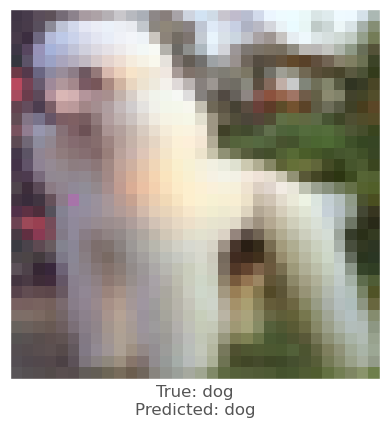






6th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  179 185 215
-0.0037670135
-0.0032297373
-0.0047307014
vr, vg, vb :   0.37670135498046875 0.32297372817993164 0.4730701446533203
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
row index :  0
0th round's confidence : 0th 0.66862947
predicted class :  dog
predicted class's confidence :  0.66862947
Lopt is :  0


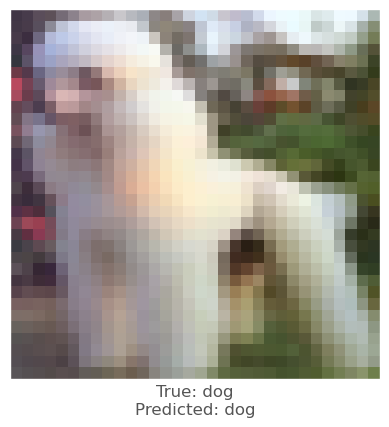






7th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  201 206 189
0.0034579635
-0.0038970113
-0.007973373
vr, vg, vb :   -0.3457963466644287 0.38970112800598145 0.7973372936248779
beam_perturbed_confidence temp :  0.6672031
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6672031
beam_perturbed_confidence temp :  0.6672031
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6672031
row index :  0
0th round's confidence : 0th 0.6672031
predicted class :  dog
predicted class's confidence :  0.6672031
Lopt is :  1


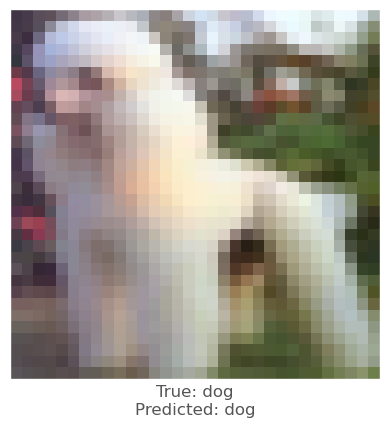



0.0019967556
-0.0052525997
-0.008026898
vr, vg, vb :   -0.1996755599975586 0.5252599716186523 0.802689790725708
beam_perturbed_confidence temp :  0.6976755
beam_perturbed_confidence temp :  0.69873846
beam_perturbed_confidence temp :  0.69873846
beam_perturbed_confidence temp :  0.6976755
beam_perturbed_confidence temp :  0.6976755
beam_perturbed_confidence temp :  0.69873846
beam_perturbed_confidence temp :  0.6976755
row index :  0
0th round's confidence : 1th 0.6976755
predicted class :  dog
predicted class's confidence :  0.6976755
Lopt is :  6


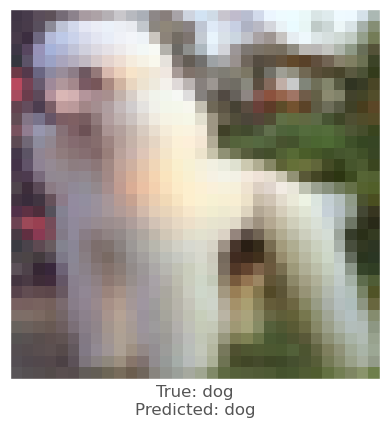



0.010791361
0.0059973
-0.00043565035
vr, vg, vb :   -1.0791361331939697 -0.5997300148010254 0.04356503486633301
beam_perturbed_confidence temp :  0.7042278
beam_perturbed_confidence temp :  0.7131679
beam_perturbed_confidence temp :  0.7160309
beam_perturbed_confidence temp :  0.6992664
beam_perturbed_confidence temp :  0.7042278
beam_perturbed_confidence temp :  0.7131679
beam_perturbed_confidence temp :  0.6992664
row index :  3
0th round's confidence : 2th 0.6992664
predicted class :  dog
predicted class's confidence :  0.6992664
Lopt is :  5


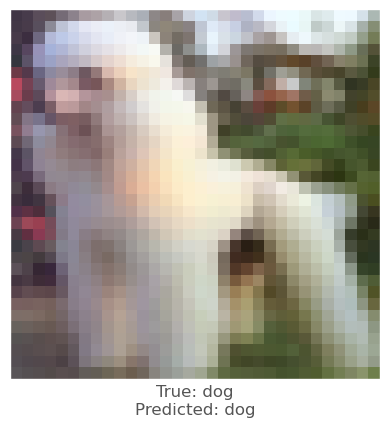



0.00031131506
-0.007641554
-0.0064299107
vr, vg, vb :   -0.031131505966186523 0.764155387878418 0.6429910659790039
beam_perturbed_confidence temp :  0.7340665
beam_perturbed_confidence temp :  0.73437303
beam_perturbed_confidence temp :  0.73437303
beam_perturbed_confidence temp :  0.7340665
beam_perturbed_confidence temp :  0.7340665
beam_perturbed_confidence temp :  0.73437303
beam_perturbed_confidence temp :  0.7340665
row index :  0
0th round's confidence : 3th 0.7340665
predicted class :  dog
predicted class's confidence :  0.7340665
Lopt is :  11


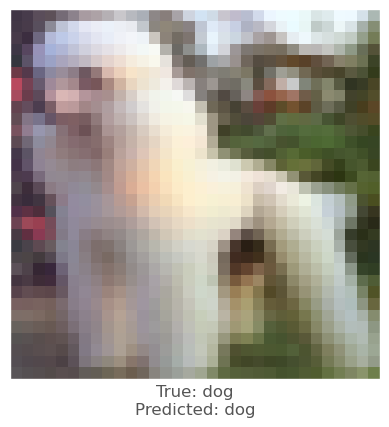



0.0064383745
0.0017575026
-0.0009844303
vr, vg, vb :   -0.6438374519348145 -0.1757502555847168 0.09844303131103516
beam_perturbed_confidence temp :  0.7474463
beam_perturbed_confidence temp :  0.7497094
beam_perturbed_confidence temp :  0.7509482
beam_perturbed_confidence temp :  0.7467781
beam_perturbed_confidence temp :  0.7474463
beam_perturbed_confidence temp :  0.7497094
beam_perturbed_confidence temp :  0.7467781
row index :  3
0th round's confidence : 4th 0.7467781
predicted class :  dog
predicted class's confidence :  0.7467781
Lopt is :  10


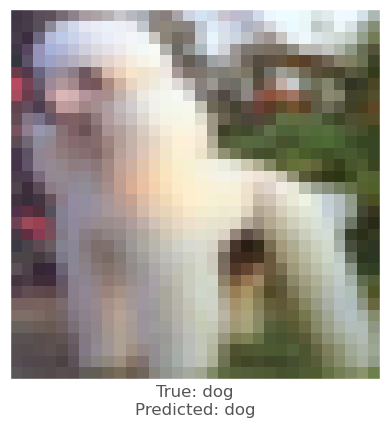



0.0031574368
-0.004799247
-0.008432269
vr, vg, vb :   -0.6269603967666626 0.8306556940078735 1.5608304738998413
beam_perturbed_confidence temp :  0.66547203
beam_perturbed_confidence temp :  0.6672031
beam_perturbed_confidence temp :  0.6629324
beam_perturbed_confidence temp :  0.66547203
beam_perturbed_confidence temp :  0.66112334
beam_perturbed_confidence temp :  0.6629324
beam_perturbed_confidence temp :  0.66112334
row index :  4
1th round's confidence : 0th 0.66112334
predicted class :  dog
predicted class's confidence :  0.66112334
Lopt is :  2


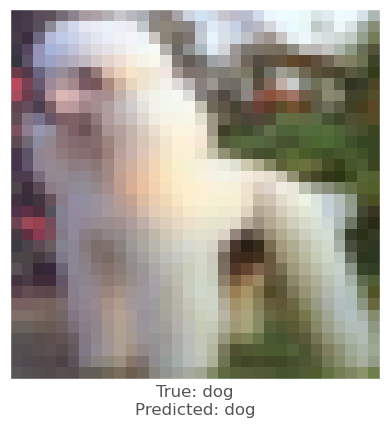



0.0018978119
-0.0054669976
-0.0075413585
vr, vg, vb :   -0.3694891929626465 1.0194337368011475 1.476556658744812
beam_perturbed_confidence temp :  0.69684064
beam_perturbed_confidence temp :  0.69518435
beam_perturbed_confidence temp :  0.6938763
beam_perturbed_confidence temp :  0.6939966
beam_perturbed_confidence temp :  0.69309926
beam_perturbed_confidence temp :  0.69098204
beam_perturbed_confidence temp :  0.6902566
row index :  6
1th round's confidence : 1th 0.6902566
predicted class :  dog
predicted class's confidence :  0.6902566
Lopt is :  7


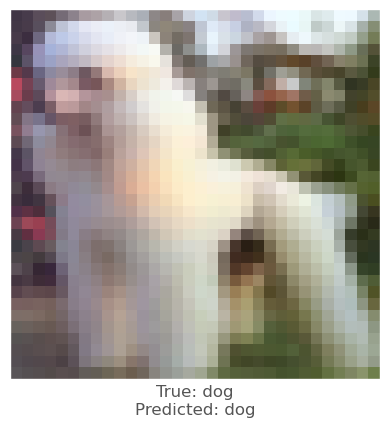



0.016841471
0.011348784
0.0019918084
vr, vg, vb :   -2.6553696393966675 -1.674635410308838 -0.15997231006622314
beam_perturbed_confidence temp :  0.66992337
beam_perturbed_confidence temp :  0.6853879
beam_perturbed_confidence temp :  0.6979354
beam_perturbed_confidence temp :  0.65882915
beam_perturbed_confidence temp :  0.6689488
beam_perturbed_confidence temp :  0.68435234
beam_perturbed_confidence temp :  0.6602523
row index :  3
1th round's confidence : 2th 0.65882915
predicted class :  dog
predicted class's confidence :  0.65882915
Lopt is :  5


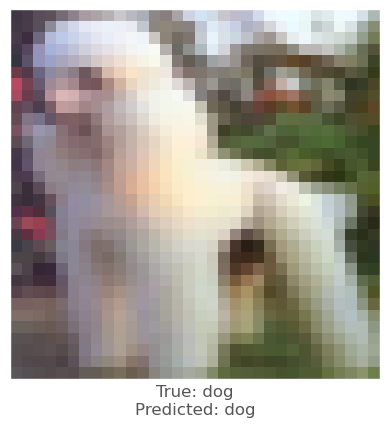



0.000859499
-0.006623745
-0.005766332
vr, vg, vb :   -0.11396825313568115 1.350114345550537 1.155325174331665
beam_perturbed_confidence temp :  0.73351353
beam_perturbed_confidence temp :  0.73013294
beam_perturbed_confidence temp :  0.7309464
beam_perturbed_confidence temp :  0.73024714
beam_perturbed_confidence temp :  0.7306897
beam_perturbed_confidence temp :  0.7261439
beam_perturbed_confidence temp :  0.72663254
row index :  5
1th round's confidence : 3th 0.7261439
predicted class :  dog
predicted class's confidence :  0.7261439
Lopt is :  11


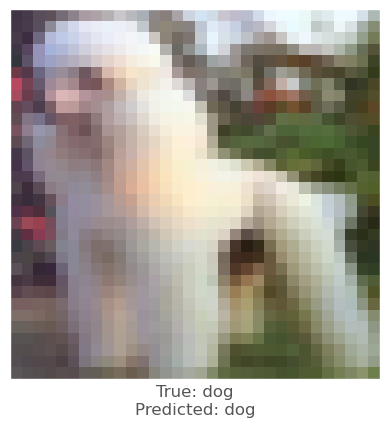



0.006214559
0.0017448068
-0.0016948581
vr, vg, vb :   -1.2009096145629883 -0.3326559066772461 0.2580845355987549
beam_perturbed_confidence temp :  0.7398674
beam_perturbed_confidence temp :  0.7457015
beam_perturbed_confidence temp :  0.7467781
beam_perturbed_confidence temp :  0.7375542
beam_perturbed_confidence temp :  0.7398674
beam_perturbed_confidence temp :  0.7457015
beam_perturbed_confidence temp :  0.7375542
row index :  3
1th round's confidence : 4th 0.7375542
predicted class :  dog
predicted class's confidence :  0.7375542
Lopt is :  10


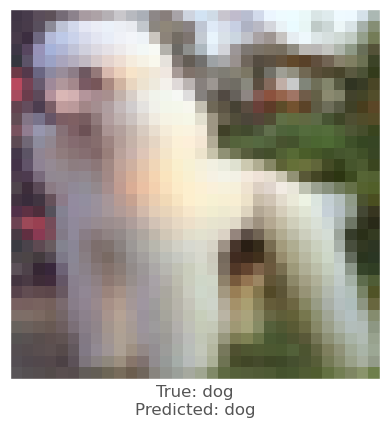



0.0035427809
-0.005205035
-0.008698761
vr, vg, vb :   -0.9185424447059631 1.2680936455726624 2.2746235728263855
beam_perturbed_confidence temp :  0.6593896
beam_perturbed_confidence temp :  0.65878004
beam_perturbed_confidence temp :  0.652026
beam_perturbed_confidence temp :  0.6568824
beam_perturbed_confidence temp :  0.65038574
beam_perturbed_confidence temp :  0.649308
beam_perturbed_confidence temp :  0.6477151
row index :  6
2th round's confidence : 0th 0.6477151
predicted class :  dog
predicted class's confidence :  0.6477151
Lopt is :  3


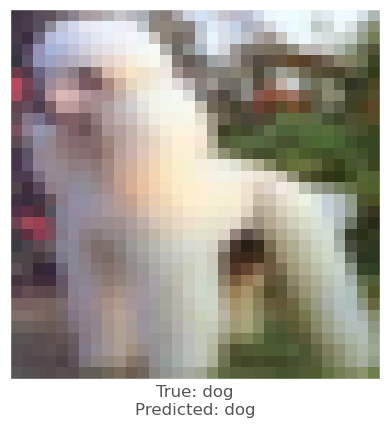



0.0014260411
-0.0057832003
-0.007730305
vr, vg, vb :   -0.4751443862915039 1.4958103895187378 2.1019315123558044
beam_perturbed_confidence temp :  0.689556
beam_perturbed_confidence temp :  0.68731606
beam_perturbed_confidence temp :  0.68226796
beam_perturbed_confidence temp :  0.68667054
beam_perturbed_confidence temp :  0.68191546
beam_perturbed_confidence temp :  0.67768455
beam_perturbed_confidence temp :  0.67750615
row index :  6
2th round's confidence : 1th 0.67750615
predicted class :  dog
predicted class's confidence :  0.67750615
Lopt is :  8


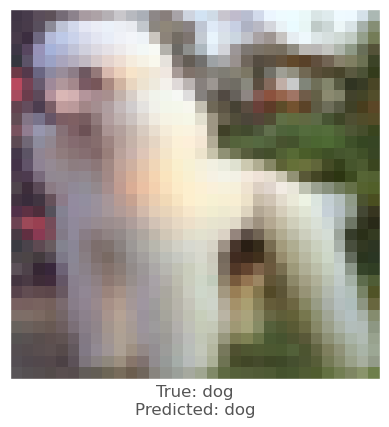



0.0143021345
0.007646501
-0.0025635958
vr, vg, vb :   -3.820046126842499 -2.271821975708008 0.11238449811935425
beam_perturbed_confidence temp :  0.63554746
beam_perturbed_confidence temp :  0.65074104
beam_perturbed_confidence temp :  0.65882915
beam_perturbed_confidence temp :  0.6428512
beam_perturbed_confidence temp :  0.63554746
beam_perturbed_confidence temp :  0.65074104
beam_perturbed_confidence temp :  0.6428512
row index :  0
2th round's confidence : 2th 0.63554746
predicted class :  dog
predicted class's confidence :  0.63554746
Lopt is :  5


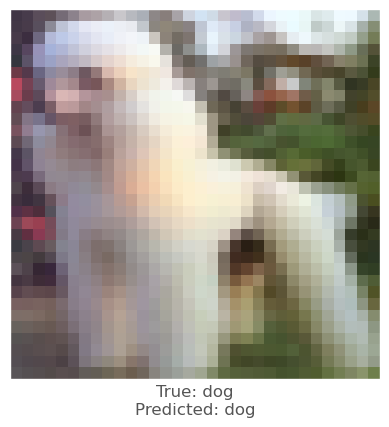



-0.0008289218
-0.009280622
-0.0077936053
vr, vg, vb :   -0.019679248332977295 2.143165111541748 1.8191531896591187
beam_perturbed_confidence temp :  0.72663254
beam_perturbed_confidence temp :  0.71703255
beam_perturbed_confidence temp :  0.72233933
beam_perturbed_confidence temp :  0.7176898
beam_perturbed_confidence temp :  0.7225883
beam_perturbed_confidence temp :  0.7132012
beam_perturbed_confidence temp :  0.7139572
row index :  5
2th round's confidence : 3th 0.7132012
predicted class :  dog
predicted class's confidence :  0.7132012
Lopt is :  11


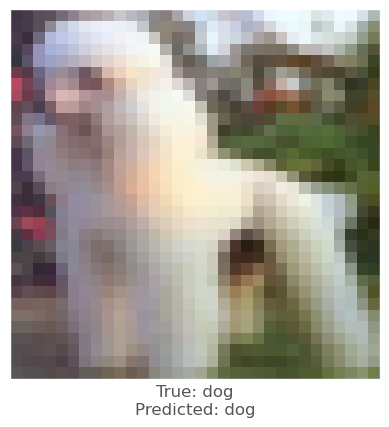



0.009195149
0.0050244927
-3.248453e-05
vr, vg, vb :   -2.000333547592163 -0.8018395900726318 0.23552453517913818
beam_perturbed_confidence temp :  0.7230183
beam_perturbed_confidence temp :  0.7348429
beam_perturbed_confidence temp :  0.7375542
beam_perturbed_confidence temp :  0.7201956
beam_perturbed_confidence temp :  0.7230183
beam_perturbed_confidence temp :  0.7348429
beam_perturbed_confidence temp :  0.7201956
row index :  3
2th round's confidence : 4th 0.7201956
predicted class :  dog
predicted class's confidence :  0.7201956
Lopt is :  10


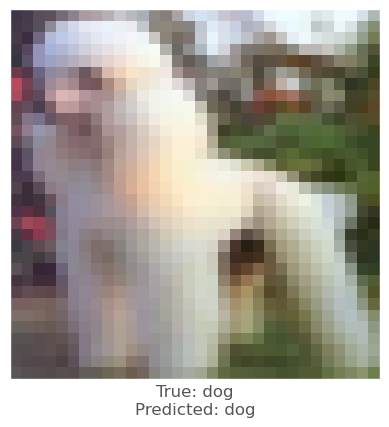



0.0027772784
-0.0048740506
-0.009758294
vr, vg, vb :   -1.1044160425662994 1.628689342737198 3.0229905784130096
beam_perturbed_confidence temp :  0.64534855
beam_perturbed_confidence temp :  0.6455117
beam_perturbed_confidence temp :  0.63578993
beam_perturbed_confidence temp :  0.64334065
beam_perturbed_confidence temp :  0.6306203
beam_perturbed_confidence temp :  0.6367584
beam_perturbed_confidence temp :  0.62895733
row index :  6
3th round's confidence : 0th 0.62895733
predicted class :  dog
predicted class's confidence :  0.62895733
Lopt is :  6


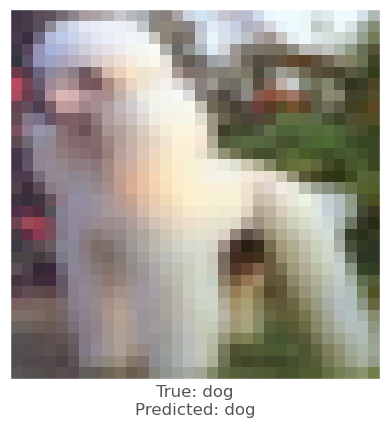



-0.0004300475
-0.008440971
-0.009333491
vr, vg, vb :   -0.3846251964569092 2.190326488018036 2.825087493658066
beam_perturbed_confidence temp :  0.6781146
beam_perturbed_confidence temp :  0.67086226
beam_perturbed_confidence temp :  0.66845363
beam_perturbed_confidence temp :  0.6700879
beam_perturbed_confidence temp :  0.6698672
beam_perturbed_confidence temp :  0.66184753
beam_perturbed_confidence temp :  0.66133684
row index :  6
3th round's confidence : 1th 0.66133684
predicted class :  dog
predicted class's confidence :  0.66133684
Lopt is :  9


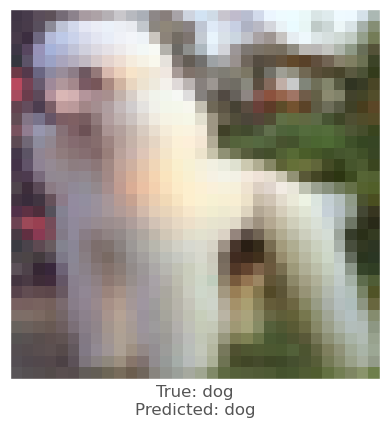



0.006206155
-0.0018271804
-0.0073392987
vr, vg, vb :   -4.058656996488571 -1.8619217395782472 0.8350759208202362
beam_perturbed_confidence temp :  0.62932336
beam_perturbed_confidence temp :  0.6396925
beam_perturbed_confidence temp :  0.63554746
beam_perturbed_confidence temp :  0.63744175
beam_perturbed_confidence temp :  0.62932336
beam_perturbed_confidence temp :  0.6396925
beam_perturbed_confidence temp :  0.63744175
row index :  0
3th round's confidence : 2th 0.62932336
predicted class :  dog
predicted class's confidence :  0.62932336
Lopt is :  9


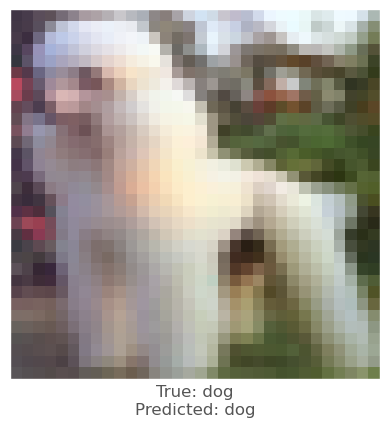



-0.0018708706
-0.010332048
-0.008059025
vr, vg, vb :   0.16937573552131652 2.962053394317627 2.4431403517723087
beam_perturbed_confidence temp :  0.7132012
beam_perturbed_confidence temp :  0.702989
beam_perturbed_confidence temp :  0.70416987
beam_perturbed_confidence temp :  0.702989
beam_perturbed_confidence temp :  0.70416987
beam_perturbed_confidence temp :  0.69526696
beam_perturbed_confidence temp :  0.69526696
row index :  5
3th round's confidence : 3th 0.69526696
predicted class :  dog
predicted class's confidence :  0.69526696
Lopt is :  11


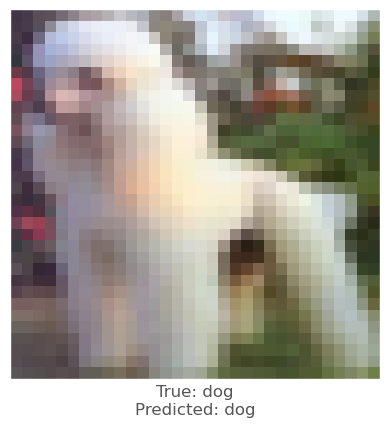



0.010036528
0.0061514974
-0.00016063452
vr, vg, vb :   -2.803953003883362 -1.3368053674697875 0.22803553342819213
beam_perturbed_confidence temp :  0.70194817
beam_perturbed_confidence temp :  0.71279716
beam_perturbed_confidence temp :  0.7201956
beam_perturbed_confidence temp :  0.69241047
beam_perturbed_confidence temp :  0.70194817
beam_perturbed_confidence temp :  0.71279716
beam_perturbed_confidence temp :  0.69241047
row index :  3
3th round's confidence : 4th 0.69241047
predicted class :  dog
predicted class's confidence :  0.69241047
Lopt is :  10


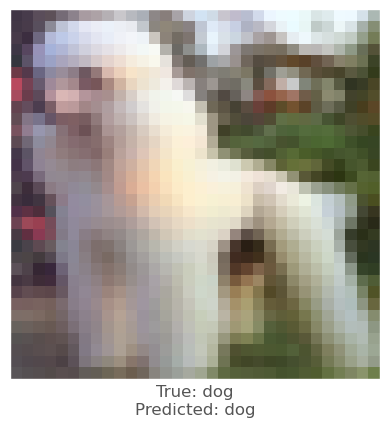



0.0048776865
-0.0031315088
-0.008064449
vr, vg, vb :   -1.4817430883646012 1.7789712911844255 3.5271364039182664
beam_perturbed_confidence temp :  0.62668365
beam_perturbed_confidence temp :  0.6274888
beam_perturbed_confidence temp :  0.6193808
beam_perturbed_confidence temp :  0.6228883
beam_perturbed_confidence temp :  0.61397004
beam_perturbed_confidence temp :  0.6227511
beam_perturbed_confidence temp :  0.61217576
row index :  6
4th round's confidence : 0th 0.61217576
predicted class :  dog
predicted class's confidence :  0.61217576
Lopt is :  9


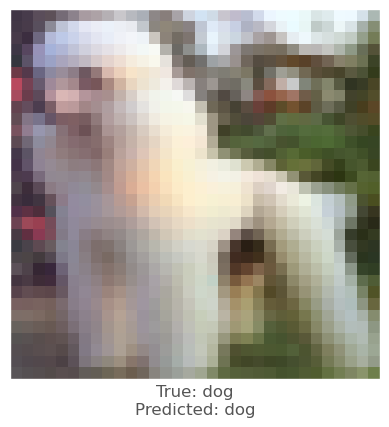



0.00022959709
-0.0065826178
-0.008884728
vr, vg, vb :   -0.36912238597869873 2.6295556151866917 3.4310515397787094
beam_perturbed_confidence temp :  0.66161793
beam_perturbed_confidence temp :  0.6547036
beam_perturbed_confidence temp :  0.64856434
beam_perturbed_confidence temp :  0.6551277
beam_perturbed_confidence temp :  0.6480556
beam_perturbed_confidence temp :  0.6424721
beam_perturbed_confidence temp :  0.6410704
row index :  6
4th round's confidence : 1th 0.6410704
predicted class :  dog
predicted class's confidence :  0.6410704
Lopt is :  10


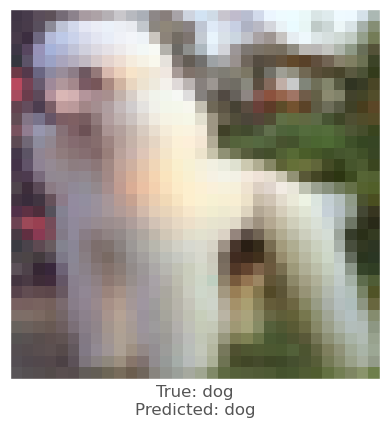



0.0026948452
-0.0067551136
-0.009430945
vr, vg, vb :   -3.92227581679821 -1.0002182054519655 1.6946628206968306
beam_perturbed_confidence temp :  0.62557054
beam_perturbed_confidence temp :  0.63744175
beam_perturbed_confidence temp :  0.6247012
beam_perturbed_confidence temp :  0.6349668
beam_perturbed_confidence temp :  0.62157714
beam_perturbed_confidence temp :  0.63278884
beam_perturbed_confidence temp :  0.63052523
row index :  4
4th round's confidence : 2th 0.62157714
predicted class :  dog
predicted class's confidence :  0.62157714
Lopt is :  13


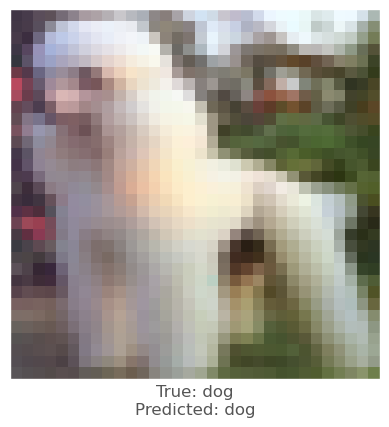



0.0012565851
-0.0053974986
-0.006848812
vr, vg, vb :   0.026779649853706344 3.205597915649414 2.8837075269222265
beam_perturbed_confidence temp :  0.69526696
beam_perturbed_confidence temp :  0.68984497
beam_perturbed_confidence temp :  0.68913805
beam_perturbed_confidence temp :  0.68984497
beam_perturbed_confidence temp :  0.68913805
beam_perturbed_confidence temp :  0.68296045
beam_perturbed_confidence temp :  0.68296045
row index :  5
4th round's confidence : 3th 0.68296045
predicted class :  dog
predicted class's confidence :  0.68296045
Lopt is :  11


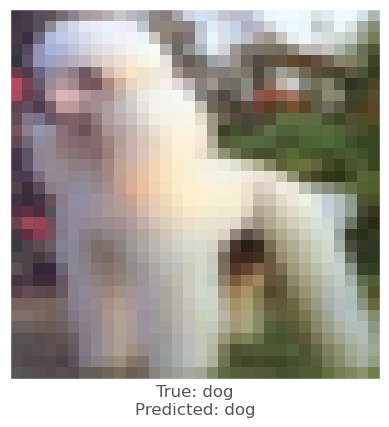



0.014772177
0.010187864
0.0012496114
vr, vg, vb :   -4.000775377750397 -2.2219112610816953 0.08027084231376647
beam_perturbed_confidence temp :  0.6429968
beam_perturbed_confidence temp :  0.67232335
beam_perturbed_confidence temp :  0.69241047
beam_perturbed_confidence temp :  0.6267166
beam_perturbed_confidence temp :  0.6429968
beam_perturbed_confidence temp :  0.67232335
beam_perturbed_confidence temp :  0.6267166
row index :  3
4th round's confidence : 4th 0.6267166
predicted class :  dog
predicted class's confidence :  0.6267166
Lopt is :  10


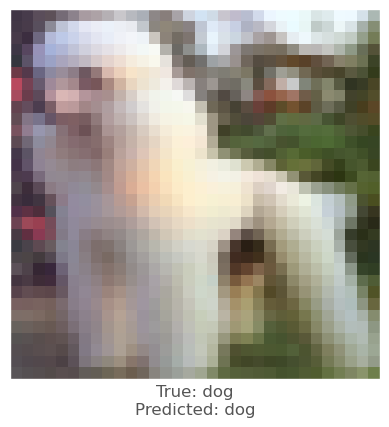



0.0054399967
-0.0009535551
-0.00534606
vr, vg, vb :   -1.8775684514641764 1.6964296727776529 3.7090287434458733
beam_perturbed_confidence temp :  0.608049
beam_perturbed_confidence temp :  0.6130165
beam_perturbed_confidence temp :  0.60944057
beam_perturbed_confidence temp :  0.6061782
beam_perturbed_confidence temp :  0.5981469
beam_perturbed_confidence temp :  0.6145425
beam_perturbed_confidence temp :  0.5991313
row index :  4
5th round's confidence : 0th 0.5981469
predicted class :  dog
predicted class's confidence :  0.5981469
Lopt is :  12


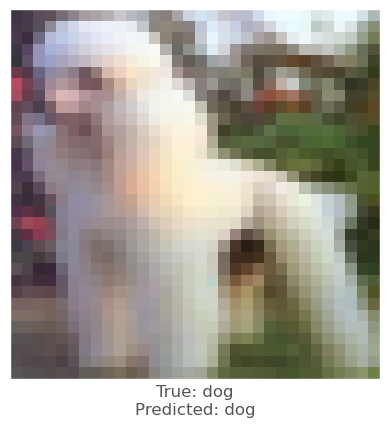



0.0028235316
-0.0071320534
-0.00921315
vr, vg, vb :   -0.6145633101463318 3.0798053911924366 4.009261340558529
beam_perturbed_confidence temp :  0.63964856
beam_perturbed_confidence temp :  0.63115114
beam_perturbed_confidence temp :  0.6220753
beam_perturbed_confidence temp :  0.63035786
beam_perturbed_confidence temp :  0.62210256
beam_perturbed_confidence temp :  0.61272335
beam_perturbed_confidence temp :  0.6123327
row index :  6
5th round's confidence : 1th 0.6123327
predicted class :  dog
predicted class's confidence :  0.6123327
Lopt is :  11


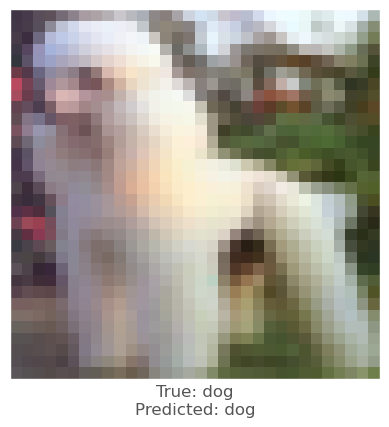



0.00018292665
-0.00671947
-0.007828891
vr, vg, vb :   -3.5483409005999564 -0.22824938249588034 2.308085666358471
beam_perturbed_confidence temp :  0.6236187
beam_perturbed_confidence temp :  0.6257662
beam_perturbed_confidence temp :  0.6139361
beam_perturbed_confidence temp :  0.6283943
beam_perturbed_confidence temp :  0.6144449
beam_perturbed_confidence temp :  0.6172894
beam_perturbed_confidence temp :  0.61918235
row index :  2
5th round's confidence : 2th 0.6139361
predicted class :  dog
predicted class's confidence :  0.6139361
Lopt is :  13


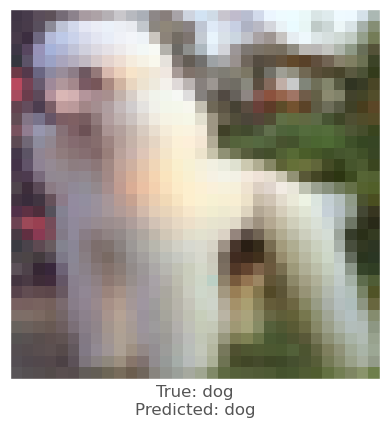



0.00031155348
-0.0053063035
-0.0071845055
vr, vg, vb :   -0.007053662955760969 3.4156684741973877 3.313787320494652
beam_perturbed_confidence temp :  0.6826439
beam_perturbed_confidence temp :  0.6736082
beam_perturbed_confidence temp :  0.67147166
beam_perturbed_confidence temp :  0.6734856
beam_perturbed_confidence temp :  0.6720121
beam_perturbed_confidence temp :  0.6598405
beam_perturbed_confidence temp :  0.6604797
row index :  5
5th round's confidence : 3th 0.6598405
predicted class :  dog
predicted class's confidence :  0.6598405
Lopt is :  11


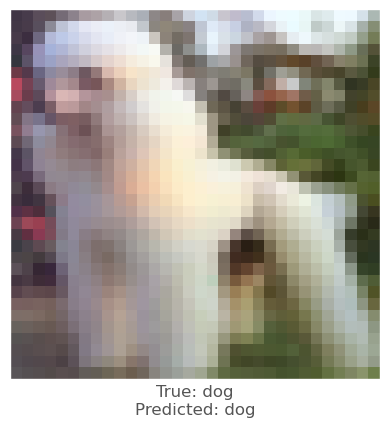



0.016337395
0.008007348
0.001049757
vr, vg, vb :   -5.234437311410904 -2.800454893350601 -0.032731942296028146
beam_perturbed_confidence temp :  0.60574925
beam_perturbed_confidence temp :  0.6198312
beam_perturbed_confidence temp :  0.626157
beam_perturbed_confidence temp :  0.6175579
beam_perturbed_confidence temp :  0.6105127
beam_perturbed_confidence temp :  0.62280196
beam_perturbed_confidence temp :  0.62205726
row index :  0
5th round's confidence : 4th 0.60574925
predicted class :  dog
predicted class's confidence :  0.60574925
Lopt is :  10


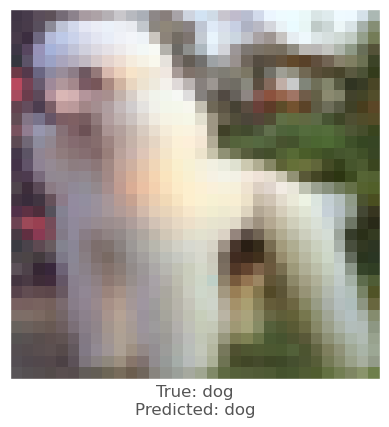



0.006329
-0.0012702346
-0.004903376
vr, vg, vb :   -2.322711605936289 1.6538101639807226 3.828463479346037
beam_perturbed_confidence temp :  0.59407514
beam_perturbed_confidence temp :  0.5991313
beam_perturbed_confidence temp :  0.59856987
beam_perturbed_confidence temp :  0.5924162
beam_perturbed_confidence temp :  0.5870266
beam_perturbed_confidence temp :  0.60464776
beam_perturbed_confidence temp :  0.58574444
row index :  6
6th round's confidence : 0th 0.58574444
predicted class :  dog
predicted class's confidence :  0.58574444
Lopt is :  15


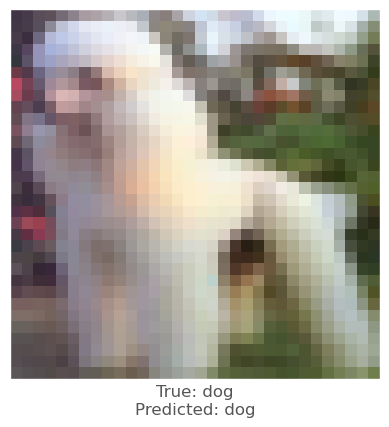



0.0016694069
-0.006305158
-0.008998692
vr, vg, vb :   -0.7200476682186127 3.4023406659007076 4.5082044100701815
beam_perturbed_confidence temp :  0.61105394
beam_perturbed_confidence temp :  0.6060935
beam_perturbed_confidence temp :  0.5960649
beam_perturbed_confidence temp :  0.6044178
beam_perturbed_confidence temp :  0.59527344
beam_perturbed_confidence temp :  0.59973794
beam_perturbed_confidence temp :  0.59462917
row index :  6
6th round's confidence : 1th 0.59462917
predicted class :  dog
predicted class's confidence :  0.59462917
Lopt is :  12


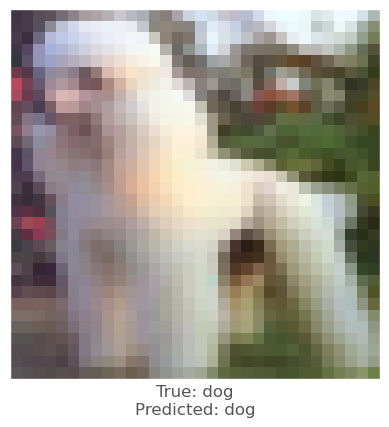



-0.0005329251
-0.007441044
-0.007948279
vr, vg, vb :   -3.140214297646284 0.5386799411296843 2.872105037802458
beam_perturbed_confidence temp :  0.6144449
beam_perturbed_confidence temp :  0.6139361
beam_perturbed_confidence temp :  0.60509264
beam_perturbed_confidence temp :  0.6144449
beam_perturbed_confidence temp :  0.6074933
beam_perturbed_confidence temp :  0.60509264
beam_perturbed_confidence temp :  0.6074933
row index :  2
6th round's confidence : 2th 0.60509264
predicted class :  dog
predicted class's confidence :  0.60509264
Lopt is :  13


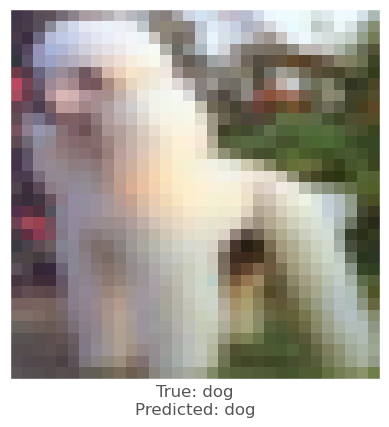



-0.0008440614
-0.0059553385
-0.009310126
vr, vg, vb :   0.0780578408062458 3.669635474586487 3.9134212189078337
beam_perturbed_confidence temp :  0.6598405
beam_perturbed_confidence temp :  0.6496595
beam_perturbed_confidence temp :  0.6448969
beam_perturbed_confidence temp :  0.6496595
beam_perturbed_confidence temp :  0.6448969
beam_perturbed_confidence temp :  0.6351202
beam_perturbed_confidence temp :  0.6351202
row index :  5
6th round's confidence : 3th 0.6351202
predicted class :  dog
predicted class's confidence :  0.6351202
Lopt is :  11


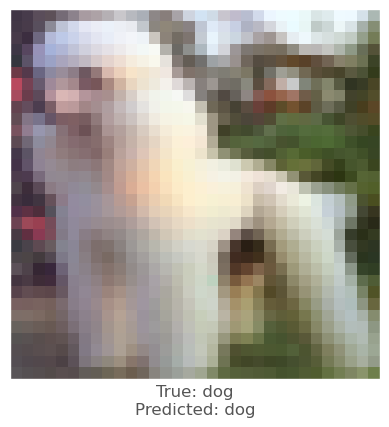



0.001608491
-0.006420374
-0.009074926
vr, vg, vb :   -4.871842674660683 -1.8783720123529433 0.878033889567852
beam_perturbed_confidence temp :  0.60731554
beam_perturbed_confidence temp :  0.61259925
beam_perturbed_confidence temp :  0.60574925
beam_perturbed_confidence temp :  0.61508924
beam_perturbed_confidence temp :  0.60731554
beam_perturbed_confidence temp :  0.61259925
beam_perturbed_confidence temp :  0.61508924
row index :  2
6th round's confidence : 4th 0.60574925
predicted class :  dog
predicted class's confidence :  0.60574925
Lopt is :  10


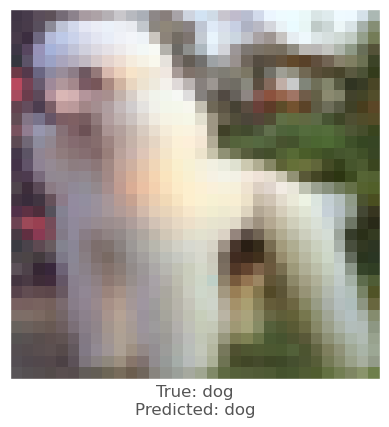



0.005059421
0.0016790628
-0.0017495155
vr, vg, vb :   -2.5963825515896084 1.320522863250375 3.62056868475616
beam_perturbed_confidence temp :  0.5826754
beam_perturbed_confidence temp :  0.58870566
beam_perturbed_confidence temp :  0.5897995
beam_perturbed_confidence temp :  0.58129215
beam_perturbed_confidence temp :  0.57805204
beam_perturbed_confidence temp :  0.5955256
beam_perturbed_confidence temp :  0.5781495
row index :  4
7th round's confidence : 0th 0.57805204
predicted class :  dog
predicted class's confidence :  0.57805204
Lopt is :  18


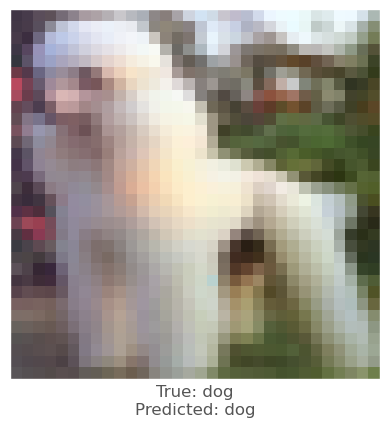



0.0076193213
0.005466342
-0.0019021034
vr, vg, vb :   -1.4099750360250471 2.5154724020755297 4.24759431147039
beam_perturbed_confidence temp :  0.5898152
beam_perturbed_confidence temp :  0.6034314
beam_perturbed_confidence temp :  0.59886837
beam_perturbed_confidence temp :  0.5929745
beam_perturbed_confidence temp :  0.5860242
beam_perturbed_confidence temp :  0.6125288
beam_perturbed_confidence temp :  0.59483427
row index :  4
7th round's confidence : 1th 0.5860242
predicted class :  dog
predicted class's confidence :  0.5860242
Lopt is :  15


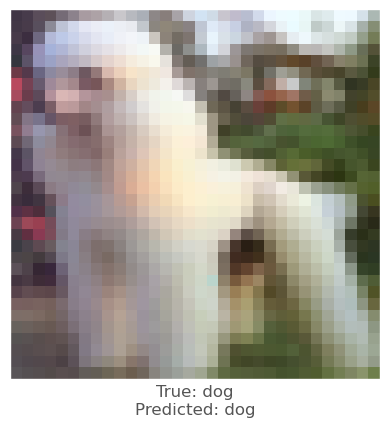



-0.0025951266
-0.0090456605
-0.008570731
vr, vg, vb :   -2.5666802049940824 1.3893779965925215 3.4419676026409864
beam_perturbed_confidence temp :  0.6073033
beam_perturbed_confidence temp :  0.6011588
beam_perturbed_confidence temp :  0.59369725
beam_perturbed_confidence temp :  0.6033956
beam_perturbed_confidence temp :  0.5963971
beam_perturbed_confidence temp :  0.59075844
beam_perturbed_confidence temp :  0.59187967
row index :  5
7th round's confidence : 2th 0.59075844
predicted class :  dog
predicted class's confidence :  0.59075844
Lopt is :  13


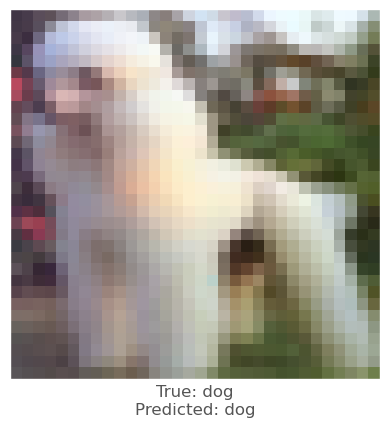



0.0023345351
-0.0047320724
-0.009259224
vr, vg, vb :   -0.16320145546615122 3.775879162464142 4.448001490815878
beam_perturbed_confidence temp :  0.63364995
beam_perturbed_confidence temp :  0.62700295
beam_perturbed_confidence temp :  0.61677945
beam_perturbed_confidence temp :  0.6265435
beam_perturbed_confidence temp :  0.61568654
beam_perturbed_confidence temp :  0.6087713
beam_perturbed_confidence temp :  0.6077353
row index :  6
7th round's confidence : 3th 0.6077353
predicted class :  dog
predicted class's confidence :  0.6077353
Lopt is :  12


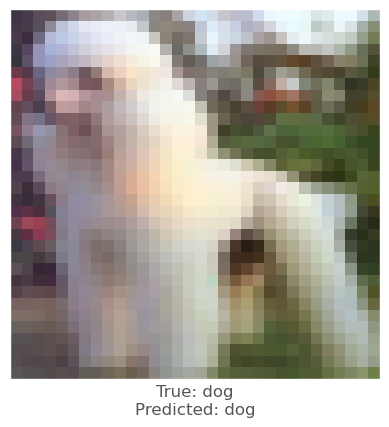



0.001608491
-0.006420374
-0.009074926
vr, vg, vb :   -4.545507501585484 -1.0484974194550514 1.6977231382453442
beam_perturbed_confidence temp :  0.60731554
beam_perturbed_confidence temp :  0.61259925
beam_perturbed_confidence temp :  0.60143775
beam_perturbed_confidence temp :  0.61508924
beam_perturbed_confidence temp :  0.6036339
beam_perturbed_confidence temp :  0.6086497
beam_perturbed_confidence temp :  0.6115823
row index :  2
7th round's confidence : 4th 0.60143775
predicted class :  dog
predicted class's confidence :  0.60143775
Lopt is :  11


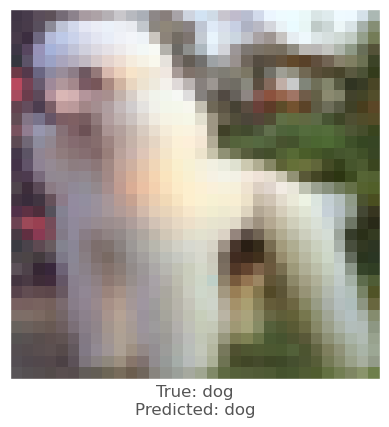



0.00084263086
-0.0016466975
-0.002624154
vr, vg, vb :   -2.4210073827496172 1.353140329046309 3.5209272253686787
beam_perturbed_confidence temp :  0.57707256
beam_perturbed_confidence temp :  0.5781495
beam_perturbed_confidence temp :  0.57892245
beam_perturbed_confidence temp :  0.575718
beam_perturbed_confidence temp :  0.57237357
beam_perturbed_confidence temp :  0.5829197
beam_perturbed_confidence temp :  0.5718394
row index :  6
8th round's confidence : 0th 0.5718394
predicted class :  dog
predicted class's confidence :  0.5718394
Lopt is :  21


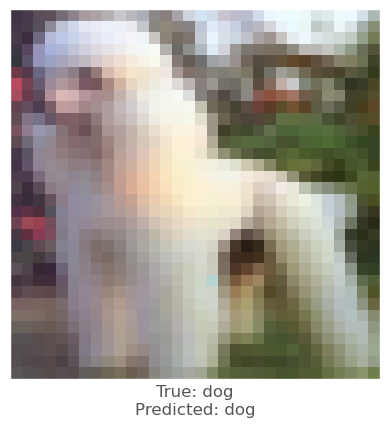



0.009409547
0.006608665
0.0013149977
vr, vg, vb :   -2.209932217633724 1.6030586629208332 3.6913351130198846
beam_perturbed_confidence temp :  0.57869095
beam_perturbed_confidence temp :  0.58998364
beam_perturbed_confidence temp :  0.5915936
beam_perturbed_confidence temp :  0.57883984
beam_perturbed_confidence temp :  0.57675266
beam_perturbed_confidence temp :  0.59580994
beam_perturbed_confidence temp :  0.5791974
row index :  4
8th round's confidence : 1th 0.57675266
predicted class :  dog
predicted class's confidence :  0.57675266
Lopt is :  18


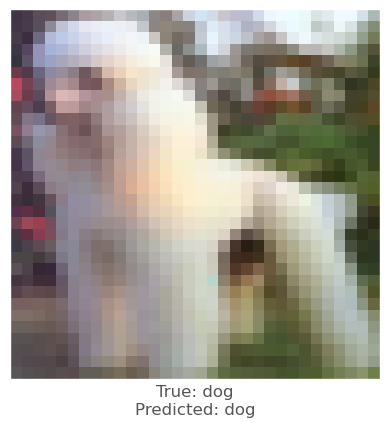



0.0014685988
-0.00439775
-0.0053789616
vr, vg, vb :   -2.456872068756759 1.6902151870150566 3.635666998687923
beam_perturbed_confidence temp :  0.59187967
beam_perturbed_confidence temp :  0.5892995
beam_perturbed_confidence temp :  0.58434707
beam_perturbed_confidence temp :  0.58781844
beam_perturbed_confidence temp :  0.5826384
beam_perturbed_confidence temp :  0.58276814
beam_perturbed_confidence temp :  0.58085513
row index :  6
8th round's confidence : 2th 0.58085513
predicted class :  dog
predicted class's confidence :  0.58085513
Lopt is :  16


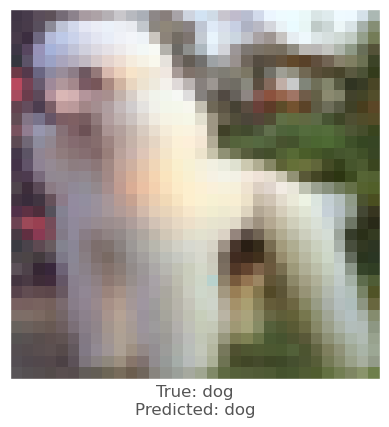



0.0019372702
-0.002714932
-0.0077233315
vr, vg, vb :   -0.3406083263685107 3.6697844427051547 4.775534486875892
beam_perturbed_confidence temp :  0.60683405
beam_perturbed_confidence temp :  0.6106612
beam_perturbed_confidence temp :  0.59642076
beam_perturbed_confidence temp :  0.60577893
beam_perturbed_confidence temp :  0.59398234
beam_perturbed_confidence temp :  0.60775435
beam_perturbed_confidence temp :  0.60205024
row index :  4
8th round's confidence : 3th 0.59398234
predicted class :  dog
predicted class's confidence :  0.59398234
Lopt is :  13


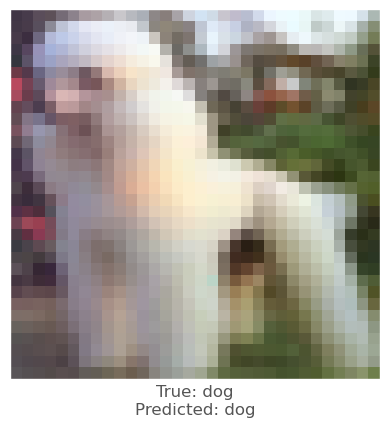



0.0023958087
-0.0055420995
-0.0072605014
vr, vg, vb :   -4.330537621101619 -0.3894377299234867 2.2540009628943203
beam_perturbed_confidence temp :  0.6036339
beam_perturbed_confidence temp :  0.60503525
beam_perturbed_confidence temp :  0.5956059
beam_perturbed_confidence temp :  0.6074833
beam_perturbed_confidence temp :  0.59550065
beam_perturbed_confidence temp :  0.59763426
beam_perturbed_confidence temp :  0.60007536
row index :  4
8th round's confidence : 4th 0.59550065
predicted class :  dog
predicted class's confidence :  0.59550065
Lopt is :  15


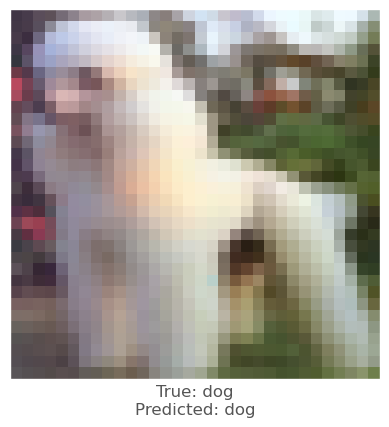



0.0038978457
0.0008684993
-0.0018541813
vr, vg, vb :   -2.5686912189833224 1.1309763682394565 3.354252631799096
beam_perturbed_confidence temp :  0.5666998
beam_perturbed_confidence temp :  0.57324207
beam_perturbed_confidence temp :  0.57237923
beam_perturbed_confidence temp :  0.5667472
beam_perturbed_confidence temp :  0.5636246
beam_perturbed_confidence temp :  0.5758318
beam_perturbed_confidence temp :  0.5641296
row index :  4
9th round's confidence : 0th 0.5636246
predicted class :  dog
predicted class's confidence :  0.5636246
Lopt is :  24


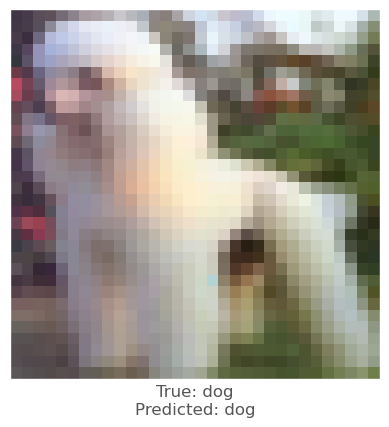



0.0048401356
0.003525734
0.00074750185
vr, vg, vb :   -2.4729525533044336 1.0901794018533593 3.2474514167050788
beam_perturbed_confidence temp :  0.57287896
beam_perturbed_confidence temp :  0.5791974
beam_perturbed_confidence temp :  0.58020157
beam_perturbed_confidence temp :  0.57321644
beam_perturbed_confidence temp :  0.5695463
beam_perturbed_confidence temp :  0.58348364
beam_perturbed_confidence temp :  0.5713509
row index :  4
9th round's confidence : 1th 0.5695463
predicted class :  dog
predicted class's confidence :  0.5695463
Lopt is :  21


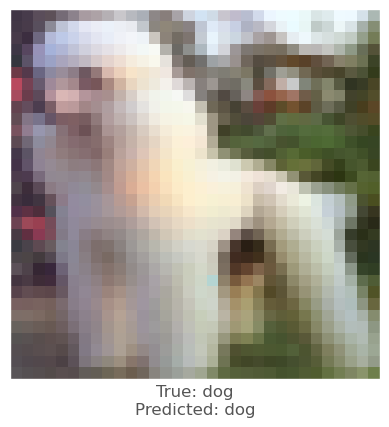



0.00016504526
-0.003564477
-0.0030297637
vr, vg, vb :   -2.227689388019389 1.877641364999342 3.575076668676919
beam_perturbed_confidence temp :  0.58093315
beam_perturbed_confidence temp :  0.5790739
beam_perturbed_confidence temp :  0.5766199
beam_perturbed_confidence temp :  0.578448
beam_perturbed_confidence temp :  0.57384145
beam_perturbed_confidence temp :  0.5760051
beam_perturbed_confidence temp :  0.57333744
row index :  6
9th round's confidence : 2th 0.57333744
predicted class :  dog
predicted class's confidence :  0.57333744
Lopt is :  19


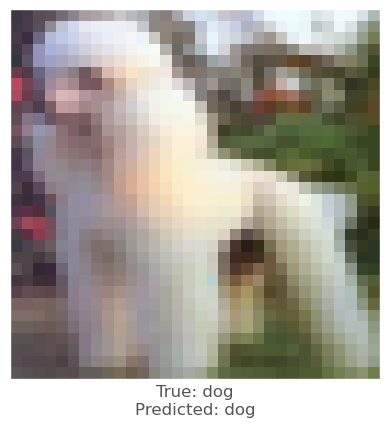



0.004562974
0.0016701221
-0.004309118
vr, vg, vb :   -0.7628448913451851 3.1357937837739946 4.72889281759199
beam_perturbed_confidence temp :  0.5918578
beam_perturbed_confidence temp :  0.60205024
beam_perturbed_confidence temp :  0.59046745
beam_perturbed_confidence temp :  0.5969444
beam_perturbed_confidence temp :  0.58586174
beam_perturbed_confidence temp :  0.6069908
beam_perturbed_confidence temp :  0.5981458
row index :  4
9th round's confidence : 3th 0.58586174
predicted class :  dog
predicted class's confidence :  0.58586174
Lopt is :  14


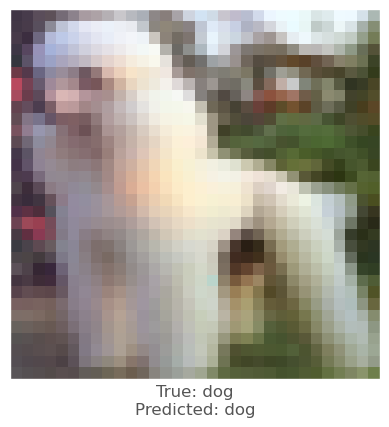



-0.0017027855
-0.008824229
-0.008181632
vr, vg, vb :   -3.727205309797121 0.53192896711061 2.8467640231142877
beam_perturbed_confidence temp :  0.59695756
beam_perturbed_confidence temp :  0.59550065
beam_perturbed_confidence temp :  0.58822197
beam_perturbed_confidence temp :  0.59695756
beam_perturbed_confidence temp :  0.59026617
beam_perturbed_confidence temp :  0.58822197
beam_perturbed_confidence temp :  0.59026617
row index :  2
9th round's confidence : 4th 0.58822197
predicted class :  dog
predicted class's confidence :  0.58822197
Lopt is :  15


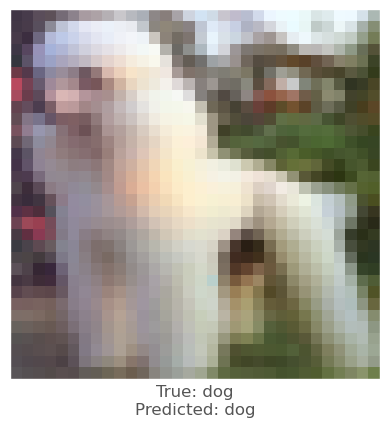



0.0033159852
-0.0001899004
-0.0015997887
vr, vg, vb :   -2.6434206173639208 1.0368687712409503 3.1788062351963347
beam_perturbed_confidence temp :  0.56127495
beam_perturbed_confidence temp :  0.5641296
beam_perturbed_confidence temp :  0.5620787
beam_perturbed_confidence temp :  0.56018823
beam_perturbed_confidence temp :  0.55684406
beam_perturbed_confidence temp :  0.56511104
beam_perturbed_confidence temp :  0.55595887
row index :  6
10th round's confidence : 0th 0.55595887
predicted class :  dog
predicted class's confidence :  0.55595887
Lopt is :  27


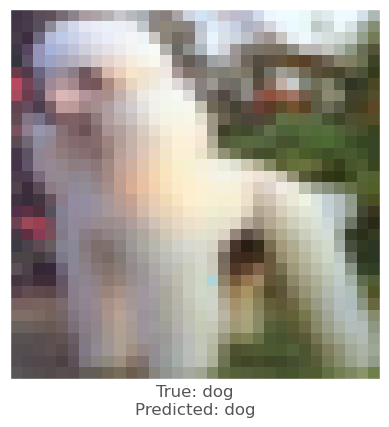



0.0046957135
0.0025581717
-0.0015395284
vr, vg, vb :   -2.6952286499789953 0.7253442867565243 3.0766591120249274
beam_perturbed_confidence temp :  0.56356
beam_perturbed_confidence temp :  0.5695463
beam_perturbed_confidence temp :  0.56923604
beam_perturbed_confidence temp :  0.56356
beam_perturbed_confidence temp :  0.5614118
beam_perturbed_confidence temp :  0.56923604
beam_perturbed_confidence temp :  0.5614118
row index :  4
10th round's confidence : 1th 0.5614118
predicted class :  dog
predicted class's confidence :  0.5614118
Lopt is :  24


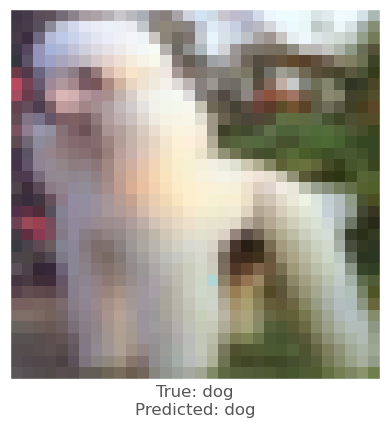



0.002854228
-0.0008260608
-0.0027475357
vr, vg, vb :   -2.2903432511888857 1.7724833056936218 3.4923225723658677
beam_perturbed_confidence temp :  0.56821424
beam_perturbed_confidence temp :  0.5730154
beam_perturbed_confidence temp :  0.56883246
beam_perturbed_confidence temp :  0.5675284
beam_perturbed_confidence temp :  0.5639031
beam_perturbed_confidence temp :  0.5702299
beam_perturbed_confidence temp :  0.56382
row index :  6
10th round's confidence : 2th 0.56382
predicted class :  dog
predicted class's confidence :  0.56382
Lopt is :  22


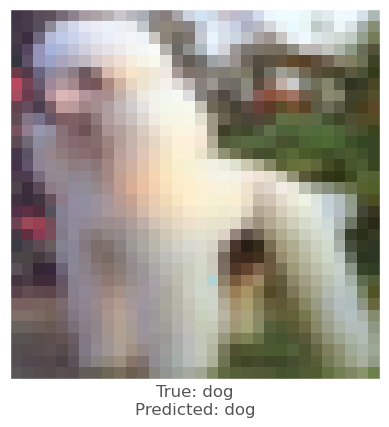



0.007650554
0.004318595
-0.00085669756
vr, vg, vb :   -1.451615820225193 2.39035491214098 4.34167329176846
beam_perturbed_confidence temp :  0.58054835
beam_perturbed_confidence temp :  0.59310544
beam_perturbed_confidence temp :  0.5915936
beam_perturbed_confidence temp :  0.58325726
beam_perturbed_confidence temp :  0.57991314
beam_perturbed_confidence temp :  0.6015737
beam_perturbed_confidence temp :  0.58711916
row index :  4
10th round's confidence : 3th 0.57991314
predicted class :  dog
predicted class's confidence :  0.57991314
Lopt is :  18


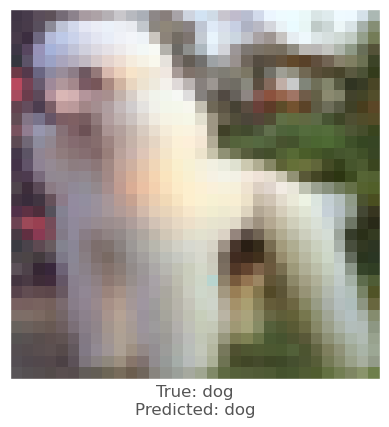



-0.0017668605
-0.0074495077
-0.00672251
vr, vg, vb :   -3.1777987303097186 1.223686841731336 3.234338606902102
beam_perturbed_confidence temp :  0.59026617
beam_perturbed_confidence temp :  0.5843489
beam_perturbed_confidence temp :  0.58141446
beam_perturbed_confidence temp :  0.58701366
beam_perturbed_confidence temp :  0.5812521
beam_perturbed_confidence temp :  0.5797962
beam_perturbed_confidence temp :  0.5773081
row index :  6
10th round's confidence : 4th 0.5773081
predicted class :  dog
predicted class's confidence :  0.5773081
Lopt is :  19


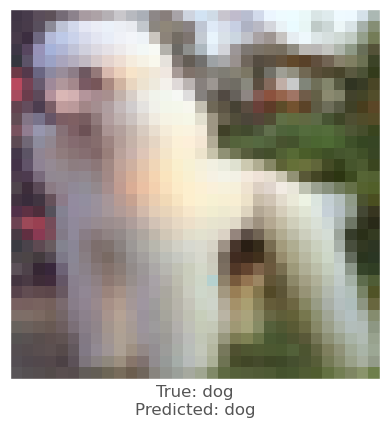



0.0035267472
6.353855e-05
-0.0025364757
vr, vg, vb :   -2.7317532782990375 0.9268280389837987 3.114573177518376
beam_perturbed_confidence temp :  0.55292374
beam_perturbed_confidence temp :  0.55595887
beam_perturbed_confidence temp :  0.55336535
beam_perturbed_confidence temp :  0.55292374
beam_perturbed_confidence temp :  0.54601663
beam_perturbed_confidence temp :  0.55336535
beam_perturbed_confidence temp :  0.54601663
row index :  4
11th round's confidence : 0th 0.54601663
predicted class :  dog
predicted class's confidence :  0.54601663
Lopt is :  30


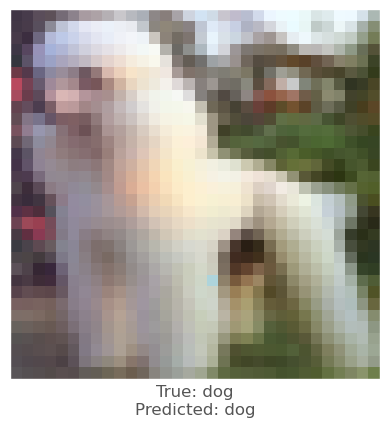



0.003362596
0.0012593865
-0.0014261007
vr, vg, vb :   -2.761965388481462 0.526871204134949 2.9116032739120343
beam_perturbed_confidence temp :  0.55824226
beam_perturbed_confidence temp :  0.5614118
beam_perturbed_confidence temp :  0.5602059
beam_perturbed_confidence temp :  0.55824226
beam_perturbed_confidence temp :  0.5549477
beam_perturbed_confidence temp :  0.5602059
beam_perturbed_confidence temp :  0.5549477
row index :  4
11th round's confidence : 1th 0.5549477
predicted class :  dog
predicted class's confidence :  0.5549477
Lopt is :  26


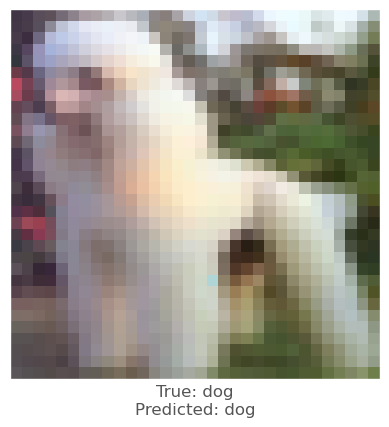



0.0031595826
0.0002990961
-0.0018471479
vr, vg, vb :   -2.377267187559865 1.5653253643759686 3.3278051092882164
beam_perturbed_confidence temp :  0.56238854
beam_perturbed_confidence temp :  0.5642022
beam_perturbed_confidence temp :  0.5619173
beam_perturbed_confidence temp :  0.5613794
beam_perturbed_confidence temp :  0.55838007
beam_perturbed_confidence temp :  0.5630637
beam_perturbed_confidence temp :  0.5575713
row index :  6
11th round's confidence : 2th 0.5575713
predicted class :  dog
predicted class's confidence :  0.5575713
Lopt is :  25


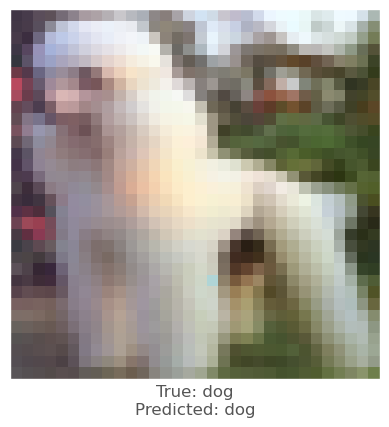



0.008458614
0.0063331723
0.0030366778
vr, vg, vb :   -2.1523156731391975 1.5180021887949242 3.603838178854432
beam_perturbed_confidence temp :  0.5739649
beam_perturbed_confidence temp :  0.58374566
beam_perturbed_confidence temp :  0.5850323
beam_perturbed_confidence temp :  0.57444584
beam_perturbed_confidence temp :  0.5721407
beam_perturbed_confidence temp :  0.58889294
beam_perturbed_confidence temp :  0.5740485
row index :  4
11th round's confidence : 3th 0.5721407
predicted class :  dog
predicted class's confidence :  0.5721407
Lopt is :  21


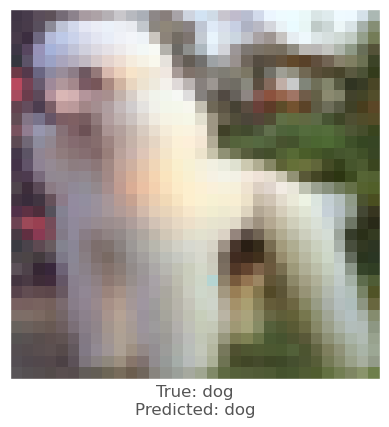



0.00086575747
-0.0054561496
-0.0056352615
vr, vg, vb :   -2.9465946038150017 1.6469331153676507 3.474430899776345
beam_perturbed_confidence temp :  0.5812349
beam_perturbed_confidence temp :  0.57579595
beam_perturbed_confidence temp :  0.57127386
beam_perturbed_confidence temp :  0.5753156
beam_perturbed_confidence temp :  0.57069737
beam_perturbed_confidence temp :  0.57058686
beam_perturbed_confidence temp :  0.56676465
row index :  6
11th round's confidence : 4th 0.56676465
predicted class :  dog
predicted class's confidence :  0.56676465
Lopt is :  22


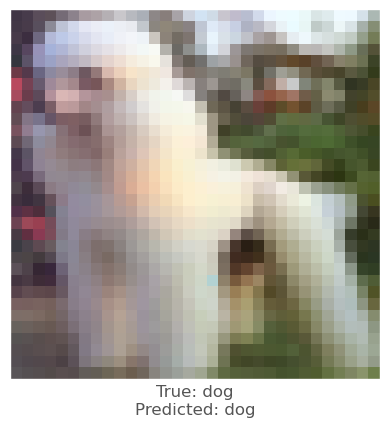



0.00346452
-0.00236243
-0.0041840672
vr, vg, vb :   -2.8050299482260916 1.0703882446526796 3.221522584696348
beam_perturbed_confidence temp :  0.5436882
beam_perturbed_confidence temp :  0.5456868
beam_perturbed_confidence temp :  0.5406772
beam_perturbed_confidence temp :  0.5408772
beam_perturbed_confidence temp :  0.535764
beam_perturbed_confidence temp :  0.5411958
beam_perturbed_confidence temp :  0.5342025
row index :  6
12th round's confidence : 0th 0.5342025
predicted class :  dog
predicted class's confidence :  0.5342025
Lopt is :  33


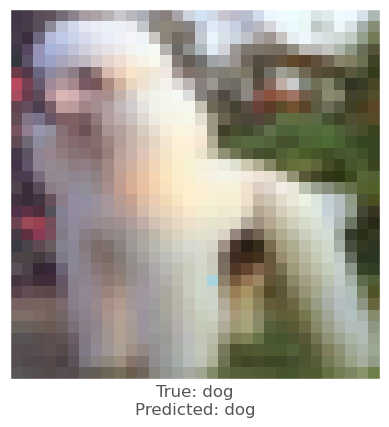



0.0025512576
-0.0015177131
-0.0036414266
vr, vg, vb :   -2.7408946106654204 0.6259553907130313 2.9845856028471247
beam_perturbed_confidence temp :  0.5515229
beam_perturbed_confidence temp :  0.5549477
beam_perturbed_confidence temp :  0.55116564
beam_perturbed_confidence temp :  0.5515229
beam_perturbed_confidence temp :  0.5468447
beam_perturbed_confidence temp :  0.55116564
beam_perturbed_confidence temp :  0.5468447
row index :  4
12th round's confidence : 1th 0.5468447
predicted class :  dog
predicted class's confidence :  0.5468447
Lopt is :  29


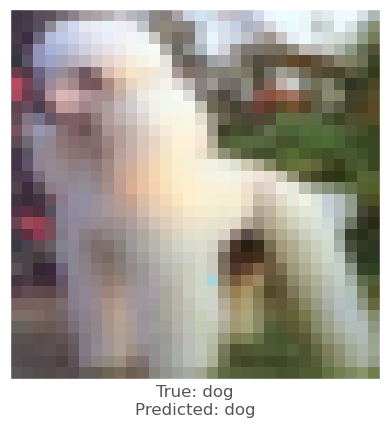



0.0021835566
-0.0005592704
-0.0031882524
vr, vg, vb :   -2.3578961244740446 1.4647198661311207 3.3138498432629593
beam_perturbed_confidence temp :  0.55429184
beam_perturbed_confidence temp :  0.5578208
beam_perturbed_confidence temp :  0.5529563
beam_perturbed_confidence temp :  0.55290323
beam_perturbed_confidence temp :  0.5482262
beam_perturbed_confidence temp :  0.5542765
beam_perturbed_confidence temp :  0.5468589
row index :  6
12th round's confidence : 2th 0.5468589
predicted class :  dog
predicted class's confidence :  0.5468589
Lopt is :  28


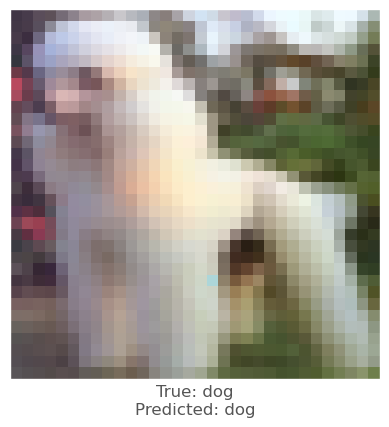



0.0058447123
0.0035142899
-0.0005027056
vr, vg, vb :   -2.5215553315638033 1.0147729843197286 3.293724918372553
beam_perturbed_confidence temp :  0.5653808
beam_perturbed_confidence temp :  0.5740485
beam_perturbed_confidence temp :  0.57412505
beam_perturbed_confidence temp :  0.56646913
beam_perturbed_confidence temp :  0.56313896
beam_perturbed_confidence temp :  0.57770205
beam_perturbed_confidence temp :  0.5644491
row index :  4
12th round's confidence : 3th 0.56313896
predicted class :  dog
predicted class's confidence :  0.56313896
Lopt is :  24


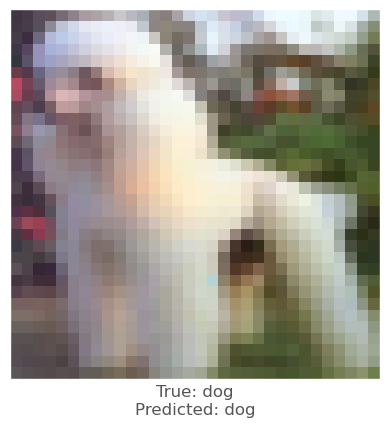



-0.0011399388
-0.0057581067
-0.0030823946
vr, vg, vb :   -2.537941260300567 2.058050474683547 3.4352272697901656
beam_perturbed_confidence temp :  0.5731088
beam_perturbed_confidence temp :  0.5648682
beam_perturbed_confidence temp :  0.56347996
beam_perturbed_confidence temp :  0.5635351
beam_perturbed_confidence temp :  0.56384146
beam_perturbed_confidence temp :  0.562157
beam_perturbed_confidence temp :  0.56010413
row index :  6
12th round's confidence : 4th 0.56010413
predicted class :  dog
predicted class's confidence :  0.56010413
Lopt is :  25


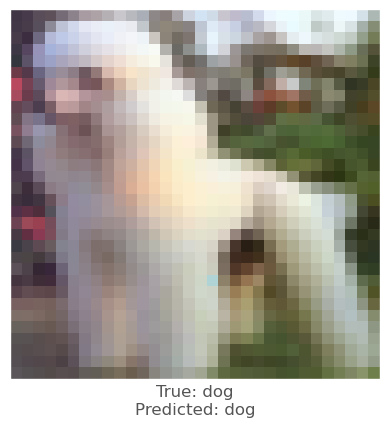



0.0027808547
-0.0028275251
-0.0033500195
vr, vg, vb :   -2.8026124236030676 1.2461019340729096 3.234372271722319
beam_perturbed_confidence temp :  0.53261995
beam_perturbed_confidence temp :  0.53293645
beam_perturbed_confidence temp :  0.5301094
beam_perturbed_confidence temp :  0.52940863
beam_perturbed_confidence temp :  0.5259173
beam_perturbed_confidence temp :  0.5308932
beam_perturbed_confidence temp :  0.52366257
row index :  6
13th round's confidence : 0th 0.52366257
predicted class :  dog
predicted class's confidence :  0.52366257
Lopt is :  36


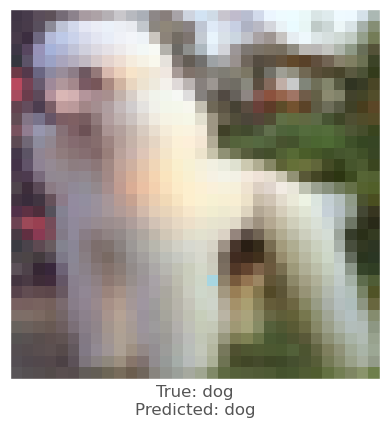



0.0020614862
-0.0042955875
-0.0047486424
vr, vg, vb :   -2.6729537740190445 0.9929186056090133 3.1609912870234718
beam_perturbed_confidence temp :  0.5447089
beam_perturbed_confidence temp :  0.5468447
beam_perturbed_confidence temp :  0.5393217
beam_perturbed_confidence temp :  0.5447089
beam_perturbed_confidence temp :  0.537492
beam_perturbed_confidence temp :  0.5393217
beam_perturbed_confidence temp :  0.537492
row index :  4
13th round's confidence : 1th 0.537492
predicted class :  dog
predicted class's confidence :  0.537492
Lopt is :  32


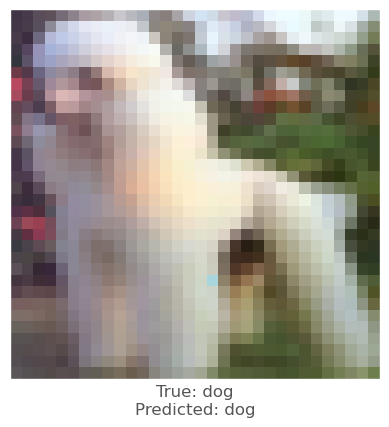



0.003594339
-0.0020908713
-0.0042515993
vr, vg, vb :   -2.4815404014156783 1.5273350129256014 3.4076247901195247
beam_perturbed_confidence temp :  0.5429544
beam_perturbed_confidence temp :  0.5461353
beam_perturbed_confidence temp :  0.54095393
beam_perturbed_confidence temp :  0.54104406
beam_perturbed_confidence temp :  0.53527176
beam_perturbed_confidence temp :  0.5414027
beam_perturbed_confidence temp :  0.53449285
row index :  6
13th round's confidence : 2th 0.53449285
predicted class :  dog
predicted class's confidence :  0.53449285
Lopt is :  31


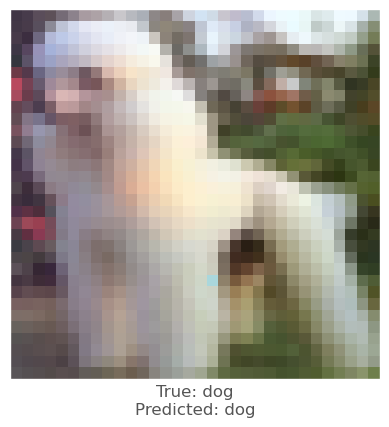



0.0037565231
0.0022920966
-0.0005308986
vr, vg, vb :   -2.645052111639845 0.6840860244039911 3.0174422836367385
beam_perturbed_confidence temp :  0.55925286
beam_perturbed_confidence temp :  0.56313896
beam_perturbed_confidence temp :  0.5637565
beam_perturbed_confidence temp :  0.55925286
beam_perturbed_confidence temp :  0.5545591
beam_perturbed_confidence temp :  0.5637565
beam_perturbed_confidence temp :  0.5545591
row index :  4
13th round's confidence : 3th 0.5545591
predicted class :  dog
predicted class's confidence :  0.5545591
Lopt is :  27


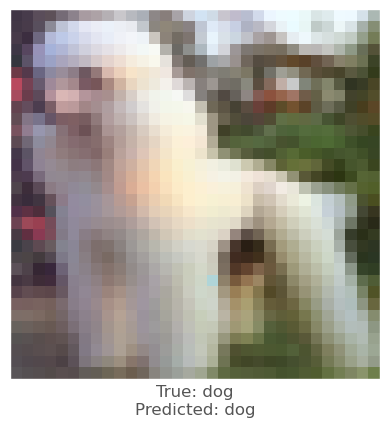



0.001008749
-0.0020362139
-0.0030022264
vr, vg, vb :   -2.3850220350883813 2.0558668146968815 3.391927178080314
beam_perturbed_confidence temp :  0.5581171
beam_perturbed_confidence temp :  0.5586435
beam_perturbed_confidence temp :  0.5549303
beam_perturbed_confidence temp :  0.55504644
beam_perturbed_confidence temp :  0.5526188
beam_perturbed_confidence temp :  0.55525005
beam_perturbed_confidence temp :  0.54879504
row index :  6
13th round's confidence : 4th 0.54879504
predicted class :  dog
predicted class's confidence :  0.54879504
Lopt is :  28


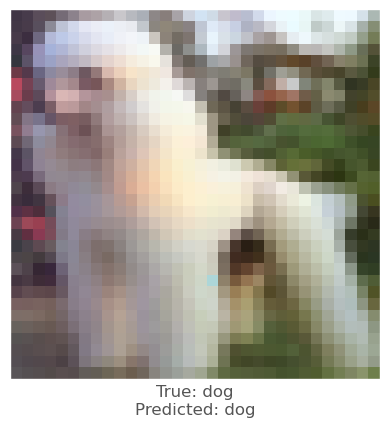



0.0027857423
-0.0031055808
-0.0030275583
vr, vg, vb :   -2.800925409529504 1.4320498213388364 3.213690877222206
beam_perturbed_confidence temp :  0.5239303
beam_perturbed_confidence temp :  0.5228117
beam_perturbed_confidence temp :  0.5199855
beam_perturbed_confidence temp :  0.52005744
beam_perturbed_confidence temp :  0.5175669
beam_perturbed_confidence temp :  0.52123755
beam_perturbed_confidence temp :  0.51523256
row index :  6
14th round's confidence : 0th 0.51523256
predicted class :  dog
predicted class's confidence :  0.51523256
Lopt is :  39


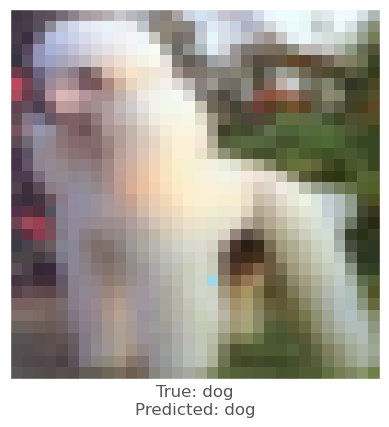



0.00012677908
-0.0057504177
-0.005120456
vr, vg, vb :   -2.418336304560866 1.4686685159831705 3.356937780193073
beam_perturbed_confidence temp :  0.53872824
beam_perturbed_confidence temp :  0.53462845
beam_perturbed_confidence temp :  0.53053635
beam_perturbed_confidence temp :  0.5351761
beam_perturbed_confidence temp :  0.5316414
beam_perturbed_confidence temp :  0.52874273
beam_perturbed_confidence temp :  0.52750194
row index :  6
14th round's confidence : 1th 0.52750194
predicted class :  dog
predicted class's confidence :  0.52750194
Lopt is :  35


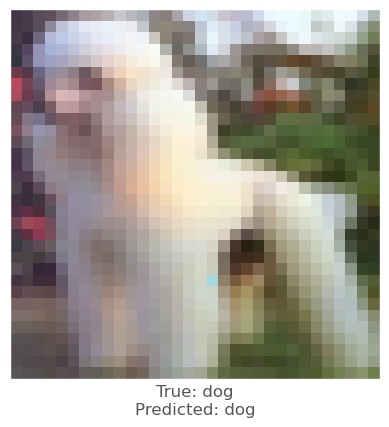



0.0032063723
-0.0018622875
-0.0038430095
vr, vg, vb :   -2.554023587378847 1.5608302637692717 3.451163258296903
beam_perturbed_confidence temp :  0.5312393
beam_perturbed_confidence temp :  0.5334095
beam_perturbed_confidence temp :  0.5295669
beam_perturbed_confidence temp :  0.5283311
beam_perturbed_confidence temp :  0.5242578
beam_perturbed_confidence temp :  0.52959025
beam_perturbed_confidence temp :  0.5228285
row index :  6
14th round's confidence : 2th 0.5228285
predicted class :  dog
predicted class's confidence :  0.5228285
Lopt is :  34


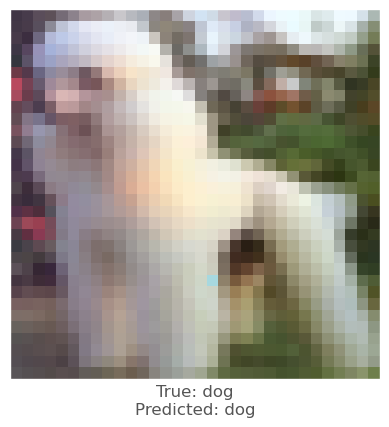



0.0039622784
0.00031971931
-0.0031083226
vr, vg, vb :   -2.7767747370847475 0.5837054905060725 3.026530317312249
beam_perturbed_confidence temp :  0.55037546
beam_perturbed_confidence temp :  0.5545591
beam_perturbed_confidence temp :  0.5511815
beam_perturbed_confidence temp :  0.55037546
beam_perturbed_confidence temp :  0.54340357
beam_perturbed_confidence temp :  0.5511815
beam_perturbed_confidence temp :  0.54340357
row index :  4
14th round's confidence : 3th 0.54340357
predicted class :  dog
predicted class's confidence :  0.54340357
Lopt is :  30


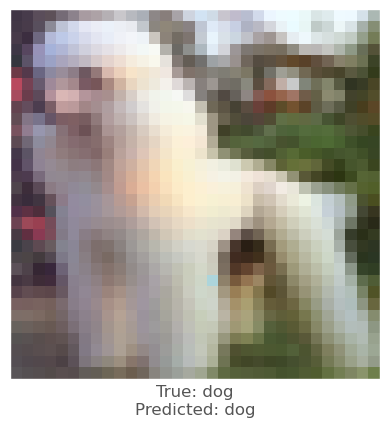



0.0030434728
-0.002272427
-0.0039278865
vr, vg, vb :   -2.450867108267165 2.07752284143337 3.4455231088776292
beam_perturbed_confidence temp :  0.544998
beam_perturbed_confidence temp :  0.5475049
beam_perturbed_confidence temp :  0.54267436
beam_perturbed_confidence temp :  0.54151636
beam_perturbed_confidence temp :  0.537977
beam_perturbed_confidence temp :  0.54275846
beam_perturbed_confidence temp :  0.53531194
row index :  6
14th round's confidence : 4th 0.53531194
predicted class :  dog
predicted class's confidence :  0.53531194
Lopt is :  31


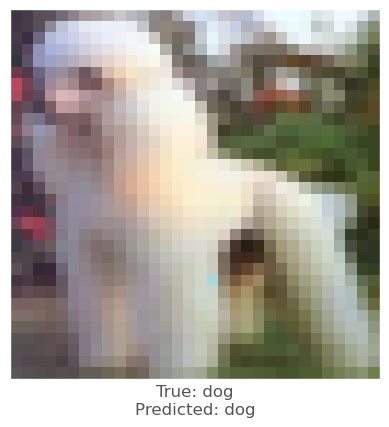



0.0008659363
-0.0045258403
-0.0032283664
vr, vg, vb :   -2.6074264965062413 1.7414288674489713 3.215158426996934
beam_perturbed_confidence temp :  0.51619965
beam_perturbed_confidence temp :  0.5130411
beam_perturbed_confidence temp :  0.51124495
beam_perturbed_confidence temp :  0.5117979
beam_perturbed_confidence temp :  0.5079851
beam_perturbed_confidence temp :  0.512249
beam_perturbed_confidence temp :  0.5050983
row index :  6
15th round's confidence : 0th 0.5050983
predicted class :  dog
predicted class's confidence :  0.5050983
Lopt is :  42


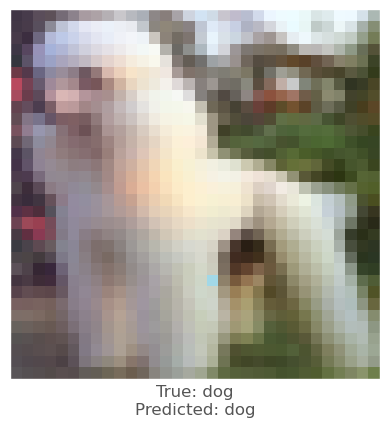



-0.001924932
-0.008096278
-0.0050233006
vr, vg, vb :   -1.9840094738026552 2.131429435762417 3.5235740669473254
beam_perturbed_confidence temp :  0.5299574
beam_perturbed_confidence temp :  0.5214306
beam_perturbed_confidence temp :  0.52079004
beam_perturbed_confidence temp :  0.52247465
beam_perturbed_confidence temp :  0.5228107
beam_perturbed_confidence temp :  0.51674145
beam_perturbed_confidence temp :  0.5159636
row index :  6
15th round's confidence : 1th 0.5159636
predicted class :  dog
predicted class's confidence :  0.5159636
Lopt is :  37


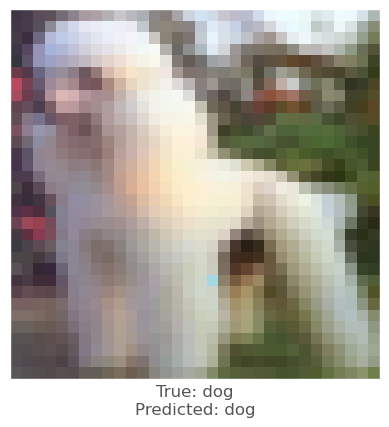



0.00366503
-0.0021333694
-0.003442943
vr, vg, vb :   -2.665124228900362 1.6180841819724228 3.4503412420833017
beam_perturbed_confidence temp :  0.52247465
beam_perturbed_confidence temp :  0.5221244
beam_perturbed_confidence temp :  0.51888496
beam_perturbed_confidence temp :  0.51871645
beam_perturbed_confidence temp :  0.5159636
beam_perturbed_confidence temp :  0.5196964
beam_perturbed_confidence temp :  0.51365185
row index :  6
15th round's confidence : 2th 0.51365185
predicted class :  dog
predicted class's confidence :  0.51365185
Lopt is :  37


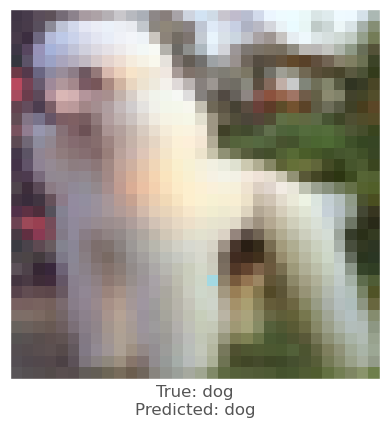



0.0040950775
-0.002001524
-0.0044543743
vr, vg, vb :   -2.9086050148411164 0.7254873386112269 3.1693147169164733
beam_perturbed_confidence temp :  0.54048455
beam_perturbed_confidence temp :  0.54340357
beam_perturbed_confidence temp :  0.537874
beam_perturbed_confidence temp :  0.54048455
beam_perturbed_confidence temp :  0.5328499
beam_perturbed_confidence temp :  0.537874
beam_perturbed_confidence temp :  0.5328499
row index :  4
15th round's confidence : 3th 0.5328499
predicted class :  dog
predicted class's confidence :  0.5328499
Lopt is :  33


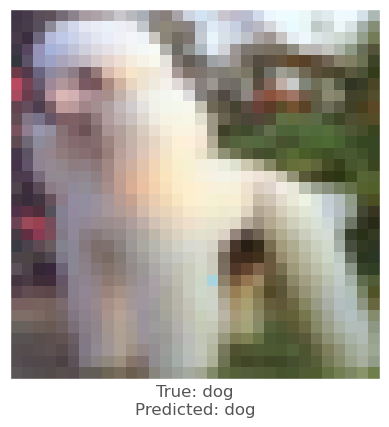



0.003358841
-0.001998067
-0.0038632154
vr, vg, vb :   -2.54166449167873 2.0695772475060976 3.487292342637083
beam_perturbed_confidence temp :  0.5309229
beam_perturbed_confidence temp :  0.534312
beam_perturbed_confidence temp :  0.5305834
beam_perturbed_confidence temp :  0.5283377
beam_perturbed_confidence temp :  0.52465725
beam_perturbed_confidence temp :  0.5313253
beam_perturbed_confidence temp :  0.5234487
row index :  6
15th round's confidence : 4th 0.5234487
predicted class :  dog
predicted class's confidence :  0.5234487
Lopt is :  34


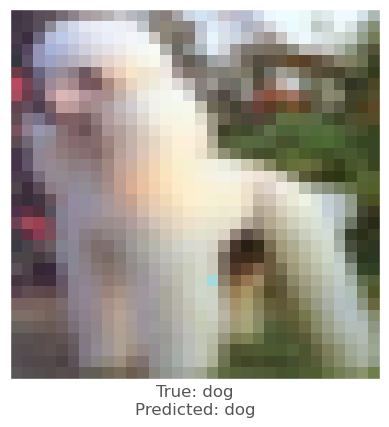



0.0012552142
-0.004310906
-0.0041202307
vr, vg, vb :   -2.4722052682881124 1.998376574042087 3.305665651771606
beam_perturbed_confidence temp :  0.50490916
beam_perturbed_confidence temp :  0.5036742
beam_perturbed_confidence temp :  0.5023534
beam_perturbed_confidence temp :  0.50156647
beam_perturbed_confidence temp :  0.49765924
beam_perturbed_confidence temp :  0.5047672
beam_perturbed_confidence temp :  0.49617547
row index :  6
16th round's confidence : 0th 0.49617547
predicted class :  horse
predicted class's confidence :  0.4978235
Lopt is :  45


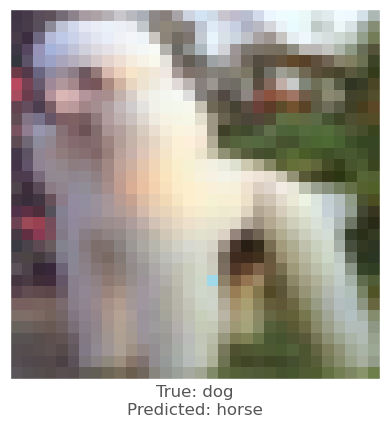




8th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  239 226 215
-0.0013400912
0.009133995
0.0029127002
vr, vg, vb :   0.13400912284851074 -0.9133994579315186 -0.29127001762390137
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6640307
beam_perturbed_confidence temp :  0.667136
beam_perturbed_confidence temp :  0.6640307
beam_perturbed_confidence temp :  0.667136
beam_perturbed_confidence temp :  0.6622843
beam_perturbed_confidence temp :  0.6622843
row index :  5
0th round's confidence : 0th 0.6622843
predicted class :  dog
predicted class's confidence :  0.6622843
Lopt is :  1


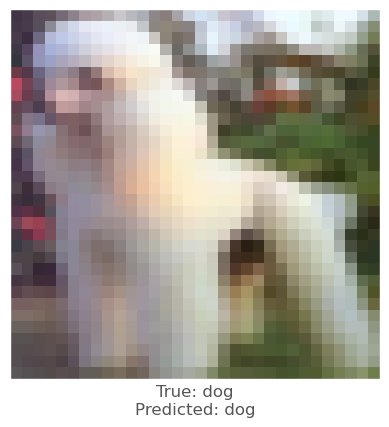



0.004470587
0.017109454
0.00892657
vr, vg, vb :   -0.44705867767333984 -1.7109453678131104 -0.8926570415496826
beam_perturbed_confidence temp :  0.6165481
beam_perturbed_confidence temp :  0.6017062
beam_perturbed_confidence temp :  0.6144788
beam_perturbed_confidence temp :  0.60012
beam_perturbed_confidence temp :  0.6122361
beam_perturbed_confidence temp :  0.59711546
beam_perturbed_confidence temp :  0.5953364
row index :  6
0th round's confidence : 1th 0.5953364
predicted class :  dog
predicted class's confidence :  0.5953364
Lopt is :  7


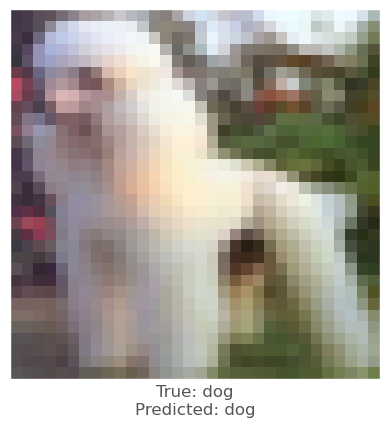



-0.0077414513
0.0009523034
-0.0018942356
vr, vg, vb :   0.7741451263427734 -0.0952303409576416 0.1894235610961914
beam_perturbed_confidence temp :  0.67619425
beam_perturbed_confidence temp :  0.6752881
beam_perturbed_confidence temp :  0.67619425
beam_perturbed_confidence temp :  0.6752881
beam_perturbed_confidence temp :  0.67619425
beam_perturbed_confidence temp :  0.6752881
beam_perturbed_confidence temp :  0.6752881
row index :  1
0th round's confidence : 2th 0.6752881
predicted class :  dog
predicted class's confidence :  0.6752881
Lopt is :  5


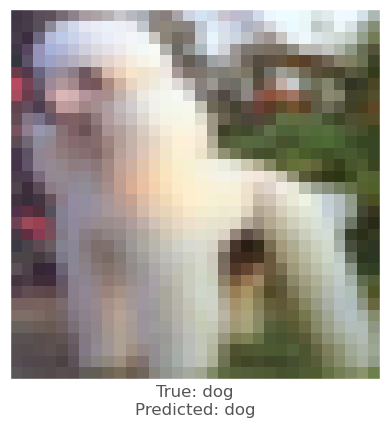



0.0068249106
0.02591455
0.013459861
vr, vg, vb :   -0.6824910640716553 -2.5914549827575684 -1.3459861278533936
beam_perturbed_confidence temp :  0.51360106
beam_perturbed_confidence temp :  0.48028916
beam_perturbed_confidence temp :  0.5039632
beam_perturbed_confidence temp :  0.47734538
beam_perturbed_confidence temp :  0.5003454
beam_perturbed_confidence temp :  0.46733773
beam_perturbed_confidence temp :  0.46477187
row index :  6
0th round's confidence : 3th 0.46477187
predicted class :  horse
predicted class's confidence :  0.51868784
Lopt is :  13


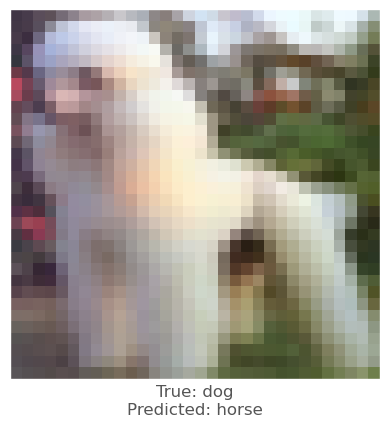




9th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  151 146 184
-0.0018001795
0.0031207204
-0.0012953877
vr, vg, vb :   0.18001794815063477 -0.3120720386505127 0.12953877449035645
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.6673748
row index :  1
0th round's confidence : 0th 0.6673748
predicted class :  dog
predicted class's confidence :  0.6673748
Lopt is :  1


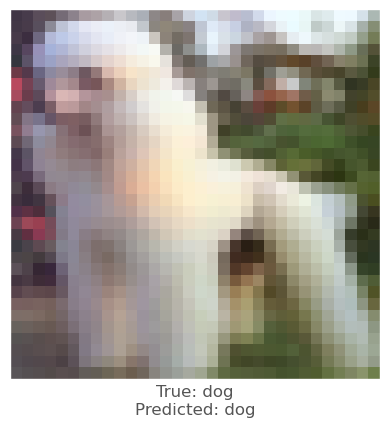



0.0051968694
0.013169885
0.005157292
vr, vg, vb :   -0.5196869373321533 -1.316988468170166 -0.5157291889190674
beam_perturbed_confidence temp :  0.6431739
beam_perturbed_confidence temp :  0.63256836
beam_perturbed_confidence temp :  0.64319164
beam_perturbed_confidence temp :  0.6284902
beam_perturbed_confidence temp :  0.64070374
beam_perturbed_confidence temp :  0.6296334
beam_perturbed_confidence temp :  0.62468344
row index :  6
0th round's confidence : 1th 0.62468344
predicted class :  dog
predicted class's confidence :  0.62468344
Lopt is :  7


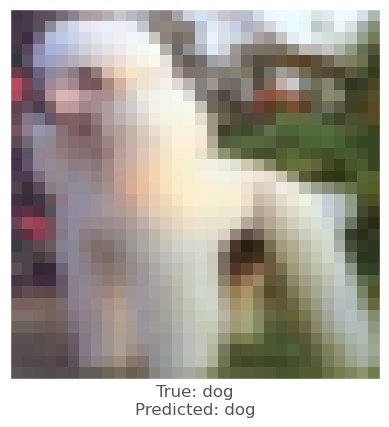



-0.009357095
-0.0074412823
-0.007450938
vr, vg, vb :   0.9357094764709473 0.7441282272338867 0.745093822479248
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
beam_perturbed_confidence temp :  0.6483893
row index :  0
0th round's confidence : 2th 0.6483893
predicted class :  dog
predicted class's confidence :  0.6483893
Lopt is :  5


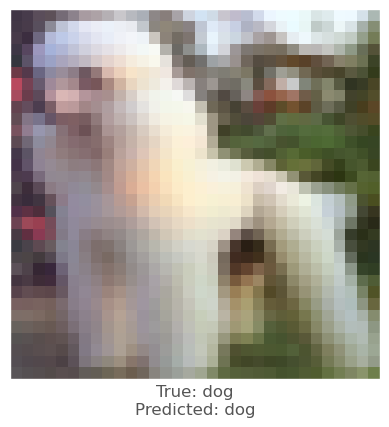



0.009347439
0.0119946
0.0027827024
vr, vg, vb :   -0.9347438812255859 -1.1994600296020508 -0.27827024459838867
beam_perturbed_confidence temp :  0.5622463
beam_perturbed_confidence temp :  0.5555337
beam_perturbed_confidence temp :  0.565812
beam_perturbed_confidence temp :  0.5507407
beam_perturbed_confidence temp :  0.5612221
beam_perturbed_confidence temp :  0.55395985
beam_perturbed_confidence temp :  0.5493681
row index :  6
0th round's confidence : 3th 0.5493681
predicted class :  dog
predicted class's confidence :  0.5493681
Lopt is :  12


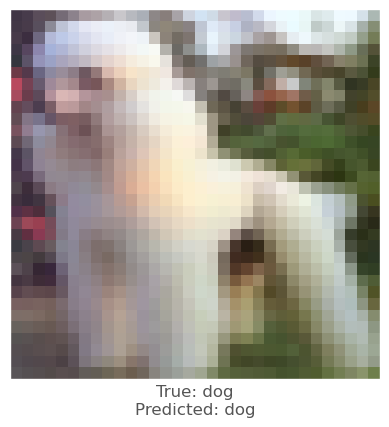



-0.008913755
-0.005118072
-0.008212626
vr, vg, vb :   0.8913755416870117 0.5118072032928467 0.8212625980377197
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5946406
row index :  0
0th round's confidence : 4th 0.5946406
predicted class :  dog
predicted class's confidence :  0.5946406
Lopt is :  10


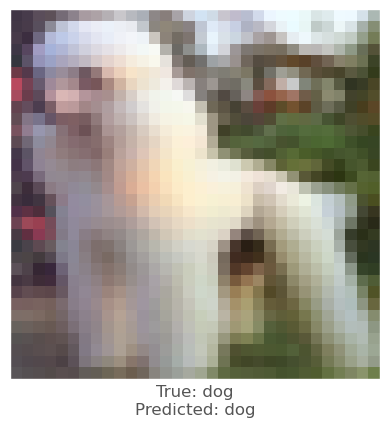



-0.002367437
0.0021537542
-0.0019763708
vr, vg, vb :   0.3987598419189453 -0.4962402582168579 0.31422197818756104
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.6673748
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.6664757
row index :  1
1th round's confidence : 0th 0.6664757
predicted class :  dog
predicted class's confidence :  0.6664757
Lopt is :  2


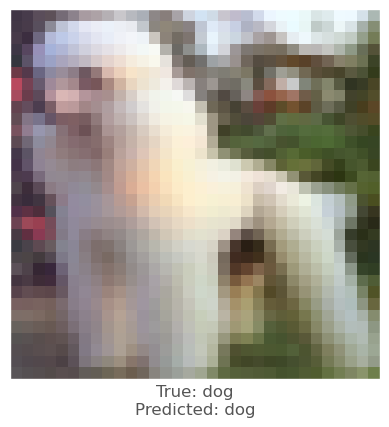



0.010627389
0.018405497
0.0075012445
vr, vg, vb :   -1.5304571390151978 -3.025839328765869 -1.2142807245254517
beam_perturbed_confidence temp :  0.61200523
beam_perturbed_confidence temp :  0.58707935
beam_perturbed_confidence temp :  0.61720186
beam_perturbed_confidence temp :  0.57683504
beam_perturbed_confidence temp :  0.6045667
beam_perturbed_confidence temp :  0.580983
beam_perturbed_confidence temp :  0.57258886
row index :  6
1th round's confidence : 1th 0.57258886
predicted class :  dog
predicted class's confidence :  0.57258886
Lopt is :  11


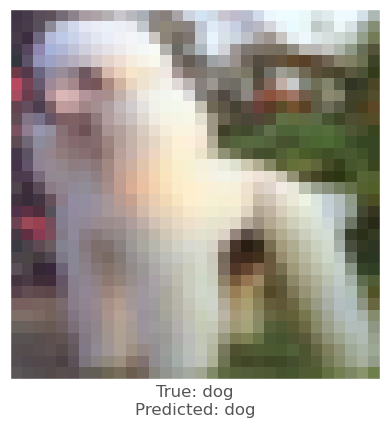



-0.009357095
-0.0074412823
-0.007450938
vr, vg, vb :   1.7778480052947998 1.4138436317443848 1.4156782627105713
beam_perturbed_confidence temp :  0.6432645
beam_perturbed_confidence temp :  0.6442672
beam_perturbed_confidence temp :  0.64436525
beam_perturbed_confidence temp :  0.6390903
beam_perturbed_confidence temp :  0.6390234
beam_perturbed_confidence temp :  0.6400764
beam_perturbed_confidence temp :  0.6349587
row index :  6
1th round's confidence : 2th 0.6349587
predicted class :  dog
predicted class's confidence :  0.6349587
Lopt is :  6


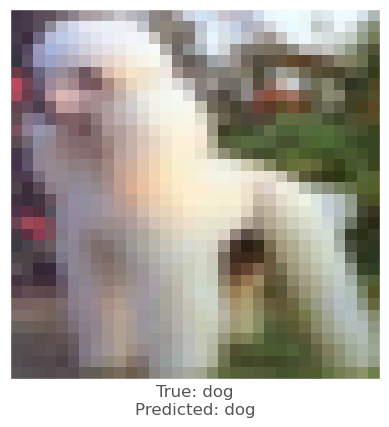



0.008637369
0.0113655925
0.002638936
vr, vg, vb :   -1.7050063610076904 -2.2160732746124268 -0.5143368244171143
beam_perturbed_confidence temp :  0.54033536
beam_perturbed_confidence temp :  0.529845
beam_perturbed_confidence temp :  0.5481018
beam_perturbed_confidence temp :  0.5178099
beam_perturbed_confidence temp :  0.5387214
beam_perturbed_confidence temp :  0.52740175
beam_perturbed_confidence temp :  0.5161076
row index :  6
1th round's confidence : 3th 0.5161076
predicted class :  dog
predicted class's confidence :  0.5161076
Lopt is :  15


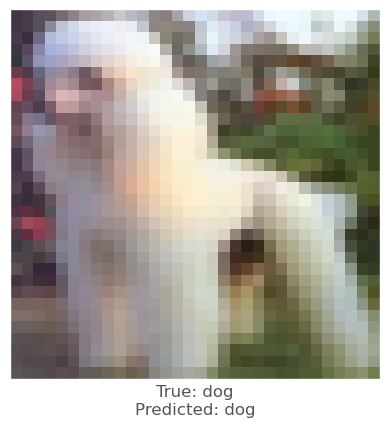



-0.008913755
-0.005118072
-0.008212626
vr, vg, vb :   1.6936135292053223 0.9724336862564087 1.5603989362716675
beam_perturbed_confidence temp :  0.590106
beam_perturbed_confidence temp :  0.5946406
beam_perturbed_confidence temp :  0.5904778
beam_perturbed_confidence temp :  0.590106
beam_perturbed_confidence temp :  0.5857506
beam_perturbed_confidence temp :  0.5904778
beam_perturbed_confidence temp :  0.5857506
row index :  4
1th round's confidence : 4th 0.5857506
predicted class :  dog
predicted class's confidence :  0.5857506
Lopt is :  11


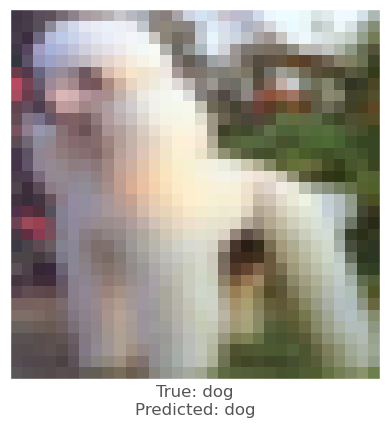



-0.0025301576
0.0021090508
-0.002083242
vr, vg, vb :   0.6118996143341064 -0.6575213074684143 0.4911239743232727
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.66526574
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.66526574
beam_perturbed_confidence temp :  0.6664757
beam_perturbed_confidence temp :  0.66526574
beam_perturbed_confidence temp :  0.66526574
row index :  1
2th round's confidence : 0th 0.66526574
predicted class :  dog
predicted class's confidence :  0.66526574
Lopt is :  3


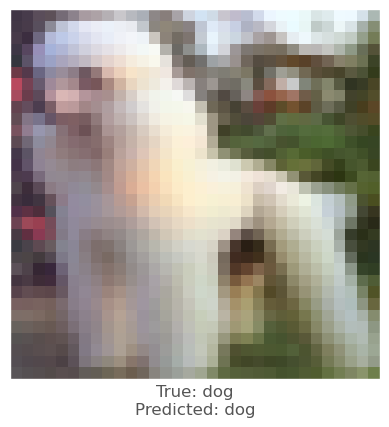



0.007700801
0.012708843
0.0036887527
vr, vg, vb :   -2.1474915146827698 -3.9941396713256836 -1.4617279171943665
beam_perturbed_confidence temp :  0.55878323
beam_perturbed_confidence temp :  0.5504431
beam_perturbed_confidence temp :  0.5691209
beam_perturbed_confidence temp :  0.53585166
beam_perturbed_confidence temp :  0.556731
beam_perturbed_confidence temp :  0.54659396
beam_perturbed_confidence temp :  0.5320076
row index :  6
2th round's confidence : 1th 0.5320076
predicted class :  dog
predicted class's confidence :  0.5320076
Lopt is :  15


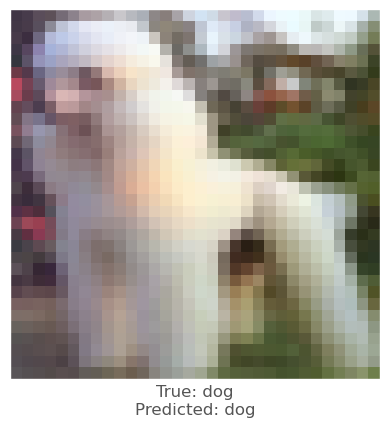



-0.010040045
-0.008238256
-0.008389413
vr, vg, vb :   2.6040676832199097 2.096284866333008 2.1130517721176147
beam_perturbed_confidence temp :  0.6252908
beam_perturbed_confidence temp :  0.6274501
beam_perturbed_confidence temp :  0.6266239
beam_perturbed_confidence temp :  0.62009424
beam_perturbed_confidence temp :  0.6178285
beam_perturbed_confidence temp :  0.62042826
beam_perturbed_confidence temp :  0.613673
row index :  6
2th round's confidence : 2th 0.613673
predicted class :  dog
predicted class's confidence :  0.613673
Lopt is :  8


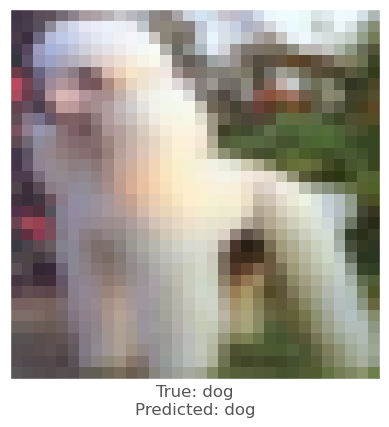



0.011165559
0.015024483
0.0035136342
vr, vg, vb :   -2.6510616540908813 -3.496914267539978 -0.814266562461853
beam_perturbed_confidence temp :  0.50017935
beam_perturbed_confidence temp :  0.48924375
beam_perturbed_confidence temp :  0.5142963
beam_perturbed_confidence temp :  0.474076
beam_perturbed_confidence temp :  0.49933052
beam_perturbed_confidence temp :  0.4877867
beam_perturbed_confidence temp :  0.4727888
row index :  6
2th round's confidence : 3th 0.4727888
predicted class :  horse
predicted class's confidence :  0.5146027
Lopt is :  19


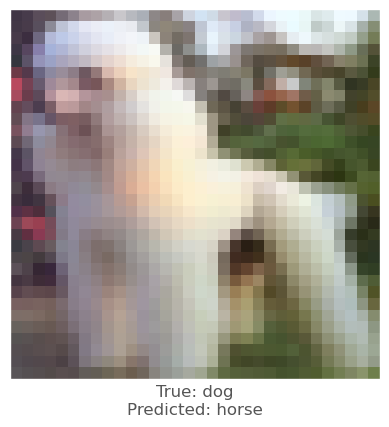




10th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  243 248 246
-0.0077834725
-0.006856084
0.0013242364
vr, vg, vb :   0.7783472537994385 0.6856083869934082 -0.13242363929748535
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6680123
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6680123
beam_perturbed_confidence temp :  0.6680123
beam_perturbed_confidence temp :  0.6680123
row index :  2
0th round's confidence : 0th 0.6680123
predicted class :  dog
predicted class's confidence :  0.6680123
Lopt is :  1


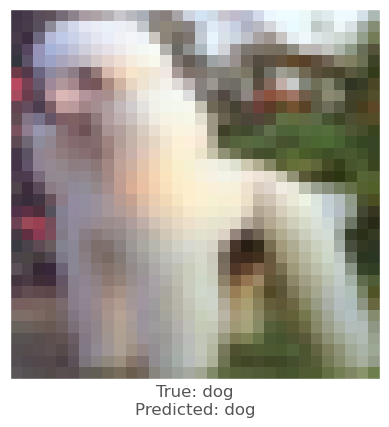



-0.0071902275
-0.0055217147
-0.00020551682
vr, vg, vb :   0.7190227508544922 0.5521714687347412 0.020551681518554688
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
beam_perturbed_confidence temp :  0.7020515
row index :  0
0th round's confidence : 1th 0.7020515
predicted class :  dog
predicted class's confidence :  0.7020515
Lopt is :  5


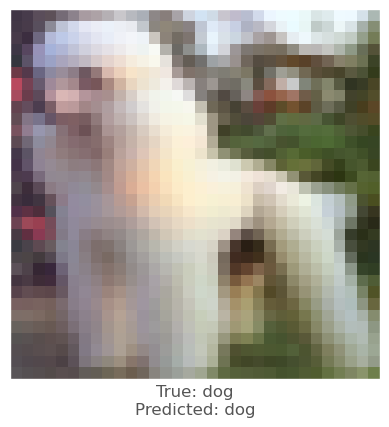



-0.01439774
-0.014313757
-0.0033574104
vr, vg, vb :   1.4397740364074707 1.4313757419586182 0.3357410430908203
beam_perturbed_confidence temp :  0.6160278
beam_perturbed_confidence temp :  0.61592734
beam_perturbed_confidence temp :  0.62336856
beam_perturbed_confidence temp :  0.6089336
beam_perturbed_confidence temp :  0.6160278
beam_perturbed_confidence temp :  0.61592734
beam_perturbed_confidence temp :  0.6089336
row index :  3
0th round's confidence : 2th 0.6089336
predicted class :  dog
predicted class's confidence :  0.6089336
Lopt is :  6


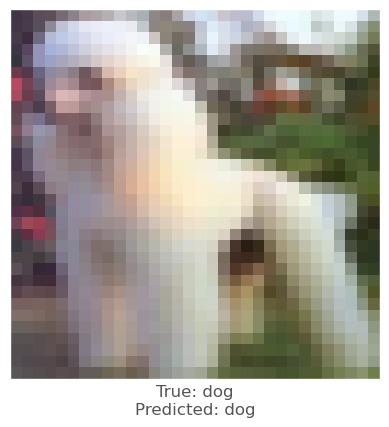



-0.0021981
-0.00027036667
0.002104938
vr, vg, vb :   0.21981000900268555 0.027036666870117188 -0.210493803024292
beam_perturbed_confidence temp :  0.72091043
beam_perturbed_confidence temp :  0.72091043
beam_perturbed_confidence temp :  0.71980995
beam_perturbed_confidence temp :  0.72091043
beam_perturbed_confidence temp :  0.71980995
beam_perturbed_confidence temp :  0.71980995
beam_perturbed_confidence temp :  0.71980995
row index :  2
0th round's confidence : 3th 0.71980995
predicted class :  dog
predicted class's confidence :  0.71980995
Lopt is :  11


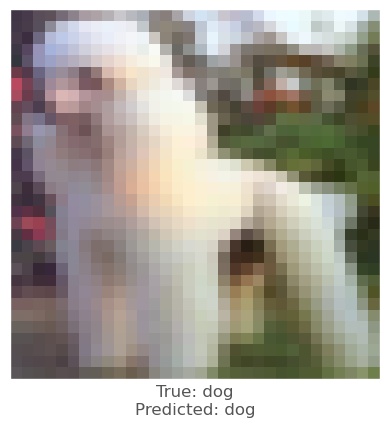



0.0016790368
0.0
0.0
vr, vg, vb :   -0.16790367662906647 0.0 0.0
beam_perturbed_confidence temp :  0.059585527
beam_perturbed_confidence temp :  0.4368581
beam_perturbed_confidence temp :  0.23420553
beam_perturbed_confidence temp :  0.43946192
beam_perturbed_confidence temp :  0.23347357
beam_perturbed_confidence temp :  0.58986306
beam_perturbed_confidence temp :  0.5927468
row index :  0
0th round's confidence : 4th 0.059585527
predicted class :  cat
predicted class's confidence :  0.7928184
Lopt is :  10


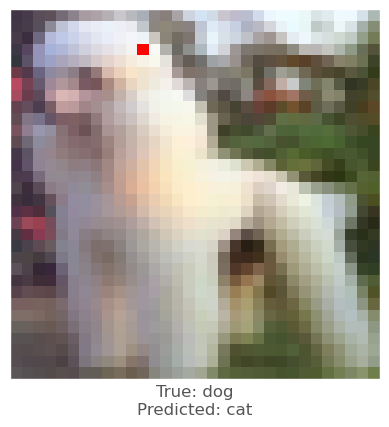




11th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  238 243 247
0.005563855
0.004638672
0.005345762
vr, vg, vb :   -0.5563855171203613 -0.4638671875 -0.5345761775970459
beam_perturbed_confidence temp :  0.66546166
beam_perturbed_confidence temp :  0.66562843
beam_perturbed_confidence temp :  0.66584426
beam_perturbed_confidence temp :  0.6626592
beam_perturbed_confidence temp :  0.6627976
beam_perturbed_confidence temp :  0.6629678
beam_perturbed_confidence temp :  0.66012
row index :  6
0th round's confidence : 0th 0.66012
predicted class :  dog
predicted class's confidence :  0.66012
Lopt is :  1


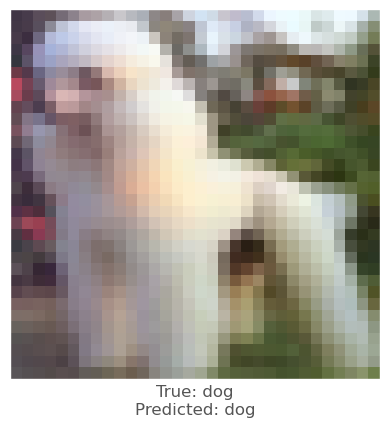



0.009431064
0.0070688725
0.005319178
vr, vg, vb :   -0.9431064128875732 -0.7068872451782227 -0.5319178104400635
beam_perturbed_confidence temp :  0.6000552
beam_perturbed_confidence temp :  0.60146177
beam_perturbed_confidence temp :  0.60233384
beam_perturbed_confidence temp :  0.5971563
beam_perturbed_confidence temp :  0.59763706
beam_perturbed_confidence temp :  0.59898806
beam_perturbed_confidence temp :  0.5944898
row index :  6
0th round's confidence : 1th 0.5944898
predicted class :  dog
predicted class's confidence :  0.5944898
Lopt is :  6


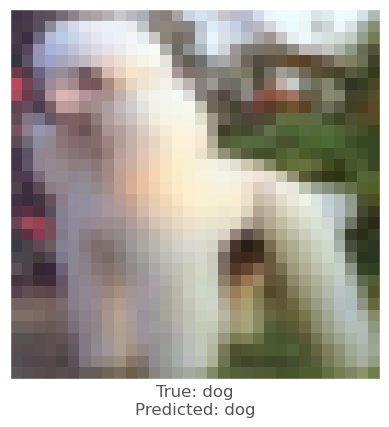



0.0006939769
0.0013445616
0.0032693744
vr, vg, vb :   -0.0693976879119873 -0.13445615768432617 -0.3269374370574951
beam_perturbed_confidence temp :  0.6905263
beam_perturbed_confidence temp :  0.69022465
beam_perturbed_confidence temp :  0.6892397
beam_perturbed_confidence temp :  0.68959534
beam_perturbed_confidence temp :  0.6886294
beam_perturbed_confidence temp :  0.6887564
beam_perturbed_confidence temp :  0.68791324
row index :  6
0th round's confidence : 2th 0.68791324
predicted class :  dog
predicted class's confidence :  0.68791324
Lopt is :  4


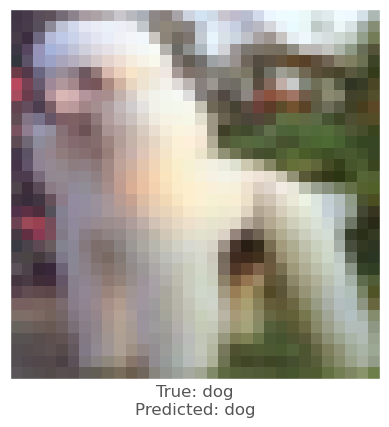



0.01940018
0.020279825
0.011205673
vr, vg, vb :   -1.9400179386138916 -2.027982473373413 -1.1205673217773438
beam_perturbed_confidence temp :  0.5096016
beam_perturbed_confidence temp :  0.49889797
beam_perturbed_confidence temp :  0.5185787
beam_perturbed_confidence temp :  0.4830579
beam_perturbed_confidence temp :  0.50123996
beam_perturbed_confidence temp :  0.49189255
beam_perturbed_confidence temp :  0.47491118
row index :  6
0th round's confidence : 3th 0.47491118
predicted class :  horse
predicted class's confidence :  0.5149766
Lopt is :  13


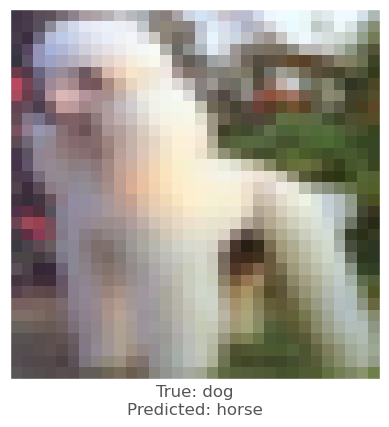




12th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  155 132 124
-0.016565263
-0.008641064
-0.0003708601
vr, vg, vb :   1.6565263271331787 0.8641064167022705 0.03708600997924805
beam_perturbed_confidence temp :  0.6599704
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6599704
beam_perturbed_confidence temp :  0.6599704
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6599704
row index :  0
0th round's confidence : 0th 0.6599704
predicted class :  dog
predicted class's confidence :  0.6599704
Lopt is :  1


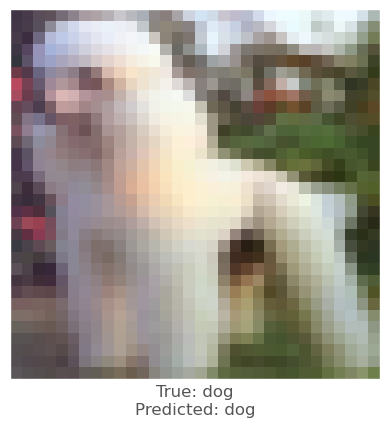



-0.009102464
-0.0010074377
0.0021244884
vr, vg, vb :   0.9102463722229004 0.10074377059936523 -0.2124488353729248
beam_perturbed_confidence temp :  0.6947983
beam_perturbed_confidence temp :  0.6947983
beam_perturbed_confidence temp :  0.6938227
beam_perturbed_confidence temp :  0.6947983
beam_perturbed_confidence temp :  0.6938227
beam_perturbed_confidence temp :  0.6938227
beam_perturbed_confidence temp :  0.6938227
row index :  2
0th round's confidence : 1th 0.6938227
predicted class :  dog
predicted class's confidence :  0.6938227
Lopt is :  6


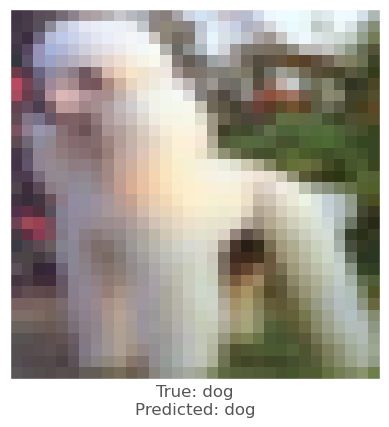



-0.009697616
-0.002227664
0.0036281943
vr, vg, vb :   0.9697616100311279 0.22276639938354492 -0.3628194332122803
beam_perturbed_confidence temp :  0.6201994
beam_perturbed_confidence temp :  0.6201994
beam_perturbed_confidence temp :  0.61870974
beam_perturbed_confidence temp :  0.6201994
beam_perturbed_confidence temp :  0.61870974
beam_perturbed_confidence temp :  0.61870974
beam_perturbed_confidence temp :  0.61870974
row index :  2
0th round's confidence : 2th 0.61870974
predicted class :  dog
predicted class's confidence :  0.61870974
Lopt is :  5


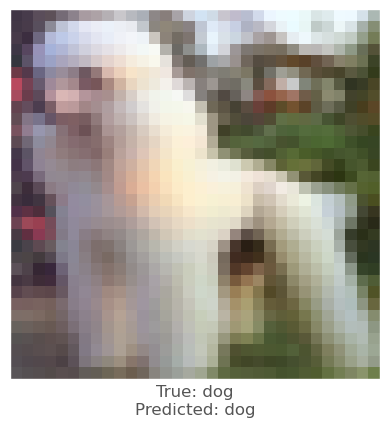



-0.0028966665
0.0008712411
0.0037494302
vr, vg, vb :   0.28966665267944336 -0.08712410926818848 -0.3749430179595947
beam_perturbed_confidence temp :  0.6952419
beam_perturbed_confidence temp :  0.6951286
beam_perturbed_confidence temp :  0.6934433
beam_perturbed_confidence temp :  0.6951286
beam_perturbed_confidence temp :  0.6934433
beam_perturbed_confidence temp :  0.6935961
beam_perturbed_confidence temp :  0.6935961
row index :  2
0th round's confidence : 3th 0.6934433
predicted class :  dog
predicted class's confidence :  0.6934433
Lopt is :  11


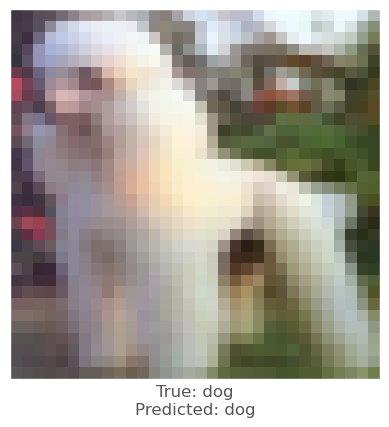



-0.0076451898
-0.004520297
0.00033283234
vr, vg, vb :   0.7645189762115479 0.4520297050476074 -0.033283233642578125
beam_perturbed_confidence temp :  0.5982759
beam_perturbed_confidence temp :  0.5982759
beam_perturbed_confidence temp :  0.59795964
beam_perturbed_confidence temp :  0.5982759
beam_perturbed_confidence temp :  0.59795964
beam_perturbed_confidence temp :  0.59795964
beam_perturbed_confidence temp :  0.59795964
row index :  2
0th round's confidence : 4th 0.59795964
predicted class :  dog
predicted class's confidence :  0.59795964
Lopt is :  10


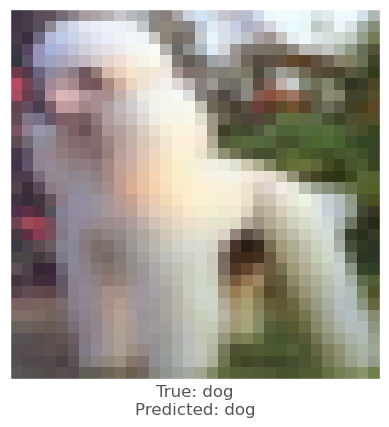



-0.016769886
-0.008136988
-0.00010752678
vr, vg, vb :   3.167862296104431 1.5913945436477661 0.04413008689880371
beam_perturbed_confidence temp :  0.63510984
beam_perturbed_confidence temp :  0.6559974
beam_perturbed_confidence temp :  0.6599704
beam_perturbed_confidence temp :  0.63190216
beam_perturbed_confidence temp :  0.63510984
beam_perturbed_confidence temp :  0.6559974
beam_perturbed_confidence temp :  0.63190216
row index :  3
1th round's confidence : 0th 0.63190216
predicted class :  dog
predicted class's confidence :  0.63190216
Lopt is :  4


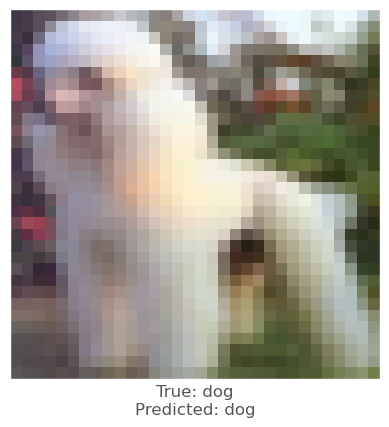



-0.00901401
-0.0010931492
0.0016163588
vr, vg, vb :   1.7206227779388428 0.19998431205749512 -0.3528398275375366
beam_perturbed_confidence temp :  0.6890654
beam_perturbed_confidence temp :  0.6938227
beam_perturbed_confidence temp :  0.69318193
beam_perturbed_confidence temp :  0.6890654
beam_perturbed_confidence temp :  0.6880014
beam_perturbed_confidence temp :  0.69318193
beam_perturbed_confidence temp :  0.6880014
row index :  4
1th round's confidence : 1th 0.6880014
predicted class :  dog
predicted class's confidence :  0.6880014
Lopt is :  7


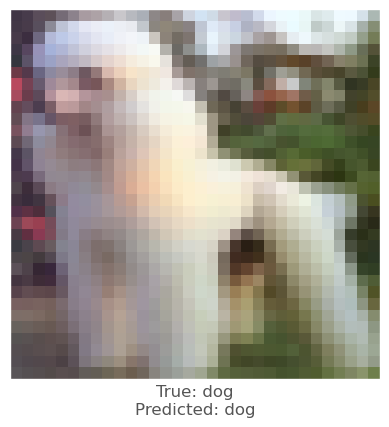



-0.010336578
-0.0031741858
0.0027461648
vr, vg, vb :   1.9064432382583618 0.5179083347320557 -0.6011539697647095
beam_perturbed_confidence temp :  0.6140355
beam_perturbed_confidence temp :  0.61870974
beam_perturbed_confidence temp :  0.6174532
beam_perturbed_confidence temp :  0.6140355
beam_perturbed_confidence temp :  0.6120449
beam_perturbed_confidence temp :  0.6174532
beam_perturbed_confidence temp :  0.6120449
row index :  4
1th round's confidence : 2th 0.6120449
predicted class :  dog
predicted class's confidence :  0.6120449
Lopt is :  6


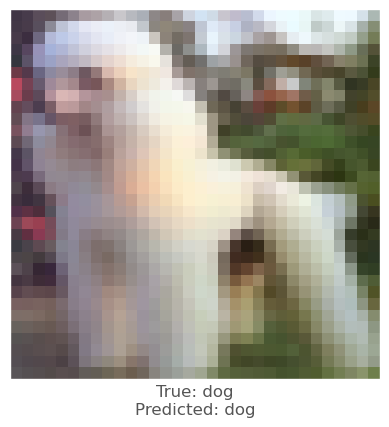



-0.0031096935
0.0005143881
0.0033952594
vr, vg, vb :   0.571669340133667 -0.12985050678253174 -0.6769746541976929
beam_perturbed_confidence temp :  0.6934433
beam_perturbed_confidence temp :  0.6935961
beam_perturbed_confidence temp :  0.69184667
beam_perturbed_confidence temp :  0.6935961
beam_perturbed_confidence temp :  0.69184667
beam_perturbed_confidence temp :  0.69195634
beam_perturbed_confidence temp :  0.69195634
row index :  2
1th round's confidence : 3th 0.69184667
predicted class :  dog
predicted class's confidence :  0.69184667
Lopt is :  12


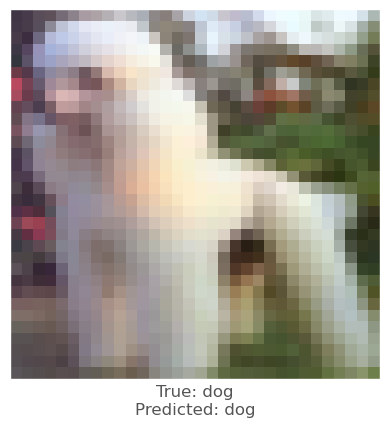



-0.0074514747
-0.0036665797
0.0010232329
vr, vg, vb :   1.433214545249939 0.7734847068786621 -0.1322782039642334
beam_perturbed_confidence temp :  0.5942885
beam_perturbed_confidence temp :  0.59795964
beam_perturbed_confidence temp :  0.59725267
beam_perturbed_confidence temp :  0.5942885
beam_perturbed_confidence temp :  0.5934422
beam_perturbed_confidence temp :  0.59725267
beam_perturbed_confidence temp :  0.5934422
row index :  4
1th round's confidence : 4th 0.5934422
predicted class :  dog
predicted class's confidence :  0.5934422
Lopt is :  11


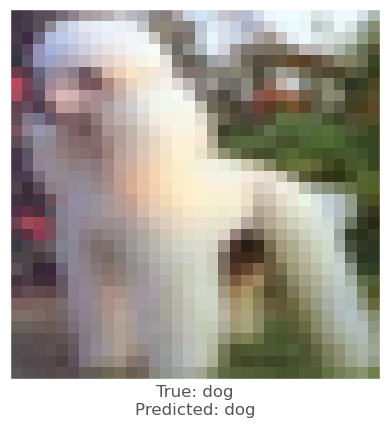



-0.013809085
-0.0057708025
0.0028551817
vr, vg, vb :   4.231984555721283 2.0093353390693665 -0.24580109119415283
beam_perturbed_confidence temp :  0.6077051
beam_perturbed_confidence temp :  0.62549454
beam_perturbed_confidence temp :  0.6304918
beam_perturbed_confidence temp :  0.6036433
beam_perturbed_confidence temp :  0.6068045
beam_perturbed_confidence temp :  0.62503433
beam_perturbed_confidence temp :  0.6025967
row index :  6
2th round's confidence : 0th 0.6025967
predicted class :  dog
predicted class's confidence :  0.6025967
Lopt is :  8


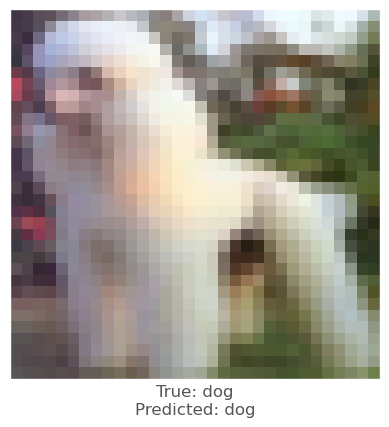



-0.009344339
-0.0018146038
0.0017113686
vr, vg, vb :   2.4829944372177124 0.3614462614059448 -0.4886927008628845
beam_perturbed_confidence temp :  0.6783977
beam_perturbed_confidence temp :  0.6880014
beam_perturbed_confidence temp :  0.687354
beam_perturbed_confidence temp :  0.6783977
beam_perturbed_confidence temp :  0.67808133
beam_perturbed_confidence temp :  0.687354
beam_perturbed_confidence temp :  0.67808133
row index :  4
2th round's confidence : 1th 0.67808133
predicted class :  dog
predicted class's confidence :  0.67808133
Lopt is :  8


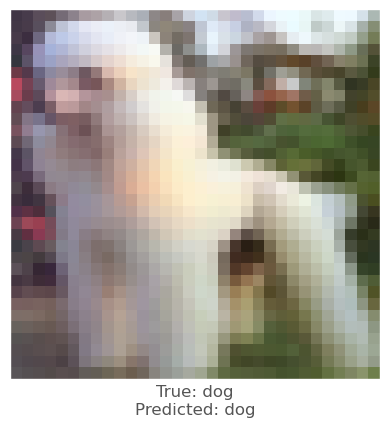



-0.009190142
-0.0020807385
0.003327489
vr, vg, vb :   2.634813129901886 0.6741913557052612 -0.8737874627113342
beam_perturbed_confidence temp :  0.60518795
beam_perturbed_confidence temp :  0.6120449
beam_perturbed_confidence temp :  0.610708
beam_perturbed_confidence temp :  0.60518795
beam_perturbed_confidence temp :  0.60362566
beam_perturbed_confidence temp :  0.610708
beam_perturbed_confidence temp :  0.60362566
row index :  4
2th round's confidence : 2th 0.60362566
predicted class :  dog
predicted class's confidence :  0.60362566
Lopt is :  8


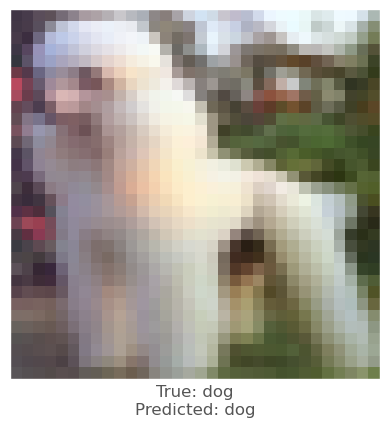



-0.003248632
0.00038200617
0.0029326677
vr, vg, vb :   0.8393656015396118 -0.15506607294082642 -0.9025439620018005
beam_perturbed_confidence temp :  0.69184667
beam_perturbed_confidence temp :  0.69195634
beam_perturbed_confidence temp :  0.69051063
beam_perturbed_confidence temp :  0.69195634
beam_perturbed_confidence temp :  0.69051063
beam_perturbed_confidence temp :  0.69009376
beam_perturbed_confidence temp :  0.69009376
row index :  5
2th round's confidence : 3th 0.69009376
predicted class :  dog
predicted class's confidence :  0.69009376
Lopt is :  13


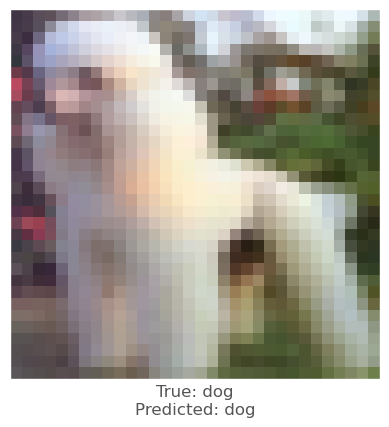



-0.0077465177
-0.0027374625
0.0018648505
vr, vg, vb :   2.0645448565483093 0.9698824882507324 -0.3055354356765747
beam_perturbed_confidence temp :  0.5854768
beam_perturbed_confidence temp :  0.5934422
beam_perturbed_confidence temp :  0.5924237
beam_perturbed_confidence temp :  0.5854768
beam_perturbed_confidence temp :  0.5848731
beam_perturbed_confidence temp :  0.5924237
beam_perturbed_confidence temp :  0.5848731
row index :  4
2th round's confidence : 4th 0.5848731
predicted class :  dog
predicted class's confidence :  0.5848731
Lopt is :  13


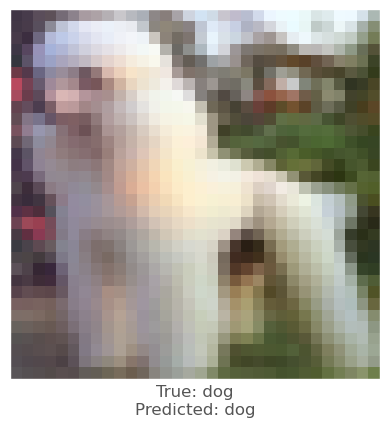



-0.00818634
-0.0034148097
0.0015961528
vr, vg, vb :   4.627420133352279 2.1498827755451204 -0.3808362603187561
beam_perturbed_confidence temp :  0.5870417
beam_perturbed_confidence temp :  0.6001168
beam_perturbed_confidence temp :  0.60204715
beam_perturbed_confidence temp :  0.58722544
beam_perturbed_confidence temp :  0.5855879
beam_perturbed_confidence temp :  0.5993298
beam_perturbed_confidence temp :  0.58587205
row index :  4
3th round's confidence : 0th 0.5855879
predicted class :  dog
predicted class's confidence :  0.5855879
Lopt is :  12


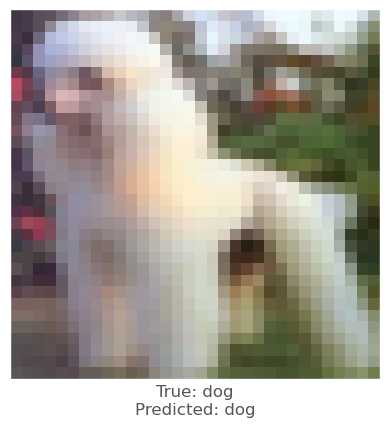



-0.009559989
-0.0034959912
0.0005710125
vr, vg, vb :   3.1906938910484315 0.674900758266449 -0.4969246804714203
beam_perturbed_confidence temp :  0.66597044
beam_perturbed_confidence temp :  0.67808133
beam_perturbed_confidence temp :  0.6778267
beam_perturbed_confidence temp :  0.66597044
beam_perturbed_confidence temp :  0.6658755
beam_perturbed_confidence temp :  0.6778267
beam_perturbed_confidence temp :  0.6658755
row index :  4
3th round's confidence : 1th 0.6658755
predicted class :  dog
predicted class's confidence :  0.6658755
Lopt is :  9


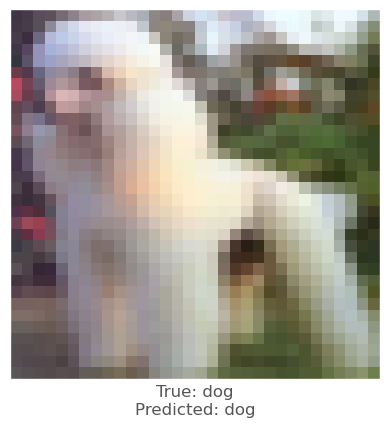



-0.0062578917
-0.001437664
0.0033760667
vr, vg, vb :   2.9971209824085236 0.7505386233329773 -1.1240153849124908
beam_perturbed_confidence temp :  0.5960052
beam_perturbed_confidence temp :  0.60362566
beam_perturbed_confidence temp :  0.6007126
beam_perturbed_confidence temp :  0.5960052
beam_perturbed_confidence temp :  0.5939511
beam_perturbed_confidence temp :  0.6007126
beam_perturbed_confidence temp :  0.5939511
row index :  4
3th round's confidence : 2th 0.5939511
predicted class :  dog
predicted class's confidence :  0.5939511
Lopt is :  10


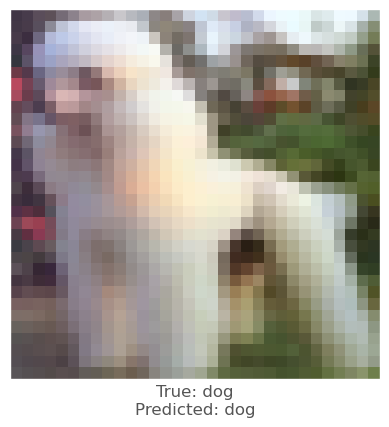



-0.0021719933
0.001549542
0.0037438273
vr, vg, vb :   0.9726283669471741 -0.2945136606693268 -1.1866723001003265
beam_perturbed_confidence temp :  0.69009376
beam_perturbed_confidence temp :  0.6889611
beam_perturbed_confidence temp :  0.6863263
beam_perturbed_confidence temp :  0.6889611
beam_perturbed_confidence temp :  0.6863263
beam_perturbed_confidence temp :  0.68593144
beam_perturbed_confidence temp :  0.68593144
row index :  5
3th round's confidence : 3th 0.68593144
predicted class :  dog
predicted class's confidence :  0.68593144
Lopt is :  15


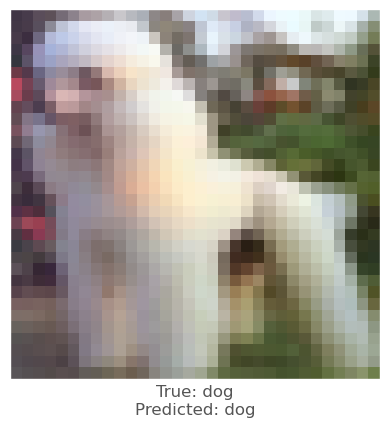



-0.008181214
-0.0018489361
0.0014230013
vr, vg, vb :   2.676211804151535 1.057787847518921 -0.41728202104568485
beam_perturbed_confidence temp :  0.5754238
beam_perturbed_confidence temp :  0.5836924
beam_perturbed_confidence temp :  0.5840538
beam_perturbed_confidence temp :  0.57401013
beam_perturbed_confidence temp :  0.57487744
beam_perturbed_confidence temp :  0.5830502
beam_perturbed_confidence temp :  0.5738505
row index :  6
3th round's confidence : 4th 0.5738505
predicted class :  dog
predicted class's confidence :  0.5738505
Lopt is :  15


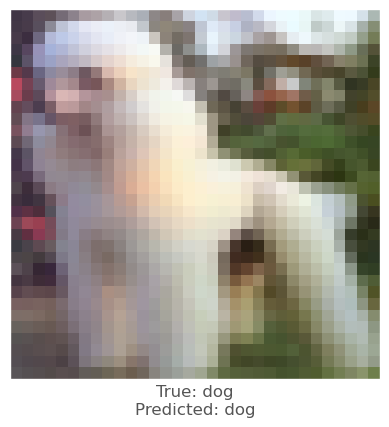



-0.007178068
-0.000107586384
0.0025734305
vr, vg, vb :   4.882484936118126 1.9456531363725664 -0.6000956881046295
beam_perturbed_confidence temp :  0.57293886
beam_perturbed_confidence temp :  0.585683
beam_perturbed_confidence temp :  0.58446825
beam_perturbed_confidence temp :  0.573191
beam_perturbed_confidence temp :  0.5713033
beam_perturbed_confidence temp :  0.5841625
beam_perturbed_confidence temp :  0.57209384
row index :  4
4th round's confidence : 0th 0.5713033
predicted class :  dog
predicted class's confidence :  0.5713033
Lopt is :  16


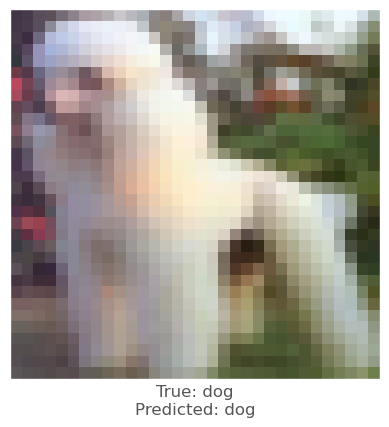



-0.009464741
-0.002868235
0.000990808
vr, vg, vb :   3.818098577260971 0.8942341935634613 -0.5463130134344101
beam_perturbed_confidence temp :  0.64767236
beam_perturbed_confidence temp :  0.6658755
beam_perturbed_confidence temp :  0.66497964
beam_perturbed_confidence temp :  0.64767236
beam_perturbed_confidence temp :  0.6479757
beam_perturbed_confidence temp :  0.66497964
beam_perturbed_confidence temp :  0.6479757
row index :  0
4th round's confidence : 1th 0.64767236
predicted class :  dog
predicted class's confidence :  0.64767236
Lopt is :  9


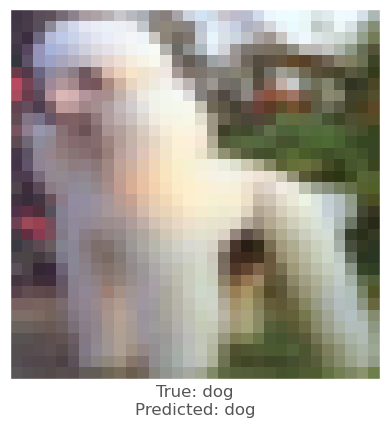



-0.0056568384
-0.0013091564
0.0029693246
vr, vg, vb :   3.2630927258729936 0.8064004027843475 -1.3085463052988051
beam_perturbed_confidence temp :  0.5849449
beam_perturbed_confidence temp :  0.5939511
beam_perturbed_confidence temp :  0.591314
beam_perturbed_confidence temp :  0.5849449
beam_perturbed_confidence temp :  0.58230746
beam_perturbed_confidence temp :  0.591314
beam_perturbed_confidence temp :  0.58230746
row index :  4
4th round's confidence : 2th 0.58230746
predicted class :  dog
predicted class's confidence :  0.58230746
Lopt is :  13


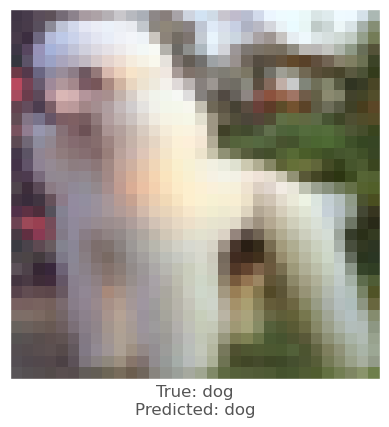



-0.0024585128
0.0013670325
0.0030139685
vr, vg, vb :   1.1212168085575105 -0.40176554739475256 -1.3694019168615341
beam_perturbed_confidence temp :  0.68448156
beam_perturbed_confidence temp :  0.6849593
beam_perturbed_confidence temp :  0.68273395
beam_perturbed_confidence temp :  0.68321663
beam_perturbed_confidence temp :  0.68116117
beam_perturbed_confidence temp :  0.6817513
beam_perturbed_confidence temp :  0.67995346
row index :  6
4th round's confidence : 3th 0.67995346
predicted class :  dog
predicted class's confidence :  0.67995346
Lopt is :  17


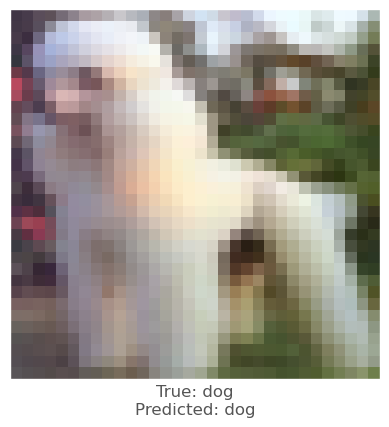



-0.009327352
-0.002150774
0.0005569458
vr, vg, vb :   3.3413258284330367 1.1670864629745485 -0.4312483990192414
beam_perturbed_confidence temp :  0.5618099
beam_perturbed_confidence temp :  0.57272667
beam_perturbed_confidence temp :  0.5734532
beam_perturbed_confidence temp :  0.56124854
beam_perturbed_confidence temp :  0.5616341
beam_perturbed_confidence temp :  0.57187027
beam_perturbed_confidence temp :  0.56103843
row index :  6
4th round's confidence : 4th 0.56103843
predicted class :  dog
predicted class's confidence :  0.56103843
Lopt is :  18


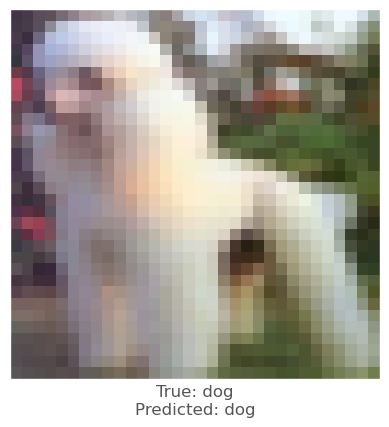



-0.0048729777
0.0022867918
0.0036318898
vr, vg, vb :   4.88153421586752 1.522408642590046 -0.9032751013040543
beam_perturbed_confidence temp :  0.55694586
beam_perturbed_confidence temp :  0.57209384
beam_perturbed_confidence temp :  0.56930697
beam_perturbed_confidence temp :  0.5563869
beam_perturbed_confidence temp :  0.5571609
beam_perturbed_confidence temp :  0.5706601
beam_perturbed_confidence temp :  0.5563162
row index :  6
5th round's confidence : 0th 0.5563162
predicted class :  dog
predicted class's confidence :  0.5563162
Lopt is :  20


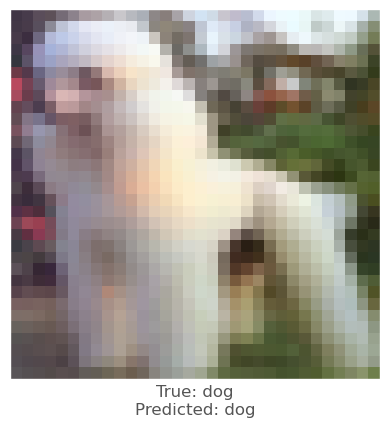



-0.011096895
-0.004345119
0.00024861097
vr, vg, vb :   4.545978193640709 1.2393226741552352 -0.5165428094267845
beam_perturbed_confidence temp :  0.62557626
beam_perturbed_confidence temp :  0.6461528
beam_perturbed_confidence temp :  0.6479757
beam_perturbed_confidence temp :  0.6228555
beam_perturbed_confidence temp :  0.6255989
beam_perturbed_confidence temp :  0.645337
beam_perturbed_confidence temp :  0.6232468
row index :  3
5th round's confidence : 1th 0.6228555
predicted class :  dog
predicted class's confidence :  0.6228555
Lopt is :  9


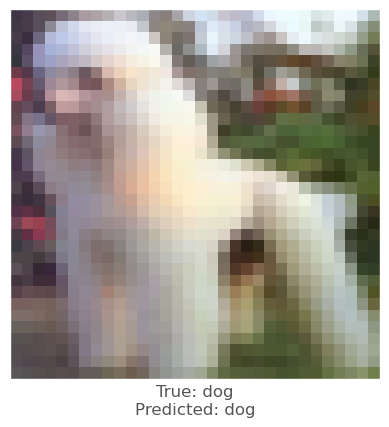



-0.0067538023
-0.0005386472
0.0027133226
vr, vg, vb :   3.6121636832356456 0.7796250799894333 -1.4490239387154578
beam_perturbed_confidence temp :  0.5719781
beam_perturbed_confidence temp :  0.58230746
beam_perturbed_confidence temp :  0.5795324
beam_perturbed_confidence temp :  0.5719781
beam_perturbed_confidence temp :  0.57064056
beam_perturbed_confidence temp :  0.5795324
beam_perturbed_confidence temp :  0.57064056
row index :  4
5th round's confidence : 2th 0.57064056
predicted class :  dog
predicted class's confidence :  0.57064056
Lopt is :  16


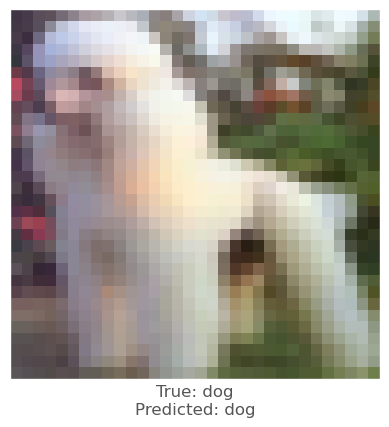



-0.004396558
0.0038490891
0.0037953258
vr, vg, vb :   1.4487509084939958 -0.7464979072213174 -1.6119943007826805
beam_perturbed_confidence temp :  0.67735475
beam_perturbed_confidence temp :  0.6773121
beam_perturbed_confidence temp :  0.67493623
beam_perturbed_confidence temp :  0.67490786
beam_perturbed_confidence temp :  0.67242974
beam_perturbed_confidence temp :  0.6719208
beam_perturbed_confidence temp :  0.66910094
row index :  6
5th round's confidence : 3th 0.66910094
predicted class :  dog
predicted class's confidence :  0.66910094
Lopt is :  19


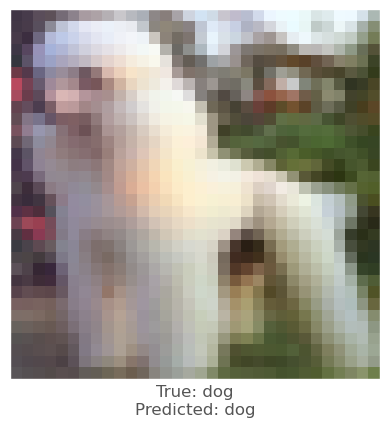



-0.0073351264
-0.001336813
0.0007305145
vr, vg, vb :   3.7407058855891226 1.1840591139793397 -0.461175011754036
beam_perturbed_confidence temp :  0.54861313
beam_perturbed_confidence temp :  0.5602973
beam_perturbed_confidence temp :  0.560518
beam_perturbed_confidence temp :  0.5469642
beam_perturbed_confidence temp :  0.5488474
beam_perturbed_confidence temp :  0.55970705
beam_perturbed_confidence temp :  0.5473343
row index :  3
5th round's confidence : 4th 0.5469642
predicted class :  dog
predicted class's confidence :  0.5469642
Lopt is :  21


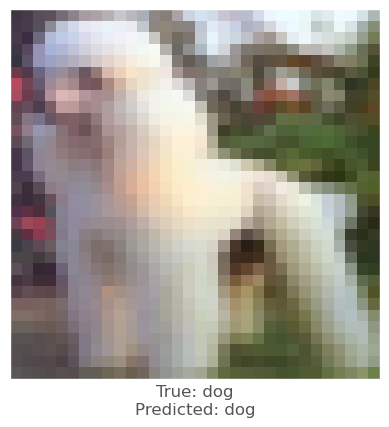



-0.006971717
-0.0011482835
0.000223279
vr, vg, vb :   5.090552482360602 1.4849961264908316 -0.8352754911065102
beam_perturbed_confidence temp :  0.5348335
beam_perturbed_confidence temp :  0.55601263
beam_perturbed_confidence temp :  0.5561636
beam_perturbed_confidence temp :  0.5341497
beam_perturbed_confidence temp :  0.53425753
beam_perturbed_confidence temp :  0.5559883
beam_perturbed_confidence temp :  0.53416836
row index :  3
6th round's confidence : 0th 0.5341497
predicted class :  dog
predicted class's confidence :  0.5341497
Lopt is :  25


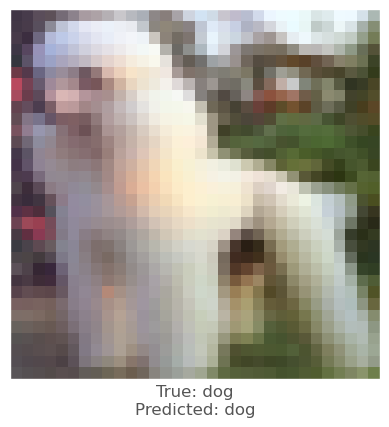



-0.017572284
-0.0064694285
-0.0008766651
vr, vg, vb :   5.848608748757839 1.762333260667324 -0.3772220169484616
beam_perturbed_confidence temp :  0.5746575
beam_perturbed_confidence temp :  0.6191068
beam_perturbed_confidence temp :  0.6232468
beam_perturbed_confidence temp :  0.57314575
beam_perturbed_confidence temp :  0.5748391
beam_perturbed_confidence temp :  0.6198297
beam_perturbed_confidence temp :  0.57371294
row index :  3
6th round's confidence : 1th 0.57314575
predicted class :  dog
predicted class's confidence :  0.57314575
Lopt is :  13


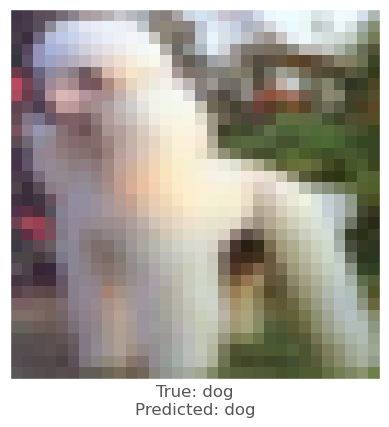



-0.0070124865
-0.00060015917
0.0017077327
vr, vg, vb :   3.952195960694552 0.7616784888148308 -1.4748948125898838
beam_perturbed_confidence temp :  0.55947244
beam_perturbed_confidence temp :  0.57064056
beam_perturbed_confidence temp :  0.56821316
beam_perturbed_confidence temp :  0.55947244
beam_perturbed_confidence temp :  0.5588459
beam_perturbed_confidence temp :  0.56821316
beam_perturbed_confidence temp :  0.5588459
row index :  4
6th round's confidence : 2th 0.5588459
predicted class :  dog
predicted class's confidence :  0.5588459
Lopt is :  19


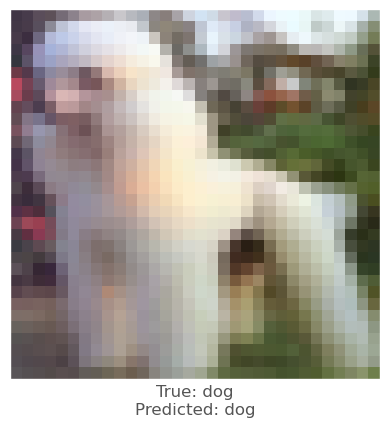



-0.0053940415
0.0068035126
0.0060825944
vr, vg, vb :   1.8432799714684487 -1.3521993738234044 -2.0590543101727965
beam_perturbed_confidence temp :  0.66652673
beam_perturbed_confidence temp :  0.66246134
beam_perturbed_confidence temp :  0.6604899
beam_perturbed_confidence temp :  0.65961
beam_perturbed_confidence temp :  0.65801746
beam_perturbed_confidence temp :  0.6559521
beam_perturbed_confidence temp :  0.65270346
row index :  6
6th round's confidence : 3th 0.65270346
predicted class :  dog
predicted class's confidence :  0.65270346
Lopt is :  22


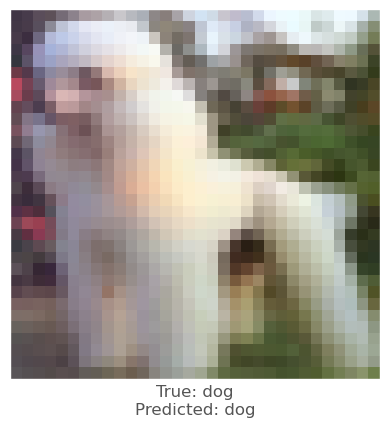



-0.011207879
-0.0029761791
-0.0007736087
vr, vg, vb :   4.487423155993223 1.3632711148738863 -0.33769664212465295
beam_perturbed_confidence temp :  0.52798444
beam_perturbed_confidence temp :  0.54563695
beam_perturbed_confidence temp :  0.5473343
beam_perturbed_confidence temp :  0.5273657
beam_perturbed_confidence temp :  0.52746767
beam_perturbed_confidence temp :  0.54543006
beam_perturbed_confidence temp :  0.52708274
row index :  6
6th round's confidence : 4th 0.52708274
predicted class :  dog
predicted class's confidence :  0.52708274
Lopt is :  25


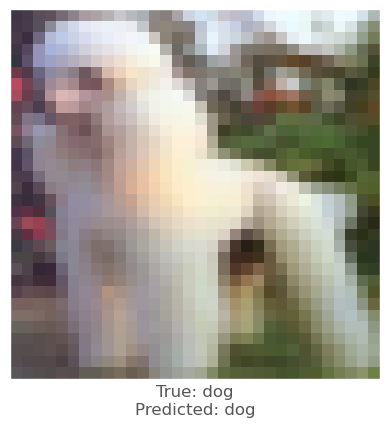



-0.011245072
-0.0012192726
0.00023120642
vr, vg, vb :   5.706004422921539 1.4584237751942875 -0.7748685837042333
beam_perturbed_confidence temp :  0.5043087
beam_perturbed_confidence temp :  0.5336142
beam_perturbed_confidence temp :  0.53416836
beam_perturbed_confidence temp :  0.50374764
beam_perturbed_confidence temp :  0.5047363
beam_perturbed_confidence temp :  0.53319246
beam_perturbed_confidence temp :  0.5035878
row index :  6
7th round's confidence : 0th 0.5035878
predicted class :  dog
predicted class's confidence :  0.5035878
Lopt is :  30


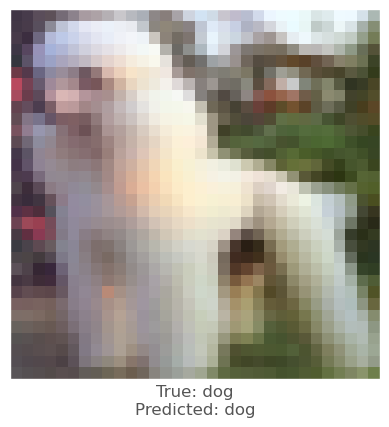



-0.015337944
-0.0024850965
-0.00066643953
vr, vg, vb :   6.797542276958227 1.8346095800626279 -0.2728558619302512
beam_perturbed_confidence temp :  0.5450449
beam_perturbed_confidence temp :  0.5721724
beam_perturbed_confidence temp :  0.57371294
beam_perturbed_confidence temp :  0.54687667
beam_perturbed_confidence temp :  0.54323065
beam_perturbed_confidence temp :  0.57166535
beam_perturbed_confidence temp :  0.544859
row index :  4
7th round's confidence : 1th 0.54323065
predicted class :  dog
predicted class's confidence :  0.54323065
Lopt is :  19


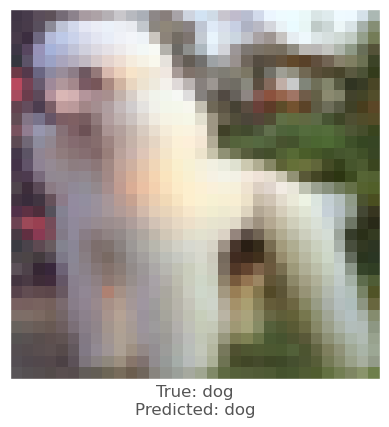



-0.0067443848
-0.00070106983
0.0014762878
vr, vg, vb :   4.231414841187597 0.7556176231181622 -1.4750341155105828
beam_perturbed_confidence temp :  0.54506034
beam_perturbed_confidence temp :  0.5588459
beam_perturbed_confidence temp :  0.55684525
beam_perturbed_confidence temp :  0.54506034
beam_perturbed_confidence temp :  0.5450947
beam_perturbed_confidence temp :  0.55684525
beam_perturbed_confidence temp :  0.5450947
row index :  0
7th round's confidence : 2th 0.54506034
predicted class :  dog
predicted class's confidence :  0.54506034
Lopt is :  23


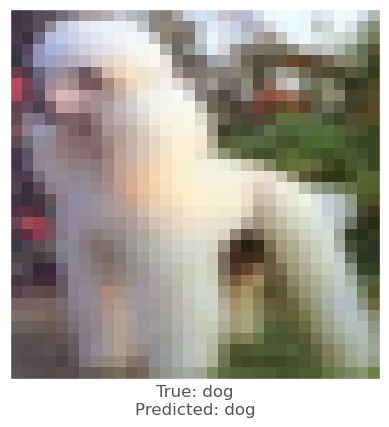



-0.0065822005
0.005264044
0.0043566823
vr, vg, vb :   2.31717202704072 -1.7433838172394038 -2.2888171092122795
beam_perturbed_confidence temp :  0.6460886
beam_perturbed_confidence temp :  0.64627546
beam_perturbed_confidence temp :  0.6452222
beam_perturbed_confidence temp :  0.6389769
beam_perturbed_confidence temp :  0.6374556
beam_perturbed_confidence temp :  0.6378292
beam_perturbed_confidence temp :  0.62995607
row index :  6
7th round's confidence : 3th 0.62995607
predicted class :  dog
predicted class's confidence :  0.62995607
Lopt is :  25


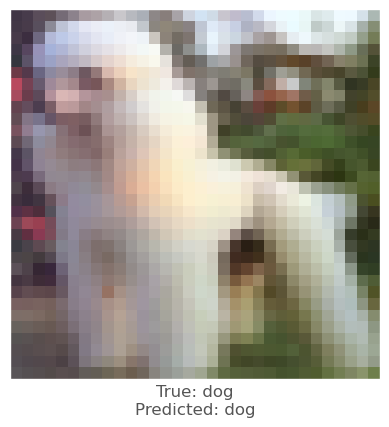



-0.008595347
-0.0013164878
0.00053036213
vr, vg, vb :   4.8982155808418995 1.358592782301903 -0.3569631908333302
beam_perturbed_confidence temp :  0.5083355
beam_perturbed_confidence temp :  0.5261512
beam_perturbed_confidence temp :  0.5268353
beam_perturbed_confidence temp :  0.50719905
beam_perturbed_confidence temp :  0.508345
beam_perturbed_confidence temp :  0.5261489
beam_perturbed_confidence temp :  0.5068791
row index :  6
7th round's confidence : 4th 0.5068791
predicted class :  dog
predicted class's confidence :  0.5068791
Lopt is :  29


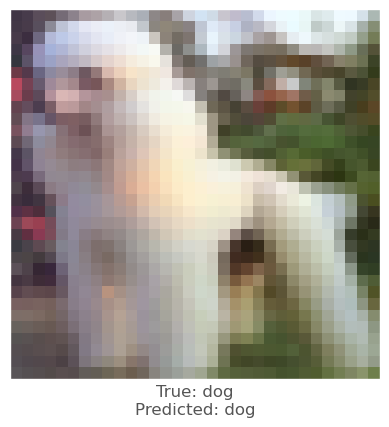



-0.01243338
-0.002069652
-0.0001437068
vr, vg, vb :   6.37874196948284 1.5195466057284477 -0.6830110454784633
beam_perturbed_confidence temp :  0.47472635
beam_perturbed_confidence temp :  0.50266665
beam_perturbed_confidence temp :  0.50389135
beam_perturbed_confidence temp :  0.47403303
beam_perturbed_confidence temp :  0.4749251
beam_perturbed_confidence temp :  0.5025198
beam_perturbed_confidence temp :  0.47408774
row index :  3
8th round's confidence : 0th 0.47403303
predicted class :  horse
predicted class's confidence :  0.5123042
Lopt is :  36


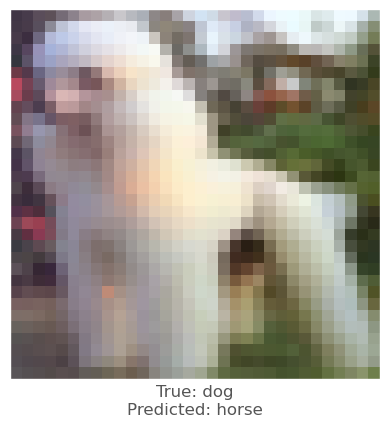




13th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  139 138 150
0.0015929341
-0.0022817254
-0.0026857853
vr, vg, vb :   -0.15929341316223145 0.22817254066467285 0.26857852935791016
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66789776
row index :  0
0th round's confidence : 0th 0.66789776
predicted class :  dog
predicted class's confidence :  0.66789776
Lopt is :  1


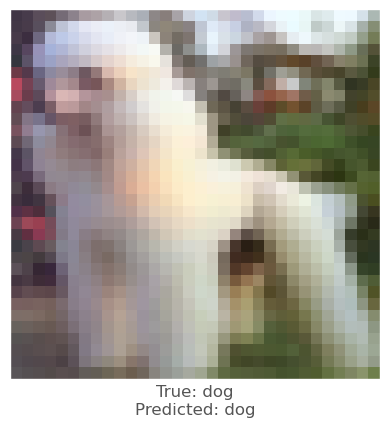



0.0030584931
-0.0011119843
-0.0022693276
vr, vg, vb :   -0.3058493137359619 0.11119842529296875 0.22693276405334473
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.67328376
beam_perturbed_confidence temp :  0.67328376
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.67328376
beam_perturbed_confidence temp :  0.67167634
row index :  0
0th round's confidence : 1th 0.67167634
predicted class :  dog
predicted class's confidence :  0.67167634
Lopt is :  6


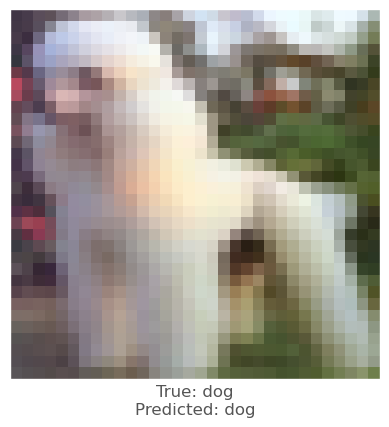



0.00012636185
-0.0039079785
-0.0037416816
vr, vg, vb :   -0.012636184692382812 0.39079785346984863 0.37416815757751465
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.6544356
beam_perturbed_confidence temp :  0.6544356
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.6544356
beam_perturbed_confidence temp :  0.6542974
row index :  0
0th round's confidence : 2th 0.6542974
predicted class :  dog
predicted class's confidence :  0.6542974
Lopt is :  5


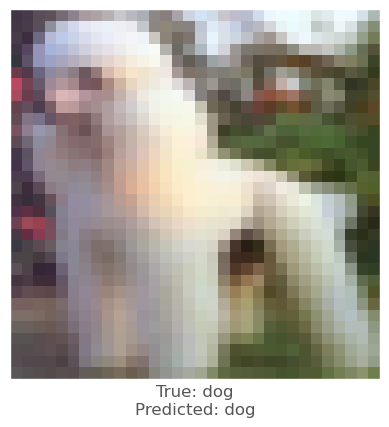



0.0049268007
0.0024584532
-0.000582695
vr, vg, vb :   -0.49268007278442383 -0.24584531784057617 0.058269500732421875
beam_perturbed_confidence temp :  0.6630823
beam_perturbed_confidence temp :  0.664269
beam_perturbed_confidence temp :  0.6657018
beam_perturbed_confidence temp :  0.66091627
beam_perturbed_confidence temp :  0.6630823
beam_perturbed_confidence temp :  0.664269
beam_perturbed_confidence temp :  0.66091627
row index :  3
0th round's confidence : 3th 0.66091627
predicted class :  dog
predicted class's confidence :  0.66091627
Lopt is :  11


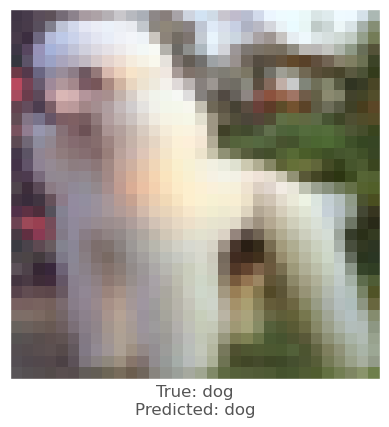



-0.00052803755
-0.0031130314
-0.003505528
vr, vg, vb :   0.052803754806518555 0.31130313873291016 0.3505527973175049
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
row index :  0
0th round's confidence : 4th 0.6363729
predicted class :  dog
predicted class's confidence :  0.6363729
Lopt is :  10


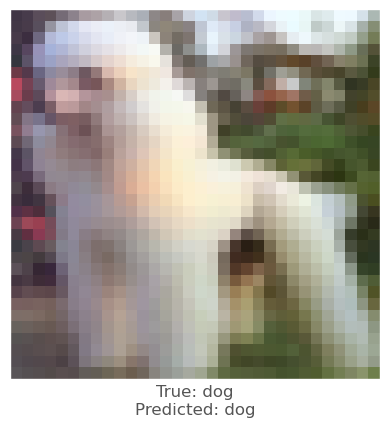



0.0014175177
-0.0024330616
-0.0027087927
vr, vg, vb :   -0.2851158380508423 0.4486614465713501 0.5125999450683594
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.66789776
beam_perturbed_confidence temp :  0.66721195
row index :  0
1th round's confidence : 0th 0.66721195
predicted class :  dog
predicted class's confidence :  0.66721195
Lopt is :  2


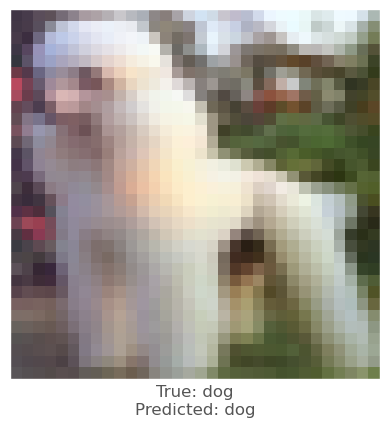



0.0032732487
-0.0011159778
-0.0023471117
vr, vg, vb :   -0.6025892496109009 0.21167635917663574 0.43895065784454346
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.67167634
beam_perturbed_confidence temp :  0.6700105
row index :  0
1th round's confidence : 1th 0.6700105
predicted class :  dog
predicted class's confidence :  0.6700105
Lopt is :  7


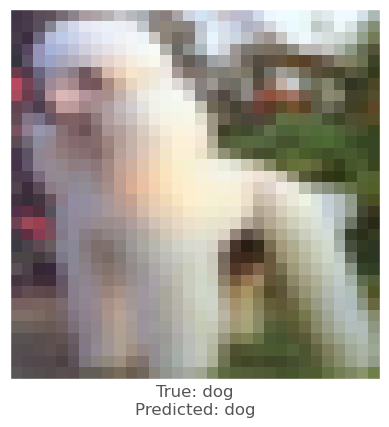



0.000248909
-0.0036010146
-0.0034736395
vr, vg, vb :   -0.036263465881347656 0.7118195295333862 0.6841152906417847
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.6542974
beam_perturbed_confidence temp :  0.65418667
row index :  0
1th round's confidence : 2th 0.65418667
predicted class :  dog
predicted class's confidence :  0.65418667
Lopt is :  5


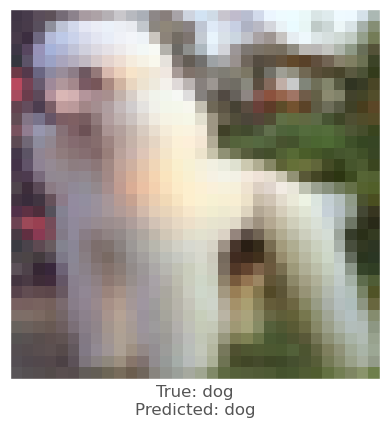



0.00683856
0.004298568
4.5478344e-05
vr, vg, vb :   -1.1272680759429932 -0.6511175632476807 0.04789471626281738
beam_perturbed_confidence temp :  0.6532881
beam_perturbed_confidence temp :  0.65878373
beam_perturbed_confidence temp :  0.66091627
beam_perturbed_confidence temp :  0.650981
beam_perturbed_confidence temp :  0.6532881
beam_perturbed_confidence temp :  0.65878373
beam_perturbed_confidence temp :  0.650981
row index :  3
1th round's confidence : 3th 0.650981
predicted class :  dog
predicted class's confidence :  0.650981
Lopt is :  13


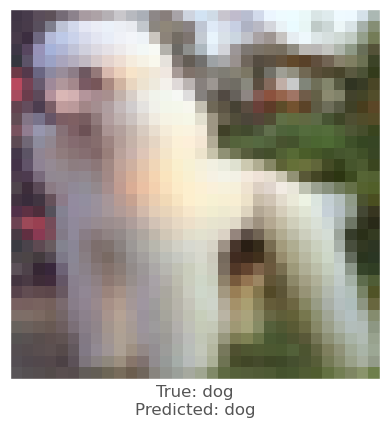



-0.00052803755
-0.0031130314
-0.003505528
vr, vg, vb :   0.10032713413238525 0.5914759635925293 0.6660503149032593
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
row index :  0
1th round's confidence : 4th 0.6363729
predicted class :  dog
predicted class's confidence :  0.6363729
Lopt is :  10


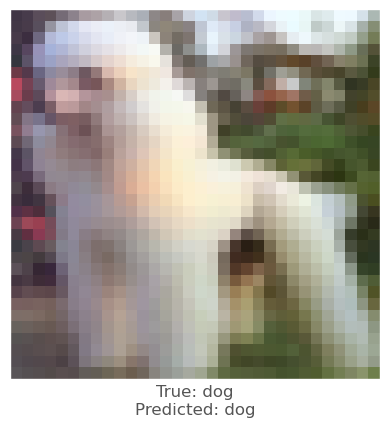



0.0016478896
-0.0022709966
-0.0026283264
vr, vg, vb :   -0.4213932156562805 0.6308949589729309 0.7241725921630859
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.66721195
beam_perturbed_confidence temp :  0.6662499
row index :  0
2th round's confidence : 0th 0.6662499
predicted class :  dog
predicted class's confidence :  0.6662499
Lopt is :  3


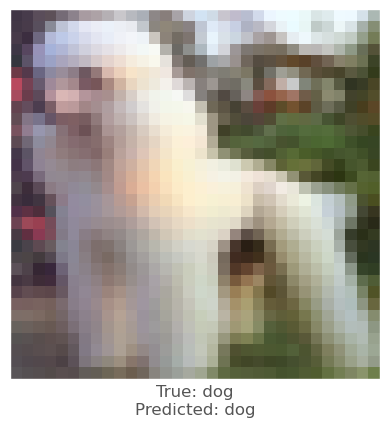



0.0033886433
-0.0010073781
-0.0023871064
vr, vg, vb :   -0.8811946511268616 0.29124653339385986 0.633766233921051
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.6700105
beam_perturbed_confidence temp :  0.6682877
row index :  0
2th round's confidence : 1th 0.6682877
predicted class :  dog
predicted class's confidence :  0.6682877
Lopt is :  8


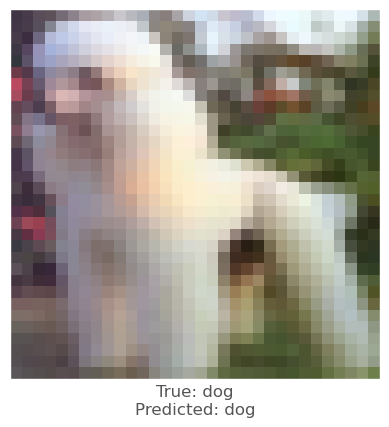



5.0663948e-05
-0.003457725
-0.0033576488
vr, vg, vb :   -0.037703514099121094 0.9864100813865662 0.9514686465263367
beam_perturbed_confidence temp :  0.65424675
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.65424675
beam_perturbed_confidence temp :  0.65424675
beam_perturbed_confidence temp :  0.65418667
beam_perturbed_confidence temp :  0.65424675
row index :  1
2th round's confidence : 2th 0.65418667
predicted class :  dog
predicted class's confidence :  0.65418667
Lopt is :  5


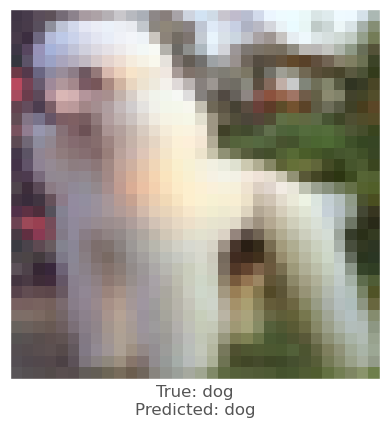



0.008938551
0.004793763
-0.0003516078
vr, vg, vb :   -1.9083963632583618 -1.0653821229934692 0.07826602458953857
beam_perturbed_confidence temp :  0.64148694
beam_perturbed_confidence temp :  0.64587444
beam_perturbed_confidence temp :  0.650981
beam_perturbed_confidence temp :  0.63637793
beam_perturbed_confidence temp :  0.64148694
beam_perturbed_confidence temp :  0.64587444
beam_perturbed_confidence temp :  0.63637793
row index :  3
2th round's confidence : 3th 0.63637793
predicted class :  dog
predicted class's confidence :  0.63637793
Lopt is :  15


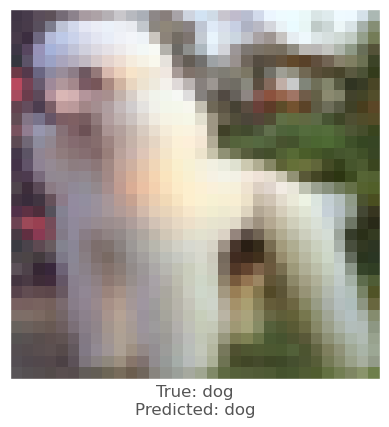



-0.00052803755
-0.0031130314
-0.003505528
vr, vg, vb :   0.14309817552566528 0.8436315059661865 0.9499980807304382
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.6363729
row index :  0
2th round's confidence : 4th 0.6363729
predicted class :  dog
predicted class's confidence :  0.6363729
Lopt is :  10


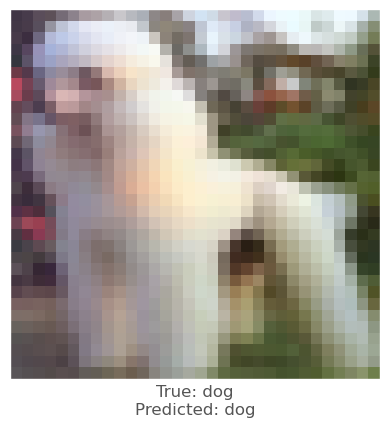



0.0017716289
-0.0019739866
-0.0025885701
vr, vg, vb :   -0.556416779756546 0.7652041256427765 0.9106123447418213
beam_perturbed_confidence temp :  0.6654403
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.6654403
beam_perturbed_confidence temp :  0.6654403
beam_perturbed_confidence temp :  0.6662499
beam_perturbed_confidence temp :  0.6654403
row index :  0
3th round's confidence : 0th 0.6654403
predicted class :  dog
predicted class's confidence :  0.6654403
Lopt is :  4


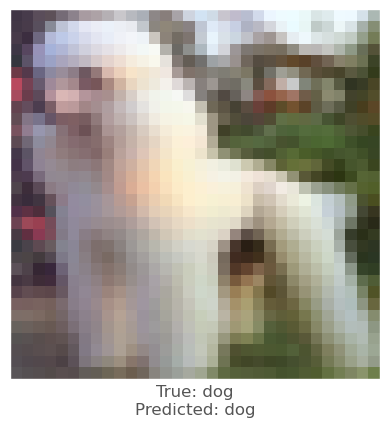



0.0035630465
-0.00088620186
-0.0025206804
vr, vg, vb :   -1.1493798315525057 0.3507420659065247 0.8224576532840729
beam_perturbed_confidence temp :  0.66409165
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.66409165
beam_perturbed_confidence temp :  0.66409165
beam_perturbed_confidence temp :  0.6682877
beam_perturbed_confidence temp :  0.66409165
row index :  0
3th round's confidence : 1th 0.66409165
predicted class :  dog
predicted class's confidence :  0.66409165
Lopt is :  10


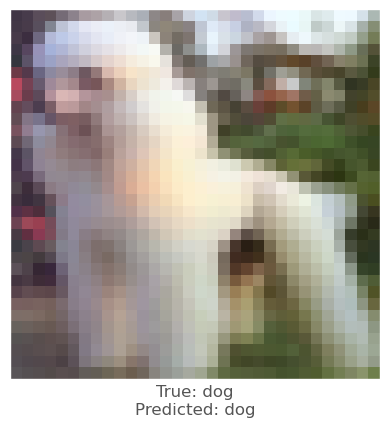



5.0663948e-05
-0.003457725
-0.0033576488
vr, vg, vb :   -0.03899955749511719 1.233541578054428 1.1920866668224335
beam_perturbed_confidence temp :  0.65424675
beam_perturbed_confidence temp :  0.65251446
beam_perturbed_confidence temp :  0.65251034
beam_perturbed_confidence temp :  0.65259695
beam_perturbed_confidence temp :  0.6526874
beam_perturbed_confidence temp :  0.6509315
beam_perturbed_confidence temp :  0.651043
row index :  5
3th round's confidence : 2th 0.6509315
predicted class :  dog
predicted class's confidence :  0.6509315
Lopt is :  6


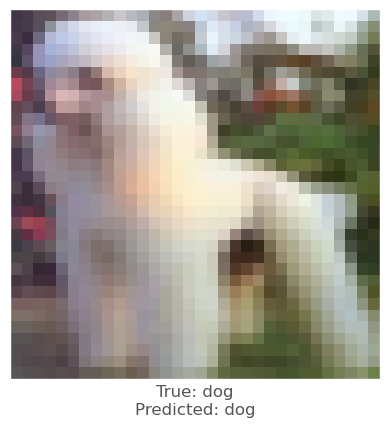



0.009454608
0.0049673915
-0.0005361438
vr, vg, vb :   -2.663017523288727 -1.4555830597877502 0.12405380010604859
beam_perturbed_confidence temp :  0.6210946
beam_perturbed_confidence temp :  0.6312226
beam_perturbed_confidence temp :  0.63637793
beam_perturbed_confidence temp :  0.6148455
beam_perturbed_confidence temp :  0.6210946
beam_perturbed_confidence temp :  0.6312226
beam_perturbed_confidence temp :  0.6148455
row index :  3
3th round's confidence : 3th 0.6148455
predicted class :  dog
predicted class's confidence :  0.6148455
Lopt is :  18


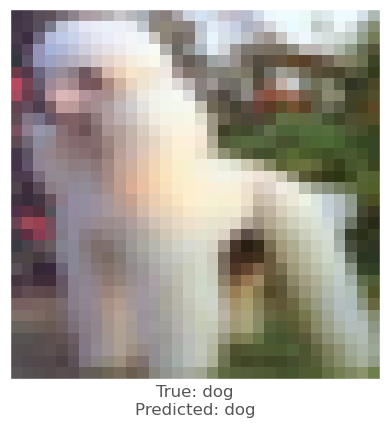



-0.00052803755
-0.0031130314
-0.003505528
vr, vg, vb :   0.18159211277961732 1.0705714941024782 1.2055510699748995
beam_perturbed_confidence temp :  0.6363729
beam_perturbed_confidence temp :  0.63490736
beam_perturbed_confidence temp :  0.6345669
beam_perturbed_confidence temp :  0.63490736
beam_perturbed_confidence temp :  0.6345669
beam_perturbed_confidence temp :  0.6331575
beam_perturbed_confidence temp :  0.6331575
row index :  5
3th round's confidence : 4th 0.6331575
predicted class :  dog
predicted class's confidence :  0.6331575
Lopt is :  11


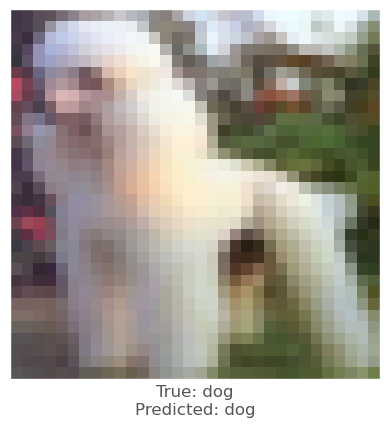



0.0017887354
-0.001567781
-0.0022787452
vr, vg, vb :   -0.6796486407518387 0.8454618102312088 1.047425627708435
beam_perturbed_confidence temp :  0.66446114
beam_perturbed_confidence temp :  0.6654403
beam_perturbed_confidence temp :  0.66422504
beam_perturbed_confidence temp :  0.66446114
beam_perturbed_confidence temp :  0.66311187
beam_perturbed_confidence temp :  0.66422504
beam_perturbed_confidence temp :  0.66311187
row index :  4
4th round's confidence : 0th 0.66311187
predicted class :  dog
predicted class's confidence :  0.66311187
Lopt is :  5


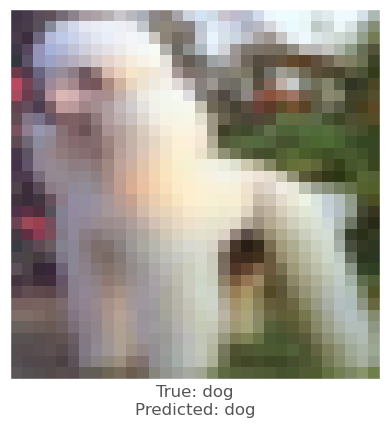



0.0050867796
-0.0012139678
-0.0032481551
vr, vg, vb :   -1.5431198078393937 0.4370646393299103 1.0650273996591568
beam_perturbed_confidence temp :  0.65836376
beam_perturbed_confidence temp :  0.66409165
beam_perturbed_confidence temp :  0.66234785
beam_perturbed_confidence temp :  0.65836376
beam_perturbed_confidence temp :  0.65701914
beam_perturbed_confidence temp :  0.66234785
beam_perturbed_confidence temp :  0.65701914
row index :  4
4th round's confidence : 1th 0.65701914
predicted class :  dog
predicted class's confidence :  0.65701914
Lopt is :  12


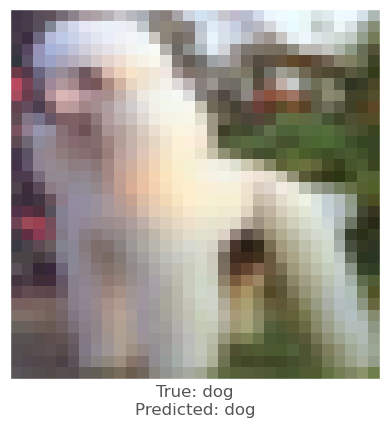



-0.00015342236
-0.003225267
-0.0032233596
vr, vg, vb :   -0.01975736618041992 1.4327141135931016 1.395213958621025
beam_perturbed_confidence temp :  0.651043
beam_perturbed_confidence temp :  0.6492851
beam_perturbed_confidence temp :  0.6492911
beam_perturbed_confidence temp :  0.64942634
beam_perturbed_confidence temp :  0.64940083
beam_perturbed_confidence temp :  0.6475584
beam_perturbed_confidence temp :  0.64775896
row index :  5
4th round's confidence : 2th 0.6475584
predicted class :  dog
predicted class's confidence :  0.6475584
Lopt is :  7


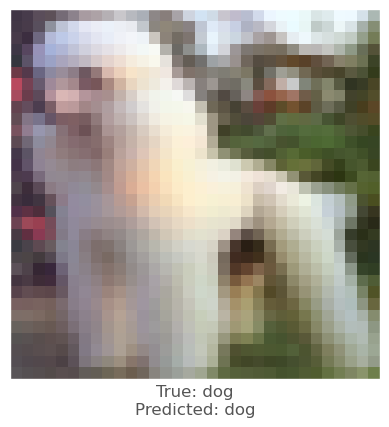



0.011661172
0.0066949725
-0.00012469292
vr, vg, vb :   -3.562832962274552 -1.9795220053195952 0.12411771178245545
beam_perturbed_confidence temp :  0.59080213
beam_perturbed_confidence temp :  0.60742986
beam_perturbed_confidence temp :  0.6148455
beam_perturbed_confidence temp :  0.58323383
beam_perturbed_confidence temp :  0.59080213
beam_perturbed_confidence temp :  0.60742986
beam_perturbed_confidence temp :  0.58323383
row index :  3
4th round's confidence : 3th 0.58323383
predicted class :  dog
predicted class's confidence :  0.58323383
Lopt is :  22


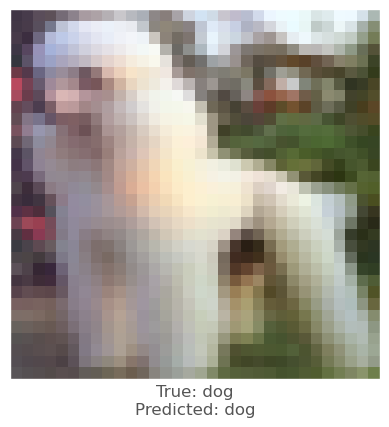



4.249811e-05
-0.0027666688
-0.0035760403
vr, vg, vb :   0.15918309032917025 1.240181224346161 1.4425999897718431
beam_perturbed_confidence temp :  0.6331575
beam_perturbed_confidence temp :  0.63180023
beam_perturbed_confidence temp :  0.6313313
beam_perturbed_confidence temp :  0.63180023
beam_perturbed_confidence temp :  0.6313313
beam_perturbed_confidence temp :  0.62961316
beam_perturbed_confidence temp :  0.62961316
row index :  5
4th round's confidence : 4th 0.62961316
predicted class :  dog
predicted class's confidence :  0.62961316
Lopt is :  12


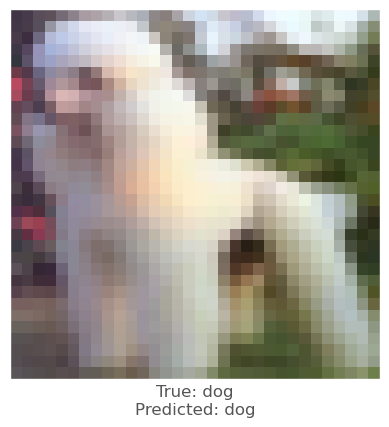



0.0024718642
-0.001966238
-0.0027067065
vr, vg, vb :   -0.8588701990246773 0.9575394313931466 1.2133537173271178
beam_perturbed_confidence temp :  0.6617532
beam_perturbed_confidence temp :  0.66311187
beam_perturbed_confidence temp :  0.6617544
beam_perturbed_confidence temp :  0.6617532
beam_perturbed_confidence temp :  0.6604713
beam_perturbed_confidence temp :  0.6617544
beam_perturbed_confidence temp :  0.6604713
row index :  4
5th round's confidence : 0th 0.6604713
predicted class :  dog
predicted class's confidence :  0.6604713
Lopt is :  6


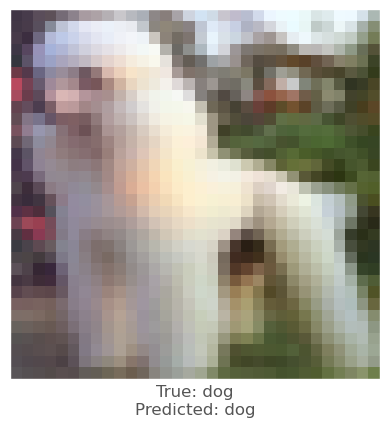



0.0059123635
-0.00010585785
-0.0027923584
vr, vg, vb :   -1.9800441799759867 0.4039439603090286 1.237760499536991
beam_perturbed_confidence temp :  0.65023965
beam_perturbed_confidence temp :  0.65701914
beam_perturbed_confidence temp :  0.6555714
beam_perturbed_confidence temp :  0.65023965
beam_perturbed_confidence temp :  0.6489639
beam_perturbed_confidence temp :  0.6555714
beam_perturbed_confidence temp :  0.6489639
row index :  4
5th round's confidence : 1th 0.6489639
predicted class :  dog
predicted class's confidence :  0.6489639
Lopt is :  14


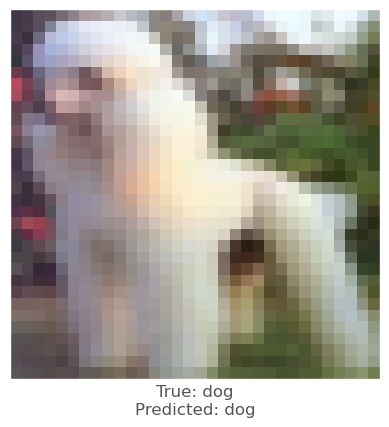



-0.00029981136
-0.0035110116
-0.0035440922
vr, vg, vb :   0.012199506759643555 1.64054386228323 1.6101017805933953
beam_perturbed_confidence temp :  0.6475584
beam_perturbed_confidence temp :  0.6457801
beam_perturbed_confidence temp :  0.645741
beam_perturbed_confidence temp :  0.6457801
beam_perturbed_confidence temp :  0.645741
beam_perturbed_confidence temp :  0.64394903
beam_perturbed_confidence temp :  0.64394903
row index :  5
5th round's confidence : 2th 0.64394903
predicted class :  dog
predicted class's confidence :  0.64394903
Lopt is :  8


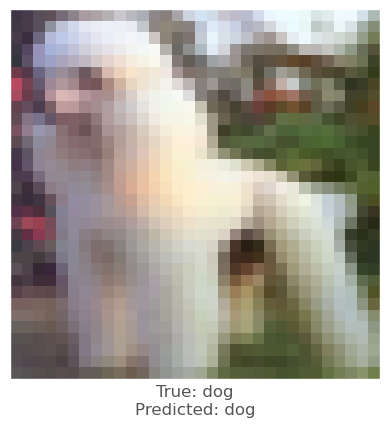



0.012224913
0.008064687
-2.4616718e-05
vr, vg, vb :   -4.429040930390359 -2.5880385299921036 0.11416761243343354
beam_perturbed_confidence temp :  0.55108213
beam_perturbed_confidence temp :  0.57087
beam_perturbed_confidence temp :  0.58323383
beam_perturbed_confidence temp :  0.53702146
beam_perturbed_confidence temp :  0.55108213
beam_perturbed_confidence temp :  0.57087
beam_perturbed_confidence temp :  0.53702146
row index :  3
5th round's confidence : 3th 0.53702146
predicted class :  dog
predicted class's confidence :  0.53702146
Lopt is :  27


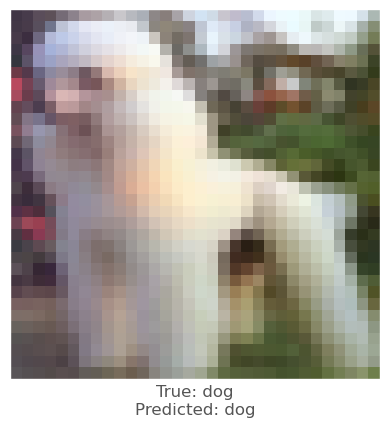



-0.00070858
-0.0035648942
-0.004365444
vr, vg, vb :   0.2141227830052376 1.4726525218486788 1.7348844091296198
beam_perturbed_confidence temp :  0.62961316
beam_perturbed_confidence temp :  0.62776643
beam_perturbed_confidence temp :  0.6274348
beam_perturbed_confidence temp :  0.62776643
beam_perturbed_confidence temp :  0.6274348
beam_perturbed_confidence temp :  0.625593
beam_perturbed_confidence temp :  0.625593
row index :  5
5th round's confidence : 4th 0.625593
predicted class :  dog
predicted class's confidence :  0.625593
Lopt is :  13


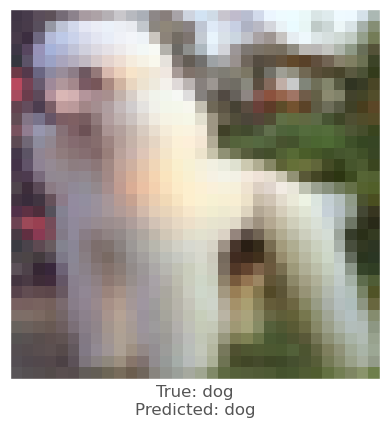



0.002813995
-0.0018336177
-0.0026357174
vr, vg, vb :   -1.0543826675713062 1.045147256976366 1.3555900847911835
beam_perturbed_confidence temp :  0.657023
beam_perturbed_confidence temp :  0.6595585
beam_perturbed_confidence temp :  0.65911746
beam_perturbed_confidence temp :  0.6564247
beam_perturbed_confidence temp :  0.6557783
beam_perturbed_confidence temp :  0.6580692
beam_perturbed_confidence temp :  0.65514755
row index :  6
6th round's confidence : 0th 0.65514755
predicted class :  dog
predicted class's confidence :  0.65514755
Lopt is :  8


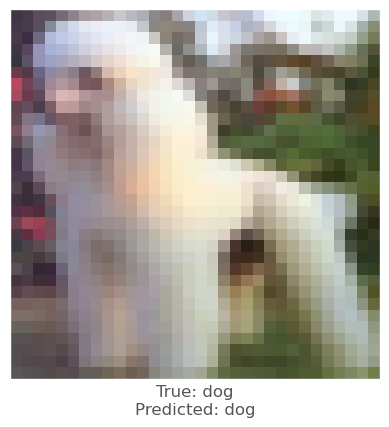



0.0072435737
0.00092446804
-0.002590716
vr, vg, vb :   -2.5063971285402777 0.27110276023149493 1.3730560380995274
beam_perturbed_confidence temp :  0.6382082
beam_perturbed_confidence temp :  0.6489639
beam_perturbed_confidence temp :  0.64764893
beam_perturbed_confidence temp :  0.6382082
beam_perturbed_confidence temp :  0.63712317
beam_perturbed_confidence temp :  0.64764893
beam_perturbed_confidence temp :  0.63712317
row index :  4
6th round's confidence : 1th 0.63712317
predicted class :  dog
predicted class's confidence :  0.63712317
Lopt is :  17


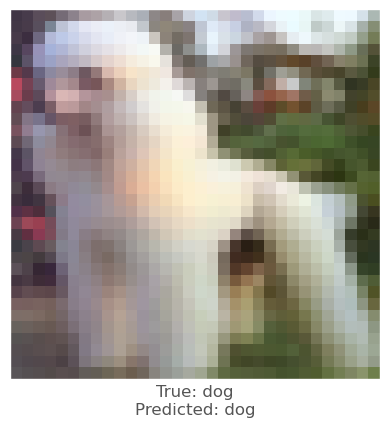



0.00015860796
-0.003710091
-0.0038568377
vr, vg, vb :   -0.004881239891052245 1.847498587459326 1.8347753774821758
beam_perturbed_confidence temp :  0.64383316
beam_perturbed_confidence temp :  0.6420309
beam_perturbed_confidence temp :  0.64192325
beam_perturbed_confidence temp :  0.6418432
beam_perturbed_confidence temp :  0.6417834
beam_perturbed_confidence temp :  0.63998353
beam_perturbed_confidence temp :  0.6397981
row index :  6
6th round's confidence : 2th 0.6397981
predicted class :  dog
predicted class's confidence :  0.6397981
Lopt is :  9


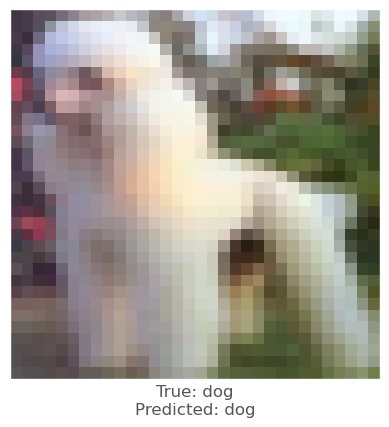



0.015416563
0.010479271
0.00057792664
vr, vg, vb :   -5.5277930930733685 -3.3771618181824685 0.044958187615871434
beam_perturbed_confidence temp :  0.49935436
beam_perturbed_confidence temp :  0.5193311
beam_perturbed_confidence temp :  0.53702146
beam_perturbed_confidence temp :  0.4842853
beam_perturbed_confidence temp :  0.49935436
beam_perturbed_confidence temp :  0.5193311
beam_perturbed_confidence temp :  0.4842853
row index :  3
6th round's confidence : 3th 0.4842853
predicted class :  horse
predicted class's confidence :  0.5067485
Lopt is :  33


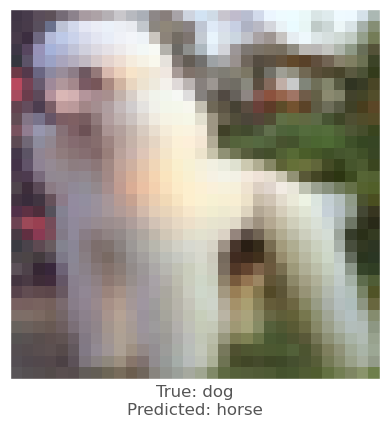




14th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  194 199 204
0.00042414665
-0.00053322315
-0.008454561
vr, vg, vb :   -0.04241466522216797 0.05332231521606445 0.8454561233520508
beam_perturbed_confidence temp :  0.6683843
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6683843
beam_perturbed_confidence temp :  0.6683843
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6683843
row index :  0
0th round's confidence : 0th 0.6683843
predicted class :  dog
predicted class's confidence :  0.6683843
Lopt is :  1


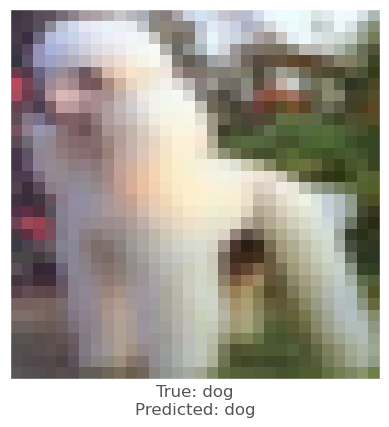



-0.0011943579
-0.0015170574
-0.0069725513
vr, vg, vb :   0.11943578720092773 0.15170574188232422 0.6972551345825195
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
row index :  0
0th round's confidence : 1th 0.6808896
predicted class :  dog
predicted class's confidence :  0.6808896
Lopt is :  5


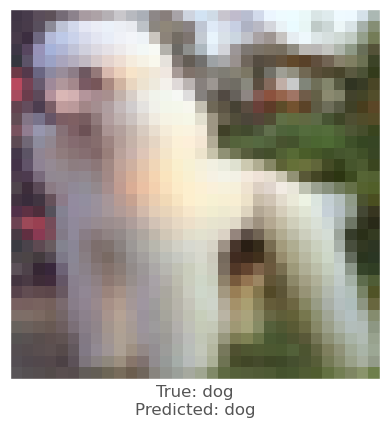



-0.0025507212
-0.0021862388
-0.00864023
vr, vg, vb :   0.25507211685180664 0.21862387657165527 0.864022970199585
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
row index :  0
0th round's confidence : 2th 0.6429409
predicted class :  dog
predicted class's confidence :  0.6429409
Lopt is :  5


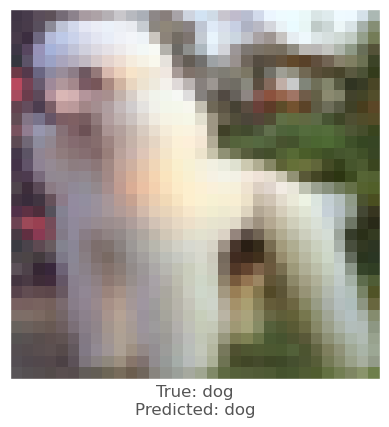



-0.00012749434
-0.0006107092
-0.0064179897
vr, vg, vb :   0.012749433517456055 0.061070919036865234 0.6417989730834961
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
row index :  0
0th round's confidence : 3th 0.69951624
predicted class :  dog
predicted class's confidence :  0.69951624
Lopt is :  10


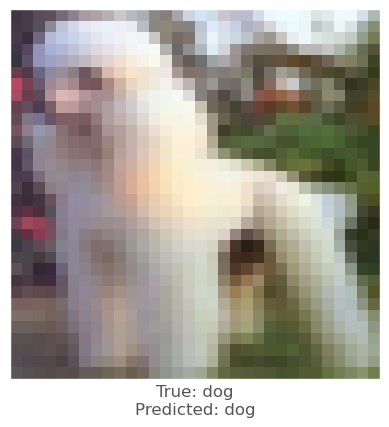



-0.0085763335
-0.0074676275
-0.010719955
vr, vg, vb :   0.8576333522796631 0.746762752532959 1.071995496749878
beam_perturbed_confidence temp :  0.58765125
beam_perturbed_confidence temp :  0.58765125
beam_perturbed_confidence temp :  0.58220696
beam_perturbed_confidence temp :  0.58765125
beam_perturbed_confidence temp :  0.58220696
beam_perturbed_confidence temp :  0.58220696
beam_perturbed_confidence temp :  0.58220696
row index :  2
0th round's confidence : 4th 0.58220696
predicted class :  dog
predicted class's confidence :  0.58220696
Lopt is :  11


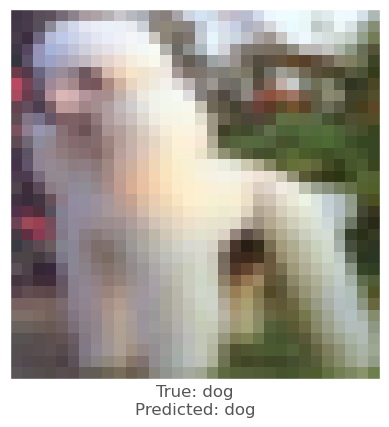



0.00092333555
-0.00033581257
-0.007952154
vr, vg, vb :   -0.1305067539215088 0.08157134056091309 1.5561258792877197
beam_perturbed_confidence temp :  0.66770613
beam_perturbed_confidence temp :  0.6683843
beam_perturbed_confidence temp :  0.664028
beam_perturbed_confidence temp :  0.66770613
beam_perturbed_confidence temp :  0.6639548
beam_perturbed_confidence temp :  0.664028
beam_perturbed_confidence temp :  0.6639548
row index :  4
1th round's confidence : 0th 0.6639548
predicted class :  dog
predicted class's confidence :  0.6639548
Lopt is :  2


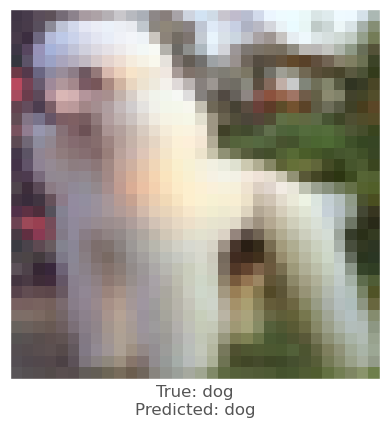



-0.0011943579
-0.0015170574
-0.0069725513
vr, vg, vb :   0.2269279956817627 0.288240909576416 1.324784755706787
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.6808896
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.677479
row index :  2
1th round's confidence : 1th 0.677479
predicted class :  dog
predicted class's confidence :  0.677479
Lopt is :  5


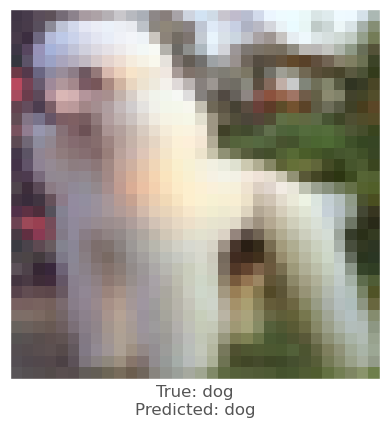



-0.0025507212
-0.0021862388
-0.00864023
vr, vg, vb :   0.4846370220184326 0.415385365486145 1.6416436433792114
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.6429409
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.6388675
row index :  2
1th round's confidence : 2th 0.6388675
predicted class :  dog
predicted class's confidence :  0.6388675
Lopt is :  6


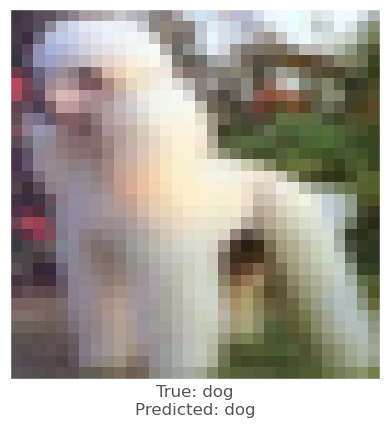



-0.00012749434
-0.0006107092
-0.0064179897
vr, vg, vb :   0.024223923683166504 0.11603474617004395 1.2194180488586426
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.69951624
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.69635725
row index :  2
1th round's confidence : 3th 0.69635725
predicted class :  dog
predicted class's confidence :  0.69635725
Lopt is :  10


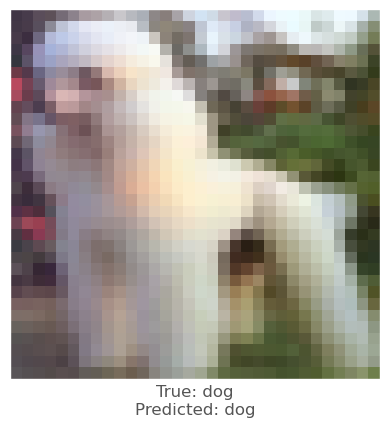



-0.008839905
-0.0076919794
-0.011080027
vr, vg, vb :   1.6558605432510376 1.441284418106079 2.0727986097335815
beam_perturbed_confidence temp :  0.5775647
beam_perturbed_confidence temp :  0.5782681
beam_perturbed_confidence temp :  0.57094944
beam_perturbed_confidence temp :  0.57398444
beam_perturbed_confidence temp :  0.56695414
beam_perturbed_confidence temp :  0.56769556
beam_perturbed_confidence temp :  0.563933
row index :  6
1th round's confidence : 4th 0.563933
predicted class :  dog
predicted class's confidence :  0.563933
Lopt is :  13


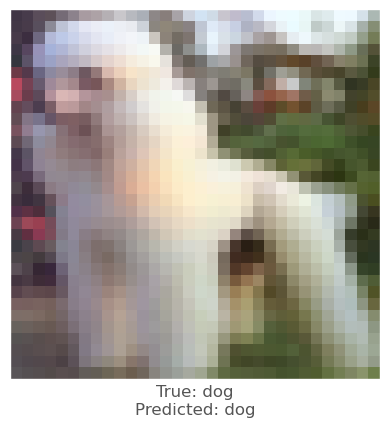



-0.000841856
-0.0010423064
-0.007876039
vr, vg, vb :   -0.03327047824859619 0.17764484882354736 2.1881171464920044
beam_perturbed_confidence temp :  0.66486984
beam_perturbed_confidence temp :  0.6639548
beam_perturbed_confidence temp :  0.6553912
beam_perturbed_confidence temp :  0.66486984
beam_perturbed_confidence temp :  0.65720475
beam_perturbed_confidence temp :  0.6553912
beam_perturbed_confidence temp :  0.65720475
row index :  2
2th round's confidence : 0th 0.6553912
predicted class :  dog
predicted class's confidence :  0.6553912
Lopt is :  3


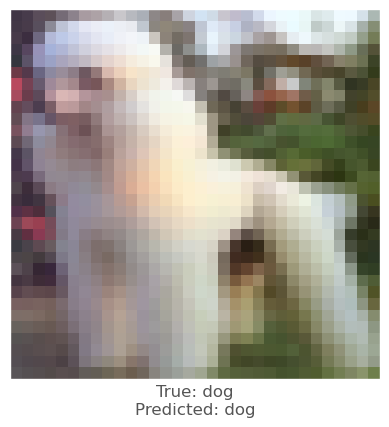



-0.0007557869
-0.0008342266
-0.00646466
vr, vg, vb :   0.27981388568878174 0.34283947944641113 1.8387722969055176
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.677479
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.67442495
row index :  2
2th round's confidence : 1th 0.67442495
predicted class :  dog
predicted class's confidence :  0.67442495
Lopt is :  5


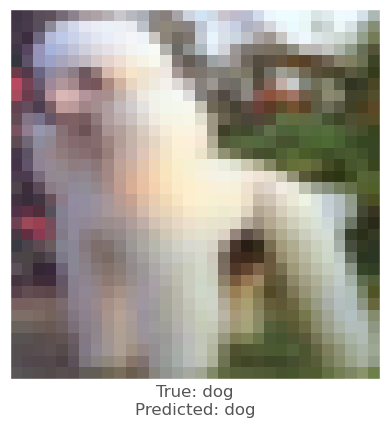



-0.0026826262
-0.0018410087
-0.0077650547
vr, vg, vb :   0.7044359445571899 0.5579476952552795 2.253984749317169
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.6388675
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.63118887
row index :  2
2th round's confidence : 2th 0.63118887
predicted class :  dog
predicted class's confidence :  0.63118887
Lopt is :  8


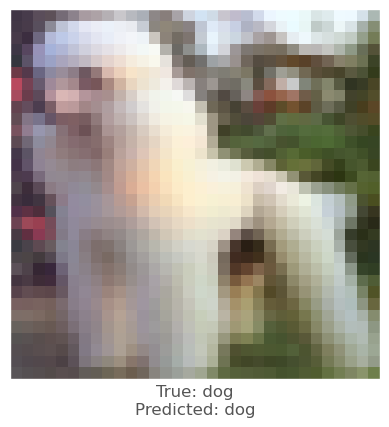



9.638071e-05
-0.00019288063
-0.0061278343
vr, vg, vb :   0.01216346025466919 0.12371933460235596 1.7102596759796143
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.6933884
beam_perturbed_confidence temp :  0.69635725
beam_perturbed_confidence temp :  0.6933884
beam_perturbed_confidence temp :  0.6933884
beam_perturbed_confidence temp :  0.6933884
row index :  2
2th round's confidence : 3th 0.6933884
predicted class :  dog
predicted class's confidence :  0.6933884
Lopt is :  10


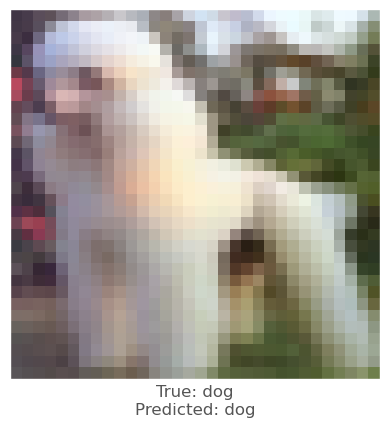



-0.007468939
-0.005957067
-0.0096668005
vr, vg, vb :   2.2371683716773987 1.8928626775741577 2.8321987986564636
beam_perturbed_confidence temp :  0.5555452
beam_perturbed_confidence temp :  0.56099707
beam_perturbed_confidence temp :  0.5546134
beam_perturbed_confidence temp :  0.5513331
beam_perturbed_confidence temp :  0.545415
beam_perturbed_confidence temp :  0.5509946
beam_perturbed_confidence temp :  0.540811
row index :  6
2th round's confidence : 4th 0.540811
predicted class :  dog
predicted class's confidence :  0.540811
Lopt is :  15


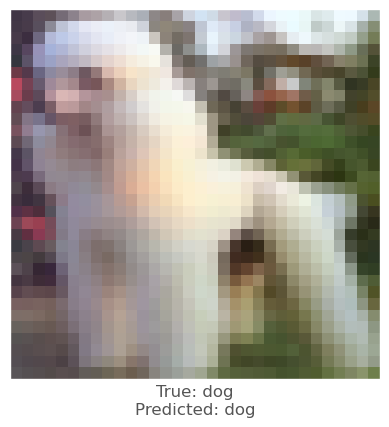



-0.002752006
-0.001725018
-0.008729517
vr, vg, vb :   0.2452571749687195 0.33238216638565066 2.8422571778297425
beam_perturbed_confidence temp :  0.6553912
beam_perturbed_confidence temp :  0.6553912
beam_perturbed_confidence temp :  0.64726406
beam_perturbed_confidence temp :  0.6553912
beam_perturbed_confidence temp :  0.64726406
beam_perturbed_confidence temp :  0.64726406
beam_perturbed_confidence temp :  0.64726406
row index :  2
3th round's confidence : 0th 0.64726406
predicted class :  dog
predicted class's confidence :  0.64726406
Lopt is :  5


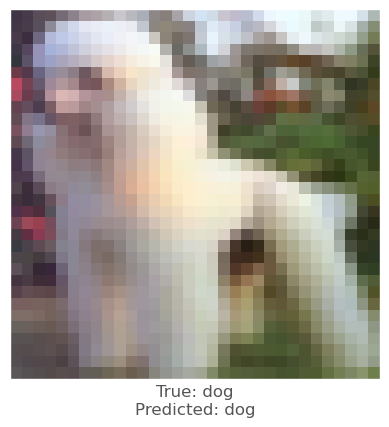



-0.0005773306
-0.00040501356
-0.0063295364
vr, vg, vb :   0.30956555604934693 0.34905688762664794 2.287848711013794
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.6677556
beam_perturbed_confidence temp :  0.67442495
beam_perturbed_confidence temp :  0.6677556
beam_perturbed_confidence temp :  0.6677556
beam_perturbed_confidence temp :  0.6677556
row index :  2
3th round's confidence : 1th 0.6677556
predicted class :  dog
predicted class's confidence :  0.6677556
Lopt is :  5


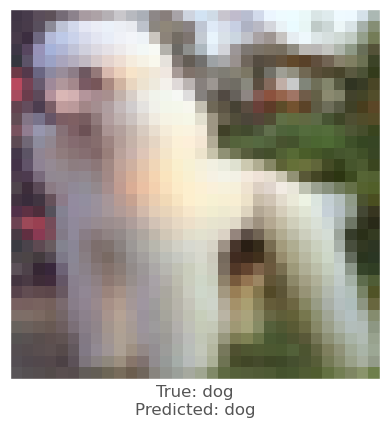



-0.0033434033
-0.002086699
-0.008300245
vr, vg, vb :   0.9683326840400696 0.7108228266239166 2.8586107552051545
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.6224448
beam_perturbed_confidence temp :  0.63118887
beam_perturbed_confidence temp :  0.6224448
beam_perturbed_confidence temp :  0.6224448
beam_perturbed_confidence temp :  0.6224448
row index :  2
3th round's confidence : 2th 0.6224448
predicted class :  dog
predicted class's confidence :  0.6224448
Lopt is :  10


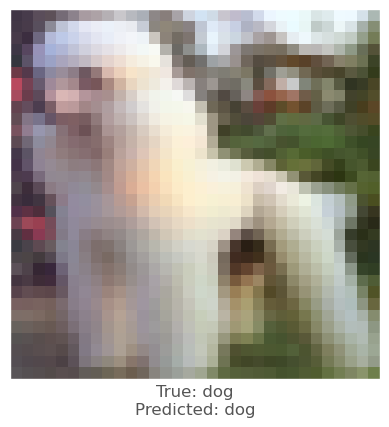



0.00018787384
-0.0001539588
-0.0058089495
vr, vg, vb :   -0.007840269804000854 0.12674328088760378 2.120128655433655
beam_perturbed_confidence temp :  0.6932959
beam_perturbed_confidence temp :  0.6933884
beam_perturbed_confidence temp :  0.6875848
beam_perturbed_confidence temp :  0.6932959
beam_perturbed_confidence temp :  0.6875035
beam_perturbed_confidence temp :  0.6875848
beam_perturbed_confidence temp :  0.6875035
row index :  4
3th round's confidence : 3th 0.6875035
predicted class :  dog
predicted class's confidence :  0.6875035
Lopt is :  11


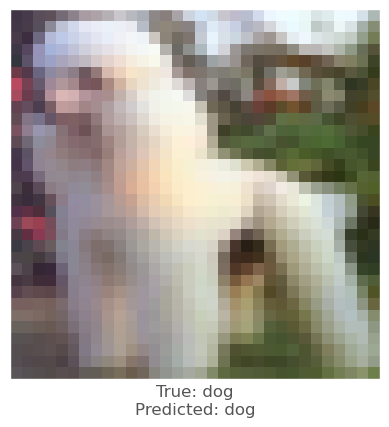



-0.010410428
-0.0095437765
-0.011099875
vr, vg, vb :   3.0544943392276767 2.657954061031342 3.658966416120529
beam_perturbed_confidence temp :  0.5254308
beam_perturbed_confidence temp :  0.5312055
beam_perturbed_confidence temp :  0.52356005
beam_perturbed_confidence temp :  0.5149787
beam_perturbed_confidence temp :  0.50711715
beam_perturbed_confidence temp :  0.51289207
beam_perturbed_confidence temp :  0.49751344
row index :  6
3th round's confidence : 4th 0.49751344
predicted class :  dog
predicted class's confidence :  0.49751344
Lopt is :  18


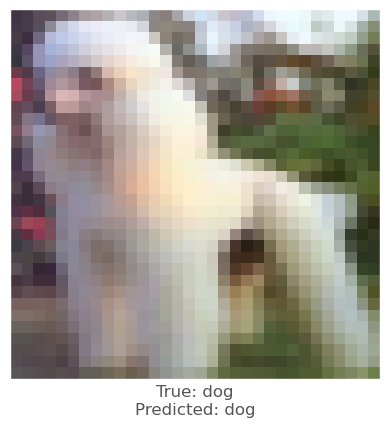




15th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  165 178 217
0.011394501
0.02248466
0.012922168
vr, vg, vb :   -1.1394500732421875 -2.2484660148620605 -1.2922167778015137
beam_perturbed_confidence temp :  0.6576189
beam_perturbed_confidence temp :  0.6368087
beam_perturbed_confidence temp :  0.6559693
beam_perturbed_confidence temp :  0.62269056
beam_perturbed_confidence temp :  0.64593637
beam_perturbed_confidence temp :  0.621988
beam_perturbed_confidence temp :  0.6058978
row index :  6
0th round's confidence : 0th 0.6058978
predicted class :  dog
predicted class's confidence :  0.6058978
Lopt is :  3


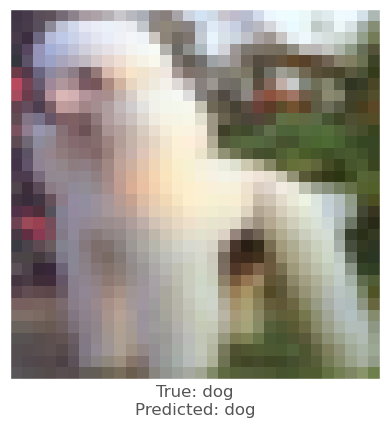



0.0125645995
0.025825858
0.016184688
vr, vg, vb :   -1.2564599514007568 -2.5825858116149902 -1.6184687614440918
beam_perturbed_confidence temp :  0.51748985
beam_perturbed_confidence temp :  0.49685338
beam_perturbed_confidence temp :  0.51373553
beam_perturbed_confidence temp :  0.49096352
beam_perturbed_confidence temp :  0.5058484
beam_perturbed_confidence temp :  0.48626724
beam_perturbed_confidence temp :  0.4807471
row index :  6
0th round's confidence : 1th 0.4807471
predicted class :  horse
predicted class's confidence :  0.5083492
Lopt is :  8


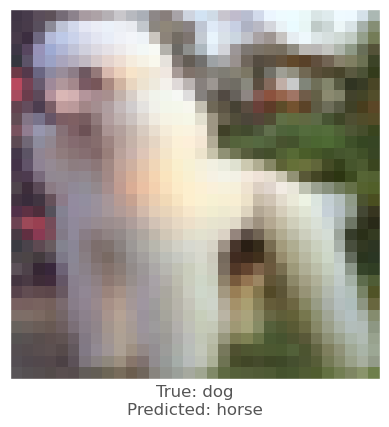




16th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  144 141 151
-0.005503714
-0.019844055
-0.013256609
vr, vg, vb :   0.5503714084625244 1.984405517578125 1.3256609439849854
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6586814
beam_perturbed_confidence temp :  0.66198933
beam_perturbed_confidence temp :  0.6586814
beam_perturbed_confidence temp :  0.66198933
beam_perturbed_confidence temp :  0.6532661
beam_perturbed_confidence temp :  0.6532661
row index :  5
0th round's confidence : 0th 0.6532661
predicted class :  dog
predicted class's confidence :  0.6532661
Lopt is :  1


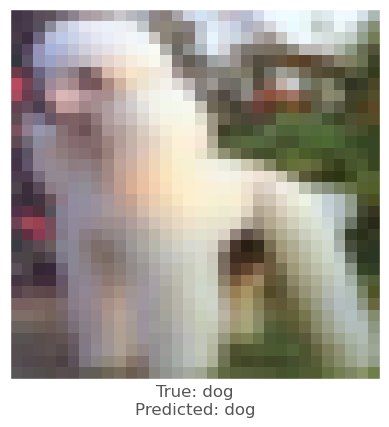



-0.0045927763
-0.00749439
-0.0029409528
vr, vg, vb :   0.4592776298522949 0.749439001083374 0.2940952777862549
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.7436572
row index :  0
0th round's confidence : 1th 0.7436572
predicted class :  dog
predicted class's confidence :  0.7436572
Lopt is :  5


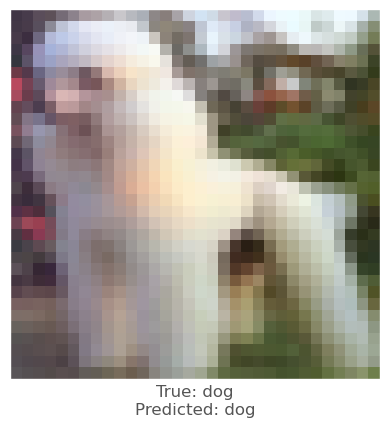



0.011601269
-0.0008445978
0.0012395382
vr, vg, vb :   -1.1601269245147705 0.08445978164672852 -0.12395381927490234
beam_perturbed_confidence temp :  0.62142
beam_perturbed_confidence temp :  0.6317399
beam_perturbed_confidence temp :  0.6314088
beam_perturbed_confidence temp :  0.62142
beam_perturbed_confidence temp :  0.6231946
beam_perturbed_confidence temp :  0.6314088
beam_perturbed_confidence temp :  0.6231946
row index :  0
0th round's confidence : 2th 0.62142
predicted class :  dog
predicted class's confidence :  0.62142
Lopt is :  5


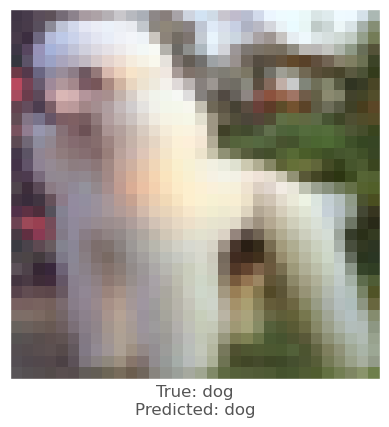



0.004876733
0.0008569956
0.0005930066
vr, vg, vb :   -0.487673282623291 -0.08569955825805664 -0.05930066108703613
beam_perturbed_confidence temp :  0.725924
beam_perturbed_confidence temp :  0.7275577
beam_perturbed_confidence temp :  0.72718793
beam_perturbed_confidence temp :  0.7267109
beam_perturbed_confidence temp :  0.7260283
beam_perturbed_confidence temp :  0.7274609
beam_perturbed_confidence temp :  0.7264563
row index :  0
0th round's confidence : 3th 0.725924
predicted class :  dog
predicted class's confidence :  0.725924
Lopt is :  11


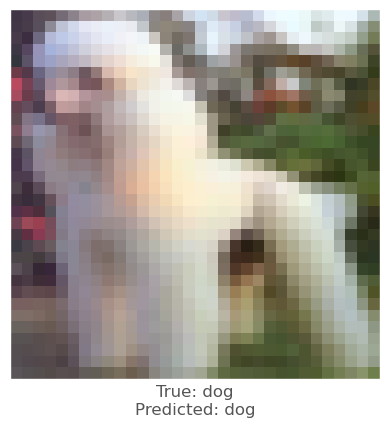



0.009504795
0.0066015124
0.0048153996
vr, vg, vb :   -0.9504795074462891 -0.6601512432098389 -0.4815399646759033
beam_perturbed_confidence temp :  0.6824919
beam_perturbed_confidence temp :  0.68382585
beam_perturbed_confidence temp :  0.6847575
beam_perturbed_confidence temp :  0.6794458
beam_perturbed_confidence temp :  0.6796843
beam_perturbed_confidence temp :  0.6812489
beam_perturbed_confidence temp :  0.6773334
row index :  6
0th round's confidence : 4th 0.6773334
predicted class :  dog
predicted class's confidence :  0.6773334
Lopt is :  9


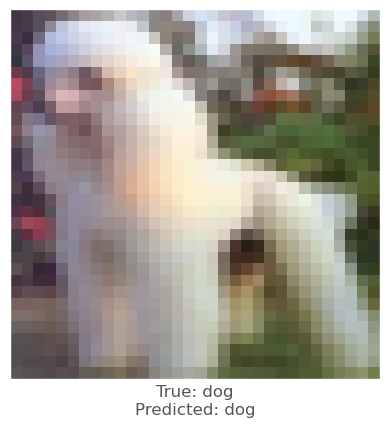



0.00058448315
-0.015136182
-0.009568036
vr, vg, vb :   0.4368859529495239 3.2995831966400146 2.149898409843445
beam_perturbed_confidence temp :  0.6532661
beam_perturbed_confidence temp :  0.6374979
beam_perturbed_confidence temp :  0.64584184
beam_perturbed_confidence temp :  0.6374979
beam_perturbed_confidence temp :  0.64584184
beam_perturbed_confidence temp :  0.62850434
beam_perturbed_confidence temp :  0.62850434
row index :  5
1th round's confidence : 0th 0.62850434
predicted class :  dog
predicted class's confidence :  0.62850434
Lopt is :  4


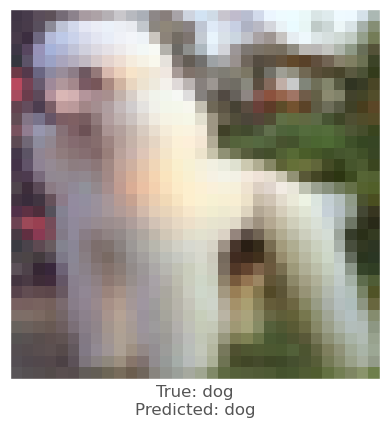



-0.0045927763
-0.00749439
-0.0029409528
vr, vg, vb :   0.8726274967193604 1.4239341020584106 0.5587810277938843
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.73957855
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.73957855
beam_perturbed_confidence temp :  0.7436572
beam_perturbed_confidence temp :  0.73957855
beam_perturbed_confidence temp :  0.73957855
row index :  1
1th round's confidence : 1th 0.73957855
predicted class :  dog
predicted class's confidence :  0.73957855
Lopt is :  5


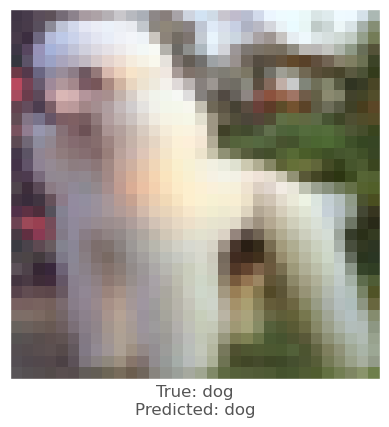



0.0085808635
-0.0074679255
-0.0025927424
vr, vg, vb :   -1.9022005796432495 0.8228063583374023 0.14771580696105957
beam_perturbed_confidence temp :  0.6165455
beam_perturbed_confidence temp :  0.62142
beam_perturbed_confidence temp :  0.62142
beam_perturbed_confidence temp :  0.6165455
beam_perturbed_confidence temp :  0.6165455
beam_perturbed_confidence temp :  0.62142
beam_perturbed_confidence temp :  0.6165455
row index :  0
1th round's confidence : 2th 0.6165455
predicted class :  dog
predicted class's confidence :  0.6165455
Lopt is :  5


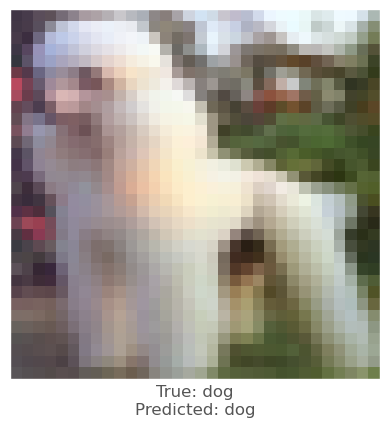



0.002338469
-0.001028955
0.0004956126
vr, vg, vb :   -0.672752857208252 0.02576589584350586 -0.10293185710906982
beam_perturbed_confidence temp :  0.7252408
beam_perturbed_confidence temp :  0.725924
beam_perturbed_confidence temp :  0.7260283
beam_perturbed_confidence temp :  0.7252408
beam_perturbed_confidence temp :  0.72541803
beam_perturbed_confidence temp :  0.7260283
beam_perturbed_confidence temp :  0.72541803
row index :  0
1th round's confidence : 3th 0.7252408
predicted class :  dog
predicted class's confidence :  0.7252408
Lopt is :  12


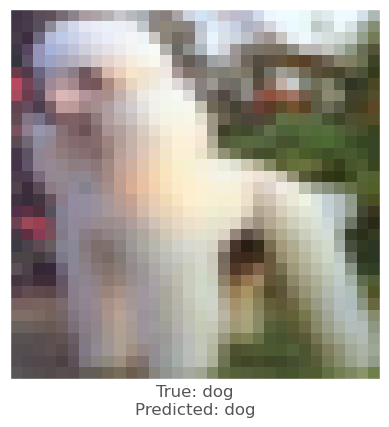



0.007584095
0.0045676827
0.003994584
vr, vg, vb :   -1.6138410568237305 -1.050904393196106 -0.8328443765640259
beam_perturbed_confidence temp :  0.66867644
beam_perturbed_confidence temp :  0.67190105
beam_perturbed_confidence temp :  0.6754512
beam_perturbed_confidence temp :  0.662613
beam_perturbed_confidence temp :  0.6667722
beam_perturbed_confidence temp :  0.6697258
beam_perturbed_confidence temp :  0.6606794
row index :  6
1th round's confidence : 4th 0.6606794
predicted class :  dog
predicted class's confidence :  0.6606794
Lopt is :  8


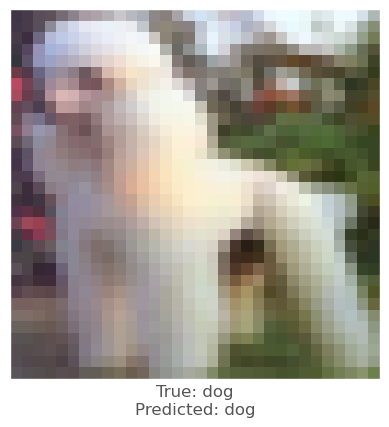



0.0014597178
-0.017196774
-0.01127708
vr, vg, vb :   0.2472255825996399 4.689302325248718 3.062616527080536
beam_perturbed_confidence temp :  0.62850434
beam_perturbed_confidence temp :  0.6026531
beam_perturbed_confidence temp :  0.6166169
beam_perturbed_confidence temp :  0.6026531
beam_perturbed_confidence temp :  0.6166169
beam_perturbed_confidence temp :  0.59947354
beam_perturbed_confidence temp :  0.59947354
row index :  5
2th round's confidence : 0th 0.59947354
predicted class :  dog
predicted class's confidence :  0.59947354
Lopt is :  8


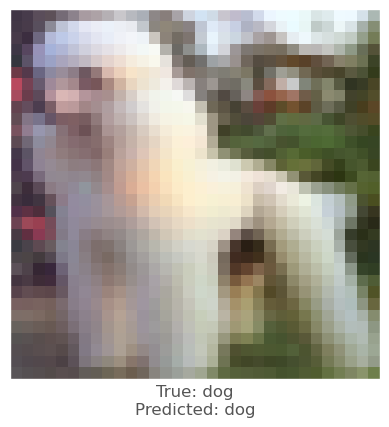



-0.002741456
-0.006519139
-0.0034593344
vr, vg, vb :   1.059510350227356 1.9334545731544495 0.848836362361908
beam_perturbed_confidence temp :  0.7395139
beam_perturbed_confidence temp :  0.73713803
beam_perturbed_confidence temp :  0.73957855
beam_perturbed_confidence temp :  0.73644704
beam_perturbed_confidence temp :  0.7395139
beam_perturbed_confidence temp :  0.73713803
beam_perturbed_confidence temp :  0.73644704
row index :  3
2th round's confidence : 1th 0.73644704
predicted class :  dog
predicted class's confidence :  0.73644704
Lopt is :  5


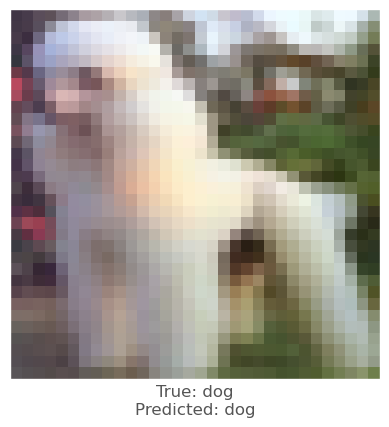



0.0034751296
-0.01423198
-0.0068699718
vr, vg, vb :   -2.0594934821128845 2.1637237071990967 0.8199414014816284
beam_perturbed_confidence temp :  0.60665375
beam_perturbed_confidence temp :  0.60501605
beam_perturbed_confidence temp :  0.6165455
beam_perturbed_confidence temp :  0.5967263
beam_perturbed_confidence temp :  0.60665375
beam_perturbed_confidence temp :  0.60501605
beam_perturbed_confidence temp :  0.5967263
row index :  3
2th round's confidence : 2th 0.5967263
predicted class :  dog
predicted class's confidence :  0.5967263
Lopt is :  7


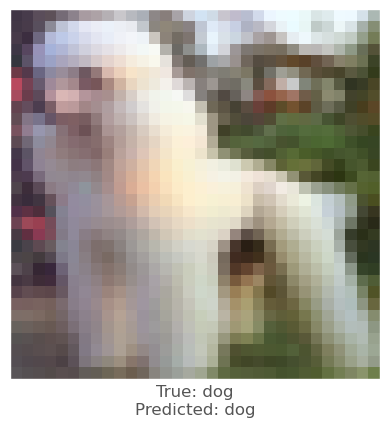



0.00046652555
-0.0016472936
-7.104874e-05
vr, vg, vb :   -0.652130126953125 0.18791866302490234 -0.08553379774093628
beam_perturbed_confidence temp :  0.7254575
beam_perturbed_confidence temp :  0.7252408
beam_perturbed_confidence temp :  0.72541803
beam_perturbed_confidence temp :  0.7254575
beam_perturbed_confidence temp :  0.7251009
beam_perturbed_confidence temp :  0.72541803
beam_perturbed_confidence temp :  0.7251009
row index :  4
2th round's confidence : 3th 0.7251009
predicted class :  dog
predicted class's confidence :  0.7251009
Lopt is :  13


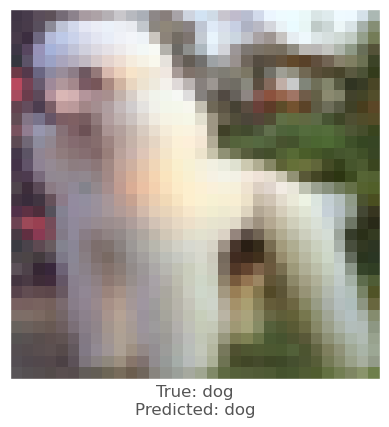



0.011236608
0.0077602863
0.0046767592
vr, vg, vb :   -2.576117753982544 -1.7218425869941711 -1.2172358632087708
beam_perturbed_confidence temp :  0.63742495
beam_perturbed_confidence temp :  0.64981633
beam_perturbed_confidence temp :  0.65528893
beam_perturbed_confidence temp :  0.6261499
beam_perturbed_confidence temp :  0.6305831
beam_perturbed_confidence temp :  0.6445835
beam_perturbed_confidence temp :  0.62622756
row index :  3
2th round's confidence : 4th 0.6261499
predicted class :  dog
predicted class's confidence :  0.6261499
Lopt is :  8


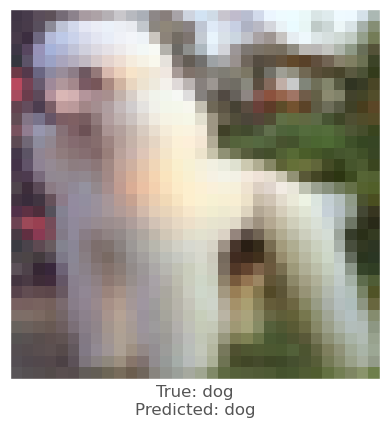



0.012277961
0.0045571923
0.0019866228
vr, vg, vb :   -1.0052930533885955 3.7646528601646425 2.5576925933361054
beam_perturbed_confidence temp :  0.59098995
beam_perturbed_confidence temp :  0.61975276
beam_perturbed_confidence temp :  0.60473335
beam_perturbed_confidence temp :  0.6023718
beam_perturbed_confidence temp :  0.59104925
beam_perturbed_confidence temp :  0.63179535
beam_perturbed_confidence temp :  0.6120932
row index :  0
3th round's confidence : 0th 0.59098995
predicted class :  dog
predicted class's confidence :  0.59098995
Lopt is :  8


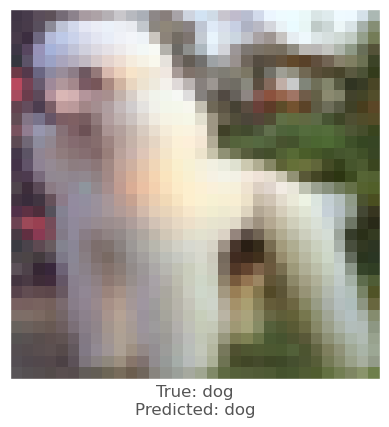



-0.0013020635
-0.007789016
-0.0037885308
vr, vg, vb :   1.0837656617164613 2.519010692834854 1.1428058087825774
beam_perturbed_confidence temp :  0.73583597
beam_perturbed_confidence temp :  0.726407
beam_perturbed_confidence temp :  0.73447734
beam_perturbed_confidence temp :  0.7251469
beam_perturbed_confidence temp :  0.7328388
beam_perturbed_confidence temp :  0.7232154
beam_perturbed_confidence temp :  0.7210303
row index :  6
3th round's confidence : 1th 0.7210303
predicted class :  dog
predicted class's confidence :  0.7210303
Lopt is :  4


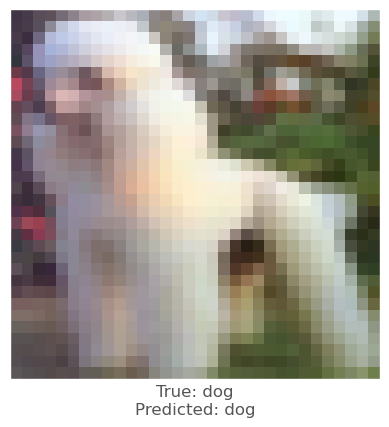



0.005761385
-0.008277178
-0.0042556524
vr, vg, vb :   -2.4296826303005217 2.7750691175460815 1.1635125041007996
beam_perturbed_confidence temp :  0.5853304
beam_perturbed_confidence temp :  0.590562
beam_perturbed_confidence temp :  0.59451747
beam_perturbed_confidence temp :  0.5788457
beam_perturbed_confidence temp :  0.5828038
beam_perturbed_confidence temp :  0.5911101
beam_perturbed_confidence temp :  0.5782938
row index :  6
3th round's confidence : 2th 0.5782938
predicted class :  dog
predicted class's confidence :  0.5782938
Lopt is :  9


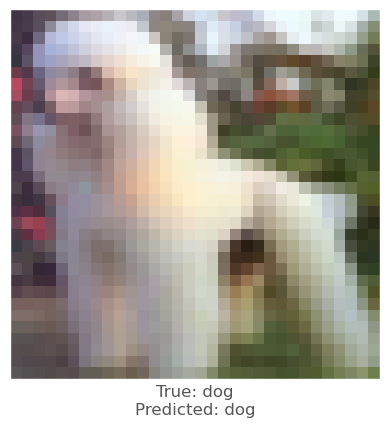



0.00050807
-0.0003925562
0.00074374676
vr, vg, vb :   -0.6377241134643555 0.2083824157714844 -0.15135509371757508
beam_perturbed_confidence temp :  0.72490996
beam_perturbed_confidence temp :  0.7251009
beam_perturbed_confidence temp :  0.72471374
beam_perturbed_confidence temp :  0.72490996
beam_perturbed_confidence temp :  0.72423273
beam_perturbed_confidence temp :  0.72471374
beam_perturbed_confidence temp :  0.72423273
row index :  4
3th round's confidence : 3th 0.72423273
predicted class :  dog
predicted class's confidence :  0.72423273
Lopt is :  14


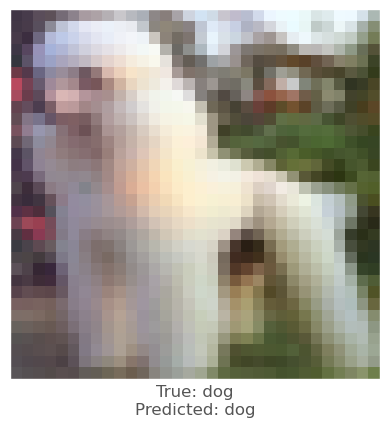



0.016974866
0.0048063397
0.0015523434
vr, vg, vb :   -4.015992617607116 -2.0302923023700714 -1.250746613740921
beam_perturbed_confidence temp :  0.60214216
beam_perturbed_confidence temp :  0.6324945
beam_perturbed_confidence temp :  0.62622756
beam_perturbed_confidence temp :  0.6184162
beam_perturbed_confidence temp :  0.6074597
beam_perturbed_confidence temp :  0.6368832
beam_perturbed_confidence temp :  0.62817925
row index :  0
3th round's confidence : 4th 0.60214216
predicted class :  dog
predicted class's confidence :  0.60214216
Lopt is :  8


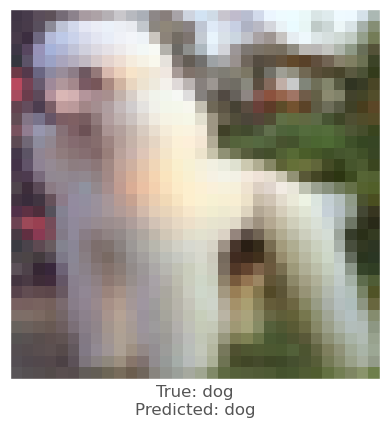



0.0068799853
-0.0034073591
-0.0021291971
vr, vg, vb :   -1.5927622812986373 3.728923486471176 2.5148430460691453
beam_perturbed_confidence temp :  0.58483523
beam_perturbed_confidence temp :  0.6023718
beam_perturbed_confidence temp :  0.59104925
beam_perturbed_confidence temp :  0.58591247
beam_perturbed_confidence temp :  0.58257496
beam_perturbed_confidence temp :  0.6120932
beam_perturbed_confidence temp :  0.5918773
row index :  4
4th round's confidence : 0th 0.58257496
predicted class :  dog
predicted class's confidence :  0.58257496
Lopt is :  8


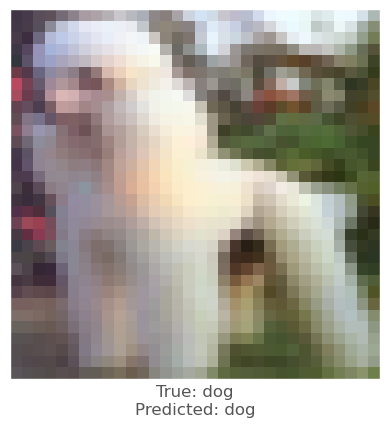



-0.007333517
-0.020611584
-0.010047436
vr, vg, vb :   1.708740803003311 4.328268042206764 2.0332688039541242
beam_perturbed_confidence temp :  0.7158819
beam_perturbed_confidence temp :  0.6683272
beam_perturbed_confidence temp :  0.7070132
beam_perturbed_confidence temp :  0.6660239
beam_perturbed_confidence temp :  0.70035243
beam_perturbed_confidence temp :  0.6548863
beam_perturbed_confidence temp :  0.6545972
row index :  6
4th round's confidence : 1th 0.6545972
predicted class :  dog
predicted class's confidence :  0.6545972
Lopt is :  3


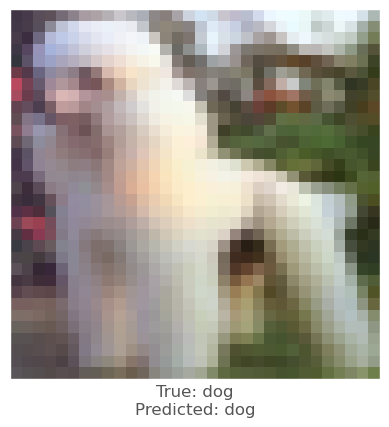



0.008958399
-0.002224803
-0.0005159378
vr, vg, vb :   -3.082554296851158 2.7200425028800965 1.098755034208298
beam_perturbed_confidence temp :  0.561557
beam_perturbed_confidence temp :  0.5801941
beam_perturbed_confidence temp :  0.57832974
beam_perturbed_confidence temp :  0.5573313
beam_perturbed_confidence temp :  0.5576601
beam_perturbed_confidence temp :  0.5819198
beam_perturbed_confidence temp :  0.55861974
row index :  3
4th round's confidence : 2th 0.5573313
predicted class :  dog
predicted class's confidence :  0.5573313
Lopt is :  11


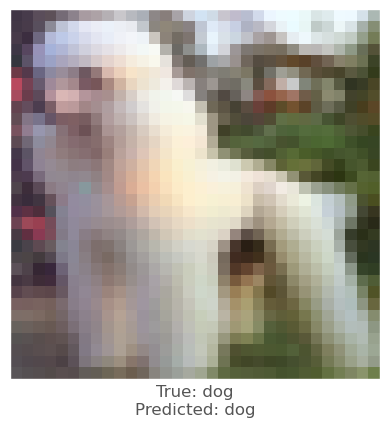



0.00071144104
0.0012997985
0.0013217926
vr, vg, vb :   -0.6450958061218263 0.05756432533264161 -0.26839884459972385
beam_perturbed_confidence temp :  0.7240023
beam_perturbed_confidence temp :  0.72423273
beam_perturbed_confidence temp :  0.72358817
beam_perturbed_confidence temp :  0.7240023
beam_perturbed_confidence temp :  0.7231049
beam_perturbed_confidence temp :  0.72358817
beam_perturbed_confidence temp :  0.7231049
row index :  4
4th round's confidence : 3th 0.7231049
predicted class :  dog
predicted class's confidence :  0.7231049
Lopt is :  15


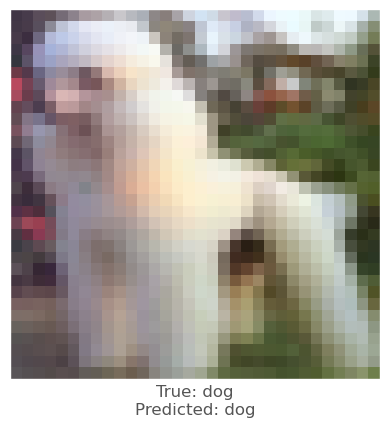



0.005760014
-0.0098029375
-0.0050432086
vr, vg, vb :   -4.190394761562347 -0.8469693213701248 -0.6213510924577714
beam_perturbed_confidence temp :  0.58727
beam_perturbed_confidence temp :  0.6067395
beam_perturbed_confidence temp :  0.6044736
beam_perturbed_confidence temp :  0.5939883
beam_perturbed_confidence temp :  0.5926125
beam_perturbed_confidence temp :  0.6103456
beam_perturbed_confidence temp :  0.596507
row index :  0
4th round's confidence : 4th 0.58727
predicted class :  dog
predicted class's confidence :  0.58727
Lopt is :  8


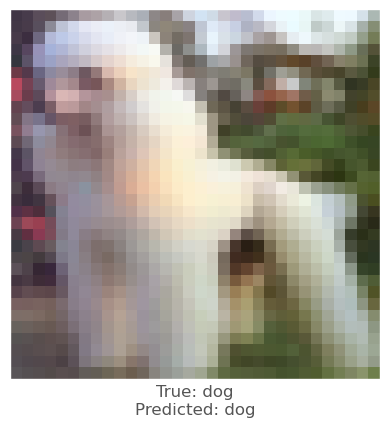



0.007276237
-0.0019912124
-0.0006082654
vr, vg, vb :   -2.1611097542643547 3.555152374625206 2.324185281455517
beam_perturbed_confidence temp :  0.56770796
beam_perturbed_confidence temp :  0.5918773
beam_perturbed_confidence temp :  0.58357567
beam_perturbed_confidence temp :  0.57262313
beam_perturbed_confidence temp :  0.5699493
beam_perturbed_confidence temp :  0.6016239
beam_perturbed_confidence temp :  0.5777192
row index :  0
5th round's confidence : 0th 0.56770796
predicted class :  dog
predicted class's confidence :  0.56770796
Lopt is :  8


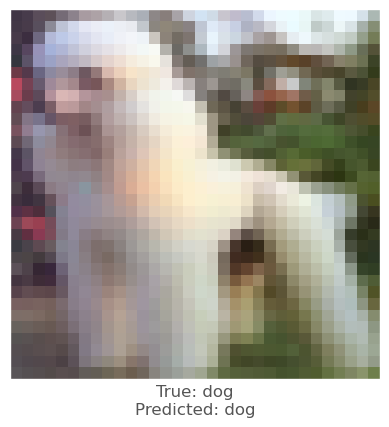



-0.0029044151
-0.02053231
-0.012397468
vr, vg, vb :   1.8283082357645035 5.948672238886356 3.0696887325644493
beam_perturbed_confidence temp :  0.6519819
beam_perturbed_confidence temp :  0.6207274
beam_perturbed_confidence temp :  0.6377884
beam_perturbed_confidence temp :  0.6202538
beam_perturbed_confidence temp :  0.6390009
beam_perturbed_confidence temp :  0.6022815
beam_perturbed_confidence temp :  0.6050914
row index :  5
5th round's confidence : 1th 0.6022815
predicted class :  dog
predicted class's confidence :  0.6022815
Lopt is :  8


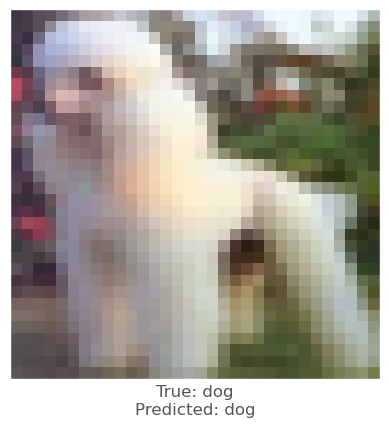



0.012038052
0.003291905
0.001927197
vr, vg, vb :   -3.9781040753722188 2.118847759962082 0.7961598328351976
beam_perturbed_confidence temp :  0.5363868
beam_perturbed_confidence temp :  0.56138325
beam_perturbed_confidence temp :  0.5573313
beam_perturbed_confidence temp :  0.54086435
beam_perturbed_confidence temp :  0.5363868
beam_perturbed_confidence temp :  0.56138325
beam_perturbed_confidence temp :  0.54086435
row index :  0
5th round's confidence : 2th 0.5363868
predicted class :  dog
predicted class's confidence :  0.5363868
Lopt is :  13


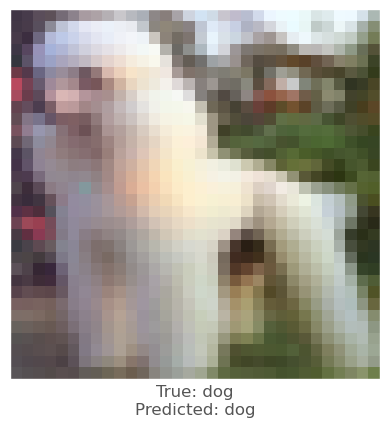



0.0009921193
0.0024881363
0.0015378594
vr, vg, vb :   -0.6797981567382814 -0.19700573635101318 -0.39534490412473683
beam_perturbed_confidence temp :  0.72259605
beam_perturbed_confidence temp :  0.72147363
beam_perturbed_confidence temp :  0.72246444
beam_perturbed_confidence temp :  0.7211498
beam_perturbed_confidence temp :  0.7219295
beam_perturbed_confidence temp :  0.72095406
beam_perturbed_confidence temp :  0.72033936
row index :  6
5th round's confidence : 3th 0.72033936
predicted class :  dog
predicted class's confidence :  0.72033936
Lopt is :  16


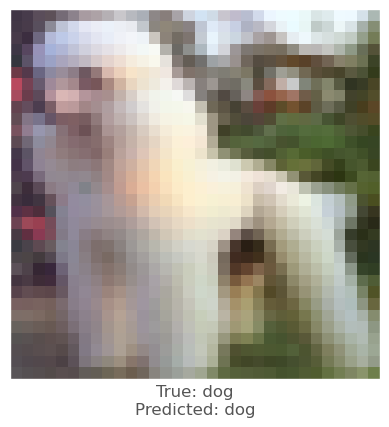



0.0062417984
-0.015400648
-0.010569036
vr, vg, vb :   -4.395535125494003 0.7777924224734306 0.49768761748075474
beam_perturbed_confidence temp :  0.58751804
beam_perturbed_confidence temp :  0.58727
beam_perturbed_confidence temp :  0.58727
beam_perturbed_confidence temp :  0.58751804
beam_perturbed_confidence temp :  0.58751804
beam_perturbed_confidence temp :  0.58727
beam_perturbed_confidence temp :  0.58751804
row index :  1
5th round's confidence : 4th 0.58727
predicted class :  dog
predicted class's confidence :  0.58727
Lopt is :  8


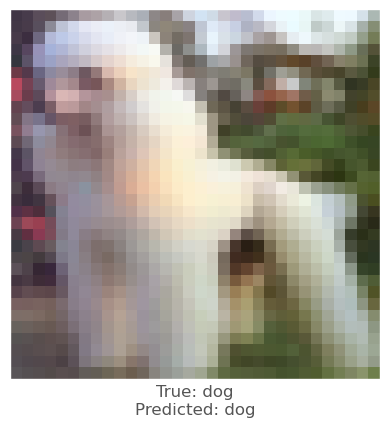



0.010954559
-0.0020448565
-0.0006120205
vr, vg, vb :   -3.040454663771391 3.4041227919936183 2.1529688025653364
beam_perturbed_confidence temp :  0.5477349
beam_perturbed_confidence temp :  0.57262313
beam_perturbed_confidence temp :  0.5699493
beam_perturbed_confidence temp :  0.54889894
beam_perturbed_confidence temp :  0.5457198
beam_perturbed_confidence temp :  0.5777192
beam_perturbed_confidence temp :  0.5525866
row index :  4
6th round's confidence : 0th 0.5457198
predicted class :  dog
predicted class's confidence :  0.5457198
Lopt is :  11


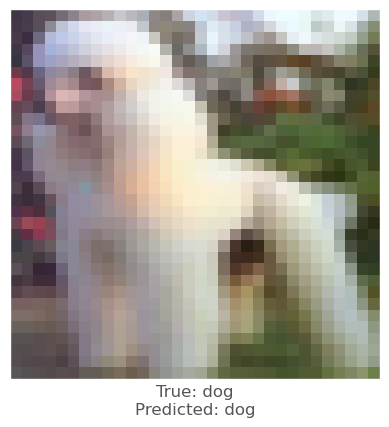



0.004226744
-0.011450291
-0.007086456
vr, vg, vb :   1.2228029946923256 6.498834082990885 3.471365441507101
beam_perturbed_confidence temp :  0.6050914
beam_perturbed_confidence temp :  0.6014444
beam_perturbed_confidence temp :  0.5950846
beam_perturbed_confidence temp :  0.6102028
beam_perturbed_confidence temp :  0.59743565
beam_perturbed_confidence temp :  0.61499786
beam_perturbed_confidence temp :  0.6244866
row index :  2
6th round's confidence : 1th 0.5950846
predicted class :  dog
predicted class's confidence :  0.5950846
Lopt is :  8


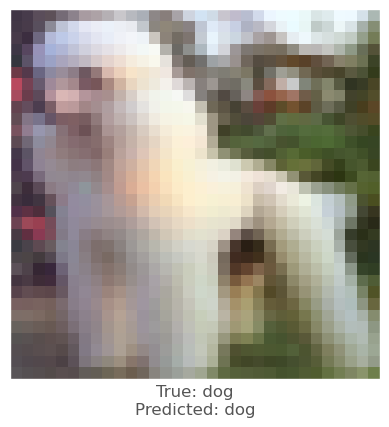



0.0071228743
-0.0002501607
-0.0019440651
vr, vg, vb :   -4.29258109382987 1.9319790533781052 0.910950358951092
beam_perturbed_confidence temp :  0.5667851
beam_perturbed_confidence temp :  0.5394453
beam_perturbed_confidence temp :  0.5363868
beam_perturbed_confidence temp :  0.5460311
beam_perturbed_confidence temp :  0.5667851
beam_perturbed_confidence temp :  0.5394453
beam_perturbed_confidence temp :  0.5460311
row index :  2
6th round's confidence : 2th 0.5363868
predicted class :  dog
predicted class's confidence :  0.5363868
Lopt is :  13


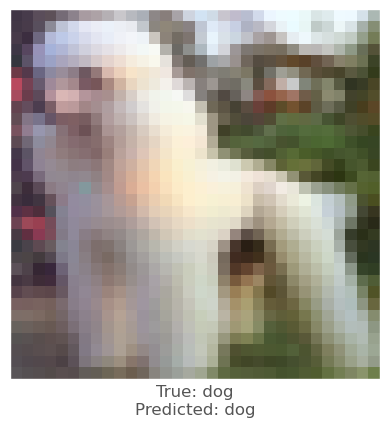



0.0014752746
0.0039465427
0.002032578
vr, vg, vb :   -0.7593457973480225 -0.5719594367027283 -0.5590682128608226
beam_perturbed_confidence temp :  0.7194788
beam_perturbed_confidence temp :  0.71798295
beam_perturbed_confidence temp :  0.7191172
beam_perturbed_confidence temp :  0.7164567
beam_perturbed_confidence temp :  0.7184542
beam_perturbed_confidence temp :  0.7168522
beam_perturbed_confidence temp :  0.7147267
row index :  6
6th round's confidence : 3th 0.7147267
predicted class :  dog
predicted class's confidence :  0.7147267
Lopt is :  17


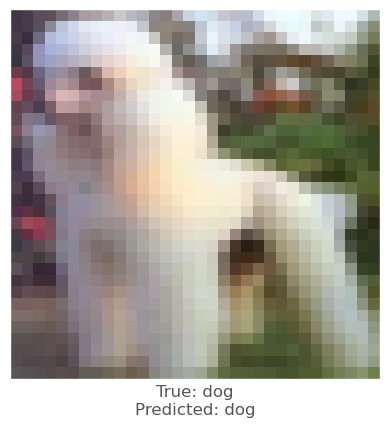



0.0062417984
-0.015400648
-0.010569036
vr, vg, vb :   -4.580161453032494 2.2400779919326306 1.5048224564254282
beam_perturbed_confidence temp :  0.58751804
beam_perturbed_confidence temp :  0.5746211
beam_perturbed_confidence temp :  0.58204347
beam_perturbed_confidence temp :  0.554582
beam_perturbed_confidence temp :  0.57903326
beam_perturbed_confidence temp :  0.57459044
beam_perturbed_confidence temp :  0.54987615
row index :  6
6th round's confidence : 4th 0.54987615
predicted class :  dog
predicted class's confidence :  0.54987615
Lopt is :  11


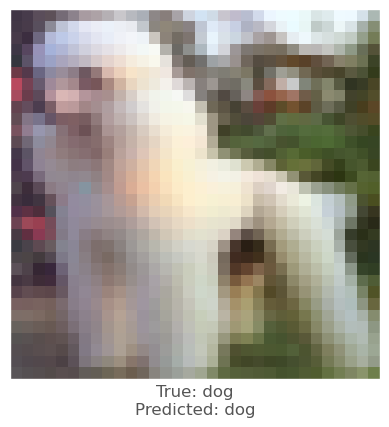



0.009621382
-0.0015196204
-0.0006403327
vr, vg, vb :   -3.6985473733586076 3.215672554649115 2.0017051921910047
beam_perturbed_confidence temp :  0.55634403
beam_perturbed_confidence temp :  0.5525866
beam_perturbed_confidence temp :  0.5480122
beam_perturbed_confidence temp :  0.5318363
beam_perturbed_confidence temp :  0.54446536
beam_perturbed_confidence temp :  0.5596908
beam_perturbed_confidence temp :  0.5391286
row index :  3
7th round's confidence : 0th 0.5318363
predicted class :  dog
predicted class's confidence :  0.5318363
Lopt is :  15


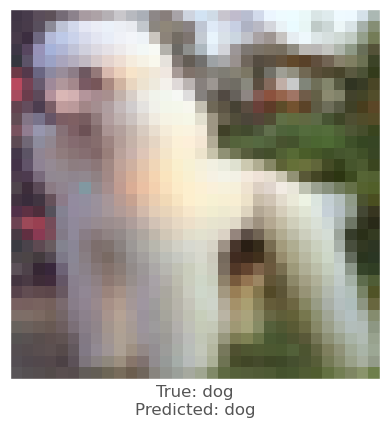



0.0053477883
-0.0072900057
-0.0048161745
vr, vg, vb :   0.5657438618338109 6.577951243081689 3.6058463480705023
beam_perturbed_confidence temp :  0.5950846
beam_perturbed_confidence temp :  0.61499786
beam_perturbed_confidence temp :  0.5904134
beam_perturbed_confidence temp :  0.61499786
beam_perturbed_confidence temp :  0.5904134
beam_perturbed_confidence temp :  0.631162
beam_perturbed_confidence temp :  0.631162
row index :  2
7th round's confidence : 1th 0.5904134
predicted class :  dog
predicted class's confidence :  0.5904134
Lopt is :  8


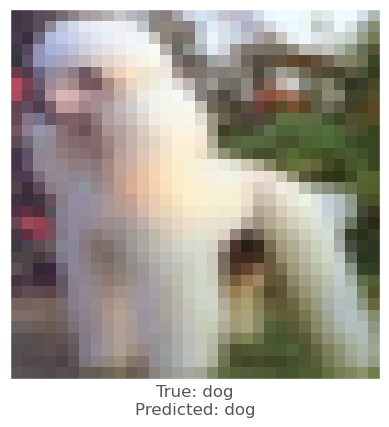



0.0071228743
-0.0002501607
-0.0019440651
vr, vg, vb :   -4.575610410441756 1.763797217452526 1.014261832455397
beam_perturbed_confidence temp :  0.5667851
beam_perturbed_confidence temp :  0.5394453
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5460311
beam_perturbed_confidence temp :  0.5585211
beam_perturbed_confidence temp :  0.5393687
beam_perturbed_confidence temp :  0.54001355
row index :  2
7th round's confidence : 2th 0.5367816
predicted class :  dog
predicted class's confidence :  0.5367816
Lopt is :  13


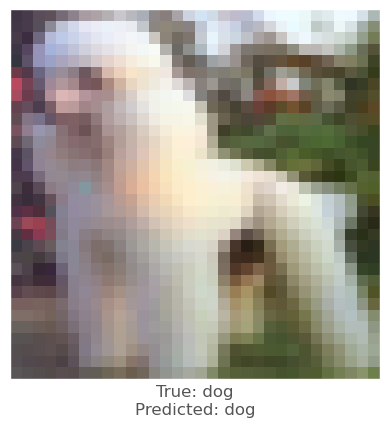



0.0058251023
0.008307934
0.004194677
vr, vg, vb :   -1.2659214505386354 -1.3455568737697603 -0.9226290791815519
beam_perturbed_confidence temp :  0.705892
beam_perturbed_confidence temp :  0.7052575
beam_perturbed_confidence temp :  0.71226203
beam_perturbed_confidence temp :  0.6954038
beam_perturbed_confidence temp :  0.7030363
beam_perturbed_confidence temp :  0.70287186
beam_perturbed_confidence temp :  0.6926509
row index :  6
7th round's confidence : 3th 0.6926509
predicted class :  dog
predicted class's confidence :  0.6926509
Lopt is :  19


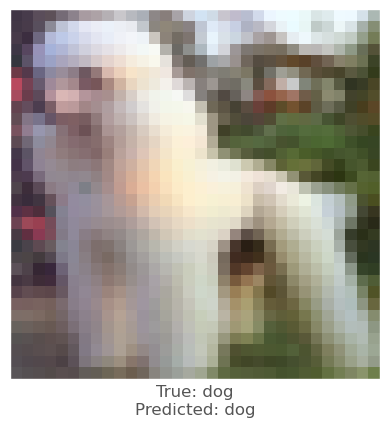



0.002652526
-0.0155751705
-0.007667005
vr, vg, vb :   -4.387397897908688 3.573587244436145 2.1210407169932126
beam_perturbed_confidence temp :  0.59958124
beam_perturbed_confidence temp :  0.5465777
beam_perturbed_confidence temp :  0.5452475
beam_perturbed_confidence temp :  0.539433
beam_perturbed_confidence temp :  0.58324397
beam_perturbed_confidence temp :  0.5522764
beam_perturbed_confidence temp :  0.5345116
row index :  6
7th round's confidence : 4th 0.5345116
predicted class :  dog
predicted class's confidence :  0.5345116
Lopt is :  16


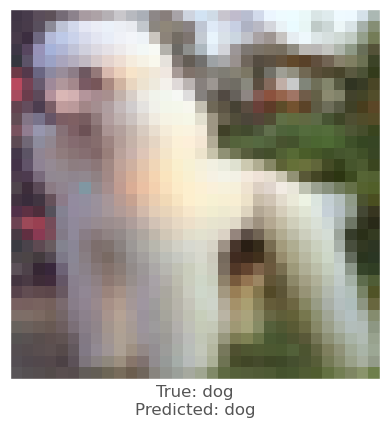



0.0052887797
0.0027805567
0.0029554367
vr, vg, vb :   -3.8575706095792657 2.6160496313070065 1.5059910023176075
beam_perturbed_confidence temp :  0.55123395
beam_perturbed_confidence temp :  0.5388755
beam_perturbed_confidence temp :  0.5345681
beam_perturbed_confidence temp :  0.5302459
beam_perturbed_confidence temp :  0.54568744
beam_perturbed_confidence temp :  0.5419771
beam_perturbed_confidence temp :  0.5302518
row index :  3
8th round's confidence : 0th 0.5302459
predicted class :  dog
predicted class's confidence :  0.5302459
Lopt is :  19


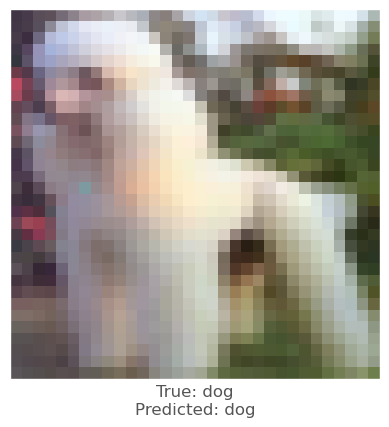



0.008283734
-2.4855137e-05
5.930662e-05
vr, vg, vb :   -0.319203956508994 5.922641632460654 3.2393310511083007
beam_perturbed_confidence temp :  0.58676904
beam_perturbed_confidence temp :  0.6249871
beam_perturbed_confidence temp :  0.5968371
beam_perturbed_confidence temp :  0.6151605
beam_perturbed_confidence temp :  0.5900665
beam_perturbed_confidence temp :  0.6346355
beam_perturbed_confidence temp :  0.6277388
row index :  0
8th round's confidence : 1th 0.58676904
predicted class :  dog
predicted class's confidence :  0.58676904
Lopt is :  8


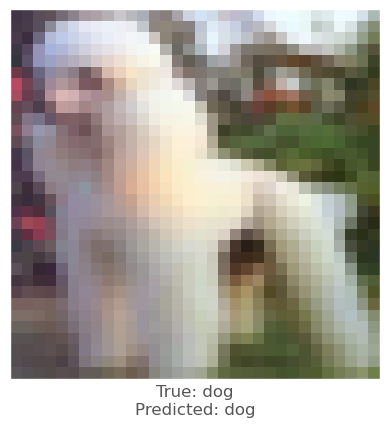



0.008216798
0.0023793578
0.0013241172
vr, vg, vb :   -4.9397291999487285 1.3494817142283917 0.780423930841327
beam_perturbed_confidence temp :  0.5585211
beam_perturbed_confidence temp :  0.5393687
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.54001355
beam_perturbed_confidence temp :  0.5585211
beam_perturbed_confidence temp :  0.5393687
beam_perturbed_confidence temp :  0.54001355
row index :  2
8th round's confidence : 2th 0.5367816
predicted class :  dog
predicted class's confidence :  0.5367816
Lopt is :  13


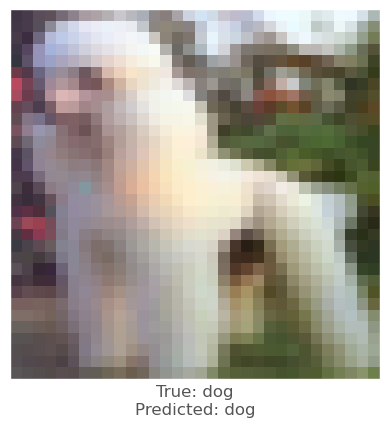



0.011126041
0.010815918
0.005825877
vr, vg, vb :   -2.2519334467201233 -2.2925930309515 -1.4129538902270198
beam_perturbed_confidence temp :  0.6787986
beam_perturbed_confidence temp :  0.6767436
beam_perturbed_confidence temp :  0.68698484
beam_perturbed_confidence temp :  0.6669997
beam_perturbed_confidence temp :  0.6744861
beam_perturbed_confidence temp :  0.6711938
beam_perturbed_confidence temp :  0.6624978
row index :  6
8th round's confidence : 3th 0.6624978
predicted class :  dog
predicted class's confidence :  0.6624978
Lopt is :  22


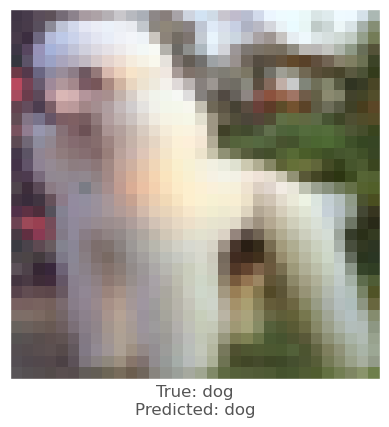



-0.0064358115
-0.01212126
-0.0009522438
vr, vg, vb :   -3.305076956155539 4.428354536609351 2.0041610257870555
beam_perturbed_confidence temp :  0.57642376
beam_perturbed_confidence temp :  0.54019433
beam_perturbed_confidence temp :  0.53593457
beam_perturbed_confidence temp :  0.5294807
beam_perturbed_confidence temp :  0.56046283
beam_perturbed_confidence temp :  0.5468341
beam_perturbed_confidence temp :  0.5319956
row index :  3
8th round's confidence : 4th 0.5294807
predicted class :  dog
predicted class's confidence :  0.5294807
Lopt is :  20


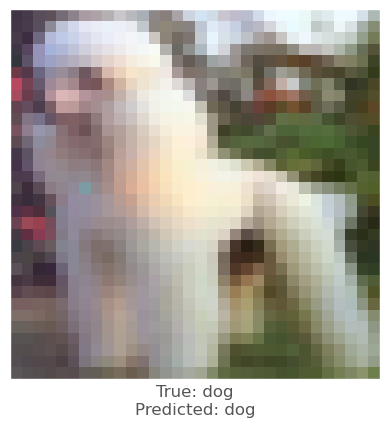



-0.0037072897
-0.008617401
0.00046491623
vr, vg, vb :   -3.1010845790473645 3.2161847804809933 1.308900279161042
beam_perturbed_confidence temp :  0.5674452
beam_perturbed_confidence temp :  0.5327814
beam_perturbed_confidence temp :  0.5302518
beam_perturbed_confidence temp :  0.52669895
beam_perturbed_confidence temp :  0.55938494
beam_perturbed_confidence temp :  0.5352711
beam_perturbed_confidence temp :  0.52866334
row index :  3
9th round's confidence : 0th 0.52669895
predicted class :  dog
predicted class's confidence :  0.52669895
Lopt is :  23


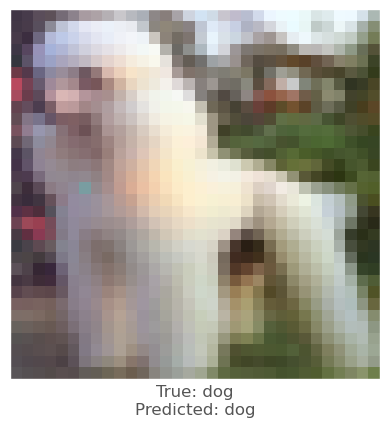



0.0075068474
-0.0030239224
-0.0016132593
vr, vg, vb :   -1.0379682990172743 5.632769713553578 3.076723877546543
beam_perturbed_confidence temp :  0.5795894
beam_perturbed_confidence temp :  0.6151605
beam_perturbed_confidence temp :  0.5900665
beam_perturbed_confidence temp :  0.59520185
beam_perturbed_confidence temp :  0.57933325
beam_perturbed_confidence temp :  0.6277388
beam_perturbed_confidence temp :  0.6099127
row index :  4
9th round's confidence : 1th 0.57933325
predicted class :  dog
predicted class's confidence :  0.57933325
Lopt is :  10


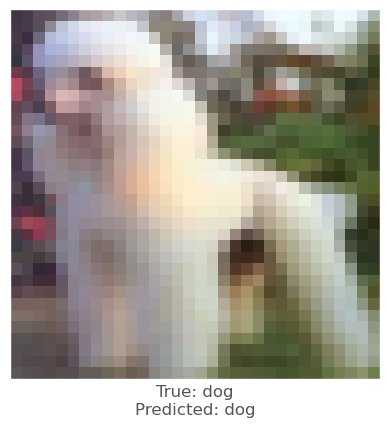



0.008216798
0.0023793578
0.0013241172
vr, vg, vb :   -5.267436110505003 0.9765977613266708 0.5699698193886641
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
row index :  1
9th round's confidence : 2th 0.5367816
predicted class :  dog
predicted class's confidence :  0.5367816
Lopt is :  13


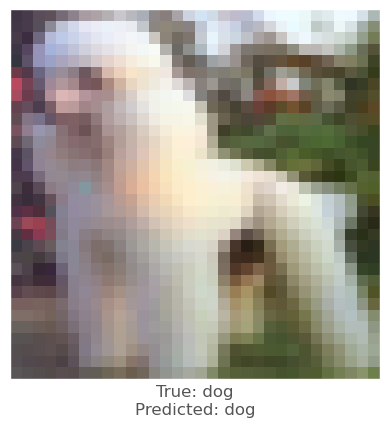



0.0050661564
0.007545471
0.004699707
vr, vg, vb :   -2.533355740781021 -2.8178808469969754 -1.7416292043293178
beam_perturbed_confidence temp :  0.6562899
beam_perturbed_confidence temp :  0.6529058
beam_perturbed_confidence temp :  0.65731627
beam_perturbed_confidence temp :  0.64945614
beam_perturbed_confidence temp :  0.6514177
beam_perturbed_confidence temp :  0.64877474
beam_perturbed_confidence temp :  0.64463234
row index :  6
9th round's confidence : 3th 0.64463234
predicted class :  dog
predicted class's confidence :  0.64463234
Lopt is :  25


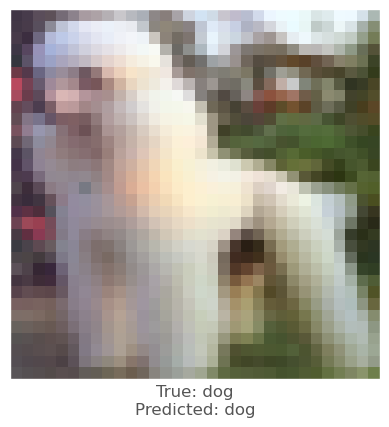



-0.0025786161
-0.004005134
0.0010371208
vr, vg, vb :   -2.71670764631269 4.3860324935166535 1.7000328412991703
beam_perturbed_confidence temp :  0.54526883
beam_perturbed_confidence temp :  0.53967434
beam_perturbed_confidence temp :  0.5304995
beam_perturbed_confidence temp :  0.526553
beam_perturbed_confidence temp :  0.54215497
beam_perturbed_confidence temp :  0.544239
beam_perturbed_confidence temp :  0.5319814
row index :  3
9th round's confidence : 4th 0.526553
predicted class :  dog
predicted class's confidence :  0.526553
Lopt is :  23


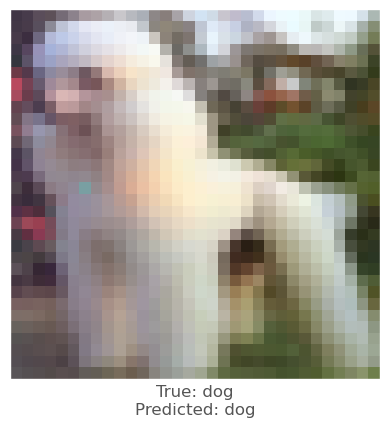



-0.0069471
-0.011110783
0.001772821
vr, vg, vb :   -2.0962661048920177 4.005644564761996 1.0007281562894934
beam_perturbed_confidence temp :  0.54831487
beam_perturbed_confidence temp :  0.52961737
beam_perturbed_confidence temp :  0.52866334
beam_perturbed_confidence temp :  0.5186926
beam_perturbed_confidence temp :  0.545833
beam_perturbed_confidence temp :  0.53364295
beam_perturbed_confidence temp :  0.5231185
row index :  3
10th round's confidence : 0th 0.5186926
predicted class :  dog
predicted class's confidence :  0.5186926
Lopt is :  26


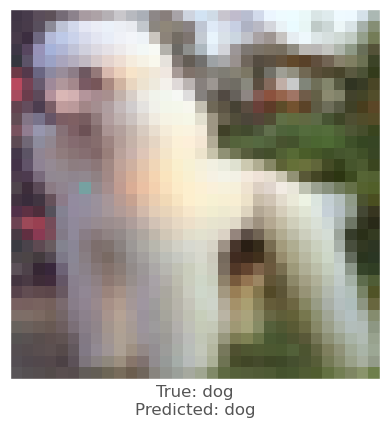



0.007231176
0.0007317066
0.0017553568
vr, vg, vb :   -1.6572890590661085 4.99632208027195 2.593515810928363
beam_perturbed_confidence temp :  0.5699493
beam_perturbed_confidence temp :  0.6002256
beam_perturbed_confidence temp :  0.5834235
beam_perturbed_confidence temp :  0.5816004
beam_perturbed_confidence temp :  0.5748907
beam_perturbed_confidence temp :  0.6105279
beam_perturbed_confidence temp :  0.5892154
row index :  0
10th round's confidence : 1th 0.5699493
predicted class :  dog
predicted class's confidence :  0.5699493
Lopt is :  10


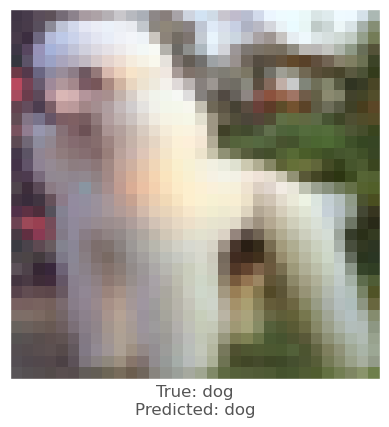



0.008216798
0.0023793578
0.0013241172
vr, vg, vb :   -5.56237233000565 0.6410022037151218 0.38056111908126744
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
row index :  1
10th round's confidence : 2th 0.5367816
predicted class :  dog
predicted class's confidence :  0.5367816
Lopt is :  13


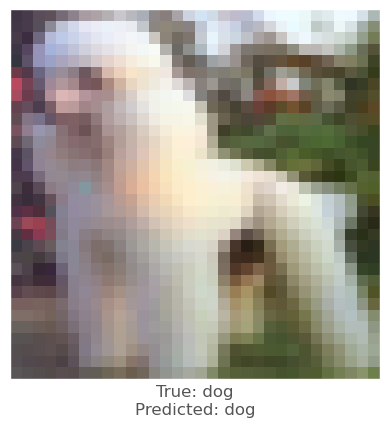



0.0010847449
0.0038594604
0.004818082
vr, vg, vb :   -2.3884946597296524 -2.9220387976824096 -2.0492744694737786
beam_perturbed_confidence temp :  0.6426376
beam_perturbed_confidence temp :  0.6367782
beam_perturbed_confidence temp :  0.63806593
beam_perturbed_confidence temp :  0.6300702
beam_perturbed_confidence temp :  0.6353464
beam_perturbed_confidence temp :  0.6321752
beam_perturbed_confidence temp :  0.62774193
row index :  6
10th round's confidence : 3th 0.62774193
predicted class :  dog
predicted class's confidence :  0.62774193
Lopt is :  28


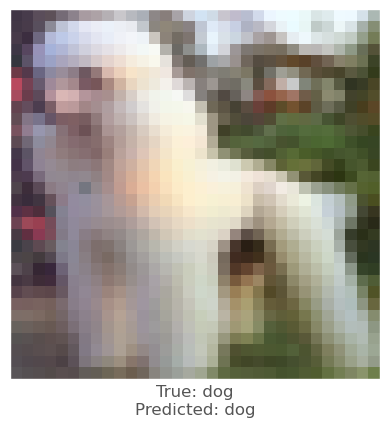



0.0039129853
0.0031948686
0.008252144
vr, vg, vb :   -2.836335414167383 3.627942387704417 0.7048151711829251
beam_perturbed_confidence temp :  0.525568
beam_perturbed_confidence temp :  0.53761
beam_perturbed_confidence temp :  0.526553
beam_perturbed_confidence temp :  0.525657
beam_perturbed_confidence temp :  0.525568
beam_perturbed_confidence temp :  0.53761
beam_perturbed_confidence temp :  0.525657
row index :  0
10th round's confidence : 4th 0.525568
predicted class :  dog
predicted class's confidence :  0.525568
Lopt is :  26


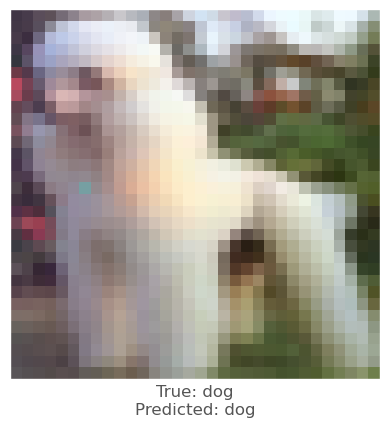



0.004163265
-0.0019767284
0.006994605
vr, vg, vb :   -2.3029660172299646 3.8027529522189014 0.2011948342213351
beam_perturbed_confidence temp :  0.5202209
beam_perturbed_confidence temp :  0.5294304
beam_perturbed_confidence temp :  0.5186926
beam_perturbed_confidence temp :  0.51078093
beam_perturbed_confidence temp :  0.5202209
beam_perturbed_confidence temp :  0.5294304
beam_perturbed_confidence temp :  0.51078093
row index :  3
11th round's confidence : 0th 0.51078093
predicted class :  dog
predicted class's confidence :  0.51078093
Lopt is :  29


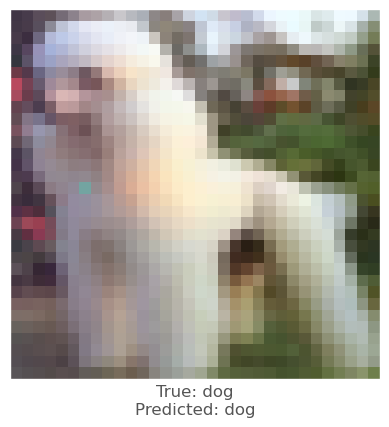



0.013693869
0.0031448007
0.004191816
vr, vg, vb :   -2.8609470645517097 4.182209805945317 1.9149826445236373
beam_perturbed_confidence temp :  0.54980195
beam_perturbed_confidence temp :  0.5816004
beam_perturbed_confidence temp :  0.5722732
beam_perturbed_confidence temp :  0.56262255
beam_perturbed_confidence temp :  0.5511392
beam_perturbed_confidence temp :  0.5847875
beam_perturbed_confidence temp :  0.56682295
row index :  0
11th round's confidence : 1th 0.54980195
predicted class :  dog
predicted class's confidence :  0.54980195
Lopt is :  10


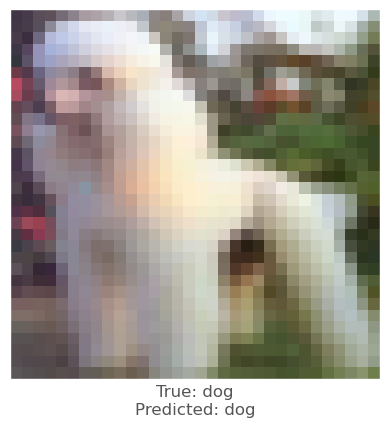



0.008216798
0.0023793578
0.0013241172
vr, vg, vb :   -5.827814927556233 0.3389662018647278 0.21009328880461042
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5732577
beam_perturbed_confidence temp :  0.5367816
beam_perturbed_confidence temp :  0.5732577
row index :  1
11th round's confidence : 2th 0.5367816
predicted class :  dog
predicted class's confidence :  0.5367816
Lopt is :  13


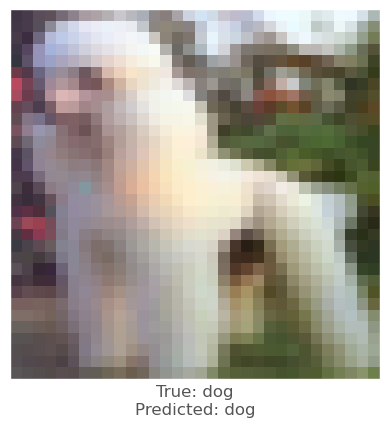



0.0037440658
0.0038289428
0.00092053413
vr, vg, vb :   -2.5240517699133034 -3.0127291954868007 -1.936400435917514
beam_perturbed_confidence temp :  0.61940026
beam_perturbed_confidence temp :  0.6168296
beam_perturbed_confidence temp :  0.6269128
beam_perturbed_confidence temp :  0.5993261
beam_perturbed_confidence temp :  0.6178684
beam_perturbed_confidence temp :  0.6151721
beam_perturbed_confidence temp :  0.59540904
row index :  6
11th round's confidence : 3th 0.59540904
predicted class :  dog
predicted class's confidence :  0.59540904
Lopt is :  31


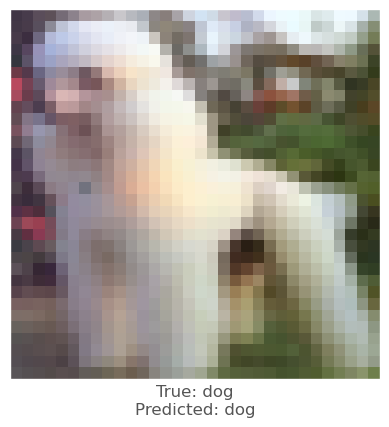



-0.0032996535
-0.010941267
0.0025150776
vr, vg, vb :   -2.22273651973856 4.359274850288956 0.3828258949703943
beam_perturbed_confidence temp :  0.540432
beam_perturbed_confidence temp :  0.53088194
beam_perturbed_confidence temp :  0.525568
beam_perturbed_confidence temp :  0.5132653
beam_perturbed_confidence temp :  0.540432
beam_perturbed_confidence temp :  0.53088194
beam_perturbed_confidence temp :  0.5132653
row index :  3
11th round's confidence : 4th 0.5132653
predicted class :  dog
predicted class's confidence :  0.5132653
Lopt is :  29


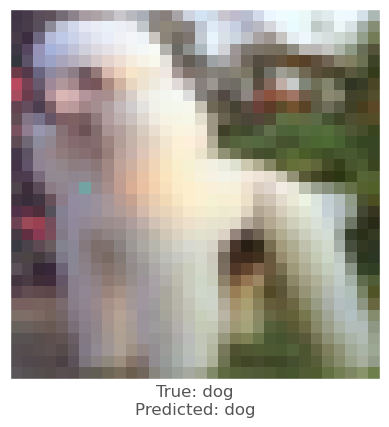



0.0093261
0.0031272173
0.0107572675
vr, vg, vb :   -3.005279450449595 3.1097559277184468 -0.8946513967136158
beam_perturbed_confidence temp :  0.5099475
beam_perturbed_confidence temp :  0.52389777
beam_perturbed_confidence temp :  0.50638586
beam_perturbed_confidence temp :  0.49529192
beam_perturbed_confidence temp :  0.51295865
beam_perturbed_confidence temp :  0.51578933
beam_perturbed_confidence temp :  0.49182835
row index :  6
12th round's confidence : 0th 0.49182835
predicted class :  horse
predicted class's confidence :  0.49977937
Lopt is :  33


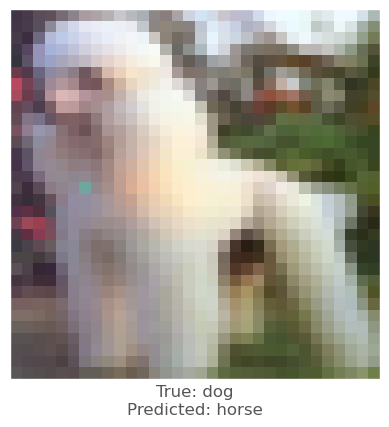




17th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  204 204 190
0.0035324693
-0.0011034608
0.0013612509
vr, vg, vb :   -0.35324692726135254 0.11034607887268066 -0.1361250877380371
beam_perturbed_confidence temp :  0.6665749
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66796917
beam_perturbed_confidence temp :  0.6665749
beam_perturbed_confidence temp :  0.6664484
beam_perturbed_confidence temp :  0.66796917
beam_perturbed_confidence temp :  0.6664484
row index :  4
0th round's confidence : 0th 0.6664484
predicted class :  dog
predicted class's confidence :  0.6664484
Lopt is :  1


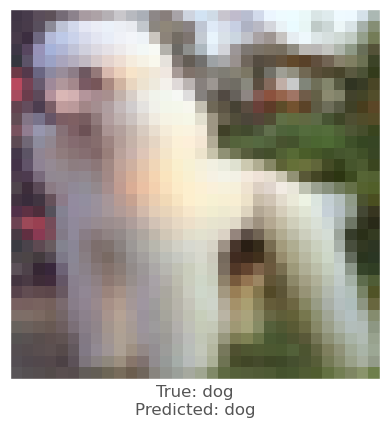



-0.0077726245
-0.00969553
-0.0071150064
vr, vg, vb :   0.7772624492645264 0.9695529937744141 0.7115006446838379
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
beam_perturbed_confidence temp :  0.7024262
row index :  0
0th round's confidence : 1th 0.7024262
predicted class :  dog
predicted class's confidence :  0.7024262
Lopt is :  5


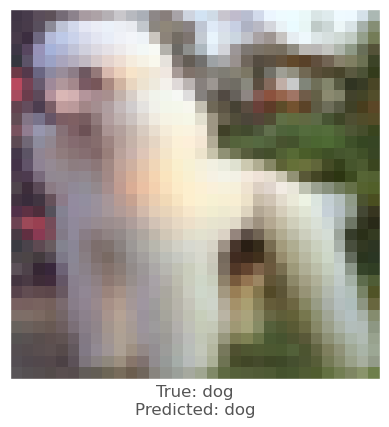



0.01031822
0.003719747
0.0048303604
vr, vg, vb :   -1.0318219661712646 -0.3719747066497803 -0.4830360412597656
beam_perturbed_confidence temp :  0.6856481
beam_perturbed_confidence temp :  0.6939826
beam_perturbed_confidence temp :  0.6935894
beam_perturbed_confidence temp :  0.6835185
beam_perturbed_confidence temp :  0.6828946
beam_perturbed_confidence temp :  0.6913792
beam_perturbed_confidence temp :  0.6815759
row index :  6
0th round's confidence : 2th 0.6815759
predicted class :  dog
predicted class's confidence :  0.6815759
Lopt is :  4


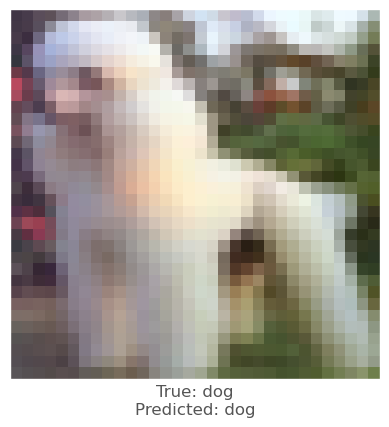



0.0008544326
0.00056785345
-0.0019823909
vr, vg, vb :   -0.08544325828552246 -0.05678534507751465 0.19823908805847168
beam_perturbed_confidence temp :  0.72899985
beam_perturbed_confidence temp :  0.72890013
beam_perturbed_confidence temp :  0.729449
beam_perturbed_confidence temp :  0.72928715
beam_perturbed_confidence temp :  0.72899985
beam_perturbed_confidence temp :  0.72890013
beam_perturbed_confidence temp :  0.72928715
row index :  1
0th round's confidence : 3th 0.72890013
predicted class :  dog
predicted class's confidence :  0.72890013
Lopt is :  11


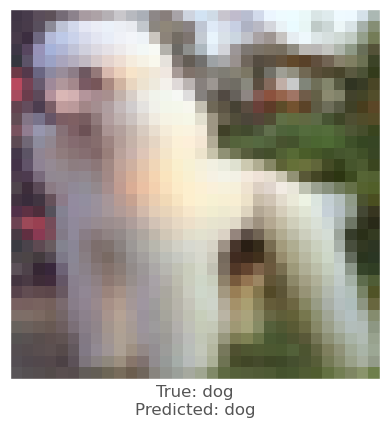



0.0054428577
-0.00019699335
0.0031442642
vr, vg, vb :   -0.544285774230957 0.0196993350982666 -0.3144264221191406
beam_perturbed_confidence temp :  0.7334808
beam_perturbed_confidence temp :  0.7362305
beam_perturbed_confidence temp :  0.7346244
beam_perturbed_confidence temp :  0.7334808
beam_perturbed_confidence temp :  0.73177886
beam_perturbed_confidence temp :  0.7346244
beam_perturbed_confidence temp :  0.73177886
row index :  4
0th round's confidence : 4th 0.73177886
predicted class :  dog
predicted class's confidence :  0.73177886
Lopt is :  10


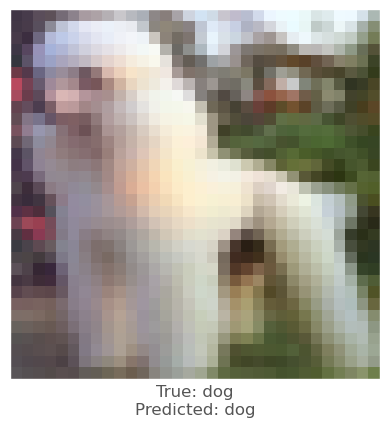



0.0013401508
-0.0033184886
-0.00020360947
vr, vg, vb :   -0.45193731784820557 0.4311603307723999 -0.10215163230895996
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.6664484
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.66779613
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.66779613
row index :  1
1th round's confidence : 0th 0.6664484
predicted class :  dog
predicted class's confidence :  0.6664484
Lopt is :  1


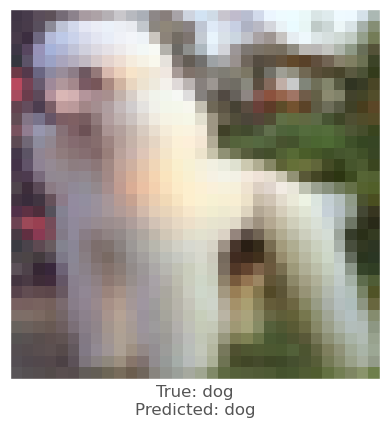



-0.0077726245
-0.00969553
-0.0071150064
vr, vg, vb :   1.4767986536026 1.8421506881713867 1.351851224899292
beam_perturbed_confidence temp :  0.6981227
beam_perturbed_confidence temp :  0.69696164
beam_perturbed_confidence temp :  0.6986926
beam_perturbed_confidence temp :  0.69309235
beam_perturbed_confidence temp :  0.6940535
beam_perturbed_confidence temp :  0.6930328
beam_perturbed_confidence temp :  0.6902131
row index :  6
1th round's confidence : 1th 0.6902131
predicted class :  dog
predicted class's confidence :  0.6902131
Lopt is :  4


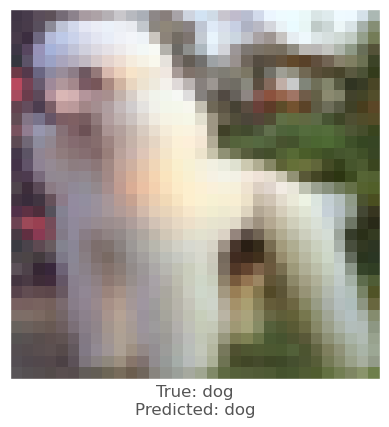



0.008150399
0.0019851327
0.0033198
vr, vg, vb :   -1.7436796426773071 -0.5332905054092407 -0.7667124271392822
beam_perturbed_confidence temp :  0.67436767
beam_perturbed_confidence temp :  0.68090945
beam_perturbed_confidence temp :  0.6801987
beam_perturbed_confidence temp :  0.6741612
beam_perturbed_confidence temp :  0.67320895
beam_perturbed_confidence temp :  0.67966115
beam_perturbed_confidence temp :  0.6731011
row index :  6
1th round's confidence : 2th 0.6731011
predicted class :  dog
predicted class's confidence :  0.6731011
Lopt is :  3


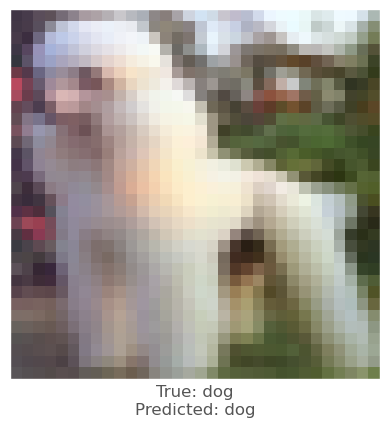



4.273653e-05
0.00057947636
-0.0017275214
vr, vg, vb :   -0.08117258548736572 -0.10905444622039795 0.35116732120513916
beam_perturbed_confidence temp :  0.72928715
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72890013
beam_perturbed_confidence temp :  0.7293767
beam_perturbed_confidence temp :  0.72928715
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7293767
row index :  1
1th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


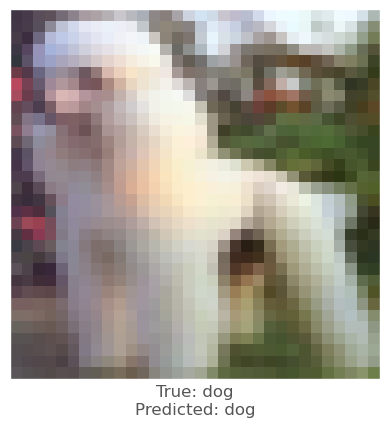



0.0065599084
5.5849552e-05
0.0034441352
vr, vg, vb :   -1.145848035812378 0.01214444637298584 -0.6273972988128662
beam_perturbed_confidence temp :  0.7230101
beam_perturbed_confidence temp :  0.73177886
beam_perturbed_confidence temp :  0.7300367
beam_perturbed_confidence temp :  0.7230101
beam_perturbed_confidence temp :  0.72020864
beam_perturbed_confidence temp :  0.7300367
beam_perturbed_confidence temp :  0.72020864
row index :  4
1th round's confidence : 4th 0.72020864
predicted class :  dog
predicted class's confidence :  0.72020864
Lopt is :  10


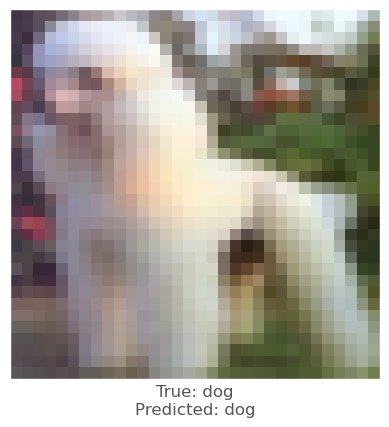



0.0013401508
-0.0033184886
-0.00020360947
vr, vg, vb :   -0.5407586693763733 0.7198931574821472 -0.07157552242279053
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.6664484
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.66779613
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.66779613
row index :  1
2th round's confidence : 0th 0.6664484
predicted class :  dog
predicted class's confidence :  0.6664484
Lopt is :  1


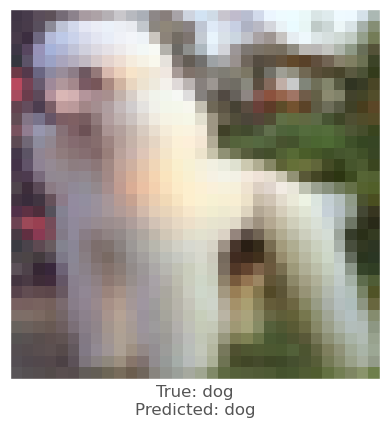



-0.0049957037
-0.0073143244
-0.0054442883
vr, vg, vb :   1.828689157962799 2.3893680572509766 1.7610949277877808
beam_perturbed_confidence temp :  0.6880371
beam_perturbed_confidence temp :  0.68382955
beam_perturbed_confidence temp :  0.68764806
beam_perturbed_confidence temp :  0.68310565
beam_perturbed_confidence temp :  0.6857622
beam_perturbed_confidence temp :  0.68244994
beam_perturbed_confidence temp :  0.6810645
row index :  6
2th round's confidence : 1th 0.6810645
predicted class :  dog
predicted class's confidence :  0.6810645
Lopt is :  3


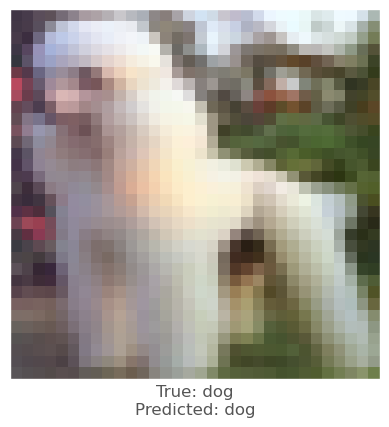



0.006662667
0.0004940629
0.0026204586
vr, vg, vb :   -2.2355783581733704 -0.5293677449226379 -0.9520870447158813
beam_perturbed_confidence temp :  0.6644536
beam_perturbed_confidence temp :  0.6727149
beam_perturbed_confidence temp :  0.67154074
beam_perturbed_confidence temp :  0.66490036
beam_perturbed_confidence temp :  0.66330177
beam_perturbed_confidence temp :  0.67100966
beam_perturbed_confidence temp :  0.6642492
row index :  4
2th round's confidence : 2th 0.66330177
predicted class :  dog
predicted class's confidence :  0.66330177
Lopt is :  3


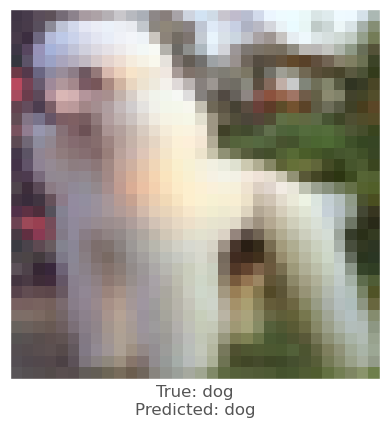



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.0148734450340271 -0.07862848043441772 0.49035245180130005
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.72909534
row index :  0
2th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


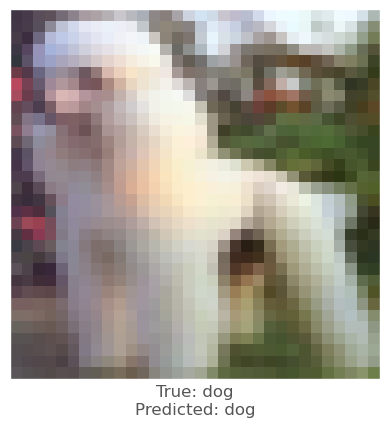



0.011406362
0.003361702
0.005325854
vr, vg, vb :   -2.171899437904358 -0.32524019479751587 -1.0972429513931274
beam_perturbed_confidence temp :  0.70395875
beam_perturbed_confidence temp :  0.7187016
beam_perturbed_confidence temp :  0.71501887
beam_perturbed_confidence temp :  0.70208603
beam_perturbed_confidence temp :  0.6993642
beam_perturbed_confidence temp :  0.7132755
beam_perturbed_confidence temp :  0.6975487
row index :  6
2th round's confidence : 4th 0.6975487
predicted class :  dog
predicted class's confidence :  0.6975487
Lopt is :  9


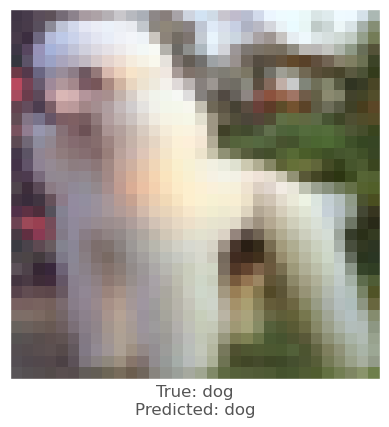



0.0013401508
-0.0033184886
-0.00020360947
vr, vg, vb :   -0.6206978857517242 0.9797527015209199 -0.044057023525238034
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.6664484
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.66779613
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.66779613
row index :  1
3th round's confidence : 0th 0.6664484
predicted class :  dog
predicted class's confidence :  0.6664484
Lopt is :  1


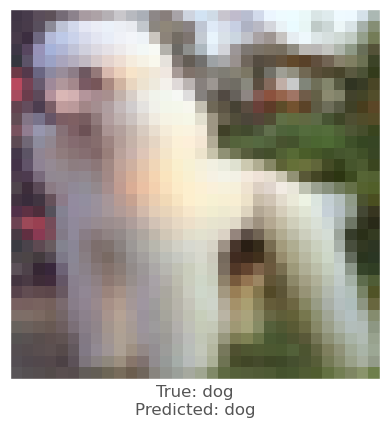



-0.0041084886
-0.0065352917
-0.0042462945
vr, vg, vb :   2.0566690981388094 2.803960418701172 2.009614884853363
beam_perturbed_confidence temp :  0.6758281
beam_perturbed_confidence temp :  0.6727291
beam_perturbed_confidence temp :  0.67648023
beam_perturbed_confidence temp :  0.66781396
beam_perturbed_confidence temp :  0.6718339
beam_perturbed_confidence temp :  0.66793185
beam_perturbed_confidence temp :  0.6664484
row index :  6
3th round's confidence : 1th 0.6664484
predicted class :  dog
predicted class's confidence :  0.6664484
Lopt is :  1


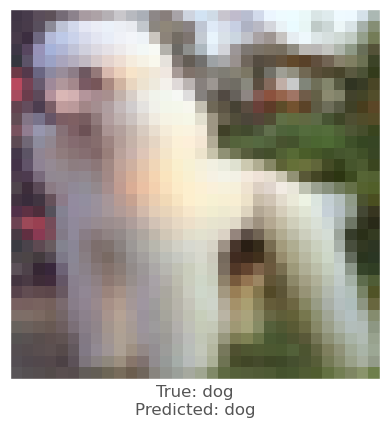



0.002283752
-0.0011184812
0.0021588206
vr, vg, vb :   -2.2403957188129424 -0.3645828545093536 -1.0727604031562805
beam_perturbed_confidence temp :  0.661221
beam_perturbed_confidence temp :  0.6642492
beam_perturbed_confidence temp :  0.6623446
beam_perturbed_confidence temp :  0.66362107
beam_perturbed_confidence temp :  0.6611962
beam_perturbed_confidence temp :  0.66347706
beam_perturbed_confidence temp :  0.66349196
row index :  4
3th round's confidence : 2th 0.6611962
predicted class :  dog
predicted class's confidence :  0.6611962
Lopt is :  5


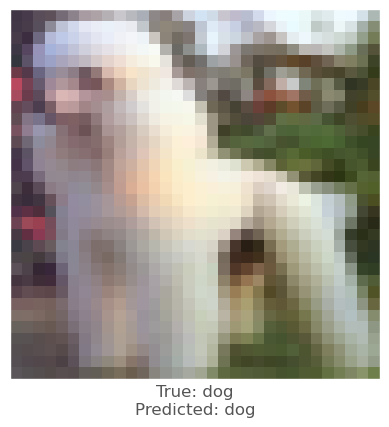



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.10131487250328064 -0.051245111227035525 0.6156190693378449
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.72909534
row index :  0
3th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


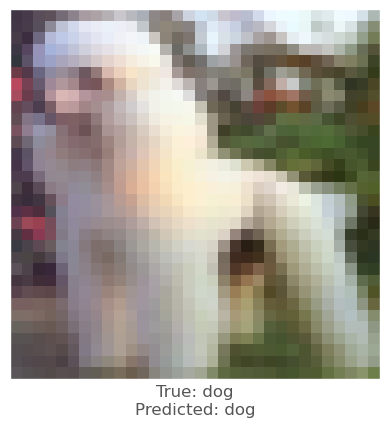



0.009491742
0.0027489066
0.0033928156
vr, vg, vb :   -2.9038836598396305 -0.5676068365573883 -1.3268002152442933
beam_perturbed_confidence temp :  0.686285
beam_perturbed_confidence temp :  0.6966153
beam_perturbed_confidence temp :  0.695306
beam_perturbed_confidence temp :  0.6849631
beam_perturbed_confidence temp :  0.68276584
beam_perturbed_confidence temp :  0.6942209
beam_perturbed_confidence temp :  0.6811009
row index :  6
3th round's confidence : 4th 0.6811009
predicted class :  dog
predicted class's confidence :  0.6811009
Lopt is :  8


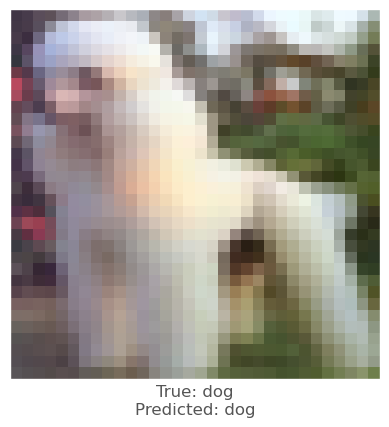



0.0013401508
-0.0033184886
-0.00020360947
vr, vg, vb :   -0.6926431804895401 1.213626291155815 -0.019290374517440798
beam_perturbed_confidence temp :  0.666629
beam_perturbed_confidence temp :  0.6653381
beam_perturbed_confidence temp :  0.6667785
beam_perturbed_confidence temp :  0.6641692
beam_perturbed_confidence temp :  0.66779613
beam_perturbed_confidence temp :  0.66488355
beam_perturbed_confidence temp :  0.66454417
row index :  3
4th round's confidence : 0th 0.6641692
predicted class :  dog
predicted class's confidence :  0.6641692
Lopt is :  2


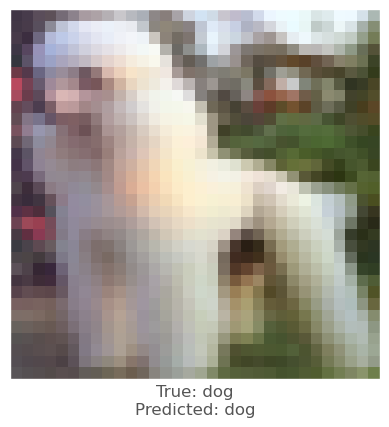



0.0013401508
-0.0033184886
-0.00020360947
vr, vg, vb :   1.7169871050119403 2.855413236618042 1.8290143430233001
beam_perturbed_confidence temp :  0.66796917
beam_perturbed_confidence temp :  0.6648014
beam_perturbed_confidence temp :  0.6665749
beam_perturbed_confidence temp :  0.6656761
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6650262
beam_perturbed_confidence temp :  0.66534245
row index :  1
4th round's confidence : 1th 0.6648014
predicted class :  dog
predicted class's confidence :  0.6648014
Lopt is :  2


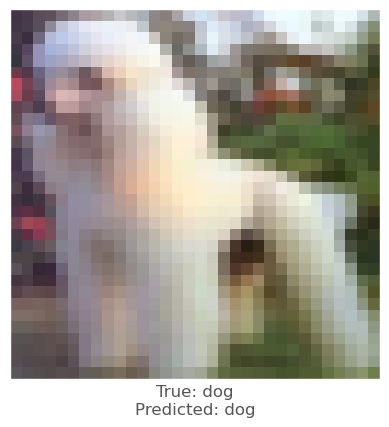



-0.0012626648
-0.0042201877
-0.000716269
vr, vg, vb :   -1.8900896674394607 0.09389419734478 -0.8938574612140656
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.6611962
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.66587675
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66587675
row index :  1
4th round's confidence : 2th 0.6611962
predicted class :  dog
predicted class's confidence :  0.6611962
Lopt is :  5


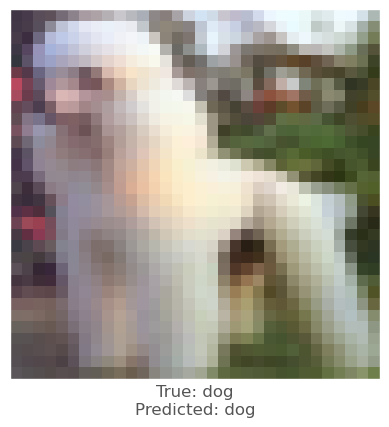



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.17911215722560883 -0.02660007894039154 0.7283590251207352
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.72909534
row index :  0
4th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


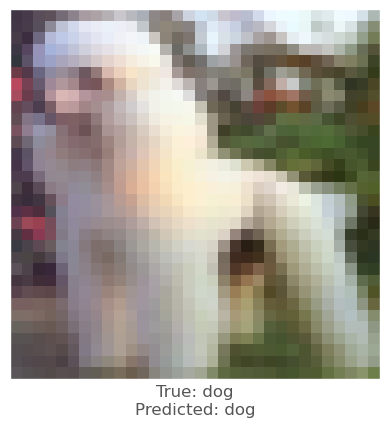



0.0082012415
0.003998816
0.003988862
vr, vg, vb :   -3.4336194431781775 -0.9107277542352676 -1.5930063974857331
beam_perturbed_confidence temp :  0.66580737
beam_perturbed_confidence temp :  0.678767
beam_perturbed_confidence temp :  0.67713165
beam_perturbed_confidence temp :  0.6648123
beam_perturbed_confidence temp :  0.66299564
beam_perturbed_confidence temp :  0.6753967
beam_perturbed_confidence temp :  0.6621326
row index :  6
4th round's confidence : 4th 0.6621326
predicted class :  dog
predicted class's confidence :  0.6621326
Lopt is :  7


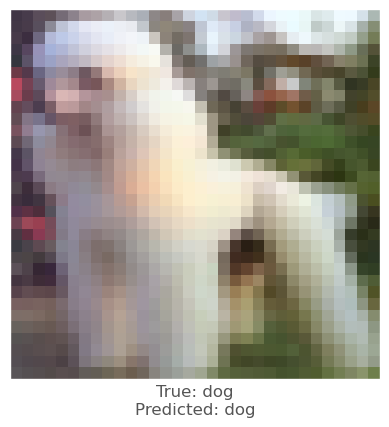



0.00081044436
-0.0035980344
-0.00029611588
vr, vg, vb :   -0.7044232979416848 1.4520671002268792 0.012250250458717343
beam_perturbed_confidence temp :  0.66452765
beam_perturbed_confidence temp :  0.663031
beam_perturbed_confidence temp :  0.6641692
beam_perturbed_confidence temp :  0.6622064
beam_perturbed_confidence temp :  0.66452765
beam_perturbed_confidence temp :  0.663031
beam_perturbed_confidence temp :  0.6622064
row index :  3
5th round's confidence : 0th 0.6622064
predicted class :  dog
predicted class's confidence :  0.6622064
Lopt is :  3


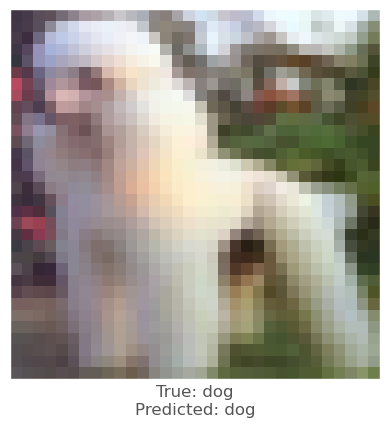



0.002645135
-0.0022857785
0.000785172
vr, vg, vb :   1.2807749019265178 2.7984497652053832 1.567595710158348
beam_perturbed_confidence temp :  0.6656761
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6650262
beam_perturbed_confidence temp :  0.6636099
beam_perturbed_confidence temp :  0.66534245
beam_perturbed_confidence temp :  0.6622225
beam_perturbed_confidence temp :  0.6650688
row index :  1
5th round's confidence : 1th 0.66123
predicted class :  dog
predicted class's confidence :  0.66123
Lopt is :  4


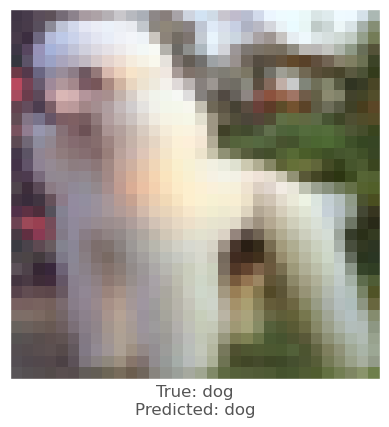



-0.0012626648
-0.0042201877
-0.000716269
vr, vg, vb :   -1.5748142212033271 0.5065235440135002 -0.7328448134660721
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.6611962
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.66587675
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66587675
row index :  1
5th round's confidence : 2th 0.6611962
predicted class :  dog
predicted class's confidence :  0.6611962
Lopt is :  5


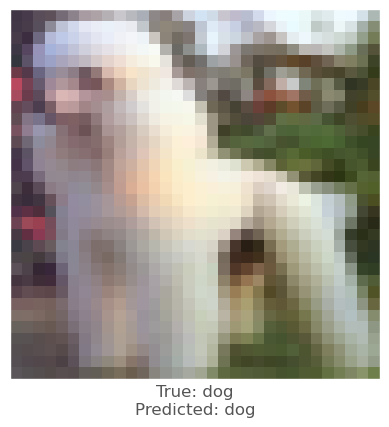



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.2491297134757042 -0.004419549882411958 0.8298249853253366
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.72909534
beam_perturbed_confidence temp :  0.72909534
row index :  0
5th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


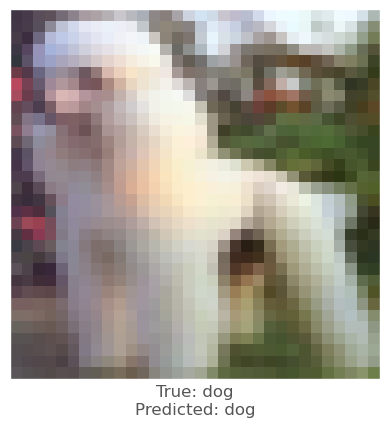



0.0056120157
0.0014551282
0.0023623705
vr, vg, vb :   -3.651459071278573 -0.965167798101902 -1.6699428068399431
beam_perturbed_confidence temp :  0.6562405
beam_perturbed_confidence temp :  0.6615405
beam_perturbed_confidence temp :  0.65969557
beam_perturbed_confidence temp :  0.6574639
beam_perturbed_confidence temp :  0.6548244
beam_perturbed_confidence temp :  0.6590762
beam_perturbed_confidence temp :  0.65664387
row index :  4
5th round's confidence : 4th 0.6548244
predicted class :  dog
predicted class's confidence :  0.6548244
Lopt is :  7


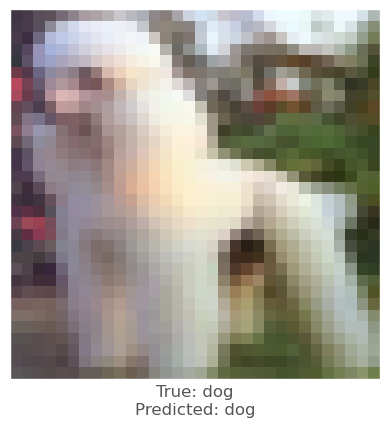



0.00011616945
-0.003483355
-0.00016081333
vr, vg, vb :   -0.64559791341424 1.6551958947360517 0.027106558573246
beam_perturbed_confidence temp :  0.6629148
beam_perturbed_confidence temp :  0.6610443
beam_perturbed_confidence temp :  0.6622064
beam_perturbed_confidence temp :  0.6609721
beam_perturbed_confidence temp :  0.6629148
beam_perturbed_confidence temp :  0.6610443
beam_perturbed_confidence temp :  0.6609721
row index :  3
6th round's confidence : 0th 0.6609721
predicted class :  dog
predicted class's confidence :  0.6609721
Lopt is :  4


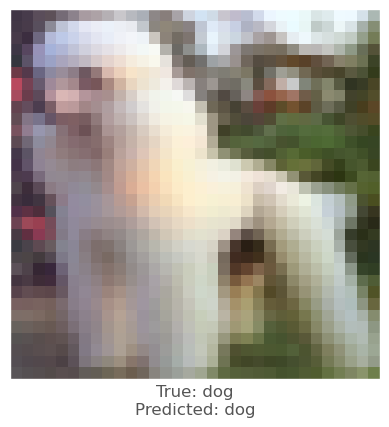



0.002929449
-0.0018670559
0.00080674887
vr, vg, vb :   0.8597525035917761 2.7053103779792784 1.330161252439022
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6622225
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6622225
beam_perturbed_confidence temp :  0.6642518
beam_perturbed_confidence temp :  0.6642518
row index :  0
6th round's confidence : 1th 0.66123
predicted class :  dog
predicted class's confidence :  0.66123
Lopt is :  4


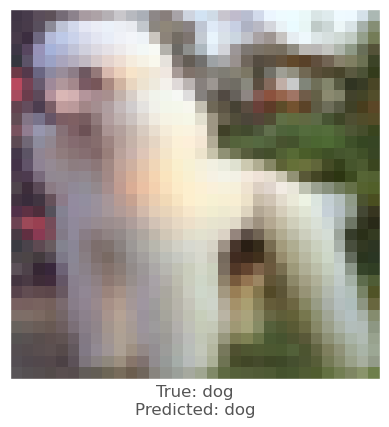



-0.0012626648
-0.0042201877
-0.000716269
vr, vg, vb :   -1.291066319590807 0.8778899560153484 -0.587933430492878
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.6611962
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.66587675
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66587675
row index :  1
6th round's confidence : 2th 0.6611962
predicted class :  dog
predicted class's confidence :  0.6611962
Lopt is :  5


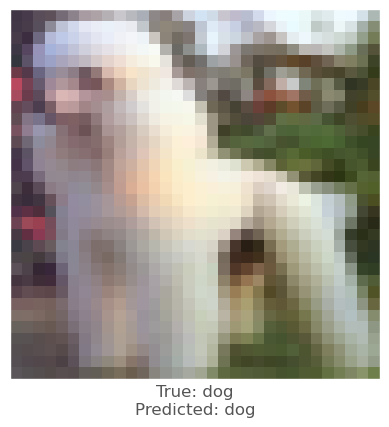



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.31214551410079006 0.015542926269769667 0.9211443495094778
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
row index :  0
6th round's confidence : 3th 0.7288695
predicted class :  dog
predicted class's confidence :  0.7288695
Lopt is :  12


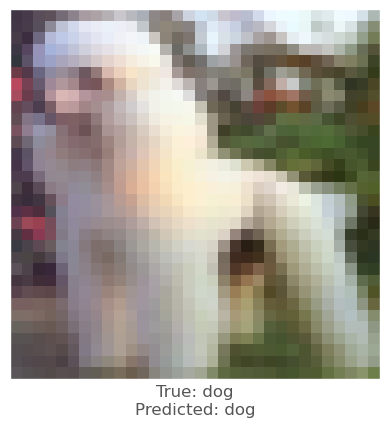



0.00039422512
-0.0032054782
0.00079393387
vr, vg, vb :   -3.325735676205159 -0.5481031991541386 -1.582341912996769
beam_perturbed_confidence temp :  0.65780705
beam_perturbed_confidence temp :  0.65664387
beam_perturbed_confidence temp :  0.6547894
beam_perturbed_confidence temp :  0.66153425
beam_perturbed_confidence temp :  0.6618666
beam_perturbed_confidence temp :  0.6571879
beam_perturbed_confidence temp :  0.6671883
row index :  2
6th round's confidence : 4th 0.6547894
predicted class :  dog
predicted class's confidence :  0.6547894
Lopt is :  7


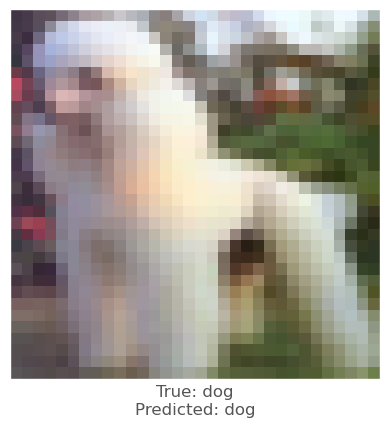



-0.0007645488
-0.0033418536
-0.0004261136
vr, vg, vb :   -0.5045832442194225 1.823861667124629 0.06700726326584816
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.65957296
beam_perturbed_confidence temp :  0.6609721
beam_perturbed_confidence temp :  0.6594229
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.65957296
beam_perturbed_confidence temp :  0.6594229
row index :  3
7th round's confidence : 0th 0.6594229
predicted class :  dog
predicted class's confidence :  0.6594229
Lopt is :  5


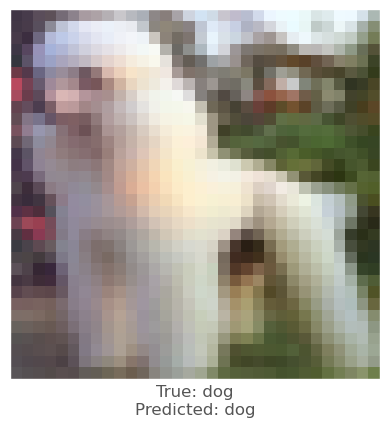



0.002929449
-0.0018670559
0.00080674887
vr, vg, vb :   0.48083234509050865 2.621484929475784 1.1164702404916287
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6622225
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6622225
beam_perturbed_confidence temp :  0.6642518
beam_perturbed_confidence temp :  0.6642518
row index :  0
7th round's confidence : 1th 0.66123
predicted class :  dog
predicted class's confidence :  0.66123
Lopt is :  4


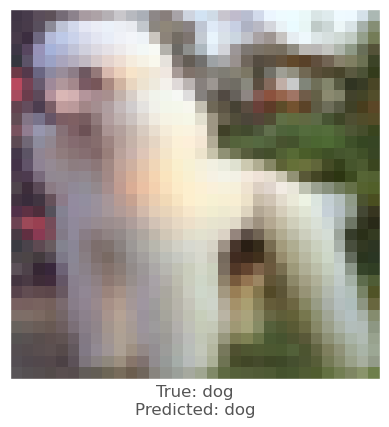



-0.0012626648
-0.0042201877
-0.000716269
vr, vg, vb :   -1.035693208139539 1.2121197268170119 -0.4575131858170034
beam_perturbed_confidence temp :  0.66385555
beam_perturbed_confidence temp :  0.6592718
beam_perturbed_confidence temp :  0.66180885
beam_perturbed_confidence temp :  0.66051567
beam_perturbed_confidence temp :  0.66587675
beam_perturbed_confidence temp :  0.6594229
beam_perturbed_confidence temp :  0.6619505
row index :  1
7th round's confidence : 2th 0.6592718
predicted class :  dog
predicted class's confidence :  0.6592718
Lopt is :  5


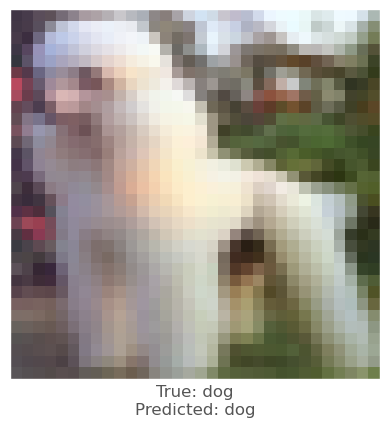



-0.0008792877
-0.00019520521
-0.0017430186
vr, vg, vb :   0.3688597346633673 0.03350915480673313 1.0033317772752048
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7288695
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7281019
row index :  2
7th round's confidence : 3th 0.7281019
predicted class :  dog
predicted class's confidence :  0.7281019
Lopt is :  12


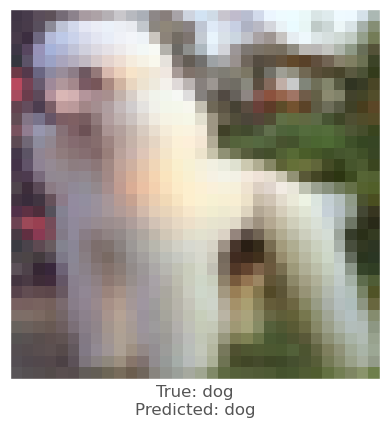



-0.00086307526
-0.004567921
-0.0007261038
vr, vg, vb :   -2.9068545829498773 -0.03650076307356365 -1.3514973434317112
beam_perturbed_confidence temp :  0.6588987
beam_perturbed_confidence temp :  0.6571879
beam_perturbed_confidence temp :  0.65641755
beam_perturbed_confidence temp :  0.6634795
beam_perturbed_confidence temp :  0.66414464
beam_perturbed_confidence temp :  0.6595372
beam_perturbed_confidence temp :  0.67034775
row index :  2
7th round's confidence : 4th 0.65641755
predicted class :  dog
predicted class's confidence :  0.65641755
Lopt is :  7


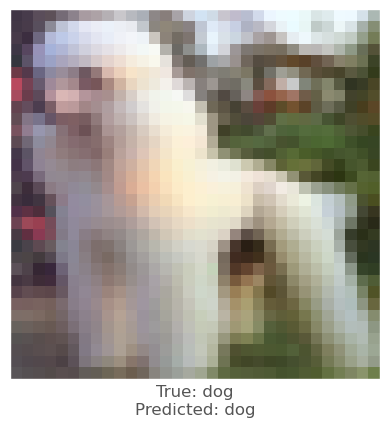



-0.0007122755
-0.0037982464
-0.0006569624
vr, vg, vb :   -0.3828973692908884 2.0213001387788654 0.1260027764106989
beam_perturbed_confidence temp :  0.66028523
beam_perturbed_confidence temp :  0.6564508
beam_perturbed_confidence temp :  0.6594229
beam_perturbed_confidence temp :  0.65644926
beam_perturbed_confidence temp :  0.66028523
beam_perturbed_confidence temp :  0.6564508
beam_perturbed_confidence temp :  0.65644926
row index :  3
8th round's confidence : 0th 0.65644926
predicted class :  dog
predicted class's confidence :  0.65644926
Lopt is :  6


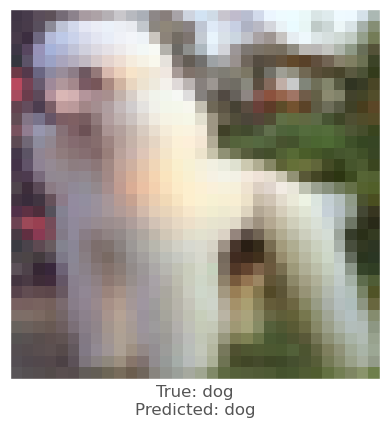



0.002929449
-0.0018670559
0.00080674887
vr, vg, vb :   0.13980420243936797 2.5460420258226395 0.9241483297389745
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6621716
row index :  0
8th round's confidence : 1th 0.66123
predicted class :  dog
predicted class's confidence :  0.66123
Lopt is :  4


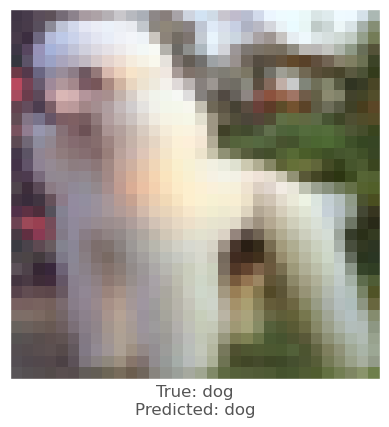



0.00011253357
-0.0029254556
0.00020903349
vr, vg, vb :   -0.9433772442591788 1.3834533111574054 -0.43266521615803255
beam_perturbed_confidence temp :  0.6597222
beam_perturbed_confidence temp :  0.6582707
beam_perturbed_confidence temp :  0.6594229
beam_perturbed_confidence temp :  0.65801793
beam_perturbed_confidence temp :  0.66028523
beam_perturbed_confidence temp :  0.6580106
beam_perturbed_confidence temp :  0.6580128
row index :  5
8th round's confidence : 2th 0.6580106
predicted class :  dog
predicted class's confidence :  0.6580106
Lopt is :  5


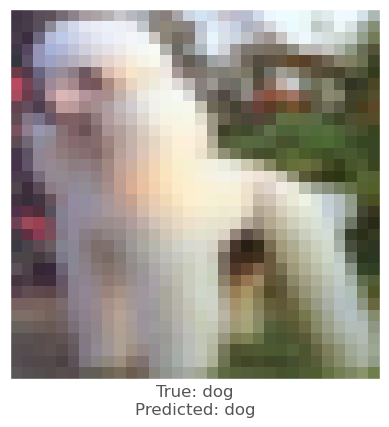



-0.0006005764
-0.00021123886
-0.0017430186
vr, vg, vb :   0.3920314012727142 0.05128212543445826 1.0773004622643592
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7281019
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7271265
row index :  2
8th round's confidence : 3th 0.7271265
predicted class :  dog
predicted class's confidence :  0.7271265
Lopt is :  12


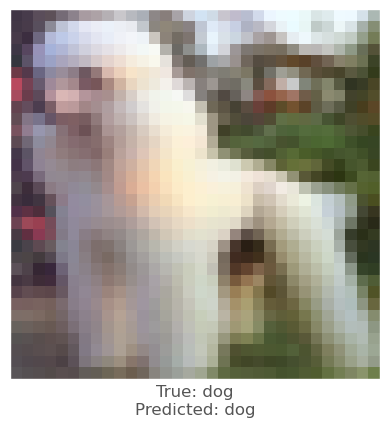



-0.003075838
-0.006353557
-0.0025368333
vr, vg, vb :   -2.308585315755964 0.6025050242170691 -0.9626642804600001
beam_perturbed_confidence temp :  0.66414464
beam_perturbed_confidence temp :  0.65641755
beam_perturbed_confidence temp :  0.65786743
beam_perturbed_confidence temp :  0.66414464
beam_perturbed_confidence temp :  0.6677003
beam_perturbed_confidence temp :  0.65786743
beam_perturbed_confidence temp :  0.6677003
row index :  1
8th round's confidence : 4th 0.65641755
predicted class :  dog
predicted class's confidence :  0.65641755
Lopt is :  7


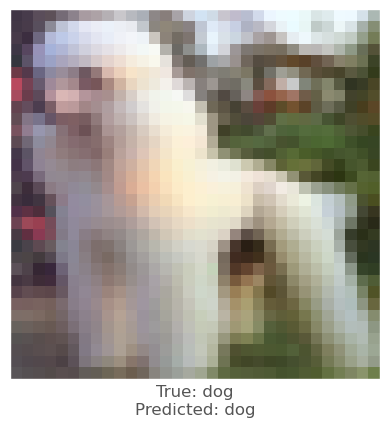



-0.00023949146
-0.0036901236
-8.523464e-06
vr, vg, vb :   -0.32065848609104763 2.1881824807054224 0.1142548451899171
beam_perturbed_confidence temp :  0.6566903
beam_perturbed_confidence temp :  0.65295917
beam_perturbed_confidence temp :  0.65644926
beam_perturbed_confidence temp :  0.65285724
beam_perturbed_confidence temp :  0.6566903
beam_perturbed_confidence temp :  0.65295917
beam_perturbed_confidence temp :  0.65285724
row index :  3
9th round's confidence : 0th 0.65285724
predicted class :  dog
predicted class's confidence :  0.65285724
Lopt is :  8


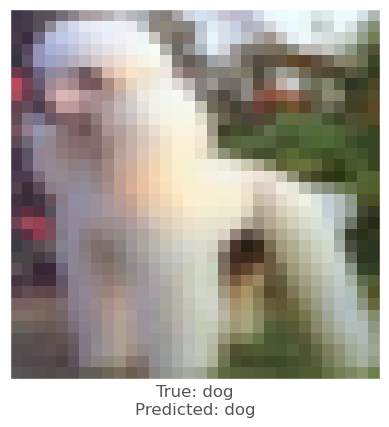



0.002929449
-0.0018670559
0.00080674887
vr, vg, vb :   -0.16712112594665865 2.478143412534809 0.7510586100615859
beam_perturbed_confidence temp :  0.6606805
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.66123
beam_perturbed_confidence temp :  0.6595889
beam_perturbed_confidence temp :  0.6606805
beam_perturbed_confidence temp :  0.6621716
beam_perturbed_confidence temp :  0.6595889
row index :  3
9th round's confidence : 1th 0.6595889
predicted class :  dog
predicted class's confidence :  0.6595889
Lopt is :  6


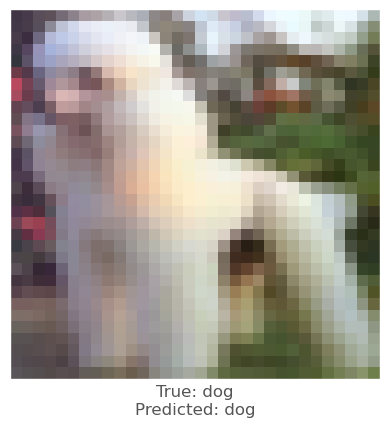



0.00026744604
-0.0029720664
0.00037544966
vr, vg, vb :   -0.8757841239439788 1.5423146202851952 -0.42694366028624786
beam_perturbed_confidence temp :  0.6580128
beam_perturbed_confidence temp :  0.6564508
beam_perturbed_confidence temp :  0.65789527
beam_perturbed_confidence temp :  0.65644926
beam_perturbed_confidence temp :  0.658482
beam_perturbed_confidence temp :  0.6563583
beam_perturbed_confidence temp :  0.6564928
row index :  5
9th round's confidence : 2th 0.6563583
predicted class :  dog
predicted class's confidence :  0.6563583
Lopt is :  6


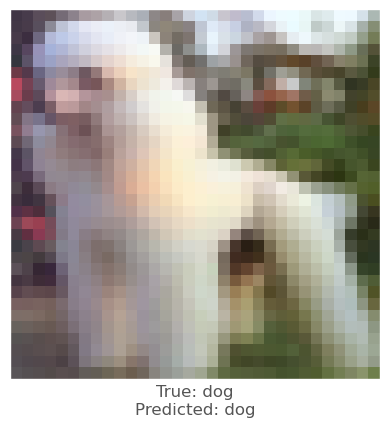



-0.0009329915
-0.00058984756
-0.0020623207
vr, vg, vb :   0.44612741161236175 0.105138669360739 1.1758024869607748
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7271265
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7260396
row index :  2
9th round's confidence : 3th 0.7260396
predicted class :  dog
predicted class's confidence :  0.7260396
Lopt is :  12


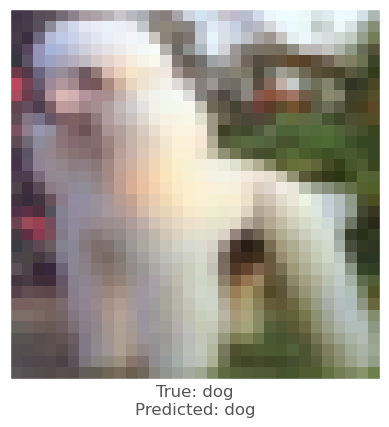



-0.003075838
-0.006353557
-0.0025368333
vr, vg, vb :   -1.7701429752814417 1.1776102327786386 -0.6127145237854601
beam_perturbed_confidence temp :  0.6606595
beam_perturbed_confidence temp :  0.65318364
beam_perturbed_confidence temp :  0.65786743
beam_perturbed_confidence temp :  0.65637684
beam_perturbed_confidence temp :  0.6638663
beam_perturbed_confidence temp :  0.65438116
beam_perturbed_confidence temp :  0.65843534
row index :  1
9th round's confidence : 4th 0.65318364
predicted class :  dog
predicted class's confidence :  0.65318364
Lopt is :  8


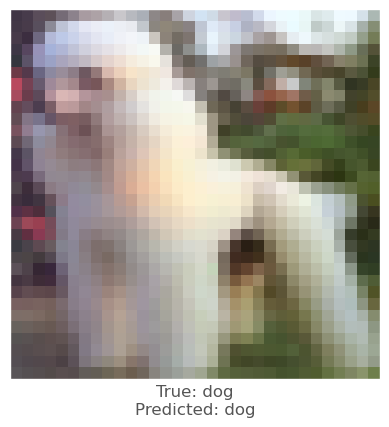



0.00023818016
-0.0028799176
0.0008184314
vr, vg, vb :   -0.31241065353418895 2.257355994796135 0.020986222929836526
beam_perturbed_confidence temp :  0.652721
beam_perturbed_confidence temp :  0.65164834
beam_perturbed_confidence temp :  0.65285724
beam_perturbed_confidence temp :  0.6503456
beam_perturbed_confidence temp :  0.652721
beam_perturbed_confidence temp :  0.65164834
beam_perturbed_confidence temp :  0.6503456
row index :  3
10th round's confidence : 0th 0.6503456
predicted class :  dog
predicted class's confidence :  0.6503456
Lopt is :  10


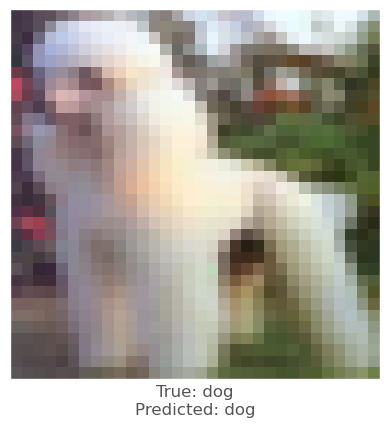



0.0044412017
0.0014118552
0.003063798
vr, vg, vb :   -0.5945291820379058 2.0891435492018604 0.36957295398096446
beam_perturbed_confidence temp :  0.6577304
beam_perturbed_confidence temp :  0.66186446
beam_perturbed_confidence temp :  0.6595889
beam_perturbed_confidence temp :  0.659092
beam_perturbed_confidence temp :  0.6577304
beam_perturbed_confidence temp :  0.66186446
beam_perturbed_confidence temp :  0.659092
row index :  0
10th round's confidence : 1th 0.6577304
predicted class :  dog
predicted class's confidence :  0.6577304
Lopt is :  6


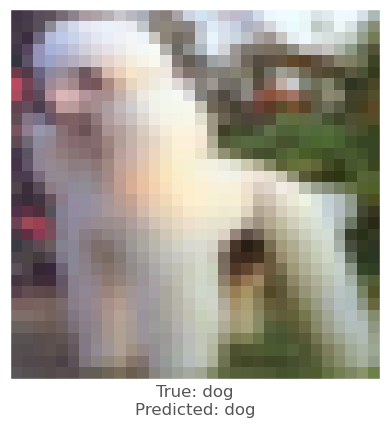



-2.9563904e-05
-0.0035051703
0.00031369925
vr, vg, vb :   -0.7852493211687215 1.7386001927873154 -0.4156192188029112
beam_perturbed_confidence temp :  0.6564928
beam_perturbed_confidence temp :  0.6543901
beam_perturbed_confidence temp :  0.6561371
beam_perturbed_confidence temp :  0.6544297
beam_perturbed_confidence temp :  0.65691185
beam_perturbed_confidence temp :  0.65430194
beam_perturbed_confidence temp :  0.65441996
row index :  5
10th round's confidence : 2th 0.65430194
predicted class :  dog
predicted class's confidence :  0.65430194
Lopt is :  7


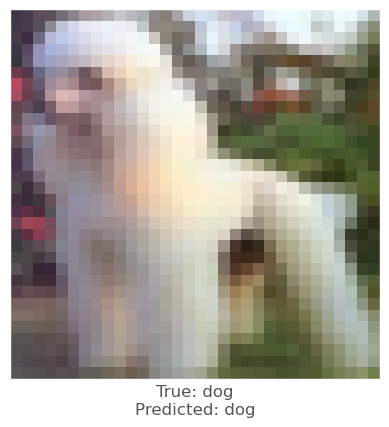



-0.0013076663
-0.0009035468
-0.002185583
vr, vg, vb :   0.5322813006238551 0.18497948343967974 1.2767805497270996
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.7260396
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.7249409
row index :  2
10th round's confidence : 3th 0.7249409
predicted class :  dog
predicted class's confidence :  0.7249409
Lopt is :  12


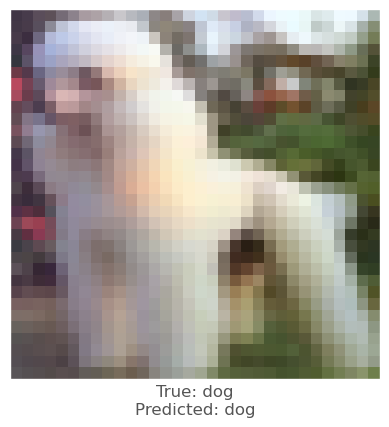



-0.0023396015
-0.005954087
-0.0016877651
vr, vg, vb :   -1.3591685260809343 1.6552578875555843 -0.38266655926091797
beam_perturbed_confidence temp :  0.65637684
beam_perturbed_confidence temp :  0.65046346
beam_perturbed_confidence temp :  0.65438116
beam_perturbed_confidence temp :  0.6527316
beam_perturbed_confidence temp :  0.65843534
beam_perturbed_confidence temp :  0.6513027
beam_perturbed_confidence temp :  0.6544681
row index :  1
10th round's confidence : 4th 0.65046346
predicted class :  dog
predicted class's confidence :  0.65046346
Lopt is :  9


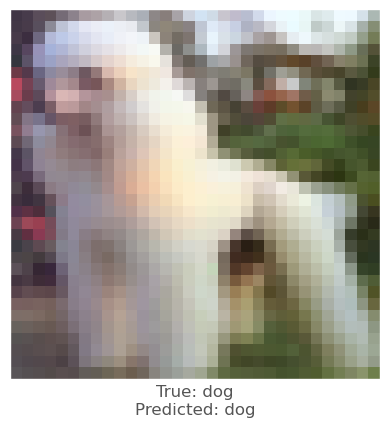



0.001954198
-0.0011852384
0.00154531
vr, vg, vb :   -0.4765893765413658 2.1501442314523858 -0.13564340140782485
beam_perturbed_confidence temp :  0.64969414
beam_perturbed_confidence temp :  0.64999527
beam_perturbed_confidence temp :  0.64953655
beam_perturbed_confidence temp :  0.6484613
beam_perturbed_confidence temp :  0.64921737
beam_perturbed_confidence temp :  0.6496099
beam_perturbed_confidence temp :  0.64813286
row index :  6
11th round's confidence : 0th 0.64813286
predicted class :  dog
predicted class's confidence :  0.64813286
Lopt is :  12


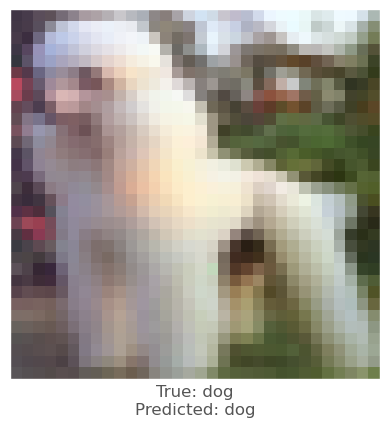



0.003123641
-0.0003528595
0.0021353364
vr, vg, vb :   -0.8474403652440273 1.9155151439887057 0.1190820186750311
beam_perturbed_confidence temp :  0.65646523
beam_perturbed_confidence temp :  0.65827775
beam_perturbed_confidence temp :  0.6577304
beam_perturbed_confidence temp :  0.6559168
beam_perturbed_confidence temp :  0.65646523
beam_perturbed_confidence temp :  0.65827775
beam_perturbed_confidence temp :  0.6559168
row index :  3
11th round's confidence : 1th 0.6559168
predicted class :  dog
predicted class's confidence :  0.6559168
Lopt is :  7


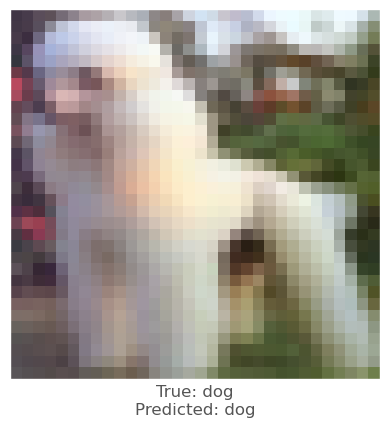



0.0003052354
-0.003334403
0.0002361536
vr, vg, vb :   -0.7372479276413269 1.8981804773110742 -0.39767265718262984
beam_perturbed_confidence temp :  0.65441996
beam_perturbed_confidence temp :  0.6528027
beam_perturbed_confidence temp :  0.65415394
beam_perturbed_confidence temp :  0.65226674
beam_perturbed_confidence temp :  0.6551084
beam_perturbed_confidence temp :  0.65255123
beam_perturbed_confidence temp :  0.65223044
row index :  6
11th round's confidence : 2th 0.65223044
predicted class :  dog
predicted class's confidence :  0.65223044
Lopt is :  8


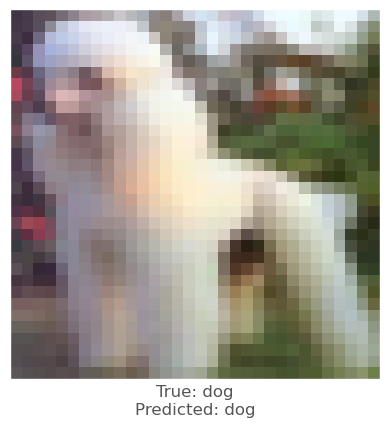



-0.0013616681
-0.00092601776
-0.0021716356
vr, vg, vb :   0.6152199815508494 0.2590833112187586 1.366266057529048
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.7249409
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.72386795
row index :  2
11th round's confidence : 3th 0.72386795
predicted class :  dog
predicted class's confidence :  0.72386795
Lopt is :  12


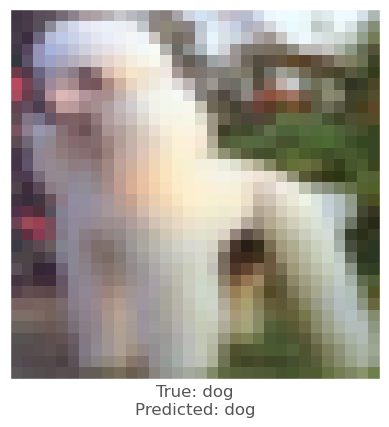



-0.0006392598
-0.004065573
-0.0008608699
vr, vg, vb :   -1.1593256919512345 1.896289420348488 -0.2583129148857295
beam_perturbed_confidence temp :  0.6527316
beam_perturbed_confidence temp :  0.64911807
beam_perturbed_confidence temp :  0.6513027
beam_perturbed_confidence temp :  0.6499155
beam_perturbed_confidence temp :  0.6544681
beam_perturbed_confidence temp :  0.6490342
beam_perturbed_confidence temp :  0.6509865
row index :  5
11th round's confidence : 4th 0.6490342
predicted class :  dog
predicted class's confidence :  0.6490342
Lopt is :  10


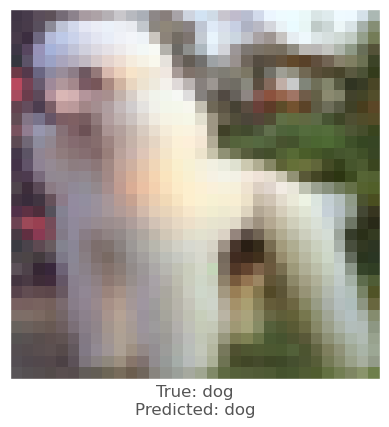



0.0032001138
-0.00069600344
0.0007914305
vr, vg, vb :   -0.748941816221824 2.004730152011371 -0.20122210859980605
beam_perturbed_confidence temp :  0.6464098
beam_perturbed_confidence temp :  0.6475239
beam_perturbed_confidence temp :  0.64766985
beam_perturbed_confidence temp :  0.6454042
beam_perturbed_confidence temp :  0.64633125
beam_perturbed_confidence temp :  0.64704883
beam_perturbed_confidence temp :  0.64503115
row index :  6
12th round's confidence : 0th 0.64503115
predicted class :  dog
predicted class's confidence :  0.64503115
Lopt is :  14


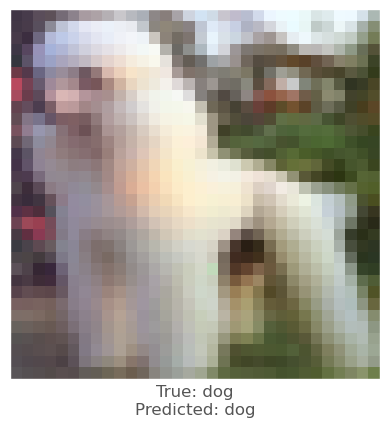



0.003641665
3.9994717e-05
0.0025408864
vr, vg, vb :   -1.1268628269038286 1.7199641579254064 -0.1469148234054847
beam_perturbed_confidence temp :  0.6543227
beam_perturbed_confidence temp :  0.6565052
beam_perturbed_confidence temp :  0.65483963
beam_perturbed_confidence temp :  0.65295917
beam_perturbed_confidence temp :  0.6544297
beam_perturbed_confidence temp :  0.6548543
beam_perturbed_confidence temp :  0.65219134
row index :  6
12th round's confidence : 1th 0.65219134
predicted class :  dog
predicted class's confidence :  0.65219134
Lopt is :  8


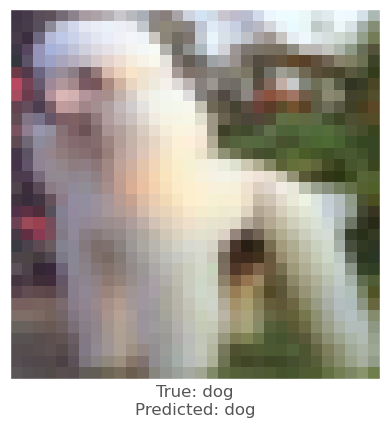



-0.0006324053
-0.0043234825
-0.0010179281
vr, vg, vb :   -0.6002826067705047 2.1407106809227403 -0.25611257911695473
beam_perturbed_confidence temp :  0.65318364
beam_perturbed_confidence temp :  0.6502072
beam_perturbed_confidence temp :  0.65328467
beam_perturbed_confidence temp :  0.64911807
beam_perturbed_confidence temp :  0.65438116
beam_perturbed_confidence temp :  0.6500726
beam_perturbed_confidence temp :  0.6490342
row index :  6
12th round's confidence : 2th 0.6490342
predicted class :  dog
predicted class's confidence :  0.6490342
Lopt is :  10


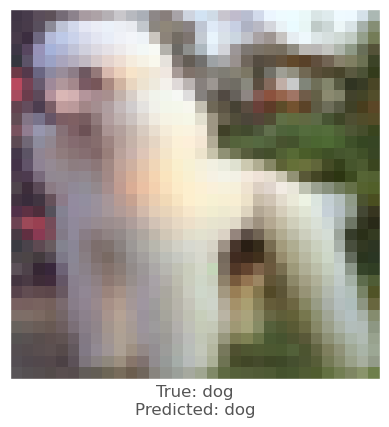



-0.0012409687
-0.00067973137
-0.0020850897
vr, vg, vb :   0.6777948538181278 0.3011481169987382 1.4381484201294146
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.72386795
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.7228558
row index :  2
12th round's confidence : 3th 0.7228558
predicted class :  dog
predicted class's confidence :  0.7228558
Lopt is :  12


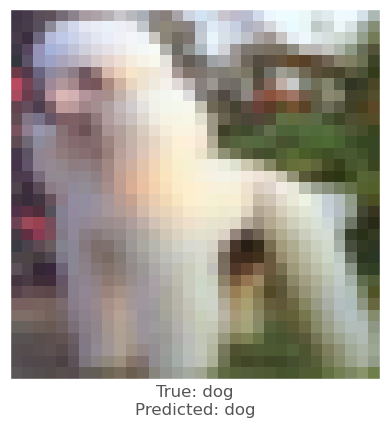



0.00031411648
-0.0026254058
-0.0007799864
vr, vg, vb :   -1.074804770552742 1.9692010571558023 -0.15448298524408038
beam_perturbed_confidence temp :  0.6509865
beam_perturbed_confidence temp :  0.6486773
beam_perturbed_confidence temp :  0.64989805
beam_perturbed_confidence temp :  0.64864665
beam_perturbed_confidence temp :  0.65244526
beam_perturbed_confidence temp :  0.6486729
beam_perturbed_confidence temp :  0.6495544
row index :  3
12th round's confidence : 4th 0.64864665
predicted class :  dog
predicted class's confidence :  0.64864665
Lopt is :  11


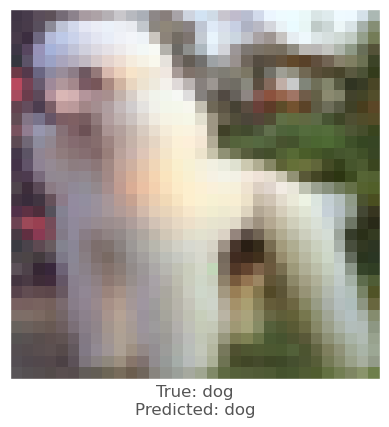



0.0036037564
-0.00092571974
0.0006813407
vr, vg, vb :   -1.0344232773761308 1.896829110610893 -0.24923396718257448
beam_perturbed_confidence temp :  0.6419299
beam_perturbed_confidence temp :  0.64461684
beam_perturbed_confidence temp :  0.6447229
beam_perturbed_confidence temp :  0.6410975
beam_perturbed_confidence temp :  0.64233655
beam_perturbed_confidence temp :  0.6442316
beam_perturbed_confidence temp :  0.6409387
row index :  6
13th round's confidence : 0th 0.6409387
predicted class :  dog
predicted class's confidence :  0.6409387
Lopt is :  15


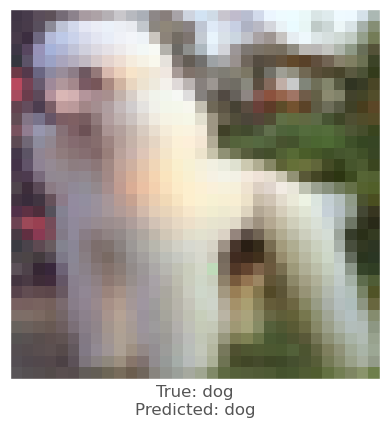



0.00063216686
-0.002673924
0.00069242716
vr, vg, vb :   -1.0773932304622251 1.8153601390597456 -0.20146605690050753
beam_perturbed_confidence temp :  0.6526898
beam_perturbed_confidence temp :  0.65175575
beam_perturbed_confidence temp :  0.65226674
beam_perturbed_confidence temp :  0.6507031
beam_perturbed_confidence temp :  0.6533657
beam_perturbed_confidence temp :  0.65095884
beam_perturbed_confidence temp :  0.6507985
row index :  3
13th round's confidence : 1th 0.6507031
predicted class :  dog
predicted class's confidence :  0.6507031
Lopt is :  9


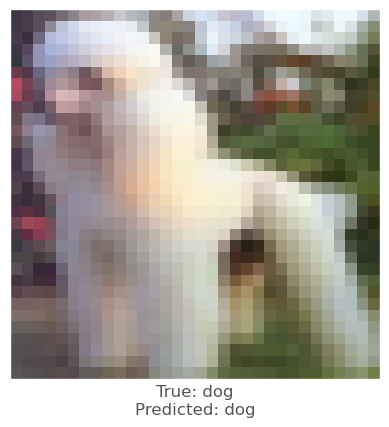



0.00031411648
-0.0026254058
-0.0007799864
vr, vg, vb :   -0.5716659938900851 2.1891801916726292 -0.1525026830521831
beam_perturbed_confidence temp :  0.64975846
beam_perturbed_confidence temp :  0.6488077
beam_perturbed_confidence temp :  0.64989805
beam_perturbed_confidence temp :  0.6476559
beam_perturbed_confidence temp :  0.6507743
beam_perturbed_confidence temp :  0.64869875
beam_perturbed_confidence temp :  0.6478883
row index :  3
13th round's confidence : 2th 0.6476559
predicted class :  dog
predicted class's confidence :  0.6476559
Lopt is :  12


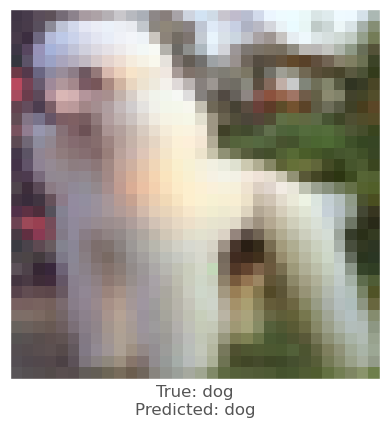



-0.00095003843
-6.0021877e-05
-0.001665771
vr, vg, vb :   0.7050192117438101 0.27703549302774627 1.4609106788702573
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.7228558
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.7222022
row index :  2
13th round's confidence : 3th 0.7222022
predicted class :  dog
predicted class's confidence :  0.7222022
Lopt is :  12


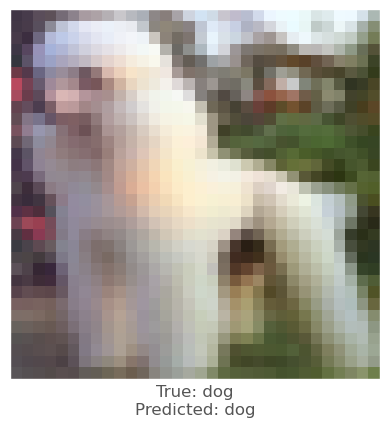



-0.0016216636
-0.003879249
-0.0017925501
vr, vg, vb :   -0.8051579364570625 2.160205861031897 0.040220321977837425
beam_perturbed_confidence temp :  0.64964485
beam_perturbed_confidence temp :  0.6458787
beam_perturbed_confidence temp :  0.64864665
beam_perturbed_confidence temp :  0.6454263
beam_perturbed_confidence temp :  0.64964485
beam_perturbed_confidence temp :  0.6458787
beam_perturbed_confidence temp :  0.6454263
row index :  3
13th round's confidence : 4th 0.6454263
predicted class :  dog
predicted class's confidence :  0.6454263
Lopt is :  13


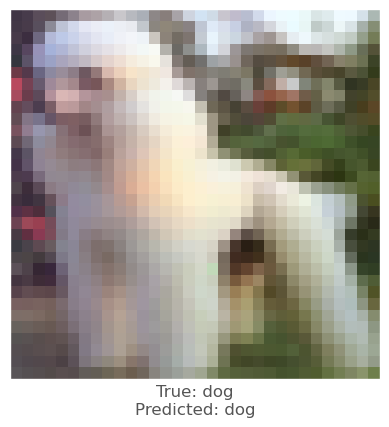



0.0021378398
-0.0021046996
-0.0005134344
vr, vg, vb :   -1.1447649290544113 1.9176161607161855 -0.17296712945479556
beam_perturbed_confidence temp :  0.64058566
beam_perturbed_confidence temp :  0.64023185
beam_perturbed_confidence temp :  0.6416109
beam_perturbed_confidence temp :  0.6381713
beam_perturbed_confidence temp :  0.6421308
beam_perturbed_confidence temp :  0.6400745
beam_perturbed_confidence temp :  0.6394497
row index :  3
14th round's confidence : 0th 0.6381713
predicted class :  dog
predicted class's confidence :  0.6381713
Lopt is :  16


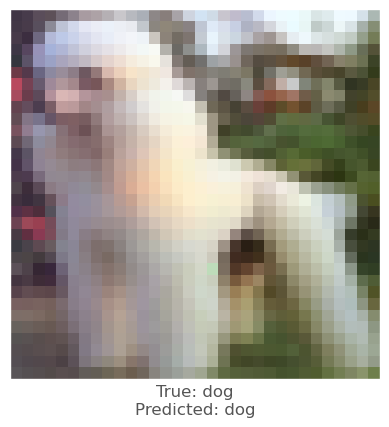



1.7285347e-06
-0.0031532645
0.00046628714
vr, vg, vb :   -0.9698267608858513 1.94915057740902 -0.22794816481824487
beam_perturbed_confidence temp :  0.65080124
beam_perturbed_confidence temp :  0.64953655
beam_perturbed_confidence temp :  0.6507985
beam_perturbed_confidence temp :  0.64921737
beam_perturbed_confidence temp :  0.6512277
beam_perturbed_confidence temp :  0.64873266
beam_perturbed_confidence temp :  0.6491778
row index :  5
14th round's confidence : 1th 0.64873266
predicted class :  dog
predicted class's confidence :  0.64873266
Lopt is :  10


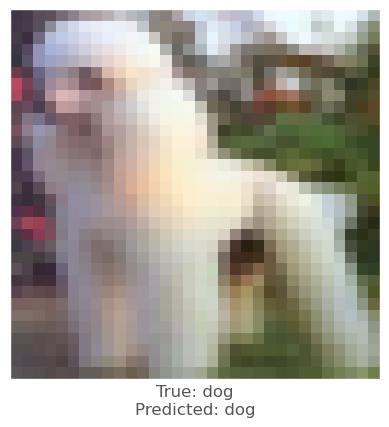



0.0017004609
-0.0004746318
0.0003926158
vr, vg, vb :   -0.6845454855807885 2.01772535114001 -0.1765139942605146
beam_perturbed_confidence temp :  0.64710724
beam_perturbed_confidence temp :  0.6476338
beam_perturbed_confidence temp :  0.6478883
beam_perturbed_confidence temp :  0.64582086
beam_perturbed_confidence temp :  0.6480911
beam_perturbed_confidence temp :  0.6469281
beam_perturbed_confidence temp :  0.6454228
row index :  6
14th round's confidence : 2th 0.6454228
predicted class :  dog
predicted class's confidence :  0.6454228
Lopt is :  14


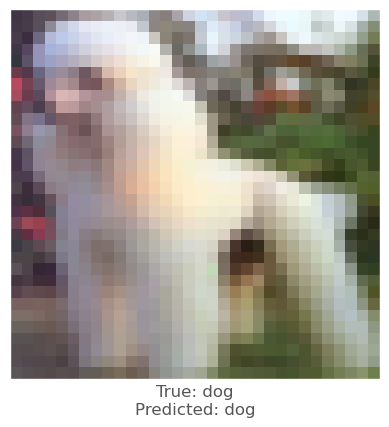



-0.0005645156
0.00033581257
-0.0014879704
vr, vg, vb :   0.6909688496362015 0.21575068685851656 1.4636166462005167
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.7222022
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.72136784
row index :  2
14th round's confidence : 3th 0.72136784
predicted class :  dog
predicted class's confidence :  0.72136784
Lopt is :  12


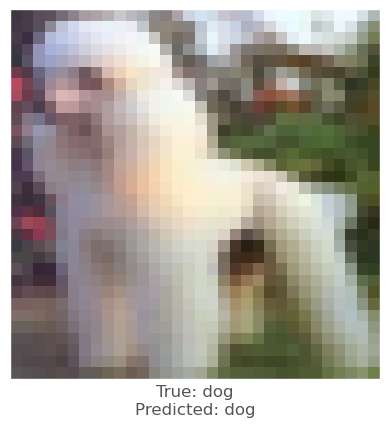



0.00018405914
-0.0031074882
-0.00165838
vr, vg, vb :   -0.7430480571179968 2.2549340904652064 0.20203629293862302
beam_perturbed_confidence temp :  0.6456946
beam_perturbed_confidence temp :  0.64391154
beam_perturbed_confidence temp :  0.6454263
beam_perturbed_confidence temp :  0.6423028
beam_perturbed_confidence temp :  0.6456946
beam_perturbed_confidence temp :  0.64391154
beam_perturbed_confidence temp :  0.6423028
row index :  3
14th round's confidence : 4th 0.6423028
predicted class :  dog
predicted class's confidence :  0.6423028
Lopt is :  15


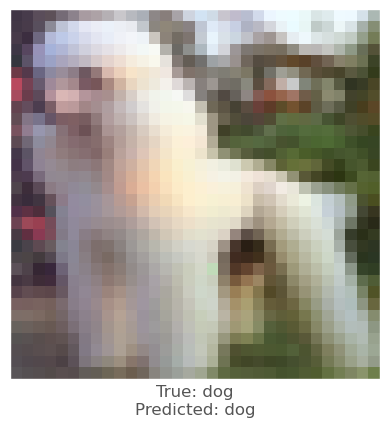



0.00029367208
-0.0041490793
-0.0019564033
vr, vg, vb :   -1.059655644629805 2.140762476926061 0.039969909036948637
beam_perturbed_confidence temp :  0.63874453
beam_perturbed_confidence temp :  0.63494575
beam_perturbed_confidence temp :  0.6381713
beam_perturbed_confidence temp :  0.63343406
beam_perturbed_confidence temp :  0.63874453
beam_perturbed_confidence temp :  0.63494575
beam_perturbed_confidence temp :  0.63343406
row index :  3
15th round's confidence : 0th 0.63343406
predicted class :  dog
predicted class's confidence :  0.63343406
Lopt is :  18


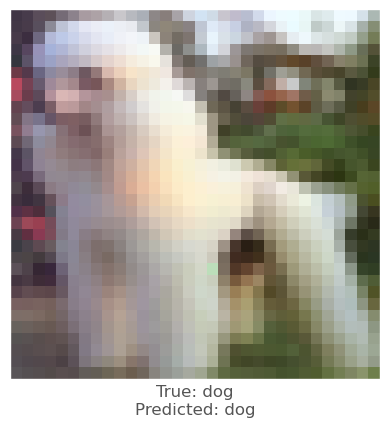



0.0004249215
-0.0019609928
0.0005236268
vr, vg, vb :   -0.9153362360576421 1.9503348009791532 -0.25751602877160107
beam_perturbed_confidence temp :  0.6491778
beam_perturbed_confidence temp :  0.6488375
beam_perturbed_confidence temp :  0.6490129
beam_perturbed_confidence temp :  0.64776975
beam_perturbed_confidence temp :  0.6499155
beam_perturbed_confidence temp :  0.6481209
beam_perturbed_confidence temp :  0.6477618
row index :  6
15th round's confidence : 1th 0.6477618
predicted class :  dog
predicted class's confidence :  0.6477618
Lopt is :  11


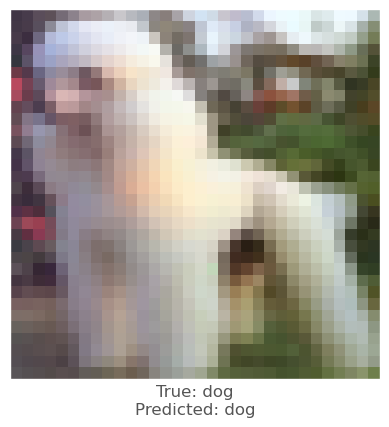



0.0020323396
-0.0014411211
-0.00058496
vr, vg, vb :   -0.8193248943133591 1.9600649261639485 -0.10036659645189477
beam_perturbed_confidence temp :  0.64489573
beam_perturbed_confidence temp :  0.645222
beam_perturbed_confidence temp :  0.6464058
beam_perturbed_confidence temp :  0.64362186
beam_perturbed_confidence temp :  0.6463084
beam_perturbed_confidence temp :  0.6451021
beam_perturbed_confidence temp :  0.6447299
row index :  3
15th round's confidence : 2th 0.64362186
predicted class :  dog
predicted class's confidence :  0.64362186
Lopt is :  15


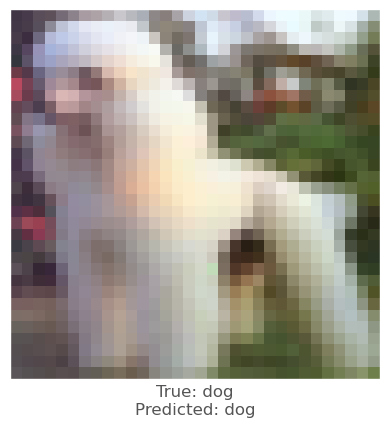



-0.00019264221
-0.00046116114
-0.0021981
vr, vg, vb :   0.6411361858639877 0.24029173183538463 1.5370649905831506
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.72136784
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.7200041
row index :  2
15th round's confidence : 3th 0.7200041
predicted class :  dog
predicted class's confidence :  0.7200041
Lopt is :  12


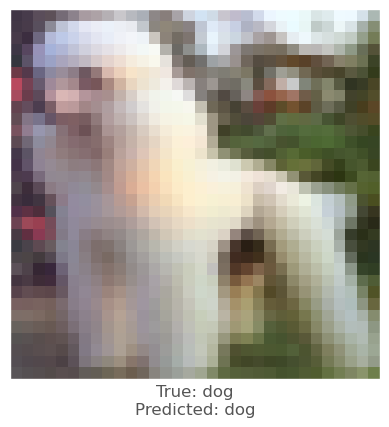



0.00230062
-0.001816988
-0.00079357624
vr, vg, vb :   -0.8988052593102499 2.211139480551987 0.2611902876987158
beam_perturbed_confidence temp :  0.6416109
beam_perturbed_confidence temp :  0.6410082
beam_perturbed_confidence temp :  0.6423028
beam_perturbed_confidence temp :  0.63895667
beam_perturbed_confidence temp :  0.6416109
beam_perturbed_confidence temp :  0.6410082
beam_perturbed_confidence temp :  0.63895667
row index :  3
15th round's confidence : 4th 0.63895667
predicted class :  dog
predicted class's confidence :  0.63895667
Lopt is :  17


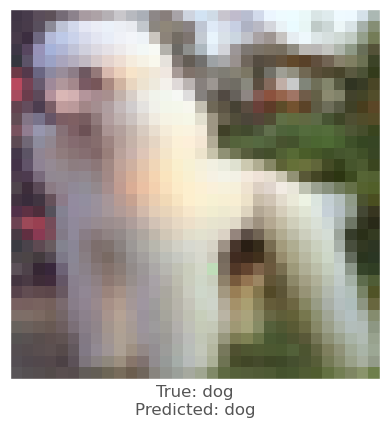



0.0011613369
-0.0046306252
-0.0016114712
vr, vg, vb :   -1.0698237700471958 2.389748754028987 0.19712003574799986
beam_perturbed_confidence temp :  0.6334265
beam_perturbed_confidence temp :  0.6287929
beam_perturbed_confidence temp :  0.63343406
beam_perturbed_confidence temp :  0.6271994
beam_perturbed_confidence temp :  0.6334265
beam_perturbed_confidence temp :  0.6287929
beam_perturbed_confidence temp :  0.6271994
row index :  3
16th round's confidence : 0th 0.6271994
predicted class :  dog
predicted class's confidence :  0.6271994
Lopt is :  20


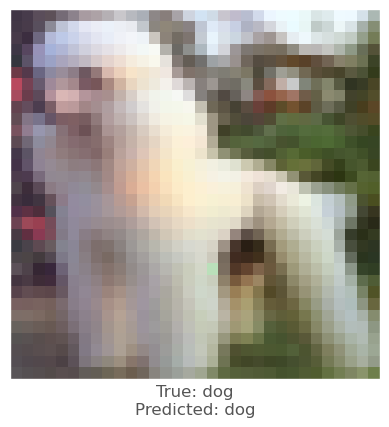



-0.00031983852
-0.0028941631
-0.00087690353
vr, vg, vb :   -0.7918187600654033 2.044717634052625 -0.14407407250088627
beam_perturbed_confidence temp :  0.6484407
beam_perturbed_confidence temp :  0.64663684
beam_perturbed_confidence temp :  0.64864665
beam_perturbed_confidence temp :  0.64514005
beam_perturbed_confidence temp :  0.64964485
beam_perturbed_confidence temp :  0.6458787
beam_perturbed_confidence temp :  0.6454263
row index :  3
16th round's confidence : 1th 0.64514005
predicted class :  dog
predicted class's confidence :  0.64514005
Lopt is :  13


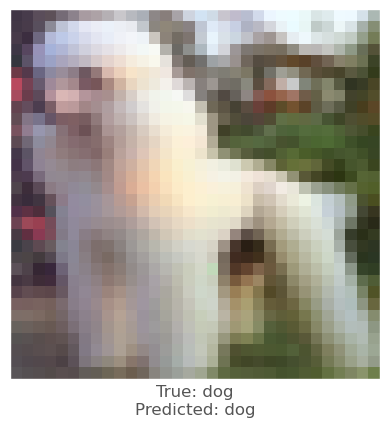



0.0019535422
-0.0017039776
-0.0008183718
vr, vg, vb :   -0.932746628133366 1.9344561920314403 -0.008492759530093971
beam_perturbed_confidence temp :  0.64326847
beam_perturbed_confidence temp :  0.64319175
beam_perturbed_confidence temp :  0.6447299
beam_perturbed_confidence temp :  0.64178145
beam_perturbed_confidence temp :  0.6444617
beam_perturbed_confidence temp :  0.64320195
beam_perturbed_confidence temp :  0.6427117
row index :  3
16th round's confidence : 2th 0.64178145
predicted class :  dog
predicted class's confidence :  0.64178145
Lopt is :  16


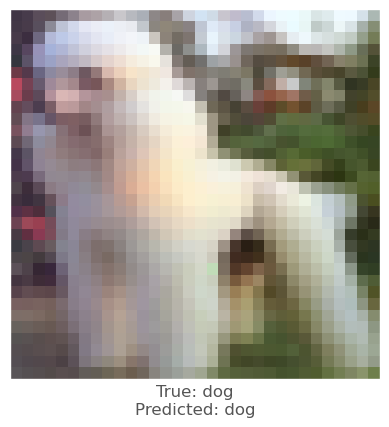



-0.0010650754
-0.0017544627
-0.0036351085
vr, vg, vb :   0.6835301070267344 0.3917088305482085 1.7468693386165104
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7200041
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7177327
row index :  2
16th round's confidence : 3th 0.7177327
predicted class :  dog
predicted class's confidence :  0.7177327
Lopt is :  12


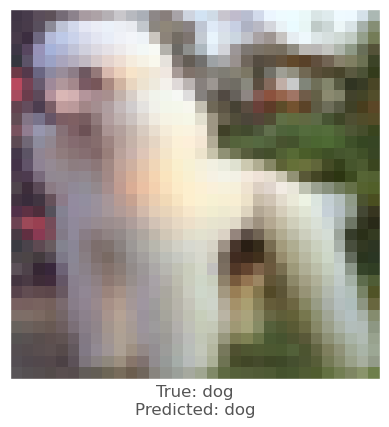



0.0034566522
-0.0022640228
-7.015467e-05
vr, vg, vb :   -1.1545899498251477 2.216427815211632 0.24208672561890768
beam_perturbed_confidence temp :  0.6371657
beam_perturbed_confidence temp :  0.6367163
beam_perturbed_confidence temp :  0.63895667
beam_perturbed_confidence temp :  0.6335238
beam_perturbed_confidence temp :  0.6371657
beam_perturbed_confidence temp :  0.6367163
beam_perturbed_confidence temp :  0.6335238
row index :  3
16th round's confidence : 4th 0.6335238
predicted class :  dog
predicted class's confidence :  0.6335238
Lopt is :  19


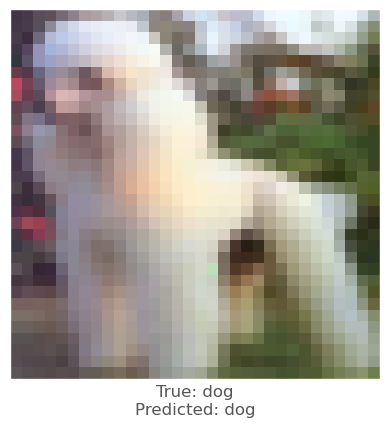



0.0005529523
-0.0051165223
-0.0023249388
vr, vg, vb :   -1.018136622000606 2.662426109842519 0.40990190958408856
beam_perturbed_confidence temp :  0.62833595
beam_perturbed_confidence temp :  0.62314606
beam_perturbed_confidence temp :  0.6271994
beam_perturbed_confidence temp :  0.6220624
beam_perturbed_confidence temp :  0.62833595
beam_perturbed_confidence temp :  0.62314606
beam_perturbed_confidence temp :  0.6220624
row index :  3
17th round's confidence : 0th 0.6220624
predicted class :  dog
predicted class's confidence :  0.6220624
Lopt is :  22


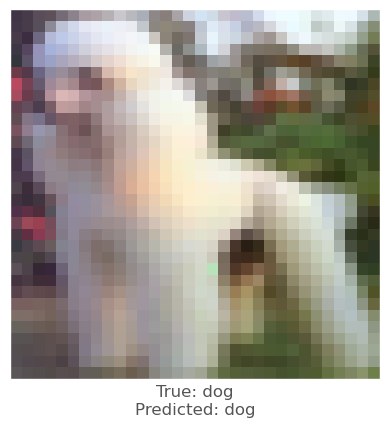



0.0025523305
-0.0015003085
0.00011628866
vr, vg, vb :   -0.9678699334515631 1.9902767220114983 -0.14129553144647636
beam_perturbed_confidence temp :  0.6440845
beam_perturbed_confidence temp :  0.6447229
beam_perturbed_confidence temp :  0.6454263
beam_perturbed_confidence temp :  0.64321566
beam_perturbed_confidence temp :  0.6456946
beam_perturbed_confidence temp :  0.64437413
beam_perturbed_confidence temp :  0.64360857
row index :  3
17th round's confidence : 1th 0.64321566
predicted class :  dog
predicted class's confidence :  0.64321566
Lopt is :  14


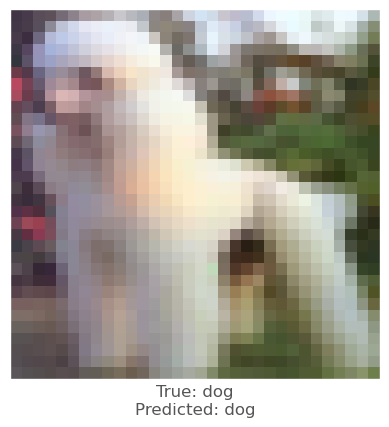



0.0023062825
-0.0024747849
-0.0009201169
vr, vg, vb :   -1.0701002173494483 1.9884890579357182 0.08436820656268593
beam_perturbed_confidence temp :  0.6408138
beam_perturbed_confidence temp :  0.6407937
beam_perturbed_confidence temp :  0.64178145
beam_perturbed_confidence temp :  0.63834065
beam_perturbed_confidence temp :  0.6408138
beam_perturbed_confidence temp :  0.6407937
beam_perturbed_confidence temp :  0.63834065
row index :  3
17th round's confidence : 2th 0.63834065
predicted class :  dog
predicted class's confidence :  0.63834065
Lopt is :  17


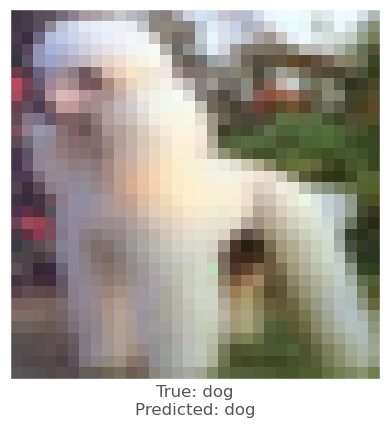



-0.0017997026
-0.0027644038
-0.0045767426
vr, vg, vb :   0.7951473607588755 0.6289783294971718 2.0298566696626965
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7128164
beam_perturbed_confidence temp :  0.7177327
beam_perturbed_confidence temp :  0.7128164
beam_perturbed_confidence temp :  0.7128164
beam_perturbed_confidence temp :  0.7128164
row index :  2
17th round's confidence : 3th 0.7128164
predicted class :  dog
predicted class's confidence :  0.7128164
Lopt is :  12


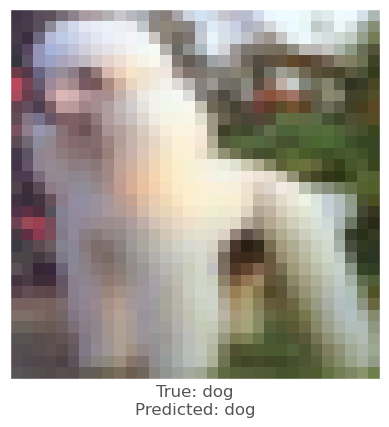



0.0022779107
-0.0030941367
-0.0005657077
vr, vg, vb :   -1.2669220257807434 2.3041987051839987 0.27444882141334015
beam_perturbed_confidence temp :  0.6317757
beam_perturbed_confidence temp :  0.63139933
beam_perturbed_confidence temp :  0.6335238
beam_perturbed_confidence temp :  0.62773293
beam_perturbed_confidence temp :  0.6317757
beam_perturbed_confidence temp :  0.63139933
beam_perturbed_confidence temp :  0.62773293
row index :  3
17th round's confidence : 4th 0.62773293
predicted class :  dog
predicted class's confidence :  0.62773293
Lopt is :  21


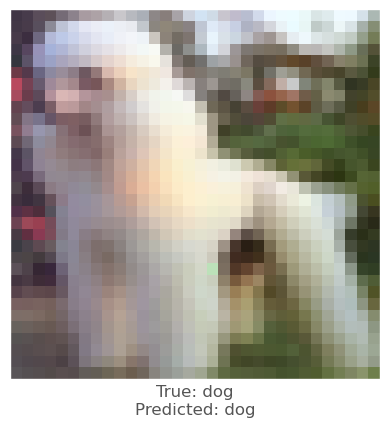



0.0001026988
-0.004447341
-0.00244838
vr, vg, vb :   -0.9265928400953453 2.840917595385367 0.6137497179695518
beam_perturbed_confidence temp :  0.62240136
beam_perturbed_confidence temp :  0.6183438
beam_perturbed_confidence temp :  0.6220624
beam_perturbed_confidence temp :  0.61784565
beam_perturbed_confidence temp :  0.62240136
beam_perturbed_confidence temp :  0.6183438
beam_perturbed_confidence temp :  0.61784565
row index :  3
18th round's confidence : 0th 0.61784565
predicted class :  dog
predicted class's confidence :  0.61784565
Lopt is :  24


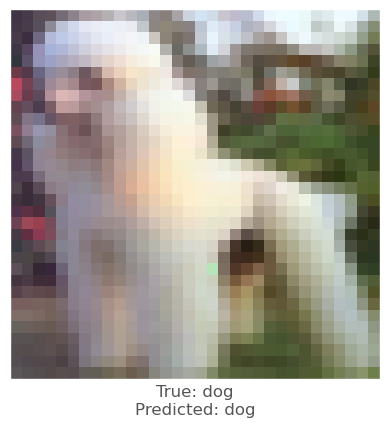



0.0023863316
-0.0016096234
-0.00016349554
vr, vg, vb :   -1.1097160959291608 1.952211393026291 -0.11081642423993907
beam_perturbed_confidence temp :  0.6429647
beam_perturbed_confidence temp :  0.6424749
beam_perturbed_confidence temp :  0.64360857
beam_perturbed_confidence temp :  0.64033705
beam_perturbed_confidence temp :  0.64439976
beam_perturbed_confidence temp :  0.6423028
beam_perturbed_confidence temp :  0.64186573
row index :  3
18th round's confidence : 1th 0.64033705
predicted class :  dog
predicted class's confidence :  0.64033705
Lopt is :  15


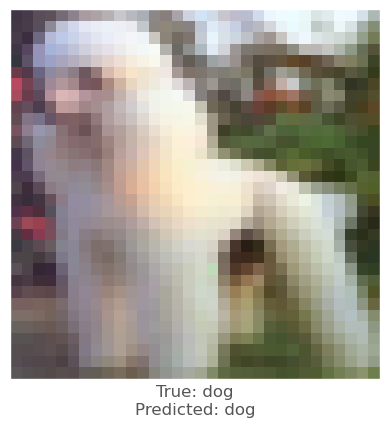



0.0008241534
-0.0041080117
-0.0024293065
vr, vg, vb :   -1.045505537945436 2.200441324398616 0.3188620366174769
beam_perturbed_confidence temp :  0.63882977
beam_perturbed_confidence temp :  0.635097
beam_perturbed_confidence temp :  0.63834065
beam_perturbed_confidence temp :  0.63360137
beam_perturbed_confidence temp :  0.63882977
beam_perturbed_confidence temp :  0.635097
beam_perturbed_confidence temp :  0.63360137
row index :  3
18th round's confidence : 2th 0.63360137
predicted class :  dog
predicted class's confidence :  0.63360137
Lopt is :  19


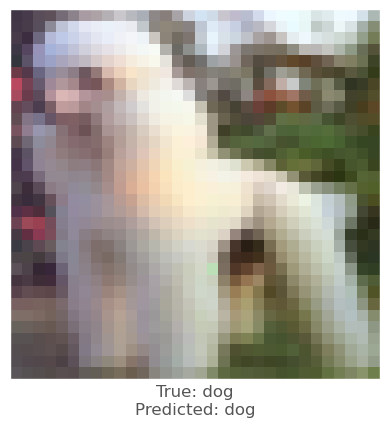



-0.002878189
-0.004165292
-0.0052558184
vr, vg, vb :   1.003451533374394 0.9826096751668394 2.3524528393968662
beam_perturbed_confidence temp :  0.7114828
beam_perturbed_confidence temp :  0.7128164
beam_perturbed_confidence temp :  0.707777
beam_perturbed_confidence temp :  0.7114828
beam_perturbed_confidence temp :  0.70678157
beam_perturbed_confidence temp :  0.707777
beam_perturbed_confidence temp :  0.70678157
row index :  4
18th round's confidence : 3th 0.70678157
predicted class :  dog
predicted class's confidence :  0.70678157
Lopt is :  12


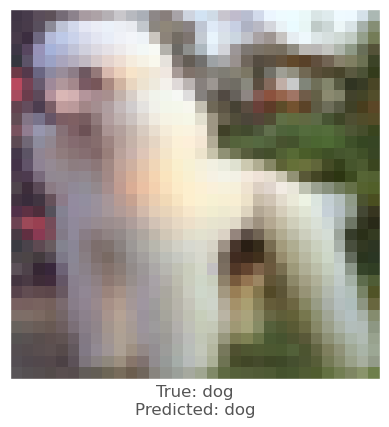



0.0025042892
-0.0032340288
-0.001636982
vr, vg, vb :   -1.3906587382264728 2.397181716287913 0.41070213568313896
beam_perturbed_confidence temp :  0.6260391
beam_perturbed_confidence temp :  0.6258813
beam_perturbed_confidence temp :  0.62773293
beam_perturbed_confidence temp :  0.622538
beam_perturbed_confidence temp :  0.6260391
beam_perturbed_confidence temp :  0.6258813
beam_perturbed_confidence temp :  0.622538
row index :  3
18th round's confidence : 4th 0.622538
predicted class :  dog
predicted class's confidence :  0.622538
Lopt is :  23


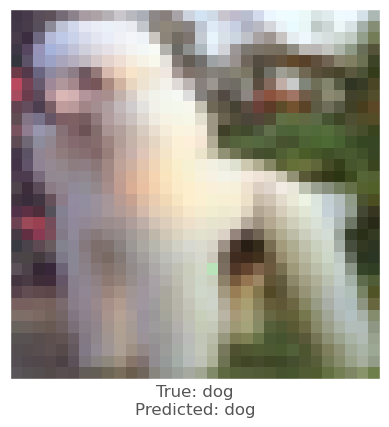



0.0003222227
-0.003490448
-0.0024809837
vr, vg, vb :   -0.8661558270513869 2.905870635651518 0.8004731195856826
beam_perturbed_confidence temp :  0.61802155
beam_perturbed_confidence temp :  0.6162384
beam_perturbed_confidence temp :  0.61784565
beam_perturbed_confidence temp :  0.6149465
beam_perturbed_confidence temp :  0.61802155
beam_perturbed_confidence temp :  0.6162384
beam_perturbed_confidence temp :  0.6149465
row index :  3
19th round's confidence : 0th 0.6149465
predicted class :  dog
predicted class's confidence :  0.6149465
Lopt is :  26


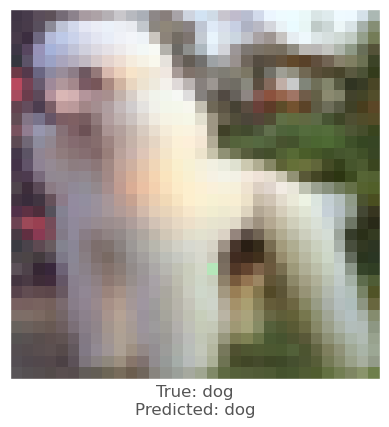



0.0003530383
-0.0044400096
-0.0021117926
vr, vg, vb :   -1.0340483174367086 2.200991213120024 0.11144447462326382
beam_perturbed_confidence temp :  0.6412204
beam_perturbed_confidence temp :  0.6374208
beam_perturbed_confidence temp :  0.64033705
beam_perturbed_confidence temp :  0.63606805
beam_perturbed_confidence temp :  0.6412204
beam_perturbed_confidence temp :  0.6374208
beam_perturbed_confidence temp :  0.63606805
row index :  3
19th round's confidence : 1th 0.63606805
predicted class :  dog
predicted class's confidence :  0.63606805
Lopt is :  17


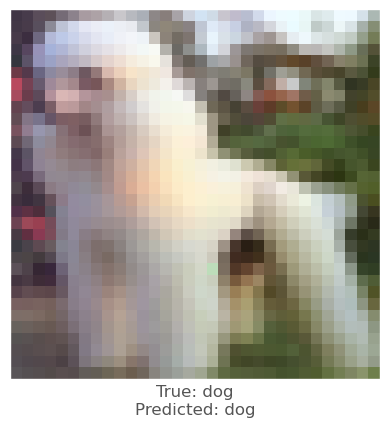



0.0012806654
-0.0044550896
-0.0025723577
vr, vg, vb :   -1.0690215239152967 2.4259061488679343 0.5442115984128826
beam_perturbed_confidence temp :  0.6331756
beam_perturbed_confidence temp :  0.6300236
beam_perturbed_confidence temp :  0.63360137
beam_perturbed_confidence temp :  0.6275311
beam_perturbed_confidence temp :  0.6331756
beam_perturbed_confidence temp :  0.6300236
beam_perturbed_confidence temp :  0.6275311
row index :  3
19th round's confidence : 2th 0.6275311
predicted class :  dog
predicted class's confidence :  0.6275311
Lopt is :  21


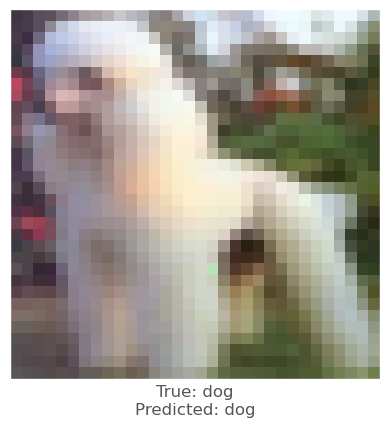



-0.0018459558
-0.0035412312
-0.0043839216
vr, vg, vb :   1.0877019649063393 1.2384718231897063 2.555599717780178
beam_perturbed_confidence temp :  0.70593107
beam_perturbed_confidence temp :  0.7047202
beam_perturbed_confidence temp :  0.70199054
beam_perturbed_confidence temp :  0.7028507
beam_perturbed_confidence temp :  0.6993882
beam_perturbed_confidence temp :  0.6987759
beam_perturbed_confidence temp :  0.69613546
row index :  6
19th round's confidence : 3th 0.69613546
predicted class :  dog
predicted class's confidence :  0.69613546
Lopt is :  11


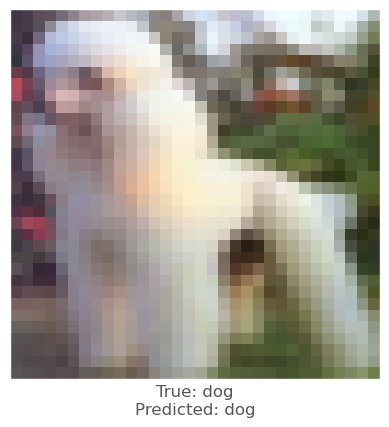



0.0022857785
-0.0024468303
-0.0013112426
vr, vg, vb :   -1.480170716652971 2.402146571926578 0.5007561801562069
beam_perturbed_confidence temp :  0.6213783
beam_perturbed_confidence temp :  0.62151325
beam_perturbed_confidence temp :  0.622538
beam_perturbed_confidence temp :  0.6184379
beam_perturbed_confidence temp :  0.6213783
beam_perturbed_confidence temp :  0.62151325
beam_perturbed_confidence temp :  0.6184379
row index :  3
19th round's confidence : 4th 0.6184379
predicted class :  dog
predicted class's confidence :  0.6184379
Lopt is :  25


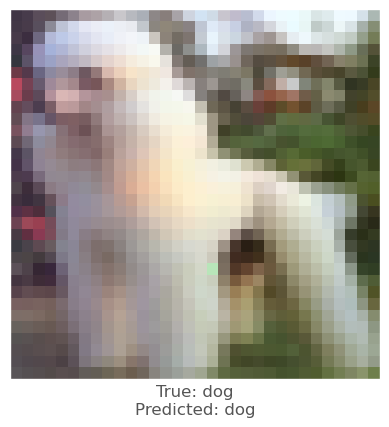



0.0019845963
-0.0014167428
-0.0017834902
vr, vg, vb :   -0.9779998695903889 2.756957852252992 0.8987748257240381
beam_perturbed_confidence temp :  0.6142538
beam_perturbed_confidence temp :  0.61478484
beam_perturbed_confidence temp :  0.6149465
beam_perturbed_confidence temp :  0.6128366
beam_perturbed_confidence temp :  0.6142538
beam_perturbed_confidence temp :  0.61478484
beam_perturbed_confidence temp :  0.6128366
row index :  3
20th round's confidence : 0th 0.6128366
predicted class :  dog
predicted class's confidence :  0.6128366
Lopt is :  28


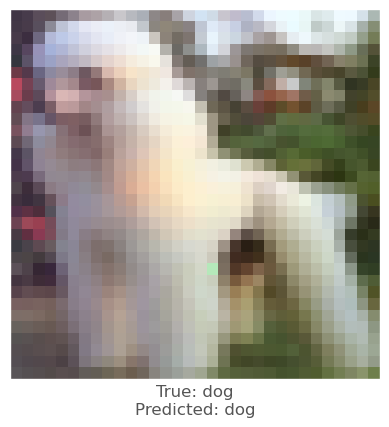



0.0005787015
-0.0040913224
-0.0014215708
vr, vg, vb :   -0.9885136353054644 2.3900243340107803 0.24245710495024408
beam_perturbed_confidence temp :  0.6358579
beam_perturbed_confidence temp :  0.63210636
beam_perturbed_confidence temp :  0.63606805
beam_perturbed_confidence temp :  0.63122725
beam_perturbed_confidence temp :  0.6358579
beam_perturbed_confidence temp :  0.63210636
beam_perturbed_confidence temp :  0.63122725
row index :  3
20th round's confidence : 1th 0.63122725
predicted class :  dog
predicted class's confidence :  0.63122725
Lopt is :  19


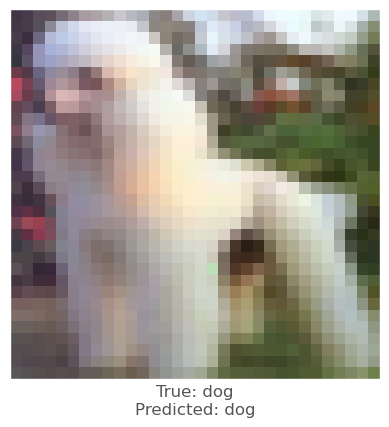



0.0015593171
-0.0040364265
-0.0024018884
vr, vg, vb :   -1.1180510827206664 2.5869581884000863 0.7299792756229859
beam_perturbed_confidence temp :  0.6279168
beam_perturbed_confidence temp :  0.62447184
beam_perturbed_confidence temp :  0.6275311
beam_perturbed_confidence temp :  0.622978
beam_perturbed_confidence temp :  0.6279168
beam_perturbed_confidence temp :  0.62447184
beam_perturbed_confidence temp :  0.622978
row index :  3
20th round's confidence : 2th 0.622978
predicted class :  dog
predicted class's confidence :  0.622978
Lopt is :  23


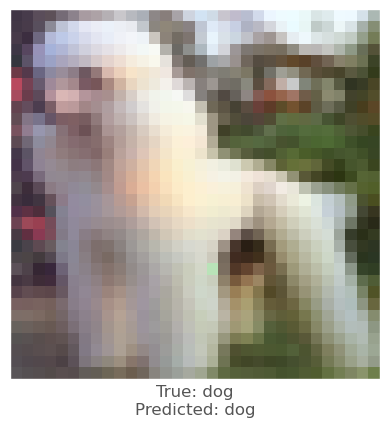



-0.0049881935
-0.0067979693
-0.005538404
vr, vg, vb :   1.4777511196119946 1.7944215749985433 2.853880144790612
beam_perturbed_confidence temp :  0.6937877
beam_perturbed_confidence temp :  0.69259024
beam_perturbed_confidence temp :  0.6907454
beam_perturbed_confidence temp :  0.6902806
beam_perturbed_confidence temp :  0.68823564
beam_perturbed_confidence temp :  0.6876163
beam_perturbed_confidence temp :  0.68546176
row index :  6
20th round's confidence : 3th 0.68546176
predicted class :  dog
predicted class's confidence :  0.68546176
Lopt is :  10


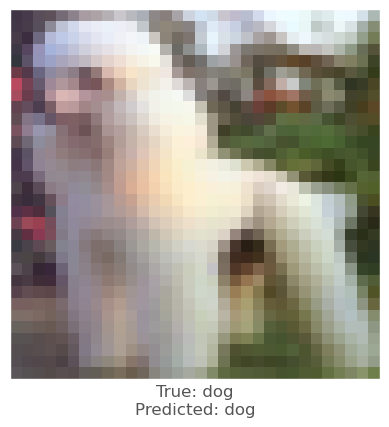



0.002206862
-0.0009648204
-0.0013112426
vr, vg, vb :   -1.5528398422685576 2.2584139532318455 0.5818048201819681
beam_perturbed_confidence temp :  0.61731505
beam_perturbed_confidence temp :  0.618528
beam_perturbed_confidence temp :  0.6184379
beam_perturbed_confidence temp :  0.6154602
beam_perturbed_confidence temp :  0.61731505
beam_perturbed_confidence temp :  0.618528
beam_perturbed_confidence temp :  0.6154602
row index :  3
20th round's confidence : 4th 0.6154602
predicted class :  dog
predicted class's confidence :  0.6154602
Lopt is :  27


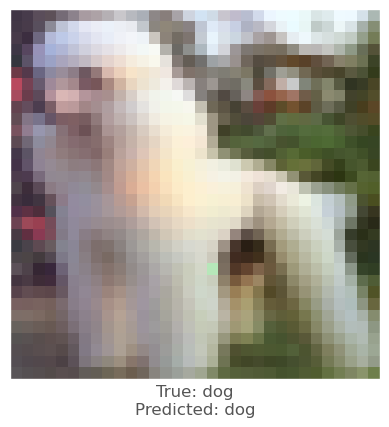



0.0029597878
-0.00052148104
-0.0010207295
vr, vg, vb :   -1.1761786671925072 2.533410170741682 0.9109702973294908
beam_perturbed_confidence temp :  0.6105694
beam_perturbed_confidence temp :  0.61327046
beam_perturbed_confidence temp :  0.6128366
beam_perturbed_confidence temp :  0.60940605
beam_perturbed_confidence temp :  0.6105694
beam_perturbed_confidence temp :  0.61327046
beam_perturbed_confidence temp :  0.60940605
row index :  3
21th round's confidence : 0th 0.60940605
predicted class :  dog
predicted class's confidence :  0.60940605
Lopt is :  30


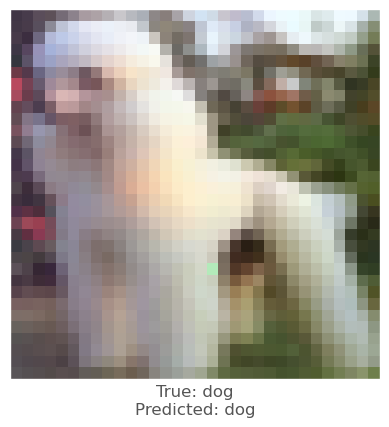



0.0018715858
-0.0046411753
-0.0009736419
vr, vg, vb :   -1.0768208563696446 2.615139427617759 0.31557558169582023
beam_perturbed_confidence temp :  0.6301792
beam_perturbed_confidence temp :  0.6271621
beam_perturbed_confidence temp :  0.63122725
beam_perturbed_confidence temp :  0.6250627
beam_perturbed_confidence temp :  0.6301792
beam_perturbed_confidence temp :  0.6271621
beam_perturbed_confidence temp :  0.6250627
row index :  3
21th round's confidence : 1th 0.6250627
predicted class :  dog
predicted class's confidence :  0.6250627
Lopt is :  21


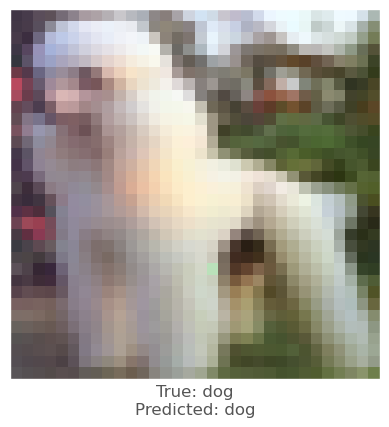



0.0006406903
-0.003985882
-0.0024633408
vr, vg, vb :   -1.0703150071176672 2.72685055010207 0.9033154239884217
beam_perturbed_confidence temp :  0.62344766
beam_perturbed_confidence temp :  0.6201297
beam_perturbed_confidence temp :  0.622978
beam_perturbed_confidence temp :  0.6187434
beam_perturbed_confidence temp :  0.62344766
beam_perturbed_confidence temp :  0.6201297
beam_perturbed_confidence temp :  0.6187434
row index :  3
21th round's confidence : 2th 0.6187434
predicted class :  dog
predicted class's confidence :  0.6187434
Lopt is :  25


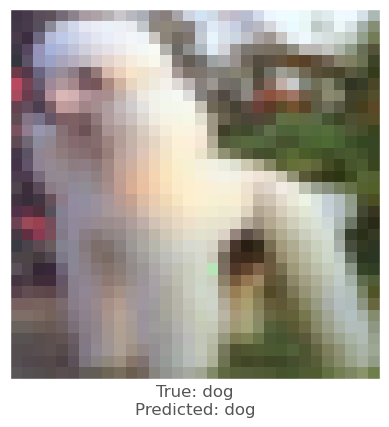



-0.0038818717
-0.005541146
-0.00435853
vr, vg, vb :   1.7181631776794817 2.169093997653108 3.0043451347671173
beam_perturbed_confidence temp :  0.6837344
beam_perturbed_confidence temp :  0.6811581
beam_perturbed_confidence temp :  0.6825219
beam_perturbed_confidence temp :  0.67955786
beam_perturbed_confidence temp :  0.6808475
beam_perturbed_confidence temp :  0.6769342
beam_perturbed_confidence temp :  0.67453104
row index :  6
21th round's confidence : 3th 0.67453104
predicted class :  dog
predicted class's confidence :  0.67453104
Lopt is :  11


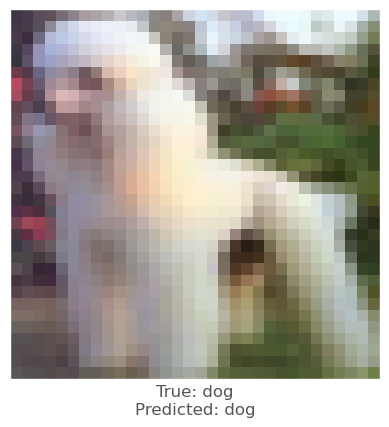



0.0027506351
-0.0007841587
-0.0014382005
vr, vg, vb :   -1.6726193727511747 2.110988428575165 0.6674443855423113
beam_perturbed_confidence temp :  0.61361814
beam_perturbed_confidence temp :  0.61546564
beam_perturbed_confidence temp :  0.6154602
beam_perturbed_confidence temp :  0.61174023
beam_perturbed_confidence temp :  0.61361814
beam_perturbed_confidence temp :  0.61546564
beam_perturbed_confidence temp :  0.61174023
row index :  3
21th round's confidence : 4th 0.61174023
predicted class :  dog
predicted class's confidence :  0.61174023
Lopt is :  29


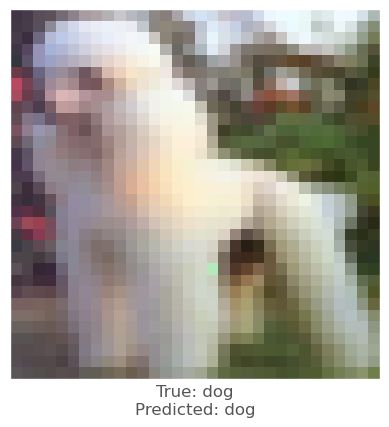



0.0029649138
-0.00038945675
-0.0009278059
vr, vg, vb :   -1.355052184979482 2.319014828563754 0.9126538576539147
beam_perturbed_confidence temp :  0.6072531
beam_perturbed_confidence temp :  0.61025965
beam_perturbed_confidence temp :  0.60940605
beam_perturbed_confidence temp :  0.6066599
beam_perturbed_confidence temp :  0.6072531
beam_perturbed_confidence temp :  0.61025965
beam_perturbed_confidence temp :  0.6066599
row index :  3
22th round's confidence : 0th 0.6066599
predicted class :  dog
predicted class's confidence :  0.6066599
Lopt is :  32


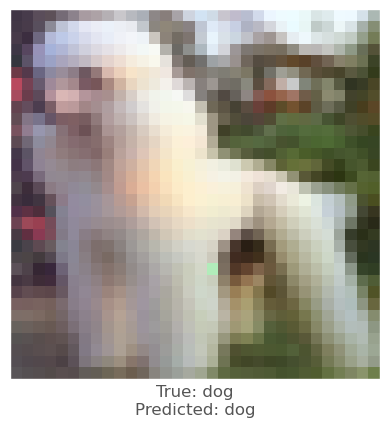



0.0013594627
-0.0040533543
-0.002133131
vr, vg, vb :   -1.1050850445363911 2.75896091118655 0.4973311262484062
beam_perturbed_confidence temp :  0.62459457
beam_perturbed_confidence temp :  0.6218504
beam_perturbed_confidence temp :  0.6250627
beam_perturbed_confidence temp :  0.6201472
beam_perturbed_confidence temp :  0.62459457
beam_perturbed_confidence temp :  0.6218504
beam_perturbed_confidence temp :  0.6201472
row index :  3
22th round's confidence : 1th 0.6201472
predicted class :  dog
predicted class's confidence :  0.6201472
Lopt is :  23


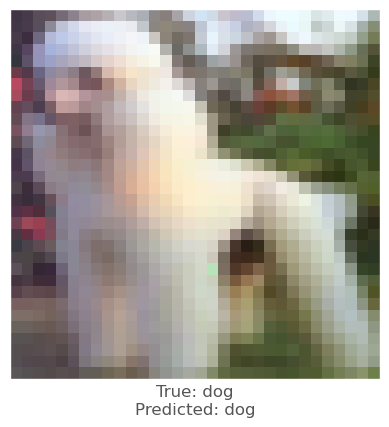



0.00061130524
-0.0025945306
-0.0024120212
vr, vg, vb :   -1.024414030087541 2.7136185533346606 1.0541859976021528
beam_perturbed_confidence temp :  0.61968976
beam_perturbed_confidence temp :  0.6172959
beam_perturbed_confidence temp :  0.617508
beam_perturbed_confidence temp :  0.61487085
beam_perturbed_confidence temp :  0.61790794
beam_perturbed_confidence temp :  0.6169352
beam_perturbed_confidence temp :  0.61418456
row index :  6
22th round's confidence : 2th 0.61418456
predicted class :  dog
predicted class's confidence :  0.61418456
Lopt is :  27


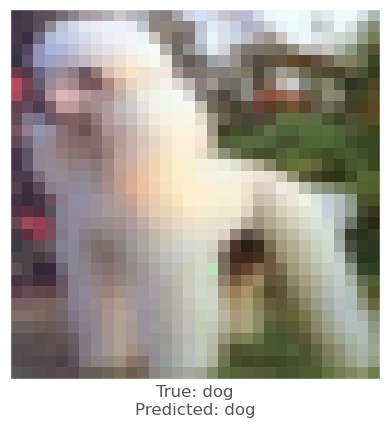



-0.0031576753
-0.0038725138
-0.0019093752
vr, vg, vb :   1.8621143865381204 2.33943597499351 2.894848140363892
beam_perturbed_confidence temp :  0.6737765
beam_perturbed_confidence temp :  0.6742421
beam_perturbed_confidence temp :  0.674082
beam_perturbed_confidence temp :  0.6751045
beam_perturbed_confidence temp :  0.67453283
beam_perturbed_confidence temp :  0.6762161
beam_perturbed_confidence temp :  0.6783159
row index :  0
22th round's confidence : 3th 0.6737765
predicted class :  dog
predicted class's confidence :  0.6737765
Lopt is :  11


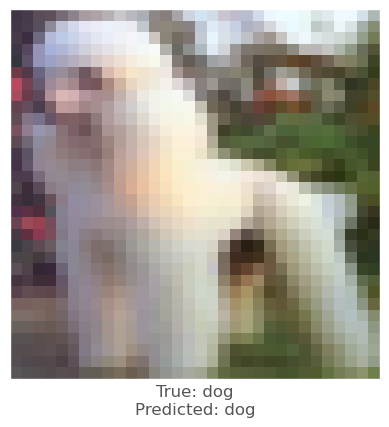



0.0031128526
-0.00077056885
-0.0011530519
vr, vg, vb :   -1.8166426928155348 1.9769464704832735 0.7160051323060734
beam_perturbed_confidence temp :  0.609959
beam_perturbed_confidence temp :  0.611556
beam_perturbed_confidence temp :  0.61174023
beam_perturbed_confidence temp :  0.60868627
beam_perturbed_confidence temp :  0.609959
beam_perturbed_confidence temp :  0.611556
beam_perturbed_confidence temp :  0.60868627
row index :  3
22th round's confidence : 4th 0.60868627
predicted class :  dog
predicted class's confidence :  0.60868627
Lopt is :  30


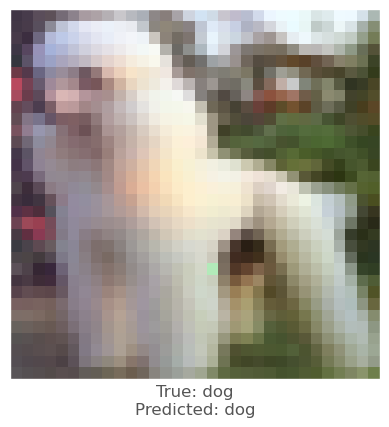



0.0026571155
0.00048023462
-0.0011620522
vr, vg, vb :   -1.4852585124257478 2.0390898834118465 0.9375936873426248
beam_perturbed_confidence temp :  0.6046268
beam_perturbed_confidence temp :  0.6088401
beam_perturbed_confidence temp :  0.6066599
beam_perturbed_confidence temp :  0.60447717
beam_perturbed_confidence temp :  0.6046268
beam_perturbed_confidence temp :  0.6088401
beam_perturbed_confidence temp :  0.60447717
row index :  3
23th round's confidence : 0th 0.60447717
predicted class :  dog
predicted class's confidence :  0.60447717
Lopt is :  34


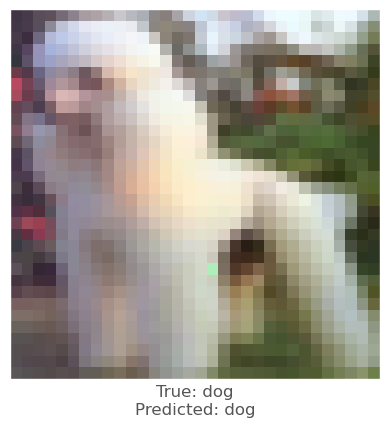



0.00056767464
-0.0037186146
-0.0025178194
vr, vg, vb :   -1.051344003766834 2.854926277892602 0.6993799540837706
beam_perturbed_confidence temp :  0.62043846
beam_perturbed_confidence temp :  0.61795604
beam_perturbed_confidence temp :  0.6201472
beam_perturbed_confidence temp :  0.6160656
beam_perturbed_confidence temp :  0.62043846
beam_perturbed_confidence temp :  0.61795604
beam_perturbed_confidence temp :  0.6160656
row index :  3
23th round's confidence : 1th 0.6160656
predicted class :  dog
predicted class's confidence :  0.6160656
Lopt is :  25


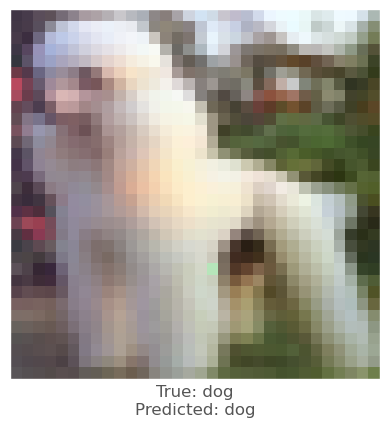



0.0018420815
-0.0020891428
-0.0014415383
vr, vg, vb :   -1.1061807817571316 2.6511709779389387 1.0929212312312198
beam_perturbed_confidence temp :  0.61424565
beam_perturbed_confidence temp :  0.6133809
beam_perturbed_confidence temp :  0.6134293
beam_perturbed_confidence temp :  0.61026806
beam_perturbed_confidence temp :  0.6124632
beam_perturbed_confidence temp :  0.6129078
beam_perturbed_confidence temp :  0.60987365
row index :  6
23th round's confidence : 2th 0.60987365
predicted class :  dog
predicted class's confidence :  0.60987365
Lopt is :  29


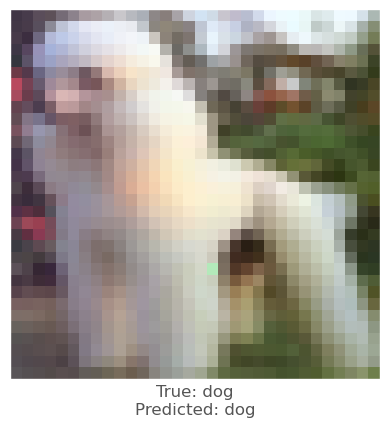



0.00038939714
-0.0009510517
-0.0006889701
vr, vg, vb :   1.6369632334525457 2.2005975486977722 2.674260335223377
beam_perturbed_confidence temp :  0.67492044
beam_perturbed_confidence temp :  0.6751045
beam_perturbed_confidence temp :  0.67453283
beam_perturbed_confidence temp :  0.6765944
beam_perturbed_confidence temp :  0.6767802
beam_perturbed_confidence temp :  0.6783159
beam_perturbed_confidence temp :  0.67971504
row index :  2
23th round's confidence : 3th 0.67453283
predicted class :  dog
predicted class's confidence :  0.67453283
Lopt is :  13


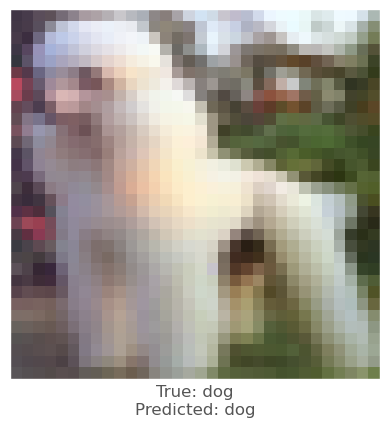



0.0013456941
-0.001454711
-0.0015337467
vr, vg, vb :   -1.7695478300433807 1.9247229194737645 0.7977792910115012
beam_perturbed_confidence temp :  0.6088905
beam_perturbed_confidence temp :  0.6085043
beam_perturbed_confidence temp :  0.60868627
beam_perturbed_confidence temp :  0.60719293
beam_perturbed_confidence temp :  0.6088905
beam_perturbed_confidence temp :  0.6085043
beam_perturbed_confidence temp :  0.60719293
row index :  3
23th round's confidence : 4th 0.60719293
predicted class :  dog
predicted class's confidence :  0.60719293
Lopt is :  31


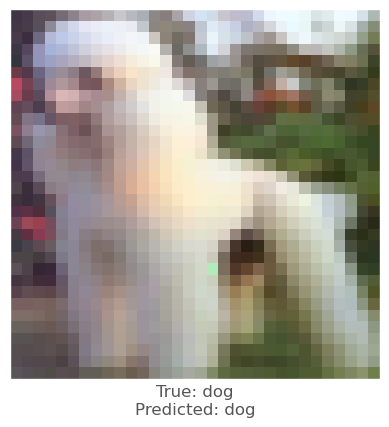



0.0036312342
0.002244234
-0.0011147261
vr, vg, vb :   -1.699856078083808 1.610757486562361 0.9553069252672979
beam_perturbed_confidence temp :  0.60250586
beam_perturbed_confidence temp :  0.60609245
beam_perturbed_confidence temp :  0.60447717
beam_perturbed_confidence temp :  0.6026043
beam_perturbed_confidence temp :  0.60250586
beam_perturbed_confidence temp :  0.60609245
beam_perturbed_confidence temp :  0.6026043
row index :  0
24th round's confidence : 0th 0.60250586
predicted class :  dog
predicted class's confidence :  0.60250586
Lopt is :  34


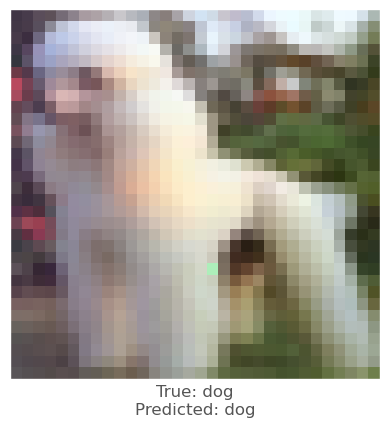



0.0004721284
-0.0030750632
-0.0024155974
vr, vg, vb :   -0.9934224425167375 2.8769399729640597 0.8710017025566191
beam_perturbed_confidence temp :  0.61607236
beam_perturbed_confidence temp :  0.6146489
beam_perturbed_confidence temp :  0.6160656
beam_perturbed_confidence temp :  0.6134293
beam_perturbed_confidence temp :  0.61607236
beam_perturbed_confidence temp :  0.6146489
beam_perturbed_confidence temp :  0.6134293
row index :  3
24th round's confidence : 1th 0.6134293
predicted class :  dog
predicted class's confidence :  0.6134293
Lopt is :  27


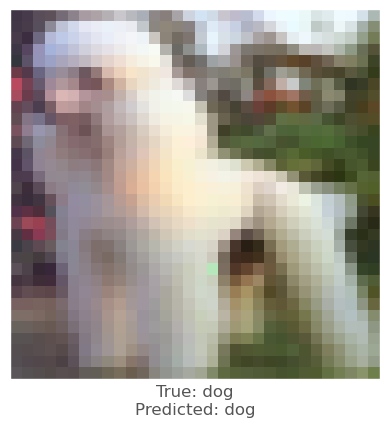



0.0023916364
-0.0011633635
-0.0009433627
vr, vg, vb :   -1.2347263407426734 2.5023902258176522 1.0779653793941084
beam_perturbed_confidence temp :  0.60893816
beam_perturbed_confidence temp :  0.6094842
beam_perturbed_confidence temp :  0.6093247
beam_perturbed_confidence temp :  0.60667807
beam_perturbed_confidence temp :  0.60768676
beam_perturbed_confidence temp :  0.60910696
beam_perturbed_confidence temp :  0.6061464
row index :  6
24th round's confidence : 2th 0.6061464
predicted class :  dog
predicted class's confidence :  0.6061464
Lopt is :  31


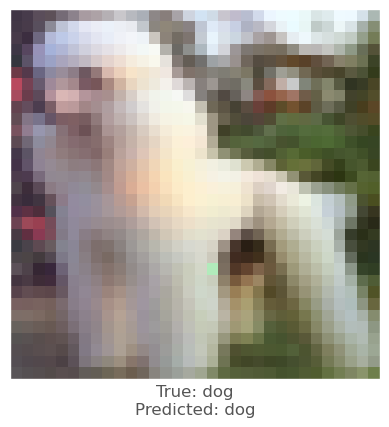



0.0026982427
0.0019364357
0.0020659566
vr, vg, vb :   1.2034426436735752 1.786894223881706 2.2002386424450577
beam_perturbed_confidence temp :  0.6767802
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.6787769
beam_perturbed_confidence temp :  0.6787816
beam_perturbed_confidence temp :  0.6817337
beam_perturbed_confidence temp :  0.6814035
beam_perturbed_confidence temp :  0.682928
row index :  1
24th round's confidence : 3th 0.67632926
predicted class :  dog
predicted class's confidence :  0.67632926
Lopt is :  13


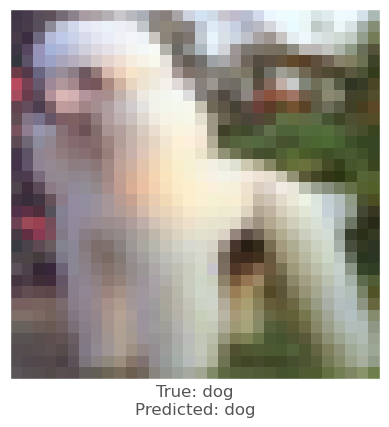



8.881092e-05
-0.0025966763
-0.0025547147
vr, vg, vb :   -1.6014741391105758 1.9919182624903773 0.9734728298821529
beam_perturbed_confidence temp :  0.60813284
beam_perturbed_confidence temp :  0.6062938
beam_perturbed_confidence temp :  0.60719293
beam_perturbed_confidence temp :  0.60628843
beam_perturbed_confidence temp :  0.60813284
beam_perturbed_confidence temp :  0.6062938
beam_perturbed_confidence temp :  0.60628843
row index :  3
24th round's confidence : 4th 0.60628843
predicted class :  dog
predicted class's confidence :  0.60628843
Lopt is :  32


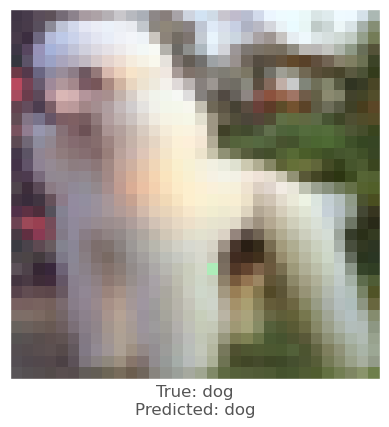



0.0006940365
-0.0008789897
-0.0035245419
vr, vg, vb :   -1.599274118651892 1.5375807075563936 1.212230418226408
beam_perturbed_confidence temp :  0.60175097
beam_perturbed_confidence temp :  0.6026043
beam_perturbed_confidence temp :  0.60060906
beam_perturbed_confidence temp :  0.6012348
beam_perturbed_confidence temp :  0.599733
beam_perturbed_confidence temp :  0.6011863
beam_perturbed_confidence temp :  0.59953845
row index :  6
25th round's confidence : 0th 0.59953845
predicted class :  dog
predicted class's confidence :  0.59953845
Lopt is :  35


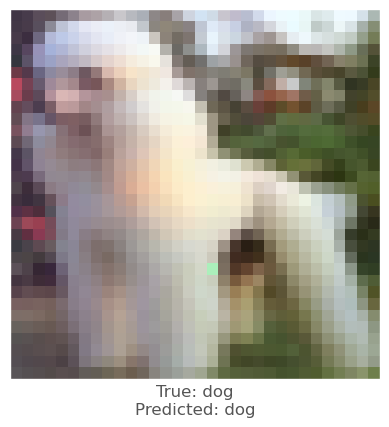



0.0021514893
-0.0014172196
-0.0014749169
vr, vg, vb :   -1.1092291240463137 2.7309679395501 0.9313932257976614
beam_perturbed_confidence temp :  0.6124632
beam_perturbed_confidence temp :  0.6129078
beam_perturbed_confidence temp :  0.6134293
beam_perturbed_confidence temp :  0.60987365
beam_perturbed_confidence temp :  0.6124632
beam_perturbed_confidence temp :  0.6129078
beam_perturbed_confidence temp :  0.60987365
row index :  3
25th round's confidence : 1th 0.60987365
predicted class :  dog
predicted class's confidence :  0.60987365
Lopt is :  29


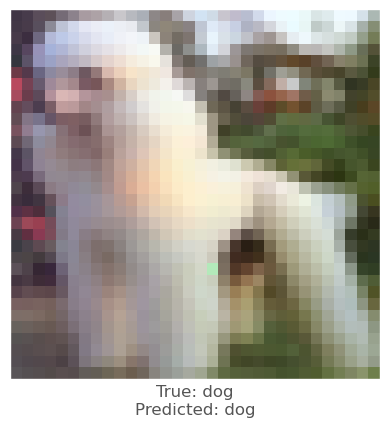



0.0025428534
-0.000605464
-0.0015542507
vr, vg, vb :   -1.3655390422091775 2.312697601398729 1.1255939131710062
beam_perturbed_confidence temp :  0.6042589
beam_perturbed_confidence temp :  0.6068523
beam_perturbed_confidence temp :  0.6051238
beam_perturbed_confidence temp :  0.60305315
beam_perturbed_confidence temp :  0.6024902
beam_perturbed_confidence temp :  0.60667324
beam_perturbed_confidence temp :  0.6020839
row index :  6
25th round's confidence : 2th 0.6020839
predicted class :  dog
predicted class's confidence :  0.6020839
Lopt is :  33


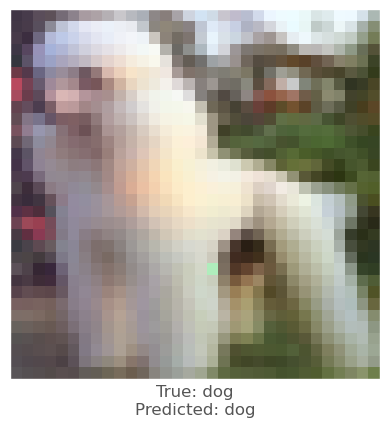



0.0041859746
0.0037830472
0.00396204
vr, vg, vb :   0.6645009195131268 1.2299000815686087 1.5840107834495754
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.6783159
beam_perturbed_confidence temp :  0.67875504
beam_perturbed_confidence temp :  0.6783159
beam_perturbed_confidence temp :  0.67875504
beam_perturbed_confidence temp :  0.6801335
beam_perturbed_confidence temp :  0.6801335
row index :  0
25th round's confidence : 3th 0.67632926
predicted class :  dog
predicted class's confidence :  0.67632926
Lopt is :  13


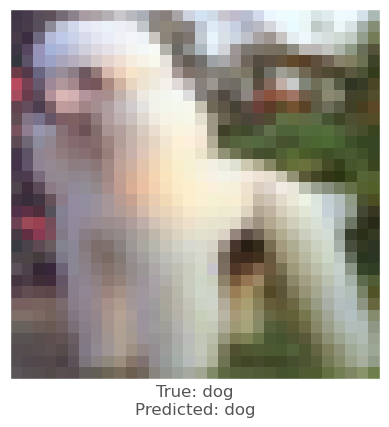



-0.00074768066
-0.0033809543
-0.0029854178
vr, vg, vb :   -1.3665586587932683 2.130821862800788 1.1746673311804368
beam_perturbed_confidence temp :  0.60693526
beam_perturbed_confidence temp :  0.60428756
beam_perturbed_confidence temp :  0.6046574
beam_perturbed_confidence temp :  0.6039027
beam_perturbed_confidence temp :  0.6049424
beam_perturbed_confidence temp :  0.6029492
beam_perturbed_confidence temp :  0.60225517
row index :  6
25th round's confidence : 4th 0.60225517
predicted class :  dog
predicted class's confidence :  0.60225517
Lopt is :  34


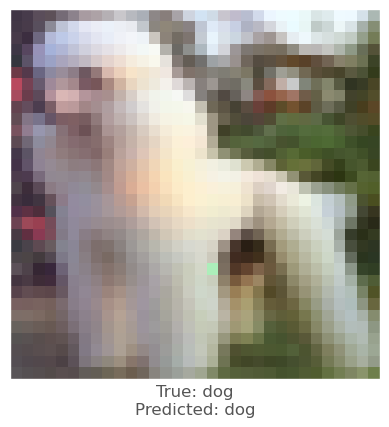



0.0013219714
-5.477667e-05
-0.0036386847
vr, vg, vb :   -1.5715438484340416 1.3893003036556126 1.4548758513640945
beam_perturbed_confidence temp :  0.59846735
beam_perturbed_confidence temp :  0.5996782
beam_perturbed_confidence temp :  0.5975961
beam_perturbed_confidence temp :  0.59788626
beam_perturbed_confidence temp :  0.59619445
beam_perturbed_confidence temp :  0.59768254
beam_perturbed_confidence temp :  0.59608275
row index :  6
26th round's confidence : 0th 0.59608275
predicted class :  dog
predicted class's confidence :  0.59608275
Lopt is :  36


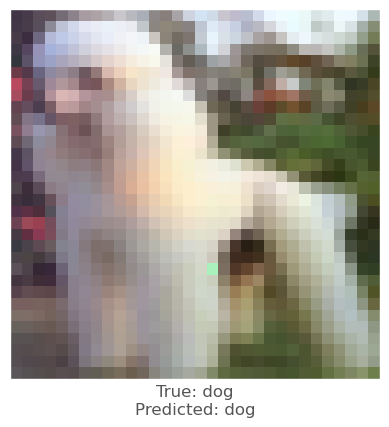



0.0023916364
-0.0011633635
-0.0009433627
vr, vg, vb :   -1.2374698488029372 2.5742074912676975 0.932590174503906
beam_perturbed_confidence temp :  0.60893816
beam_perturbed_confidence temp :  0.6094842
beam_perturbed_confidence temp :  0.60987365
beam_perturbed_confidence temp :  0.60667807
beam_perturbed_confidence temp :  0.60893816
beam_perturbed_confidence temp :  0.6094842
beam_perturbed_confidence temp :  0.60667807
row index :  3
26th round's confidence : 1th 0.60667807
predicted class :  dog
predicted class's confidence :  0.60667807
Lopt is :  31


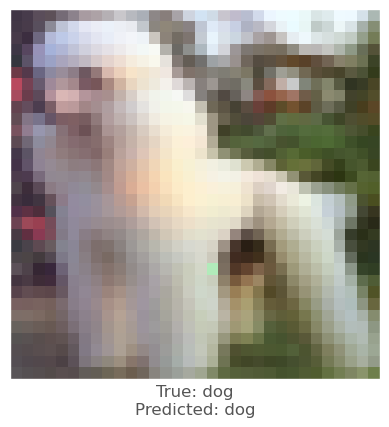



0.0039340258
0.0013007522
-0.0019748807
vr, vg, vb :   -1.6223877144347931 1.951352624965521 1.2105225913882074
beam_perturbed_confidence temp :  0.59924
beam_perturbed_confidence temp :  0.6033195
beam_perturbed_confidence temp :  0.6010783
beam_perturbed_confidence temp :  0.5988652
beam_perturbed_confidence temp :  0.5971883
beam_perturbed_confidence temp :  0.6027386
beam_perturbed_confidence temp :  0.5977467
row index :  4
26th round's confidence : 2th 0.5971883
predicted class :  dog
predicted class's confidence :  0.5971883
Lopt is :  33


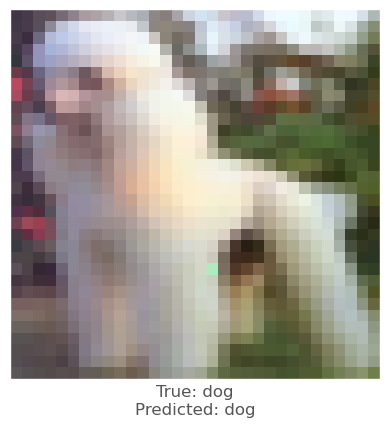



0.0041859746
0.0037830472
0.00396204
vr, vg, vb :   0.17945336776872334 0.7286053534868211 1.0294057103536414
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67875504
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67875504
beam_perturbed_confidence temp :  0.67875504
beam_perturbed_confidence temp :  0.67875504
row index :  0
26th round's confidence : 3th 0.67632926
predicted class :  dog
predicted class's confidence :  0.67632926
Lopt is :  13


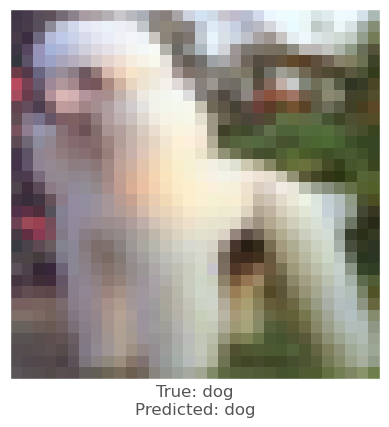



0.0007548928
-0.0013192892
-0.0036590695
vr, vg, vb :   -1.3053920755219737 2.0496685972665585 1.4231075518740386
beam_perturbed_confidence temp :  0.6016954
beam_perturbed_confidence temp :  0.60237217
beam_perturbed_confidence temp :  0.6002436
beam_perturbed_confidence temp :  0.60064375
beam_perturbed_confidence temp :  0.599697
beam_perturbed_confidence temp :  0.6007231
beam_perturbed_confidence temp :  0.59914595
row index :  6
26th round's confidence : 4th 0.59914595
predicted class :  dog
predicted class's confidence :  0.59914595
Lopt is :  36


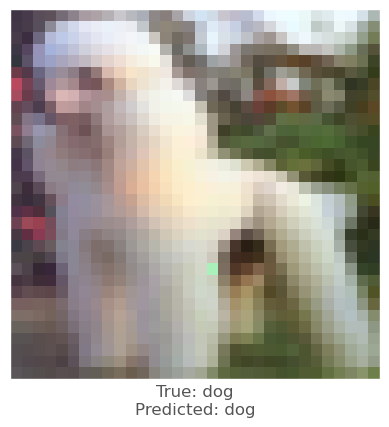



0.0023550391
-3.796816e-05
-0.0034554005
vr, vg, vb :   -1.6498933755626835 1.2541670891622438 1.6549283129195795
beam_perturbed_confidence temp :  0.59446687
beam_perturbed_confidence temp :  0.5961565
beam_perturbed_confidence temp :  0.59443086
beam_perturbed_confidence temp :  0.5939491
beam_perturbed_confidence temp :  0.59258616
beam_perturbed_confidence temp :  0.59404695
beam_perturbed_confidence temp :  0.5925778
row index :  6
27th round's confidence : 0th 0.5925778
predicted class :  dog
predicted class's confidence :  0.5925778
Lopt is :  37


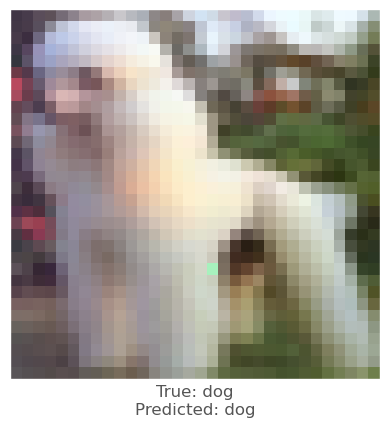



0.002054453
-0.0005931854
-0.0013602376
vr, vg, vb :   -1.31916815353446 2.3761052846213966 0.9753549168954344
beam_perturbed_confidence temp :  0.6058851
beam_perturbed_confidence temp :  0.6071583
beam_perturbed_confidence temp :  0.60667807
beam_perturbed_confidence temp :  0.6038482
beam_perturbed_confidence temp :  0.6058851
beam_perturbed_confidence temp :  0.6071583
beam_perturbed_confidence temp :  0.6038482
row index :  3
27th round's confidence : 1th 0.6038482
predicted class :  dog
predicted class's confidence :  0.6038482
Lopt is :  33


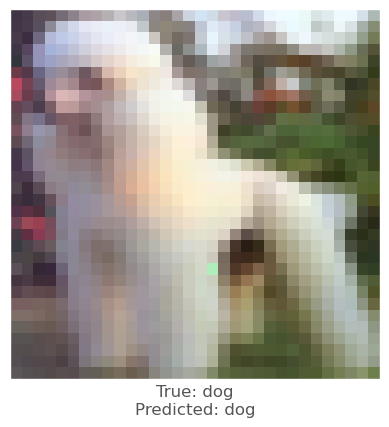



0.00219661
-0.0004120469
-0.003142178
vr, vg, vb :   -1.679809940382061 1.7974220534021965 1.4036881381118134
beam_perturbed_confidence temp :  0.5965476
beam_perturbed_confidence temp :  0.5977467
beam_perturbed_confidence temp :  0.5960978
beam_perturbed_confidence temp :  0.59561706
beam_perturbed_confidence temp :  0.5945783
beam_perturbed_confidence temp :  0.59680474
beam_perturbed_confidence temp :  0.59408784
row index :  6
27th round's confidence : 2th 0.59408784
predicted class :  dog
predicted class's confidence :  0.59408784
Lopt is :  34


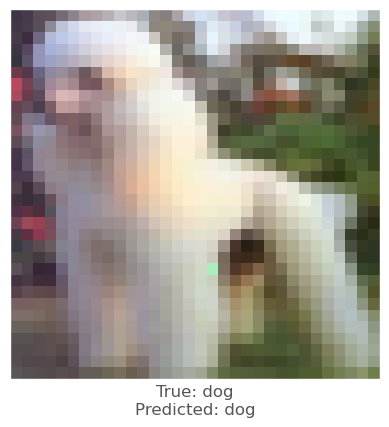



0.0041859746
0.0037830472
0.00396204
vr, vg, vb :   -0.2570894288012398 0.27744009821321225 0.5302611445673007
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.67632926
beam_perturbed_confidence temp :  0.67459565
row index :  0
27th round's confidence : 3th 0.67459565
predicted class :  dog
predicted class's confidence :  0.67459565
Lopt is :  13


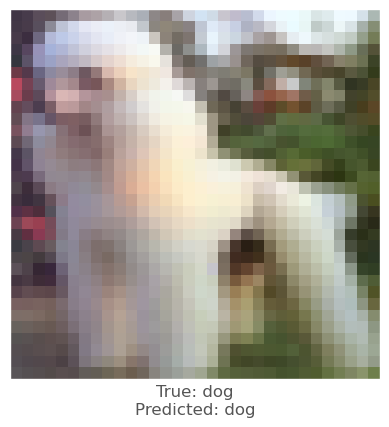



0.001791954
0.00028914213
-0.0034435391
vr, vg, vb :   -1.3540482720225107 1.8157875243593606 1.625150710947499
beam_perturbed_confidence temp :  0.59686583
beam_perturbed_confidence temp :  0.59905696
beam_perturbed_confidence temp :  0.5972002
beam_perturbed_confidence temp :  0.5966255
beam_perturbed_confidence temp :  0.5948452
beam_perturbed_confidence temp :  0.597056
beam_perturbed_confidence temp :  0.5950162
row index :  4
27th round's confidence : 4th 0.5948452
predicted class :  dog
predicted class's confidence :  0.5948452
Lopt is :  36


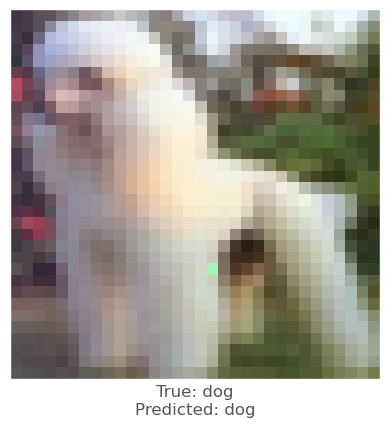



0.0014781356
-3.105402e-05
-0.0031902194
vr, vg, vb :   -1.6327175965849063 1.1318557822388173 1.8084574218589449
beam_perturbed_confidence temp :  0.592264
beam_perturbed_confidence temp :  0.5925551
beam_perturbed_confidence temp :  0.59075886
beam_perturbed_confidence temp :  0.59195775
beam_perturbed_confidence temp :  0.5908494
beam_perturbed_confidence temp :  0.590552
beam_perturbed_confidence temp :  0.590178
row index :  6
28th round's confidence : 0th 0.590178
predicted class :  dog
predicted class's confidence :  0.590178
Lopt is :  39


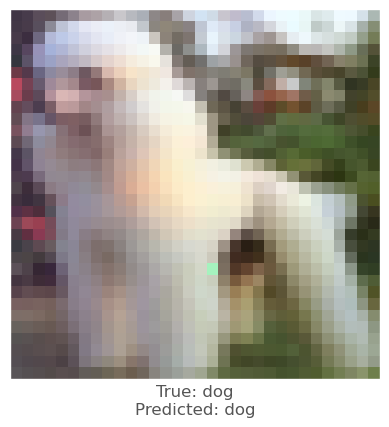



0.002092123
-0.00014960766
-0.0018958449
vr, vg, vb :   -1.396463641342635 2.15345552199788 1.067403918842976
beam_perturbed_confidence temp :  0.6034833
beam_perturbed_confidence temp :  0.60609245
beam_perturbed_confidence temp :  0.60305315
beam_perturbed_confidence temp :  0.6026043
beam_perturbed_confidence temp :  0.60154045
beam_perturbed_confidence temp :  0.6056116
beam_perturbed_confidence temp :  0.6011863
row index :  6
28th round's confidence : 1th 0.6011863
predicted class :  dog
predicted class's confidence :  0.6011863
Lopt is :  35


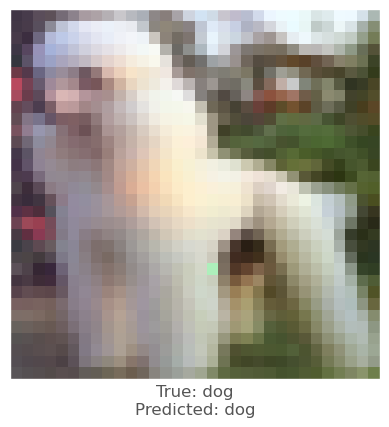



0.0017680526
-0.00059068203
-0.0028962493
vr, vg, vb :   -1.6886342041410962 1.676748051034389 1.5529442537287326
beam_perturbed_confidence temp :  0.59291965
beam_perturbed_confidence temp :  0.59398764
beam_perturbed_confidence temp :  0.5927208
beam_perturbed_confidence temp :  0.592451
beam_perturbed_confidence temp :  0.5909125
beam_perturbed_confidence temp :  0.59275836
beam_perturbed_confidence temp :  0.5906139
row index :  6
28th round's confidence : 2th 0.5906139
predicted class :  dog
predicted class's confidence :  0.5906139
Lopt is :  35


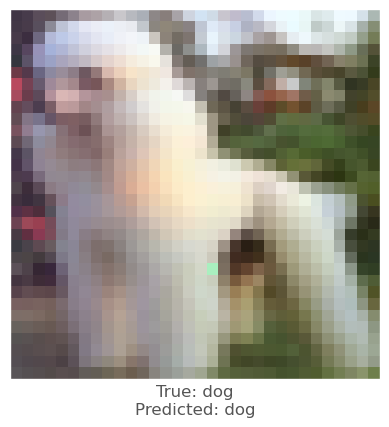



0.0024760365
0.0021341443
0.0023855567
vr, vg, vb :   -0.478984140782566 0.0362816577736049 0.23867936032602471
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.67459565
beam_perturbed_confidence temp :  0.6738532
row index :  0
28th round's confidence : 3th 0.6738532
predicted class :  dog
predicted class's confidence :  0.6738532
Lopt is :  13


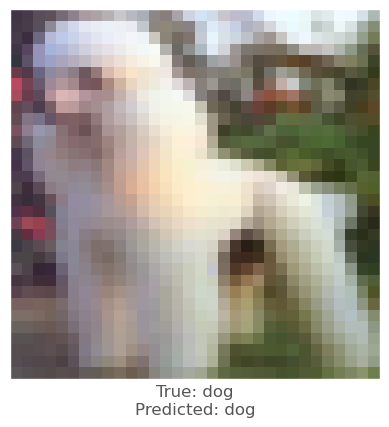



0.0016158819
-0.0010227561
-0.003541112
vr, vg, vb :   -1.3802316368063436 1.7364843818935174 1.8167468344633448
beam_perturbed_confidence temp :  0.5945679
beam_perturbed_confidence temp :  0.5950162
beam_perturbed_confidence temp :  0.5933247
beam_perturbed_confidence temp :  0.59332675
beam_perturbed_confidence temp :  0.5929426
beam_perturbed_confidence temp :  0.5933848
beam_perturbed_confidence temp :  0.59190667
row index :  6
28th round's confidence : 4th 0.59190667
predicted class :  dog
predicted class's confidence :  0.59190667
Lopt is :  38


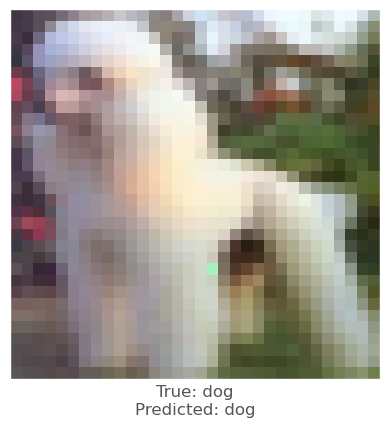



-0.00046420097
-0.0014418364
-0.0036469102
vr, vg, vb :   -1.4230257395753416 1.1628538397266055 1.992302698731278
beam_perturbed_confidence temp :  0.59105337
beam_perturbed_confidence temp :  0.58940756
beam_perturbed_confidence temp :  0.58831084
beam_perturbed_confidence temp :  0.5897976
beam_perturbed_confidence temp :  0.58906806
beam_perturbed_confidence temp :  0.58711094
beam_perturbed_confidence temp :  0.5876435
row index :  5
29th round's confidence : 0th 0.58711094
predicted class :  dog
predicted class's confidence :  0.58711094
Lopt is :  39


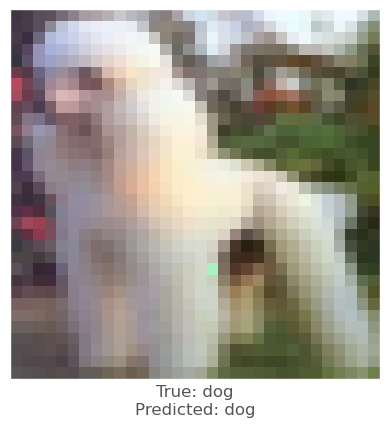



0.0028750896
0.0018149614
-0.0024929047
vr, vg, vb :   -1.5443262417469457 1.7566138264570277 1.209953993267272
beam_perturbed_confidence temp :  0.59953845
beam_perturbed_confidence temp :  0.602424
beam_perturbed_confidence temp :  0.6001114
beam_perturbed_confidence temp :  0.5996782
beam_perturbed_confidence temp :  0.5975961
beam_perturbed_confidence temp :  0.601083
beam_perturbed_confidence temp :  0.59768254
row index :  4
29th round's confidence : 1th 0.5975961
predicted class :  dog
predicted class's confidence :  0.5975961
Lopt is :  35


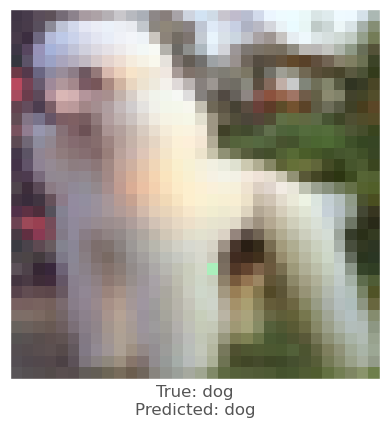



0.0014989376
-0.00045454502
-0.003770113
vr, vg, vb :   -1.669664544408139 1.554527748036663 1.7746611274891602
beam_perturbed_confidence temp :  0.59010804
beam_perturbed_confidence temp :  0.590458
beam_perturbed_confidence temp :  0.58868086
beam_perturbed_confidence temp :  0.58923477
beam_perturbed_confidence temp :  0.5885149
beam_perturbed_confidence temp :  0.58888614
beam_perturbed_confidence temp :  0.5877206
row index :  6
29th round's confidence : 2th 0.5877206
predicted class :  dog
predicted class's confidence :  0.5877206
Lopt is :  37


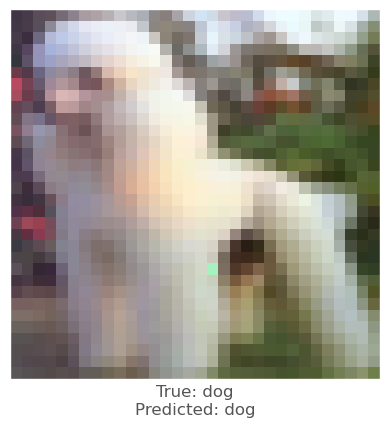



-0.0004094243
-0.00041931868
0.0005840063
vr, vg, vb :   -0.3901432962080936 0.0745853595957317 0.15641079334249453
beam_perturbed_confidence temp :  0.6750051
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.6750051
beam_perturbed_confidence temp :  0.6750051
beam_perturbed_confidence temp :  0.6738532
beam_perturbed_confidence temp :  0.6750051
row index :  1
29th round's confidence : 3th 0.6738532
predicted class :  dog
predicted class's confidence :  0.6738532
Lopt is :  13


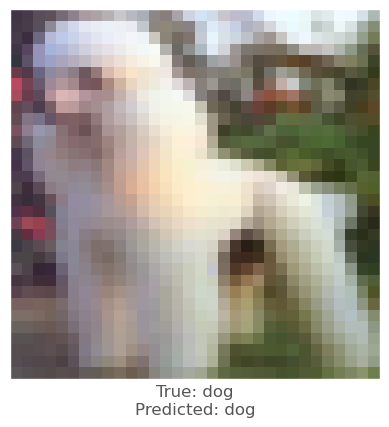



0.00031381845
-0.0007991195
-0.00282228
vr, vg, vb :   -1.2735903185999524 1.6427478909545319 1.917300144028485
beam_perturbed_confidence temp :  0.59294784
beam_perturbed_confidence temp :  0.5921435
beam_perturbed_confidence temp :  0.59050447
beam_perturbed_confidence temp :  0.59233546
beam_perturbed_confidence temp :  0.59143704
beam_perturbed_confidence temp :  0.5900865
beam_perturbed_confidence temp :  0.5905507
row index :  5
29th round's confidence : 4th 0.5900865
predicted class :  dog
predicted class's confidence :  0.5900865
Lopt is :  38


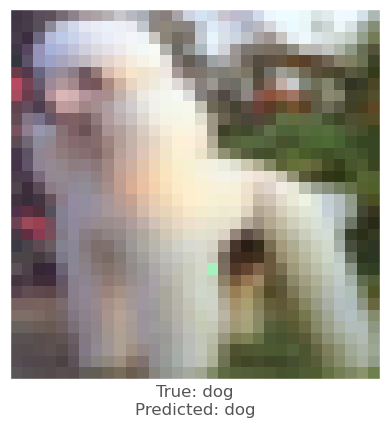






18th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  139 134 127
0.0020114183
0.011811256
0.0033918023
vr, vg, vb :   -0.2011418342590332 -1.1811256408691406 -0.33918023109436035
beam_perturbed_confidence temp :  0.66740006
beam_perturbed_confidence temp :  0.6562663
beam_perturbed_confidence temp :  0.6669273
beam_perturbed_confidence temp :  0.6547606
beam_perturbed_confidence temp :  0.66539127
beam_perturbed_confidence temp :  0.6544949
beam_perturbed_confidence temp :  0.65296084
row index :  6
0th round's confidence : 0th 0.65296084
predicted class :  dog
predicted class's confidence :  0.65296084
Lopt is :  2


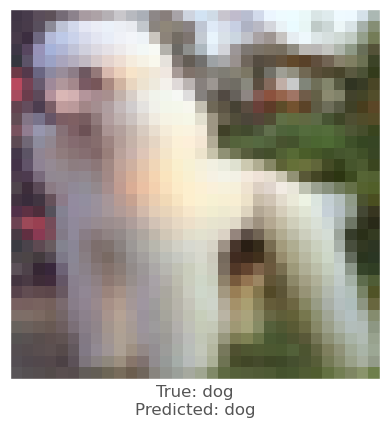



0.0048939586
0.013001502
0.0042741895
vr, vg, vb :   -0.4893958568572998 -1.3001501560211182 -0.42741894721984863
beam_perturbed_confidence temp :  0.6195097
beam_perturbed_confidence temp :  0.60917324
beam_perturbed_confidence temp :  0.6205079
beam_perturbed_confidence temp :  0.60608023
beam_perturbed_confidence temp :  0.61734164
beam_perturbed_confidence temp :  0.6066298
beam_perturbed_confidence temp :  0.6038094
row index :  6
0th round's confidence : 1th 0.6038094
predicted class :  dog
predicted class's confidence :  0.6038094
Lopt is :  7


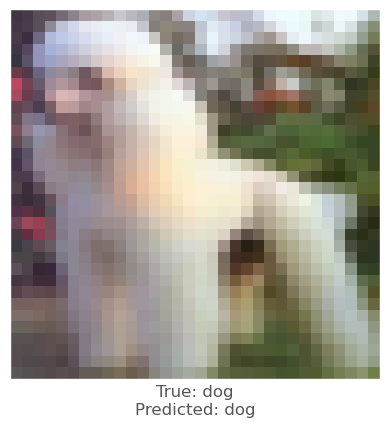



0.0032621622
0.013513505
0.0044083
vr, vg, vb :   -0.3262162208557129 -1.3513505458831787 -0.4408299922943115
beam_perturbed_confidence temp :  0.7140974
beam_perturbed_confidence temp :  0.70256275
beam_perturbed_confidence temp :  0.71379673
beam_perturbed_confidence temp :  0.7011117
beam_perturbed_confidence temp :  0.71204174
beam_perturbed_confidence temp :  0.70072615
beam_perturbed_confidence temp :  0.69929945
row index :  6
0th round's confidence : 2th 0.69929945
predicted class :  dog
predicted class's confidence :  0.69929945
Lopt is :  4


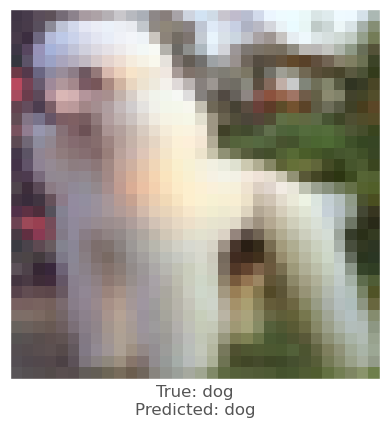



0.00921756
0.018002093
0.005870044
vr, vg, vb :   -0.9217560291290283 -1.8002092838287354 -0.5870044231414795
beam_perturbed_confidence temp :  0.5508022
beam_perturbed_confidence temp :  0.53719366
beam_perturbed_confidence temp :  0.5524471
beam_perturbed_confidence temp :  0.5325898
beam_perturbed_confidence temp :  0.5481386
beam_perturbed_confidence temp :  0.53461975
beam_perturbed_confidence temp :  0.5299314
row index :  6
0th round's confidence : 3th 0.5299314
predicted class :  dog
predicted class's confidence :  0.5299314
Lopt is :  12


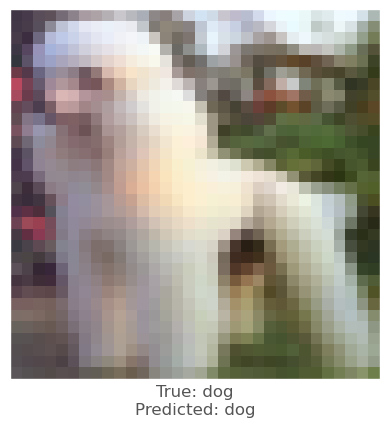



0.0028571486
0.012721002
0.0050962567
vr, vg, vb :   -0.28571486473083496 -1.2721002101898193 -0.5096256732940674
beam_perturbed_confidence temp :  0.7690713
beam_perturbed_confidence temp :  0.75741434
beam_perturbed_confidence temp :  0.768044
beam_perturbed_confidence temp :  0.7556347
beam_perturbed_confidence temp :  0.7666011
beam_perturbed_confidence temp :  0.75443107
beam_perturbed_confidence temp :  0.7529032
row index :  6
0th round's confidence : 4th 0.7529032
predicted class :  dog
predicted class's confidence :  0.7529032
Lopt is :  9


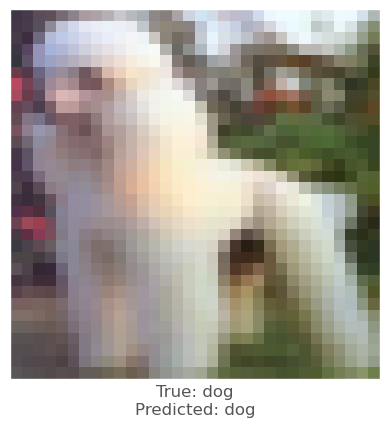



0.0022548437
0.012557387
0.0037430525
vr, vg, vb :   -0.4065120220184326 -2.318751811981201 -0.6795674562454224
beam_perturbed_confidence temp :  0.65224004
beam_perturbed_confidence temp :  0.63582844
beam_perturbed_confidence temp :  0.65101755
beam_perturbed_confidence temp :  0.6352678
beam_perturbed_confidence temp :  0.6500793
beam_perturbed_confidence temp :  0.6339024
beam_perturbed_confidence temp :  0.63316303
row index :  6
1th round's confidence : 0th 0.63316303
predicted class :  dog
predicted class's confidence :  0.63316303
Lopt is :  5


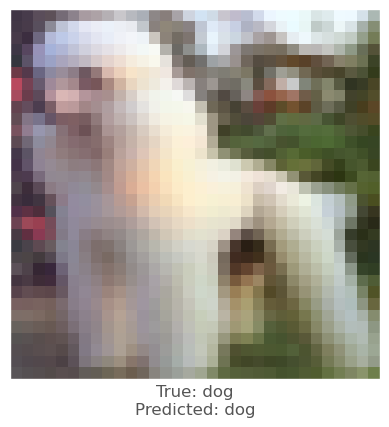



0.0066351295
0.013914883
0.0045417547
vr, vg, vb :   -1.1039692163467407 -2.561623454093933 -0.8388525247573853
beam_perturbed_confidence temp :  0.5961616
beam_perturbed_confidence temp :  0.5811812
beam_perturbed_confidence temp :  0.6015385
beam_perturbed_confidence temp :  0.57438904
beam_perturbed_confidence temp :  0.5941815
beam_perturbed_confidence temp :  0.57846206
beam_perturbed_confidence temp :  0.5720474
row index :  6
1th round's confidence : 1th 0.5720474
predicted class :  dog
predicted class's confidence :  0.5720474
Lopt is :  10


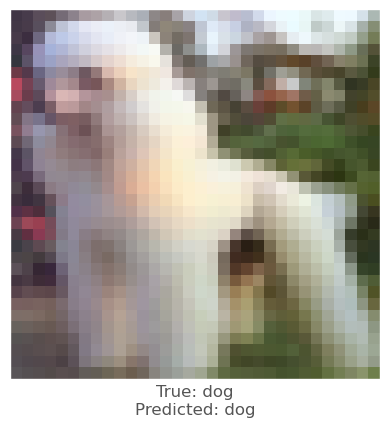



0.0025660992
0.012673199
0.0036524534
vr, vg, vb :   -0.5502045154571533 -2.483535408973694 -0.761992335319519
beam_perturbed_confidence temp :  0.69816005
beam_perturbed_confidence temp :  0.6800834
beam_perturbed_confidence temp :  0.6974592
beam_perturbed_confidence temp :  0.67887723
beam_perturbed_confidence temp :  0.69620854
beam_perturbed_confidence temp :  0.67807966
beam_perturbed_confidence temp :  0.6769318
row index :  6
1th round's confidence : 2th 0.6769318
predicted class :  dog
predicted class's confidence :  0.6769318
Lopt is :  3


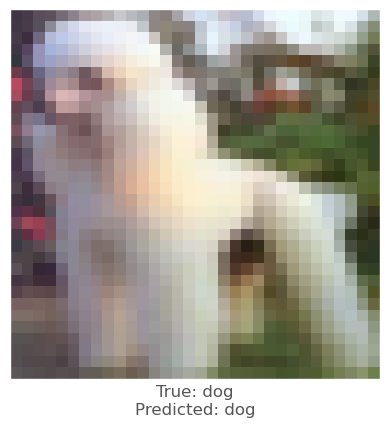



0.008669734
0.018056393
0.005218923
vr, vg, vb :   -1.6965538263320923 -3.4258276224136353 -1.0501962900161743
beam_perturbed_confidence temp :  0.5223086
beam_perturbed_confidence temp :  0.4953528
beam_perturbed_confidence temp :  0.52474904
beam_perturbed_confidence temp :  0.4868216
beam_perturbed_confidence temp :  0.5167968
beam_perturbed_confidence temp :  0.48911804
beam_perturbed_confidence temp :  0.48098952
row index :  6
1th round's confidence : 3th 0.48098952
predicted class :  horse
predicted class's confidence :  0.5110443
Lopt is :  16


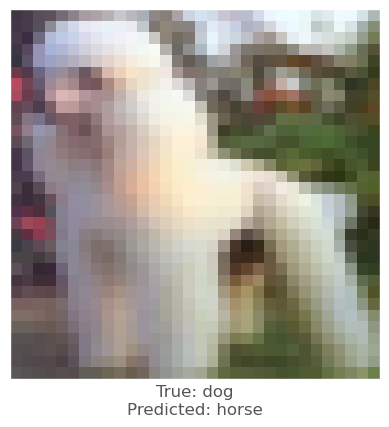




19th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  146 137 145
-0.007874668
-0.0014210939
0.0028628707
vr, vg, vb :   0.7874667644500732 0.14210939407348633 -0.2862870693206787
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66725653
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66725653
beam_perturbed_confidence temp :  0.66725653
beam_perturbed_confidence temp :  0.66725653
row index :  2
0th round's confidence : 0th 0.66725653
predicted class :  dog
predicted class's confidence :  0.66725653
Lopt is :  1


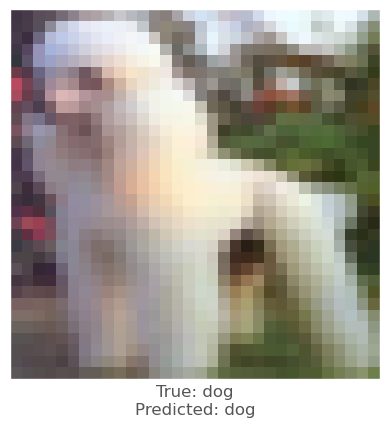



-0.0054727197
-0.00052934885
0.0026696324
vr, vg, vb :   0.5472719669342041 0.052934885025024414 -0.26696324348449707
beam_perturbed_confidence temp :  0.69475436
beam_perturbed_confidence temp :  0.69475436
beam_perturbed_confidence temp :  0.69332135
beam_perturbed_confidence temp :  0.69475436
beam_perturbed_confidence temp :  0.69332135
beam_perturbed_confidence temp :  0.69332135
beam_perturbed_confidence temp :  0.69332135
row index :  2
0th round's confidence : 1th 0.69332135
predicted class :  dog
predicted class's confidence :  0.69332135
Lopt is :  6


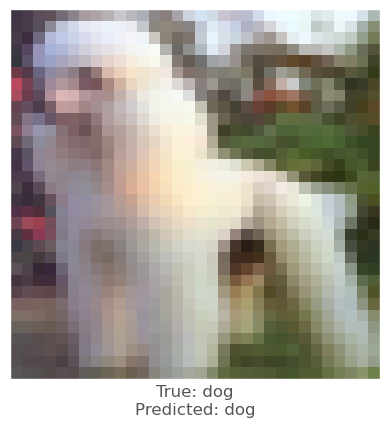



-0.007082343
0.0066737533
0.008257449
vr, vg, vb :   0.7082343101501465 -0.6673753261566162 -0.8257448673248291
beam_perturbed_confidence temp :  0.69958264
beam_perturbed_confidence temp :  0.6964019
beam_perturbed_confidence temp :  0.69558775
beam_perturbed_confidence temp :  0.6964019
beam_perturbed_confidence temp :  0.69558775
beam_perturbed_confidence temp :  0.6914786
beam_perturbed_confidence temp :  0.6914786
row index :  5
0th round's confidence : 2th 0.6914786
predicted class :  dog
predicted class's confidence :  0.6914786
Lopt is :  5


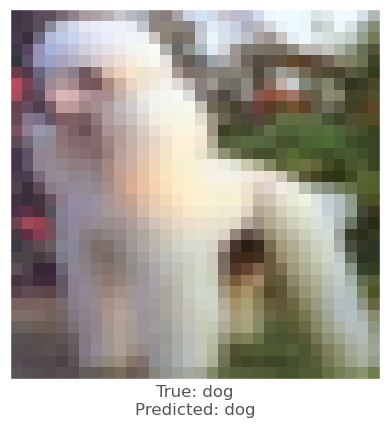



-0.0173046
-0.005110085
0.0017924905
vr, vg, vb :   1.7304599285125732 0.5110085010528564 -0.17924904823303223
beam_perturbed_confidence temp :  0.7301987
beam_perturbed_confidence temp :  0.73887557
beam_perturbed_confidence temp :  0.7378081
beam_perturbed_confidence temp :  0.7301987
beam_perturbed_confidence temp :  0.7292493
beam_perturbed_confidence temp :  0.7378081
beam_perturbed_confidence temp :  0.7292493
row index :  4
0th round's confidence : 3th 0.7292493
predicted class :  dog
predicted class's confidence :  0.7292493
Lopt is :  11


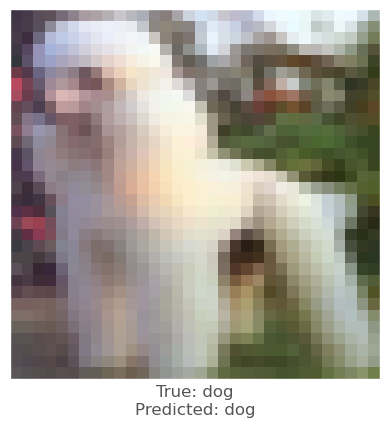



-0.009162486
0.004965961
0.008854032
vr, vg, vb :   0.9162485599517822 -0.496596097946167 -0.8854031562805176
beam_perturbed_confidence temp :  0.7075315
beam_perturbed_confidence temp :  0.7043879
beam_perturbed_confidence temp :  0.70310193
beam_perturbed_confidence temp :  0.7043879
beam_perturbed_confidence temp :  0.70310193
beam_perturbed_confidence temp :  0.6999169
beam_perturbed_confidence temp :  0.6999169
row index :  5
0th round's confidence : 4th 0.6999169
predicted class :  dog
predicted class's confidence :  0.6999169
Lopt is :  10


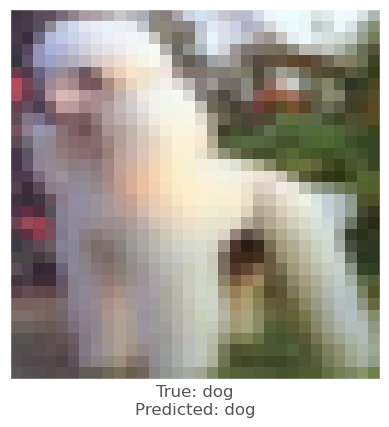



-0.0092769265
-0.002778113
0.0024238229
vr, vg, vb :   1.6364127397537231 0.40570974349975586 -0.5000406503677368
beam_perturbed_confidence temp :  0.6625471
beam_perturbed_confidence temp :  0.66725653
beam_perturbed_confidence temp :  0.66620564
beam_perturbed_confidence temp :  0.6625471
beam_perturbed_confidence temp :  0.6611369
beam_perturbed_confidence temp :  0.66620564
beam_perturbed_confidence temp :  0.6611369
row index :  4
1th round's confidence : 0th 0.6611369
predicted class :  dog
predicted class's confidence :  0.6611369
Lopt is :  2


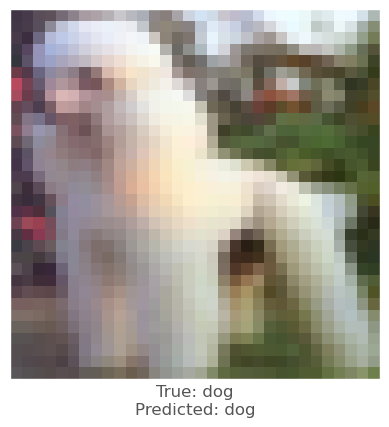



-0.005964339
-0.0003671646
0.0030035377
vr, vg, vb :   1.08897864818573 0.0843578577041626 -0.5406206846237183
beam_perturbed_confidence temp :  0.6903852
beam_perturbed_confidence temp :  0.69332135
beam_perturbed_confidence temp :  0.6917508
beam_perturbed_confidence temp :  0.6903852
beam_perturbed_confidence temp :  0.688471
beam_perturbed_confidence temp :  0.6917508
beam_perturbed_confidence temp :  0.688471
row index :  4
1th round's confidence : 1th 0.688471
predicted class :  dog
predicted class's confidence :  0.688471
Lopt is :  7


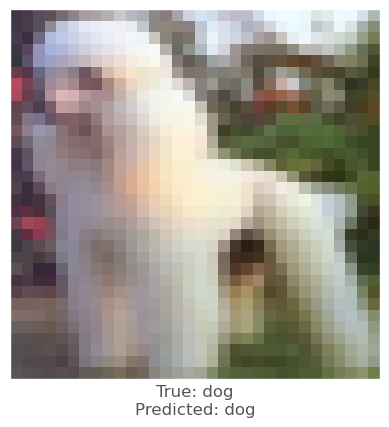



-0.0059505105
0.008464575
0.009857655
vr, vg, vb :   1.232461929321289 -1.447095274925232 -1.7289358377456665
beam_perturbed_confidence temp :  0.6879473
beam_perturbed_confidence temp :  0.68369395
beam_perturbed_confidence temp :  0.6823468
beam_perturbed_confidence temp :  0.6806937
beam_perturbed_confidence temp :  0.6782976
beam_perturbed_confidence temp :  0.67560023
beam_perturbed_confidence temp :  0.6722415
row index :  6
1th round's confidence : 2th 0.6722415
predicted class :  dog
predicted class's confidence :  0.6722415
Lopt is :  6


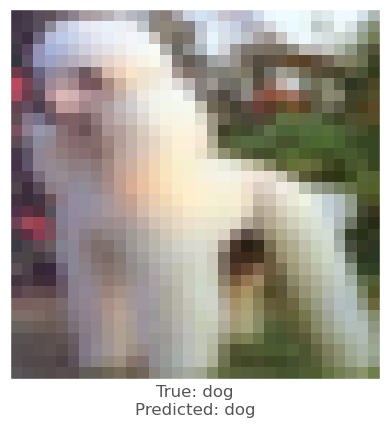



-0.01711452
-0.0054480433
0.0019327998
vr, vg, vb :   3.268865942955017 1.0047119855880737 -0.3546041250228882
beam_perturbed_confidence temp :  0.7042814
beam_perturbed_confidence temp :  0.7264573
beam_perturbed_confidence temp :  0.7282659
beam_perturbed_confidence temp :  0.6991934
beam_perturbed_confidence temp :  0.7045002
beam_perturbed_confidence temp :  0.72569275
beam_perturbed_confidence temp :  0.6995321
row index :  3
1th round's confidence : 3th 0.6991934
predicted class :  dog
predicted class's confidence :  0.6991934
Lopt is :  11


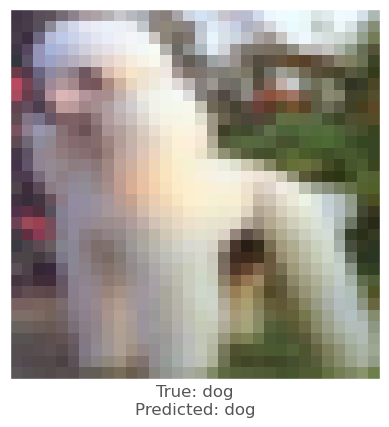



-0.010399282
0.0065356493
0.009011149
vr, vg, vb :   1.8645519018173218 -1.1005014181137085 -1.6979777812957764
beam_perturbed_confidence temp :  0.69482386
beam_perturbed_confidence temp :  0.69325674
beam_perturbed_confidence temp :  0.6908276
beam_perturbed_confidence temp :  0.6874023
beam_perturbed_confidence temp :  0.6854867
beam_perturbed_confidence temp :  0.6832601
beam_perturbed_confidence temp :  0.6770504
row index :  6
1th round's confidence : 4th 0.6770504
predicted class :  dog
predicted class's confidence :  0.6770504
Lopt is :  11


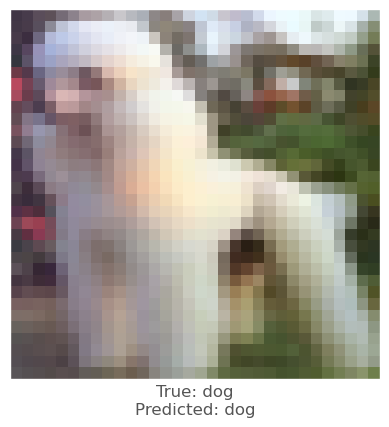



-0.009036899
-0.001807034
0.003184855
vr, vg, vb :   2.3764613270759583 0.545842170715332 -0.7685220837593079
beam_perturbed_confidence temp :  0.6557345
beam_perturbed_confidence temp :  0.6611369
beam_perturbed_confidence temp :  0.65936226
beam_perturbed_confidence temp :  0.6557345
beam_perturbed_confidence temp :  0.6514299
beam_perturbed_confidence temp :  0.65936226
beam_perturbed_confidence temp :  0.6514299
row index :  4
2th round's confidence : 0th 0.6514299
predicted class :  dog
predicted class's confidence :  0.6514299
Lopt is :  3


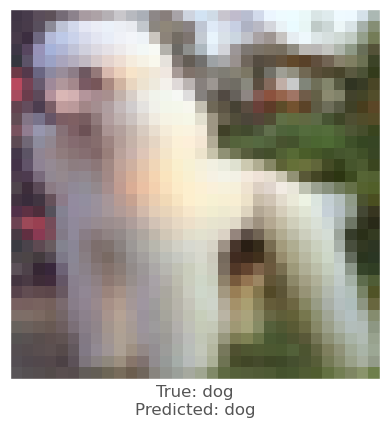



-0.0039987564
0.0003452301
0.0029878616
vr, vg, vb :   1.3799564242362976 0.04139906167984009 -0.7853447794914246
beam_perturbed_confidence temp :  0.68775207
beam_perturbed_confidence temp :  0.688471
beam_perturbed_confidence temp :  0.68739736
beam_perturbed_confidence temp :  0.68775207
beam_perturbed_confidence temp :  0.6862151
beam_perturbed_confidence temp :  0.68739736
beam_perturbed_confidence temp :  0.6862151
row index :  4
2th round's confidence : 1th 0.6862151
predicted class :  dog
predicted class's confidence :  0.6862151
Lopt is :  8


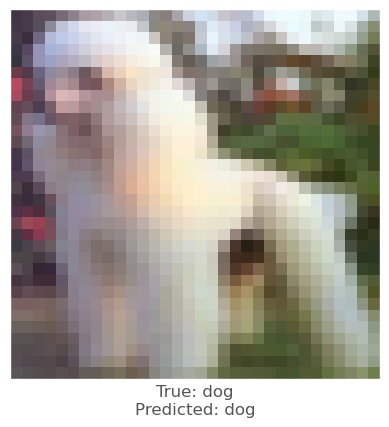



-0.0072232485
0.0064095855
0.008387387
vr, vg, vb :   1.831540584564209 -1.9433442950248718 -2.394780933856964
beam_perturbed_confidence temp :  0.668377
beam_perturbed_confidence temp :  0.6665227
beam_perturbed_confidence temp :  0.66075915
beam_perturbed_confidence temp :  0.66279477
beam_perturbed_confidence temp :  0.6570671
beam_perturbed_confidence temp :  0.6541076
beam_perturbed_confidence temp :  0.65198827
row index :  6
2th round's confidence : 2th 0.65198827
predicted class :  dog
predicted class's confidence :  0.65198827
Lopt is :  7


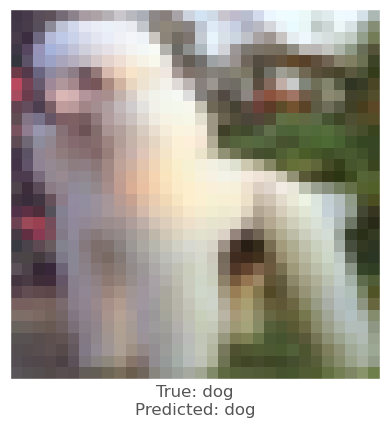



-0.017700851
-0.009565949
-0.00014138222
vr, vg, vb :   4.712064445018768 1.8608357310295105 -0.3050054907798767
beam_perturbed_confidence temp :  0.67535406
beam_perturbed_confidence temp :  0.69471544
beam_perturbed_confidence temp :  0.6995321
beam_perturbed_confidence temp :  0.67456925
beam_perturbed_confidence temp :  0.67340946
beam_perturbed_confidence temp :  0.69468635
beam_perturbed_confidence temp :  0.6727141
row index :  6
2th round's confidence : 3th 0.6727141
predicted class :  dog
predicted class's confidence :  0.6727141
Lopt is :  12


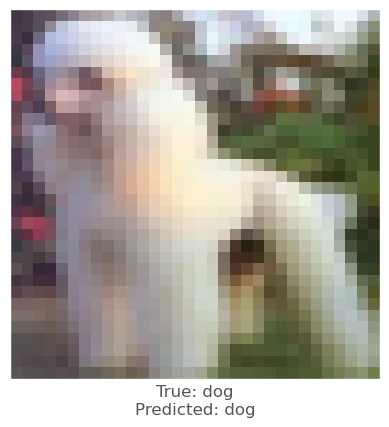



-0.011435926
0.0072374344
0.010318279
vr, vg, vb :   2.8216893076896667 -1.7141947150230408 -2.560007929801941
beam_perturbed_confidence temp :  0.66605943
beam_perturbed_confidence temp :  0.67115295
beam_perturbed_confidence temp :  0.6627724
beam_perturbed_confidence temp :  0.6582913
beam_perturbed_confidence temp :  0.6510002
beam_perturbed_confidence temp :  0.6580178
beam_perturbed_confidence temp :  0.64480984
row index :  6
2th round's confidence : 4th 0.64480984
predicted class :  dog
predicted class's confidence :  0.64480984
Lopt is :  13


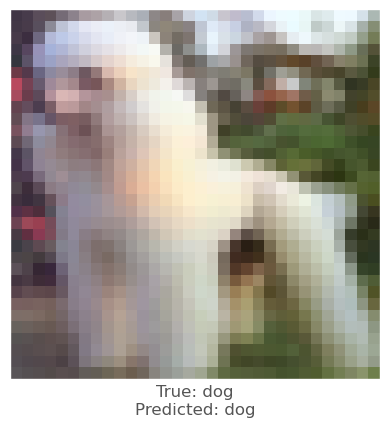



-0.0040676
0.0060376525
0.007335186
vr, vg, vb :   2.5455751717090607 -0.11250729560852052 -1.4251884758472442
beam_perturbed_confidence temp :  0.64980704
beam_perturbed_confidence temp :  0.6499588
beam_perturbed_confidence temp :  0.6462875
beam_perturbed_confidence temp :  0.6451591
beam_perturbed_confidence temp :  0.6404509
beam_perturbed_confidence temp :  0.6472396
beam_perturbed_confidence temp :  0.6379183
row index :  6
3th round's confidence : 0th 0.6379183
predicted class :  dog
predicted class's confidence :  0.6379183
Lopt is :  5


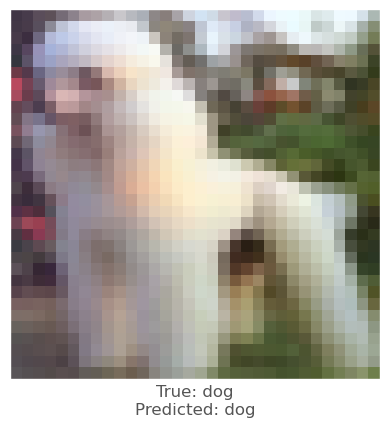



-0.002131343
0.00030589104
0.0030856133
vr, vg, vb :   1.4550950706005097 0.006670051813125612 -1.0153716266155244
beam_perturbed_confidence temp :  0.685266
beam_perturbed_confidence temp :  0.6862151
beam_perturbed_confidence temp :  0.6827116
beam_perturbed_confidence temp :  0.685266
beam_perturbed_confidence temp :  0.68097484
beam_perturbed_confidence temp :  0.6827116
beam_perturbed_confidence temp :  0.68097484
row index :  4
3th round's confidence : 1th 0.68097484
predicted class :  dog
predicted class's confidence :  0.68097484
Lopt is :  10


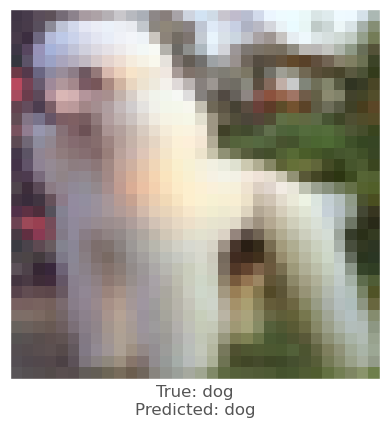



-0.0057742
0.0067011714
0.008518755
vr, vg, vb :   2.2258065223693846 -2.4191270053386686 -3.0071783840656283
beam_perturbed_confidence temp :  0.643165
beam_perturbed_confidence temp :  0.6411746
beam_perturbed_confidence temp :  0.63286066
beam_perturbed_confidence temp :  0.63160247
beam_perturbed_confidence temp :  0.6236316
beam_perturbed_confidence temp :  0.6270098
beam_perturbed_confidence temp :  0.61774033
row index :  6
3th round's confidence : 2th 0.61774033
predicted class :  dog
predicted class's confidence :  0.61774033
Lopt is :  9


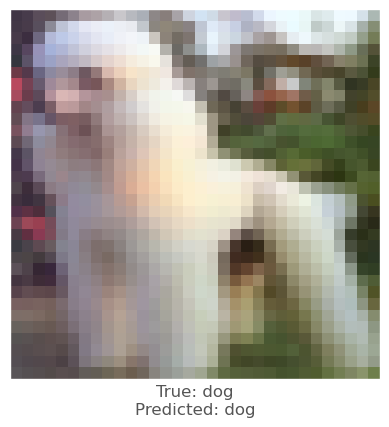



-0.008644223
-0.0016887188
0.0032550693
vr, vg, vb :   5.105280321836472 1.8436240375041961 -0.6000118672847747
beam_perturbed_confidence temp :  0.6541516
beam_perturbed_confidence temp :  0.67172074
beam_perturbed_confidence temp :  0.6713142
beam_perturbed_confidence temp :  0.6541475
beam_perturbed_confidence temp :  0.65256953
beam_perturbed_confidence temp :  0.6697424
beam_perturbed_confidence temp :  0.65216154
row index :  6
3th round's confidence : 3th 0.65216154
predicted class :  dog
predicted class's confidence :  0.65216154
Lopt is :  13


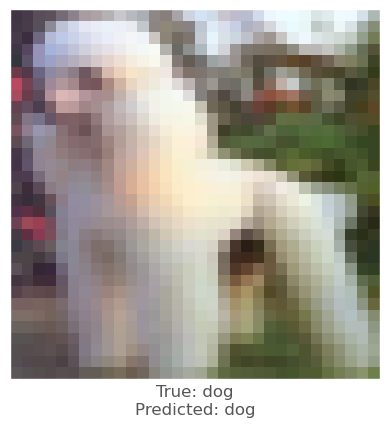



-0.012721777
0.006179929
0.0087275505
vr, vg, vb :   3.8116980731487273 -2.1607681214809418 -3.1767621874809264
beam_perturbed_confidence temp :  0.62731534
beam_perturbed_confidence temp :  0.636385
beam_perturbed_confidence temp :  0.62439436
beam_perturbed_confidence temp :  0.6190939
beam_perturbed_confidence temp :  0.61159414
beam_perturbed_confidence temp :  0.6212238
beam_perturbed_confidence temp :  0.60331684
row index :  6
3th round's confidence : 4th 0.60331684
predicted class :  dog
predicted class's confidence :  0.60331684
Lopt is :  16


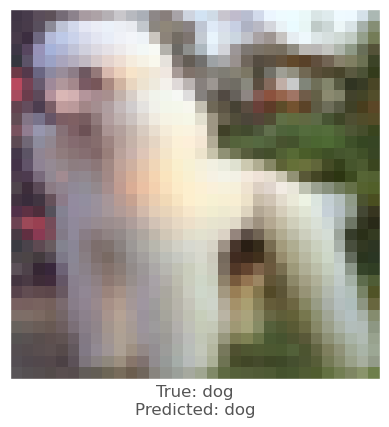



-0.006578505
0.0031934977
0.00508672
vr, vg, vb :   2.9488681584596637 -0.42060633182525636 -1.791341627240181
beam_perturbed_confidence temp :  0.6303706
beam_perturbed_confidence temp :  0.6372574
beam_perturbed_confidence temp :  0.6339429
beam_perturbed_confidence temp :  0.6285604
beam_perturbed_confidence temp :  0.6234808
beam_perturbed_confidence temp :  0.63471687
beam_perturbed_confidence temp :  0.62232125
row index :  6
4th round's confidence : 0th 0.62232125
predicted class :  dog
predicted class's confidence :  0.62232125
Lopt is :  7


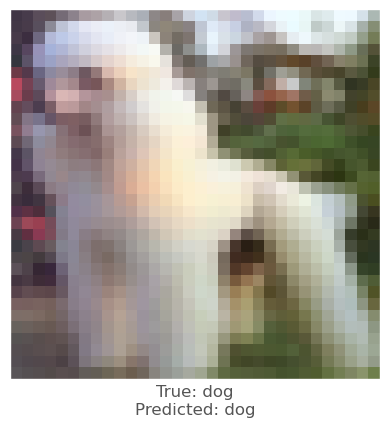



-0.0038266182
0.0039168
0.0066135526
vr, vg, vb :   1.6922473829984666 -0.38567695558071136 -1.5751897209882737
beam_perturbed_confidence temp :  0.678885
beam_perturbed_confidence temp :  0.6786386
beam_perturbed_confidence temp :  0.67396975
beam_perturbed_confidence temp :  0.6769015
beam_perturbed_confidence temp :  0.6717969
beam_perturbed_confidence temp :  0.67208594
beam_perturbed_confidence temp :  0.66942763
row index :  6
4th round's confidence : 1th 0.66942763
predicted class :  dog
predicted class's confidence :  0.66942763
Lopt is :  12


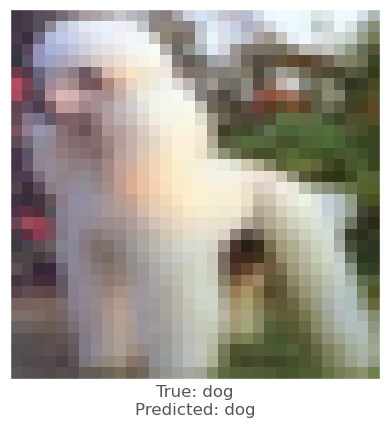



-0.010039151
0.0021671653
0.0066426992
vr, vg, vb :   3.007140941619873 -2.393930832743645 -3.3707304698228837
beam_perturbed_confidence temp :  0.6047495
beam_perturbed_confidence temp :  0.61561215
beam_perturbed_confidence temp :  0.60864216
beam_perturbed_confidence temp :  0.6023601
beam_perturbed_confidence temp :  0.5971338
beam_perturbed_confidence temp :  0.61026347
beam_perturbed_confidence temp :  0.5991171
row index :  4
4th round's confidence : 2th 0.5971338
predicted class :  dog
predicted class's confidence :  0.5971338
Lopt is :  12


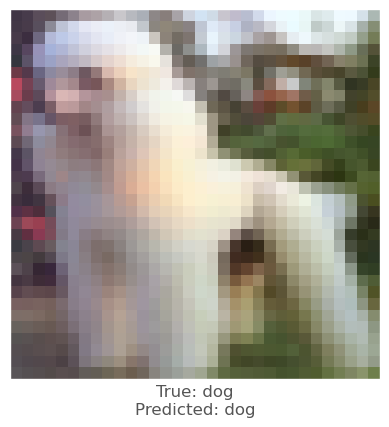



-0.013227165
-0.00092709064
0.0031920075
vr, vg, vb :   5.917468764185906 1.751970698237419 -0.8592114347219467
beam_perturbed_confidence temp :  0.6132488
beam_perturbed_confidence temp :  0.65164244
beam_perturbed_confidence temp :  0.6509555
beam_perturbed_confidence temp :  0.61220354
beam_perturbed_confidence temp :  0.61201805
beam_perturbed_confidence temp :  0.64996
beam_perturbed_confidence temp :  0.6112504
row index :  6
4th round's confidence : 3th 0.6112504
predicted class :  dog
predicted class's confidence :  0.6112504
Lopt is :  14


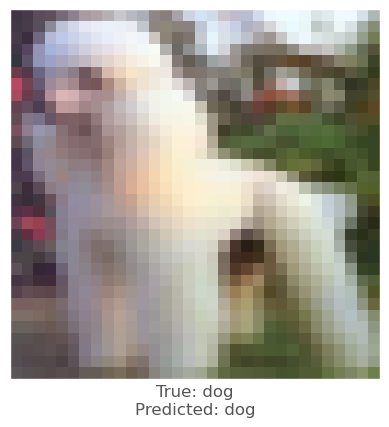



-0.008067131
0.0030519962
0.005870104
vr, vg, vb :   4.237241370081902 -2.249890932440758 -3.446096352338791
beam_perturbed_confidence temp :  0.58857274
beam_perturbed_confidence temp :  0.60095584
beam_perturbed_confidence temp :  0.59202313
beam_perturbed_confidence temp :  0.5840254
beam_perturbed_confidence temp :  0.576424
beam_perturbed_confidence temp :  0.5962596
beam_perturbed_confidence temp :  0.5704339
row index :  6
4th round's confidence : 4th 0.5704339
predicted class :  dog
predicted class's confidence :  0.5704339
Lopt is :  20


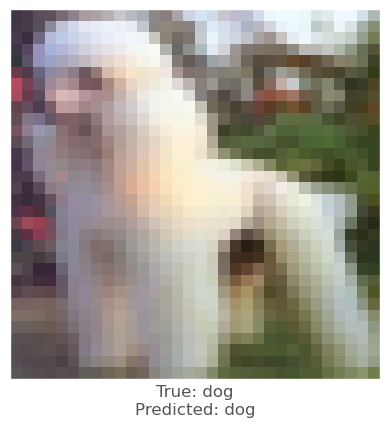



-0.010186076
0.00090765953
0.0048164725
vr, vg, vb :   3.672588959038258 -0.4693116517066956 -2.093854717552662
beam_perturbed_confidence temp :  0.60797435
beam_perturbed_confidence temp :  0.62257314
beam_perturbed_confidence temp :  0.6175686
beam_perturbed_confidence temp :  0.6077477
beam_perturbed_confidence temp :  0.6035076
beam_perturbed_confidence temp :  0.6184743
beam_perturbed_confidence temp :  0.6041631
row index :  4
5th round's confidence : 0th 0.6035076
predicted class :  dog
predicted class's confidence :  0.6035076
Lopt is :  10


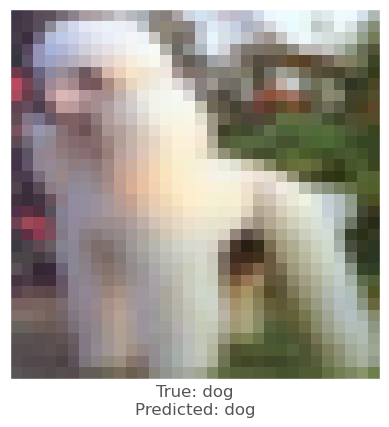



-0.004525304
0.004111588
0.0069288015
vr, vg, vb :   1.9755530287623406 -0.7582680601477623 -2.1105509025454525
beam_perturbed_confidence temp :  0.66756064
beam_perturbed_confidence temp :  0.66768533
beam_perturbed_confidence temp :  0.6622781
beam_perturbed_confidence temp :  0.66521883
beam_perturbed_confidence temp :  0.65879196
beam_perturbed_confidence temp :  0.6630571
beam_perturbed_confidence temp :  0.6590152
row index :  4
5th round's confidence : 1th 0.65879196
predicted class :  dog
predicted class's confidence :  0.65879196
Lopt is :  15


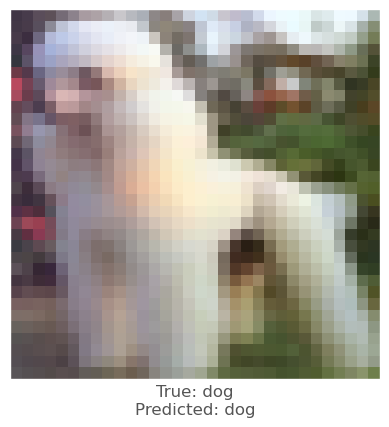



-0.007789552
-0.0016630292
0.0015873909
vr, vg, vb :   3.485382068634033 -1.988234830081463 -3.1923965128064156
beam_perturbed_confidence temp :  0.5863849
beam_perturbed_confidence temp :  0.59815127
beam_perturbed_confidence temp :  0.59487504
beam_perturbed_confidence temp :  0.58782476
beam_perturbed_confidence temp :  0.58404803
beam_perturbed_confidence temp :  0.59591055
beam_perturbed_confidence temp :  0.5849467
row index :  4
5th round's confidence : 2th 0.58404803
predicted class :  dog
predicted class's confidence :  0.58404803
Lopt is :  15


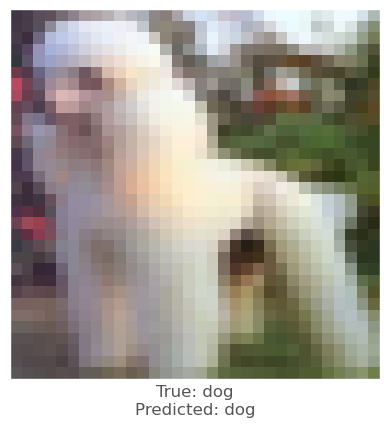



-0.011146486
-0.0014235377
0.0019378066
vr, vg, vb :   6.440370468318463 1.7191274015307425 -0.9670709518790245
beam_perturbed_confidence temp :  0.5883047
beam_perturbed_confidence temp :  0.6105945
beam_perturbed_confidence temp :  0.61026573
beam_perturbed_confidence temp :  0.5867975
beam_perturbed_confidence temp :  0.58730626
beam_perturbed_confidence temp :  0.60961294
beam_perturbed_confidence temp :  0.5864195
row index :  6
5th round's confidence : 3th 0.5864195
predicted class :  dog
predicted class's confidence :  0.5864195
Lopt is :  15


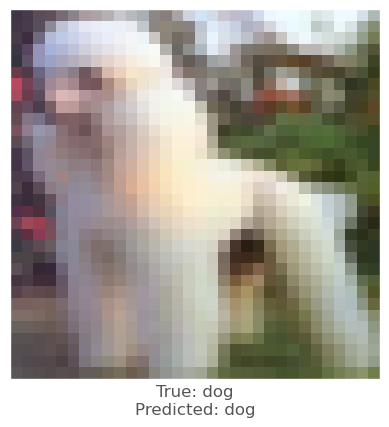



-0.01234138
0.0011096001
0.0062181354
vr, vg, vb :   5.047655245006085 -2.1358618459105494 -3.7233002527952195
beam_perturbed_confidence temp :  0.5480365
beam_perturbed_confidence temp :  0.57032126
beam_perturbed_confidence temp :  0.55837387
beam_perturbed_confidence temp :  0.5452767
beam_perturbed_confidence temp :  0.53601307
beam_perturbed_confidence temp :  0.56116277
beam_perturbed_confidence temp :  0.5350779
row index :  6
5th round's confidence : 4th 0.5350779
predicted class :  dog
predicted class's confidence :  0.5350779
Lopt is :  25


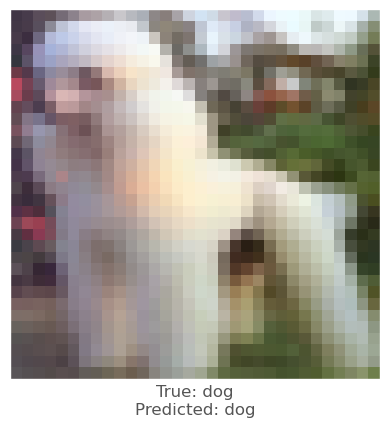



-0.0078805685
-0.001347959
0.0014761686
vr, vg, vb :   4.093386913567782 -0.28758458237648016 -2.0320861090481284
beam_perturbed_confidence temp :  0.58715993
beam_perturbed_confidence temp :  0.6041631
beam_perturbed_confidence temp :  0.6022973
beam_perturbed_confidence temp :  0.5886135
beam_perturbed_confidence temp :  0.5861394
beam_perturbed_confidence temp :  0.60331744
beam_perturbed_confidence temp :  0.5880161
row index :  4
6th round's confidence : 0th 0.5861394
predicted class :  dog
predicted class's confidence :  0.5861394
Lopt is :  14


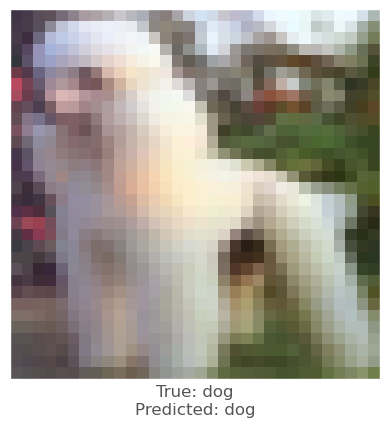



-0.006749034
0.0010643005
0.0029841661
vr, vg, vb :   2.452901118677855 -0.7888713078439236 -2.197912426823378
beam_perturbed_confidence temp :  0.6542321
beam_perturbed_confidence temp :  0.6590152
beam_perturbed_confidence temp :  0.6549877
beam_perturbed_confidence temp :  0.651873
beam_perturbed_confidence temp :  0.6466549
beam_perturbed_confidence temp :  0.65505564
beam_perturbed_confidence temp :  0.6459902
row index :  6
6th round's confidence : 1th 0.6459902
predicted class :  dog
predicted class's confidence :  0.6459902
Lopt is :  18


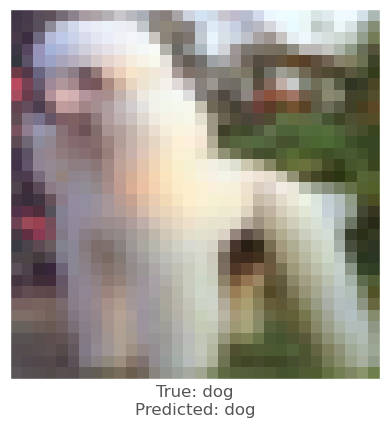



-0.0084683895
-0.0034570694
0.00027936697
vr, vg, vb :   3.9836828128814696 -1.443704407376051 -2.9010935585319997
beam_perturbed_confidence temp :  0.56955534
beam_perturbed_confidence temp :  0.5849467
beam_perturbed_confidence temp :  0.5825168
beam_perturbed_confidence temp :  0.57556665
beam_perturbed_confidence temp :  0.5687844
beam_perturbed_confidence temp :  0.58093137
beam_perturbed_confidence temp :  0.572836
row index :  4
6th round's confidence : 2th 0.5687844
predicted class :  dog
predicted class's confidence :  0.5687844
Lopt is :  18


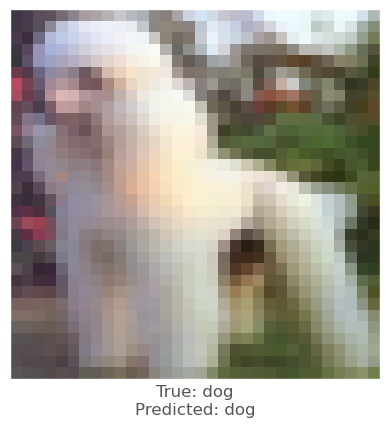



-0.008690655
-0.0017840862
0.0012044907
vr, vg, vb :   6.6653989446342 1.7256232841193675 -0.9908129228532314
beam_perturbed_confidence temp :  0.5621689
beam_perturbed_confidence temp :  0.5855222
beam_perturbed_confidence temp :  0.585593
beam_perturbed_confidence temp :  0.5585113
beam_perturbed_confidence temp :  0.5617911
beam_perturbed_confidence temp :  0.58461803
beam_perturbed_confidence temp :  0.55875033
row index :  3
6th round's confidence : 3th 0.5585113
predicted class :  dog
predicted class's confidence :  0.5585113
Lopt is :  20


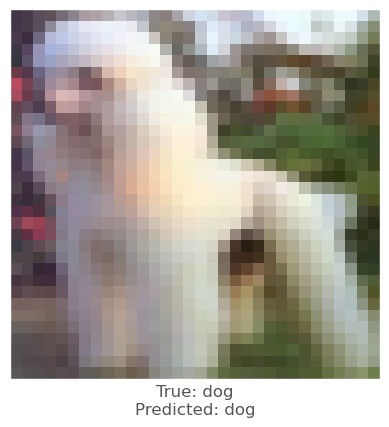



-0.007999241
0.0005773306
0.004946053
vr, vg, vb :   5.342813855713607 -1.9800087202489378 -3.8455755303263666
beam_perturbed_confidence temp :  0.50651395
beam_perturbed_confidence temp :  0.53516906
beam_perturbed_confidence temp :  0.5266309
beam_perturbed_confidence temp :  0.5102623
beam_perturbed_confidence temp :  0.49706724
beam_perturbed_confidence temp :  0.5314773
beam_perturbed_confidence temp :  0.5032574
row index :  4
6th round's confidence : 4th 0.49706724
predicted class :  dog
predicted class's confidence :  0.49706724
Lopt is :  30


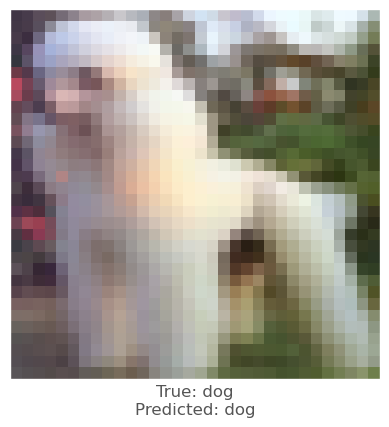




20th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  206 212 202
0.0027514696
0.009360909
0.0008341074
vr, vg, vb :   -0.2751469612121582 -0.9360909461975098 -0.08341073989868164
beam_perturbed_confidence temp :  0.6676047
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66854477
beam_perturbed_confidence temp :  0.66775316
beam_perturbed_confidence temp :  0.6689683
beam_perturbed_confidence temp :  0.6664963
beam_perturbed_confidence temp :  0.67159665
row index :  1
0th round's confidence : 0th 0.6639917
predicted class :  dog
predicted class's confidence :  0.6639917
Lopt is :  1


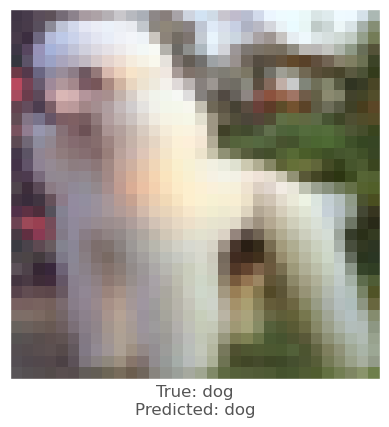



-0.0037452579
-0.0021902323
-0.0028578043
vr, vg, vb :   0.374525785446167 0.2190232276916504 0.2857804298400879
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
row index :  0
0th round's confidence : 1th 0.7233168
predicted class :  dog
predicted class's confidence :  0.7233168
Lopt is :  5


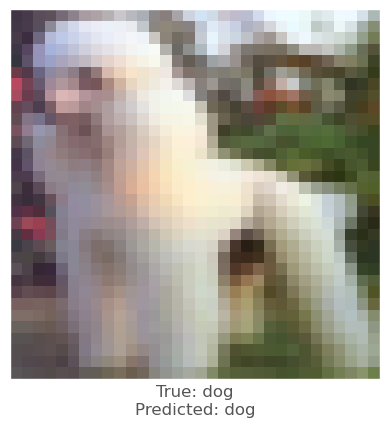



0.0069440603
0.015791297
0.007582426
vr, vg, vb :   -0.6944060325622559 -1.579129695892334 -0.7582426071166992
beam_perturbed_confidence temp :  0.72213525
beam_perturbed_confidence temp :  0.710666
beam_perturbed_confidence temp :  0.7215779
beam_perturbed_confidence temp :  0.7058908
beam_perturbed_confidence temp :  0.718911
beam_perturbed_confidence temp :  0.7065143
beam_perturbed_confidence temp :  0.7015425
row index :  6
0th round's confidence : 2th 0.7015425
predicted class :  dog
predicted class's confidence :  0.7015425
Lopt is :  4


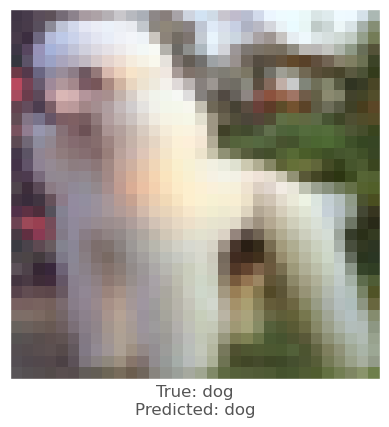



0.002295196
0.006918609
0.0032647252
vr, vg, vb :   -0.22951960563659668 -0.6918609142303467 -0.32647252082824707
beam_perturbed_confidence temp :  0.70961785
beam_perturbed_confidence temp :  0.7071363
beam_perturbed_confidence temp :  0.7090852
beam_perturbed_confidence temp :  0.7066526
beam_perturbed_confidence temp :  0.70811534
beam_perturbed_confidence temp :  0.70563257
beam_perturbed_confidence temp :  0.70537424
row index :  6
0th round's confidence : 3th 0.70537424
predicted class :  dog
predicted class's confidence :  0.70537424
Lopt is :  11


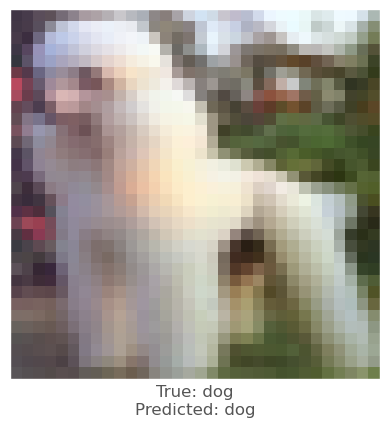



0.0017896295
0.007219076
0.0046263933
vr, vg, vb :   -0.17896294593811035 -0.7219076156616211 -0.46263933181762695
beam_perturbed_confidence temp :  0.7746935
beam_perturbed_confidence temp :  0.7715365
beam_perturbed_confidence temp :  0.77333474
beam_perturbed_confidence temp :  0.76992536
beam_perturbed_confidence temp :  0.7718363
beam_perturbed_confidence temp :  0.7688708
beam_perturbed_confidence temp :  0.7670248
row index :  6
0th round's confidence : 4th 0.7670248
predicted class :  dog
predicted class's confidence :  0.7670248
Lopt is :  9


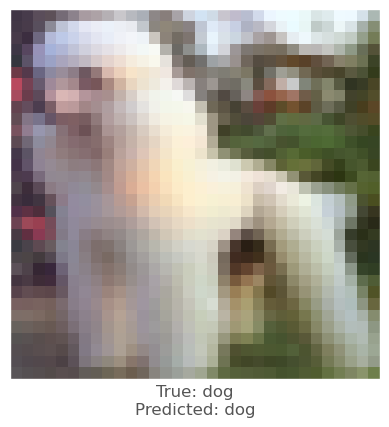



-0.003011763
0.0039892197
-0.0030032396
vr, vg, vb :   0.053544044494628906 -1.2414038181304932 0.22525429725646973
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.66630185
row index :  0
1th round's confidence : 0th 0.6639917
predicted class :  dog
predicted class's confidence :  0.6639917
Lopt is :  1


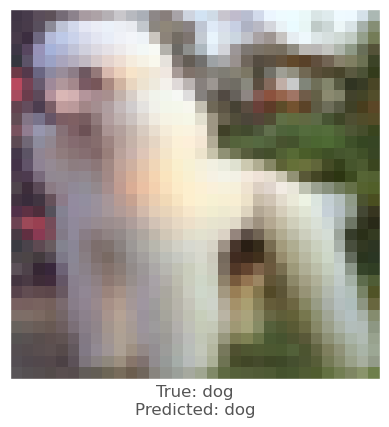



-0.0037452579
-0.0021902323
-0.0028578043
vr, vg, vb :   0.7115989923477173 0.41614413261413574 0.542982816696167
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
row index :  0
1th round's confidence : 1th 0.7233168
predicted class :  dog
predicted class's confidence :  0.7233168
Lopt is :  5


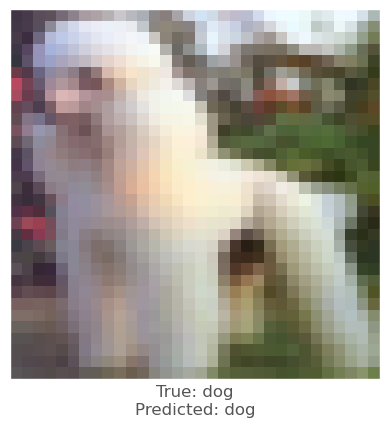



0.009881139
0.0188241
0.008536041
vr, vg, vb :   -1.613079309463501 -3.303626775741577 -1.536022424697876
beam_perturbed_confidence temp :  0.6919292
beam_perturbed_confidence temp :  0.6687973
beam_perturbed_confidence temp :  0.69512916
beam_perturbed_confidence temp :  0.6670385
beam_perturbed_confidence temp :  0.688805
beam_perturbed_confidence temp :  0.6666742
beam_perturbed_confidence temp :  0.6665894
row index :  6
1th round's confidence : 2th 0.6665894
predicted class :  dog
predicted class's confidence :  0.6665894
Lopt is :  2


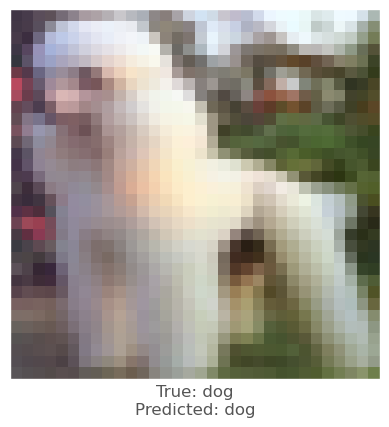



0.0008352399
0.0065047145
0.0029397607
vr, vg, vb :   -0.2900916337966919 -1.2731462717056274 -0.5878013372421265
beam_perturbed_confidence temp :  0.7047973
beam_perturbed_confidence temp :  0.6971311
beam_perturbed_confidence temp :  0.7037128
beam_perturbed_confidence temp :  0.6961687
beam_perturbed_confidence temp :  0.702583
beam_perturbed_confidence temp :  0.6945951
beam_perturbed_confidence temp :  0.6936489
row index :  6
1th round's confidence : 3th 0.6936489
predicted class :  dog
predicted class's confidence :  0.6936489
Lopt is :  13


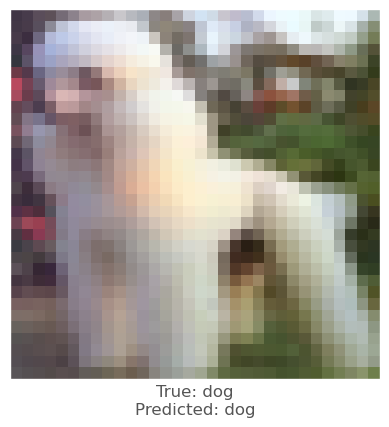



0.0038490891
0.009669423
0.005720377
vr, vg, vb :   -0.5459755659103394 -1.616659164428711 -0.9884130954742432
beam_perturbed_confidence temp :  0.7650217
beam_perturbed_confidence temp :  0.757999
beam_perturbed_confidence temp :  0.764205
beam_perturbed_confidence temp :  0.75643843
beam_perturbed_confidence temp :  0.7625377
beam_perturbed_confidence temp :  0.75528294
beam_perturbed_confidence temp :  0.7535012
row index :  6
1th round's confidence : 4th 0.7535012
predicted class :  dog
predicted class's confidence :  0.7535012
Lopt is :  8


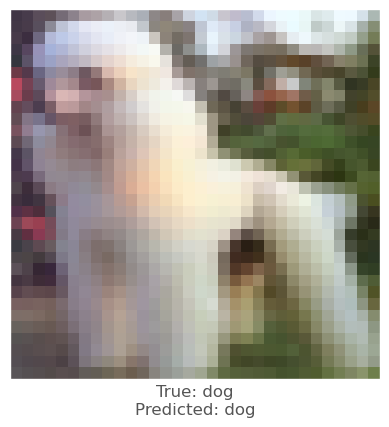



-0.003011763
0.0039892197
-0.0030032396
vr, vg, vb :   0.3493659496307373 -1.5161854028701782 0.503052830696106
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.66630185
row index :  0
2th round's confidence : 0th 0.6639917
predicted class :  dog
predicted class's confidence :  0.6639917
Lopt is :  1


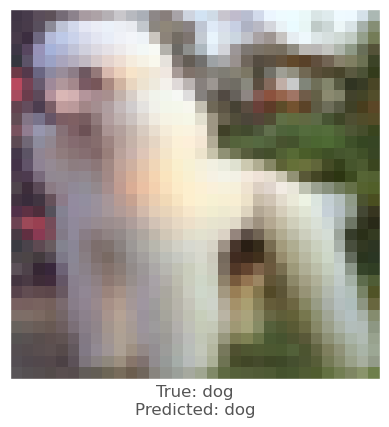



-0.0037452579
-0.0021902323
-0.0028578043
vr, vg, vb :   1.0149648785591125 0.5935529470443726 0.7744649648666382
beam_perturbed_confidence temp :  0.7213762
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7213762
beam_perturbed_confidence temp :  0.7213762
beam_perturbed_confidence temp :  0.7233168
beam_perturbed_confidence temp :  0.7213762
row index :  0
2th round's confidence : 1th 0.7213762
predicted class :  dog
predicted class's confidence :  0.7213762
Lopt is :  5


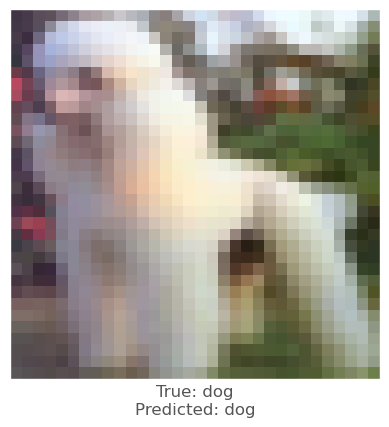



0.0012604594
0.010183573
0.0004364252
vr, vg, vb :   -1.5778173208236694 -3.9916213750839233 -1.4260627031326294
beam_perturbed_confidence temp :  0.66329145
beam_perturbed_confidence temp :  0.6494973
beam_perturbed_confidence temp :  0.6658196
beam_perturbed_confidence temp :  0.6624332
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.6580762
beam_perturbed_confidence temp :  0.67309016
row index :  1
2th round's confidence : 2th 0.6494973
predicted class :  dog
predicted class's confidence :  0.6494973
Lopt is :  5


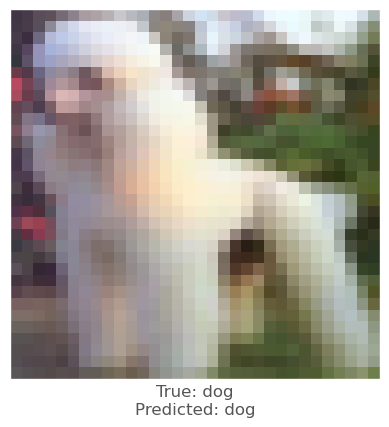



0.0014811158
0.008690894
0.0049380064
vr, vg, vb :   -0.40919405221939087 -2.014921009540558 -1.022821843624115
beam_perturbed_confidence temp :  0.693114
beam_perturbed_confidence temp :  0.68441105
beam_perturbed_confidence temp :  0.6894521
beam_perturbed_confidence temp :  0.6848974
beam_perturbed_confidence temp :  0.6895702
beam_perturbed_confidence temp :  0.6813179
beam_perturbed_confidence temp :  0.68165886
row index :  5
2th round's confidence : 3th 0.6813179
predicted class :  dog
predicted class's confidence :  0.6813179
Lopt is :  16


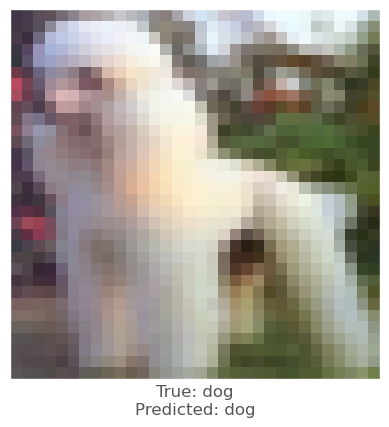



0.003614843
0.009560823
0.0058009624
vr, vg, vb :   -0.8528622984886169 -2.4110755920410156 -1.4696680307388306
beam_perturbed_confidence temp :  0.7516681
beam_perturbed_confidence temp :  0.7395419
beam_perturbed_confidence temp :  0.7479137
beam_perturbed_confidence temp :  0.7369143
beam_perturbed_confidence temp :  0.74671656
beam_perturbed_confidence temp :  0.73302186
beam_perturbed_confidence temp :  0.7288036
row index :  6
2th round's confidence : 4th 0.7288036
predicted class :  dog
predicted class's confidence :  0.7288036
Lopt is :  7


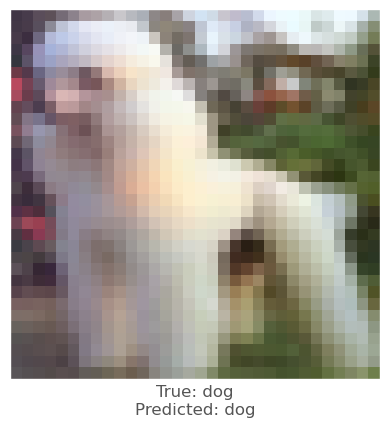



-0.003011763
0.0039892197
-0.0030032396
vr, vg, vb :   0.6156056642532348 -1.7634888291358948 0.7530715107917786
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.66630185
row index :  0
3th round's confidence : 0th 0.6639917
predicted class :  dog
predicted class's confidence :  0.6639917
Lopt is :  1


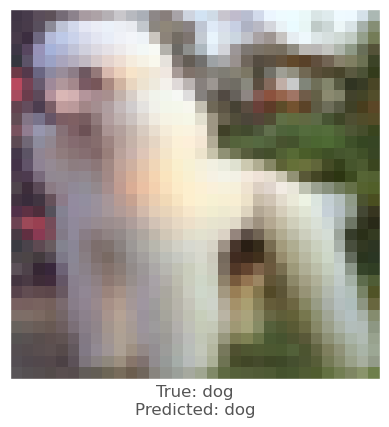



-0.006234288
-0.0051083565
-0.004676163
vr, vg, vb :   1.536897212266922 1.045033299922943 1.1646347880363463
beam_perturbed_confidence temp :  0.7170825
beam_perturbed_confidence temp :  0.7175867
beam_perturbed_confidence temp :  0.71831226
beam_perturbed_confidence temp :  0.7123888
beam_perturbed_confidence temp :  0.71291757
beam_perturbed_confidence temp :  0.7133303
beam_perturbed_confidence temp :  0.70797604
row index :  6
3th round's confidence : 1th 0.70797604
predicted class :  dog
predicted class's confidence :  0.70797604
Lopt is :  4


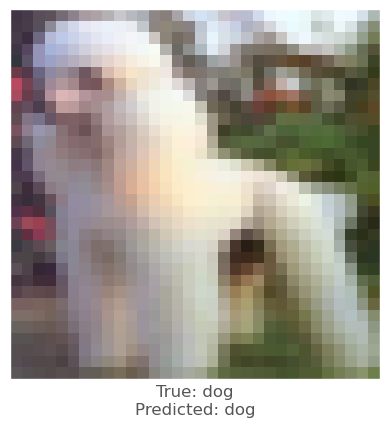



-0.008748591
-0.0014920235
-0.0070203543
vr, vg, vb :   -0.5451764941215516 -3.4432568907737733 -0.5814210057258606
beam_perturbed_confidence temp :  0.65495485
beam_perturbed_confidence temp :  0.66851884
beam_perturbed_confidence temp :  0.65385365
beam_perturbed_confidence temp :  0.6769304
beam_perturbed_confidence temp :  0.6600826
beam_perturbed_confidence temp :  0.6742367
beam_perturbed_confidence temp :  0.683426
row index :  2
3th round's confidence : 2th 0.65385365
predicted class :  dog
predicted class's confidence :  0.65385365
Lopt is :  5


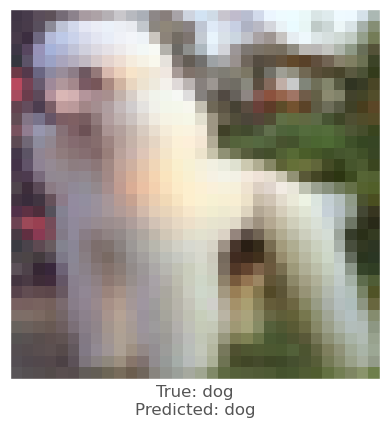



-0.0005118251
0.0050131083
0.0030784607
vr, vg, vb :   -0.31709213852882384 -2.3147397339344025 -1.2283857285976412
beam_perturbed_confidence temp :  0.68165886
beam_perturbed_confidence temp :  0.6722547
beam_perturbed_confidence temp :  0.6784046
beam_perturbed_confidence temp :  0.6727123
beam_perturbed_confidence temp :  0.67857677
beam_perturbed_confidence temp :  0.6701575
beam_perturbed_confidence temp :  0.6705175
row index :  5
3th round's confidence : 3th 0.6701575
predicted class :  dog
predicted class's confidence :  0.6701575
Lopt is :  19


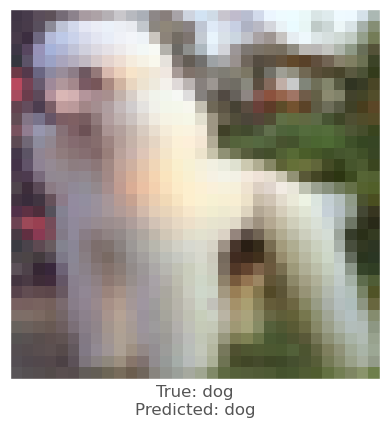



0.0086708665
0.016933203
0.0086811185
vr, vg, vb :   -1.6346627175807953 -3.8632883071899413 -2.1908130764961244
beam_perturbed_confidence temp :  0.7212217
beam_perturbed_confidence temp :  0.6971116
beam_perturbed_confidence temp :  0.71661353
beam_perturbed_confidence temp :  0.6867601
beam_perturbed_confidence temp :  0.7108531
beam_perturbed_confidence temp :  0.6854976
beam_perturbed_confidence temp :  0.6789497
row index :  6
3th round's confidence : 4th 0.6789497
predicted class :  dog
predicted class's confidence :  0.6789497
Lopt is :  5


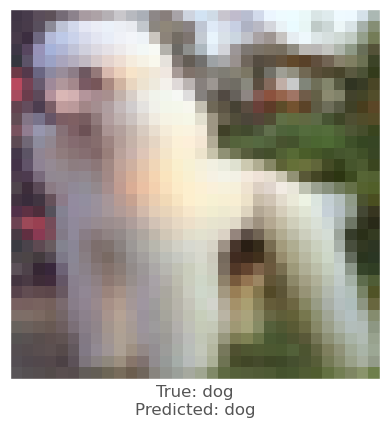



-0.003011763
0.0039892197
-0.0030032396
vr, vg, vb :   0.8552214074134826 -1.9860619127750396 0.9780883228778839
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.6639917
beam_perturbed_confidence temp :  0.66630185
beam_perturbed_confidence temp :  0.66630185
row index :  0
4th round's confidence : 0th 0.6639917
predicted class :  dog
predicted class's confidence :  0.6639917
Lopt is :  1


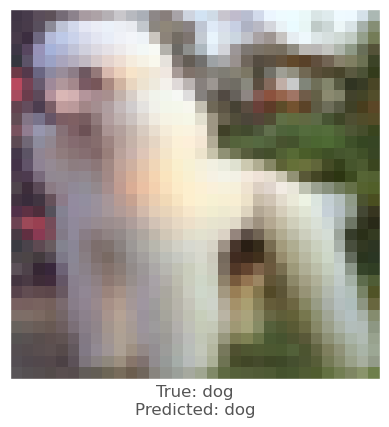



-0.0111092925
-0.01031214
-0.008596778
vr, vg, vb :   2.494136741757393 1.9717439687252045 1.9078491008281708
beam_perturbed_confidence temp :  0.694364
beam_perturbed_confidence temp :  0.7026054
beam_perturbed_confidence temp :  0.70379204
beam_perturbed_confidence temp :  0.68787986
beam_perturbed_confidence temp :  0.6895901
beam_perturbed_confidence temp :  0.6985289
beam_perturbed_confidence temp :  0.6838818
row index :  6
4th round's confidence : 1th 0.6838818
predicted class :  dog
predicted class's confidence :  0.6838818
Lopt is :  3


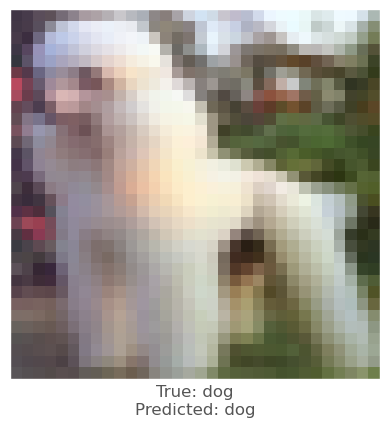



-0.0110599995
-0.0040609837
-0.008578956
vr, vg, vb :   0.6153411018848418 -2.6928328359127045 0.33461670756340023
beam_perturbed_confidence temp :  0.65385365
beam_perturbed_confidence temp :  0.6674276
beam_perturbed_confidence temp :  0.65385365
beam_perturbed_confidence temp :  0.6674276
beam_perturbed_confidence temp :  0.65385365
beam_perturbed_confidence temp :  0.6674276
beam_perturbed_confidence temp :  0.6674276
row index :  0
4th round's confidence : 2th 0.65385365
predicted class :  dog
predicted class's confidence :  0.65385365
Lopt is :  5


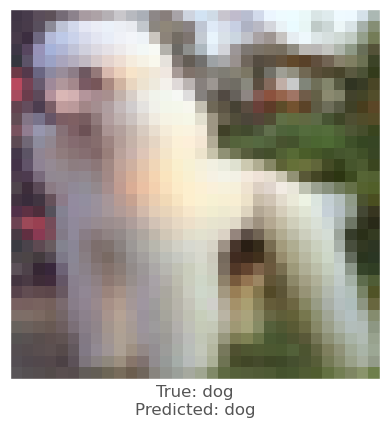



-0.0015122294
0.0054652095
0.001973927
vr, vg, vb :   -0.1341599804162979 -2.6297867089509963 -1.3029398578405382
beam_perturbed_confidence temp :  0.6705175
beam_perturbed_confidence temp :  0.6607534
beam_perturbed_confidence temp :  0.66799396
beam_perturbed_confidence temp :  0.66164476
beam_perturbed_confidence temp :  0.66872436
beam_perturbed_confidence temp :  0.6582452
beam_perturbed_confidence temp :  0.65905935
row index :  5
4th round's confidence : 3th 0.6582452
predicted class :  dog
predicted class's confidence :  0.6582452
Lopt is :  22


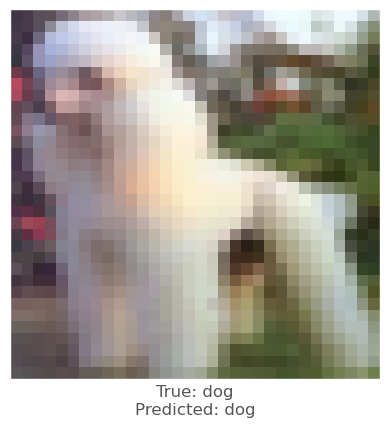



0.006920874
0.015687943
0.003729701
vr, vg, vb :   -2.1632838577032087 -5.045753726959228 -2.344701873064041
beam_perturbed_confidence temp :  0.6715865
beam_perturbed_confidence temp :  0.6418492
beam_perturbed_confidence temp :  0.67398936
beam_perturbed_confidence temp :  0.6468082
beam_perturbed_confidence temp :  0.67117125
beam_perturbed_confidence temp :  0.64575374
beam_perturbed_confidence temp :  0.6623254
row index :  1
4th round's confidence : 4th 0.6418492
predicted class :  dog
predicted class's confidence :  0.6418492
Lopt is :  6


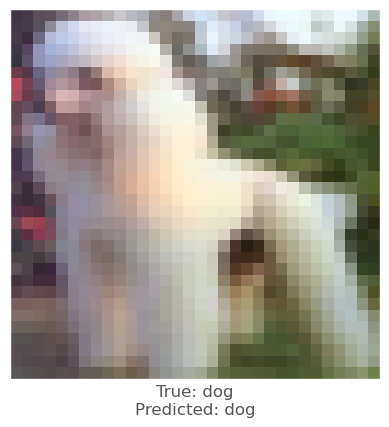



-0.003011763
0.0039892197
-0.0030032396
vr, vg, vb :   1.0708755762577056 -2.1863776880502703 1.1806034537553787
beam_perturbed_confidence temp :  0.6647414
beam_perturbed_confidence temp :  0.66831434
beam_perturbed_confidence temp :  0.66349304
beam_perturbed_confidence temp :  0.6621777
beam_perturbed_confidence temp :  0.66482806
beam_perturbed_confidence temp :  0.66347677
beam_perturbed_confidence temp :  0.65796095
row index :  6
5th round's confidence : 0th 0.65796095
predicted class :  dog
predicted class's confidence :  0.65796095
Lopt is :  4


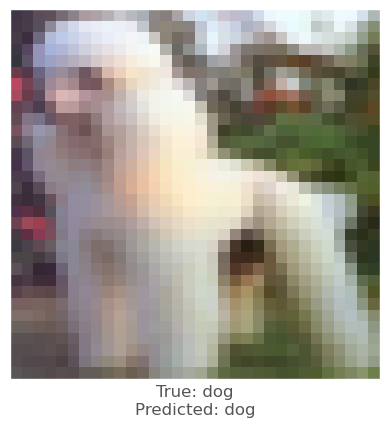



-0.012138724
-0.008272052
-0.007424891
vr, vg, vb :   3.458595500290394 2.60177475297451 2.4595532902479174
beam_perturbed_confidence temp :  0.6664673
beam_perturbed_confidence temp :  0.67877585
beam_perturbed_confidence temp :  0.676497
beam_perturbed_confidence temp :  0.6665815
beam_perturbed_confidence temp :  0.658996
beam_perturbed_confidence temp :  0.67159665
beam_perturbed_confidence temp :  0.6657805
row index :  4
5th round's confidence : 1th 0.658996
predicted class :  dog
predicted class's confidence :  0.658996
Lopt is :  3


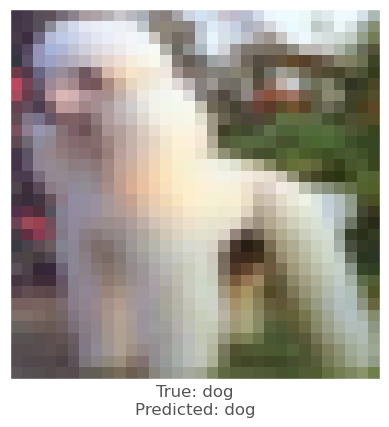



-0.0110599995
-0.0040609837
-0.008578956
vr, vg, vb :   1.659806938290596 -2.017451186537743 1.159050649523735
beam_perturbed_confidence temp :  0.6490226
beam_perturbed_confidence temp :  0.6674276
beam_perturbed_confidence temp :  0.6494973
beam_perturbed_confidence temp :  0.6586463
beam_perturbed_confidence temp :  0.64620626
beam_perturbed_confidence temp :  0.6615957
beam_perturbed_confidence temp :  0.6538881
row index :  4
5th round's confidence : 2th 0.64620626
predicted class :  dog
predicted class's confidence :  0.64620626
Lopt is :  5


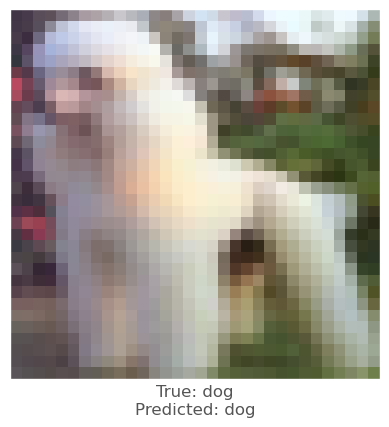



-0.0013181567
0.006242752
0.002240479
vr, vg, vb :   0.011071689546108252 -2.991083245575428 -1.3966937713027003
beam_perturbed_confidence temp :  0.6582452
beam_perturbed_confidence temp :  0.6481158
beam_perturbed_confidence temp :  0.65590495
beam_perturbed_confidence temp :  0.6481158
beam_perturbed_confidence temp :  0.65590495
beam_perturbed_confidence temp :  0.6456287
beam_perturbed_confidence temp :  0.6456287
row index :  5
5th round's confidence : 3th 0.6456287
predicted class :  dog
predicted class's confidence :  0.6456287
Lopt is :  25


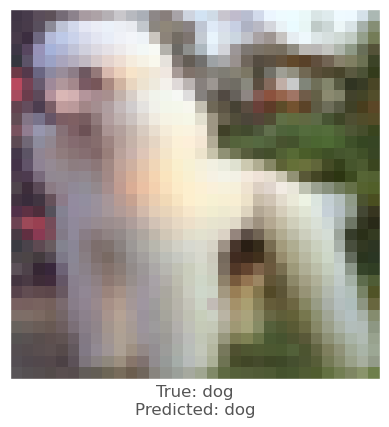



0.004446447
0.010711014
0.0011133552
vr, vg, vb :   -2.3916001614928244 -5.612279781341552 -2.2215672017335892
beam_perturbed_confidence temp :  0.6468082
beam_perturbed_confidence temp :  0.6583561
beam_perturbed_confidence temp :  0.64575374
beam_perturbed_confidence temp :  0.68180823
beam_perturbed_confidence temp :  0.6623254
beam_perturbed_confidence temp :  0.6782984
beam_perturbed_confidence temp :  0.6978244
row index :  2
5th round's confidence : 4th 0.64575374
predicted class :  dog
predicted class's confidence :  0.64575374
Lopt is :  6


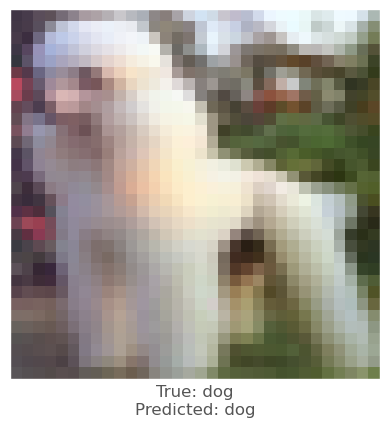



-0.0103420615
-0.0030971766
-0.008559585
vr, vg, vb :   1.9979941705942155 -1.6580222640633586 1.9185015701413155
beam_perturbed_confidence temp :  0.6531347
beam_perturbed_confidence temp :  0.6649372
beam_perturbed_confidence temp :  0.6536181
beam_perturbed_confidence temp :  0.6571957
beam_perturbed_confidence temp :  0.65002906
beam_perturbed_confidence temp :  0.6592661
beam_perturbed_confidence temp :  0.6515211
row index :  4
6th round's confidence : 0th 0.65002906
predicted class :  dog
predicted class's confidence :  0.65002906
Lopt is :  4


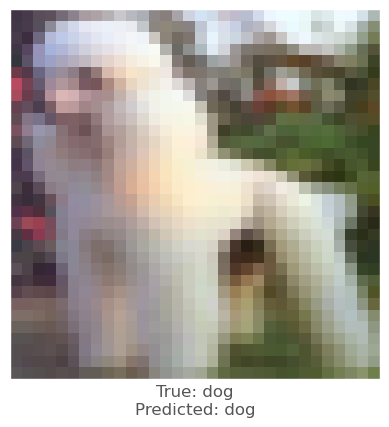



-0.009070098
0.00036728382
-0.0071124434
vr, vg, vb :   4.019745790272951 2.3048688955664636 2.9248423059344293
beam_perturbed_confidence temp :  0.65818286
beam_perturbed_confidence temp :  0.6657805
beam_perturbed_confidence temp :  0.65447456
beam_perturbed_confidence temp :  0.6682582
beam_perturbed_confidence temp :  0.6583956
beam_perturbed_confidence temp :  0.6662628
beam_perturbed_confidence temp :  0.6708166
row index :  2
6th round's confidence : 1th 0.65447456
predicted class :  dog
predicted class's confidence :  0.65447456
Lopt is :  3


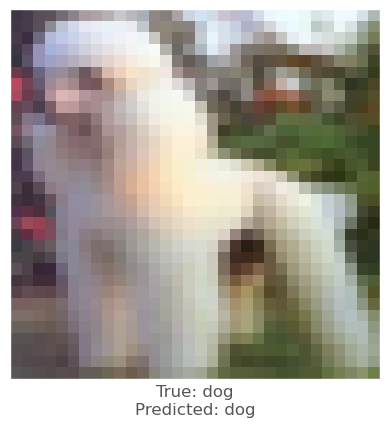



-0.004179299
0.0038833022
-0.005499482
vr, vg, vb :   1.911756132233143 -2.204036289060116 1.5930938000559807
beam_perturbed_confidence temp :  0.645318
beam_perturbed_confidence temp :  0.6538881
beam_perturbed_confidence temp :  0.6435231
beam_perturbed_confidence temp :  0.64560366
beam_perturbed_confidence temp :  0.6454987
beam_perturbed_confidence temp :  0.6486406
beam_perturbed_confidence temp :  0.6408386
row index :  6
6th round's confidence : 2th 0.6408386
predicted class :  dog
predicted class's confidence :  0.6408386
Lopt is :  8


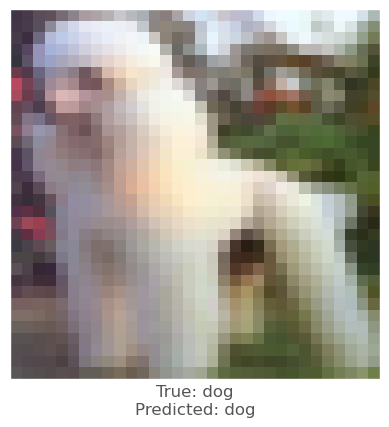



-0.0012261868
0.007181525
0.0024276972
vr, vg, vb :   0.13258319582343103 -3.410127444058657 -1.4997941123425964
beam_perturbed_confidence temp :  0.6456287
beam_perturbed_confidence temp :  0.62829113
beam_perturbed_confidence temp :  0.64285535
beam_perturbed_confidence temp :  0.62829113
beam_perturbed_confidence temp :  0.64285535
beam_perturbed_confidence temp :  0.62457037
beam_perturbed_confidence temp :  0.62457037
row index :  5
6th round's confidence : 3th 0.62457037
predicted class :  dog
predicted class's confidence :  0.62457037
Lopt is :  29


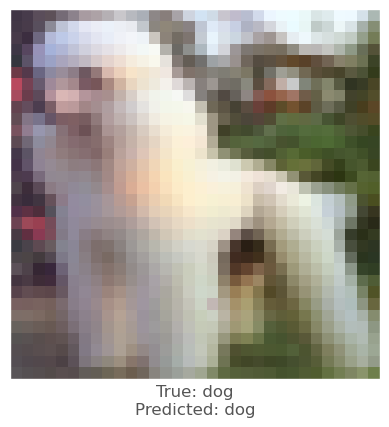



-0.006296158
0.0013098121
-0.0049889684
vr, vg, vb :   -1.5228243616521357 -5.182033010101319 -1.5005136443257332
beam_perturbed_confidence temp :  0.65472907
beam_perturbed_confidence temp :  0.6782984
beam_perturbed_confidence temp :  0.6515862
beam_perturbed_confidence temp :  0.69211537
beam_perturbed_confidence temp :  0.6646364
beam_perturbed_confidence temp :  0.69107705
beam_perturbed_confidence temp :  0.7023892
row index :  2
6th round's confidence : 4th 0.6515862
predicted class :  dog
predicted class's confidence :  0.6515862
Lopt is :  6


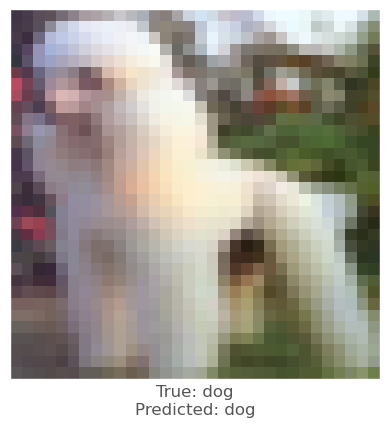



-0.003921747
0.0047572255
-0.0051365495
vr, vg, vb :   2.1903694742989543 -1.967942589002848 2.2403063604080677
beam_perturbed_confidence temp :  0.65178037
beam_perturbed_confidence temp :  0.6515211
beam_perturbed_confidence temp :  0.6476985
beam_perturbed_confidence temp :  0.64315236
beam_perturbed_confidence temp :  0.65328985
beam_perturbed_confidence temp :  0.6431476
beam_perturbed_confidence temp :  0.6393794
row index :  6
7th round's confidence : 0th 0.6393794
predicted class :  dog
predicted class's confidence :  0.6393794
Lopt is :  6


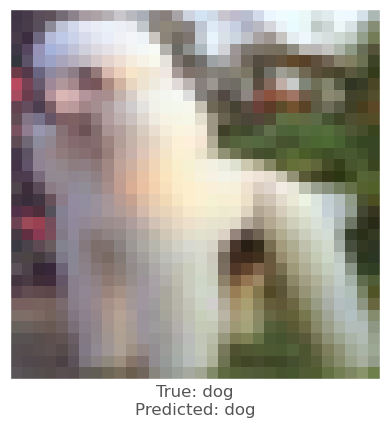



-0.0013243556
0.00715816
-0.0016487241
vr, vg, vb :   3.750206771472097 1.3585659850442413 2.7972304832541943
beam_perturbed_confidence temp :  0.65793806
beam_perturbed_confidence temp :  0.66029286
beam_perturbed_confidence temp :  0.65459645
beam_perturbed_confidence temp :  0.66250014
beam_perturbed_confidence temp :  0.6582835
beam_perturbed_confidence temp :  0.661744
beam_perturbed_confidence temp :  0.66285557
row index :  2
7th round's confidence : 1th 0.65459645
predicted class :  dog
predicted class's confidence :  0.65459645
Lopt is :  3


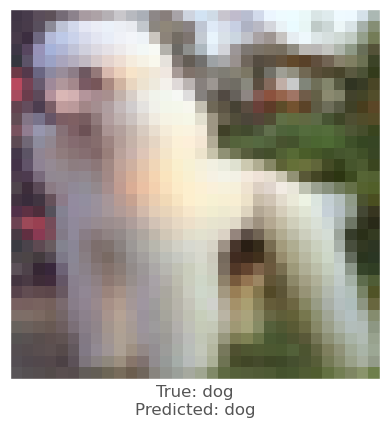



-0.011270225
-0.006306708
-0.008129716
vr, vg, vb :   2.8476030238163474 -1.352961874250174 2.2467560119998455
beam_perturbed_confidence temp :  0.635209
beam_perturbed_confidence temp :  0.6525021
beam_perturbed_confidence temp :  0.6349704
beam_perturbed_confidence temp :  0.6358299
beam_perturbed_confidence temp :  0.632592
beam_perturbed_confidence temp :  0.64182115
beam_perturbed_confidence temp :  0.629264
row index :  6
7th round's confidence : 2th 0.629264
predicted class :  dog
predicted class's confidence :  0.629264
Lopt is :  10


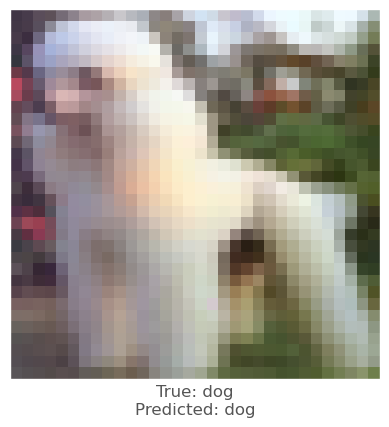



0.00024658442
0.011095524
0.0034452677
vr, vg, vb :   0.09466643469750884 -4.178667083075643 -1.6943414688390497
beam_perturbed_confidence temp :  0.62457037
beam_perturbed_confidence temp :  0.5885316
beam_perturbed_confidence temp :  0.621686
beam_perturbed_confidence temp :  0.5885316
beam_perturbed_confidence temp :  0.621686
beam_perturbed_confidence temp :  0.5828066
beam_perturbed_confidence temp :  0.5828066
row index :  5
7th round's confidence : 3th 0.5828066
predicted class :  dog
predicted class's confidence :  0.5828066
Lopt is :  34


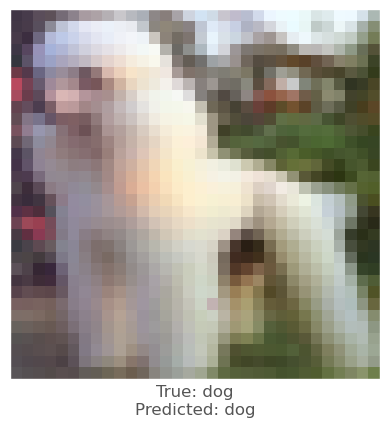



-0.0110170245
-0.004182279
-0.00829643
vr, vg, vb :   -0.2688394737809896 -4.245601798095703 -0.5208192688000202
beam_perturbed_confidence temp :  0.6578727
beam_perturbed_confidence temp :  0.68448955
beam_perturbed_confidence temp :  0.6559688
beam_perturbed_confidence temp :  0.6922002
beam_perturbed_confidence temp :  0.6622548
beam_perturbed_confidence temp :  0.69047534
beam_perturbed_confidence temp :  0.6972311
row index :  2
7th round's confidence : 4th 0.6559688
predicted class :  dog
predicted class's confidence :  0.6559688
Lopt is :  6


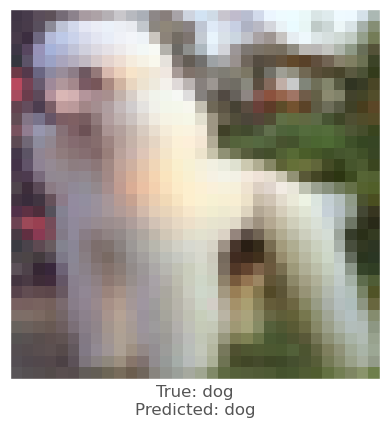



0.0024738312
0.009033203
-0.00019180775
vr, vg, vb :   1.7239494091932777 -2.6744686426025632 2.035456499055982
beam_perturbed_confidence temp :  0.6426981
beam_perturbed_confidence temp :  0.6410046
beam_perturbed_confidence temp :  0.64112926
beam_perturbed_confidence temp :  0.63475066
beam_perturbed_confidence temp :  0.64497447
beam_perturbed_confidence temp :  0.6321377
beam_perturbed_confidence temp :  0.6292687
row index :  6
8th round's confidence : 0th 0.6292687
predicted class :  dog
predicted class's confidence :  0.6292687
Lopt is :  9


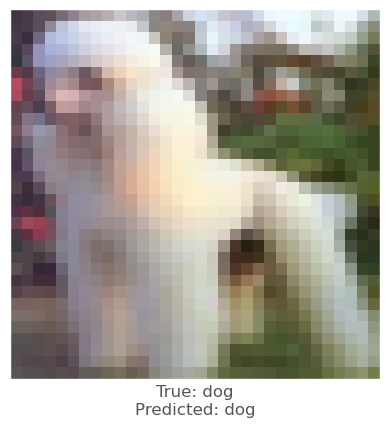



0.004449129
0.013745844
0.0010263324
vr, vg, vb :   2.9302731838634615 -0.15187504987680867 2.41487419709003
beam_perturbed_confidence temp :  0.6582003
beam_perturbed_confidence temp :  0.64799815
beam_perturbed_confidence temp :  0.6560863
beam_perturbed_confidence temp :  0.65281063
beam_perturbed_confidence temp :  0.65797436
beam_perturbed_confidence temp :  0.64837825
beam_perturbed_confidence temp :  0.6533258
row index :  1
8th round's confidence : 1th 0.64799815
predicted class :  dog
predicted class's confidence :  0.64799815
Lopt is :  4


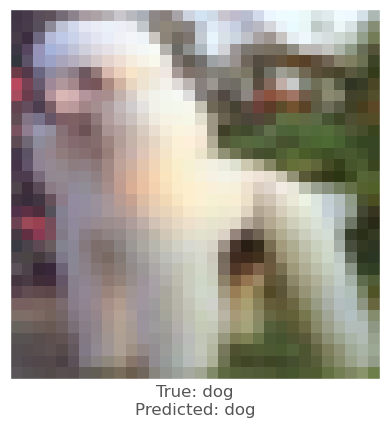



-0.00738132
-0.0031752586
-0.0054535866
vr, vg, vb :   3.300974721404195 -0.9001398231776956 2.567439068636775
beam_perturbed_confidence temp :  0.62794256
beam_perturbed_confidence temp :  0.63229626
beam_perturbed_confidence temp :  0.62438405
beam_perturbed_confidence temp :  0.6201791
beam_perturbed_confidence temp :  0.6329773
beam_perturbed_confidence temp :  0.6245051
beam_perturbed_confidence temp :  0.6238824
row index :  3
8th round's confidence : 2th 0.6201791
predicted class :  dog
predicted class's confidence :  0.6201791
Lopt is :  11


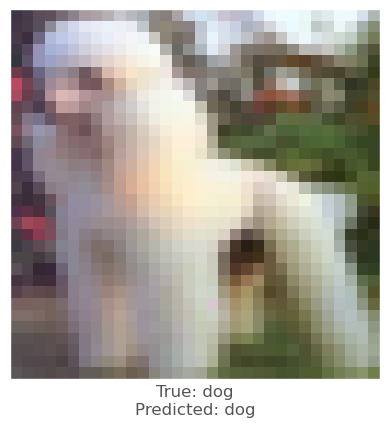



0.0028073192
0.017407417
0.005815327
vr, vg, vb :   -0.19553212519985436 -5.5015421045044075 -2.1064400387062436
beam_perturbed_confidence temp :  0.58136
beam_perturbed_confidence temp :  0.53563493
beam_perturbed_confidence temp :  0.5741594
beam_perturbed_confidence temp :  0.536012
beam_perturbed_confidence temp :  0.573598
beam_perturbed_confidence temp :  0.5290295
beam_perturbed_confidence temp :  0.52932113
row index :  5
8th round's confidence : 3th 0.5290295
predicted class :  dog
predicted class's confidence :  0.5290295
Lopt is :  40


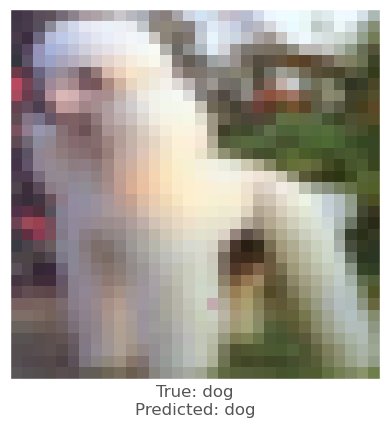



-0.012110412
-0.0055115223
-0.008428514
vr, vg, vb :   0.9690856856790185 -3.2698893889770506 0.37411405845534806
beam_perturbed_confidence temp :  0.6559688
beam_perturbed_confidence temp :  0.6828503
beam_perturbed_confidence temp :  0.6559688
beam_perturbed_confidence temp :  0.6828503
beam_perturbed_confidence temp :  0.6559688
beam_perturbed_confidence temp :  0.6828503
beam_perturbed_confidence temp :  0.6828503
row index :  0
8th round's confidence : 4th 0.6559688
predicted class :  dog
predicted class's confidence :  0.6559688
Lopt is :  6


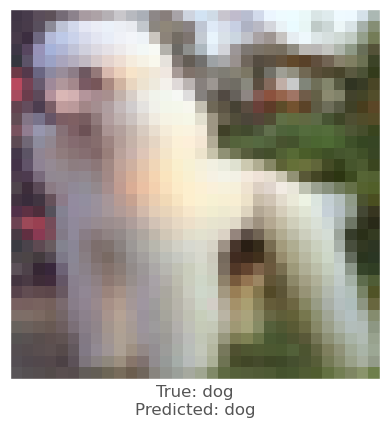



-0.0055993795
0.00028431416
-0.0052244663
vr, vg, vb :   2.1114924222229243 -2.4354531939001682 2.3543574815356374
beam_perturbed_confidence temp :  0.630443
beam_perturbed_confidence temp :  0.6409692
beam_perturbed_confidence temp :  0.62641096
beam_perturbed_confidence temp :  0.62620366
beam_perturbed_confidence temp :  0.63518846
beam_perturbed_confidence temp :  0.6300838
beam_perturbed_confidence temp :  0.6209066
row index :  6
9th round's confidence : 0th 0.6209066
predicted class :  dog
predicted class's confidence :  0.6209066
Lopt is :  12


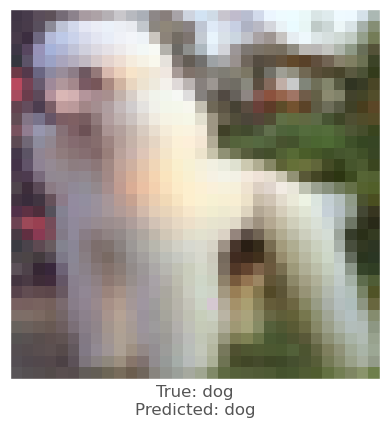



-0.00076031685
0.0077631474
-0.0023305416
vr, vg, vb :   2.7132775503526037 -0.9130022803017255 2.4064409384528043
beam_perturbed_confidence temp :  0.65281063
beam_perturbed_confidence temp :  0.6468333
beam_perturbed_confidence temp :  0.64837825
beam_perturbed_confidence temp :  0.6454987
beam_perturbed_confidence temp :  0.6533258
beam_perturbed_confidence temp :  0.6406479
beam_perturbed_confidence temp :  0.64722484
row index :  5
9th round's confidence : 1th 0.6406479
predicted class :  dog
predicted class's confidence :  0.6406479
Lopt is :  5


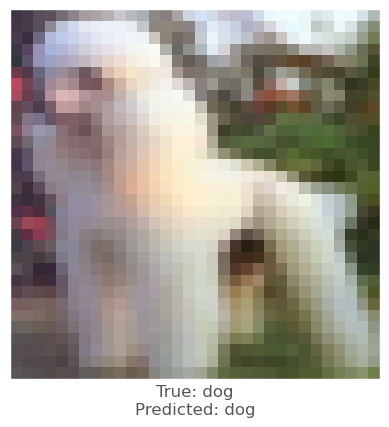



-0.00096559525
0.0071909428
-0.0018127561
vr, vg, vb :   3.0674367737999084 -1.5292201172881486 2.491970767928493
beam_perturbed_confidence temp :  0.63381594
beam_perturbed_confidence temp :  0.62196463
beam_perturbed_confidence temp :  0.6238824
beam_perturbed_confidence temp :  0.6156039
beam_perturbed_confidence temp :  0.63699526
beam_perturbed_confidence temp :  0.61578405
beam_perturbed_confidence temp :  0.62050027
row index :  3
9th round's confidence : 2th 0.6156039
predicted class :  dog
predicted class's confidence :  0.6156039
Lopt is :  13


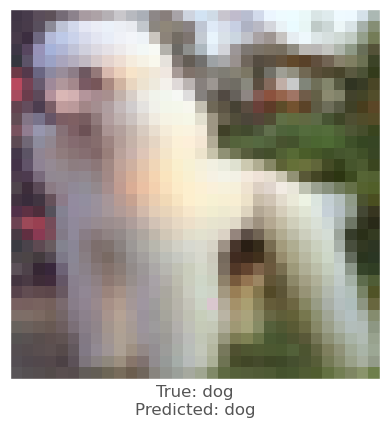



-0.0006351471
0.015111506
0.004860997
vr, vg, vb :   -0.11246420320721268 -6.462538492579968 -2.3818957548368402
beam_perturbed_confidence temp :  0.52932113
beam_perturbed_confidence temp :  0.47766784
beam_perturbed_confidence temp :  0.52092856
beam_perturbed_confidence temp :  0.476604
beam_perturbed_confidence temp :  0.5213543
beam_perturbed_confidence temp :  0.46932858
beam_perturbed_confidence temp :  0.46744686
row index :  6
9th round's confidence : 3th 0.46744686
predicted class :  horse
predicted class's confidence :  0.52403414
Lopt is :  47


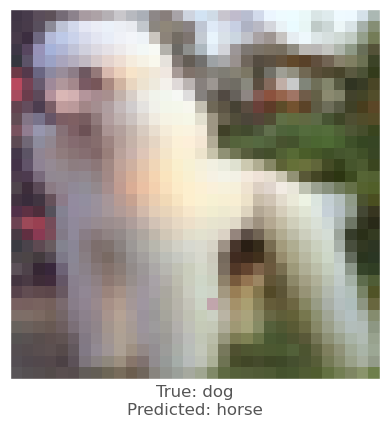




21th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  147 130 122
-0.0035765767
0.00043052435
-0.0046958327
vr, vg, vb :   0.35765767097473145 -0.04305243492126465 0.46958327293395996
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6659528
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6659528
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6659528
beam_perturbed_confidence temp :  0.6659528
row index :  1
0th round's confidence : 0th 0.6659528
predicted class :  dog
predicted class's confidence :  0.6659528
Lopt is :  1


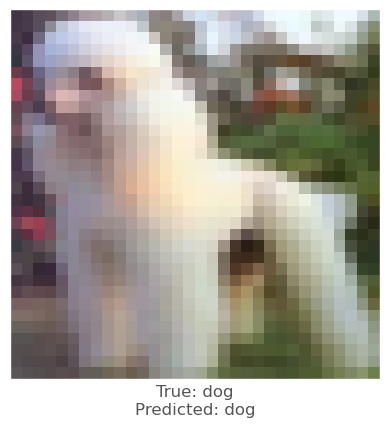



0.011653662
0.008223832
-0.0024146438
vr, vg, vb :   -1.1653661727905273 -0.8223831653594971 0.24146437644958496
beam_perturbed_confidence temp :  0.5794957
beam_perturbed_confidence temp :  0.58665586
beam_perturbed_confidence temp :  0.5898796
beam_perturbed_confidence temp :  0.5769149
beam_perturbed_confidence temp :  0.5794957
beam_perturbed_confidence temp :  0.58665586
beam_perturbed_confidence temp :  0.5769149
row index :  3
0th round's confidence : 1th 0.5769149
predicted class :  dog
predicted class's confidence :  0.5769149
Lopt is :  7


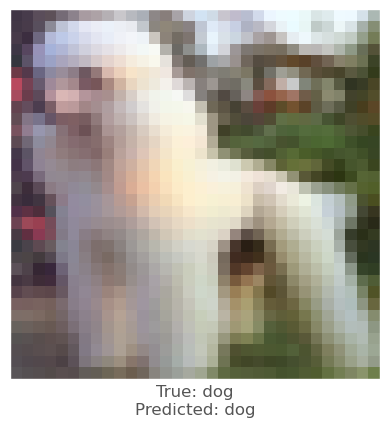



-0.020914078
-0.015400052
-0.018174231
vr, vg, vb :   2.0914077758789062 1.5400052070617676 1.8174231052398682
beam_perturbed_confidence temp :  0.5007072
beam_perturbed_confidence temp :  0.5110001
beam_perturbed_confidence temp :  0.50907713
beam_perturbed_confidence temp :  0.49565765
beam_perturbed_confidence temp :  0.4940744
beam_perturbed_confidence temp :  0.5023564
beam_perturbed_confidence temp :  0.48931253
row index :  6
0th round's confidence : 2th 0.48931253
predicted class :  horse
predicted class's confidence :  0.50331914
Lopt is :  7


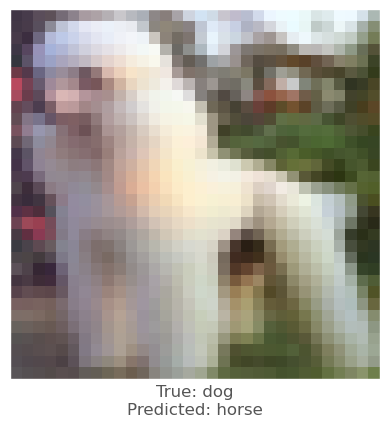




22th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  202 205 189
-0.0027462244
-0.0013753772
0.004541993
vr, vg, vb :   0.27462244033813477 0.13753771781921387 -0.45419931411743164
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.666848
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.666848
beam_perturbed_confidence temp :  0.666848
beam_perturbed_confidence temp :  0.666848
row index :  2
0th round's confidence : 0th 0.666848
predicted class :  dog
predicted class's confidence :  0.666848
Lopt is :  1


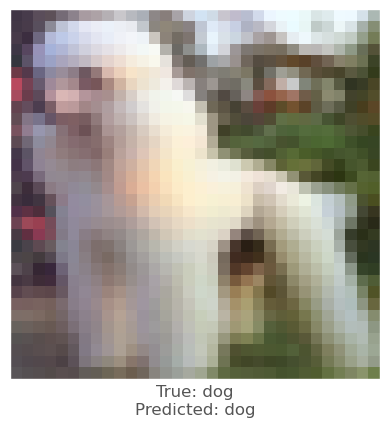



0.01754862
0.024267793
0.015519738
vr, vg, vb :   -1.7548620700836182 -2.426779270172119 -1.551973819732666
beam_perturbed_confidence temp :  0.5429197
beam_perturbed_confidence temp :  0.5247127
beam_perturbed_confidence temp :  0.5459504
beam_perturbed_confidence temp :  0.50599355
beam_perturbed_confidence temp :  0.52567935
beam_perturbed_confidence temp :  0.5064964
beam_perturbed_confidence temp :  0.4878224
row index :  6
0th round's confidence : 1th 0.4878224
predicted class :  horse
predicted class's confidence :  0.5057422
Lopt is :  8


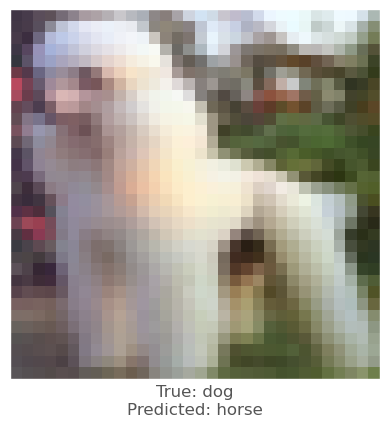




23th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  233 235 240
0.012577713
0.009498417
0.0021070838
vr, vg, vb :   -1.2577712535858154 -0.9498417377471924 -0.2107083797454834
beam_perturbed_confidence temp :  0.65456355
beam_perturbed_confidence temp :  0.6637419
beam_perturbed_confidence temp :  0.66751117
beam_perturbed_confidence temp :  0.6482883
beam_perturbed_confidence temp :  0.6525416
beam_perturbed_confidence temp :  0.66181964
beam_perturbed_confidence temp :  0.6463672
row index :  6
0th round's confidence : 0th 0.6463672
predicted class :  dog
predicted class's confidence :  0.6463672
Lopt is :  2


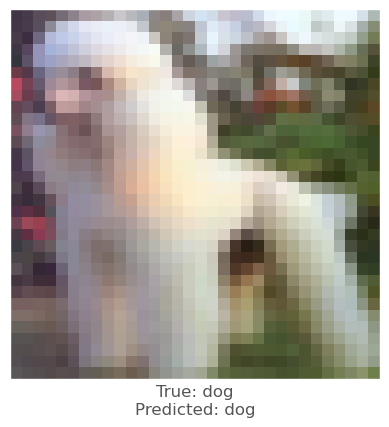



0.014172912
0.013731837
0.0034784079
vr, vg, vb :   -1.4172911643981934 -1.3731837272644043 -0.3478407859802246
beam_perturbed_confidence temp :  0.5859806
beam_perturbed_confidence temp :  0.58549947
beam_perturbed_confidence temp :  0.5995331
beam_perturbed_confidence temp :  0.5696456
beam_perturbed_confidence temp :  0.583433
beam_perturbed_confidence temp :  0.58342797
beam_perturbed_confidence temp :  0.5672319
row index :  6
0th round's confidence : 1th 0.5672319
predicted class :  dog
predicted class's confidence :  0.5672319
Lopt is :  7


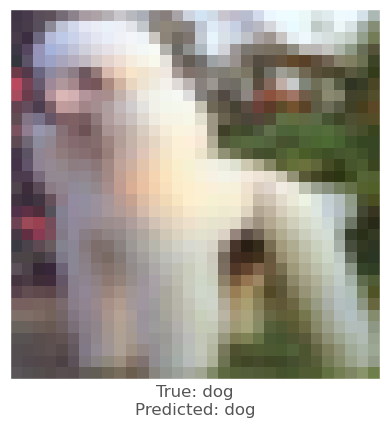



0.0051482916
0.0025229454
-0.0015000105
vr, vg, vb :   -0.514829158782959 -0.25229454040527344 0.15000104904174805
beam_perturbed_confidence temp :  0.6983518
beam_perturbed_confidence temp :  0.69976056
beam_perturbed_confidence temp :  0.7012049
beam_perturbed_confidence temp :  0.69731694
beam_perturbed_confidence temp :  0.6983518
beam_perturbed_confidence temp :  0.69976056
beam_perturbed_confidence temp :  0.69731694
row index :  3
0th round's confidence : 2th 0.69731694
predicted class :  dog
predicted class's confidence :  0.69731694
Lopt is :  5


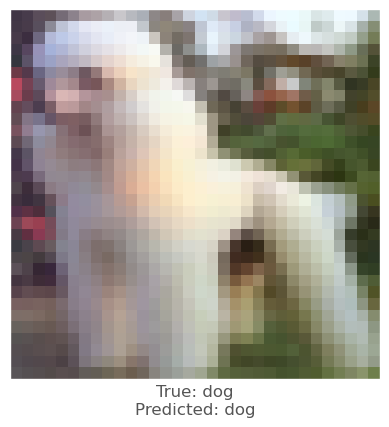



0.014960289
0.01645577
0.0056566
vr, vg, vb :   -1.4960289001464844 -1.6455769538879395 -0.5656599998474121
beam_perturbed_confidence temp :  0.50732994
beam_perturbed_confidence temp :  0.507142
beam_perturbed_confidence temp :  0.52010614
beam_perturbed_confidence temp :  0.49154148
beam_perturbed_confidence temp :  0.5046046
beam_perturbed_confidence temp :  0.5044274
beam_perturbed_confidence temp :  0.48855737
row index :  6
0th round's confidence : 3th 0.48855737
predicted class :  horse
predicted class's confidence :  0.50208783
Lopt is :  12


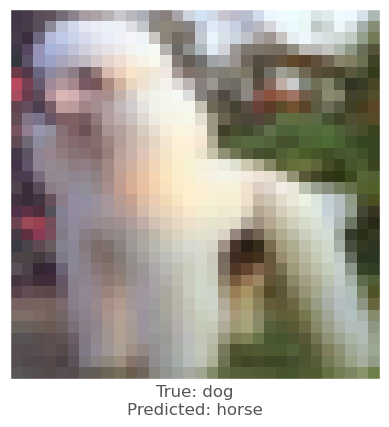




24th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  201 199 203
0.00039613247
-5.531311e-05
0.00024211407
vr, vg, vb :   -0.03961324691772461 0.00553131103515625 -0.024211406707763672
beam_perturbed_confidence temp :  0.6683827
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66845554
beam_perturbed_confidence temp :  0.6683827
beam_perturbed_confidence temp :  0.66777885
beam_perturbed_confidence temp :  0.66845554
beam_perturbed_confidence temp :  0.66777885
row index :  4
0th round's confidence : 0th 0.66777885
predicted class :  dog
predicted class's confidence :  0.66777885
Lopt is :  1


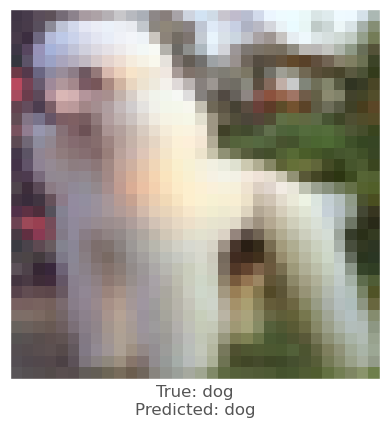



2.9742718e-05
0.0026997924
0.002004087
vr, vg, vb :   -0.002974271774291992 -0.26997923851013184 -0.2004086971282959
beam_perturbed_confidence temp :  0.65633523
beam_perturbed_confidence temp :  0.6549963
beam_perturbed_confidence temp :  0.65532404
beam_perturbed_confidence temp :  0.6550055
beam_perturbed_confidence temp :  0.6553424
beam_perturbed_confidence temp :  0.6539728
beam_perturbed_confidence temp :  0.65434957
row index :  5
0th round's confidence : 1th 0.6539728
predicted class :  dog
predicted class's confidence :  0.6539728
Lopt is :  6


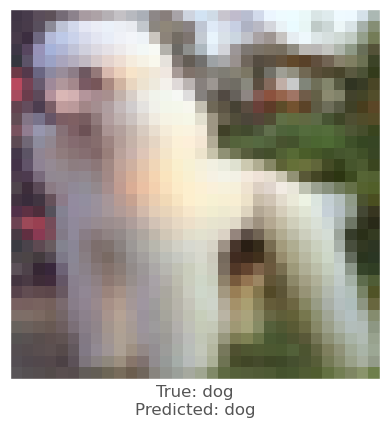



-0.0010961294
-0.00092351437
3.8027763e-05
vr, vg, vb :   0.10961294174194336 0.09235143661499023 -0.003802776336669922
beam_perturbed_confidence temp :  0.6598758
beam_perturbed_confidence temp :  0.6598758
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598758
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  2
0th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


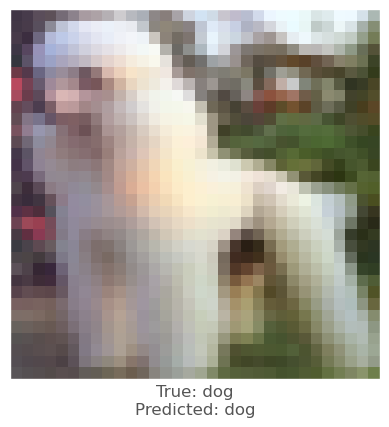



0.00231874
0.0048247576
0.003106296
vr, vg, vb :   -0.2318739891052246 -0.48247575759887695 -0.31062960624694824
beam_perturbed_confidence temp :  0.6386768
beam_perturbed_confidence temp :  0.63735616
beam_perturbed_confidence temp :  0.638517
beam_perturbed_confidence temp :  0.63469255
beam_perturbed_confidence temp :  0.6367647
beam_perturbed_confidence temp :  0.6353894
beam_perturbed_confidence temp :  0.6322762
row index :  6
0th round's confidence : 3th 0.6322762
predicted class :  dog
predicted class's confidence :  0.6322762
Lopt is :  11


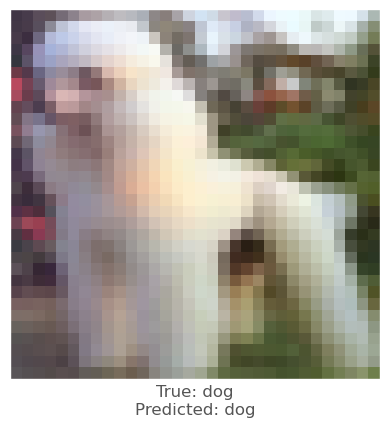



-0.0007250309
-0.0003620386
0.0005210042
vr, vg, vb :   0.07250308990478516 0.036203861236572266 -0.052100419998168945
beam_perturbed_confidence temp :  0.6582874
beam_perturbed_confidence temp :  0.6582874
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.6582874
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.6580713
row index :  2
0th round's confidence : 4th 0.6580713
predicted class :  dog
predicted class's confidence :  0.6580713
Lopt is :  10


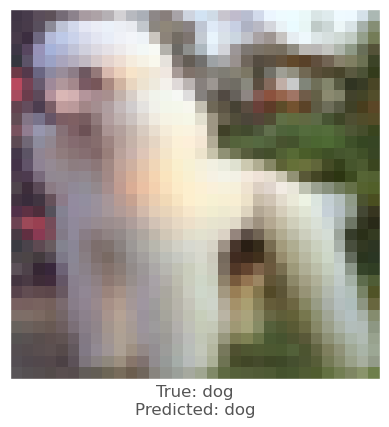



0.0014851689
0.00061154366
0.0012168288
vr, vg, vb :   -0.18416881561279297 -0.056176185607910156 -0.14347314834594727
beam_perturbed_confidence temp :  0.6669704
beam_perturbed_confidence temp :  0.6674562
beam_perturbed_confidence temp :  0.6671659
beam_perturbed_confidence temp :  0.6663395
beam_perturbed_confidence temp :  0.6660801
beam_perturbed_confidence temp :  0.6665841
beam_perturbed_confidence temp :  0.6654354
row index :  6
1th round's confidence : 0th 0.6654354
predicted class :  dog
predicted class's confidence :  0.6654354
Lopt is :  2


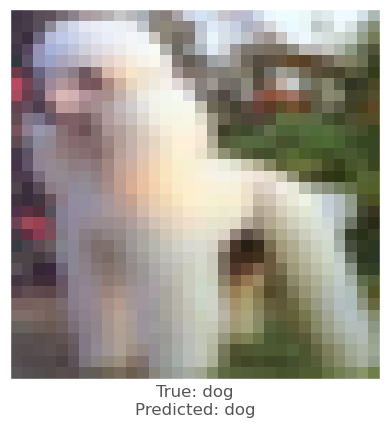



-0.00028938055
0.002186656
0.0016639829
vr, vg, vb :   0.026261210441589355 -0.4616469144821167 -0.3467661142349243
beam_perturbed_confidence temp :  0.6539728
beam_perturbed_confidence temp :  0.6531374
beam_perturbed_confidence temp :  0.6533323
beam_perturbed_confidence temp :  0.6531374
beam_perturbed_confidence temp :  0.6533323
beam_perturbed_confidence temp :  0.6528491
beam_perturbed_confidence temp :  0.6528491
row index :  5
1th round's confidence : 1th 0.6528491
predicted class :  dog
predicted class's confidence :  0.6528491
Lopt is :  7


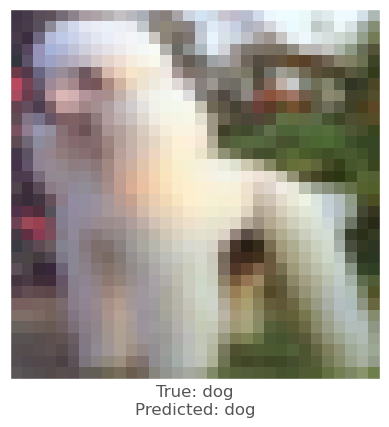



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.23963451385498047 0.19240140914916992 -0.001348257064819336
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.65989655
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.65989655
beam_perturbed_confidence temp :  0.65989655
beam_perturbed_confidence temp :  0.65989655
row index :  0
1th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


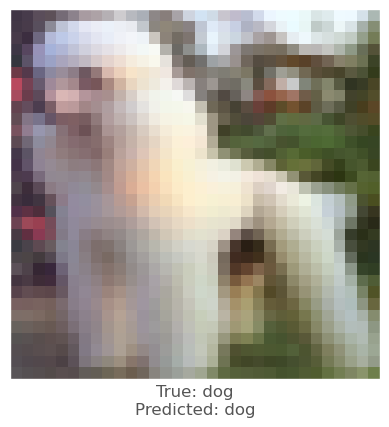



0.00635761
0.0092840195
0.0048528314
vr, vg, vb :   -0.8444476127624512 -1.3626301288604736 -0.7648497819900513
beam_perturbed_confidence temp :  0.6290318
beam_perturbed_confidence temp :  0.6228456
beam_perturbed_confidence temp :  0.6298397
beam_perturbed_confidence temp :  0.62084544
beam_perturbed_confidence temp :  0.6265709
beam_perturbed_confidence temp :  0.62094635
beam_perturbed_confidence temp :  0.6194025
row index :  6
1th round's confidence : 3th 0.6194025
predicted class :  dog
predicted class's confidence :  0.6194025
Lopt is :  13


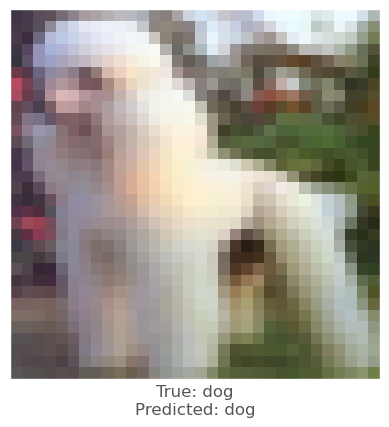



-0.0007713437
-0.00039875507
0.00045496225
vr, vg, vb :   0.14238715171813965 0.07245898246765137 -0.09238660335540771
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.6580713
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.65783244
row index :  2
1th round's confidence : 4th 0.65783244
predicted class :  dog
predicted class's confidence :  0.65783244
Lopt is :  10


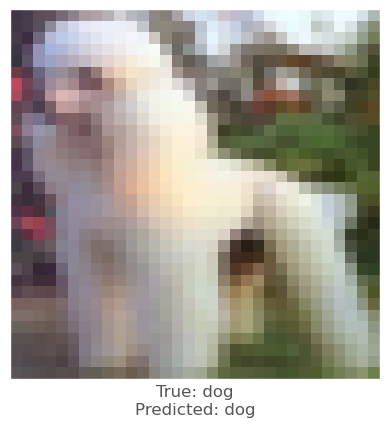



0.0022369623
0.0012708902
0.0017592311
vr, vg, vb :   -0.3894481658935547 -0.17764759063720703 -0.30504894256591797
beam_perturbed_confidence temp :  0.6643471
beam_perturbed_confidence temp :  0.6648092
beam_perturbed_confidence temp :  0.6645803
beam_perturbed_confidence temp :  0.6635404
beam_perturbed_confidence temp :  0.6633282
beam_perturbed_confidence temp :  0.6638176
beam_perturbed_confidence temp :  0.6624336
row index :  6
2th round's confidence : 0th 0.6624336
predicted class :  dog
predicted class's confidence :  0.6624336
Lopt is :  3


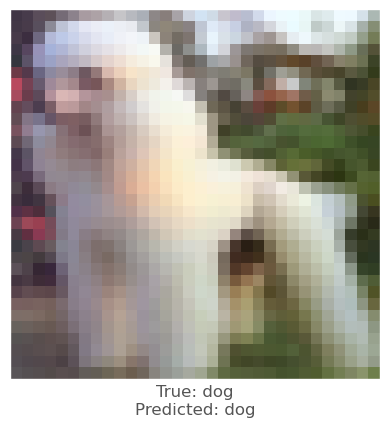



-0.0006489754
0.001959145
0.0009850264
vr, vg, vb :   0.08853262662887573 -0.6113967299461365 -0.41059213876724243
beam_perturbed_confidence temp :  0.6528491
beam_perturbed_confidence temp :  0.65137315
beam_perturbed_confidence temp :  0.65215236
beam_perturbed_confidence temp :  0.65137315
beam_perturbed_confidence temp :  0.65215236
beam_perturbed_confidence temp :  0.6504238
beam_perturbed_confidence temp :  0.6504238
row index :  5
2th round's confidence : 1th 0.6504238
predicted class :  dog
predicted class's confidence :  0.6504238
Lopt is :  8


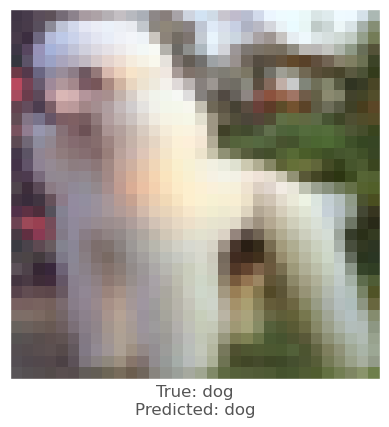



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.35665392875671387 0.28244638442993164 0.0008608102798461914
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
2th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


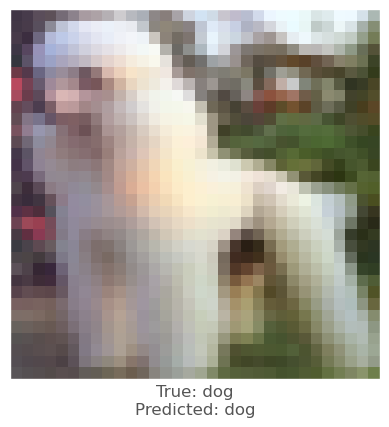



0.003194511
0.006159246
0.0028551817
vr, vg, vb :   -1.079453945159912 -1.8422917127609253 -0.9738829731941223
beam_perturbed_confidence temp :  0.61596644
beam_perturbed_confidence temp :  0.6126773
beam_perturbed_confidence temp :  0.61799026
beam_perturbed_confidence temp :  0.6096385
beam_perturbed_confidence temp :  0.61437
beam_perturbed_confidence temp :  0.61119324
beam_perturbed_confidence temp :  0.6085293
row index :  6
2th round's confidence : 3th 0.6085293
predicted class :  dog
predicted class's confidence :  0.6085293
Lopt is :  15


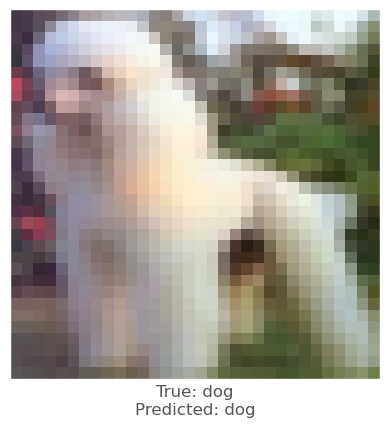



-0.0009255409
-0.00038307905
0.00063210726
vr, vg, vb :   0.22070252895355225 0.10352098941802979 -0.1463586688041687
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.65783244
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.6574392
row index :  2
2th round's confidence : 4th 0.6574392
predicted class :  dog
predicted class's confidence :  0.6574392
Lopt is :  10


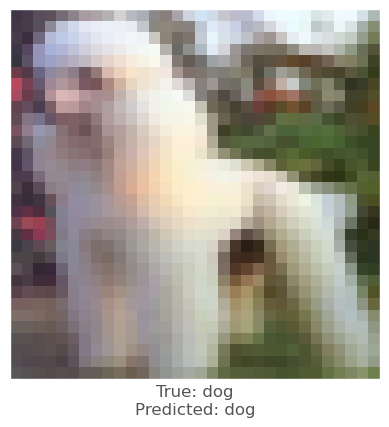



0.002566278
0.0020638704
0.0024344325
vr, vg, vb :   -0.6071311473846436 -0.36626987457275395 -0.5179872989654541
beam_perturbed_confidence temp :  0.6612513
beam_perturbed_confidence temp :  0.6612643
beam_perturbed_confidence temp :  0.661106
beam_perturbed_confidence temp :  0.6597501
beam_perturbed_confidence temp :  0.6601992
beam_perturbed_confidence temp :  0.6598692
beam_perturbed_confidence temp :  0.6587526
row index :  6
3th round's confidence : 0th 0.6587526
predicted class :  dog
predicted class's confidence :  0.6587526
Lopt is :  4


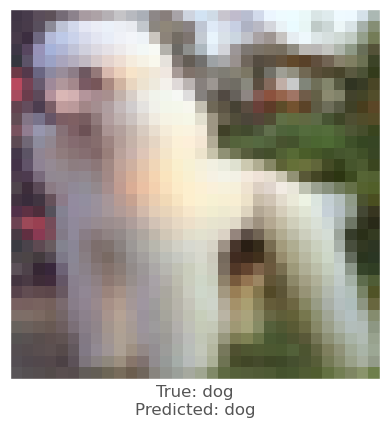



0.00088864565
0.003905654
0.0021097064
vr, vg, vb :   -0.009185200929641715 -0.9408224523067474 -0.5805035650730133
beam_perturbed_confidence temp :  0.64992064
beam_perturbed_confidence temp :  0.6482467
beam_perturbed_confidence temp :  0.64926344
beam_perturbed_confidence temp :  0.64781135
beam_perturbed_confidence temp :  0.6486253
beam_perturbed_confidence temp :  0.6472602
beam_perturbed_confidence temp :  0.6467065
row index :  6
3th round's confidence : 1th 0.6467065
predicted class :  dog
predicted class's confidence :  0.6467065
Lopt is :  9


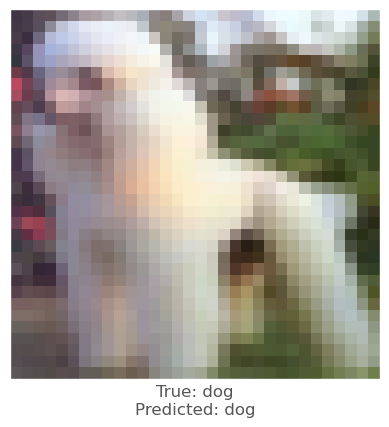



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.4619714021682739 0.3634868621826172 0.002848970890045166
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
3th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


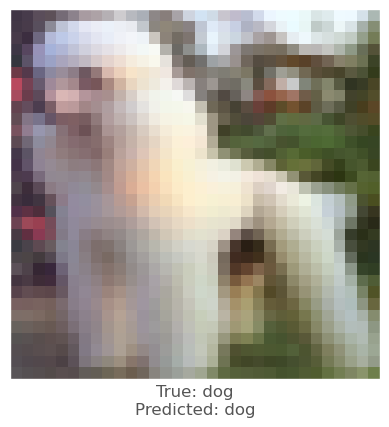



0.0023284554
0.004979849
0.0022952557
vr, vg, vb :   -1.2043540954589844 -2.1560474276542667 -1.1060202419757843
beam_perturbed_confidence temp :  0.606386
beam_perturbed_confidence temp :  0.60159224
beam_perturbed_confidence temp :  0.6063167
beam_perturbed_confidence temp :  0.5991463
beam_perturbed_confidence temp :  0.60452193
beam_perturbed_confidence temp :  0.59985375
beam_perturbed_confidence temp :  0.59730744
row index :  6
3th round's confidence : 3th 0.59730744
predicted class :  dog
predicted class's confidence :  0.59730744
Lopt is :  18


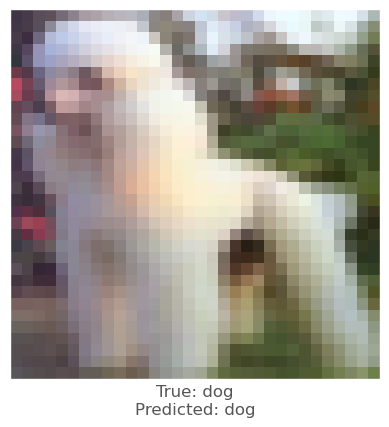



-0.0010802746
-0.00041550398
0.00088846684
vr, vg, vb :   0.30665973424911497 0.13471928834915162 -0.2205694854259491
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.6574392
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.656944
row index :  2
3th round's confidence : 4th 0.656944
predicted class :  dog
predicted class's confidence :  0.656944
Lopt is :  10


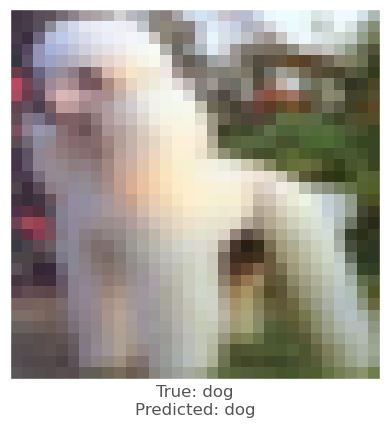



0.0007941127
0.0023788214
0.0017617345
vr, vg, vb :   -0.6258293008804322 -0.5675250244140626 -0.6423620176315308
beam_perturbed_confidence temp :  0.6590751
beam_perturbed_confidence temp :  0.6578204
beam_perturbed_confidence temp :  0.65798837
beam_perturbed_confidence temp :  0.6584684
beam_perturbed_confidence temp :  0.6585876
beam_perturbed_confidence temp :  0.6572886
beam_perturbed_confidence temp :  0.65769607
row index :  5
4th round's confidence : 0th 0.6572886
predicted class :  dog
predicted class's confidence :  0.6572886
Lopt is :  5


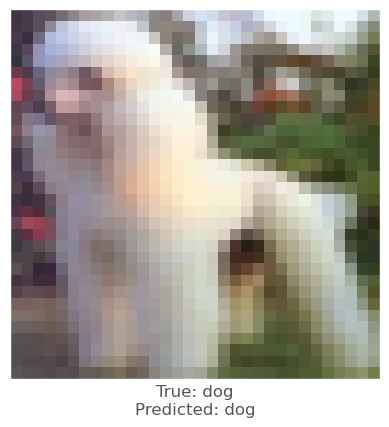



0.0012998581
0.003758967
0.0023075342
vr, vg, vb :   -0.1382524901628494 -1.2226368993520738 -0.7532066303491592
beam_perturbed_confidence temp :  0.64596033
beam_perturbed_confidence temp :  0.64291185
beam_perturbed_confidence temp :  0.6455038
beam_perturbed_confidence temp :  0.6421059
beam_perturbed_confidence temp :  0.6447393
beam_perturbed_confidence temp :  0.6415426
beam_perturbed_confidence temp :  0.6407053
row index :  6
4th round's confidence : 1th 0.6407053
predicted class :  dog
predicted class's confidence :  0.6407053
Lopt is :  11


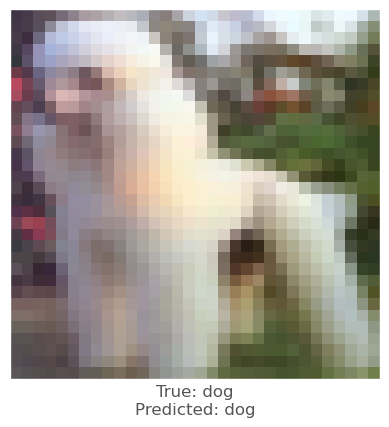



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.5567571282386781 0.4364232921600342 0.004638315439224243
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
4th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


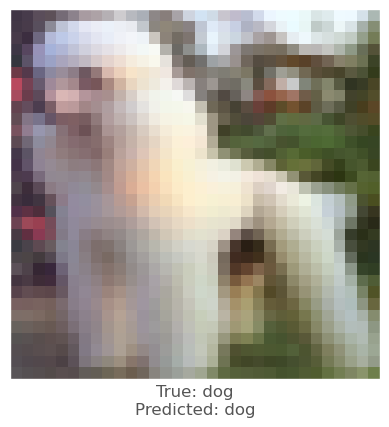



0.0036898851
0.0054798126
0.0021464825
vr, vg, vb :   -1.4529071998596192 -2.488423947095871 -1.2100664645433428
beam_perturbed_confidence temp :  0.5927492
beam_perturbed_confidence temp :  0.59024286
beam_perturbed_confidence temp :  0.5948766
beam_perturbed_confidence temp :  0.58673245
beam_perturbed_confidence temp :  0.59091276
beam_perturbed_confidence temp :  0.5889937
beam_perturbed_confidence temp :  0.58621365
row index :  6
4th round's confidence : 3th 0.58621365
predicted class :  dog
predicted class's confidence :  0.58621365
Lopt is :  21


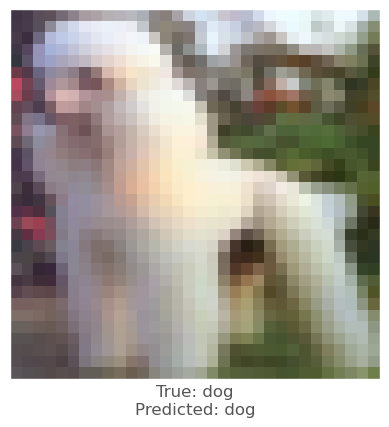



-0.0011025071
-0.00042426586
0.0010209084
vr, vg, vb :   0.3862444722652435 0.1636739456653595 -0.30060337245464325
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.656944
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.65641826
row index :  2
4th round's confidence : 4th 0.65641826
predicted class :  dog
predicted class's confidence :  0.65641826
Lopt is :  10


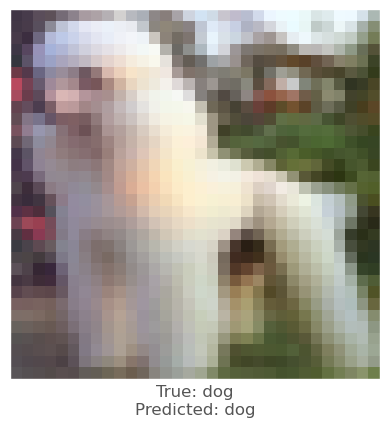



-2.026558e-05
0.0016233921
0.00123173
vr, vg, vb :   -0.5612198128700258 -0.6731117324829102 -0.7012988142967225
beam_perturbed_confidence temp :  0.65769607
beam_perturbed_confidence temp :  0.656365
beam_perturbed_confidence temp :  0.6565887
beam_perturbed_confidence temp :  0.6563521
beam_perturbed_confidence temp :  0.6567566
beam_perturbed_confidence temp :  0.6554375
beam_perturbed_confidence temp :  0.65532404
row index :  6
5th round's confidence : 0th 0.65532404
predicted class :  dog
predicted class's confidence :  0.65532404
Lopt is :  6


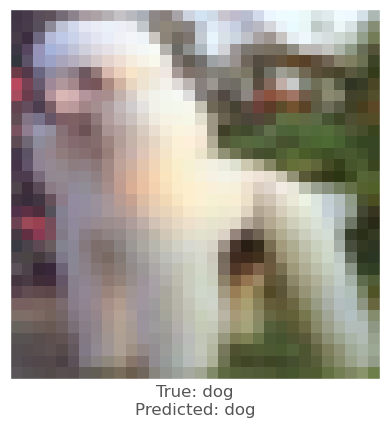



0.0019125938
0.0048313737
0.003107667
vr, vg, vb :   -0.3156866253018379 -1.5835105785727501 -0.988652664244175
beam_perturbed_confidence temp :  0.63963
beam_perturbed_confidence temp :  0.6354088
beam_perturbed_confidence temp :  0.6389982
beam_perturbed_confidence temp :  0.6342682
beam_perturbed_confidence temp :  0.6379822
beam_perturbed_confidence temp :  0.63368785
beam_perturbed_confidence temp :  0.632069
row index :  6
5th round's confidence : 1th 0.632069
predicted class :  dog
predicted class's confidence :  0.632069
Lopt is :  13


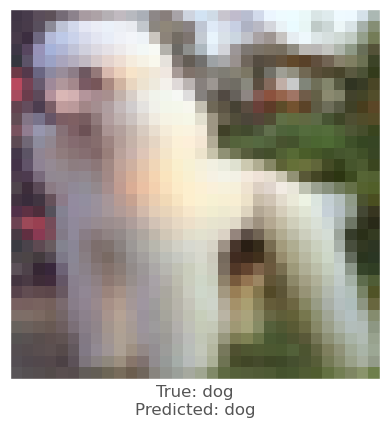



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.6420642817020418 0.5020660791397096 0.006248725533485413
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
5th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


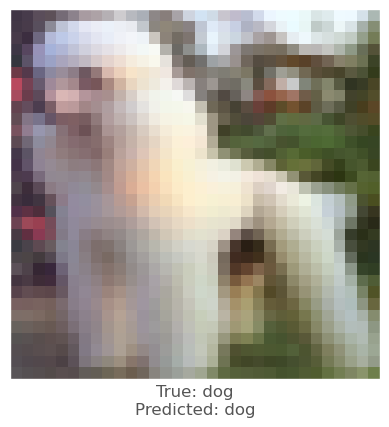



0.002558887
0.0016897917
0.00020939112
vr, vg, vb :   -1.5635051803588869 -2.4085607203245165 -1.1099989297986033
beam_perturbed_confidence temp :  0.58352727
beam_perturbed_confidence temp :  0.5847544
beam_perturbed_confidence temp :  0.58605945
beam_perturbed_confidence temp :  0.5829984
beam_perturbed_confidence temp :  0.5838591
beam_perturbed_confidence temp :  0.5852037
beam_perturbed_confidence temp :  0.5837746
row index :  3
5th round's confidence : 3th 0.5829984
predicted class :  dog
predicted class's confidence :  0.5829984
Lopt is :  24


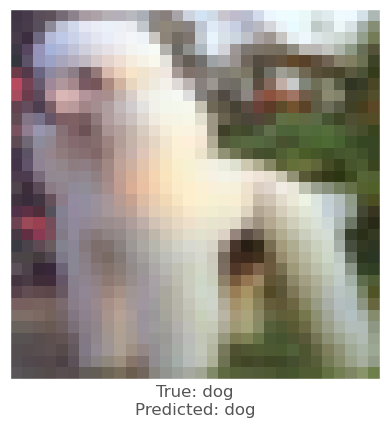



-0.0009989738
-0.00048357248
0.0008177161
vr, vg, vb :   0.4475174096822738 0.19566379940509798 -0.35231464737653734
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.65641826
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.65612626
row index :  2
5th round's confidence : 4th 0.65612626
predicted class :  dog
predicted class's confidence :  0.65612626
Lopt is :  10


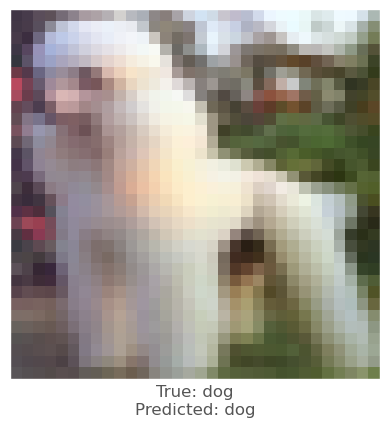



9.512901e-05
0.0027837753
0.0019164681
vr, vg, vb :   -0.5146107328891756 -0.8841780921936035 -0.8228157472133637
beam_perturbed_confidence temp :  0.6553424
beam_perturbed_confidence temp :  0.6539728
beam_perturbed_confidence temp :  0.65443563
beam_perturbed_confidence temp :  0.65434957
beam_perturbed_confidence temp :  0.6547113
beam_perturbed_confidence temp :  0.6533323
beam_perturbed_confidence temp :  0.65403265
row index :  5
6th round's confidence : 0th 0.6533323
predicted class :  dog
predicted class's confidence :  0.6533323
Lopt is :  7


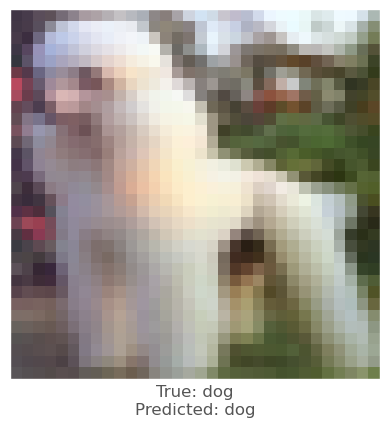



0.0047144294
0.007992208
0.004753709
vr, vg, vb :   -0.7555609006226063 -2.2243803211152553 -1.3651582817614079
beam_perturbed_confidence temp :  0.6289734
beam_perturbed_confidence temp :  0.618421
beam_perturbed_confidence temp :  0.6269621
beam_perturbed_confidence temp :  0.616168
beam_perturbed_confidence temp :  0.62421554
beam_perturbed_confidence temp :  0.6147982
beam_perturbed_confidence temp :  0.61315596
row index :  6
6th round's confidence : 1th 0.61315596
predicted class :  dog
predicted class's confidence :  0.61315596
Lopt is :  16


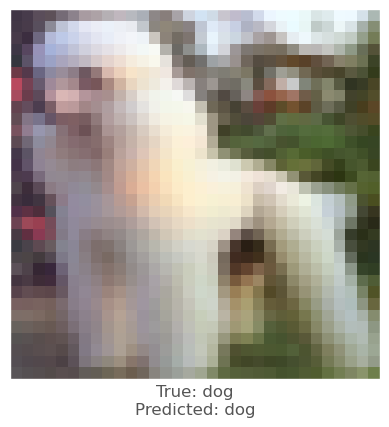



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.718840719819069 0.5611445874214174 0.007698094618320466
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
6th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


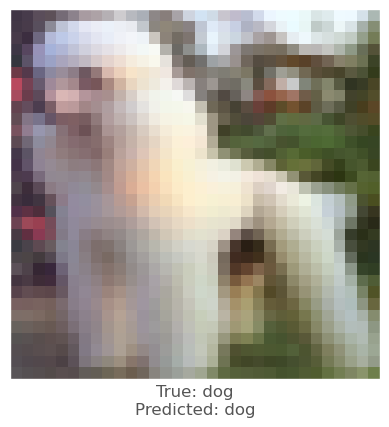



0.0017889142
0.0012771487
-0.00094246864
vr, vg, vb :   -1.5860460826873781 -2.2954195206522945 -0.9047521724998953
beam_perturbed_confidence temp :  0.5808087
beam_perturbed_confidence temp :  0.5786978
beam_perturbed_confidence temp :  0.5833994
beam_perturbed_confidence temp :  0.57568634
beam_perturbed_confidence temp :  0.5810188
beam_perturbed_confidence temp :  0.578818
beam_perturbed_confidence temp :  0.5759406
row index :  3
6th round's confidence : 3th 0.57568634
predicted class :  dog
predicted class's confidence :  0.57568634
Lopt is :  27


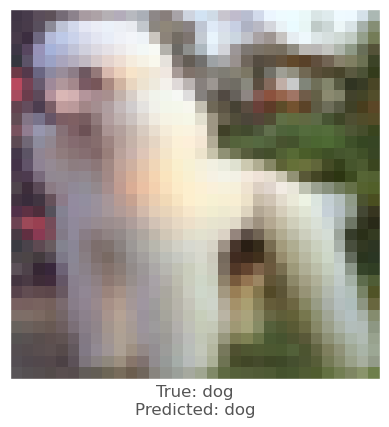



-0.00095534325
-0.00058192015
0.0005684495
vr, vg, vb :   0.49829999336004255 0.23428943415880205 -0.37392813236117367
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.65612626
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.6558498
row index :  2
6th round's confidence : 4th 0.6558498
predicted class :  dog
predicted class's confidence :  0.6558498
Lopt is :  10


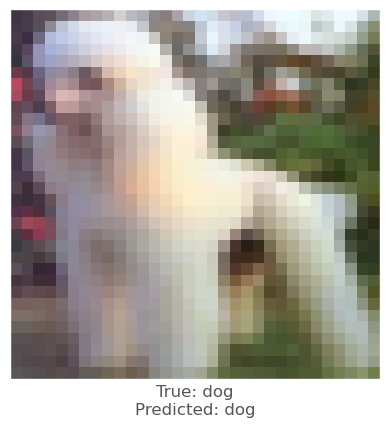



-0.0008082986
0.0015865564
0.0009904504
vr, vg, vb :   -0.38231980082035083 -0.9544159264373779 -0.839579210715294
beam_perturbed_confidence temp :  0.65403265
beam_perturbed_confidence temp :  0.6528491
beam_perturbed_confidence temp :  0.65298235
beam_perturbed_confidence temp :  0.6528339
beam_perturbed_confidence temp :  0.6535496
beam_perturbed_confidence temp :  0.65215236
beam_perturbed_confidence temp :  0.65185153
row index :  6
7th round's confidence : 0th 0.65185153
predicted class :  dog
predicted class's confidence :  0.65185153
Lopt is :  8


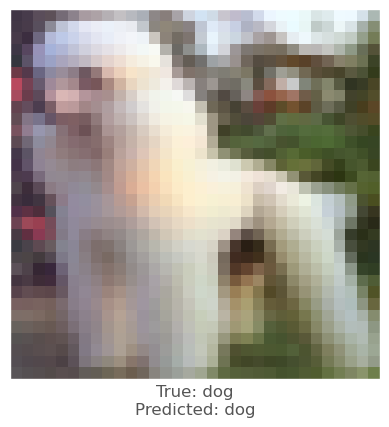



0.003496945
0.0061705112
0.0028318763
vr, vg, vb :   -1.029699300993085 -2.618993413576484 -1.5118300813776255
beam_perturbed_confidence temp :  0.609584
beam_perturbed_confidence temp :  0.6059077
beam_perturbed_confidence temp :  0.61050105
beam_perturbed_confidence temp :  0.60325116
beam_perturbed_confidence temp :  0.60745925
beam_perturbed_confidence temp :  0.6042497
beam_perturbed_confidence temp :  0.60158926
row index :  6
7th round's confidence : 1th 0.60158926
predicted class :  dog
predicted class's confidence :  0.60158926
Lopt is :  19


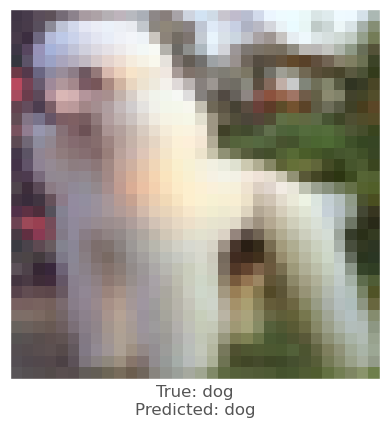



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.7879395141243936 0.6143152448749544 0.009002526794672013
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
7th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


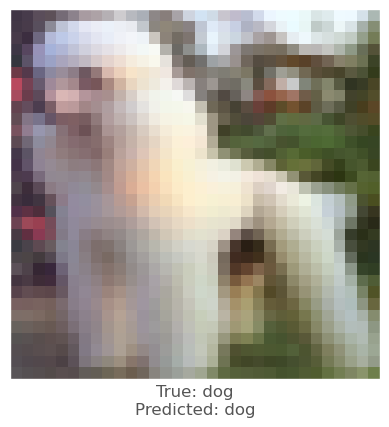



0.0022711754
0.0025826097
-0.0003630519
vr, vg, vb :   -1.6545590128707888 -2.324138533934355 -0.7779717661172153
beam_perturbed_confidence temp :  0.57418764
beam_perturbed_confidence temp :  0.5736782
beam_perturbed_confidence temp :  0.5759406
beam_perturbed_confidence temp :  0.57220274
beam_perturbed_confidence temp :  0.57454056
beam_perturbed_confidence temp :  0.5739625
beam_perturbed_confidence temp :  0.5723487
row index :  3
7th round's confidence : 3th 0.57220274
predicted class :  dog
predicted class's confidence :  0.57220274
Lopt is :  30


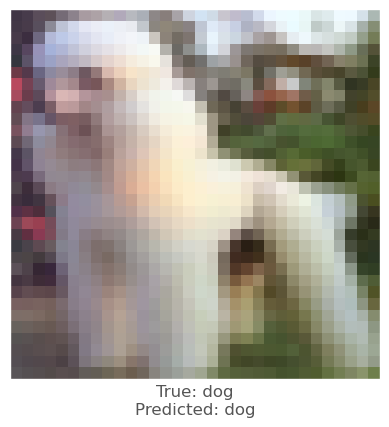



-0.0010398626
-0.0007069111
0.00060123205
vr, vg, vb :   0.5524562572991848 0.28155159944653513 -0.3966585243099928
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.6558498
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.655525
row index :  2
7th round's confidence : 4th 0.655525
predicted class :  dog
predicted class's confidence :  0.655525
Lopt is :  10


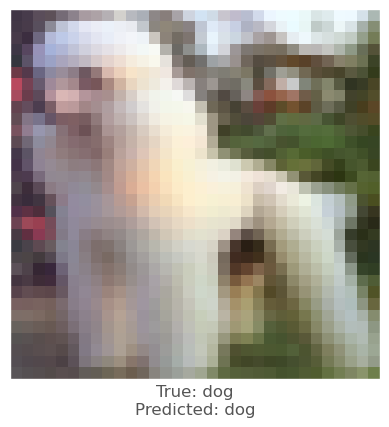



0.000882864
0.0036289692
0.002061665
vr, vg, vb :   -0.4323742205796243 -1.2218712530441285 -0.9617877954573633
beam_perturbed_confidence temp :  0.6512695
beam_perturbed_confidence temp :  0.64781135
beam_perturbed_confidence temp :  0.6507722
beam_perturbed_confidence temp :  0.6470692
beam_perturbed_confidence temp :  0.6499807
beam_perturbed_confidence temp :  0.6467065
beam_perturbed_confidence temp :  0.64596033
row index :  6
8th round's confidence : 0th 0.64596033
predicted class :  dog
predicted class's confidence :  0.64596033
Lopt is :  9


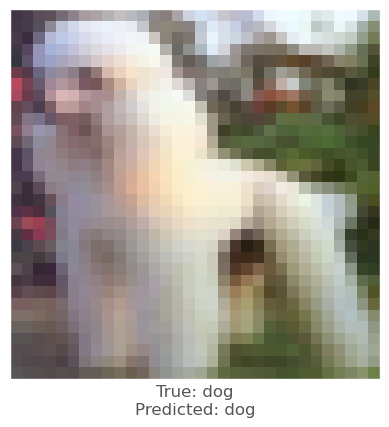



0.0026376247
0.0043082237
0.0018185377
vr, vg, vb :   -1.190491844953835 -2.787916444655359 -1.5425008444495798
beam_perturbed_confidence temp :  0.5990399
beam_perturbed_confidence temp :  0.5958688
beam_perturbed_confidence temp :  0.5999704
beam_perturbed_confidence temp :  0.5941813
beam_perturbed_confidence temp :  0.59753454
beam_perturbed_confidence temp :  0.59572124
beam_perturbed_confidence temp :  0.59301347
row index :  6
8th round's confidence : 1th 0.59301347
predicted class :  dog
predicted class's confidence :  0.59301347
Lopt is :  22


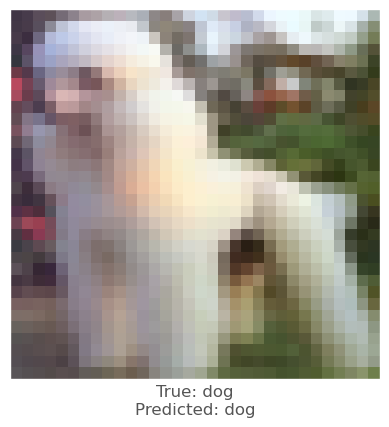



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.8501284289991856 0.6621688365831376 0.010176515753388406
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
8th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


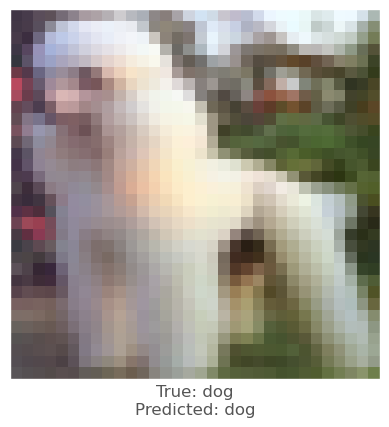



0.0015152097
0.0015405416
-0.00035566092
vr, vg, vb :   -1.6406240790672304 -2.2457788454273944 -0.6646084979680182
beam_perturbed_confidence temp :  0.57082987
beam_perturbed_confidence temp :  0.56912583
beam_perturbed_confidence temp :  0.5723487
beam_perturbed_confidence temp :  0.5676785
beam_perturbed_confidence temp :  0.57095677
beam_perturbed_confidence temp :  0.56919956
beam_perturbed_confidence temp :  0.5679274
row index :  3
8th round's confidence : 3th 0.5676785
predicted class :  dog
predicted class's confidence :  0.5676785
Lopt is :  33


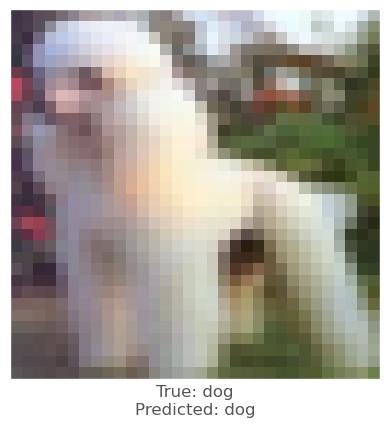



-0.001049757
-0.0005956888
0.0006894469
vr, vg, vb :   0.6021863319476843 0.312965321490407 -0.42593736449068786
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.655525
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.65516037
row index :  2
8th round's confidence : 4th 0.65516037
predicted class :  dog
predicted class's confidence :  0.65516037
Lopt is :  10


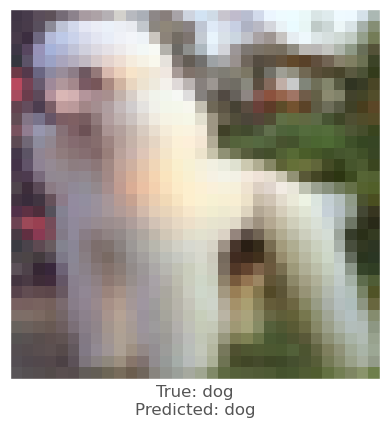



0.0014544725
0.0037627816
0.0023299456
vr, vg, vb :   -0.53458405270257 -1.475962289742279 -1.098603572338629
beam_perturbed_confidence temp :  0.64525205
beam_perturbed_confidence temp :  0.6421059
beam_perturbed_confidence temp :  0.64342386
beam_perturbed_confidence temp :  0.6411891
beam_perturbed_confidence temp :  0.6425723
beam_perturbed_confidence temp :  0.6389982
beam_perturbed_confidence temp :  0.6379822
row index :  6
9th round's confidence : 0th 0.6379822
predicted class :  dog
predicted class's confidence :  0.6379822
Lopt is :  11


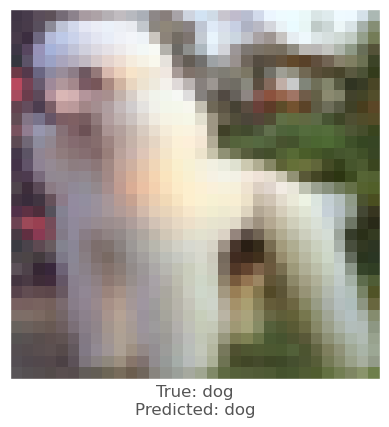



0.0034538507
0.0026657581
0.0013189912
vr, vg, vb :   -1.4168277350739302 -2.7757006134832802 -1.5201498784280838
beam_perturbed_confidence temp :  0.5894695
beam_perturbed_confidence temp :  0.589811
beam_perturbed_confidence temp :  0.591731
beam_perturbed_confidence temp :  0.58725613
beam_perturbed_confidence temp :  0.5890667
beam_perturbed_confidence temp :  0.58946437
beam_perturbed_confidence temp :  0.58714813
row index :  6
9th round's confidence : 1th 0.58714813
predicted class :  dog
predicted class's confidence :  0.58714813
Lopt is :  25


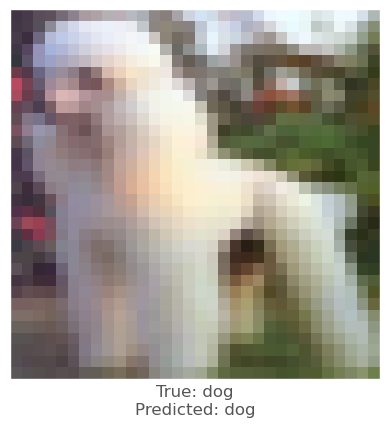



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.9060984523864986 0.7052370691205025 0.01123310581623316
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
9th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


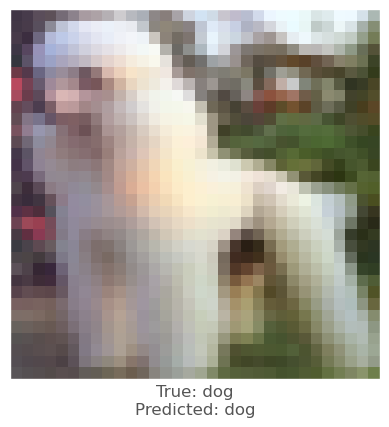



0.0010814667
0.0014740229
-0.000438869
vr, vg, vb :   -1.5847083386409762 -2.168603247414196 -0.5542607482230963
beam_perturbed_confidence temp :  0.5668329
beam_perturbed_confidence temp :  0.5655361
beam_perturbed_confidence temp :  0.5679274
beam_perturbed_confidence temp :  0.5639828
beam_perturbed_confidence temp :  0.56708294
beam_perturbed_confidence temp :  0.5655299
beam_perturbed_confidence temp :  0.5640872
row index :  3
9th round's confidence : 3th 0.5639828
predicted class :  dog
predicted class's confidence :  0.5639828
Lopt is :  36


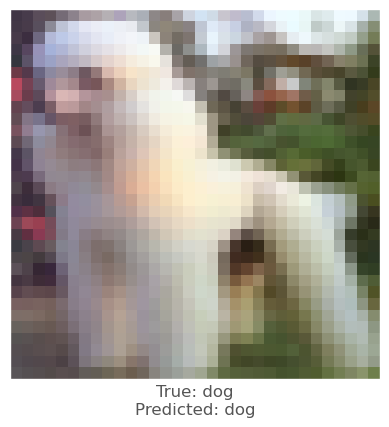



-0.001156807
-0.00057691336
0.000726223
vr, vg, vb :   0.6576483933329941 0.3393601250194669 -0.455965927235955
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.65516037
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.6547988
row index :  2
9th round's confidence : 4th 0.6547988
predicted class :  dog
predicted class's confidence :  0.6547988
Lopt is :  10


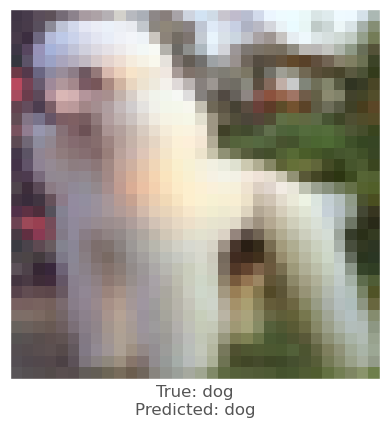



0.0019744635
0.005089879
0.003323257
vr, vg, vb :   -0.6785719937152721 -1.837353964363022 -1.3210689120499564
beam_perturbed_confidence temp :  0.63702375
beam_perturbed_confidence temp :  0.632069
beam_perturbed_confidence temp :  0.6344249
beam_perturbed_confidence temp :  0.6289734
beam_perturbed_confidence temp :  0.63300467
beam_perturbed_confidence temp :  0.6269621
beam_perturbed_confidence temp :  0.62421554
row index :  6
10th round's confidence : 0th 0.62421554
predicted class :  dog
predicted class's confidence :  0.62421554
Lopt is :  13


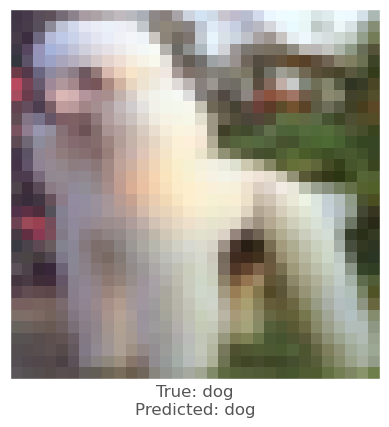



0.0017231703
0.0007828474
-0.00042140484
vr, vg, vb :   -1.4474619896121916 -2.57641529258295 -1.3259944067290743
beam_perturbed_confidence temp :  0.585558
beam_perturbed_confidence temp :  0.5847582
beam_perturbed_confidence temp :  0.58777297
beam_perturbed_confidence temp :  0.5822977
beam_perturbed_confidence temp :  0.5863672
beam_perturbed_confidence temp :  0.5854184
beam_perturbed_confidence temp :  0.58241534
row index :  3
10th round's confidence : 1th 0.5822977
predicted class :  dog
predicted class's confidence :  0.5822977
Lopt is :  28


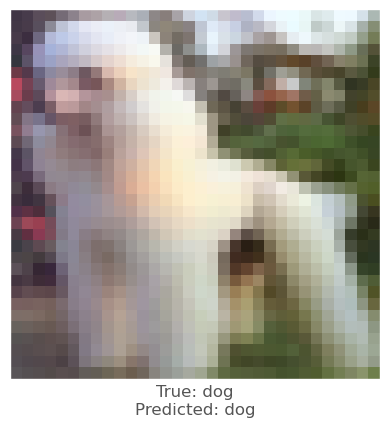



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   0.9564714734350802 0.743998478404131 0.012184036872793437
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
row index :  0
10th round's confidence : 2th 0.6598414
predicted class :  dog
predicted class's confidence :  0.6598414
Lopt is :  5


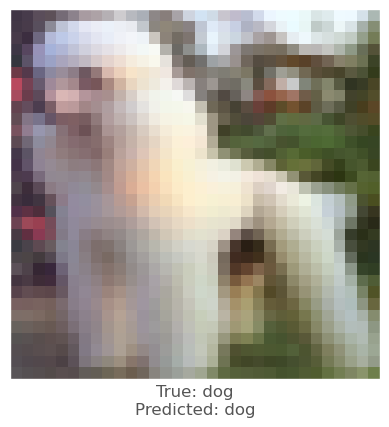



0.00098598
0.0019806027
-8.440018e-05
vr, vg, vb :   -1.5248355081643297 -2.149803196796922 -0.49039465570059143
beam_perturbed_confidence temp :  0.5633881
beam_perturbed_confidence temp :  0.56050885
beam_perturbed_confidence temp :  0.5640872
beam_perturbed_confidence temp :  0.5594021
beam_perturbed_confidence temp :  0.563203
beam_perturbed_confidence temp :  0.5604533
beam_perturbed_confidence temp :  0.5591755
row index :  6
10th round's confidence : 3th 0.5591755
predicted class :  dog
predicted class's confidence :  0.5591755
Lopt is :  39


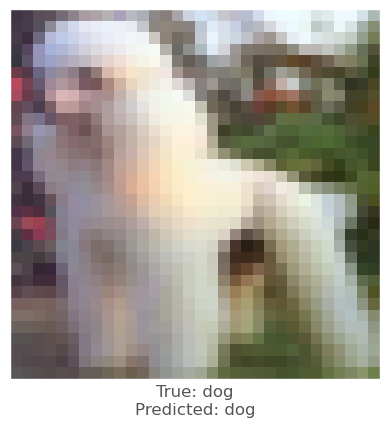



-0.0011792779
-0.0005968213
0.0006314516
vr, vg, vb :   0.7098113436878051 0.36510624333111885 -0.47351449518740835
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.6547988
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.6545289
row index :  2
10th round's confidence : 4th 0.6545289
predicted class :  dog
predicted class's confidence :  0.6545289
Lopt is :  10


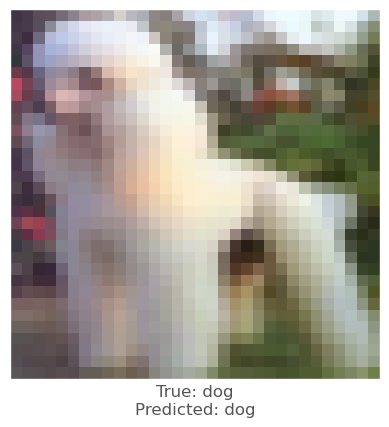



0.005770862
0.008913875
0.004754722
vr, vg, vb :   -1.1878010045945993 -2.5450060305426865 -1.6644342326827293
beam_perturbed_confidence temp :  0.6196028
beam_perturbed_confidence temp :  0.61315596
beam_perturbed_confidence temp :  0.61948913
beam_perturbed_confidence temp :  0.609584
beam_perturbed_confidence temp :  0.6166944
beam_perturbed_confidence temp :  0.61050105
beam_perturbed_confidence temp :  0.60745925
row index :  6
11th round's confidence : 0th 0.60745925
predicted class :  dog
predicted class's confidence :  0.60745925
Lopt is :  16


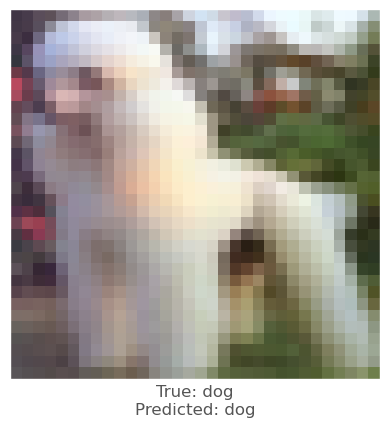



0.0030767322
0.0033624768
-0.0003362298
vr, vg, vb :   -1.6103890065170614 -2.6550214458960664 -1.159771985938369
beam_perturbed_confidence temp :  0.57852906
beam_perturbed_confidence temp :  0.5778509
beam_perturbed_confidence temp :  0.58241534
beam_perturbed_confidence temp :  0.57602704
beam_perturbed_confidence temp :  0.5794483
beam_perturbed_confidence temp :  0.57855994
beam_perturbed_confidence temp :  0.5766799
row index :  3
11th round's confidence : 1th 0.57602704
predicted class :  dog
predicted class's confidence :  0.57602704
Lopt is :  31


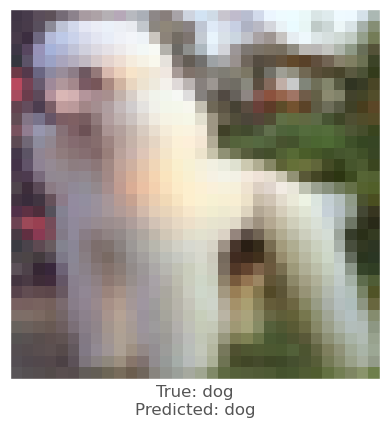



-0.0014098287
-0.0010928512
-2.0742416e-05
vr, vg, vb :   1.0018071923788037 0.7788837467593966 0.013039874823697688
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6598414
beam_perturbed_confidence temp :  0.6594322
row index :  0
11th round's confidence : 2th 0.6594322
predicted class :  dog
predicted class's confidence :  0.6594322
Lopt is :  6


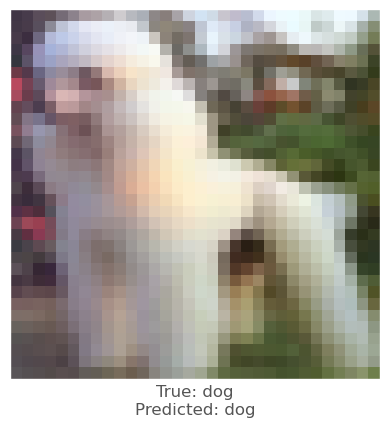



0.0010769367
0.0026646256
0.00042915344
vr, vg, vb :   -1.4800456295280726 -2.2012854415856133 -0.48427053436881357
beam_perturbed_confidence temp :  0.5580116
beam_perturbed_confidence temp :  0.55520916
beam_perturbed_confidence temp :  0.55897295
beam_perturbed_confidence temp :  0.55410147
beam_perturbed_confidence temp :  0.5578145
beam_perturbed_confidence temp :  0.555018
beam_perturbed_confidence temp :  0.5538699
row index :  6
11th round's confidence : 3th 0.5538699
predicted class :  dog
predicted class's confidence :  0.5538699
Lopt is :  42


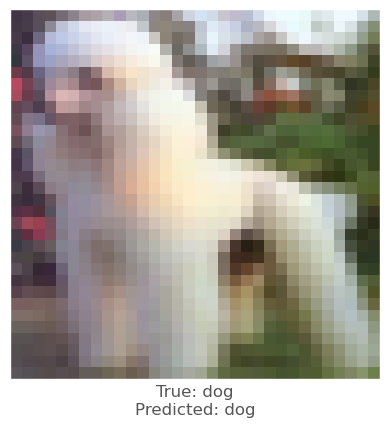



-0.0013039112
-0.00079858303
0.00048553944
vr, vg, vb :   0.7692213302296691 0.40845392206807535 -0.47471698930270073
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.6545289
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.65431327
row index :  2
11th round's confidence : 4th 0.65431327
predicted class :  dog
predicted class's confidence :  0.65431327
Lopt is :  10


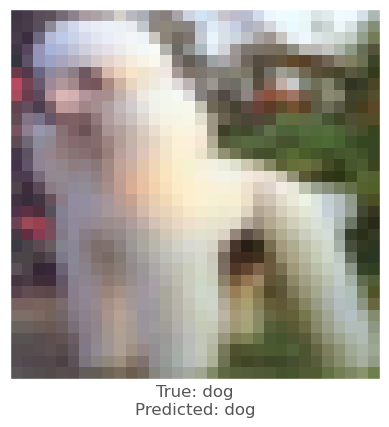



0.0026416779
0.0043157935
0.001675427
vr, vg, vb :   -1.3331886897796705 -2.722084778913589 -1.6655335054136018
beam_perturbed_confidence temp :  0.6051079
beam_perturbed_confidence temp :  0.60158926
beam_perturbed_confidence temp :  0.6060507
beam_perturbed_confidence temp :  0.5990399
beam_perturbed_confidence temp :  0.60372984
beam_perturbed_confidence temp :  0.5999704
beam_perturbed_confidence temp :  0.59753454
row index :  6
12th round's confidence : 0th 0.59753454
predicted class :  dog
predicted class's confidence :  0.59753454
Lopt is :  19


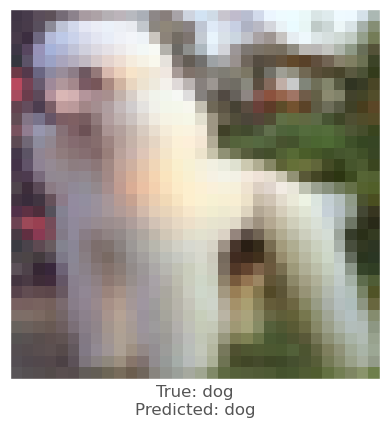



0.0017623305
0.0016404986
-0.0007072687
vr, vg, vb :   -1.6255831590727527 -2.5535691651217673 -0.9730679158540536
beam_perturbed_confidence temp :  0.57437503
beam_perturbed_confidence temp :  0.5732541
beam_perturbed_confidence temp :  0.57639813
beam_perturbed_confidence temp :  0.5709376
beam_perturbed_confidence temp :  0.5746384
beam_perturbed_confidence temp :  0.5732728
beam_perturbed_confidence temp :  0.5710803
row index :  3
12th round's confidence : 1th 0.5709376
predicted class :  dog
predicted class's confidence :  0.5709376
Lopt is :  34


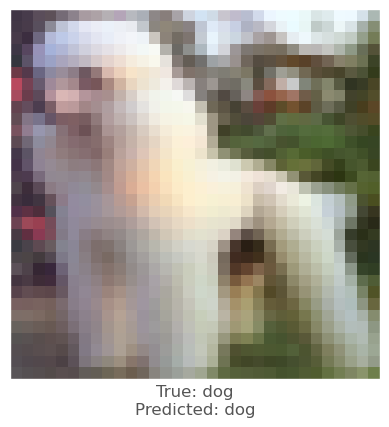



-0.0008855462
-0.00092577934
3.9577484e-05
vr, vg, vb :   0.9901810938837212 0.7935733063485937 0.007778138928241982
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
row index :  0
12th round's confidence : 2th 0.6594322
predicted class :  dog
predicted class's confidence :  0.6594322
Lopt is :  6


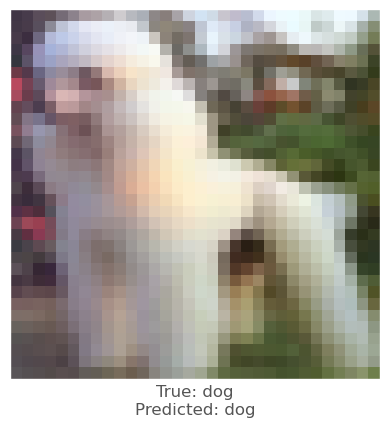



0.001468122
0.0029454231
0.0005851984
vr, vg, vb :   -1.47885326712153 -2.2756992100491225 -0.4943633211724107
beam_perturbed_confidence temp :  0.5519927
beam_perturbed_confidence temp :  0.5487948
beam_perturbed_confidence temp :  0.55351627
beam_perturbed_confidence temp :  0.54613733
beam_perturbed_confidence temp :  0.5515845
beam_perturbed_confidence temp :  0.54815084
beam_perturbed_confidence temp :  0.5453641
row index :  6
12th round's confidence : 3th 0.5453641
predicted class :  dog
predicted class's confidence :  0.5453641
Lopt is :  45


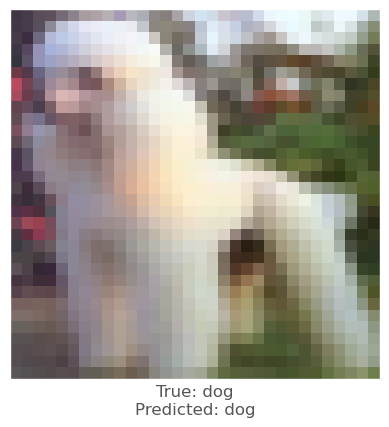



-0.0012922287
-0.0010099411
0.0003387332
vr, vg, vb :   0.8215220670797491 0.46860263996868967 -0.46111860999828513
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.65431327
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
row index :  2
12th round's confidence : 4th 0.6541902
predicted class :  dog
predicted class's confidence :  0.6541902
Lopt is :  10


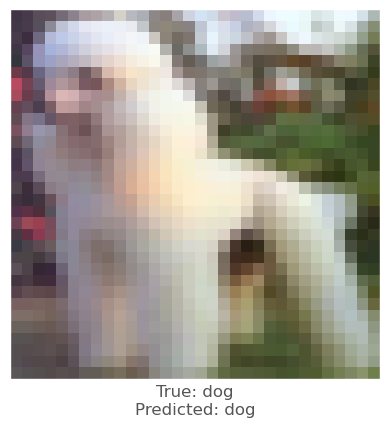



0.0023712516
0.0037003756
0.001355052
vr, vg, vb :   -1.43699497911164 -2.81991385671681 -1.6344853543046147
beam_perturbed_confidence temp :  0.59451014
beam_perturbed_confidence temp :  0.59301347
beam_perturbed_confidence temp :  0.5964503
beam_perturbed_confidence temp :  0.5894695
beam_perturbed_confidence temp :  0.5928838
beam_perturbed_confidence temp :  0.591731
beam_perturbed_confidence temp :  0.5890667
row index :  6
13th round's confidence : 0th 0.5890667
predicted class :  dog
predicted class's confidence :  0.5890667
Lopt is :  22


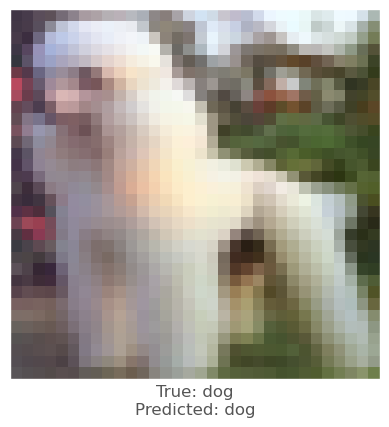



0.0020914078
0.002210617
-0.00012654066
vr, vg, vb :   -1.6721656207533682 -2.5192739551525594 -0.8631070581828328
beam_perturbed_confidence temp :  0.56920016
beam_perturbed_confidence temp :  0.56811434
beam_perturbed_confidence temp :  0.5710803
beam_perturbed_confidence temp :  0.56650054
beam_perturbed_confidence temp :  0.5692208
beam_perturbed_confidence temp :  0.5682799
beam_perturbed_confidence temp :  0.56671506
row index :  3
13th round's confidence : 1th 0.56650054
predicted class :  dog
predicted class's confidence :  0.56650054
Lopt is :  37


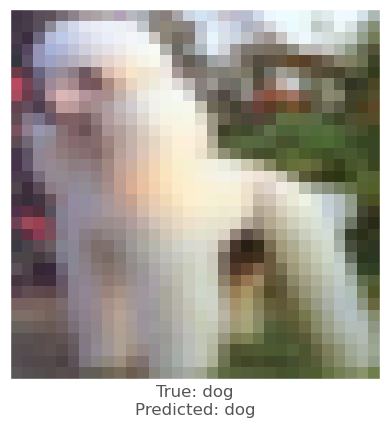



-0.0008855462
-0.00092577934
3.9577484e-05
vr, vg, vb :   0.979717605238147 0.806793909978871 0.0030425766223318466
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
row index :  0
13th round's confidence : 2th 0.6594322
predicted class :  dog
predicted class's confidence :  0.6594322
Lopt is :  6


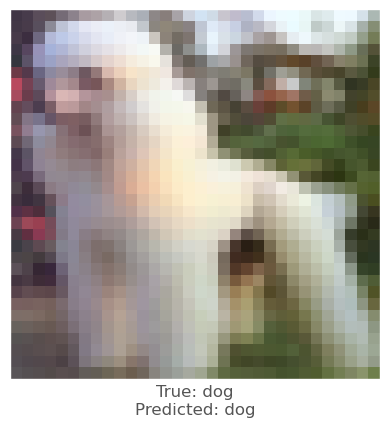



0.0029022098
0.0045882463
0.0015856028
vr, vg, vb :   -1.6211889162852315 -2.506953923596212 -0.6034872650866638
beam_perturbed_confidence temp :  0.5424503
beam_perturbed_confidence temp :  0.53877115
beam_perturbed_confidence temp :  0.54455173
beam_perturbed_confidence temp :  0.5364161
beam_perturbed_confidence temp :  0.5417382
beam_perturbed_confidence temp :  0.538047
beam_perturbed_confidence temp :  0.5356668
row index :  6
13th round's confidence : 3th 0.5356668
predicted class :  dog
predicted class's confidence :  0.5356668
Lopt is :  48


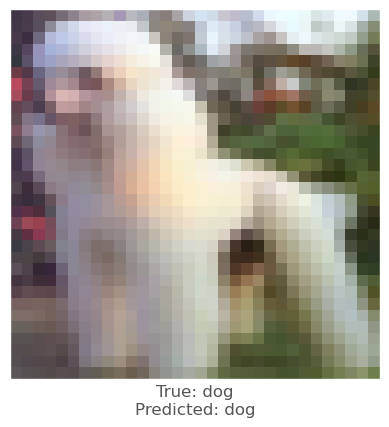



-0.001226306
-0.0013549328
9.787083e-05
vr, vg, vb :   0.8620004565326629 0.5572356544752387 -0.42479383167057577
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
row index :  0
13th round's confidence : 4th 0.6541902
predicted class :  dog
predicted class's confidence :  0.6541902
Lopt is :  10


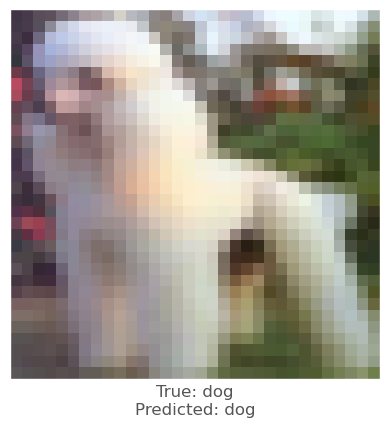



0.0023605824
0.0013666153
0.00021231174
vr, vg, vb :   -1.5293537163689332 -2.6745840005861448 -1.4922679933431475
beam_perturbed_confidence temp :  0.5865683
beam_perturbed_confidence temp :  0.58714813
beam_perturbed_confidence temp :  0.58880764
beam_perturbed_confidence temp :  0.585558
beam_perturbed_confidence temp :  0.5867373
beam_perturbed_confidence temp :  0.58777297
beam_perturbed_confidence temp :  0.5863672
row index :  3
14th round's confidence : 0th 0.585558
predicted class :  dog
predicted class's confidence :  0.585558
Lopt is :  25


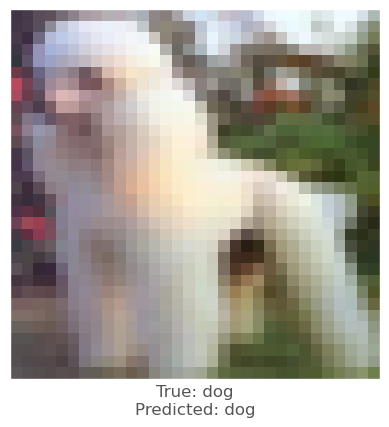



0.001403153
0.0016722679
-0.00040978193
vr, vg, vb :   -1.6452643529437785 -2.4345733510191394 -0.7358181590814685
beam_perturbed_confidence temp :  0.5650817
beam_perturbed_confidence temp :  0.5632444
beam_perturbed_confidence temp :  0.56671506
beam_perturbed_confidence temp :  0.56148654
beam_perturbed_confidence temp :  0.56504667
beam_perturbed_confidence temp :  0.56348354
beam_perturbed_confidence temp :  0.5616259
row index :  3
14th round's confidence : 1th 0.56148654
predicted class :  dog
predicted class's confidence :  0.56148654
Lopt is :  40


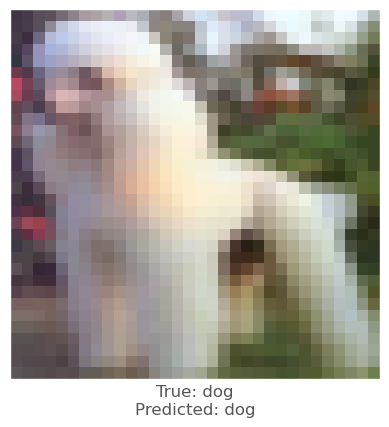



-0.0008855462
-0.00092577934
3.9577484e-05
vr, vg, vb :   0.9703004654571301 0.8186924532461206 -0.0012194294529872755
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6594322
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6594085
row index :  2
14th round's confidence : 2th 0.6594085
predicted class :  dog
predicted class's confidence :  0.6594085
Lopt is :  6


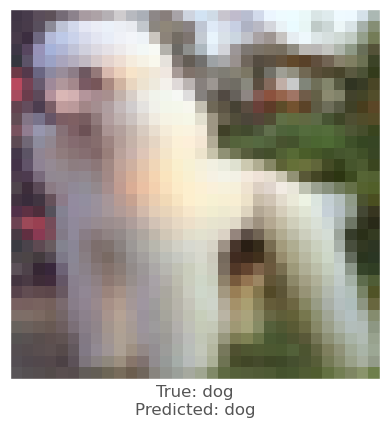



0.0023964047
0.004028201
0.0014824271
vr, vg, vb :   -1.6987104989761663 -2.659078641557636 -0.6913812505988715
beam_perturbed_confidence temp :  0.53304356
beam_perturbed_confidence temp :  0.5292039
beam_perturbed_confidence temp :  0.5349337
beam_perturbed_confidence temp :  0.52664346
beam_perturbed_confidence temp :  0.5322392
beam_perturbed_confidence temp :  0.5285087
beam_perturbed_confidence temp :  0.52589786
row index :  6
14th round's confidence : 3th 0.52589786
predicted class :  dog
predicted class's confidence :  0.52589786
Lopt is :  51


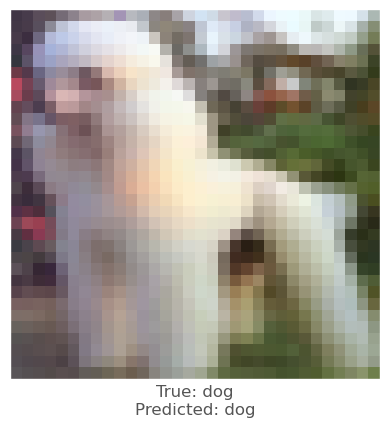



-0.001226306
-0.0013549328
9.787083e-05
vr, vg, vb :   0.8984310070402853 0.6370053675311328 -0.39210153117563734
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
row index :  0
14th round's confidence : 4th 0.6541902
predicted class :  dog
predicted class's confidence :  0.6541902
Lopt is :  10


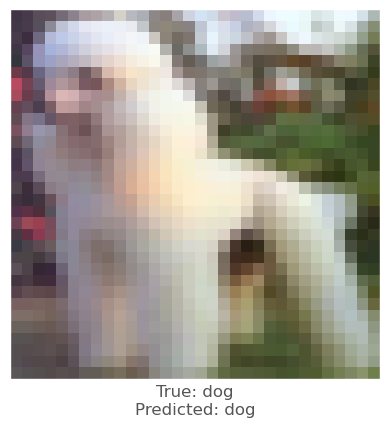



0.0016251802
0.001174748
-0.0007109046
vr, vg, vb :   -1.53893636917662 -2.524600394915348 -1.2719507341852243
beam_perturbed_confidence temp :  0.5837606
beam_perturbed_confidence temp :  0.5822977
beam_perturbed_confidence temp :  0.5863672
beam_perturbed_confidence temp :  0.57852906
beam_perturbed_confidence temp :  0.5843069
beam_perturbed_confidence temp :  0.58241534
beam_perturbed_confidence temp :  0.5794483
row index :  3
15th round's confidence : 0th 0.57852906
predicted class :  dog
predicted class's confidence :  0.57852906
Lopt is :  28


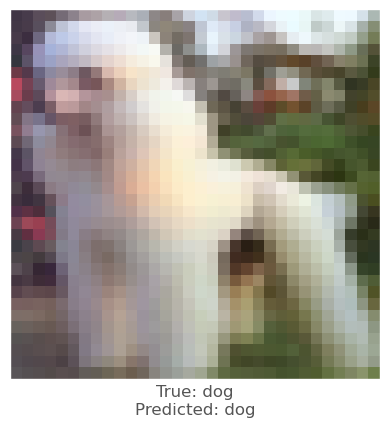



0.0016396046
0.0024949908
-0.00031656027
vr, vg, vb :   -1.6446983744975452 -2.440615098482533 -0.6305803163331117
beam_perturbed_confidence temp :  0.55979514
beam_perturbed_confidence temp :  0.5578277
beam_perturbed_confidence temp :  0.5616259
beam_perturbed_confidence temp :  0.5560178
beam_perturbed_confidence temp :  0.55965525
beam_perturbed_confidence temp :  0.5578713
beam_perturbed_confidence temp :  0.5561071
row index :  3
15th round's confidence : 1th 0.5560178
predicted class :  dog
predicted class's confidence :  0.5560178
Lopt is :  43


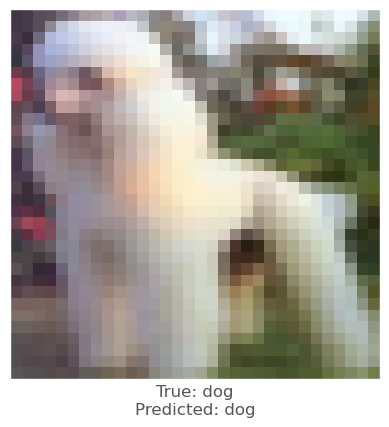



-0.0009626746
-0.0008869171
6.979704e-05
vr, vg, vb :   0.9695378806881505 0.8255149193472898 -0.00807719041088679
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.6594085
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.6593624
row index :  2
15th round's confidence : 2th 0.6593624
predicted class :  dog
predicted class's confidence :  0.6593624
Lopt is :  6


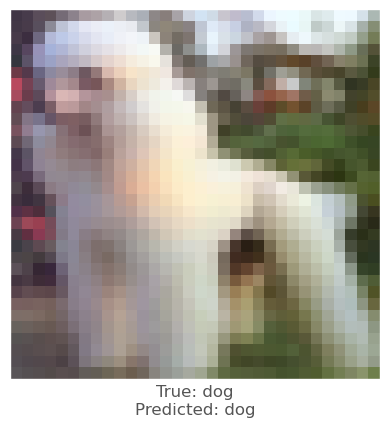



0.0026413798
0.004034877
0.0014891028
vr, vg, vb :   -1.7929774324006933 -2.7966584597444015 -0.7711534095813427
beam_perturbed_confidence temp :  0.52356833
beam_perturbed_confidence temp :  0.52008003
beam_perturbed_confidence temp :  0.52515435
beam_perturbed_confidence temp :  0.5180484
beam_perturbed_confidence temp :  0.5227388
beam_perturbed_confidence temp :  0.5196053
beam_perturbed_confidence temp :  0.5175152
row index :  6
15th round's confidence : 3th 0.5175152
predicted class :  dog
predicted class's confidence :  0.5175152
Lopt is :  54


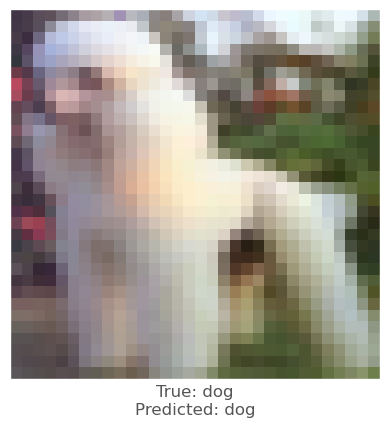



-0.001226306
-0.0013549328
9.787083e-05
vr, vg, vb :   0.9312185024971454 0.7087981092814375 -0.3626784607301928
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
row index :  0
15th round's confidence : 4th 0.6541902
predicted class :  dog
predicted class's confidence :  0.6541902
Lopt is :  10


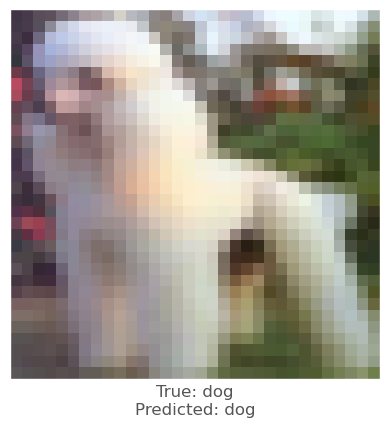



0.003059864
0.0031638145
-0.00034981966
vr, vg, vb :   -1.6910291366779033 -2.5885218098915868 -1.1097736947480252
beam_perturbed_confidence temp :  0.57655495
beam_perturbed_confidence temp :  0.57602704
beam_perturbed_confidence temp :  0.5794483
beam_perturbed_confidence temp :  0.57437503
beam_perturbed_confidence temp :  0.57732886
beam_perturbed_confidence temp :  0.5766799
beam_perturbed_confidence temp :  0.5748117
row index :  3
16th round's confidence : 0th 0.57437503
predicted class :  dog
predicted class's confidence :  0.57437503
Lopt is :  31


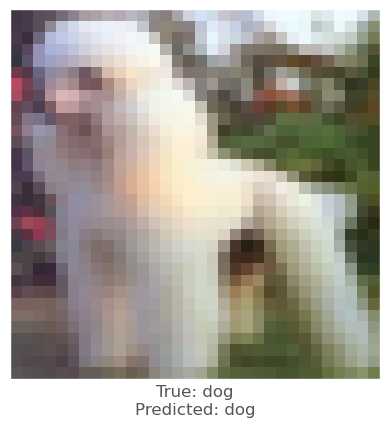



0.0016789436
0.0022205114
-0.00012749434
vr, vg, vb :   -1.648122900451111 -2.41860473228052 -0.5547728511823445
beam_perturbed_confidence temp :  0.55447716
beam_perturbed_confidence temp :  0.55291003
beam_perturbed_confidence temp :  0.5561071
beam_perturbed_confidence temp :  0.5508847
beam_perturbed_confidence temp :  0.5543183
beam_perturbed_confidence temp :  0.5530486
beam_perturbed_confidence temp :  0.5504518
row index :  6
16th round's confidence : 1th 0.5504518
predicted class :  dog
predicted class's confidence :  0.5504518
Lopt is :  46


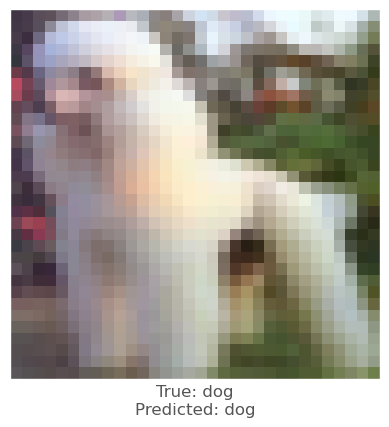



-0.0013337135
-0.0011104345
-9.280443e-05
vr, vg, vb :   1.0059554457687496 0.8540068806291136 0.0020109718217302093
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.6593624
beam_perturbed_confidence temp :  0.65894014
row index :  0
16th round's confidence : 2th 0.65894014
predicted class :  dog
predicted class's confidence :  0.65894014
Lopt is :  7


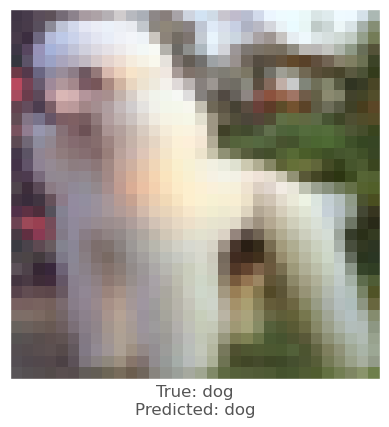



0.0019510984
0.0035242438
0.0011340976
vr, vg, vb :   -1.8087895333683877 -2.869416996933414 -0.8074478262373442
beam_perturbed_confidence temp :  0.51570356
beam_perturbed_confidence temp :  0.51197416
beam_perturbed_confidence temp :  0.5169143
beam_perturbed_confidence temp :  0.5098383
beam_perturbed_confidence temp :  0.5151393
beam_perturbed_confidence temp :  0.51111764
beam_perturbed_confidence temp :  0.50908756
row index :  6
16th round's confidence : 3th 0.50908756
predicted class :  dog
predicted class's confidence :  0.50908756
Lopt is :  57


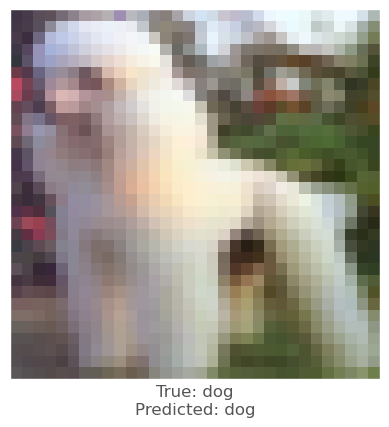



-0.001226306
-0.0013549328
9.787083e-05
vr, vg, vb :   0.9607272484083196 0.7734115768567117 -0.33619769732929267
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6541902
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
beam_perturbed_confidence temp :  0.6542154
row index :  0
16th round's confidence : 4th 0.6541902
predicted class :  dog
predicted class's confidence :  0.6541902
Lopt is :  10


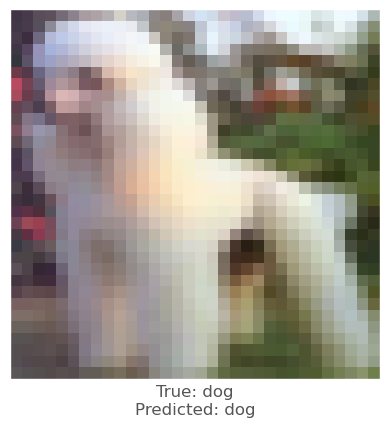



0.0018417835
0.0017747879
-0.0005440712
vr, vg, vb :   -1.70610457536607 -2.5071484191856315 -0.9443892055222461
beam_perturbed_confidence temp :  0.5722671
beam_perturbed_confidence temp :  0.5709376
beam_perturbed_confidence temp :  0.5746384
beam_perturbed_confidence temp :  0.56920016
beam_perturbed_confidence temp :  0.5723033
beam_perturbed_confidence temp :  0.5710803
beam_perturbed_confidence temp :  0.5692208
row index :  3
17th round's confidence : 0th 0.56920016
predicted class :  dog
predicted class's confidence :  0.56920016
Lopt is :  34


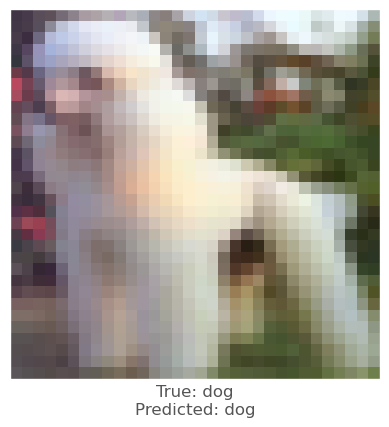



0.002893865
0.0033155084
0.0008570552
vr, vg, vb :   -1.7726971212549991 -2.5082950956155785 -0.5850010847866443
beam_perturbed_confidence temp :  0.54745734
beam_perturbed_confidence temp :  0.5445226
beam_perturbed_confidence temp :  0.55002767
beam_perturbed_confidence temp :  0.5411836
beam_perturbed_confidence temp :  0.546692
beam_perturbed_confidence temp :  0.5438345
beam_perturbed_confidence temp :  0.5403689
row index :  6
17th round's confidence : 1th 0.5403689
predicted class :  dog
predicted class's confidence :  0.5403689
Lopt is :  49


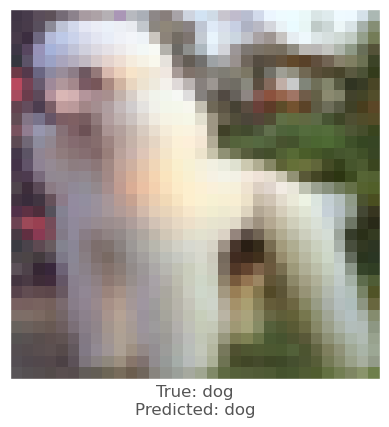



-0.00079500675
-0.0011363626
-0.00021201372
vr, vg, vb :   0.9848605763932907 0.8822424478304844 0.023011246786163633
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
beam_perturbed_confidence temp :  0.65894014
row index :  0
17th round's confidence : 2th 0.65894014
predicted class :  dog
predicted class's confidence :  0.65894014
Lopt is :  7


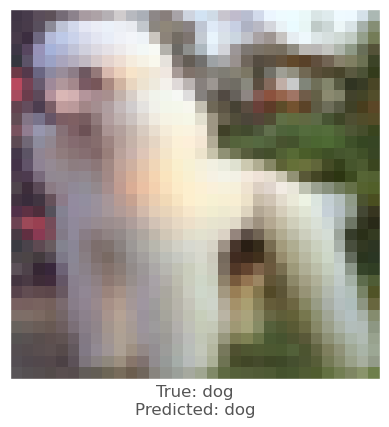



0.002187848
0.00433141
0.0017369986
vr, vg, vb :   -1.8466953891440978 -3.0156162903583588 -0.9004028994180532
beam_perturbed_confidence temp :  0.50669956
beam_perturbed_confidence temp :  0.5008142
beam_perturbed_confidence temp :  0.5081013
beam_perturbed_confidence temp :  0.49877828
beam_perturbed_confidence temp :  0.50589335
beam_perturbed_confidence temp :  0.50019014
beam_perturbed_confidence temp :  0.49816242
row index :  6
17th round's confidence : 3th 0.49816242
predicted class :  dog
predicted class's confidence :  0.49816242
Lopt is :  61


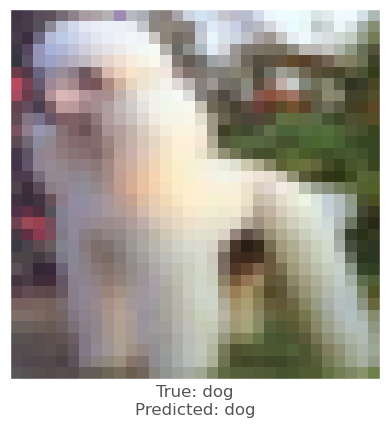




25th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  210 216 235
0.0018131733
0.0074564815
0.0024998784
vr, vg, vb :   -0.18131732940673828 -0.7456481456756592 -0.24998784065246582
beam_perturbed_confidence temp :  0.66767544
beam_perturbed_confidence temp :  0.66469187
beam_perturbed_confidence temp :  0.6673653
beam_perturbed_confidence temp :  0.6636218
beam_perturbed_confidence temp :  0.6663277
beam_perturbed_confidence temp :  0.6633042
beam_perturbed_confidence temp :  0.6623793
row index :  6
0th round's confidence : 0th 0.6623793
predicted class :  dog
predicted class's confidence :  0.6623793
Lopt is :  1


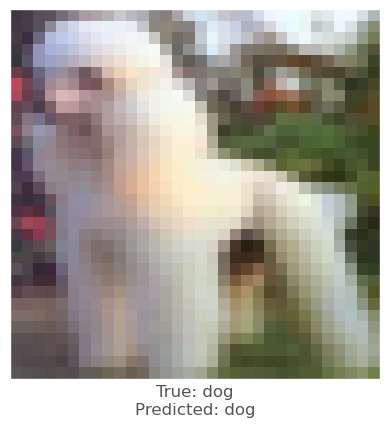



0.004404664
0.012498021
0.004403591
vr, vg, vb :   -0.44046640396118164 -1.2498021125793457 -0.44035911560058594
beam_perturbed_confidence temp :  0.6180435
beam_perturbed_confidence temp :  0.6070629
beam_perturbed_confidence temp :  0.6179632
beam_perturbed_confidence temp :  0.6053396
beam_perturbed_confidence temp :  0.61573523
beam_perturbed_confidence temp :  0.60495573
beam_perturbed_confidence temp :  0.60328084
row index :  6
0th round's confidence : 1th 0.60328084
predicted class :  dog
predicted class's confidence :  0.60328084
Lopt is :  7


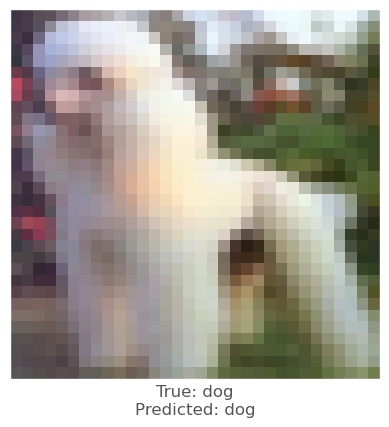



-0.0015686154
0.00084364414
-0.0009610653
vr, vg, vb :   0.1568615436553955 -0.08436441421508789 0.09610652923583984
beam_perturbed_confidence temp :  0.6778339
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6778339
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6778339
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6772468
row index :  1
0th round's confidence : 2th 0.6772468
predicted class :  dog
predicted class's confidence :  0.6772468
Lopt is :  5


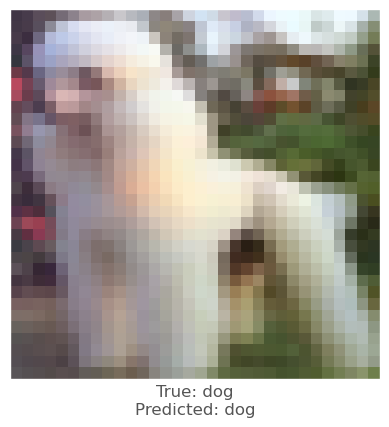



0.0034813285
0.010849237
0.0040889382
vr, vg, vb :   -0.348132848739624 -1.0849237442016602 -0.4088938236236572
beam_perturbed_confidence temp :  0.5630414
beam_perturbed_confidence temp :  0.5534537
beam_perturbed_confidence temp :  0.5627496
beam_perturbed_confidence temp :  0.55153763
beam_perturbed_confidence temp :  0.5606267
beam_perturbed_confidence temp :  0.55101144
beam_perturbed_confidence temp :  0.54912597
row index :  6
0th round's confidence : 3th 0.54912597
predicted class :  dog
predicted class's confidence :  0.54912597
Lopt is :  12


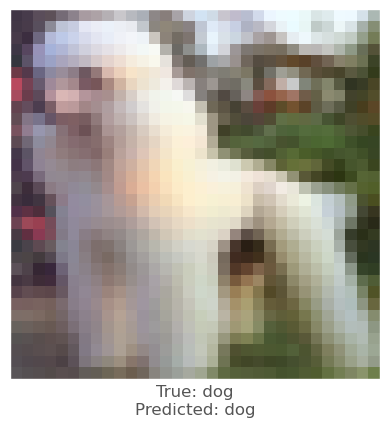



-0.00541538
-0.002251923
-0.0024074912
vr, vg, vb :   0.5415380001068115 0.22519230842590332 0.24074912071228027
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
row index :  0
0th round's confidence : 4th 0.6560532
predicted class :  dog
predicted class's confidence :  0.6560532
Lopt is :  10


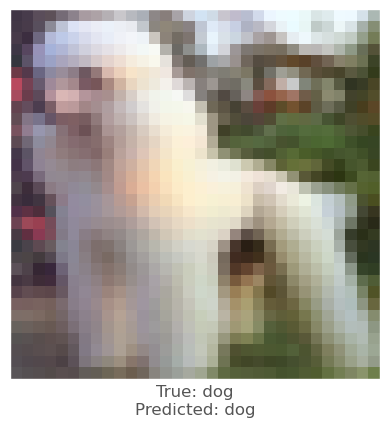



0.0023152232
0.008653522
0.0026548505
vr, vg, vb :   -0.39470791816711426 -1.5364354848861694 -0.4904741048812866
beam_perturbed_confidence temp :  0.660989
beam_perturbed_confidence temp :  0.65174955
beam_perturbed_confidence temp :  0.66096693
beam_perturbed_confidence temp :  0.648746
beam_perturbed_confidence temp :  0.65933603
beam_perturbed_confidence temp :  0.64954287
beam_perturbed_confidence temp :  0.64650345
row index :  6
1th round's confidence : 0th 0.64650345
predicted class :  dog
predicted class's confidence :  0.64650345
Lopt is :  3


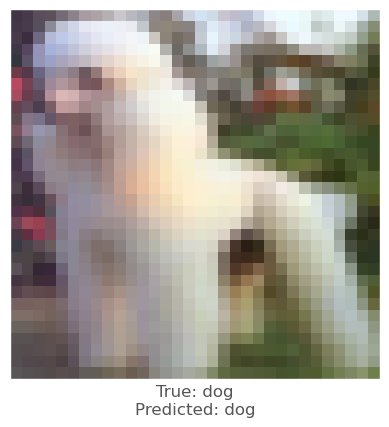



0.0047567487
0.013707101
0.004621923
vr, vg, vb :   -0.8720946311950684 -2.4955320358276367 -0.8585155010223389
beam_perturbed_confidence temp :  0.600199
beam_perturbed_confidence temp :  0.5820171
beam_perturbed_confidence temp :  0.60071766
beam_perturbed_confidence temp :  0.57974935
beam_perturbed_confidence temp :  0.59726816
beam_perturbed_confidence temp :  0.57952446
beam_perturbed_confidence temp :  0.5770798
row index :  6
1th round's confidence : 1th 0.5770798
predicted class :  dog
predicted class's confidence :  0.5770798
Lopt is :  10


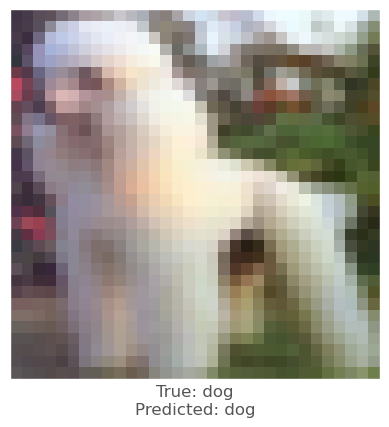



-0.0015177131
0.0008727312
-0.0011971593
vr, vg, vb :   0.2929466962814331 -0.16320109367370605 0.20621180534362793
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.6772468
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.6769612
row index :  1
1th round's confidence : 2th 0.6769612
predicted class :  dog
predicted class's confidence :  0.6769612
Lopt is :  5


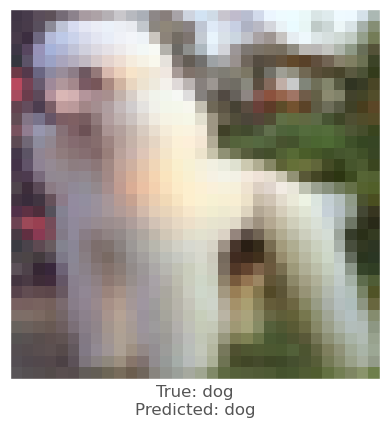



0.0040280223
0.012322903
0.0049535036
vr, vg, vb :   -0.7161217927932739 -2.20872163772583 -0.8633548021316528
beam_perturbed_confidence temp :  0.5469834
beam_perturbed_confidence temp :  0.52914053
beam_perturbed_confidence temp :  0.5465841
beam_perturbed_confidence temp :  0.52637035
beam_perturbed_confidence temp :  0.5441838
beam_perturbed_confidence temp :  0.5263878
beam_perturbed_confidence temp :  0.5234213
row index :  6
1th round's confidence : 3th 0.5234213
predicted class :  dog
predicted class's confidence :  0.5234213
Lopt is :  15


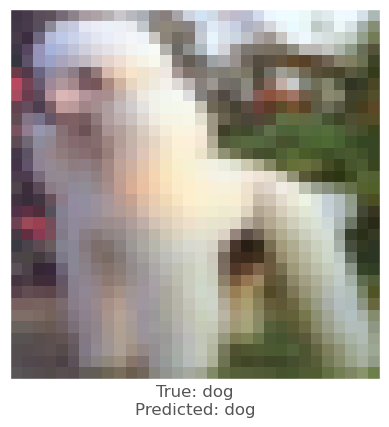



-0.00541538
-0.002251923
-0.0024074912
vr, vg, vb :   1.028922200202942 0.4278653860092163 0.4574233293533325
beam_perturbed_confidence temp :  0.6534288
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6534288
beam_perturbed_confidence temp :  0.6534288
beam_perturbed_confidence temp :  0.6560532
beam_perturbed_confidence temp :  0.6534288
row index :  0
1th round's confidence : 4th 0.6534288
predicted class :  dog
predicted class's confidence :  0.6534288
Lopt is :  11


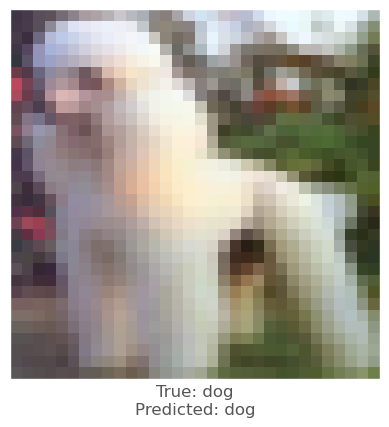



0.0061430335
0.014564335
0.004528165
vr, vg, vb :   -0.9695404767990112 -2.839225471019745 -0.8942431807518005
beam_perturbed_confidence temp :  0.64339983
beam_perturbed_confidence temp :  0.6269627
beam_perturbed_confidence temp :  0.64421785
beam_perturbed_confidence temp :  0.6251443
beam_perturbed_confidence temp :  0.6412927
beam_perturbed_confidence temp :  0.62529254
beam_perturbed_confidence temp :  0.62292933
row index :  6
2th round's confidence : 0th 0.62292933
predicted class :  dog
predicted class's confidence :  0.62292933
Lopt is :  6


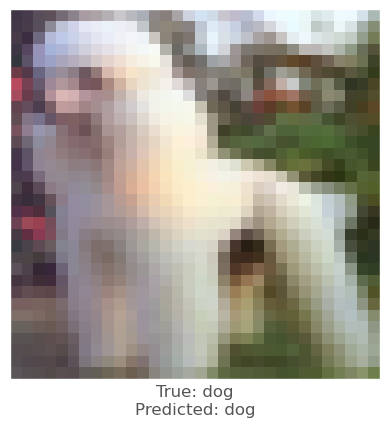



0.004512131
0.012698114
0.005115092
vr, vg, vb :   -1.236098289489746 -3.5157902240753174 -1.2841731309890747
beam_perturbed_confidence temp :  0.57315946
beam_perturbed_confidence temp :  0.5540382
beam_perturbed_confidence temp :  0.5723062
beam_perturbed_confidence temp :  0.5506868
beam_perturbed_confidence temp :  0.5686826
beam_perturbed_confidence temp :  0.5495969
beam_perturbed_confidence temp :  0.5459966
row index :  6
2th round's confidence : 1th 0.5459966
predicted class :  dog
predicted class's confidence :  0.5459966
Lopt is :  14


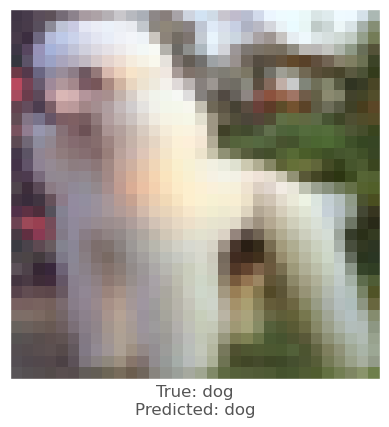



-0.0015359521
0.0007775426
-0.0012424588
vr, vg, vb :   0.4172472357749939 -0.22463524341583252 0.3098365068435669
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.67646927
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.67646927
beam_perturbed_confidence temp :  0.6769612
beam_perturbed_confidence temp :  0.67646927
beam_perturbed_confidence temp :  0.67646927
row index :  1
2th round's confidence : 2th 0.67646927
predicted class :  dog
predicted class's confidence :  0.67646927
Lopt is :  5


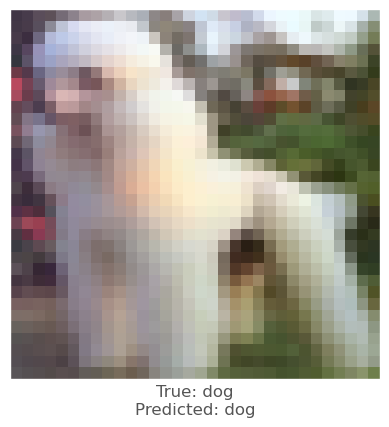



0.0057913065
0.013538063
0.0059145093
vr, vg, vb :   -1.223640263080597 -3.341655731201172 -1.3684702515602112
beam_perturbed_confidence temp :  0.5178276
beam_perturbed_confidence temp :  0.4945406
beam_perturbed_confidence temp :  0.5176644
beam_perturbed_confidence temp :  0.48719856
beam_perturbed_confidence temp :  0.5117329
beam_perturbed_confidence temp :  0.486879
beam_perturbed_confidence temp :  0.47953618
row index :  6
2th round's confidence : 3th 0.47953618
predicted class :  horse
predicted class's confidence :  0.5132196
Lopt is :  19


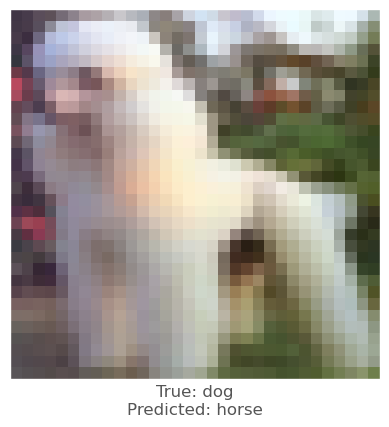




26th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  197 196 185
0.0015731454
-0.0077415705
-0.0026208162
vr, vg, vb :   -0.15731453895568848 0.7741570472717285 0.2620816230773926
beam_perturbed_confidence temp :  0.66785395
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66785395
beam_perturbed_confidence temp :  0.66785395
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66785395
row index :  0
0th round's confidence : 0th 0.66785395
predicted class :  dog
predicted class's confidence :  0.66785395
Lopt is :  1


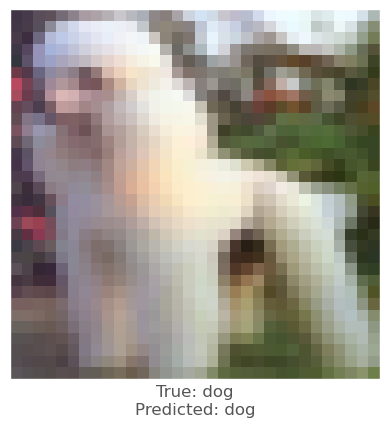



0.00996834
0.007407427
0.0011129379
vr, vg, vb :   -0.9968340396881104 -0.7407426834106445 -0.11129379272460938
beam_perturbed_confidence temp :  0.62165064
beam_perturbed_confidence temp :  0.6230251
beam_perturbed_confidence temp :  0.62631696
beam_perturbed_confidence temp :  0.616896
beam_perturbed_confidence temp :  0.620157
beam_perturbed_confidence temp :  0.6218899
beam_perturbed_confidence temp :  0.6151114
row index :  6
0th round's confidence : 1th 0.6151114
predicted class :  dog
predicted class's confidence :  0.6151114
Lopt is :  6


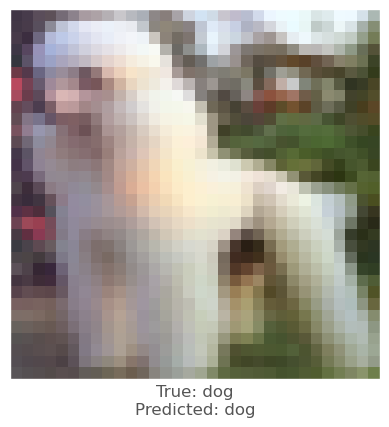



-0.008962393
-0.014246523
-0.0057801604
vr, vg, vb :   0.8962392807006836 1.424652338027954 0.5780160427093506
beam_perturbed_confidence temp :  0.65524346
beam_perturbed_confidence temp :  0.6488763
beam_perturbed_confidence temp :  0.65524346
beam_perturbed_confidence temp :  0.6488763
beam_perturbed_confidence temp :  0.65524346
beam_perturbed_confidence temp :  0.6488763
beam_perturbed_confidence temp :  0.6488763
row index :  1
0th round's confidence : 2th 0.6488763
predicted class :  dog
predicted class's confidence :  0.6488763
Lopt is :  6


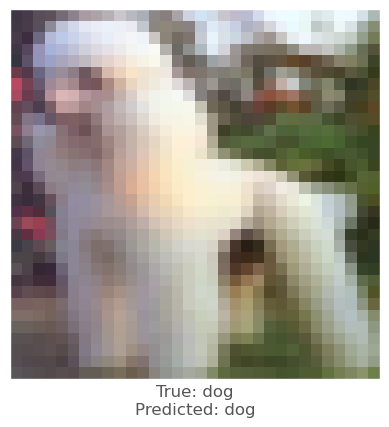



0.007879078
0.0095078945
0.0038103461
vr, vg, vb :   -0.7879078388214111 -0.9507894515991211 -0.38103461265563965
beam_perturbed_confidence temp :  0.56265086
beam_perturbed_confidence temp :  0.5616631
beam_perturbed_confidence temp :  0.5644664
beam_perturbed_confidence temp :  0.5586
beam_perturbed_confidence temp :  0.56104475
beam_perturbed_confidence temp :  0.56011856
beam_perturbed_confidence temp :  0.5571552
row index :  6
0th round's confidence : 3th 0.5571552
predicted class :  dog
predicted class's confidence :  0.5571552
Lopt is :  11


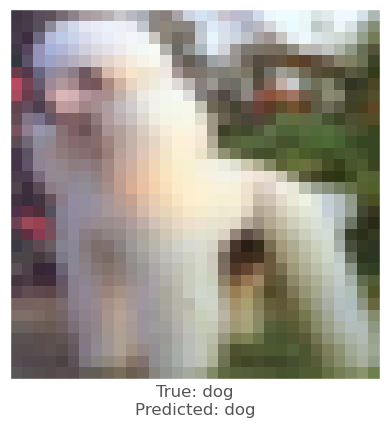



-0.0050267577
-0.0081192255
-0.0041449666
vr, vg, vb :   0.5026757717132568 0.811922550201416 0.41449666023254395
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.6122901
row index :  0
0th round's confidence : 4th 0.6122901
predicted class :  dog
predicted class's confidence :  0.6122901
Lopt is :  10


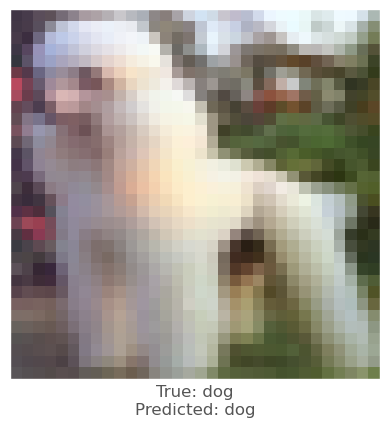



0.0054689646
-0.00331223
-0.00016129017
vr, vg, vb :   -0.6884795427322388 1.0279643535614014 0.252002477645874
beam_perturbed_confidence temp :  0.6631605
beam_perturbed_confidence temp :  0.6637504
beam_perturbed_confidence temp :  0.66785395
beam_perturbed_confidence temp :  0.6632008
beam_perturbed_confidence temp :  0.6631605
beam_perturbed_confidence temp :  0.6637504
beam_perturbed_confidence temp :  0.6632008
row index :  0
1th round's confidence : 0th 0.6631605
predicted class :  dog
predicted class's confidence :  0.6631605
Lopt is :  2


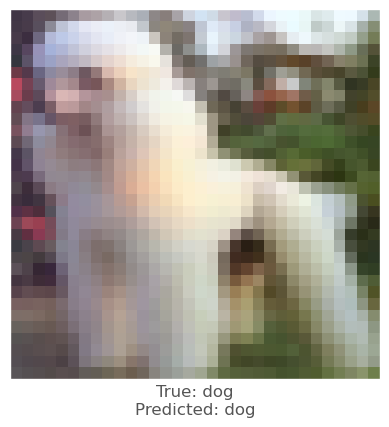



0.014724731
0.012025952
0.0052767396
vr, vg, vb :   -2.3696237802505493 -1.8692636489868164 -0.6278383731842041
beam_perturbed_confidence temp :  0.59596306
beam_perturbed_confidence temp :  0.6034376
beam_perturbed_confidence temp :  0.61161923
beam_perturbed_confidence temp :  0.5882022
beam_perturbed_confidence temp :  0.5938757
beam_perturbed_confidence temp :  0.6013728
beam_perturbed_confidence temp :  0.58637947
row index :  6
1th round's confidence : 1th 0.58637947
predicted class :  dog
predicted class's confidence :  0.58637947
Lopt is :  9


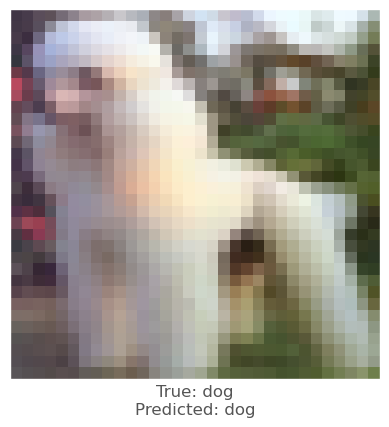



-0.007911921
-0.012068868
-0.00532043
vr, vg, vb :   1.5978074073791504 2.489073872566223 1.0522574186325073
beam_perturbed_confidence temp :  0.6453064
beam_perturbed_confidence temp :  0.63727677
beam_perturbed_confidence temp :  0.64642215
beam_perturbed_confidence temp :  0.63555723
beam_perturbed_confidence temp :  0.64312375
beam_perturbed_confidence temp :  0.6353003
beam_perturbed_confidence temp :  0.6339187
row index :  6
1th round's confidence : 2th 0.6339187
predicted class :  dog
predicted class's confidence :  0.6339187
Lopt is :  8


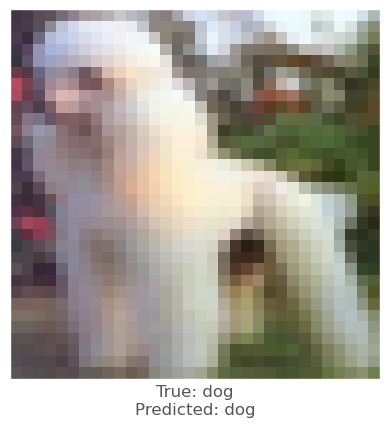



0.006487608
0.009006202
0.0033835173
vr, vg, vb :   -1.3578778505325317 -1.7563307285308838 -0.6812828779220581
beam_perturbed_confidence temp :  0.54941636
beam_perturbed_confidence temp :  0.54598665
beam_perturbed_confidence temp :  0.5552165
beam_perturbed_confidence temp :  0.5383024
beam_perturbed_confidence temp :  0.5472921
beam_perturbed_confidence temp :  0.54390967
beam_perturbed_confidence temp :  0.5364667
row index :  6
1th round's confidence : 3th 0.5364667
predicted class :  dog
predicted class's confidence :  0.5364667
Lopt is :  13


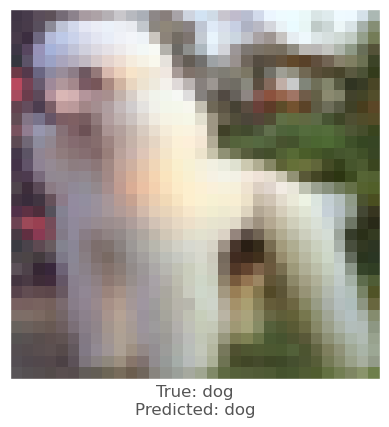



-0.0050267577
-0.0081192255
-0.0041449666
vr, vg, vb :   0.955083966255188 1.5426528453826904 0.7875436544418335
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.60868055
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.60868055
beam_perturbed_confidence temp :  0.6122901
beam_perturbed_confidence temp :  0.60868055
beam_perturbed_confidence temp :  0.60868055
row index :  1
1th round's confidence : 4th 0.60868055
predicted class :  dog
predicted class's confidence :  0.60868055
Lopt is :  11


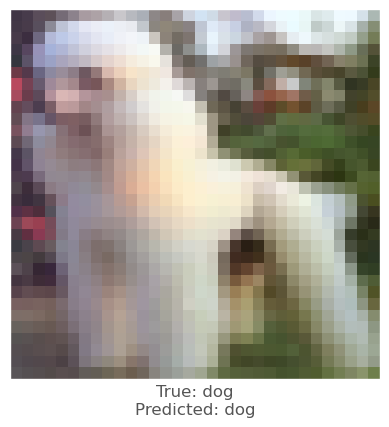



0.0066173077
-0.0010647774
0.0020174384
vr, vg, vb :   -1.2813623547554016 1.031645655632019 0.025058388710021973
beam_perturbed_confidence temp :  0.6587231
beam_perturbed_confidence temp :  0.6632008
beam_perturbed_confidence temp :  0.6631605
beam_perturbed_confidence temp :  0.6580482
beam_perturbed_confidence temp :  0.6587231
beam_perturbed_confidence temp :  0.6632008
beam_perturbed_confidence temp :  0.6580482
row index :  3
2th round's confidence : 0th 0.6580482
predicted class :  dog
predicted class's confidence :  0.6580482
Lopt is :  4


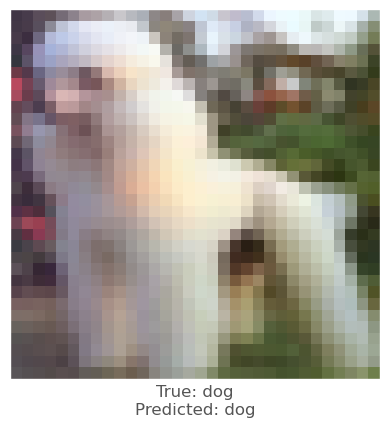



0.009866774
0.00891602
0.003691852
vr, vg, vb :   -3.119338810443878 -2.573939323425293 -0.9342397451400757
beam_perturbed_confidence temp :  0.56810343
beam_perturbed_confidence temp :  0.5716189
beam_perturbed_confidence temp :  0.5845103
beam_perturbed_confidence temp :  0.5547314
beam_perturbed_confidence temp :  0.56611997
beam_perturbed_confidence temp :  0.56970716
beam_perturbed_confidence temp :  0.55342174
row index :  6
2th round's confidence : 1th 0.55342174
predicted class :  dog
predicted class's confidence :  0.55342174
Lopt is :  13


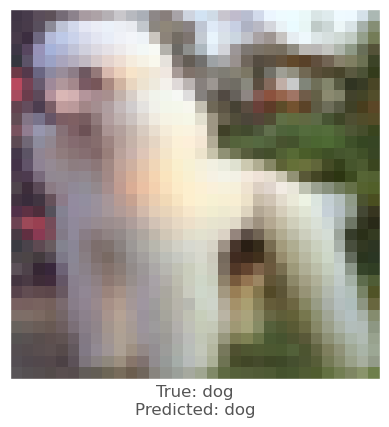



-0.003789723
-0.009755313
-0.004005313
vr, vg, vb :   1.8169989585876465 3.2156978249549866 1.3475629687309265
beam_perturbed_confidence temp :  0.63151056
beam_perturbed_confidence temp :  0.6206511
beam_perturbed_confidence temp :  0.6315519
beam_perturbed_confidence temp :  0.62052846
beam_perturbed_confidence temp :  0.6295724
beam_perturbed_confidence temp :  0.6195756
beam_perturbed_confidence temp :  0.6195189
row index :  6
2th round's confidence : 2th 0.6195189
predicted class :  dog
predicted class's confidence :  0.6195189
Lopt is :  11


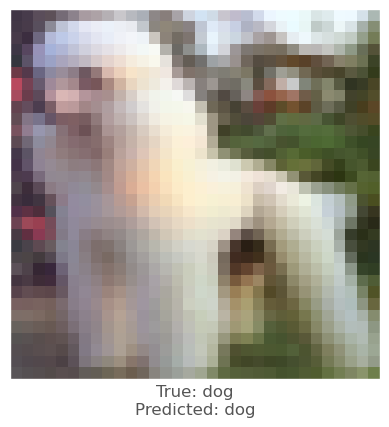



0.0077846646
0.011081219
0.0036964417
vr, vg, vb :   -2.000556528568268 -2.6888195276260376 -0.9827987551689148
beam_perturbed_confidence temp :  0.524032
beam_perturbed_confidence temp :  0.5196222
beam_perturbed_confidence temp :  0.534606
beam_perturbed_confidence temp :  0.50782174
beam_perturbed_confidence temp :  0.52212936
beam_perturbed_confidence temp :  0.51777685
beam_perturbed_confidence temp :  0.50569296
row index :  6
2th round's confidence : 3th 0.50569296
predicted class :  dog
predicted class's confidence :  0.50569296
Lopt is :  16


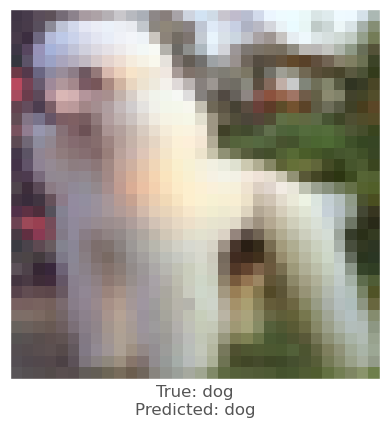



-0.003904581
-0.0062868595
-0.0027083755
vr, vg, vb :   1.250033676624298 2.0170735120773315 0.9796268343925476
beam_perturbed_confidence temp :  0.6069288
beam_perturbed_confidence temp :  0.6038892
beam_perturbed_confidence temp :  0.60868055
beam_perturbed_confidence temp :  0.6031791
beam_perturbed_confidence temp :  0.6069288
beam_perturbed_confidence temp :  0.6038892
beam_perturbed_confidence temp :  0.6031791
row index :  3
2th round's confidence : 4th 0.6031791
predicted class :  dog
predicted class's confidence :  0.6031791
Lopt is :  13


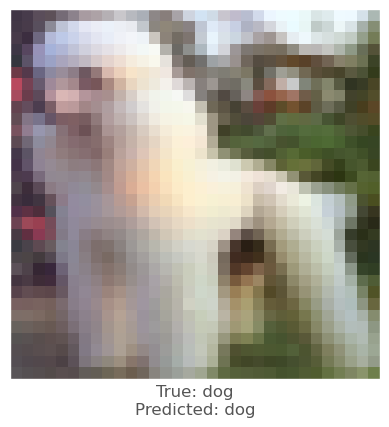



0.0023781061
-0.0018888116
0.00014895201
vr, vg, vb :   -1.391036731004715 1.1173622488975525 0.007657349109649658
beam_perturbed_confidence temp :  0.6540537
beam_perturbed_confidence temp :  0.6568343
beam_perturbed_confidence temp :  0.6580482
beam_perturbed_confidence temp :  0.65611094
beam_perturbed_confidence temp :  0.6540537
beam_perturbed_confidence temp :  0.6568343
beam_perturbed_confidence temp :  0.65611094
row index :  0
3th round's confidence : 0th 0.6540537
predicted class :  dog
predicted class's confidence :  0.6540537
Lopt is :  6


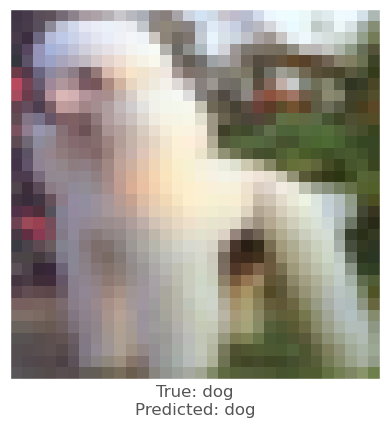



0.0077046156
0.0086423755
0.0022485852
vr, vg, vb :   -3.5778664886951446 -3.18078293800354 -1.0656742930412293
beam_perturbed_confidence temp :  0.5357118
beam_perturbed_confidence temp :  0.53199965
beam_perturbed_confidence temp :  0.5512346
beam_perturbed_confidence temp :  0.51515263
beam_perturbed_confidence temp :  0.5330407
beam_perturbed_confidence temp :  0.52867025
beam_perturbed_confidence temp :  0.5126245
row index :  6
3th round's confidence : 1th 0.5126245
predicted class :  dog
predicted class's confidence :  0.5126245
Lopt is :  17


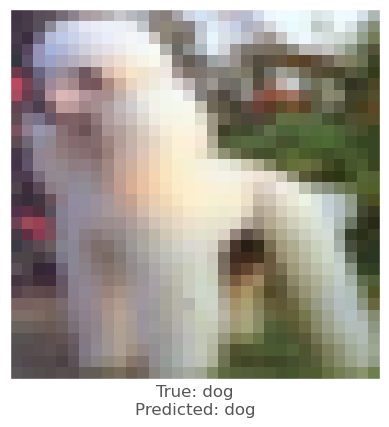



-0.0013335943
-0.006475866
-0.0026555061
vr, vg, vb :   1.768658494949341 3.5417146265506747 1.4783572852611542
beam_perturbed_confidence temp :  0.618242
beam_perturbed_confidence temp :  0.6071969
beam_perturbed_confidence temp :  0.61787295
beam_perturbed_confidence temp :  0.6054962
beam_perturbed_confidence temp :  0.6163839
beam_perturbed_confidence temp :  0.60582036
beam_perturbed_confidence temp :  0.6041724
row index :  6
3th round's confidence : 2th 0.6041724
predicted class :  dog
predicted class's confidence :  0.6041724
Lopt is :  14


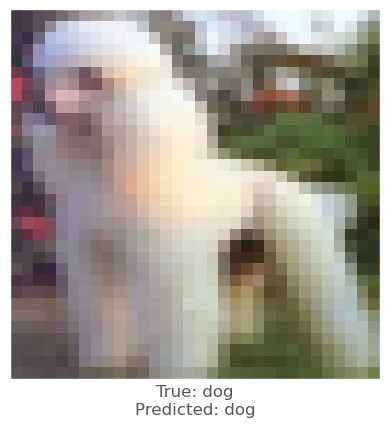



0.007818699
0.011253476
0.0041698813
vr, vg, vb :   -2.582370764017105 -3.545285189151764 -1.3015070140361786
beam_perturbed_confidence temp :  0.49392483
beam_perturbed_confidence temp :  0.4839451
beam_perturbed_confidence temp :  0.5016538
beam_perturbed_confidence temp :  0.47239012
beam_perturbed_confidence temp :  0.48958698
beam_perturbed_confidence temp :  0.47951135
beam_perturbed_confidence temp :  0.46914074
row index :  6
3th round's confidence : 3th 0.46914074
predicted class :  horse
predicted class's confidence :  0.52438504
Lopt is :  20


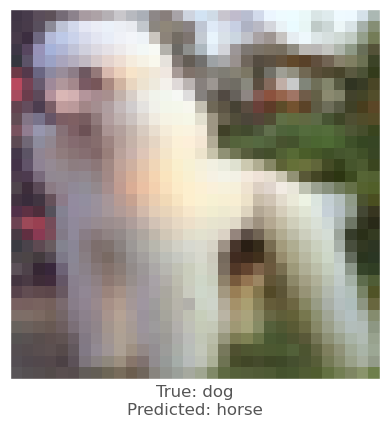




27th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  145 136 143
0.017213166
0.0050573945
-0.004409194
vr, vg, vb :   -1.7213165760040283 -0.5057394504547119 0.4409193992614746
beam_perturbed_confidence temp :  0.64913064
beam_perturbed_confidence temp :  0.6650599
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6445444
beam_perturbed_confidence temp :  0.64913064
beam_perturbed_confidence temp :  0.6650599
beam_perturbed_confidence temp :  0.6445444
row index :  3
0th round's confidence : 0th 0.6445444
predicted class :  dog
predicted class's confidence :  0.6445444
Lopt is :  2


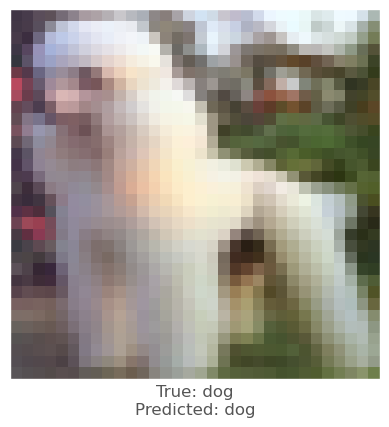



0.008729577
-0.014714599
-0.012295008
vr, vg, vb :   -0.872957706451416 1.4714598655700684 1.2295007705688477
beam_perturbed_confidence temp :  0.6808176
beam_perturbed_confidence temp :  0.6771842
beam_perturbed_confidence temp :  0.67896664
beam_perturbed_confidence temp :  0.6734923
beam_perturbed_confidence temp :  0.675122
beam_perturbed_confidence temp :  0.66982484
beam_perturbed_confidence temp :  0.66711986
row index :  6
0th round's confidence : 1th 0.66711986
predicted class :  dog
predicted class's confidence :  0.66711986
Lopt is :  6


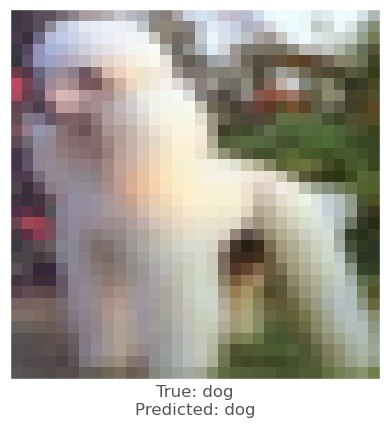



0.009521246
0.0021582246
-0.0015664697
vr, vg, vb :   -0.9521245956420898 -0.21582245826721191 0.1566469669342041
beam_perturbed_confidence temp :  0.69861436
beam_perturbed_confidence temp :  0.7025685
beam_perturbed_confidence temp :  0.7031511
beam_perturbed_confidence temp :  0.6988633
beam_perturbed_confidence temp :  0.69861436
beam_perturbed_confidence temp :  0.7025685
beam_perturbed_confidence temp :  0.6988633
row index :  0
0th round's confidence : 2th 0.69861436
predicted class :  dog
predicted class's confidence :  0.69861436
Lopt is :  5


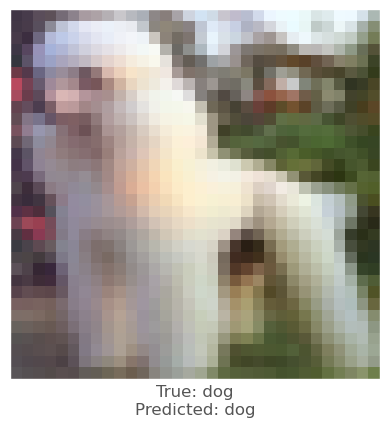



0.007662654
-0.019426584
-0.017545879
vr, vg, vb :   -0.7662653923034668 1.9426584243774414 1.7545878887176514
beam_perturbed_confidence temp :  0.73714834
beam_perturbed_confidence temp :  0.7316128
beam_perturbed_confidence temp :  0.73245984
beam_perturbed_confidence temp :  0.72791326
beam_perturbed_confidence temp :  0.728371
beam_perturbed_confidence temp :  0.7241561
beam_perturbed_confidence temp :  0.7190683
row index :  6
0th round's confidence : 3th 0.7190683
predicted class :  dog
predicted class's confidence :  0.7190683
Lopt is :  11


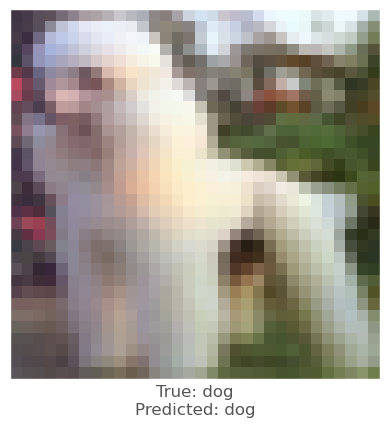



0.0058693886
-0.010326326
-0.004176736
vr, vg, vb :   -0.5869388580322266 1.03263258934021 0.41767358779907227
beam_perturbed_confidence temp :  0.6859821
beam_perturbed_confidence temp :  0.6837833
beam_perturbed_confidence temp :  0.6887062
beam_perturbed_confidence temp :  0.6809053
beam_perturbed_confidence temp :  0.6859821
beam_perturbed_confidence temp :  0.6837833
beam_perturbed_confidence temp :  0.6809053
row index :  3
0th round's confidence : 4th 0.6809053
predicted class :  dog
predicted class's confidence :  0.6809053
Lopt is :  11


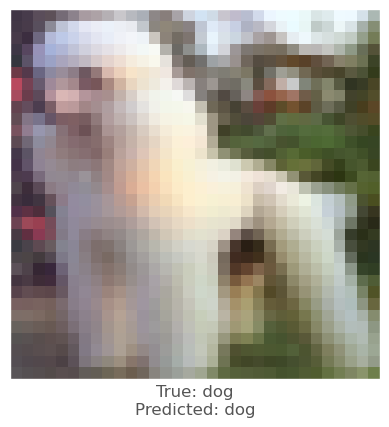



0.021567345
0.004579842
-0.0040273666
vr, vg, vb :   -3.70591938495636 -0.9131497144699097 0.7995641231536865
beam_perturbed_confidence temp :  0.60707587
beam_perturbed_confidence temp :  0.6445508
beam_perturbed_confidence temp :  0.6445444
beam_perturbed_confidence temp :  0.6123921
beam_perturbed_confidence temp :  0.60707587
beam_perturbed_confidence temp :  0.6445508
beam_perturbed_confidence temp :  0.6123921
row index :  0
1th round's confidence : 0th 0.60707587
predicted class :  dog
predicted class's confidence :  0.60707587
Lopt is :  6


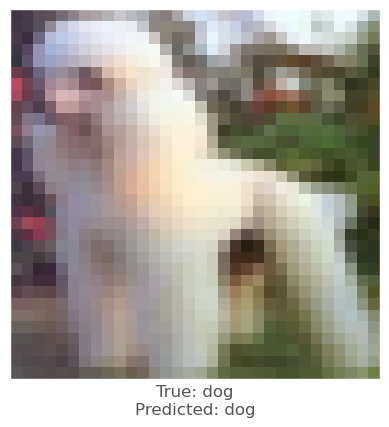



0.0049140453
-0.016534328
-0.012676418
vr, vg, vb :   -1.2770664691925049 2.9777467250823975 2.374192476272583
beam_perturbed_confidence temp :  0.6626136
beam_perturbed_confidence temp :  0.6460424
beam_perturbed_confidence temp :  0.6546488
beam_perturbed_confidence temp :  0.64722866
beam_perturbed_confidence temp :  0.6521434
beam_perturbed_confidence temp :  0.6299362
beam_perturbed_confidence temp :  0.63199097
row index :  5
1th round's confidence : 1th 0.6299362
predicted class :  dog
predicted class's confidence :  0.6299362
Lopt is :  6


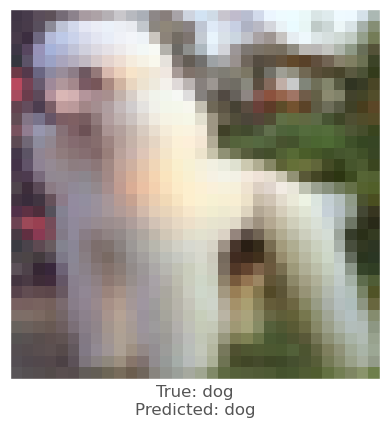



0.008879781
0.0011917353
-0.0028826594
vr, vg, vb :   -1.7448902130126953 -0.31341373920440674 0.42924821376800537
beam_perturbed_confidence temp :  0.69034165
beam_perturbed_confidence temp :  0.6988633
beam_perturbed_confidence temp :  0.69861436
beam_perturbed_confidence temp :  0.69171023
beam_perturbed_confidence temp :  0.69034165
beam_perturbed_confidence temp :  0.6988633
beam_perturbed_confidence temp :  0.69171023
row index :  0
1th round's confidence : 2th 0.69034165
predicted class :  dog
predicted class's confidence :  0.69034165
Lopt is :  5


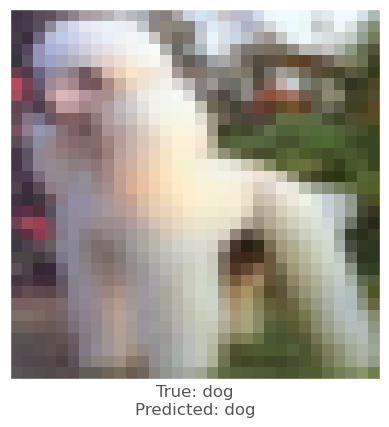



0.008399487
-0.017464578
-0.016619682
vr, vg, vb :   -1.5295875072479248 3.4948503971099854 3.241097331047058
beam_perturbed_confidence temp :  0.71331567
beam_perturbed_confidence temp :  0.69489396
beam_perturbed_confidence temp :  0.69673777
beam_perturbed_confidence temp :  0.6901797
beam_perturbed_confidence temp :  0.690825
beam_perturbed_confidence temp :  0.67766476
beam_perturbed_confidence temp :  0.67386854
row index :  6
1th round's confidence : 3th 0.67386854
predicted class :  dog
predicted class's confidence :  0.67386854
Lopt is :  13


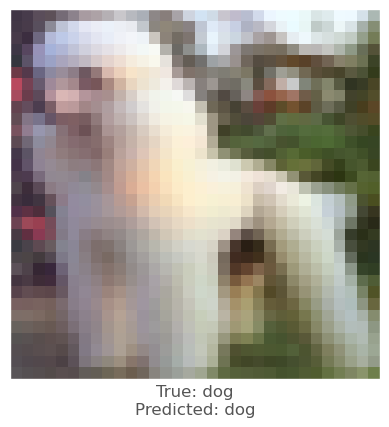



0.0056524277
-0.010193765
-0.0040575266
vr, vg, vb :   -1.0934877395629883 1.948745846748352 0.7816588878631592
beam_perturbed_confidence temp :  0.6748859
beam_perturbed_confidence temp :  0.67578834
beam_perturbed_confidence temp :  0.6809053
beam_perturbed_confidence temp :  0.66928643
beam_perturbed_confidence temp :  0.6748859
beam_perturbed_confidence temp :  0.67578834
beam_perturbed_confidence temp :  0.66928643
row index :  3
1th round's confidence : 4th 0.66928643
predicted class :  dog
predicted class's confidence :  0.66928643
Lopt is :  12


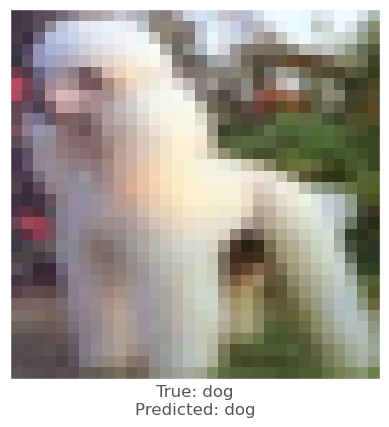



0.014711559
-0.009492695
-0.011597037
vr, vg, vb :   -4.806483328342438 0.12743479013442993 1.879311442375183
beam_perturbed_confidence temp :  0.60426414
beam_perturbed_confidence temp :  0.60707587
beam_perturbed_confidence temp :  0.6016094
beam_perturbed_confidence temp :  0.60426414
beam_perturbed_confidence temp :  0.5967239
beam_perturbed_confidence temp :  0.6016094
beam_perturbed_confidence temp :  0.5967239
row index :  4
2th round's confidence : 0th 0.5967239
predicted class :  dog
predicted class's confidence :  0.5967239
Lopt is :  11


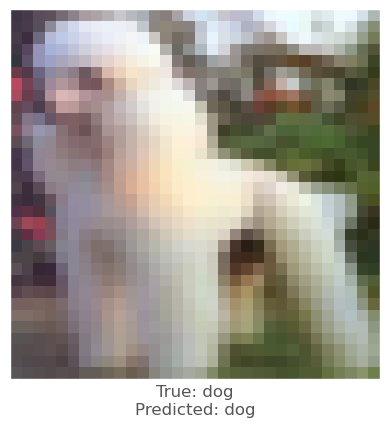



0.0028735995
-0.024043918
-0.016971052
vr, vg, vb :   -1.4367197751998901 5.08436381816864 3.8338783979415894
beam_perturbed_confidence temp :  0.63199097
beam_perturbed_confidence temp :  0.61575747
beam_perturbed_confidence temp :  0.6061664
beam_perturbed_confidence temp :  0.58805233
beam_perturbed_confidence temp :  0.6033935
beam_perturbed_confidence temp :  0.60354364
beam_perturbed_confidence temp :  0.578775
row index :  6
2th round's confidence : 1th 0.578775
predicted class :  dog
predicted class's confidence :  0.578775
Lopt is :  8


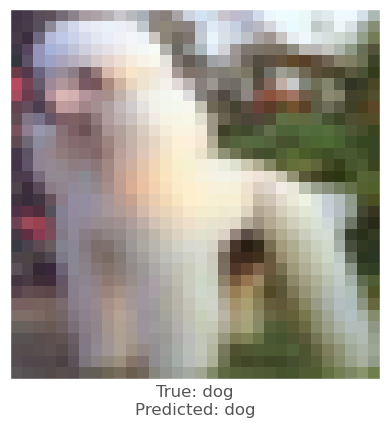



0.008049488
-0.0005919337
-0.0054315925
vr, vg, vb :   -2.375349998474121 -0.22287899255752563 0.929482638835907
beam_perturbed_confidence temp :  0.6697898
beam_perturbed_confidence temp :  0.69171023
beam_perturbed_confidence temp :  0.69034165
beam_perturbed_confidence temp :  0.66447717
beam_perturbed_confidence temp :  0.6697898
beam_perturbed_confidence temp :  0.69171023
beam_perturbed_confidence temp :  0.66447717
row index :  3
2th round's confidence : 2th 0.66447717
predicted class :  dog
predicted class's confidence :  0.66447717
Lopt is :  5


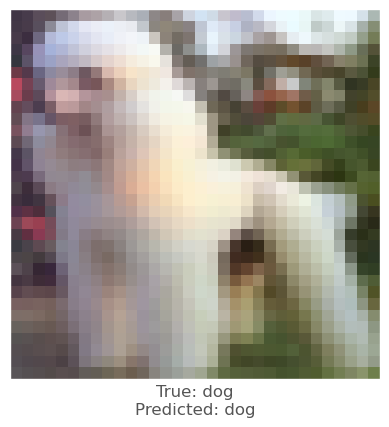



0.0013962388
-0.009771943
-0.007665038
vr, vg, vb :   -1.5162526369094849 4.122559666633606 3.6834914088249207
beam_perturbed_confidence temp :  0.67494917
beam_perturbed_confidence temp :  0.65324926
beam_perturbed_confidence temp :  0.6640308
beam_perturbed_confidence temp :  0.65133387
beam_perturbed_confidence temp :  0.66123134
beam_perturbed_confidence temp :  0.6388641
beam_perturbed_confidence temp :  0.638415
row index :  6
2th round's confidence : 3th 0.638415
predicted class :  dog
predicted class's confidence :  0.638415
Lopt is :  15


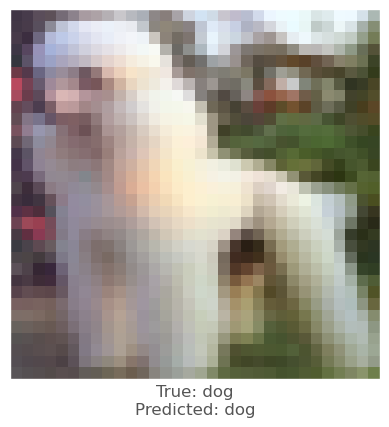



0.0070580244
-0.010923028
-0.0043572187
vr, vg, vb :   -1.68994140625 2.8461740612983704 1.1392148733139038
beam_perturbed_confidence temp :  0.66194445
beam_perturbed_confidence temp :  0.6591568
beam_perturbed_confidence temp :  0.6671296
beam_perturbed_confidence temp :  0.65083706
beam_perturbed_confidence temp :  0.65910614
beam_perturbed_confidence temp :  0.65785533
beam_perturbed_confidence temp :  0.64923656
row index :  6
2th round's confidence : 4th 0.64923656
predicted class :  dog
predicted class's confidence :  0.64923656
Lopt is :  14


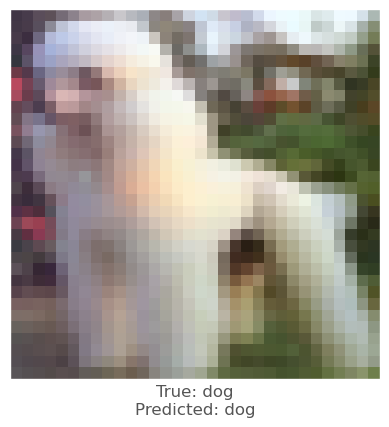



-0.0016246438
-0.025059342
-0.015395939
vr, vg, vb :   -4.163370615243912 2.6206255495548247 3.2309742331504823
beam_perturbed_confidence temp :  0.60174614
beam_perturbed_confidence temp :  0.56374514
beam_perturbed_confidence temp :  0.56957096
beam_perturbed_confidence temp :  0.57802844
beam_perturbed_confidence temp :  0.57763416
beam_perturbed_confidence temp :  0.5414698
beam_perturbed_confidence temp :  0.5503229
row index :  5
3th round's confidence : 0th 0.5414698
predicted class :  dog
predicted class's confidence :  0.5414698
Lopt is :  11


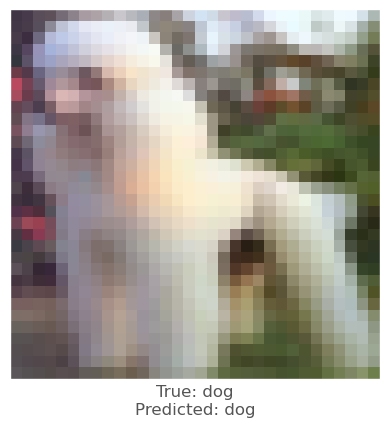



0.027783513
0.0069965124
-0.00700438
vr, vg, vb :   -4.0713991045951845 3.876276195049286 4.150928580760956
beam_perturbed_confidence temp :  0.54184383
beam_perturbed_confidence temp :  0.586235
beam_perturbed_confidence temp :  0.5675594
beam_perturbed_confidence temp :  0.5201768
beam_perturbed_confidence temp :  0.5128236
beam_perturbed_confidence temp :  0.58416647
beam_perturbed_confidence temp :  0.5136051
row index :  4
3th round's confidence : 1th 0.5128236
predicted class :  dog
predicted class's confidence :  0.5128236
Lopt is :  13


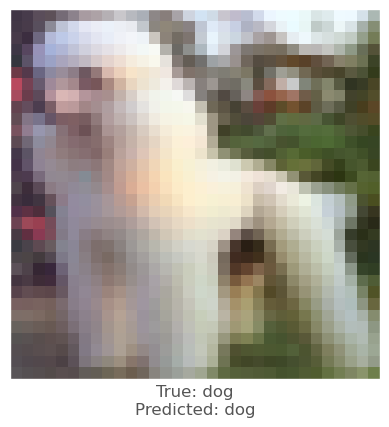



0.023341
0.012448847
0.000939548
vr, vg, vb :   -4.471915006637573 -1.4454758226871491 0.7425795733928681
beam_perturbed_confidence temp :  0.5964832
beam_perturbed_confidence temp :  0.65073323
beam_perturbed_confidence temp :  0.66447717
beam_perturbed_confidence temp :  0.5897637
beam_perturbed_confidence temp :  0.5964832
beam_perturbed_confidence temp :  0.65073323
beam_perturbed_confidence temp :  0.5897637
row index :  3
3th round's confidence : 2th 0.5897637
predicted class :  dog
predicted class's confidence :  0.5897637
Lopt is :  6


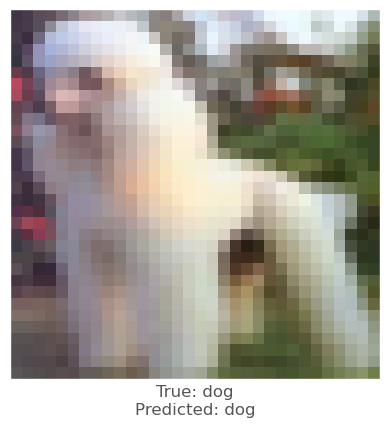



0.0011654496
-0.016284883
-0.011911392
vr, vg, vb :   -1.4811723351478576 5.33879200220108 4.506281489133835
beam_perturbed_confidence temp :  0.63720167
beam_perturbed_confidence temp :  0.5839234
beam_perturbed_confidence temp :  0.61123645
beam_perturbed_confidence temp :  0.5888933
beam_perturbed_confidence temp :  0.61237454
beam_perturbed_confidence temp :  0.54917645
beam_perturbed_confidence temp :  0.5528
row index :  5
3th round's confidence : 3th 0.54917645
predicted class :  dog
predicted class's confidence :  0.54917645
Lopt is :  15


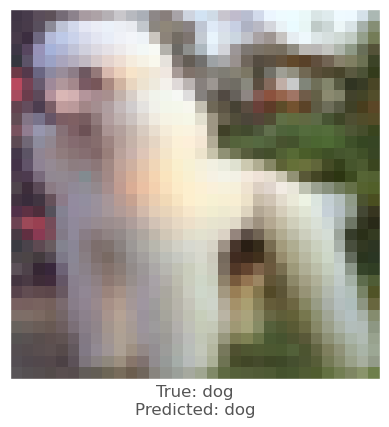



0.009347677
-0.008467317
-0.0031479597
vr, vg, vb :   -2.455714988708496 3.4082883179187777 1.3400893568992616
beam_perturbed_confidence temp :  0.6358077
beam_perturbed_confidence temp :  0.6369086
beam_perturbed_confidence temp :  0.6476891
beam_perturbed_confidence temp :  0.6226636
beam_perturbed_confidence temp :  0.6331399
beam_perturbed_confidence temp :  0.634794
beam_perturbed_confidence temp :  0.62089604
row index :  6
3th round's confidence : 4th 0.62089604
predicted class :  dog
predicted class's confidence :  0.62089604
Lopt is :  17


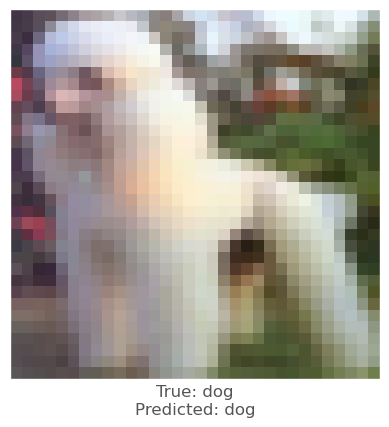



0.0013141632
-0.020196378
-0.01473999
vr, vg, vb :   -3.878449874520302 4.378200817704201 4.381875833272934
beam_perturbed_confidence temp :  0.5513127
beam_perturbed_confidence temp :  0.5379034
beam_perturbed_confidence temp :  0.5133129
beam_perturbed_confidence temp :  0.50088656
beam_perturbed_confidence temp :  0.5189186
beam_perturbed_confidence temp :  0.53590566
beam_perturbed_confidence temp :  0.4715778
row index :  6
4th round's confidence : 0th 0.4715778
predicted class :  horse
predicted class's confidence :  0.5221454
Lopt is :  15


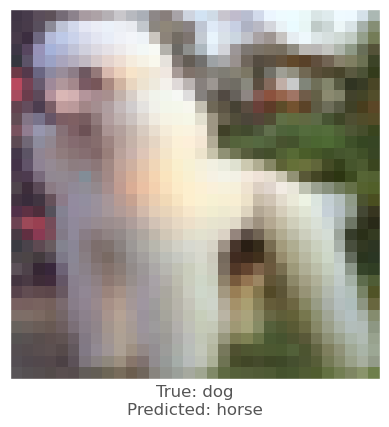




28th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  111 105 129
0.004782498
0.0037417412
0.00054359436
vr, vg, vb :   -0.47824978828430176 -0.3741741180419922 -0.05435943603515625
beam_perturbed_confidence temp :  0.666403
beam_perturbed_confidence temp :  0.66678023
beam_perturbed_confidence temp :  0.6683652
beam_perturbed_confidence temp :  0.6645949
beam_perturbed_confidence temp :  0.6662617
beam_perturbed_confidence temp :  0.66656184
beam_perturbed_confidence temp :  0.66448265
row index :  6
0th round's confidence : 0th 0.66448265
predicted class :  dog
predicted class's confidence :  0.66448265
Lopt is :  1


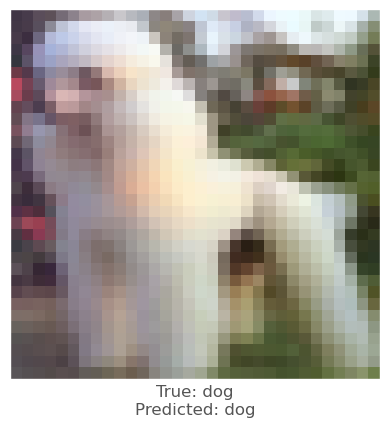



0.006891489
0.006899059
0.002863586
vr, vg, vb :   -0.6891489028930664 -0.6899058818817139 -0.2863585948944092
beam_perturbed_confidence temp :  0.6403313
beam_perturbed_confidence temp :  0.6402537
beam_perturbed_confidence temp :  0.6421346
beam_perturbed_confidence temp :  0.6370797
beam_perturbed_confidence temp :  0.6387837
beam_perturbed_confidence temp :  0.6383549
beam_perturbed_confidence temp :  0.63500786
row index :  6
0th round's confidence : 1th 0.63500786
predicted class :  dog
predicted class's confidence :  0.63500786
Lopt is :  6


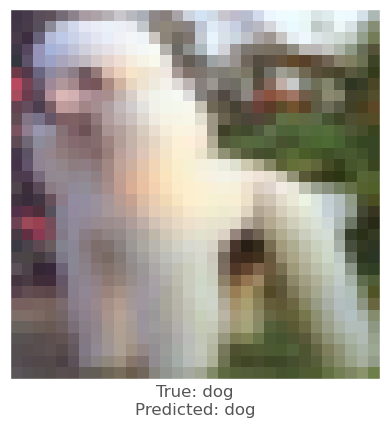



0.0020636916
0.0011962056
-0.0007354021
vr, vg, vb :   -0.20636916160583496 -0.11962056159973145 0.07354021072387695
beam_perturbed_confidence temp :  0.68544865
beam_perturbed_confidence temp :  0.68581676
beam_perturbed_confidence temp :  0.68676764
beam_perturbed_confidence temp :  0.68440235
beam_perturbed_confidence temp :  0.68544865
beam_perturbed_confidence temp :  0.68581676
beam_perturbed_confidence temp :  0.68440235
row index :  3
0th round's confidence : 2th 0.68440235
predicted class :  dog
predicted class's confidence :  0.68440235
Lopt is :  5


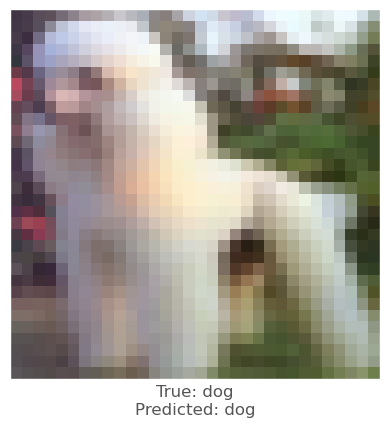



0.010140717
0.008506417
0.0038362145
vr, vg, vb :   -1.0140717029571533 -0.8506417274475098 -0.3836214542388916
beam_perturbed_confidence temp :  0.58732593
beam_perturbed_confidence temp :  0.5935577
beam_perturbed_confidence temp :  0.5960238
beam_perturbed_confidence temp :  0.58324546
beam_perturbed_confidence temp :  0.5858436
beam_perturbed_confidence temp :  0.5918026
beam_perturbed_confidence temp :  0.58175296
row index :  6
0th round's confidence : 3th 0.58175296
predicted class :  dog
predicted class's confidence :  0.58175296
Lopt is :  12


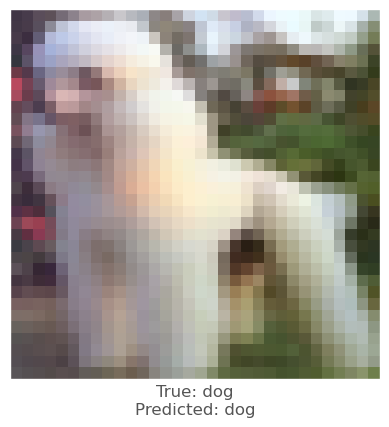



-0.0014690161
-0.0032151341
-0.0038175583
vr, vg, vb :   0.14690160751342773 0.32151341438293457 0.3817558288574219
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
row index :  0
0th round's confidence : 4th 0.6749016
predicted class :  dog
predicted class's confidence :  0.6749016
Lopt is :  10


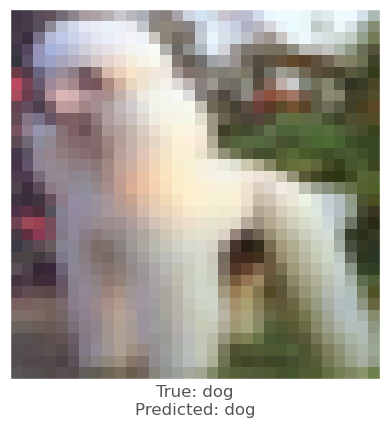



0.004265249
0.003476739
0.00017720461
vr, vg, vb :   -0.8569496870040894 -0.6844305992126465 -0.06664395332336426
beam_perturbed_confidence temp :  0.6622966
beam_perturbed_confidence temp :  0.66278493
beam_perturbed_confidence temp :  0.6644177
beam_perturbed_confidence temp :  0.6609296
beam_perturbed_confidence temp :  0.6624074
beam_perturbed_confidence temp :  0.66280067
beam_perturbed_confidence temp :  0.66105574
row index :  3
1th round's confidence : 0th 0.6609296
predicted class :  dog
predicted class's confidence :  0.6609296
Lopt is :  2


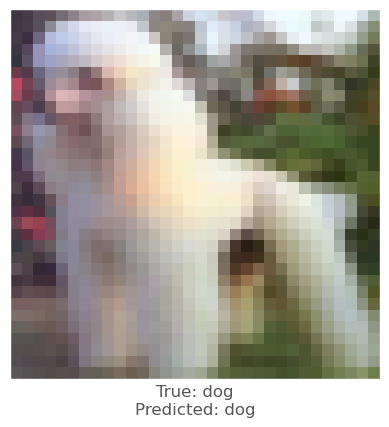



0.0068265796
0.0076881647
0.004261732
vr, vg, vb :   -1.3028919696807861 -1.389731764793396 -0.6838959455490112
beam_perturbed_confidence temp :  0.62796533
beam_perturbed_confidence temp :  0.6269358
beam_perturbed_confidence temp :  0.632818
beam_perturbed_confidence temp :  0.61997837
beam_perturbed_confidence temp :  0.62550753
beam_perturbed_confidence temp :  0.6251359
beam_perturbed_confidence temp :  0.61800903
row index :  6
1th round's confidence : 1th 0.61800903
predicted class :  dog
predicted class's confidence :  0.61800903
Lopt is :  8


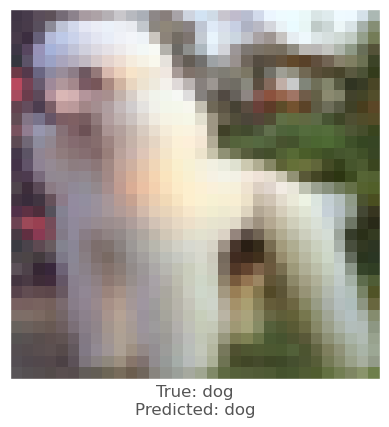



0.003118217
0.0024121404
-1.0192394e-05
vr, vg, vb :   -0.4975539445877075 -0.3488725423812866 0.06720542907714844
beam_perturbed_confidence temp :  0.68269855
beam_perturbed_confidence temp :  0.6830365
beam_perturbed_confidence temp :  0.68440235
beam_perturbed_confidence temp :  0.68138635
beam_perturbed_confidence temp :  0.68269855
beam_perturbed_confidence temp :  0.6830365
beam_perturbed_confidence temp :  0.68138635
row index :  3
1th round's confidence : 2th 0.68138635
predicted class :  dog
predicted class's confidence :  0.68138635
Lopt is :  5


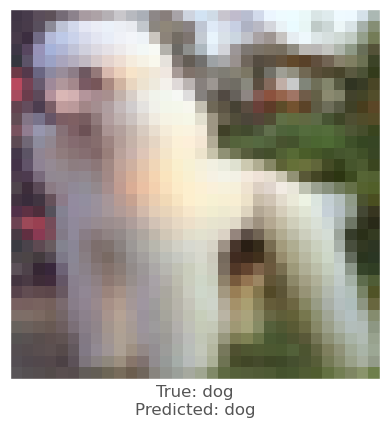



0.010504127
0.00816834
0.0029008389
vr, vg, vb :   -1.963077187538147 -1.582411527633667 -0.6353431940078735
beam_perturbed_confidence temp :  0.5708717
beam_perturbed_confidence temp :  0.5736157
beam_perturbed_confidence temp :  0.5803446
beam_perturbed_confidence temp :  0.56299454
beam_perturbed_confidence temp :  0.56953853
beam_perturbed_confidence temp :  0.57205766
beam_perturbed_confidence temp :  0.56169385
row index :  6
1th round's confidence : 3th 0.56169385
predicted class :  dog
predicted class's confidence :  0.56169385
Lopt is :  14


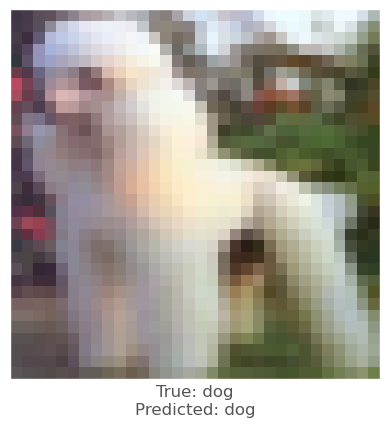



-0.0014690161
-0.0032151341
-0.0038175583
vr, vg, vb :   0.2791130542755127 0.6108754873275757 0.7253360748291016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
row index :  0
1th round's confidence : 4th 0.6749016
predicted class :  dog
predicted class's confidence :  0.6749016
Lopt is :  10


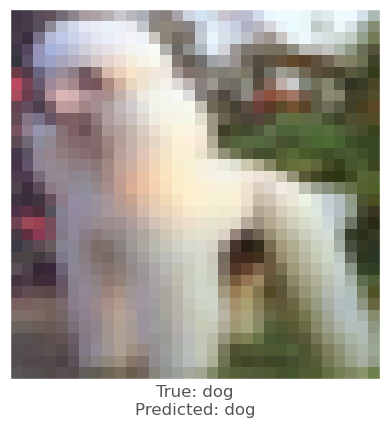



0.0036830902
0.002688229
-0.00022441149
vr, vg, vb :   -1.1395637392997742 -0.8848104476928711 -0.03753840923309326
beam_perturbed_confidence temp :  0.6569515
beam_perturbed_confidence temp :  0.65960836
beam_perturbed_confidence temp :  0.66105574
beam_perturbed_confidence temp :  0.65523946
beam_perturbed_confidence temp :  0.65715426
beam_perturbed_confidence temp :  0.65969795
beam_perturbed_confidence temp :  0.6552848
row index :  3
2th round's confidence : 0th 0.65523946
predicted class :  dog
predicted class's confidence :  0.65523946
Lopt is :  4


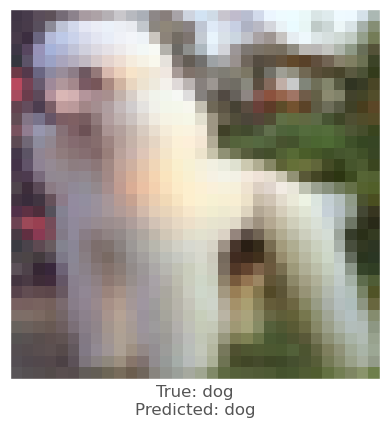



0.0074405074
0.0074892044
0.0037968755
vr, vg, vb :   -1.9166535139083862 -1.9996790289878845 -0.9951938986778259
beam_perturbed_confidence temp :  0.6097669
beam_perturbed_confidence temp :  0.61094195
beam_perturbed_confidence temp :  0.6161815
beam_perturbed_confidence temp :  0.6029084
beam_perturbed_confidence temp :  0.60829264
beam_perturbed_confidence temp :  0.6095049
beam_perturbed_confidence temp :  0.6014414
row index :  6
2th round's confidence : 1th 0.6014414
predicted class :  dog
predicted class's confidence :  0.6014414
Lopt is :  10


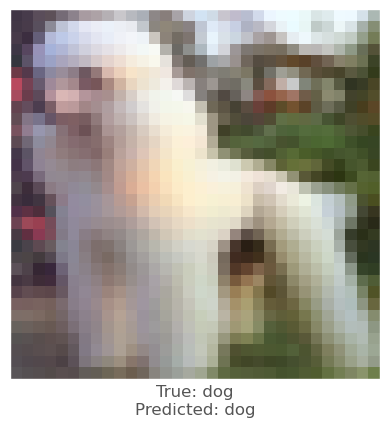



0.0035884976
0.0029392242
0.0002361536
vr, vg, vb :   -0.806648313999176 -0.6079077124595642 0.03686952590942383
beam_perturbed_confidence temp :  0.679448
beam_perturbed_confidence temp :  0.6797593
beam_perturbed_confidence temp :  0.68138635
beam_perturbed_confidence temp :  0.6776324
beam_perturbed_confidence temp :  0.679448
beam_perturbed_confidence temp :  0.6797593
beam_perturbed_confidence temp :  0.6776324
row index :  3
2th round's confidence : 2th 0.6776324
predicted class :  dog
predicted class's confidence :  0.6776324
Lopt is :  5


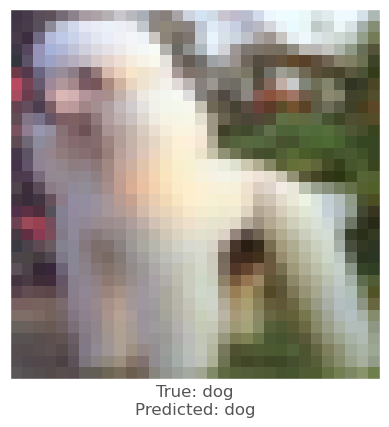



0.010682762
0.008408308
0.0027917624
vr, vg, vb :   -2.835045635700226 -2.2650011777877808 -0.8509851098060608
beam_perturbed_confidence temp :  0.54424775
beam_perturbed_confidence temp :  0.5475008
beam_perturbed_confidence temp :  0.5602028
beam_perturbed_confidence temp :  0.5300175
beam_perturbed_confidence temp :  0.5431047
beam_perturbed_confidence temp :  0.5459346
beam_perturbed_confidence temp :  0.5290173
row index :  6
2th round's confidence : 3th 0.5290173
predicted class :  dog
predicted class's confidence :  0.5290173
Lopt is :  17


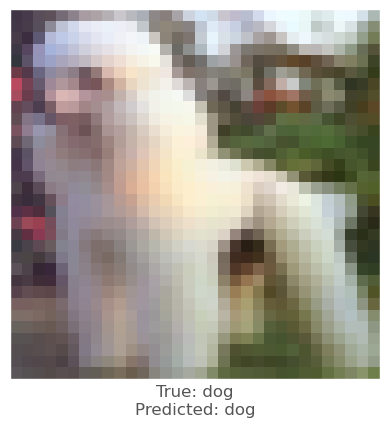



-0.0014690161
-0.0032151341
-0.0038175583
vr, vg, vb :   0.39810335636138916 0.8713013529777527 1.0345582962036133
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.67291105
beam_perturbed_confidence temp :  0.6749016
beam_perturbed_confidence temp :  0.67291105
beam_perturbed_confidence temp :  0.67291105
beam_perturbed_confidence temp :  0.67291105
row index :  2
2th round's confidence : 4th 0.67291105
predicted class :  dog
predicted class's confidence :  0.67291105
Lopt is :  11


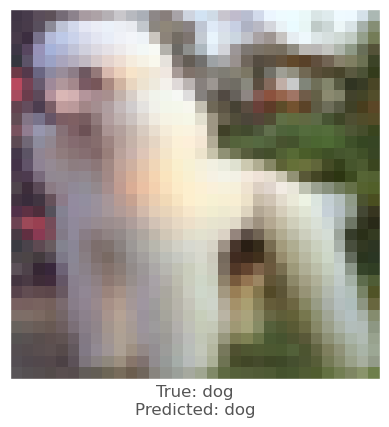



0.0050106645
0.0036718845
-0.00010496378
vr, vg, vb :   -1.526673811674118 -1.1635178565979003 -0.023288190364837646
beam_perturbed_confidence temp :  0.64967686
beam_perturbed_confidence temp :  0.65098155
beam_perturbed_confidence temp :  0.6552848
beam_perturbed_confidence temp :  0.644352
beam_perturbed_confidence temp :  0.6491676
beam_perturbed_confidence temp :  0.65025455
beam_perturbed_confidence temp :  0.64376086
row index :  6
3th round's confidence : 0th 0.64376086
predicted class :  dog
predicted class's confidence :  0.64376086
Lopt is :  6


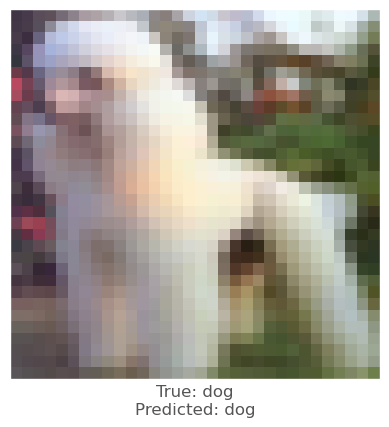



0.009456098
0.007857144
0.0030483603
vr, vg, vb :   -2.6705979704856873 -2.5854255139827726 -1.2005105435848238
beam_perturbed_confidence temp :  0.58542967
beam_perturbed_confidence temp :  0.5885921
beam_perturbed_confidence temp :  0.598048
beam_perturbed_confidence temp :  0.57241815
beam_perturbed_confidence temp :  0.58207124
beam_perturbed_confidence temp :  0.58551246
beam_perturbed_confidence temp :  0.5696967
row index :  6
3th round's confidence : 1th 0.5696967
predicted class :  dog
predicted class's confidence :  0.5696967
Lopt is :  13


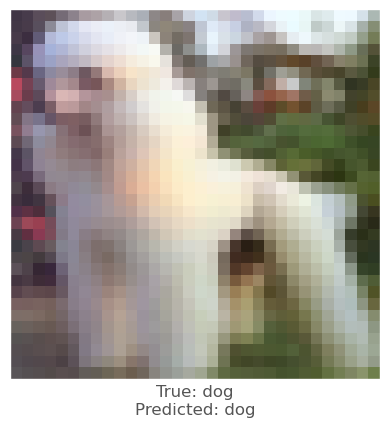



0.00430727
0.0035476089
0.0005816817
vr, vg, vb :   -1.1567104876041414 -0.9018778264522552 -0.02498559951782226
beam_perturbed_confidence temp :  0.67347854
beam_perturbed_confidence temp :  0.6759004
beam_perturbed_confidence temp :  0.67743266
beam_perturbed_confidence temp :  0.671969
beam_perturbed_confidence temp :  0.67317533
beam_perturbed_confidence temp :  0.67588526
beam_perturbed_confidence temp :  0.67184734
row index :  6
3th round's confidence : 2th 0.67184734
predicted class :  dog
predicted class's confidence :  0.67184734
Lopt is :  4


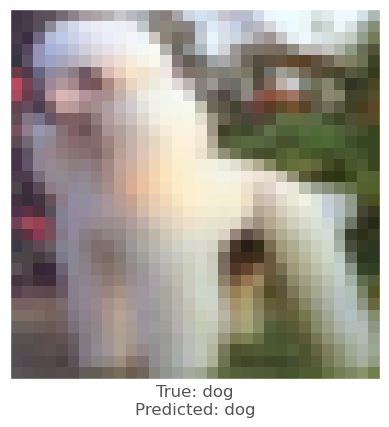



0.01082027
0.0090972185
0.001983583
vr, vg, vb :   -3.6335680305957796 -2.9482229113578797 -0.9642448961734772
beam_perturbed_confidence temp :  0.5063822
beam_perturbed_confidence temp :  0.51398927
beam_perturbed_confidence temp :  0.5280339
beam_perturbed_confidence temp :  0.49393758
beam_perturbed_confidence temp :  0.5061032
beam_perturbed_confidence temp :  0.5129044
beam_perturbed_confidence temp :  0.4937982
row index :  6
3th round's confidence : 3th 0.4937982
predicted class :  horse
predicted class's confidence :  0.49842682
Lopt is :  21


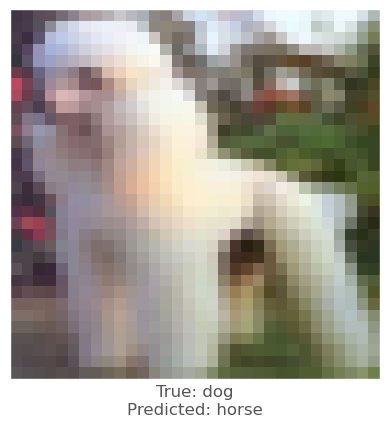




29th sensitive pixel
original confidence is :  0.66862947 

original r,g,b :  117 107 118
0.0011672378
-0.0015452504
-0.003338635
vr, vg, vb :   -0.11672377586364746 0.1545250415802002 0.3338634967803955
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.66862947
beam_perturbed_confidence temp :  0.6681943
row index :  0
0th round's confidence : 0th 0.6681943
predicted class :  dog
predicted class's confidence :  0.6681943
Lopt is :  1


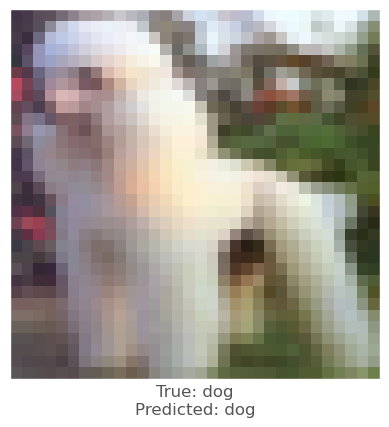



0.0020586848
-0.00037169456
-0.002816379
vr, vg, vb :   -0.20586848258972168 0.037169456481933594 0.28163790702819824
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.67746085
beam_perturbed_confidence temp :  0.67746085
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.67746085
beam_perturbed_confidence temp :  0.6764159
row index :  0
0th round's confidence : 1th 0.6764159
predicted class :  dog
predicted class's confidence :  0.6764159
Lopt is :  6


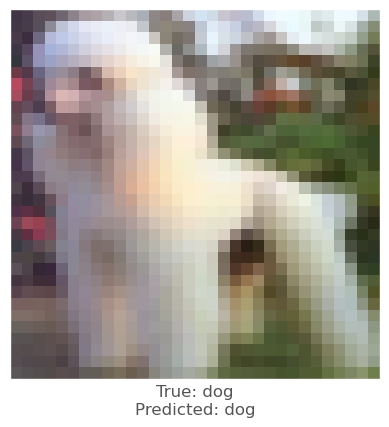



-0.00012660027
-0.0029020905
-0.0041747093
vr, vg, vb :   0.012660026550292969 0.2902090549468994 0.41747093200683594
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
row index :  0
0th round's confidence : 2th 0.6567803
predicted class :  dog
predicted class's confidence :  0.6567803
Lopt is :  5


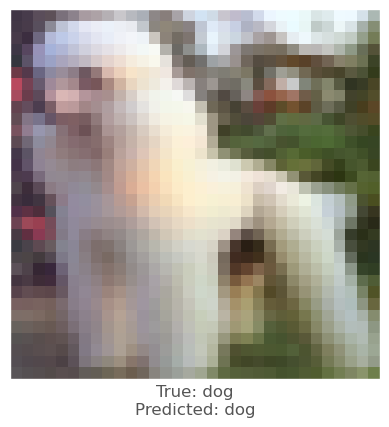



0.001885891
-0.00019013882
-0.0032852292
vr, vg, vb :   -0.18858909606933594 0.01901388168334961 0.3285229206085205
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67791647
beam_perturbed_confidence temp :  0.67791647
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67791647
beam_perturbed_confidence temp :  0.67695427
row index :  0
0th round's confidence : 3th 0.67695427
predicted class :  dog
predicted class's confidence :  0.67695427
Lopt is :  11


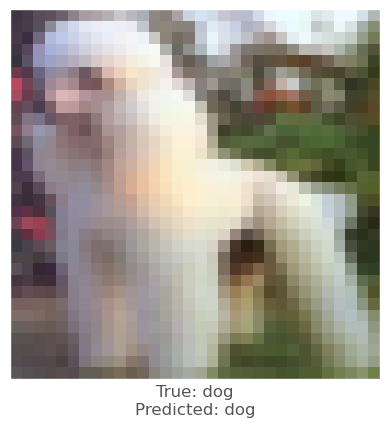



-0.0013153553
-0.0055047274
-0.0050433874
vr, vg, vb :   0.13153553009033203 0.5504727363586426 0.5043387413024902
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.63301194
row index :  0
0th round's confidence : 4th 0.63301194
predicted class :  dog
predicted class's confidence :  0.63301194
Lopt is :  10


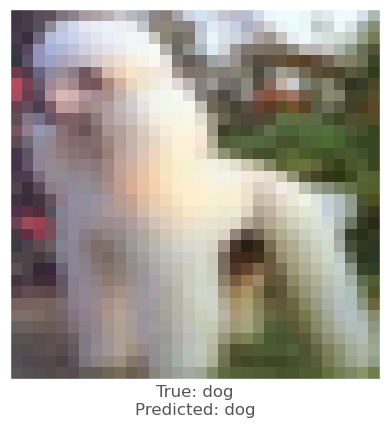



0.0008250475
-0.0019524693
-0.0033596158
vr, vg, vb :   -0.18755614757537842 0.33431947231292725 0.6364387273788452
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6681943
beam_perturbed_confidence temp :  0.6678044
row index :  0
1th round's confidence : 0th 0.6678044
predicted class :  dog
predicted class's confidence :  0.6678044
Lopt is :  2


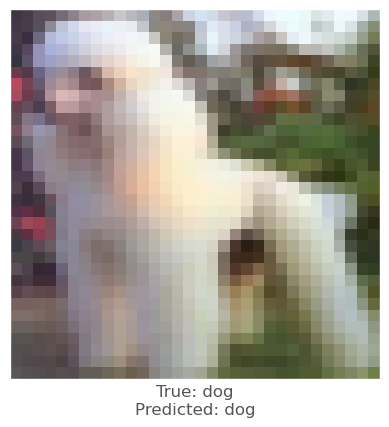



0.0021112561
-0.00029557943
-0.0027781725
vr, vg, vb :   -0.39640724658966064 0.06301045417785645 0.5312913656234741
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6764159
beam_perturbed_confidence temp :  0.6753496
row index :  0
1th round's confidence : 1th 0.6753496
predicted class :  dog
predicted class's confidence :  0.6753496
Lopt is :  7


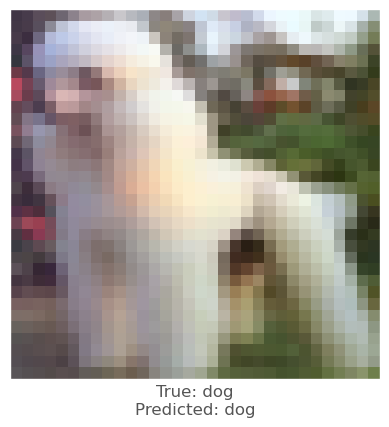



-0.00012660027
-0.0029020905
-0.0041747093
vr, vg, vb :   0.02405405044555664 0.5513972043991089 0.7931947708129883
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
row index :  0
1th round's confidence : 2th 0.6567803
predicted class :  dog
predicted class's confidence :  0.6567803
Lopt is :  5


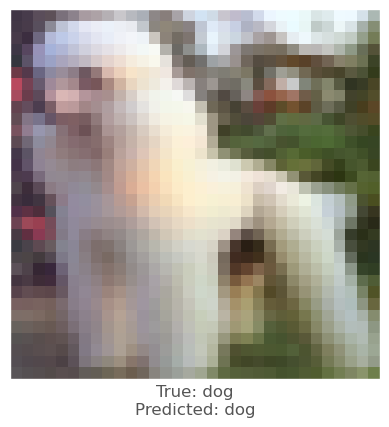



0.0018892288
-0.00018644333
-0.0033689141
vr, vg, vb :   -0.35865306854248047 0.035756826400756836 0.6325620412826538
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67695427
beam_perturbed_confidence temp :  0.67602724
row index :  0
1th round's confidence : 3th 0.67602724
predicted class :  dog
predicted class's confidence :  0.67602724
Lopt is :  12


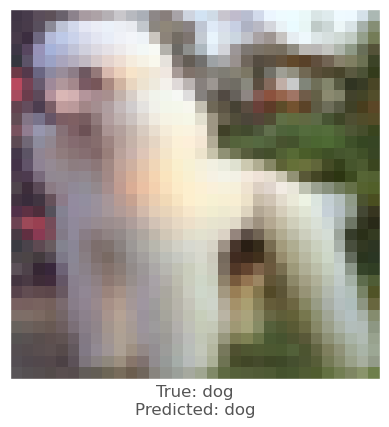



-0.0013153553
-0.0055047274
-0.0050433874
vr, vg, vb :   0.24991750717163086 1.045898199081421 0.9582436084747314
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.6301956
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.6301956
beam_perturbed_confidence temp :  0.63301194
beam_perturbed_confidence temp :  0.6301956
beam_perturbed_confidence temp :  0.6301956
row index :  1
1th round's confidence : 4th 0.6301956
predicted class :  dog
predicted class's confidence :  0.6301956
Lopt is :  11


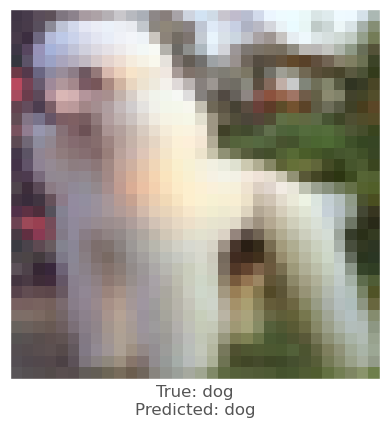



0.00083881617
-0.0020717382
-0.0034047365
vr, vg, vb :   -0.2526821494102478 0.5080613493919373 0.913268506526947
beam_perturbed_confidence temp :  0.6673555
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6673555
beam_perturbed_confidence temp :  0.6673555
beam_perturbed_confidence temp :  0.6678044
beam_perturbed_confidence temp :  0.6673555
row index :  0
2th round's confidence : 0th 0.6673555
predicted class :  dog
predicted class's confidence :  0.6673555
Lopt is :  3


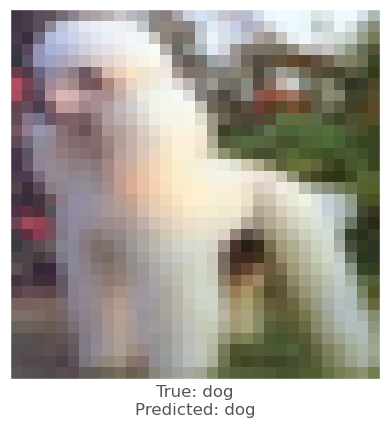



0.0021757483
-0.00022649765
-0.0028028488
vr, vg, vb :   -0.574341356754303 0.07935917377471924 0.7584471106529236
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6753496
beam_perturbed_confidence temp :  0.6742402
row index :  0
2th round's confidence : 1th 0.6742402
predicted class :  dog
predicted class's confidence :  0.6742402
Lopt is :  8


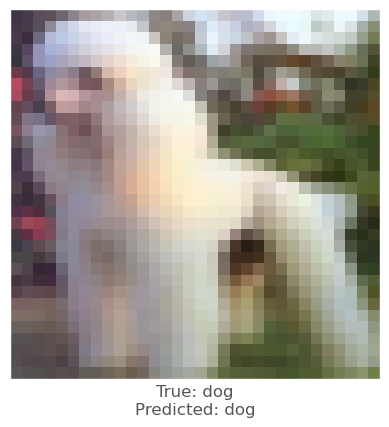



-0.00012660027
-0.0029020905
-0.0041747093
vr, vg, vb :   0.034308671951293945 0.7864665389060974 1.1313462257385254
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.65464145
beam_perturbed_confidence temp :  0.6567803
beam_perturbed_confidence temp :  0.65464145
beam_perturbed_confidence temp :  0.65464145
beam_perturbed_confidence temp :  0.65464145
row index :  2
2th round's confidence : 2th 0.65464145
predicted class :  dog
predicted class's confidence :  0.65464145
Lopt is :  6


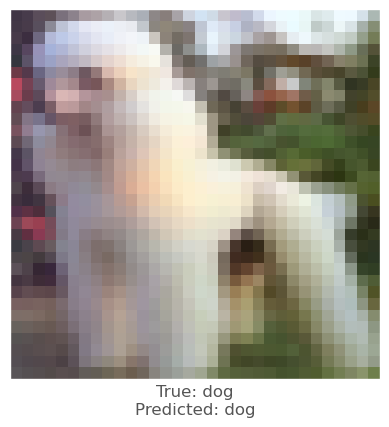



0.0018858314
-0.00021380186
-0.0034996867
vr, vg, vb :   -0.5113708972930908 0.05356132984161377 0.9192745089530945
beam_perturbed_confidence temp :  0.67506844
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67506844
beam_perturbed_confidence temp :  0.67506844
beam_perturbed_confidence temp :  0.67602724
beam_perturbed_confidence temp :  0.67506844
row index :  0
2th round's confidence : 3th 0.67506844
predicted class :  dog
predicted class's confidence :  0.67506844
Lopt is :  13


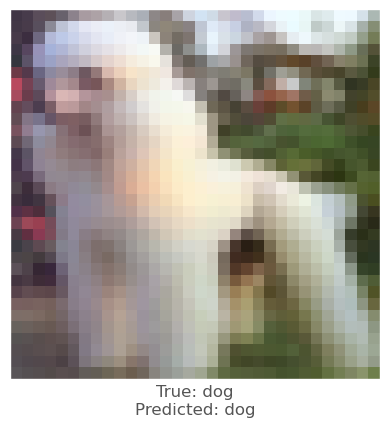



-0.0013600588
-0.005521834
-0.005112648
vr, vg, vb :   0.3609316349029541 1.493491768836975 1.373684048652649
beam_perturbed_confidence temp :  0.6301956
beam_perturbed_confidence temp :  0.6274901
beam_perturbed_confidence temp :  0.6276796
beam_perturbed_confidence temp :  0.6274901
beam_perturbed_confidence temp :  0.6276796
beam_perturbed_confidence temp :  0.6249483
beam_perturbed_confidence temp :  0.6249483
row index :  5
2th round's confidence : 4th 0.6249483
predicted class :  dog
predicted class's confidence :  0.6249483
Lopt is :  12


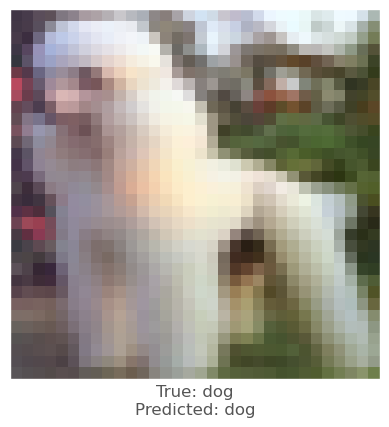



0.0009340644
-0.0020188093
-0.0033880472
vr, vg, vb :   -0.3208203732967377 0.6591361463069916 1.1607463777065279
beam_perturbed_confidence temp :  0.66687036
beam_perturbed_confidence temp :  0.6673555
beam_perturbed_confidence temp :  0.6656841
beam_perturbed_confidence temp :  0.66687036
beam_perturbed_confidence temp :  0.6651999
beam_perturbed_confidence temp :  0.6656841
beam_perturbed_confidence temp :  0.6651999
row index :  4
3th round's confidence : 0th 0.6651999
predicted class :  dog
predicted class's confidence :  0.6651999
Lopt is :  4


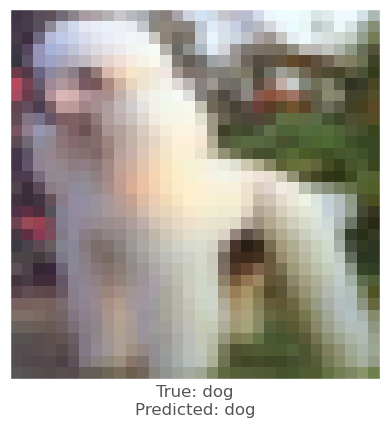



0.0022941828
-0.00015246868
-0.002761364
vr, vg, vb :   -0.7463254988193512 0.08667012453079224 0.9587387979030609
beam_perturbed_confidence temp :  0.6730554
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6730554
beam_perturbed_confidence temp :  0.6730554
beam_perturbed_confidence temp :  0.6742402
beam_perturbed_confidence temp :  0.6730554
row index :  0
3th round's confidence : 1th 0.6730554
predicted class :  dog
predicted class's confidence :  0.6730554
Lopt is :  9


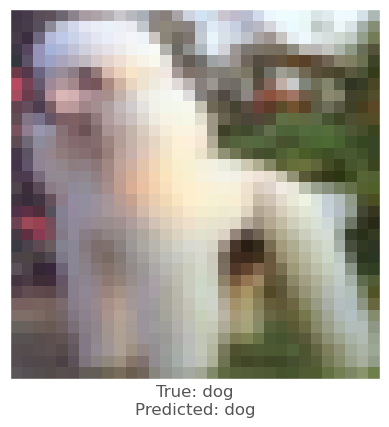



-0.0001425147
-0.003177166
-0.0043727756
vr, vg, vb :   0.045129275321960455 1.02553648352623 1.455489158630371
beam_perturbed_confidence temp :  0.65464145
beam_perturbed_confidence temp :  0.6530079
beam_perturbed_confidence temp :  0.6524075
beam_perturbed_confidence temp :  0.6530079
beam_perturbed_confidence temp :  0.6524075
beam_perturbed_confidence temp :  0.6508665
beam_perturbed_confidence temp :  0.6508665
row index :  5
3th round's confidence : 2th 0.6508665
predicted class :  dog
predicted class's confidence :  0.6508665
Lopt is :  7


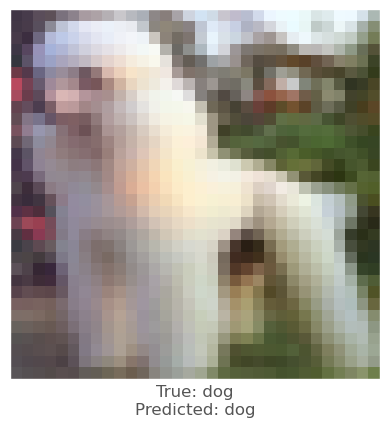



0.0018892884
-0.00017338991
-0.0035234094
vr, vg, vb :   -0.6491626501083374 0.06554418802261353 1.1796879947185517
beam_perturbed_confidence temp :  0.67413795
beam_perturbed_confidence temp :  0.67506844
beam_perturbed_confidence temp :  0.67331624
beam_perturbed_confidence temp :  0.67413795
beam_perturbed_confidence temp :  0.67240417
beam_perturbed_confidence temp :  0.67331624
beam_perturbed_confidence temp :  0.67240417
row index :  4
3th round's confidence : 3th 0.67240417
predicted class :  dog
predicted class's confidence :  0.67240417
Lopt is :  14


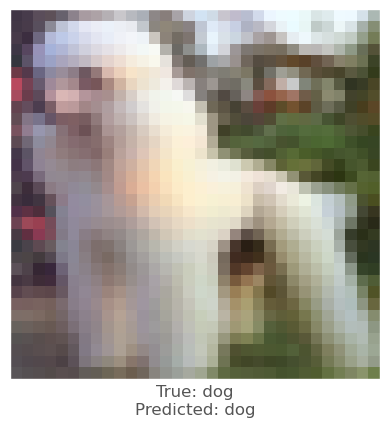



-0.0015065074
-0.0056999326
-0.005149305
vr, vg, vb :   0.4754892110824585 1.9141358494758607 1.7512461304664613
beam_perturbed_confidence temp :  0.6249483
beam_perturbed_confidence temp :  0.62197965
beam_perturbed_confidence temp :  0.6223408
beam_perturbed_confidence temp :  0.62197965
beam_perturbed_confidence temp :  0.6223408
beam_perturbed_confidence temp :  0.6193693
beam_perturbed_confidence temp :  0.6193693
row index :  5
3th round's confidence : 4th 0.6193693
predicted class :  dog
predicted class's confidence :  0.6193693
Lopt is :  13


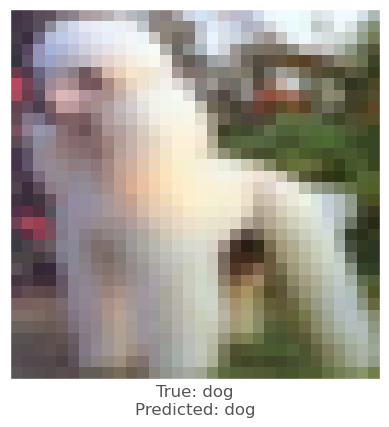



0.0009844303
-0.0019413829
-0.0033174753
vr, vg, vb :   -0.3871813672780991 0.7873608201742173 1.3764192718267443
beam_perturbed_confidence temp :  0.6646997
beam_perturbed_confidence temp :  0.6651999
beam_perturbed_confidence temp :  0.6635529
beam_perturbed_confidence temp :  0.6646997
beam_perturbed_confidence temp :  0.66308874
beam_perturbed_confidence temp :  0.6635529
beam_perturbed_confidence temp :  0.66308874
row index :  4
4th round's confidence : 0th 0.66308874
predicted class :  dog
predicted class's confidence :  0.66308874
Lopt is :  5


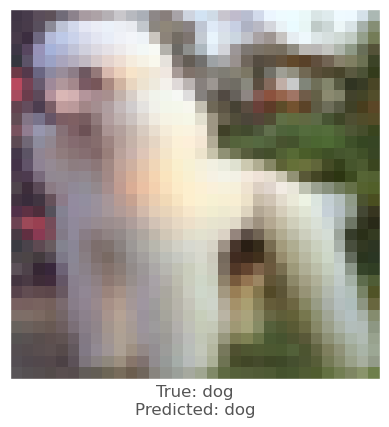



0.002328217
-0.00011283159
-0.0027165413
vr, vg, vb :   -0.9045146518945694 0.08928627133369446 1.134519047141075
beam_perturbed_confidence temp :  0.67191195
beam_perturbed_confidence temp :  0.6730554
beam_perturbed_confidence temp :  0.67169935
beam_perturbed_confidence temp :  0.67191195
beam_perturbed_confidence temp :  0.67056537
beam_perturbed_confidence temp :  0.67169935
beam_perturbed_confidence temp :  0.67056537
row index :  4
4th round's confidence : 1th 0.67056537
predicted class :  dog
predicted class's confidence :  0.67056537
Lopt is :  10


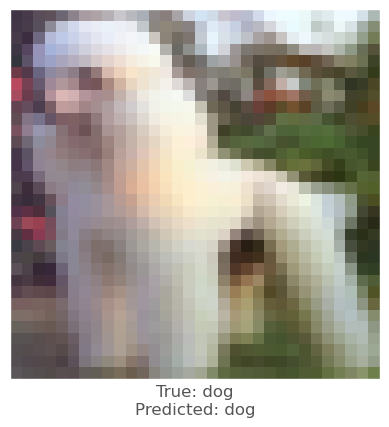



-0.00012987852
-0.0031280518
-0.0044072866
vr, vg, vb :   0.05360419988632203 1.235788010954857 1.7506689071655275
beam_perturbed_confidence temp :  0.6508665
beam_perturbed_confidence temp :  0.6492795
beam_perturbed_confidence temp :  0.64860064
beam_perturbed_confidence temp :  0.6492795
beam_perturbed_confidence temp :  0.64860064
beam_perturbed_confidence temp :  0.64689463
beam_perturbed_confidence temp :  0.64689463
row index :  5
4th round's confidence : 2th 0.64689463
predicted class :  dog
predicted class's confidence :  0.64689463
Lopt is :  8


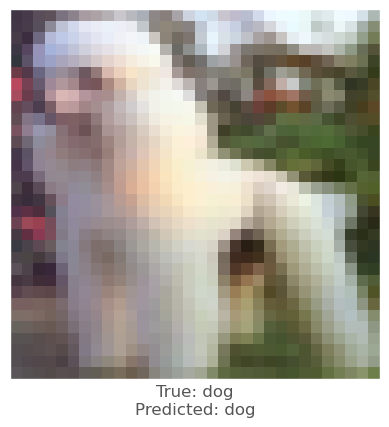



0.0019400716
-0.00012600422
-0.0034883022
vr, vg, vb :   -0.7782535433769227 0.07159019112586976 1.4105494183301925
beam_perturbed_confidence temp :  0.67137617
beam_perturbed_confidence temp :  0.67240417
beam_perturbed_confidence temp :  0.67064965
beam_perturbed_confidence temp :  0.67137617
beam_perturbed_confidence temp :  0.669748
beam_perturbed_confidence temp :  0.67064965
beam_perturbed_confidence temp :  0.669748
row index :  4
4th round's confidence : 3th 0.669748
predicted class :  dog
predicted class's confidence :  0.669748
Lopt is :  15


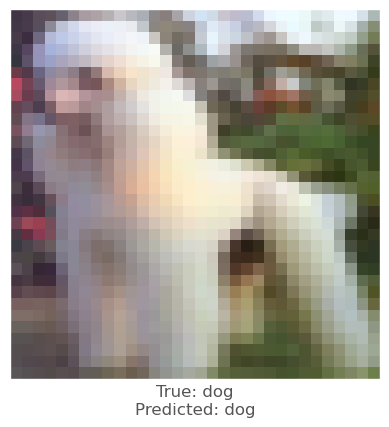



-0.0014369488
-0.0059038997
-0.0051870346
vr, vg, vb :   0.5716351675987243 2.3131122314929966 2.0948249781131745
beam_perturbed_confidence temp :  0.6193693
beam_perturbed_confidence temp :  0.6136017
beam_perturbed_confidence temp :  0.6141244
beam_perturbed_confidence temp :  0.6136017
beam_perturbed_confidence temp :  0.6141244
beam_perturbed_confidence temp :  0.6086236
beam_perturbed_confidence temp :  0.6086236
row index :  5
4th round's confidence : 4th 0.6086236
predicted class :  dog
predicted class's confidence :  0.6086236
Lopt is :  15


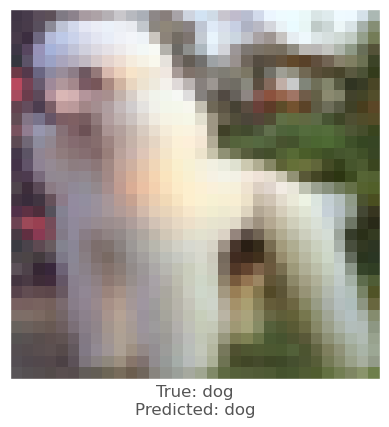



0.00095808506
-0.0018822551
-0.0032404065
vr, vg, vb :   -0.4442717365622521 0.8968502458930017 1.562817995965481
beam_perturbed_confidence temp :  0.6625948
beam_perturbed_confidence temp :  0.66308874
beam_perturbed_confidence temp :  0.66145927
beam_perturbed_confidence temp :  0.6625948
beam_perturbed_confidence temp :  0.6609884
beam_perturbed_confidence temp :  0.66145927
beam_perturbed_confidence temp :  0.6609884
row index :  4
5th round's confidence : 0th 0.6609884
predicted class :  dog
predicted class's confidence :  0.6609884
Lopt is :  6


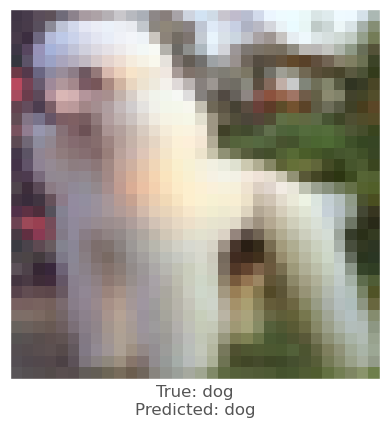



0.0022656322
-0.000102221966
-0.0027107596
vr, vg, vb :   -1.0406264019608498 0.0905798407793045 1.2921431064009667
beam_perturbed_confidence temp :  0.6683122
beam_perturbed_confidence temp :  0.67056537
beam_perturbed_confidence temp :  0.6692012
beam_perturbed_confidence temp :  0.6683122
beam_perturbed_confidence temp :  0.66686237
beam_perturbed_confidence temp :  0.6692012
beam_perturbed_confidence temp :  0.66686237
row index :  4
5th round's confidence : 1th 0.66686237
predicted class :  dog
predicted class's confidence :  0.66686237
Lopt is :  12


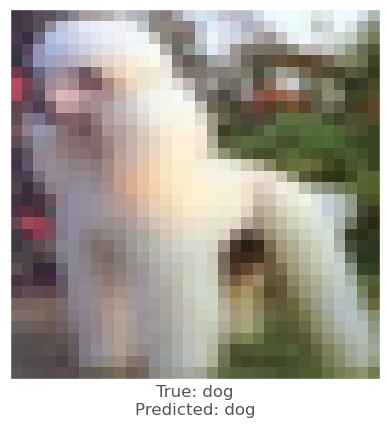



-0.0006520748
-0.0035591125
-0.0047978163
vr, vg, vb :   0.11345126128196717 1.4681204647421837 2.055383644104004
beam_perturbed_confidence temp :  0.64689463
beam_perturbed_confidence temp :  0.6450415
beam_perturbed_confidence temp :  0.64203894
beam_perturbed_confidence temp :  0.6450415
beam_perturbed_confidence temp :  0.64203894
beam_perturbed_confidence temp :  0.6401937
beam_perturbed_confidence temp :  0.6401937
row index :  5
5th round's confidence : 2th 0.6401937
predicted class :  dog
predicted class's confidence :  0.6401937
Lopt is :  10


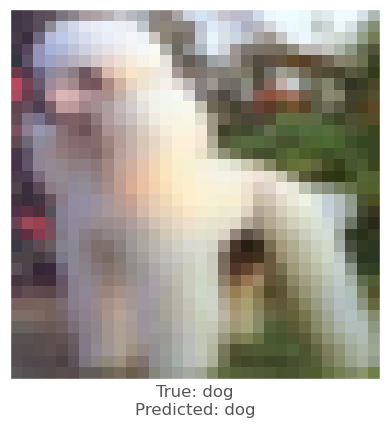



0.0019161105
9.793043e-05
-0.0032343268
vr, vg, vb :   -0.8920392405986787 0.05463812887668611 1.5929271604418755
beam_perturbed_confidence temp :  0.66873354
beam_perturbed_confidence temp :  0.669748
beam_perturbed_confidence temp :  0.66814184
beam_perturbed_confidence temp :  0.66873354
beam_perturbed_confidence temp :  0.66725254
beam_perturbed_confidence temp :  0.66814184
beam_perturbed_confidence temp :  0.66725254
row index :  4
5th round's confidence : 3th 0.66725254
predicted class :  dog
predicted class's confidence :  0.66725254
Lopt is :  16


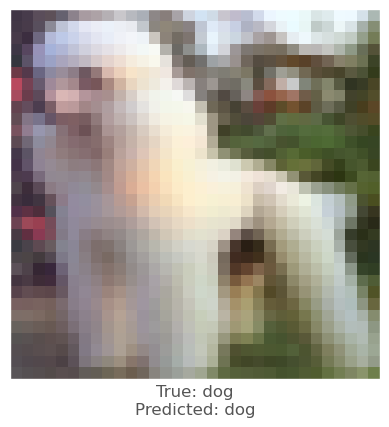



-0.0007827282
-0.0052116513
-0.004960835
vr, vg, vb :   0.5927444703578949 2.60296614086628 2.3814259783029557
beam_perturbed_confidence temp :  0.6086236
beam_perturbed_confidence temp :  0.60381764
beam_perturbed_confidence temp :  0.60376
beam_perturbed_confidence temp :  0.60381764
beam_perturbed_confidence temp :  0.60376
beam_perturbed_confidence temp :  0.5989186
beam_perturbed_confidence temp :  0.5989186
row index :  5
5th round's confidence : 4th 0.5989186
predicted class :  dog
predicted class's confidence :  0.5989186
Lopt is :  17


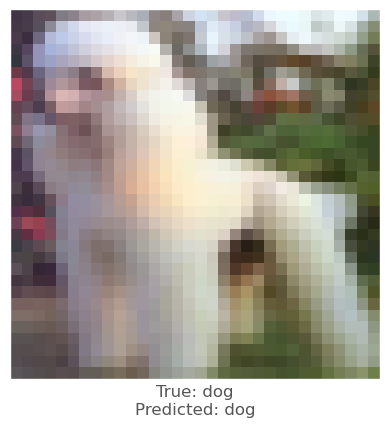



0.00080651045
-0.0018857718
-0.0031116605
vr, vg, vb :   -0.48049560775160793 0.9957423964440824 1.7177022444188599
beam_perturbed_confidence temp :  0.66065276
beam_perturbed_confidence temp :  0.6609884
beam_perturbed_confidence temp :  0.65948313
beam_perturbed_confidence temp :  0.66065276
beam_perturbed_confidence temp :  0.6591844
beam_perturbed_confidence temp :  0.65948313
beam_perturbed_confidence temp :  0.6591844
row index :  4
6th round's confidence : 0th 0.6591844
predicted class :  dog
predicted class's confidence :  0.6591844
Lopt is :  7


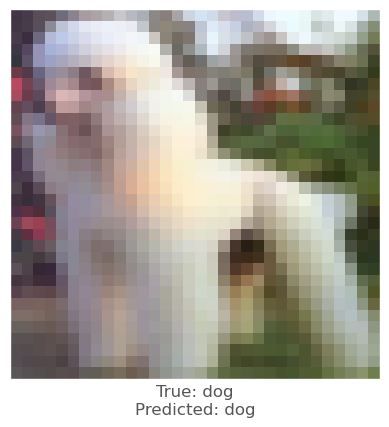



0.0022144318
-0.00020176172
-0.0029001236
vr, vg, vb :   -1.158006938034296 0.10169802895784379 1.4529411553800107
beam_perturbed_confidence temp :  0.664829
beam_perturbed_confidence temp :  0.66686237
beam_perturbed_confidence temp :  0.66541207
beam_perturbed_confidence temp :  0.664829
beam_perturbed_confidence temp :  0.66342705
beam_perturbed_confidence temp :  0.66541207
beam_perturbed_confidence temp :  0.66342705
row index :  4
6th round's confidence : 1th 0.66342705
predicted class :  dog
predicted class's confidence :  0.66342705
Lopt is :  14


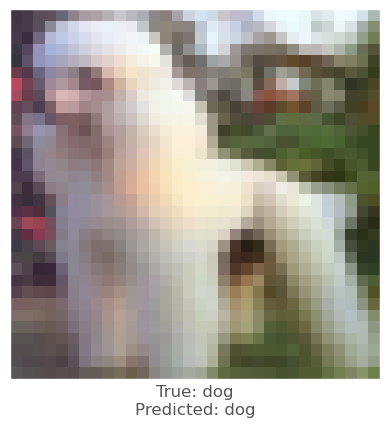



-0.00074607134
-0.0040661693
-0.00499779
vr, vg, vb :   0.1767132690191269 1.7279253444612026 2.3496242656707764
beam_perturbed_confidence temp :  0.6401937
beam_perturbed_confidence temp :  0.6379728
beam_perturbed_confidence temp :  0.6350278
beam_perturbed_confidence temp :  0.6379728
beam_perturbed_confidence temp :  0.6350278
beam_perturbed_confidence temp :  0.63264984
beam_perturbed_confidence temp :  0.63264984
row index :  5
6th round's confidence : 2th 0.63264984
predicted class :  dog
predicted class's confidence :  0.63264984
Lopt is :  12


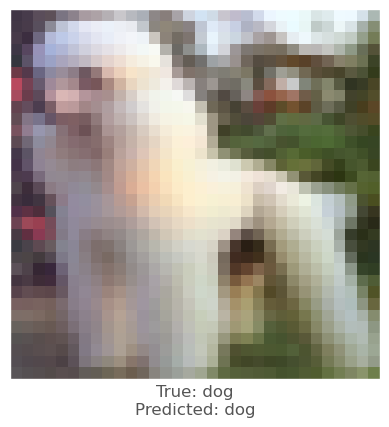



0.0018387437
0.00023686886
-0.003020823
vr, vg, vb :   -0.9867096852064133 0.02548743015527726 1.7357167445838453
beam_perturbed_confidence temp :  0.6663031
beam_perturbed_confidence temp :  0.66725254
beam_perturbed_confidence temp :  0.6657127
beam_perturbed_confidence temp :  0.6663031
beam_perturbed_confidence temp :  0.66486436
beam_perturbed_confidence temp :  0.6657127
beam_perturbed_confidence temp :  0.66486436
row index :  4
6th round's confidence : 3th 0.66486436
predicted class :  dog
predicted class's confidence :  0.66486436
Lopt is :  17


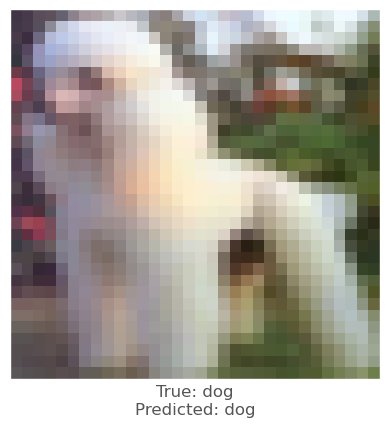



-0.0010538697
-0.0048054457
-0.0049209
vr, vg, vb :   0.6388569957494736 2.823214093887806 2.6353733672738078
beam_perturbed_confidence temp :  0.5989186
beam_perturbed_confidence temp :  0.59419847
beam_perturbed_confidence temp :  0.59398633
beam_perturbed_confidence temp :  0.59419847
beam_perturbed_confidence temp :  0.59398633
beam_perturbed_confidence temp :  0.5889957
beam_perturbed_confidence temp :  0.5889957
row index :  5
6th round's confidence : 4th 0.5889957
predicted class :  dog
predicted class's confidence :  0.5889957
Lopt is :  19


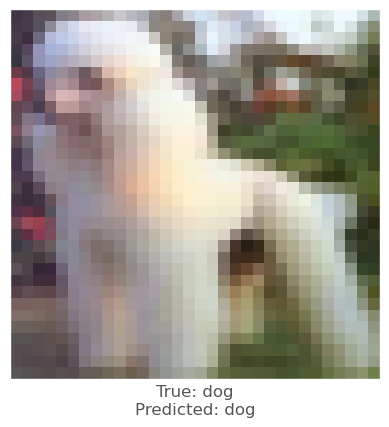



0.00045275688
-0.001966834
-0.0028892756
vr, vg, vb :   -0.4777217351478339 1.092851563629508 1.8348595750612025
beam_perturbed_confidence temp :  0.6590304
beam_perturbed_confidence temp :  0.6582262
beam_perturbed_confidence temp :  0.6577635
beam_perturbed_confidence temp :  0.6579859
beam_perturbed_confidence temp :  0.6575882
beam_perturbed_confidence temp :  0.65678173
beam_perturbed_confidence temp :  0.6565019
row index :  6
7th round's confidence : 0th 0.6565019
predicted class :  dog
predicted class's confidence :  0.6565019
Lopt is :  8


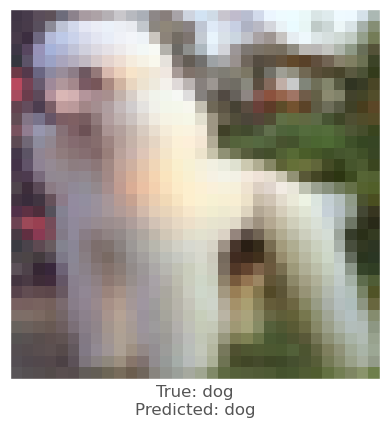



0.0017757416
-0.000116467476
-0.0028502345
vr, vg, vb :   -1.2197804019457104 0.10317497365117073 1.5926704906934501
beam_perturbed_confidence temp :  0.6615646
beam_perturbed_confidence temp :  0.66342705
beam_perturbed_confidence temp :  0.6619788
beam_perturbed_confidence temp :  0.6615646
beam_perturbed_confidence temp :  0.66032666
beam_perturbed_confidence temp :  0.6619788
beam_perturbed_confidence temp :  0.66032666
row index :  4
7th round's confidence : 1th 0.66032666
predicted class :  dog
predicted class's confidence :  0.66032666
Lopt is :  16


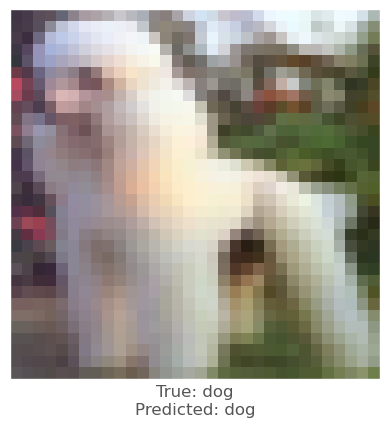



-0.00079619884
-0.004794419
-0.005317092
vr, vg, vb :   0.238661826608181 2.0345746911948916 2.6463710332870485
beam_perturbed_confidence temp :  0.63264984
beam_perturbed_confidence temp :  0.62784255
beam_perturbed_confidence temp :  0.62735003
beam_perturbed_confidence temp :  0.62784255
beam_perturbed_confidence temp :  0.62735003
beam_perturbed_confidence temp :  0.62250304
beam_perturbed_confidence temp :  0.62250304
row index :  5
7th round's confidence : 2th 0.62250304
predicted class :  dog
predicted class's confidence :  0.62250304
Lopt is :  14


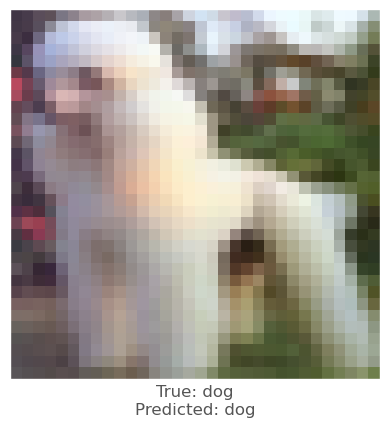



0.0017935634
0.00023174286
-0.00283736
vr, vg, vb :   -1.0673950532793999 -0.0002355987489223374 1.8458810606497529
beam_perturbed_confidence temp :  0.6630078
beam_perturbed_confidence temp :  0.66470516
beam_perturbed_confidence temp :  0.66346574
beam_perturbed_confidence temp :  0.662847
beam_perturbed_confidence temp :  0.6614712
beam_perturbed_confidence temp :  0.6632541
beam_perturbed_confidence temp :  0.66138357
row index :  6
7th round's confidence : 3th 0.66138357
predicted class :  dog
predicted class's confidence :  0.66138357
Lopt is :  19


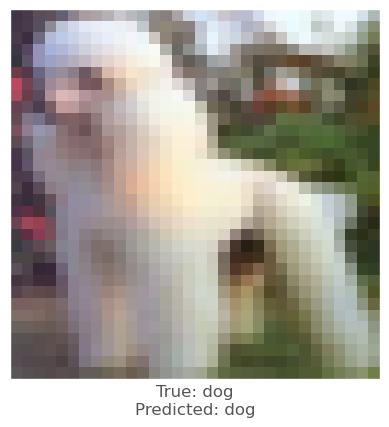



-0.0012094378
-0.0051130652
-0.0053436756
vr, vg, vb :   0.6959150808882714 3.052199208775759 2.9062035918867593
beam_perturbed_confidence temp :  0.5889957
beam_perturbed_confidence temp :  0.58111787
beam_perturbed_confidence temp :  0.58364964
beam_perturbed_confidence temp :  0.58111787
beam_perturbed_confidence temp :  0.58364964
beam_perturbed_confidence temp :  0.5752191
beam_perturbed_confidence temp :  0.5752191
row index :  5
7th round's confidence : 4th 0.5752191
predicted class :  dog
predicted class's confidence :  0.5752191
Lopt is :  22


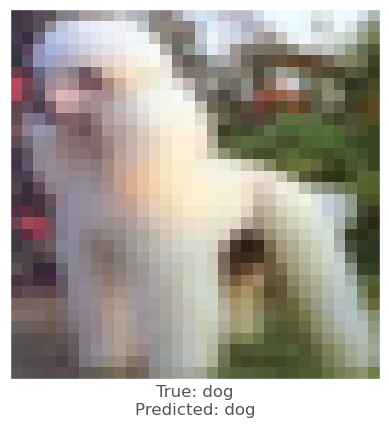



0.00049579144
-0.002164662
-0.002966404
vr, vg, vb :   -0.47952870515722046 1.2000325956973432 1.9480140136732462
beam_perturbed_confidence temp :  0.65628594
beam_perturbed_confidence temp :  0.6554235
beam_perturbed_confidence temp :  0.6550195
beam_perturbed_confidence temp :  0.65522575
beam_perturbed_confidence temp :  0.654829
beam_perturbed_confidence temp :  0.65394205
beam_perturbed_confidence temp :  0.6537364
row index :  6
8th round's confidence : 0th 0.6537364
predicted class :  dog
predicted class's confidence :  0.6537364
Lopt is :  9


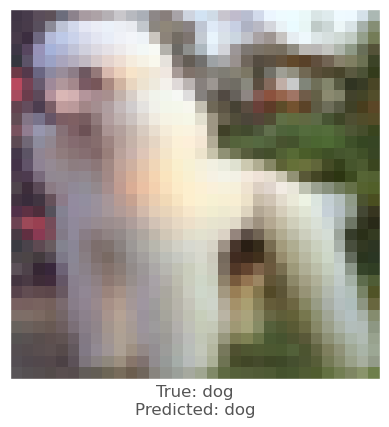



0.001814127
0.00021994114
-0.0024737716
vr, vg, vb :   -1.2792150585895183 0.07086336236393452 1.6807805988354088
beam_perturbed_confidence temp :  0.6584453
beam_perturbed_confidence temp :  0.66032666
beam_perturbed_confidence temp :  0.6590908
beam_perturbed_confidence temp :  0.6584453
beam_perturbed_confidence temp :  0.6571205
beam_perturbed_confidence temp :  0.6590908
beam_perturbed_confidence temp :  0.6571205
row index :  4
8th round's confidence : 1th 0.6571205
predicted class :  dog
predicted class's confidence :  0.6571205
Lopt is :  18


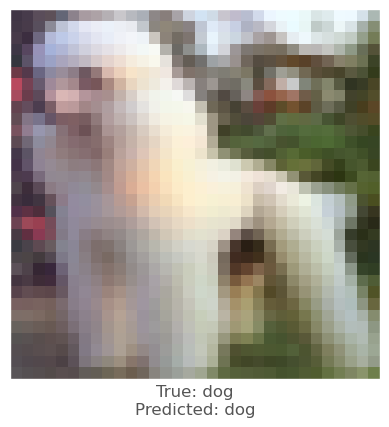



-0.0005800128
-0.005062461
-0.005541086
vr, vg, vb :   0.2727969237782955 2.337363312010705 2.935842549648285
beam_perturbed_confidence temp :  0.62250304
beam_perturbed_confidence temp :  0.6171932
beam_perturbed_confidence temp :  0.61684537
beam_perturbed_confidence temp :  0.6171932
beam_perturbed_confidence temp :  0.61684537
beam_perturbed_confidence temp :  0.611689
beam_perturbed_confidence temp :  0.611689
row index :  5
8th round's confidence : 2th 0.611689
predicted class :  dog
predicted class's confidence :  0.611689
Lopt is :  16


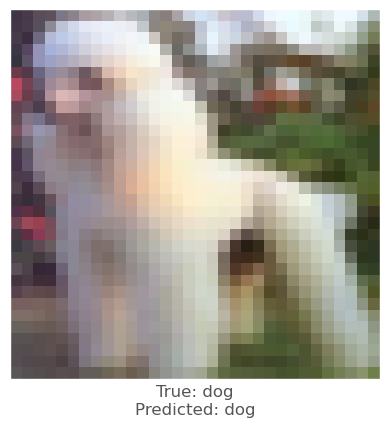



0.0020747185
0.00025576353
-0.003000617
vr, vg, vb :   -1.1681273954856395 -0.02578839194715022 1.9613546573130491
beam_perturbed_confidence temp :  0.6589078
beam_perturbed_confidence temp :  0.6612154
beam_perturbed_confidence temp :  0.65984637
beam_perturbed_confidence temp :  0.6584536
beam_perturbed_confidence temp :  0.6574824
beam_perturbed_confidence temp :  0.65974885
beam_perturbed_confidence temp :  0.65711075
row index :  6
8th round's confidence : 3th 0.65711075
predicted class :  dog
predicted class's confidence :  0.65711075
Lopt is :  21


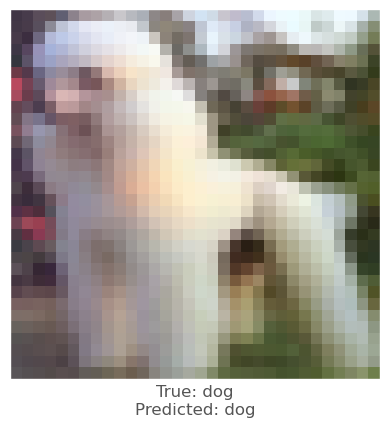



-0.0020760298
-0.005865574
-0.00598979
vr, vg, vb :   0.8339265505521298 3.333536676203847 3.214562228974939
beam_perturbed_confidence temp :  0.5752191
beam_perturbed_confidence temp :  0.5667186
beam_perturbed_confidence temp :  0.5660925
beam_perturbed_confidence temp :  0.5667186
beam_perturbed_confidence temp :  0.5660925
beam_perturbed_confidence temp :  0.5575325
beam_perturbed_confidence temp :  0.5575325
row index :  5
8th round's confidence : 4th 0.5575325
predicted class :  dog
predicted class's confidence :  0.5575325
Lopt is :  25


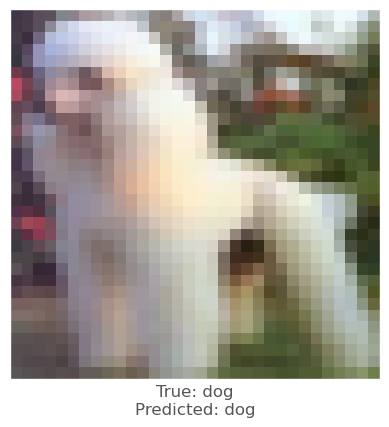



0.00040739775
-0.0021686554
-0.002975583
vr, vg, vb :   -0.4723156093454779 1.2968948756783902 2.050770919953627
beam_perturbed_confidence temp :  0.65353465
beam_perturbed_confidence temp :  0.65266037
beam_perturbed_confidence temp :  0.65073884
beam_perturbed_confidence temp :  0.6524705
beam_perturbed_confidence temp :  0.65050364
beam_perturbed_confidence temp :  0.649764
beam_perturbed_confidence temp :  0.64941233
row index :  6
9th round's confidence : 0th 0.64941233
predicted class :  dog
predicted class's confidence :  0.64941233
Lopt is :  10


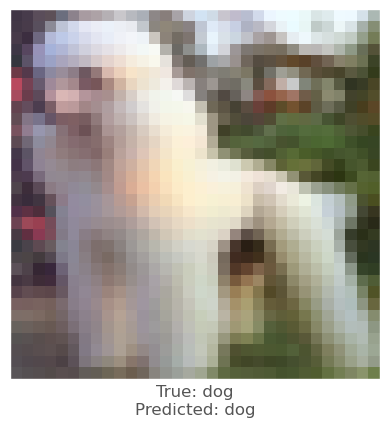



0.0020229816
0.00065392256
-0.002546668
vr, vg, vb :   -1.3535917170982423 -0.0016152296555399792 1.767369344219202
beam_perturbed_confidence temp :  0.6552057
beam_perturbed_confidence temp :  0.6568051
beam_perturbed_confidence temp :  0.65589863
beam_perturbed_confidence temp :  0.6548824
beam_perturbed_confidence temp :  0.6538621
beam_perturbed_confidence temp :  0.65549195
beam_perturbed_confidence temp :  0.6536112
row index :  6
9th round's confidence : 1th 0.6536112
predicted class :  dog
predicted class's confidence :  0.6536112
Lopt is :  20


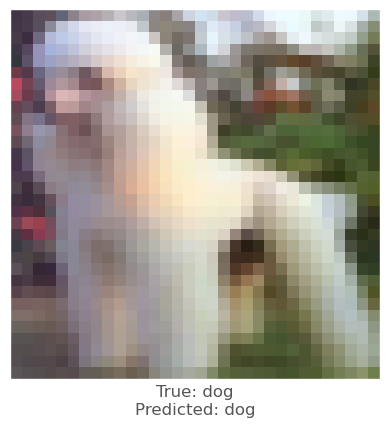



-0.0008684397
-0.005762875
-0.0056726336
vr, vg, vb :   0.33236119883821014 2.679914488820499 3.209521659475327
beam_perturbed_confidence temp :  0.611689
beam_perturbed_confidence temp :  0.60547936
beam_perturbed_confidence temp :  0.6031052
beam_perturbed_confidence temp :  0.60547936
beam_perturbed_confidence temp :  0.6031052
beam_perturbed_confidence temp :  0.59759194
beam_perturbed_confidence temp :  0.59759194
row index :  5
9th round's confidence : 2th 0.59759194
predicted class :  dog
predicted class's confidence :  0.59759194
Lopt is :  19


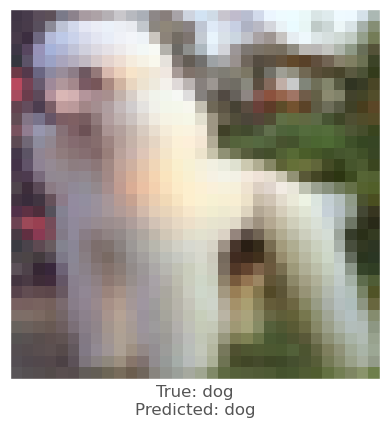



0.0028283
0.0008326173
-0.0027405024
vr, vg, vb :   -1.3341446558607817 -0.10647128103917836 2.0392694273300354
beam_perturbed_confidence temp :  0.65417826
beam_perturbed_confidence temp :  0.65664977
beam_perturbed_confidence temp :  0.6542571
beam_perturbed_confidence temp :  0.6541489
beam_perturbed_confidence temp :  0.65146625
beam_perturbed_confidence temp :  0.6538653
beam_perturbed_confidence temp :  0.6511388
row index :  6
9th round's confidence : 3th 0.6511388
predicted class :  dog
predicted class's confidence :  0.6511388
Lopt is :  23


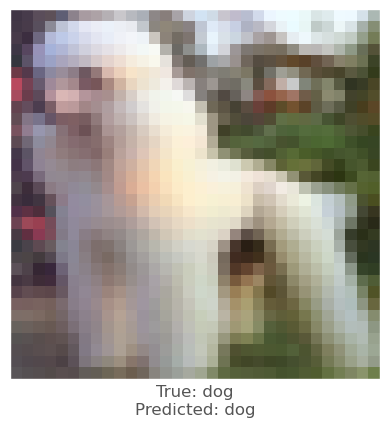



-0.002686739
-0.005987704
-0.0064635277
vr, vg, vb :   1.0192077922864677 3.5989533886036043 3.539458774021781
beam_perturbed_confidence temp :  0.5561834
beam_perturbed_confidence temp :  0.54845005
beam_perturbed_confidence temp :  0.5479144
beam_perturbed_confidence temp :  0.54713875
beam_perturbed_confidence temp :  0.5464528
beam_perturbed_confidence temp :  0.5397744
beam_perturbed_confidence temp :  0.5384728
row index :  6
9th round's confidence : 4th 0.5384728
predicted class :  dog
predicted class's confidence :  0.5384728
Lopt is :  28


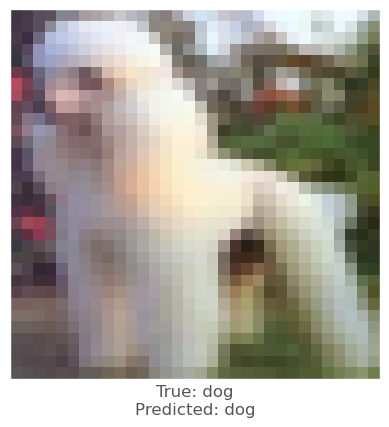



0.00059980154
-0.0022580624
-0.0031970143
vr, vg, vb :   -0.4850642024484057 1.3930116243776411 2.165395261140027
beam_perturbed_confidence temp :  0.6491642
beam_perturbed_confidence temp :  0.6482456
beam_perturbed_confidence temp :  0.6460588
beam_perturbed_confidence temp :  0.6478162
beam_perturbed_confidence temp :  0.64567083
beam_perturbed_confidence temp :  0.6447484
beam_perturbed_confidence temp :  0.64441466
row index :  6
10th round's confidence : 0th 0.64441466
predicted class :  dog
predicted class's confidence :  0.64441466
Lopt is :  11


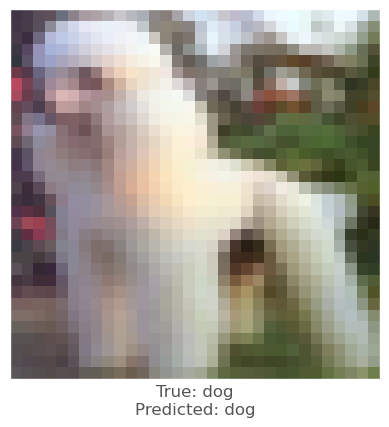



0.0018057823
0.0004914403
-0.0024048686
vr, vg, vb :   -1.3988107771999416 -0.050597736307295554 1.8311192700725505
beam_perturbed_confidence temp :  0.65192413
beam_perturbed_confidence temp :  0.6533707
beam_perturbed_confidence temp :  0.6524775
beam_perturbed_confidence temp :  0.6517626
beam_perturbed_confidence temp :  0.65076655
beam_perturbed_confidence temp :  0.6522735
beam_perturbed_confidence temp :  0.6506647
row index :  6
10th round's confidence : 1th 0.6506647
predicted class :  dog
predicted class's confidence :  0.6506647
Lopt is :  22


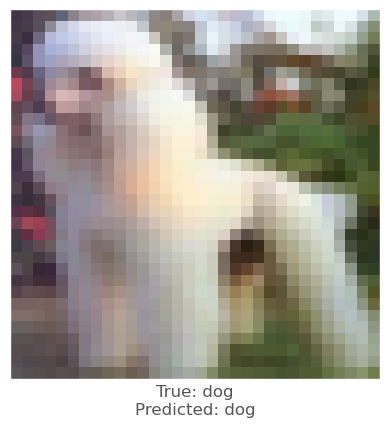



-0.0006969571
-0.0052649975
-0.004835725
vr, vg, vb :   0.36882079009025337 2.9384227881684297 3.3721419765905383
beam_perturbed_confidence temp :  0.59759194
beam_perturbed_confidence temp :  0.59254956
beam_perturbed_confidence temp :  0.5901573
beam_perturbed_confidence temp :  0.59254956
beam_perturbed_confidence temp :  0.5901573
beam_perturbed_confidence temp :  0.5849742
beam_perturbed_confidence temp :  0.5849742
row index :  5
10th round's confidence : 2th 0.5849742
predicted class :  dog
predicted class's confidence :  0.5849742
Lopt is :  22


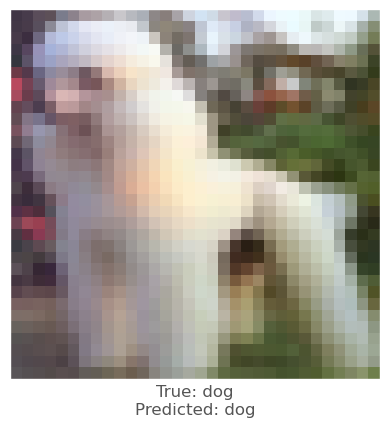



0.002179265
0.00026345253
-0.0028712153
vr, vg, vb :   -1.4186566925024868 -0.12216940592598317 2.122464018944566
beam_perturbed_confidence temp :  0.6495736
beam_perturbed_confidence temp :  0.6512028
beam_perturbed_confidence temp :  0.6485724
beam_perturbed_confidence temp :  0.64952046
beam_perturbed_confidence temp :  0.6466131
beam_perturbed_confidence temp :  0.6481411
beam_perturbed_confidence temp :  0.6465653
row index :  6
10th round's confidence : 3th 0.6465653
predicted class :  dog
predicted class's confidence :  0.6465653
Lopt is :  25


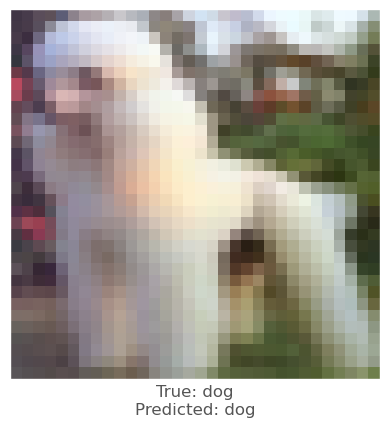



-0.0028243065
-0.005188167
-0.0057104826
vr, vg, vb :   1.199717661861532 3.7578747592616764 3.7565611563547106
beam_perturbed_confidence temp :  0.5369501
beam_perturbed_confidence temp :  0.53036577
beam_perturbed_confidence temp :  0.52955544
beam_perturbed_confidence temp :  0.5288624
beam_perturbed_confidence temp :  0.5278852
beam_perturbed_confidence temp :  0.5213437
beam_perturbed_confidence temp :  0.51941174
row index :  6
10th round's confidence : 4th 0.51941174
predicted class :  dog
predicted class's confidence :  0.51941174
Lopt is :  31


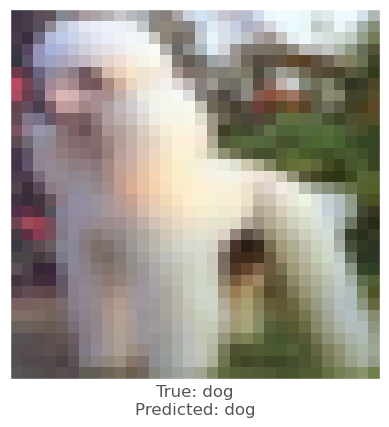



0.000808239
-0.0025636554
-0.003497064
vr, vg, vb :   -0.5173816805189948 1.5100759995833097 2.298562146387719
beam_perturbed_confidence temp :  0.64394015
beam_perturbed_confidence temp :  0.6431072
beam_perturbed_confidence temp :  0.6409025
beam_perturbed_confidence temp :  0.6427029
beam_perturbed_confidence temp :  0.6409356
beam_perturbed_confidence temp :  0.63944733
beam_perturbed_confidence temp :  0.6393649
row index :  6
11th round's confidence : 0th 0.6393649
predicted class :  dog
predicted class's confidence :  0.6393649
Lopt is :  12


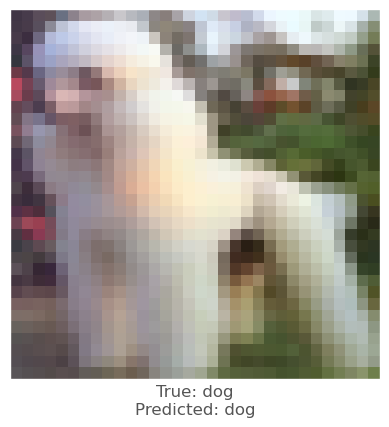



0.0016978979
0.00029730797
-0.0020710826
vr, vg, vb :   -1.4287194905871252 -0.07526875949053084 1.8551156022663453
beam_perturbed_confidence temp :  0.64888203
beam_perturbed_confidence temp :  0.65046924
beam_perturbed_confidence temp :  0.6496915
beam_perturbed_confidence temp :  0.64855886
beam_perturbed_confidence temp :  0.647881
beam_perturbed_confidence temp :  0.6495163
beam_perturbed_confidence temp :  0.6476174
row index :  6
11th round's confidence : 1th 0.6476174
predicted class :  dog
predicted class's confidence :  0.6476174
Lopt is :  24


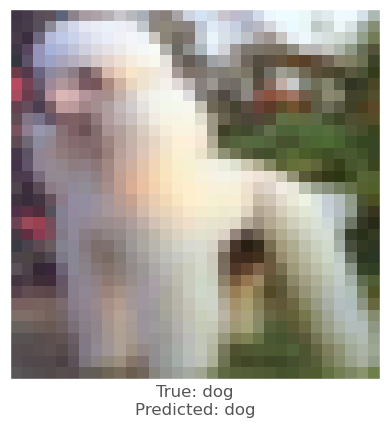



-0.0005272627
-0.005026102
-0.0051377416
vr, vg, vb :   0.38466497984953857 3.1471907159555905 3.548701935501919
beam_perturbed_confidence temp :  0.5849742
beam_perturbed_confidence temp :  0.5774749
beam_perturbed_confidence temp :  0.57722574
beam_perturbed_confidence temp :  0.5774749
beam_perturbed_confidence temp :  0.57722574
beam_perturbed_confidence temp :  0.5692383
beam_perturbed_confidence temp :  0.5692383
row index :  5
11th round's confidence : 2th 0.5692383
predicted class :  dog
predicted class's confidence :  0.5692383
Lopt is :  25


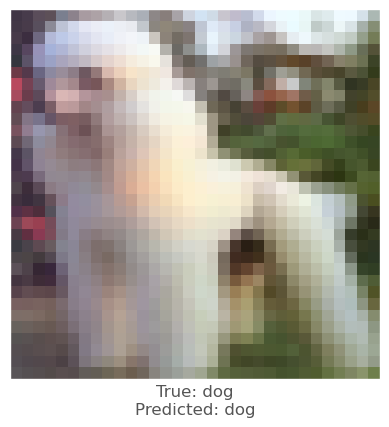



0.0017216802
0.00017672777
-0.0028845668
vr, vg, vb :   -1.448959039685954 -0.1276252425092882 2.198674295440612
beam_perturbed_confidence temp :  0.6446206
beam_perturbed_confidence temp :  0.6464364
beam_perturbed_confidence temp :  0.6441032
beam_perturbed_confidence temp :  0.6444694
beam_perturbed_confidence temp :  0.64202034
beam_perturbed_confidence temp :  0.6437692
beam_perturbed_confidence temp :  0.641489
row index :  6
11th round's confidence : 3th 0.641489
predicted class :  dog
predicted class's confidence :  0.641489
Lopt is :  27


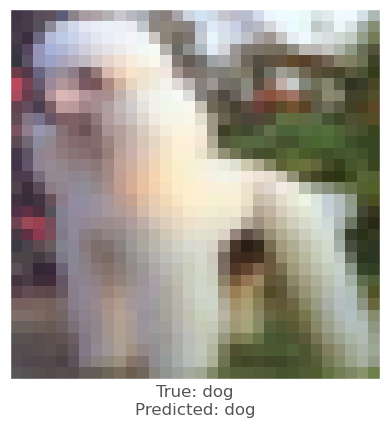



-0.0037523508
-0.0058059096
-0.0064005256
vr, vg, vb :   1.4549809763943728 3.962678246699156 4.020957597710817
beam_perturbed_confidence temp :  0.51759136
beam_perturbed_confidence temp :  0.511536
beam_perturbed_confidence temp :  0.50707275
beam_perturbed_confidence temp :  0.5097943
beam_perturbed_confidence temp :  0.5054905
beam_perturbed_confidence temp :  0.49949256
beam_perturbed_confidence temp :  0.49777544
row index :  6
11th round's confidence : 4th 0.49777544
predicted class :  dog
predicted class's confidence :  0.49777544
Lopt is :  34


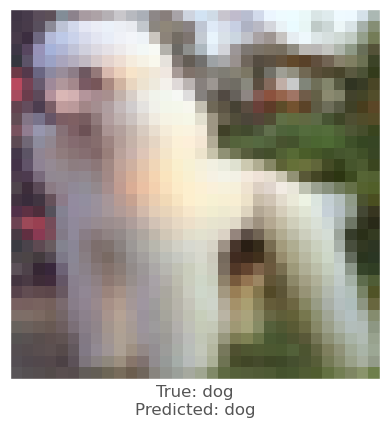

In [33]:
model = resnet
# class_names = ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
# gradient_descent_momentum(image_id, model, sensitive_x, sensitive_y)
start = time.time()
distance_list = []
for i in range(30):
    print(str(i) + "th sensitive pixel")
    L_distance = gradient_descent_momentum_parallel_beam_search(image_id, model, sensitive_list[i][0], sensitive_list[i][1])
    distance_list.append(L_distance)
    print('\n\n')
end = time.time()

In [34]:
# Already checked : 20, 25, 87, 384
# 87 : horse, 0.69, 25 : bird, 0.66 384 : 0.70, bird, 20 : horse, 0.72
# 368 : ship, 0.67, 125 : airplane, 0.66, 520 : dog, 0.66

print(f"{end - start:.6f} sec")
print(distance_list)
df = pd.DataFrame(distance_list, index = range(1, 31), columns = ['Coordinate','Distance', 'Predicted Class', 'Original Class'])
# distance_df_list = [[0] * 32 for i in range(32)]
# distance_df = pd.Dataframe(index = range(0, 32), columns = [for i in range(32)])
print(df.shape)
display(df)
df.to_csv(str(image_id) + '_distance_ex_result.csv')
#display(pd.DataFrame(data = (npdistance), index = range(0, 30), columns = ['Distance    Predicted Class   Original Class']))

214.776911 sec
[[[15, 13], 10, 0.93228, 0.06607359], [[15, 5], None, None, None], [[2, 4], 16, 0.5527096, 0.44049627], [[1, 2], 25, 0.5062443, 0.4838667], [[16, 6], None, None, None], [[16, 5], None, None, None], [[2, 3], None, None, None], [[23, 17], 45, 0.4978235, 0.49617547], [[14, 21], 13, 0.51868784, 0.46477187], [[3, 2], 19, 0.5146027, 0.4727888], [[3, 11], 10, 0.7928184, 0.059585527], [[2, 11], 13, 0.5149766, 0.47491118], [[24, 8], 36, 0.5123042, 0.47403303], [[1, 3], 33, 0.5067485, 0.4842853], [[1, 11], 18, 0.49751344, 0.49751344], [[3, 3], 8, 0.5083492, 0.4807471], [[15, 6], 33, 0.49977937, 0.49182835], [[22, 17], None, None, None], [[1, 12], 16, 0.5110443, 0.48098952], [[14, 4], 30, 0.49706724, 0.49706724], [[25, 17], 47, 0.52403414, 0.46744686], [[23, 9], 7, 0.50331914, 0.48931253], [[23, 15], 8, 0.5057422, 0.4878224], [[1, 10], 12, 0.50208783, 0.48855737], [[0, 9], 61, 0.49816242, 0.49816242], [[1, 5], 19, 0.5132196, 0.47953618], [[25, 15], 20, 0.52438504, 0.46914074], [[14

,Coordinate,Distance,Predicted Class,Original Class
1,"[15, 13]",10.0,0.932280,0.066074
2,"[15, 5]",NaN,NaN,NaN
3,"[2, 4]",16.0,0.552710,0.440496
4,"[1, 2]",25.0,0.506244,0.483867
5,"[16, 6]",NaN,NaN,NaN
6,"[16, 5]",NaN,NaN,NaN
7,"[2, 3]",NaN,NaN,NaN
8,"[23, 17]",45.0,0.497824,0.496175
9,"[14, 21]",13.0,0.518688,0.464772
10,"[3, 2]",19.0,0.514603,0.472789


#### Untargeted Attack

Let's look at one iteration of the untargeted attack. Here we will demonstrate a successful attack an image of a frog with the `resnet` model. We should see the confidence in the true class drop after several iterations.

Try to see if you can successfully attack other images/models. The more pixels we are allowed to modify, the more likely it is we are to find a solution for any given image.

In [50]:
# Test cell for OPA2D vs gradient_descent_momentum

image_id = 384
pixels = 1 # Number of pixels to attack
model = resnet
sen_list = sensitive_pixel_sorting(image_id)
print(sen_list)
print(len(sen_list))
start = time.time()
# _ = my_attack_3(image_id, model, pixel_count=pixels, maxiter = 5, popsize = 50, verbose = True)
_ = Algorithm1(image_id, model, sen_list)
end = time.time()
print(f"{end - start:.6f} sec")


# without early stop, 15sec vs 12sec
termination_constant = 0.01 # termination condition. If return < 0.01 -> success

start_grad = time.time()
for i in range(len(sen_list)):
    con = gradient_descent_momentum(image_id, model, sen_list[i][0], sen_list[i][1])
    if(con is not None and con <= 0.01):
        break
end_grad = time.time()
print(f"{end_grad - start_grad:.6f} sec")
#print(Lopt_list)
#print(attacked_pixel_coord)

[[16, 13, 0.7065553], [17, 15, 0.70654714], [16, 12, 0.7064547], [15, 14, 0.7063695], [16, 14, 0.7063457], [18, 13, 0.70632], [15, 12, 0.7062548], [14, 15, 0.7062262], [13, 15, 0.7061345], [14, 14, 0.7061022], [14, 13, 0.70606136], [17, 13, 0.7059981], [18, 12, 0.7058054], [17, 12, 0.7057074], [15, 13, 0.70558375], [14, 12, 0.7054256], [12, 14, 0.7054158], [17, 14, 0.70184577], [13, 14, 0.7009566], [12, 13, 0.70007956], [27, 14, 0.6989042], [11, 13, 0.696449], [16, 15, 0.6958393], [28, 12, 0.6941298], [15, 16, 0.6938345], [22, 20, 0.6917767], [28, 13, 0.6908335], [29, 12, 0.68843883], [28, 14, 0.68795294], [21, 20, 0.6875751]]
30
pixel coordinate : 16, 13
alpha :  128
alpha_min :  1
alpha :  63.0
alpha_min :  1
alpha :  95.0
alpha_min :  65.0
alpha :  79.0
alpha_min :  65.0
alpha :  69.0
alpha_min :  65.0
alpha :  65.0
alpha_min :  65.0
pixel coordinate : 17, 15
alpha :  128
alpha_min :  1
alpha :  61.0
alpha_min :  1
alpha :  30.0
alpha_min :  1
alpha :  45.0
alpha_min :  32.0
alpha :

-0.0010362864
-0.0010547042
-0.0014730692
2.2636536667408054 -1.3207388765502621 14.74806306992149
new rgb is :  228 188 255
11th round's original class's confidence :  0.623684
11th round's predicted class's confidence :  0.623684


-0.0013555884
-0.002237022
-0.0018885136
3.663994423418776 1.4957613187829868 15.539473041005513
new rgb is :  231 189 255
12th round's original class's confidence :  0.6258336
12th round's predicted class's confidence :  0.6258336


0.006351292
0.00096195936
-0.0011210442
-4.3239555789206605 0.19183395246865298 15.330778727627617
new rgb is :  226 189 255
13th round's original class's confidence :  0.6239304
13th round's predicted class's confidence :  0.6239304


-0.0024348497
-0.0028665066
-0.0020059943
-0.9697403341389461 3.612458449067491 16.204894038763783
new rgb is :  225 192 255
14th round's original class's confidence :  0.6230278
14th round's predicted class's confidence :  0.6230278


-0.00086444616
-0.00027132034
-0.0012421608
0.16456909508793

#### Targeted Attack

In the targeted attack, we can choose which class we want a model to classify an image as. The task is much harder for the targeted attack, as we constrain the misclassification to a given class rather than any class that's not the correct one. We should see the confidence in the target class rise after several iterations.

Below we try to cause the `lenet` to classify an image of a `ship` as an `automobile`. Try to change the parameters and see what happens.

Attacking with target automobile
Confidence: 3.0633404e-05
Confidence: 0.00010486837
Confidence: 0.00014085951
Confidence: 0.00014085951
Confidence: 0.00014861667
Confidence: 0.00015590874
Confidence: 0.00015590874
Confidence: 0.0001633432
Confidence: 0.0001691464
Confidence: 0.0001691464
Confidence: 0.0001736398
Confidence: 0.00018478777
Confidence: 0.00018478777
Confidence: 0.00018926852
Confidence: 0.00019364354
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.00019561265
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.0002003284
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.00020290277
Confidence: 0.0002

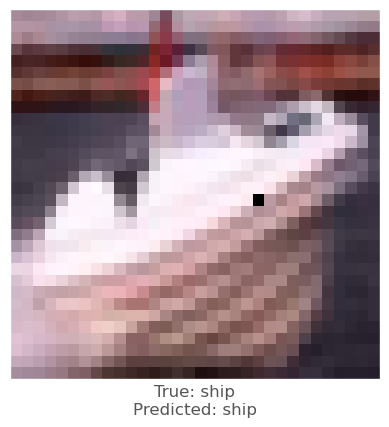

In [60]:
image_id = 108
target_class = 1 # Integer in range 0-9
pixels = 1
model = net_in_net
# net_in_net in 1 pixel : fail
# net_in_net in 3 pixel : success
# wide_resnet in 3 pixel : fail
# densenet in 3 pixel : fail
# pure_cnn in 3 pixel : fail

print('Attacking with target', class_names[target_class])
_ = attack(image_id, model, target_class, pixel_count=pixels, verbose=True)

### Collect Results

Armed with all the necessary tools to conduct a one pixel attack, the final step is to collect relevant statistics on the targeted and untargeted attack. The relevant data points are what percentage of images were we able to successfully attack for a given model, and how the number of pixels affect this percentage.

We will loop through every combination of all models, perturbations of 1,3,5 pixels, images, and target classes (for the targeted attack). This will take a lot of computational resources and time, so [skip to the statistics section](#Attack-Statistics) if that's not your idea of fun.

In [ ]:
def attack_all(models, samples=500, pixels=(1,3,5), targeted=False, 
               maxiter=75, popsize=400, verbose=False):
    results = []
    for model in models:
        model_results = []
        valid_imgs = correct_imgs[correct_imgs.name == model.name].img
        img_samples = np.random.choice(valid_imgs, samples, replace=False)
        
        for pixel_count in pixels:
            for i, img_id in enumerate(img_samples):
                print('\n', model.name, '- image', img_id, '-', i+1, '/', len(img_samples))
                targets = [None] if not targeted else range(10)
                
                for target in targets:
                    if targeted:
                        print('Attacking with target', class_names[target])
                        if target == y_test[img_id, 0]:
                            continue
                    result = attack(img_id, model, target, pixel_count, 
                                    maxiter=maxiter, popsize=popsize, 
                                    verbose=verbose)
                    model_results.append(result)
                    
        results += model_results
        helper.checkpoint(results, targeted)
    return results

In [ ]:
untargeted = attack_all(models, samples=100, targeted=False)

In [ ]:
targeted = attack_all(models, samples=10, targeted=True)

### Attack Statistics

Print the final results! 

In [ ]:
# Load the results
untargeted, targeted = helper.load_results()

In [ ]:
columns = ['model', 'pixels', 'image', 'true', 'predicted', 'success', 'cdiff', 'prior_probs', 'predicted_probs', 'perturbation']
untargeted_results = pd.DataFrame(untargeted, columns=columns)
targeted_results = pd.DataFrame(targeted, columns=columns)

#### Untargeted

In [43]:
helper.attack_stats(untargeted_results, models, network_stats)

,model,accuracy,pixels,attack_success_rate
0,lenet,0.7488,1,0.9
1,lenet,0.7488,3,1.0
2,lenet,0.7488,5,1.0
3,pure_cnn,0.8877,1,0.3
4,pure_cnn,0.8877,3,0.4
5,pure_cnn,0.8877,5,0.5
6,net_in_net,0.9074,1,0.1
7,net_in_net,0.9074,3,0.6
8,net_in_net,0.9074,5,0.7
9,resnet,0.9231,1,0.1


#### Targeted

In [35]:
helper.attack_stats(targeted_results, models, network_stats)

,model,accuracy,pixels,attack_success_rate
0,lenet,0.7488,1,0.222222
1,lenet,0.7488,3,0.644444
2,lenet,0.7488,5,0.633333
3,resnet,0.9231,1,0.155556
4,resnet,0.9231,3,0.311111
5,resnet,0.9231,5,0.344444


### Show some successful attacks

Plot 9 random successful attack images

Untargeted Attack


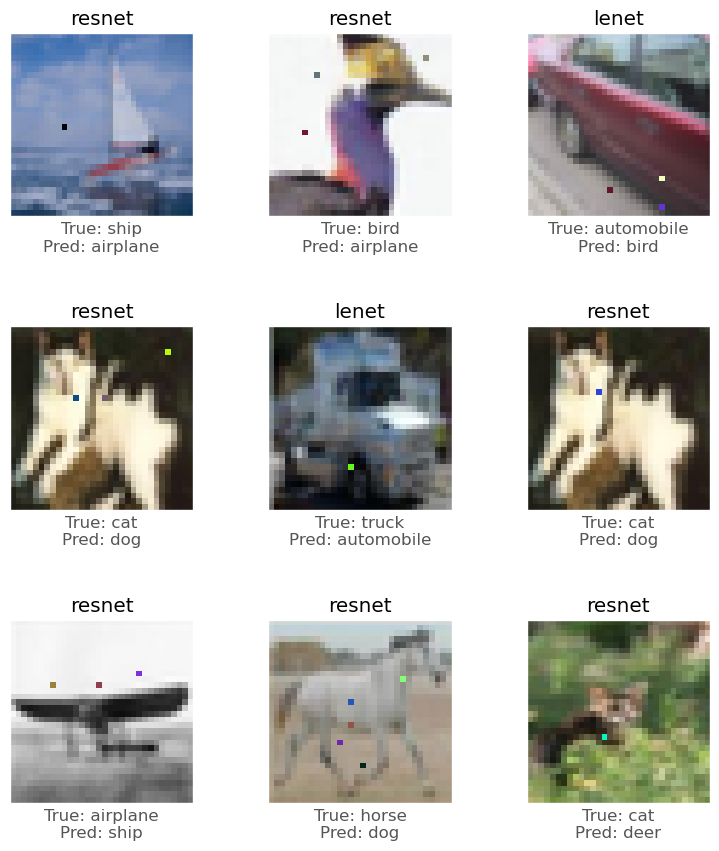

In [25]:
print('Untargeted Attack')
helper.visualize_attack(untargeted_results, class_names)

Targeted Attack


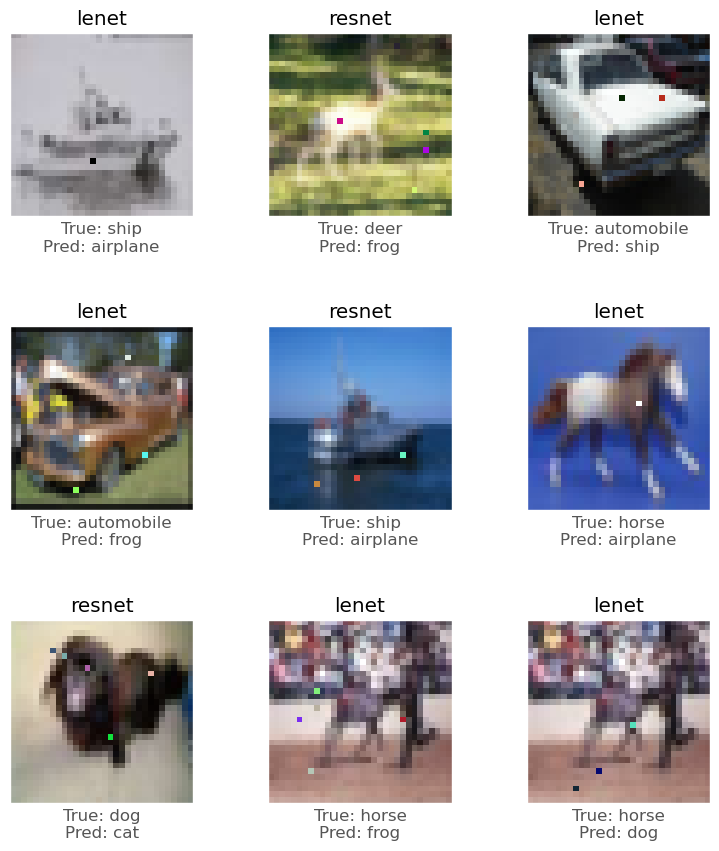

In [26]:
print('Targeted Attack')
helper.visualize_attack(targeted_results, class_names)

## Conclusions

It appears that the accuracy of a model is not strongly correlated with the chance of performing a successful attack on an image. Perhaps surprisingly, the purely convolutional model is the most resistant CNN to these types of attacks. In addition, the capsule network CapsNet has the lowest attack success rate out of all the models, although it is still vulnerable to attack.

[Part 2](1_one-pixel-attack-cifar10.ipynb)

## Credits
 -  This implemenation is based off of the original paper describing the one pixel attack: https://arxiv.org/abs/1710.08864
 - Base code for iPython notebook: https://github.com/09rohanchopra/cifar10
 - Keras Cifar10 models: https://github.com/BIGBALLON/cifar-10-cnn
 - Scipy's differential evolution implementation: https://docs.scipy.org/doc/scipy-0.17.0/reference/generated/scipy.optimize.differential_evolution.html
 - State of the art: https://github.com/RedditSota/state-of-the-art-result-for-machine-learning-problems
 - CapsNet Keras: https://github.com/XifengGuo/CapsNet-Keras
 - CapsNet with Cifar: https://github.com/theblackcat102/dynamic-routing-capsule-cifar